# Training locality sensitive model for regression on AChEi dataset
Things to check with Dr Gearhart:
- Original dataset (SMILES or other form of unique identifier besides Mol_ID) : Check supplementary material Table I of Ruark's paper

- source identifier
- how to calculate temperature normalized logKi (Temperature is missing in null values)

Possible comparisons:
Orthogonal projection to latent structures regression, bootstrap leave random-many-out cross-validation and y-randomization were used to develop an externally validated consensus QSAR model.

ways to identify activity cliffs (Guha & Van Drie 2008),

In [1]:
import os, sys
import pandas as pd
import numpy as np

df=pd.read_csv(os.path.join("..",
                            "..",
                            "rawdata",
                            "OP_extended_AKD2.csv"
                           ),
               index_col=0
              )

#Rearranging 
# columns=df.columns.values
# columns[-1]="logki"
# df.columns=columns
# columns=columns[1:-1]
# columns=np.insert(columns, 0, "logki")
# df=df[columns]

feat_id=7

In [2]:
df.head()

,﻿ID,source,Species,Normalized_temp_logki,Temperature,MOL_ID,logki,MW,AMW,Sv,...,Hypnotic-50,Neoplastic-80,Neoplastic-50,Infective-80,Infective-50,BLTF96,BLTD48,BLTA96,ALOGPS_logP,ALOGPS_logS
Row Id,,,,,,,,,,,,,,,,,,,,,
0,1,a,A,2.34,25.0,C13H13SPO,2.34,248.30,8.56,19.67,...,1.0,1.0,0.0,1.0,1.0,-4.44,-4.73,-4.82,2.51,-3.59
1,2,a,A,2.69,25.0,C14H15OPS,2.69,262.33,8.20,21.26,...,0.0,1.0,1.0,1.0,1.0,-4.66,-4.98,-5.08,3.03,-4.12
2,3,a,A,3.08,25.0,C15H17OPS,3.08,276.36,7.90,22.86,...,0.0,1.0,0.0,1.0,0.0,-4.88,-5.22,-5.34,3.28,-4.67
3,4,a,A,3.40,25.0,C16H19OPS,3.40,290.39,7.64,24.46,...,0.0,1.0,0.0,1.0,0.0,-5.09,-5.46,-5.59,3.83,-4.96
4,5,a,A,3.66,25.0,C17H21OPS,3.66,304.42,7.42,26.06,...,0.0,0.0,0.0,1.0,0.0,-5.30,-5.69,-5.83,4.36,-5.26




## Data Processing (Skip to load data)

No nulls in log_ki. Need to find out how to calculate temperature-normalized log_ki to fill in missing info.

### Check for null values

In [3]:
np.unique(df['logki'].isnull(), return_counts=True)

(array([False]), array([1032], dtype=int64))

No missing target values

In [4]:
#Remove error rows 
mol_id=df['MOL_ID']
drop_ind=np.where([i[-5:]=="Error" for i in mol_id])[0]
print(f"error rows to drop: {drop_ind}")

error rows to drop: [865 866 867]


In [5]:
df=df.drop(index=[865,866,867])

In [6]:
#Replace 999 and -999 (eDragon errors) with np.nan
df=df.replace(to_replace=999, value=np.nan)

In [7]:
# Remove error columns
n_na = np.sum(df.iloc[:, feat_id:].isnull(), axis=0)
drop_col = df.columns[np.where(n_na > 0)[0]+feat_id]
df = df.drop(columns=drop_col)
print(f"{len(drop_col)} out of {len(n_na)} features dropped")
print(drop_col)

23 out of 1666 features dropped
Index(['Se', 'HyDp', 'ww', 'CENT', 'U-045', 'U-080', 'U-105', 'U-113', 'U-114',
       'qpmax', 'qnmax', 'Qpos', 'Qneg', 'Qtot', 'Qmean', 'Q2', 'RPCG', 'RNCG',
       'SPP', 'TE1', 'TE2', 'PCWTe', 'LDI'],
      dtype='object')


In [8]:
all_features = df.iloc[:, feat_id:]
all_target = df['logki']

### One hot encode species values

In [9]:
species_list=np.unique(df['Species'], return_counts=True)
print(species_list[0], species_list[1])

['A' 'B' 'C' 'D' 'E' 'F' 'G' 'H' 'I' 'J' 'K' 'L' 'M' 'N' 'O' 'P' 'Q' 'R'] [443 101  16 280   5  18  10  11   5   5   3   7   5  93  10   5   5   7]


In [10]:
#Drop rows with 10 or less chemicals tested in the same species
retained_species_list=species_list[0][np.argwhere(species_list[1]>10)].flatten()
species_mask=np.isin(df['Species'], retained_species_list)

In [11]:
df_new=df[species_mask]

In [12]:
OHE=pd.get_dummies(df_new['Species'])

### Get values for training

In [13]:
all_features=df_new.iloc[:, feat_id:]
all_features=pd.concat([OHE, all_features], 
                       axis=1)
all_target=df_new['logki']
id_df=df_new.iloc[:, :feat_id]

In [24]:
id_df

,﻿ID,source,Species,Normalized_temp_logki,Temperature,MOL_ID,logki
Row Id,,,,,,,
0,1,a,A,2.34,25.0,C13H13SPO,2.34
1,2,a,A,2.69,25.0,C14H15OPS,2.69
2,3,a,A,3.08,25.0,C15H17OPS,3.08
3,4,a,A,3.40,25.0,C16H19OPS,3.40
4,5,a,A,3.66,25.0,C17H21OPS,3.66
...,...,...,...,...,...,...,...
1027,767,rrr,A,4.08,25.0,C10H23SPO3,4.08
1028,768,rrr,A,3.93,25.0,C11H25O3PS,3.93
1029,769,rrr,A,4.06,25.0,C12H27O3PS,4.06


### Get COSA values without feature selection

In [14]:
import sys
sys.path.append(os.path.join("..","..","0_code"))

from algorithms import COSA

cosa_mdl=COSA.NNCosa(Fweight_init="uniform", lam=0.2, 
                     n_iter=100,
                     distance_measure="inv_exp_dist",
                     calc_D_ijk=False, threads=8
                    )
cosa_mdl.fit(all_features.values, 
             interim_save_file = "interim_AChEi_extendedDataset_Fweights.ob"
            )
Fweights = cosa_mdl.Fweight
pd.DataFrame(Fweights).to_csv(os.path.join(
    "AChEi_eDragon_extendedDataset_Fweights.csv"
), index=False)

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.599, Crit:Not calculated
Wchange:0.121, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.046, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.021, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.011, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.007, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.003, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

In [14]:
#Downselect features

from sklearn.model_selection import KFold
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel

#Feature selection
supports=[]

kf=KFold(n_splits=5, random_state=1234, shuffle=True)
for idx, (train_ind, test_ind) in enumerate(kf.split(all_features)):
    train_features=all_features.iloc[train_ind].values
    test_features=all_features.iloc[test_ind].values
    train_target=all_target.iloc[train_ind].values
    test_target=all_target.iloc[test_ind].values
    
    #Feature selection
    clf=ExtraTreesRegressor(n_estimators=499, random_state=123)
    clf.fit(train_features, train_target)
    model=SelectFromModel(clf, prefit=True)
    supports.append(model.get_support())




Text(0, 0.5, 'Number of features')

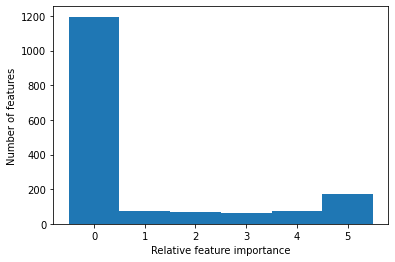

In [15]:
import matplotlib.pyplot as plt

feat_imp_ = np.sum(supports, axis=0)
plt.hist(feat_imp_, np.array(list(range(7)))-0.5)
plt.xlabel("Relative feature importance")
plt.ylabel("Number of features")

In [16]:
selected_feat_ind=np.any(supports,axis=0)
print(f"{np.count_nonzero(selected_feat_ind)} features selected out of {train_features.shape[1]}")

selected_features=all_features.iloc[:,selected_feat_ind]

454 features selected out of 1650


In [17]:
import dill as pickle
with open("AChEi_extended_selected_feat_ind.ob", "wb") as f:
    pickle.dump(selected_feat_ind, f)

In [25]:
all_target.to_csv("AChEi_extended_selected_target.csv")

In [ ]:
selected_features.to_csv("AChEi_extended_selected_feat.csv")

# Load data

In [40]:
import os, sys
import pandas as pd
import numpy as np

selected_features = pd.read_csv(
    "AChEi_extended_selected_feat.csv", index_col=0)
Fweights = pd.read_csv("AChEi_extended_selected_feat_Fweights.csv"
                      ).values
all_target=pd.read_csv("AChEi_extended_selected_target.csv", 
                       index_col=0).values.ravel()

# Compute cross-validated RF and XGBoost
Ruack paper: 20\% randomly selected as external test set

In [80]:
# Is there a way to introduce different types of agonism into the dataset?

In [152]:
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
rf_scores=[]
for train_ind, test_ind in rkf.split(all_features):
    train_features=all_features.iloc[train_ind].values
    test_features=all_features.iloc[test_ind].values
    train_target=all_target.iloc[train_ind].values
    test_target=all_target.iloc[test_ind].values

    clf=RandomForestRegressor(n_estimators=499)
    clf.fit(train_features, train_target)
    rf_scores.append(clf.score(test_features, test_target))
    del clf

print(f"{np.mean(rf_scores):.2f} accuracy with a standard deviation of {np.std(rf_scores):.2f}")

KeyboardInterrupt: 

In [18]:
import xgboost as xgb
from sklearn.model_selection import RepeatedKFold
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
xgb_scores=[]
for train_ind, test_ind in rkf.split(all_features):
    train_features=all_features.iloc[train_ind].values
    test_features=all_features.iloc[test_ind].values
    train_target=all_target.iloc[train_ind].values
    test_target=all_target.iloc[test_ind].values

    xgb_model=xgb.XGBRegressor(n_jobs=-1)
    xgb_model.fit(train_features, train_target)
    xgb_scores.append(xgb_model.score(test_features, test_target))
    del xgb_model

print(f"{np.mean(xgb_scores):.2f} accuracy with a standard deviation of {np.std(xgb_scores):.2f}")

0.75 accuracy with a standard deviation of 0.04


In [19]:
all_features.shape

(962, 1650)

In [153]:
import xgboost as xgb
from sklearn.model_selection import KFold
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
xgb_scores=[]
for train_ind, test_ind in rkf.split(all_features):
    train_features=all_features.iloc[train_ind].values
    test_features=all_features.iloc[test_ind].values
    train_target=all_target.iloc[train_ind].values
    test_target=all_target.iloc[test_ind].values

    xgb_model=xgb.XGBRegressor(n_jobs=-1)
    xgb_model.fit(train_features, train_target)
    xgb_scores.append(xgb_model.score(test_features, test_target))
    del xgb_model

print(f"{np.mean(xgb_scores):.2f} accuracy with a standard deviation of {np.std(xgb_scores):.2f}")

0.75 accuracy with a standard deviation of 0.04


In [55]:
import xgboost as xgb
from sklearn.model_selection import RepeatedKFold
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)

# kf=KFold(n_splits=5, random_state=1234, shuffle=True)
xgbrf_scores=[]
for train_ind, test_ind in rkf.split(all_features):
    train_features=all_features.iloc[train_ind].values
    test_features=all_features.iloc[test_ind].values
    train_target=all_target.iloc[train_ind].values
    test_target=all_target.iloc[test_ind].values

    xgb_model=xgb.XGBRFRegressor(n_jobs=-1)
    xgb_model.fit(train_features, train_target)
    xgbrf_scores.append(xgb_model.score(test_features, test_target))
    del xgb_model

print(f"{np.mean(xgbrf_scores):.3f} accuracy with a standard deviation of {np.std(xgbrf_scores):.2f}")

0.714 accuracy with a standard deviation of 0.04


In [145]:
import xgboost as xgb
from sklearn.model_selection import RepeatedKFold
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)

# kf=KFold(n_splits=5, random_state=1234, shuffle=True)
xgbrf_feat_select_scores = []
for train_ind, test_ind in rkf.split(all_features):
    train_features = selected_features.iloc[train_ind, :].values
    test_features = selected_features.iloc[test_ind, :].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

    xgb_model = xgb.XGBRFRegressor(n_jobs=-1)
    xgb_model.fit(train_features, train_target)
    xgbrf_feat_select_scores.append(xgb_model.score(test_features, test_target))
    del xgb_model

print(f"{np.mean(xgbrf_feat_select_scores):.3f} accuracy with a standard deviation of {np.std(xgbrf_feat_select_scores):.2f}")

0.723 accuracy with a standard deviation of 0.04


In [146]:
import xgboost as xgb
from sklearn.model_selection import RepeatedKFold
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)

# kf=KFold(n_splits=5, random_state=1234, shuffle=True)
xgb_feat_select_scores = []
for train_ind, test_ind in rkf.split(all_features):
    train_features = selected_features.iloc[train_ind, :].values
    test_features = selected_features.iloc[test_ind, :].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

    xgb_model = xgb.XGBRegressor(n_jobs=-1)
    xgb_model.fit(train_features, train_target)
    xgb_feat_select_scores.append(xgb_model.score(test_features, test_target))
    del xgb_model

print(f"{np.mean(xgb_feat_select_scores):.3f} accuracy with a standard deviation of {np.std(xgb_feat_select_scores):.2f}")

0.770 accuracy with a standard deviation of 0.03


In [147]:
import xgboost as xgb
from sklearn.model_selection import RepeatedKFold
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)

# kf=KFold(n_splits=5, random_state=1234, shuffle=True)
rf_feat_select_scores = []
for train_ind, test_ind in rkf.split(all_features):
    train_features = selected_features.iloc[train_ind, :].values
    test_features = selected_features.iloc[test_ind, :].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

    rf_model = RandomForestRegressor(n_jobs=-1)
    rf_model.fit(train_features, train_target)
    rf_feat_select_scores.append(rf_model.score(test_features, test_target))
    del rf_model

print(f"{np.mean(rf_feat_select_scores):.3f} accuracy with a standard deviation of {np.std(rf_feat_select_scores):.2f}")

0.774 accuracy with a standard deviation of 0.03


Global feature selection seems to work better than no feature selection

In [151]:
rf_feat_select_scores

[0.8282369966954394,
 0.806136974673869,
 0.7408744897903923,
 0.7368329826416682,
 0.7678005490566319,
 0.7529235201350041,
 0.8275860412469593,
 0.8062691142910856,
 0.6772708218043652,
 0.8095746562217243,
 0.8107898364147658,
 0.7663915388592928,
 0.7638054209385627,
 0.755812370937523,
 0.7711340470330403,
 0.7657194679349767,
 0.7542910904771438,
 0.7588225421130456,
 0.7366685358089258,
 0.8212024549248461,
 0.7164231565891428,
 0.7966428051913086,
 0.7793388457743091,
 0.7880419482395404,
 0.7618147777320491,
 0.7622149201632904,
 0.7637479006151114,
 0.786176730140998,
 0.7629552784230584,
 0.7965139998253716,
 0.7755124862234672,
 0.761147380513118,
 0.7917440995691505,
 0.7684858468134161,
 0.7872480988364114,
 0.733737886905311,
 0.7813053216898836,
 0.7716604178113069,
 0.8182149333729002,
 0.7451637148078083,
 0.8173727992340286,
 0.8010451664409153,
 0.7873711995169647,
 0.7062607926657805,
 0.8003977041094275,
 0.7414273150955057,
 0.786382608179208,
 0.8223135370346961

In [149]:
xgb_scores

[0.8028838786460804,
 0.7898875987835939,
 0.6996988340404153,
 0.733276432290776,
 0.710832167702615]

In [150]:
xgbrf_scores

[0.8044372411918561,
 0.7557388751867318,
 0.662755004087709,
 0.6529425355699453,
 0.7204314420509323,
 0.7203089376992844,
 0.7561752126960863,
 0.7327415694653358,
 0.6232245992958927,
 0.7608345987259022,
 0.7552449196735427,
 0.7072811362584936,
 0.6864974425850683,
 0.6761010945996695,
 0.7185716103697892,
 0.7106697979094025,
 0.6946325204150972,
 0.7059391036175308,
 0.6611634057423661,
 0.7853866832280446,
 0.6748299250780968,
 0.7077910115735959,
 0.7394431218357409,
 0.7503339706339466,
 0.7142113692243504,
 0.7109411666458516,
 0.7083629954867543,
 0.7138054519992358,
 0.6988455476036045,
 0.7347657265154914,
 0.7046932174688941,
 0.6967364155835987,
 0.726612775634811,
 0.7154393073733711,
 0.722423426767342,
 0.6681659661259953,
 0.7312190522297366,
 0.7279465276064523,
 0.767283534819342,
 0.672083716214566,
 0.7914639847683056,
 0.7190900904254793,
 0.7228876836885139,
 0.6201945407870737,
 0.7353140388077183,
 0.6741982719916426,
 0.7528374128855173,
 0.756866349467701

Fewer datapoints, lower cross-validated accuracy on this dataset

In [24]:
features=df.iloc[:,feat_id:]
targets=df['logki']

from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
features_scaled=scaler.fit_transform(features)

In [26]:
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import LeaveOneOut
xgb_model=xgb.XGBRFRegressor(n_jobs=-1)
predictions=cross_val_predict(xgb_model, 
                              features_scaled,
                              targets,
                              cv=LeaveOneOut()
                             )
r2_score(targets, predictions)

0.7678597532882123

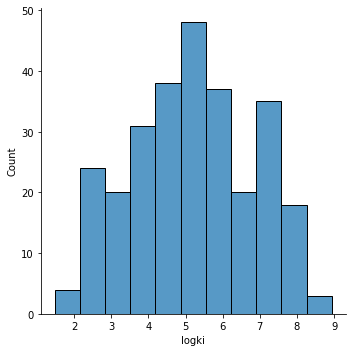

In [27]:
#Plot the distribution of the features
import seaborn as sns
sns.displot(targets)


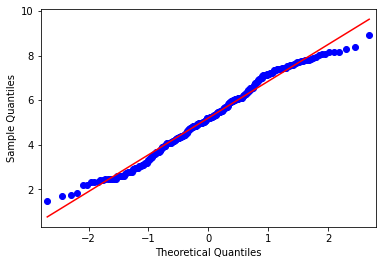

In [29]:
#Normality test: QQ-plot
from statsmodels.graphics.gofplots import qqplot
plot=qqplot(targets, line='s')

In [30]:
#Normality tests
#Shapiro: How likely data comes from a Gaussian distribution
from scipy.stats import shapiro
stat_s,p_s=shapiro(targets)
#D'Agostino's K^s test: Does kurtosis and skewness depart from normal distribution
from scipy.stats import normaltest
stat_da,p_da=normaltest(targets)
#Anderson-Darling test: Does data sample come from normal distribution?
from scipy.stats import anderson
result = anderson(targets)


In [31]:
stat_s, p_s #Reject H0, data does not look Gaussian

(0.9816412925720215, 0.0012144932989031076)

In [32]:
stat_da, p_da #Reject H0, data does not look Gaussian

(21.5281241503522, 2.1145951797279346e-05)

In [35]:
for i in range(len(result.critical_values)):
	sl, cv = result.significance_level[i], result.critical_values[i]
	if result.statistic < result.critical_values[i]:
		print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
	else:
		print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

15.000: 0.568, data does not look normal (reject H0)
10.000: 0.647, data does not look normal (reject H0)
5.000: 0.776, data does not look normal (reject H0)
2.500: 0.905, data does not look normal (reject H0)
1.000: 1.077, data does not look normal (reject H0)


Consider scaling features to Gaussian for training the deep learner or maybe even xgboost.
Other feature scaling methods: QuantileTransform (scale to uniform distribution); 

# Preprocessing diagnostics

# Train attention model with feature weighting

## train_test_split and scaling (Skip to subsection 5)

In [7]:
from sklearn.model_selection import KFold
kf=KFold(n_splits=5, random_state=123, shuffle=True)
for train_ind, test_ind in kf.split(features):
    break

train_features=df.iloc[train_ind,7:].values
test_features=df.iloc[test_ind,7:].values
train_target=df['logki'].iloc[train_ind].values
test_target=df['logki'].iloc[test_ind].values

from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel

clf=ExtraTreesRegressor(n_estimators=99)
clf.fit(train_features, train_target)
model=SelectFromModel(clf, prefit=True)
train_features_select=model.transform(train_features)
test_features_select=model.transform(test_features)

print(train_features_select.shape)

NameError: name 'features' is not defined

In [22]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
feature_scaler=StandardScaler()
feature_scaler.fit(train_features_select)
train_features_scaled=feature_scaler.transform(train_features_select)
test_features_scaled=feature_scaler.transform(test_features_select)

target_scaler=MinMaxScaler()
target_scaler.fit(np.expand_dims(train_target, axis=1))
train_target_scaled=target_scaler.transform(np.expand_dims(train_target, axis=1)).flatten()
test_target_scaled=target_scaler.transform(np.expand_dims(test_target, axis=1)).flatten()

NameError: name 'train_features_select' is not defined

## Train COSA feature weights (using unscaled features) (Skip to subsection 5)


In [188]:
from algorithms import COSA

cosa_mdl=COSA.NNCosa(n_iter=100, 
                distance_measure='inv_exp_dist', 
                calc_D_ijk = False)
cosa_mdl.fit(train_features_select)
cosa_mdl.fit_OOS(test_features_select)

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.822, Crit:Not calculated
Wchange:0.129, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.043, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.026, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.014, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.009, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.005, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.004, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:33.620, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 20; beta/eta:0.600
Wchange:41.688, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 21; beta/eta:0.620
Wchange:34.098, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:72.122, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:98.076, Crit: Not calculated
Wchange:0.000, Cr

Wchange:43.640, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 76; beta/eta:1.720
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 77; beta/eta:1.740
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 78; beta/eta:1.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 79; beta/eta:1.780
Wchange:22.651, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 80; beta/eta:1.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:58.791, Crit: Not calculated
Wchange:36.137, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converg

In [189]:
train_Fweights=cosa_mdl.output_Fweight()
test_Fweights=cosa_mdl.output_Fweight(OOS=True)

In [190]:
train_tensor=np.hstack([train_features_select, train_Fweights])
test_tensor=np.hstack([test_features_select, test_Fweights])
train_tensor_scaled=np.hstack([train_features_scaled, train_Fweights])
test_tensor_scaled=np.hstack([test_features_scaled, test_Fweights])

In [284]:
train_ds=tf.data.Dataset.from_tensor_slices((train_tensor_scaled, 
                                             train_target_scaled))
test_ds=tf.data.Dataset.from_tensor_slices((test_tensor_scaled, 
                                            test_target_scaled))

train_ds=train_ds.batch(8).prefetch(128).cache()
test_ds=test_ds.batch(8).prefetch(128).cache()

## Setup and train model (Skip to subsection 5)

In [9]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.keras.backend.set_floatx('float32')


code_folder=os.path.join(os.getcwd(),
                         "..",
                         "..",
                         "0_code"
                        )
sys.path.append(code_folder)



In [326]:
import time
n_hidden=256
n_out=1
n_features=train_features_select.shape[1]

learning_rate=0.001
save_folder=os.path.join("Preliminary_Models",
                         time.strftime("%y%m%d_LSwFW_AChEi_split4",
                                       time.localtime()
                                      ))
checkpoint_path=os.path.join(save_folder, "LSwFW_AChEi")
csv_filename=os.path.join(checkpoint_path, "training_log.csv")
try:
    os.mkdir(save_folder)
except OSError as error:
    print(error)
try:
    os.mkdir(checkpoint_path)
except OSError as error:
    print(error)

cp_callback=tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                               monitor='val_root_mean_squared_error', 
                                               mode='min', 
                                               save_best_only=True,
                                               save_weights_only=True,
                                               verbose=1
                                              )
csvlogger_callback=tf.keras.callbacks.CSVLogger(filename=csv_filename, 
                                                append=True
                                               )

[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models\\210309_LSwFW_AChEi_split4'
[WinError 183] Cannot create a file when that file already exists: 'Preliminary_Models\\210309_LSwFW_AChEi_split4\\LSwFW_AChEi'


In [327]:
from tensorflow.keras.initializers import VarianceScaling
from tensorflow.keras.regularizers import l1, l2
n_attention=5
n_attention_hidden=20
n_attention_out=1
n_feat=n_features
n_concat_hidden=n_hidden
concat_activation="selu"
# kernel_initializer=tf.keras.initializers.LecunNormal(seed=123)
kernel_initializer=VarianceScaling(distribution="uniform")
attention_hidden_activation="selu"
attention_output_activation="sigmoid"

# hidden_activation="sigmoid"
hidden_activation="selu"

In [328]:
from tensorflow.keras.layers import Input, Dense, Dropout
from algorithms import attention_model

input_shape=(n_features*2,)
input_layer=Input(shape=input_shape)
attentions_layer=attention_model.ConcatAttentionswFeatWeights(
    n_attention=n_attention,
    n_attention_hidden=n_attention_hidden,
    n_attention_out=n_attention_out,
    n_feat=n_feat,
    n_hidden=n_concat_hidden,
    activation=concat_activation, 
    kernel_initializer=kernel_initializer,
    kernel_regularizer=l2(1E-5),
    bias_regularizer=l2(1E-5),
    attention_initializer=kernel_initializer,
    attention_hidden_activation=attention_hidden_activation,
    attention_output_activation=attention_output_activation,
    batch_norm_kwargs={"trainable":False, "renorm":True},
)(input_layer)
#Removed dropout for attentions_layer because of Batch normalization
dense_layer1=Dense(n_hidden, 
                   activation=hidden_activation, 
                   kernel_initializer=kernel_initializer,
                   kernel_regularizer=l2(1E-5),
                   bias_regularizer=l2(1E-5),
                  )(attentions_layer)
# dropout1=Dropout(0.1)(dense_layer1)
dense_layer2=Dense(n_hidden,
                   activation=hidden_activation,
                   kernel_initializer=kernel_initializer,
                   kernel_regularizer=l2(1E-5),
                   bias_regularizer=l2(1E-5)
                  )(dense_layer1)
# dropout2=Dropout(0.1)(dense_layer2)
dense_layer3=Dense(n_hidden,
                   activation=hidden_activation,
                   kernel_initializer=kernel_initializer,
                   kernel_regularizer=l2(1E-5),
                   bias_regularizer=l2(1E-5)
                  )(dense_layer2)
output_layer=Dense(n_out, activation="sigmoid")(dense_layer3)

LSwFW_model=tf.keras.Model(inputs=input_layer, 
                  outputs=output_layer
                 )

In [329]:
LSwFW_model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=learning_rate,
                                                      clipvalue=0.5,
                                                      clipnorm=1.0,
                                                     ),
#     optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
#                                   loss=tf.keras.losses.MAE,
                 #                  loss='cosine_similarity',
                 loss=tf.keras.losses.Huber(delta=0.05),
                 metrics=["mae", "mse", 
                          tf.keras.metrics.RootMeanSquaredError()
                         ]
                 )
# LS_model.build((None, *input_shape))


LSwFW_model.fit(train_ds,
                validation_data=test_ds,
#                 epochs=1000,
                epochs=2000,
#                 batch_size=8,
                shuffle=True,
                callbacks=[cp_callback, csvlogger_callback],
                verbose=1
               )

Epoch 1/2000
45/45 [==============================] - 5s 35ms/step - loss: 0.0201 - mae: 0.2224 - mse: 0.0787 - root_mean_squared_error: 0.2795 - val_loss: 0.0208 - val_mae: 0.2361 - val_mse: 0.0802 - val_root_mean_squared_error: 0.2832

Epoch 00001: val_root_mean_squared_error improved from inf to 0.28318, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 2/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0198 - mae: 0.2163 - mse: 0.0753 - root_mean_squared_error: 0.2734 - val_loss: 0.0203 - val_mae: 0.2266 - val_mse: 0.0745 - val_root_mean_squared_error: 0.2730

Epoch 00002: val_root_mean_squared_error improved from 0.28318 to 0.27300, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 3/2000
45/45 [==============================] - 1s 26ms/step - loss: 0.0196 - mae: 0.2104 - mse: 0.0722 - root_mean_squared_error: 0.2678 - val_loss: 0.0199 - val_mae: 0.2177 - val_mse: 0.0696 - val_root_mean_squared_error: 0.

45/45 [==============================] - 1s 27ms/step - loss: 0.0152 - mae: 0.1208 - mse: 0.0287 - root_mean_squared_error: 0.1679 - val_loss: 0.0151 - val_mae: 0.1198 - val_mse: 0.0253 - val_root_mean_squared_error: 0.1592

Epoch 00043: val_root_mean_squared_error improved from 0.15978 to 0.15919, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 44/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0151 - mae: 0.1199 - mse: 0.0283 - root_mean_squared_error: 0.1669 - val_loss: 0.0150 - val_mae: 0.1194 - val_mse: 0.0252 - val_root_mean_squared_error: 0.1586

Epoch 00044: val_root_mean_squared_error improved from 0.15919 to 0.15862, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 45/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0151 - mae: 0.1191 - mse: 0.0280 - root_mean_squared_error: 0.1659 - val_loss: 0.0150 - val_mae: 0.1189 - val_mse: 0.0250 - val_root_mean_squared_error: 0.1581

E

45/45 [==============================] - 1s 25ms/step - loss: 0.0140 - mae: 0.0973 - mse: 0.0191 - root_mean_squared_error: 0.1372 - val_loss: 0.0145 - val_mae: 0.1075 - val_mse: 0.0212 - val_root_mean_squared_error: 0.1455

Epoch 00085: val_root_mean_squared_error improved from 0.14567 to 0.14549, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 86/2000
45/45 [==============================] - 1s 26ms/step - loss: 0.0140 - mae: 0.0969 - mse: 0.0190 - root_mean_squared_error: 0.1367 - val_loss: 0.0145 - val_mae: 0.1073 - val_mse: 0.0211 - val_root_mean_squared_error: 0.1453

Epoch 00086: val_root_mean_squared_error improved from 0.14549 to 0.14531, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 87/2000
45/45 [==============================] - 1s 27ms/step - loss: 0.0140 - mae: 0.0965 - mse: 0.0188 - root_mean_squared_error: 0.1361 - val_loss: 0.0145 - val_mae: 0.1072 - val_mse: 0.0211 - val_root_mean_squared_error: 0.1451

E

45/45 [==============================] - 1s 25ms/step - loss: 0.0134 - mae: 0.0844 - mse: 0.0144 - root_mean_squared_error: 0.1192 - val_loss: 0.0143 - val_mae: 0.1032 - val_mse: 0.0199 - val_root_mean_squared_error: 0.1409

Epoch 00127: val_root_mean_squared_error improved from 0.14097 to 0.14092, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 128/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0134 - mae: 0.0841 - mse: 0.0143 - root_mean_squared_error: 0.1189 - val_loss: 0.0143 - val_mae: 0.1032 - val_mse: 0.0198 - val_root_mean_squared_error: 0.1409

Epoch 00128: val_root_mean_squared_error improved from 0.14092 to 0.14086, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 129/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0134 - mae: 0.0839 - mse: 0.0142 - root_mean_squared_error: 0.1186 - val_loss: 0.0143 - val_mae: 0.1032 - val_mse: 0.0198 - val_root_mean_squared_error: 0.1408


45/45 [==============================] - 1s 25ms/step - loss: 0.0130 - mae: 0.0759 - mse: 0.0117 - root_mean_squared_error: 0.1077 - val_loss: 0.0142 - val_mae: 0.1023 - val_mse: 0.0193 - val_root_mean_squared_error: 0.1389

Epoch 00169: val_root_mean_squared_error improved from 0.13892 to 0.13887, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 170/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0130 - mae: 0.0757 - mse: 0.0117 - root_mean_squared_error: 0.1074 - val_loss: 0.0142 - val_mae: 0.1023 - val_mse: 0.0193 - val_root_mean_squared_error: 0.1388

Epoch 00170: val_root_mean_squared_error improved from 0.13887 to 0.13881, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 171/2000
45/45 [==============================] - 1s 26ms/step - loss: 0.0130 - mae: 0.0756 - mse: 0.0116 - root_mean_squared_error: 0.1072 - val_loss: 0.0142 - val_mae: 0.1022 - val_mse: 0.0193 - val_root_mean_squared_error: 0.1388


45/45 [==============================] - 1s 23ms/step - loss: 0.0127 - mae: 0.0699 - mse: 0.0099 - root_mean_squared_error: 0.0990 - val_loss: 0.0141 - val_mae: 0.1005 - val_mse: 0.0186 - val_root_mean_squared_error: 0.1365

Epoch 00211: val_root_mean_squared_error improved from 0.13651 to 0.13646, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 212/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0127 - mae: 0.0698 - mse: 0.0098 - root_mean_squared_error: 0.0988 - val_loss: 0.0141 - val_mae: 0.1005 - val_mse: 0.0186 - val_root_mean_squared_error: 0.1364

Epoch 00212: val_root_mean_squared_error improved from 0.13646 to 0.13640, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 213/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0127 - mae: 0.0696 - mse: 0.0098 - root_mean_squared_error: 0.0986 - val_loss: 0.0141 - val_mae: 0.1004 - val_mse: 0.0186 - val_root_mean_squared_error: 0.1363


45/45 [==============================] - 1s 23ms/step - loss: 0.0125 - mae: 0.0651 - mse: 0.0085 - root_mean_squared_error: 0.0920 - val_loss: 0.0141 - val_mae: 0.0988 - val_mse: 0.0180 - val_root_mean_squared_error: 0.1343

Epoch 00253: val_root_mean_squared_error improved from 0.13430 to 0.13425, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 254/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0125 - mae: 0.0650 - mse: 0.0085 - root_mean_squared_error: 0.0918 - val_loss: 0.0141 - val_mae: 0.0988 - val_mse: 0.0180 - val_root_mean_squared_error: 0.1342

Epoch 00254: val_root_mean_squared_error improved from 0.13425 to 0.13420, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 255/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0125 - mae: 0.0649 - mse: 0.0085 - root_mean_squared_error: 0.0916 - val_loss: 0.0141 - val_mae: 0.0988 - val_mse: 0.0180 - val_root_mean_squared_error: 0.1342


45/45 [==============================] - 1s 23ms/step - loss: 0.0123 - mae: 0.0611 - mse: 0.0075 - root_mean_squared_error: 0.0861 - val_loss: 0.0140 - val_mae: 0.0973 - val_mse: 0.0175 - val_root_mean_squared_error: 0.1323

Epoch 00295: val_root_mean_squared_error improved from 0.13238 to 0.13234, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 296/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0123 - mae: 0.0610 - mse: 0.0074 - root_mean_squared_error: 0.0860 - val_loss: 0.0140 - val_mae: 0.0972 - val_mse: 0.0175 - val_root_mean_squared_error: 0.1323

Epoch 00296: val_root_mean_squared_error improved from 0.13234 to 0.13230, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 297/2000
45/45 [==============================] - 1s 22ms/step - loss: 0.0123 - mae: 0.0609 - mse: 0.0074 - root_mean_squared_error: 0.0858 - val_loss: 0.0140 - val_mae: 0.0972 - val_mse: 0.0175 - val_root_mean_squared_error: 0.1323


45/45 [==============================] - 1s 23ms/step - loss: 0.0122 - mae: 0.0576 - mse: 0.0066 - root_mean_squared_error: 0.0811 - val_loss: 0.0139 - val_mae: 0.0958 - val_mse: 0.0171 - val_root_mean_squared_error: 0.1308

Epoch 00337: val_root_mean_squared_error improved from 0.13078 to 0.13075, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 338/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0121 - mae: 0.0575 - mse: 0.0066 - root_mean_squared_error: 0.0810 - val_loss: 0.0139 - val_mae: 0.0957 - val_mse: 0.0171 - val_root_mean_squared_error: 0.1307

Epoch 00338: val_root_mean_squared_error improved from 0.13075 to 0.13072, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 339/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0121 - mae: 0.0575 - mse: 0.0066 - root_mean_squared_error: 0.0808 - val_loss: 0.0139 - val_mae: 0.0957 - val_mse: 0.0171 - val_root_mean_squared_error: 0.1307


45/45 [==============================] - 1s 23ms/step - loss: 0.0120 - mae: 0.0545 - mse: 0.0059 - root_mean_squared_error: 0.0766 - val_loss: 0.0138 - val_mae: 0.0942 - val_mse: 0.0167 - val_root_mean_squared_error: 0.1294

Epoch 00379: val_root_mean_squared_error improved from 0.12940 to 0.12937, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 380/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0120 - mae: 0.0544 - mse: 0.0059 - root_mean_squared_error: 0.0765 - val_loss: 0.0138 - val_mae: 0.0942 - val_mse: 0.0167 - val_root_mean_squared_error: 0.1293

Epoch 00380: val_root_mean_squared_error improved from 0.12937 to 0.12933, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 381/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0120 - mae: 0.0543 - mse: 0.0059 - root_mean_squared_error: 0.0764 - val_loss: 0.0138 - val_mae: 0.0941 - val_mse: 0.0167 - val_root_mean_squared_error: 0.1293


45/45 [==============================] - 1s 23ms/step - loss: 0.0119 - mae: 0.0516 - mse: 0.0053 - root_mean_squared_error: 0.0728 - val_loss: 0.0138 - val_mae: 0.0926 - val_mse: 0.0164 - val_root_mean_squared_error: 0.1281

Epoch 00421: val_root_mean_squared_error improved from 0.12812 to 0.12809, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 422/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0119 - mae: 0.0515 - mse: 0.0053 - root_mean_squared_error: 0.0727 - val_loss: 0.0138 - val_mae: 0.0926 - val_mse: 0.0164 - val_root_mean_squared_error: 0.1281

Epoch 00422: val_root_mean_squared_error improved from 0.12809 to 0.12807, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 423/2000
45/45 [==============================] - 1s 25ms/step - loss: 0.0119 - mae: 0.0515 - mse: 0.0053 - root_mean_squared_error: 0.0726 - val_loss: 0.0138 - val_mae: 0.0926 - val_mse: 0.0164 - val_root_mean_squared_error: 0.1280


45/45 [==============================] - 1s 24ms/step - loss: 0.0117 - mae: 0.0490 - mse: 0.0049 - root_mean_squared_error: 0.0695 - val_loss: 0.0137 - val_mae: 0.0913 - val_mse: 0.0161 - val_root_mean_squared_error: 0.1270

Epoch 00463: val_root_mean_squared_error improved from 0.12705 to 0.12703, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 464/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0117 - mae: 0.0490 - mse: 0.0048 - root_mean_squared_error: 0.0694 - val_loss: 0.0137 - val_mae: 0.0912 - val_mse: 0.0161 - val_root_mean_squared_error: 0.1270

Epoch 00464: val_root_mean_squared_error improved from 0.12703 to 0.12701, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 465/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0117 - mae: 0.0489 - mse: 0.0048 - root_mean_squared_error: 0.0693 - val_loss: 0.0137 - val_mae: 0.0912 - val_mse: 0.0161 - val_root_mean_squared_error: 0.1270


45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0467 - mse: 0.0044 - root_mean_squared_error: 0.0665 - val_loss: 0.0137 - val_mae: 0.0902 - val_mse: 0.0159 - val_root_mean_squared_error: 0.1261

Epoch 00505: val_root_mean_squared_error improved from 0.12616 to 0.12614, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 506/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0466 - mse: 0.0044 - root_mean_squared_error: 0.0664 - val_loss: 0.0137 - val_mae: 0.0901 - val_mse: 0.0159 - val_root_mean_squared_error: 0.1261

Epoch 00506: val_root_mean_squared_error improved from 0.12614 to 0.12612, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 507/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0466 - mse: 0.0044 - root_mean_squared_error: 0.0664 - val_loss: 0.0137 - val_mae: 0.0901 - val_mse: 0.0159 - val_root_mean_squared_error: 0.1261


45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0446 - mse: 0.0041 - root_mean_squared_error: 0.0638 - val_loss: 0.0136 - val_mae: 0.0892 - val_mse: 0.0157 - val_root_mean_squared_error: 0.1253

Epoch 00547: val_root_mean_squared_error improved from 0.12536 to 0.12534, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 548/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0445 - mse: 0.0041 - root_mean_squared_error: 0.0637 - val_loss: 0.0136 - val_mae: 0.0892 - val_mse: 0.0157 - val_root_mean_squared_error: 0.1253

Epoch 00548: val_root_mean_squared_error improved from 0.12534 to 0.12532, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 549/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0116 - mae: 0.0445 - mse: 0.0041 - root_mean_squared_error: 0.0637 - val_loss: 0.0136 - val_mae: 0.0891 - val_mse: 0.0157 - val_root_mean_squared_error: 0.1253


45/45 [==============================] - 1s 23ms/step - loss: 0.0115 - mae: 0.0426 - mse: 0.0038 - root_mean_squared_error: 0.0613 - val_loss: 0.0136 - val_mae: 0.0882 - val_mse: 0.0155 - val_root_mean_squared_error: 0.1246

Epoch 00589: val_root_mean_squared_error improved from 0.12462 to 0.12460, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 590/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0115 - mae: 0.0426 - mse: 0.0038 - root_mean_squared_error: 0.0613 - val_loss: 0.0136 - val_mae: 0.0882 - val_mse: 0.0155 - val_root_mean_squared_error: 0.1246

Epoch 00590: val_root_mean_squared_error improved from 0.12460 to 0.12458, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 591/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0115 - mae: 0.0425 - mse: 0.0038 - root_mean_squared_error: 0.0612 - val_loss: 0.0136 - val_mae: 0.0882 - val_mse: 0.0155 - val_root_mean_squared_error: 0.1246


45/45 [==============================] - 1s 23ms/step - loss: 0.0114 - mae: 0.0409 - mse: 0.0035 - root_mean_squared_error: 0.0591 - val_loss: 0.0135 - val_mae: 0.0875 - val_mse: 0.0154 - val_root_mean_squared_error: 0.1239

Epoch 00631: val_root_mean_squared_error improved from 0.12392 to 0.12390, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 632/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0114 - mae: 0.0408 - mse: 0.0035 - root_mean_squared_error: 0.0590 - val_loss: 0.0135 - val_mae: 0.0875 - val_mse: 0.0153 - val_root_mean_squared_error: 0.1239

Epoch 00632: val_root_mean_squared_error improved from 0.12390 to 0.12389, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 633/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0114 - mae: 0.0408 - mse: 0.0035 - root_mean_squared_error: 0.0590 - val_loss: 0.0135 - val_mae: 0.0875 - val_mse: 0.0153 - val_root_mean_squared_error: 0.1239


45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0392 - mse: 0.0033 - root_mean_squared_error: 0.0569 - val_loss: 0.0135 - val_mae: 0.0868 - val_mse: 0.0152 - val_root_mean_squared_error: 0.1232

Epoch 00673: val_root_mean_squared_error improved from 0.12326 to 0.12325, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 674/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0392 - mse: 0.0033 - root_mean_squared_error: 0.0569 - val_loss: 0.0135 - val_mae: 0.0868 - val_mse: 0.0152 - val_root_mean_squared_error: 0.1232

Epoch 00674: val_root_mean_squared_error improved from 0.12325 to 0.12323, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 675/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0391 - mse: 0.0033 - root_mean_squared_error: 0.0568 - val_loss: 0.0135 - val_mae: 0.0868 - val_mse: 0.0152 - val_root_mean_squared_error: 0.1232


45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0376 - mse: 0.0030 - root_mean_squared_error: 0.0549 - val_loss: 0.0135 - val_mae: 0.0861 - val_mse: 0.0150 - val_root_mean_squared_error: 0.1225

Epoch 00715: val_root_mean_squared_error improved from 0.12256 to 0.12254, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 716/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0376 - mse: 0.0030 - root_mean_squared_error: 0.0549 - val_loss: 0.0135 - val_mae: 0.0861 - val_mse: 0.0150 - val_root_mean_squared_error: 0.1225

Epoch 00716: val_root_mean_squared_error improved from 0.12254 to 0.12253, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 717/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0113 - mae: 0.0375 - mse: 0.0030 - root_mean_squared_error: 0.0548 - val_loss: 0.0135 - val_mae: 0.0861 - val_mse: 0.0150 - val_root_mean_squared_error: 0.1225


45/45 [==============================] - 1s 23ms/step - loss: 0.0112 - mae: 0.0361 - mse: 0.0028 - root_mean_squared_error: 0.0531 - val_loss: 0.0134 - val_mae: 0.0854 - val_mse: 0.0148 - val_root_mean_squared_error: 0.1219

Epoch 00757: val_root_mean_squared_error improved from 0.12187 to 0.12186, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 758/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0112 - mae: 0.0361 - mse: 0.0028 - root_mean_squared_error: 0.0530 - val_loss: 0.0134 - val_mae: 0.0854 - val_mse: 0.0148 - val_root_mean_squared_error: 0.1218

Epoch 00758: val_root_mean_squared_error improved from 0.12186 to 0.12185, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 759/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0112 - mae: 0.0361 - mse: 0.0028 - root_mean_squared_error: 0.0530 - val_loss: 0.0134 - val_mae: 0.0854 - val_mse: 0.0148 - val_root_mean_squared_error: 0.1218


45/45 [==============================] - 1s 23ms/step - loss: 0.0112 - mae: 0.0347 - mse: 0.0027 - root_mean_squared_error: 0.0514 - val_loss: 0.0134 - val_mae: 0.0848 - val_mse: 0.0147 - val_root_mean_squared_error: 0.1213

Epoch 00799: val_root_mean_squared_error improved from 0.12127 to 0.12125, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 800/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0347 - mse: 0.0027 - root_mean_squared_error: 0.0513 - val_loss: 0.0134 - val_mae: 0.0848 - val_mse: 0.0147 - val_root_mean_squared_error: 0.1212

Epoch 00800: val_root_mean_squared_error improved from 0.12125 to 0.12124, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 801/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0347 - mse: 0.0027 - root_mean_squared_error: 0.0513 - val_loss: 0.0134 - val_mae: 0.0848 - val_mse: 0.0147 - val_root_mean_squared_error: 0.1212


45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0334 - mse: 0.0025 - root_mean_squared_error: 0.0498 - val_loss: 0.0134 - val_mae: 0.0843 - val_mse: 0.0146 - val_root_mean_squared_error: 0.1207

Epoch 00841: val_root_mean_squared_error improved from 0.12074 to 0.12073, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 842/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0334 - mse: 0.0025 - root_mean_squared_error: 0.0497 - val_loss: 0.0134 - val_mae: 0.0843 - val_mse: 0.0146 - val_root_mean_squared_error: 0.1207

Epoch 00842: val_root_mean_squared_error improved from 0.12073 to 0.12072, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 843/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0334 - mse: 0.0025 - root_mean_squared_error: 0.0497 - val_loss: 0.0134 - val_mae: 0.0843 - val_mse: 0.0146 - val_root_mean_squared_error: 0.1207


45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0322 - mse: 0.0024 - root_mean_squared_error: 0.0483 - val_loss: 0.0134 - val_mae: 0.0838 - val_mse: 0.0145 - val_root_mean_squared_error: 0.1202

Epoch 00883: val_root_mean_squared_error improved from 0.12025 to 0.12023, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 884/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0111 - mae: 0.0322 - mse: 0.0023 - root_mean_squared_error: 0.0482 - val_loss: 0.0134 - val_mae: 0.0838 - val_mse: 0.0145 - val_root_mean_squared_error: 0.1202

Epoch 00884: val_root_mean_squared_error improved from 0.12023 to 0.12022, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 885/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0321 - mse: 0.0023 - root_mean_squared_error: 0.0482 - val_loss: 0.0134 - val_mae: 0.0838 - val_mse: 0.0145 - val_root_mean_squared_error: 0.1202


45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0310 - mse: 0.0022 - root_mean_squared_error: 0.0469 - val_loss: 0.0134 - val_mae: 0.0834 - val_mse: 0.0143 - val_root_mean_squared_error: 0.1198

Epoch 00925: val_root_mean_squared_error improved from 0.11979 to 0.11978, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 926/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0310 - mse: 0.0022 - root_mean_squared_error: 0.0469 - val_loss: 0.0134 - val_mae: 0.0834 - val_mse: 0.0143 - val_root_mean_squared_error: 0.1198

Epoch 00926: val_root_mean_squared_error improved from 0.11978 to 0.11977, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 927/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0310 - mse: 0.0022 - root_mean_squared_error: 0.0468 - val_loss: 0.0134 - val_mae: 0.0834 - val_mse: 0.0143 - val_root_mean_squared_error: 0.1198


45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0300 - mse: 0.0021 - root_mean_squared_error: 0.0456 - val_loss: 0.0133 - val_mae: 0.0831 - val_mse: 0.0143 - val_root_mean_squared_error: 0.1194

Epoch 00967: val_root_mean_squared_error improved from 0.11940 to 0.11939, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 968/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0299 - mse: 0.0021 - root_mean_squared_error: 0.0455 - val_loss: 0.0133 - val_mae: 0.0831 - val_mse: 0.0143 - val_root_mean_squared_error: 0.1194

Epoch 00968: val_root_mean_squared_error improved from 0.11939 to 0.11938, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 969/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0110 - mae: 0.0299 - mse: 0.0021 - root_mean_squared_error: 0.0455 - val_loss: 0.0133 - val_mae: 0.0831 - val_mse: 0.0142 - val_root_mean_squared_error: 0.1194


45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0289 - mse: 0.0020 - root_mean_squared_error: 0.0443 - val_loss: 0.0133 - val_mae: 0.0827 - val_mse: 0.0142 - val_root_mean_squared_error: 0.1190

Epoch 01009: val_root_mean_squared_error improved from 0.11901 to 0.11900, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1010/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0289 - mse: 0.0020 - root_mean_squared_error: 0.0443 - val_loss: 0.0133 - val_mae: 0.0827 - val_mse: 0.0142 - val_root_mean_squared_error: 0.1190

Epoch 01010: val_root_mean_squared_error improved from 0.11900 to 0.11899, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1011/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0289 - mse: 0.0020 - root_mean_squared_error: 0.0443 - val_loss: 0.0133 - val_mae: 0.0827 - val_mse: 0.0142 - val_root_mean_squared_error: 0.119

45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0280 - mse: 0.0019 - root_mean_squared_error: 0.0432 - val_loss: 0.0133 - val_mae: 0.0824 - val_mse: 0.0141 - val_root_mean_squared_error: 0.1186

Epoch 01051: val_root_mean_squared_error improved from 0.11865 to 0.11864, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1052/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0280 - mse: 0.0019 - root_mean_squared_error: 0.0431 - val_loss: 0.0133 - val_mae: 0.0824 - val_mse: 0.0141 - val_root_mean_squared_error: 0.1186

Epoch 01052: val_root_mean_squared_error improved from 0.11864 to 0.11863, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1053/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0279 - mse: 0.0019 - root_mean_squared_error: 0.0431 - val_loss: 0.0133 - val_mae: 0.0824 - val_mse: 0.0141 - val_root_mean_squared_error: 0.118

45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0271 - mse: 0.0018 - root_mean_squared_error: 0.0421 - val_loss: 0.0133 - val_mae: 0.0821 - val_mse: 0.0140 - val_root_mean_squared_error: 0.1183

Epoch 01093: val_root_mean_squared_error improved from 0.11834 to 0.11834, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1094/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0271 - mse: 0.0018 - root_mean_squared_error: 0.0421 - val_loss: 0.0133 - val_mae: 0.0821 - val_mse: 0.0140 - val_root_mean_squared_error: 0.1183

Epoch 01094: val_root_mean_squared_error improved from 0.11834 to 0.11833, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1095/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0109 - mae: 0.0270 - mse: 0.0018 - root_mean_squared_error: 0.0420 - val_loss: 0.0133 - val_mae: 0.0821 - val_mse: 0.0140 - val_root_mean_squared_error: 0.118

45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0262 - mse: 0.0017 - root_mean_squared_error: 0.0411 - val_loss: 0.0133 - val_mae: 0.0818 - val_mse: 0.0139 - val_root_mean_squared_error: 0.1180

Epoch 01135: val_root_mean_squared_error improved from 0.11805 to 0.11804, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1136/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0262 - mse: 0.0017 - root_mean_squared_error: 0.0410 - val_loss: 0.0133 - val_mae: 0.0818 - val_mse: 0.0139 - val_root_mean_squared_error: 0.1180

Epoch 01136: val_root_mean_squared_error improved from 0.11804 to 0.11803, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1137/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0262 - mse: 0.0017 - root_mean_squared_error: 0.0410 - val_loss: 0.0133 - val_mae: 0.0818 - val_mse: 0.0139 - val_root_mean_squared_error: 0.118

45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0255 - mse: 0.0016 - root_mean_squared_error: 0.0401 - val_loss: 0.0133 - val_mae: 0.0816 - val_mse: 0.0139 - val_root_mean_squared_error: 0.1178

Epoch 01177: val_root_mean_squared_error improved from 0.11777 to 0.11777, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1178/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0254 - mse: 0.0016 - root_mean_squared_error: 0.0400 - val_loss: 0.0133 - val_mae: 0.0816 - val_mse: 0.0139 - val_root_mean_squared_error: 0.1178

Epoch 01178: val_root_mean_squared_error improved from 0.11777 to 0.11776, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1179/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0254 - mse: 0.0016 - root_mean_squared_error: 0.0400 - val_loss: 0.0133 - val_mae: 0.0816 - val_mse: 0.0139 - val_root_mean_squared_error: 0.117

45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0247 - mse: 0.0015 - root_mean_squared_error: 0.0391 - val_loss: 0.0132 - val_mae: 0.0813 - val_mse: 0.0138 - val_root_mean_squared_error: 0.1175

Epoch 01219: val_root_mean_squared_error improved from 0.11752 to 0.11751, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1220/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0247 - mse: 0.0015 - root_mean_squared_error: 0.0391 - val_loss: 0.0132 - val_mae: 0.0813 - val_mse: 0.0138 - val_root_mean_squared_error: 0.1175

Epoch 01220: val_root_mean_squared_error improved from 0.11751 to 0.11751, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1221/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0247 - mse: 0.0015 - root_mean_squared_error: 0.0391 - val_loss: 0.0132 - val_mae: 0.0813 - val_mse: 0.0138 - val_root_mean_squared_error: 0.117

45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0240 - mse: 0.0015 - root_mean_squared_error: 0.0382 - val_loss: 0.0132 - val_mae: 0.0811 - val_mse: 0.0138 - val_root_mean_squared_error: 0.1173

Epoch 01261: val_root_mean_squared_error improved from 0.11728 to 0.11728, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1262/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0240 - mse: 0.0015 - root_mean_squared_error: 0.0382 - val_loss: 0.0132 - val_mae: 0.0811 - val_mse: 0.0138 - val_root_mean_squared_error: 0.1173

Epoch 01262: val_root_mean_squared_error improved from 0.11728 to 0.11727, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1263/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0108 - mae: 0.0240 - mse: 0.0015 - root_mean_squared_error: 0.0382 - val_loss: 0.0132 - val_mae: 0.0811 - val_mse: 0.0138 - val_root_mean_squared_error: 0.117

45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0233 - mse: 0.0014 - root_mean_squared_error: 0.0374 - val_loss: 0.0132 - val_mae: 0.0808 - val_mse: 0.0137 - val_root_mean_squared_error: 0.1170

Epoch 01303: val_root_mean_squared_error improved from 0.11704 to 0.11703, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1304/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0233 - mse: 0.0014 - root_mean_squared_error: 0.0374 - val_loss: 0.0132 - val_mae: 0.0808 - val_mse: 0.0137 - val_root_mean_squared_error: 0.1170

Epoch 01304: val_root_mean_squared_error improved from 0.11703 to 0.11702, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1305/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0233 - mse: 0.0014 - root_mean_squared_error: 0.0373 - val_loss: 0.0132 - val_mae: 0.0808 - val_mse: 0.0137 - val_root_mean_squared_error: 0.117

45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0227 - mse: 0.0014 - root_mean_squared_error: 0.0365 - val_loss: 0.0132 - val_mae: 0.0806 - val_mse: 0.0136 - val_root_mean_squared_error: 0.1168

Epoch 01345: val_root_mean_squared_error improved from 0.11680 to 0.11679, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1346/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0227 - mse: 0.0013 - root_mean_squared_error: 0.0365 - val_loss: 0.0132 - val_mae: 0.0806 - val_mse: 0.0136 - val_root_mean_squared_error: 0.1168

Epoch 01346: val_root_mean_squared_error improved from 0.11679 to 0.11679, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1347/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0227 - mse: 0.0013 - root_mean_squared_error: 0.0365 - val_loss: 0.0132 - val_mae: 0.0806 - val_mse: 0.0136 - val_root_mean_squared_error: 0.116

45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0221 - mse: 0.0013 - root_mean_squared_error: 0.0358 - val_loss: 0.0132 - val_mae: 0.0803 - val_mse: 0.0136 - val_root_mean_squared_error: 0.1166

Epoch 01387: val_root_mean_squared_error improved from 0.11658 to 0.11658, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1388/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0221 - mse: 0.0013 - root_mean_squared_error: 0.0357 - val_loss: 0.0132 - val_mae: 0.0803 - val_mse: 0.0136 - val_root_mean_squared_error: 0.1166

Epoch 01388: val_root_mean_squared_error improved from 0.11658 to 0.11657, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1389/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0221 - mse: 0.0013 - root_mean_squared_error: 0.0357 - val_loss: 0.0132 - val_mae: 0.0803 - val_mse: 0.0136 - val_root_mean_squared_error: 0.116

45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0216 - mse: 0.0012 - root_mean_squared_error: 0.0350 - val_loss: 0.0132 - val_mae: 0.0801 - val_mse: 0.0135 - val_root_mean_squared_error: 0.1164

Epoch 01429: val_root_mean_squared_error improved from 0.11637 to 0.11637, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1430/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0216 - mse: 0.0012 - root_mean_squared_error: 0.0350 - val_loss: 0.0132 - val_mae: 0.0801 - val_mse: 0.0135 - val_root_mean_squared_error: 0.1164

Epoch 01430: val_root_mean_squared_error improved from 0.11637 to 0.11637, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1431/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0216 - mse: 0.0012 - root_mean_squared_error: 0.0350 - val_loss: 0.0132 - val_mae: 0.0801 - val_mse: 0.0135 - val_root_mean_squared_error: 0.116

45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0211 - mse: 0.0012 - root_mean_squared_error: 0.0343 - val_loss: 0.0132 - val_mae: 0.0799 - val_mse: 0.0135 - val_root_mean_squared_error: 0.1162

Epoch 01471: val_root_mean_squared_error improved from 0.11617 to 0.11616, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1472/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0211 - mse: 0.0012 - root_mean_squared_error: 0.0342 - val_loss: 0.0132 - val_mae: 0.0799 - val_mse: 0.0135 - val_root_mean_squared_error: 0.1162

Epoch 01472: val_root_mean_squared_error improved from 0.11616 to 0.11616, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1473/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0107 - mae: 0.0211 - mse: 0.0012 - root_mean_squared_error: 0.0342 - val_loss: 0.0132 - val_mae: 0.0799 - val_mse: 0.0135 - val_root_mean_squared_error: 0.116

45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0206 - mse: 0.0011 - root_mean_squared_error: 0.0335 - val_loss: 0.0131 - val_mae: 0.0796 - val_mse: 0.0135 - val_root_mean_squared_error: 0.1160

Epoch 01513: val_root_mean_squared_error improved from 0.11598 to 0.11597, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1514/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0206 - mse: 0.0011 - root_mean_squared_error: 0.0335 - val_loss: 0.0131 - val_mae: 0.0796 - val_mse: 0.0134 - val_root_mean_squared_error: 0.1160

Epoch 01514: val_root_mean_squared_error improved from 0.11597 to 0.11597, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1515/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0206 - mse: 0.0011 - root_mean_squared_error: 0.0335 - val_loss: 0.0131 - val_mae: 0.0796 - val_mse: 0.0134 - val_root_mean_squared_error: 0.116

45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0202 - mse: 0.0011 - root_mean_squared_error: 0.0328 - val_loss: 0.0131 - val_mae: 0.0794 - val_mse: 0.0134 - val_root_mean_squared_error: 0.1158

Epoch 01555: val_root_mean_squared_error improved from 0.11581 to 0.11581, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1556/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0202 - mse: 0.0011 - root_mean_squared_error: 0.0328 - val_loss: 0.0131 - val_mae: 0.0794 - val_mse: 0.0134 - val_root_mean_squared_error: 0.1158

Epoch 01556: val_root_mean_squared_error improved from 0.11581 to 0.11581, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1557/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0202 - mse: 0.0011 - root_mean_squared_error: 0.0328 - val_loss: 0.0131 - val_mae: 0.0794 - val_mse: 0.0134 - val_root_mean_squared_error: 0.115

45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0198 - mse: 0.0010 - root_mean_squared_error: 0.0322 - val_loss: 0.0131 - val_mae: 0.0792 - val_mse: 0.0134 - val_root_mean_squared_error: 0.1157

Epoch 01597: val_root_mean_squared_error improved from 0.11566 to 0.11565, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1598/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0198 - mse: 0.0010 - root_mean_squared_error: 0.0322 - val_loss: 0.0131 - val_mae: 0.0792 - val_mse: 0.0134 - val_root_mean_squared_error: 0.1156

Epoch 01598: val_root_mean_squared_error improved from 0.11565 to 0.11565, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1599/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0198 - mse: 0.0010 - root_mean_squared_error: 0.0321 - val_loss: 0.0131 - val_mae: 0.0792 - val_mse: 0.0134 - val_root_mean_squared_error: 0.115

45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0194 - mse: 0.0010 - root_mean_squared_error: 0.0315 - val_loss: 0.0131 - val_mae: 0.0790 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1155

Epoch 01639: val_root_mean_squared_error improved from 0.11549 to 0.11549, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1640/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0194 - mse: 0.0010 - root_mean_squared_error: 0.0315 - val_loss: 0.0131 - val_mae: 0.0789 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1155

Epoch 01640: val_root_mean_squared_error improved from 0.11549 to 0.11549, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1641/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0194 - mse: 0.0010 - root_mean_squared_error: 0.0315 - val_loss: 0.0131 - val_mae: 0.0789 - val_mse: 0.0133 - val_root_mean_squared_error: 0.115

Epoch 1660/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0192 - mse: 9.8526e-04 - root_mean_squared_error: 0.0312 - val_loss: 0.0131 - val_mae: 0.0789 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1154

Epoch 01660: val_root_mean_squared_error improved from 0.11542 to 0.11541, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1661/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0192 - mse: 9.8429e-04 - root_mean_squared_error: 0.0312 - val_loss: 0.0131 - val_mae: 0.0789 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1154

Epoch 01661: val_root_mean_squared_error improved from 0.11541 to 0.11541, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1662/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0192 - mse: 9.8338e-04 - root_mean_squared_error: 0.0312 - val_loss: 0.0131 - val_mae: 0.0788 - val_mse: 0.0133 - val_ro

Epoch 1681/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0190 - mse: 9.6531e-04 - root_mean_squared_error: 0.0309 - val_loss: 0.0131 - val_mae: 0.0788 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1153

Epoch 01681: val_root_mean_squared_error improved from 0.11534 to 0.11534, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1682/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0190 - mse: 9.6438e-04 - root_mean_squared_error: 0.0309 - val_loss: 0.0131 - val_mae: 0.0788 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1153

Epoch 01682: val_root_mean_squared_error improved from 0.11534 to 0.11533, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1683/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0190 - mse: 9.6343e-04 - root_mean_squared_error: 0.0309 - val_loss: 0.0131 - val_mae: 0.0787 - val_mse: 0.0133 - val_ro

Epoch 1702/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0188 - mse: 9.4591e-04 - root_mean_squared_error: 0.0306 - val_loss: 0.0131 - val_mae: 0.0787 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1153

Epoch 01702: val_root_mean_squared_error improved from 0.11527 to 0.11526, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1703/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0188 - mse: 9.4500e-04 - root_mean_squared_error: 0.0306 - val_loss: 0.0131 - val_mae: 0.0787 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1153

Epoch 01703: val_root_mean_squared_error improved from 0.11526 to 0.11526, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1704/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0188 - mse: 9.4411e-04 - root_mean_squared_error: 0.0305 - val_loss: 0.0131 - val_mae: 0.0787 - val_mse: 0.0133 - val_ro

Epoch 1723/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0187 - mse: 9.2723e-04 - root_mean_squared_error: 0.0303 - val_loss: 0.0131 - val_mae: 0.0786 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1152

Epoch 01723: val_root_mean_squared_error improved from 0.11520 to 0.11520, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1724/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0187 - mse: 9.2631e-04 - root_mean_squared_error: 0.0302 - val_loss: 0.0131 - val_mae: 0.0786 - val_mse: 0.0133 - val_root_mean_squared_error: 0.1152

Epoch 01724: val_root_mean_squared_error improved from 0.11520 to 0.11520, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1725/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0186 - mse: 9.2550e-04 - root_mean_squared_error: 0.0302 - val_loss: 0.0131 - val_mae: 0.0786 - val_mse: 0.0133 - val_ro

45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0183 - mse: 8.9165e-04 - root_mean_squared_error: 0.0297 - val_loss: 0.0131 - val_mae: 0.0784 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1151

Epoch 01765: val_root_mean_squared_error improved from 0.11508 to 0.11507, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1766/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0183 - mse: 8.9085e-04 - root_mean_squared_error: 0.0297 - val_loss: 0.0131 - val_mae: 0.0784 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1151

Epoch 01766: val_root_mean_squared_error improved from 0.11507 to 0.11507, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1767/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0106 - mae: 0.0183 - mse: 8.9001e-04 - root_mean_squared_error: 0.0296 - val_loss: 0.0131 - val_mae: 0.0784 - val_mse: 0.0132 - val_root_mean_squared_

Epoch 1786/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0181 - mse: 8.7468e-04 - root_mean_squared_error: 0.0294 - val_loss: 0.0131 - val_mae: 0.0783 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1150

Epoch 01786: val_root_mean_squared_error improved from 0.11502 to 0.11501, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1787/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0181 - mse: 8.7390e-04 - root_mean_squared_error: 0.0294 - val_loss: 0.0131 - val_mae: 0.0783 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1150

Epoch 01787: val_root_mean_squared_error improved from 0.11501 to 0.11501, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1788/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0181 - mse: 8.7310e-04 - root_mean_squared_error: 0.0294 - val_loss: 0.0131 - val_mae: 0.0783 - val_mse: 0.0132 - val_ro

Epoch 1807/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0180 - mse: 8.5809e-04 - root_mean_squared_error: 0.0291 - val_loss: 0.0131 - val_mae: 0.0782 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1150

Epoch 01807: val_root_mean_squared_error improved from 0.11496 to 0.11496, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1808/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0180 - mse: 8.5728e-04 - root_mean_squared_error: 0.0291 - val_loss: 0.0131 - val_mae: 0.0782 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1150

Epoch 01808: val_root_mean_squared_error improved from 0.11496 to 0.11495, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1809/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0180 - mse: 8.5655e-04 - root_mean_squared_error: 0.0291 - val_loss: 0.0131 - val_mae: 0.0782 - val_mse: 0.0132 - val_ro

Epoch 1828/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0178 - mse: 8.4201e-04 - root_mean_squared_error: 0.0288 - val_loss: 0.0131 - val_mae: 0.0781 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1149

Epoch 01828: val_root_mean_squared_error improved from 0.11490 to 0.11490, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1829/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0178 - mse: 8.4122e-04 - root_mean_squared_error: 0.0288 - val_loss: 0.0131 - val_mae: 0.0781 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1149

Epoch 01829: val_root_mean_squared_error improved from 0.11490 to 0.11489, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1830/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0178 - mse: 8.4047e-04 - root_mean_squared_error: 0.0288 - val_loss: 0.0131 - val_mae: 0.0781 - val_mse: 0.0132 - val_ro

Epoch 1870/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0175 - mse: 8.1106e-04 - root_mean_squared_error: 0.0283 - val_loss: 0.0131 - val_mae: 0.0779 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1148

Epoch 01870: val_root_mean_squared_error improved from 0.11478 to 0.11478, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1871/2000
45/45 [==============================] - 1s 28ms/step - loss: 0.0105 - mae: 0.0175 - mse: 8.1036e-04 - root_mean_squared_error: 0.0283 - val_loss: 0.0131 - val_mae: 0.0779 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1148

Epoch 01871: val_root_mean_squared_error improved from 0.11478 to 0.11478, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1872/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0175 - mse: 8.0965e-04 - root_mean_squared_error: 0.0283 - val_loss: 0.0131 - val_mae: 0.0779 - val_mse: 0.0132 - val_ro

Epoch 1891/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0174 - mse: 7.9615e-04 - root_mean_squared_error: 0.0280 - val_loss: 0.0131 - val_mae: 0.0778 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1147

Epoch 01891: val_root_mean_squared_error improved from 0.11473 to 0.11473, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1892/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0174 - mse: 7.9546e-04 - root_mean_squared_error: 0.0280 - val_loss: 0.0131 - val_mae: 0.0778 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1147

Epoch 01892: val_root_mean_squared_error improved from 0.11473 to 0.11472, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1893/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0173 - mse: 7.9474e-04 - root_mean_squared_error: 0.0280 - val_loss: 0.0131 - val_mae: 0.0778 - val_mse: 0.0132 - val_ro

Epoch 1912/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0172 - mse: 7.8162e-04 - root_mean_squared_error: 0.0278 - val_loss: 0.0130 - val_mae: 0.0777 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1147

Epoch 01912: val_root_mean_squared_error improved from 0.11468 to 0.11468, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1913/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0172 - mse: 7.8093e-04 - root_mean_squared_error: 0.0278 - val_loss: 0.0130 - val_mae: 0.0777 - val_mse: 0.0132 - val_root_mean_squared_error: 0.1147

Epoch 01913: val_root_mean_squared_error improved from 0.11468 to 0.11468, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1914/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0172 - mse: 7.8027e-04 - root_mean_squared_error: 0.0277 - val_loss: 0.0130 - val_mae: 0.0777 - val_mse: 0.0131 - val_ro

45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0169 - mse: 7.5361e-04 - root_mean_squared_error: 0.0273 - val_loss: 0.0130 - val_mae: 0.0775 - val_mse: 0.0131 - val_root_mean_squared_error: 0.1146

Epoch 01954: val_root_mean_squared_error improved from 0.11459 to 0.11459, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1955/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0169 - mse: 7.5294e-04 - root_mean_squared_error: 0.0273 - val_loss: 0.0130 - val_mae: 0.0775 - val_mse: 0.0131 - val_root_mean_squared_error: 0.1146

Epoch 01955: val_root_mean_squared_error improved from 0.11459 to 0.11459, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1956/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0169 - mse: 7.5231e-04 - root_mean_squared_error: 0.0272 - val_loss: 0.0130 - val_mae: 0.0775 - val_mse: 0.0131 - val_root_mean_squared_


Epoch 01975: val_root_mean_squared_error improved from 0.11456 to 0.11456, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1976/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0168 - mse: 7.3958e-04 - root_mean_squared_error: 0.0270 - val_loss: 0.0130 - val_mae: 0.0775 - val_mse: 0.0131 - val_root_mean_squared_error: 0.1146

Epoch 01976: val_root_mean_squared_error improved from 0.11456 to 0.11456, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1977/2000
45/45 [==============================] - 1s 23ms/step - loss: 0.0105 - mae: 0.0168 - mse: 7.3891e-04 - root_mean_squared_error: 0.0270 - val_loss: 0.0130 - val_mae: 0.0774 - val_mse: 0.0131 - val_root_mean_squared_error: 0.1146

Epoch 01977: val_root_mean_squared_error improved from 0.11456 to 0.11456, saving model to Preliminary_Models\210309_LSwFW_AChEi_split4\LSwFW_AChEi
Epoch 1978/2000
45/45 [==============================] - 1s 23ms/

In [330]:
LSwFW_model(train_tensor_scaled)

<tf.Tensor: shape=(354, 1), dtype=float32, numpy=
array([[0.27878624],
       [0.32455385],
       [0.31947365],
       [0.36330256],
       [0.41874537],
       [0.23767796],
       [0.2583967 ],
       [0.20956106],
       [0.52632487],
       [0.51766837],
       [0.49775326],
       [0.47964996],
       [0.8680233 ],
       [0.8852741 ],
       [0.9147495 ],
       [0.9391242 ],
       [0.8929232 ],
       [0.5344615 ],
       [0.65344554],
       [0.911666  ],
       [0.94001615],
       [0.9388725 ],
       [0.93654317],
       [0.30544993],
       [0.3299541 ],
       [0.35819498],
       [0.26805466],
       [0.29306528],
       [0.302267  ],
       [0.31961828],
       [0.34415537],
       [0.3686467 ],
       [0.5736704 ],
       [0.57481605],
       [0.60271657],
       [0.68327487],
       [0.67873096],
       [0.6768265 ],
       [0.66968966],
       [0.49768275],
       [0.5123848 ],
       [0.51426226],
       [0.5479658 ],
       [0.6140238 ],
       [0.6083428 ],
     

In [331]:
# Can consider changing hidden activation back to relu/LeakyReLU

## Evaluate (Skip to subsection 5)

In [332]:
LSwFW_model.load_weights(checkpoint_path)

In [333]:
test_predict=target_scaler.inverse_transform(
    LSwFW_model(test_tensor_scaled).numpy()
).flatten()

from sklearn.metrics import mean_squared_error, r2_score
rmse=mean_squared_error(test_target, test_predict, squared=False)

r2=r2_score(test_target, test_predict, )
print(f"RMSE = {rmse:.3f}\n R^2 = {r2:.3f}")

RMSE = 1.016
 R^2 = 0.604


In [334]:
test_predict

array([2.9841394, 4.2813764, 4.4274993, 4.1857443, 3.774186 , 8.247773 ,
       5.803937 , 6.29297  , 3.5821548, 2.53799  , 3.164784 , 3.0596542,
       3.1609843, 4.8993077, 4.1312685, 7.235436 , 3.9724898, 4.617364 ,
       5.6127105, 7.233918 , 3.8301954, 7.281207 , 7.1944046, 5.440345 ,
       4.896492 , 7.250831 , 1.9463707, 5.46383  , 6.5257287, 3.9871032,
       7.7636576, 5.137788 , 3.1779668, 3.029005 , 4.661474 , 5.763622 ,
       8.2488785, 5.9941936, 8.134572 , 7.6592197, 4.7700815, 8.256594 ,
       8.306865 , 2.754965 , 6.0269146, 7.5808754, 6.4042892, 3.5043886,
       4.3252387, 4.6702147, 4.5588727, 4.772051 , 5.0864863, 6.0583296,
       4.5866103, 4.172329 , 3.0874193, 4.313972 , 3.7909894, 3.5158322,
       4.2750483, 7.226199 , 4.172543 , 3.3444355, 4.059745 , 6.301502 ,
       5.461491 , 6.1455326, 6.2730217, 3.4595597, 3.765154 , 8.151631 ,
       3.8928769, 4.6679025, 4.4635787, 6.6870546, 7.1778755, 7.470812 ,
       6.4232316, 6.2870684, 5.818754 , 6.883785 , 

In [335]:
test_target

array([3.76, 4.79, 4.49, 5.36, 4.85, 7.76, 5.18, 5.28, 2.46, 2.41, 3.32,
       3.18, 2.92, 5.52, 4.41, 7.15, 4.08, 4.38, 6.11, 7.41, 4.63, 5.66,
       6.3 , 5.26, 5.08, 8.11, 2.46, 4.2 , 7.23, 6.18, 4.45, 5.34, 3.11,
       3.18, 5.  , 5.52, 8.14, 5.18, 7.95, 7.26, 9.15, 8.66, 8.69, 4.36,
       6.84, 8.82, 6.08, 6.34, 3.65, 2.6 , 4.04, 4.83, 5.25, 5.91, 5.18,
       5.99, 3.63, 3.49, 4.46, 5.  , 6.54, 6.09, 4.04, 3.36, 4.09, 6.06,
       5.1 , 5.85, 6.48, 3.63, 3.78, 8.74, 5.18, 5.99, 3.94, 6.44, 6.83,
       7.65, 5.32, 6.67, 5.59, 7.18, 7.7 , 4.54, 6.08, 5.7 , 6.04, 6.83,
       5.97])

In [336]:
test_target_scaled

array([0.44081172, 0.55693348, 0.52311161, 0.62119504, 0.56369786,
       0.89177001, 0.60090192, 0.61217587, 0.29425028, 0.2886133 ,
       0.39120631, 0.37542277, 0.34611048, 0.63923337, 0.51409245,
       0.82299887, 0.47688839, 0.51071026, 0.70574972, 0.85231116,
       0.53889515, 0.65501691, 0.72717024, 0.60992108, 0.58962796,
       0.93122886, 0.29425028, 0.49041714, 0.83201804, 0.71364149,
       0.51860203, 0.61894025, 0.367531  , 0.37542277, 0.58060879,
       0.63923337, 0.93461105, 0.60090192, 0.91319053, 0.83540023,
       1.04847802, 0.99323563, 0.99661781, 0.50845547, 0.78804961,
       1.01127396, 0.70236753, 0.73167982, 0.42841037, 0.31003382,
       0.4723788 , 0.56144307, 0.60879369, 0.6832018 , 0.60090192,
       0.69222097, 0.42615558, 0.41037204, 0.51972943, 0.58060879,
       0.75422773, 0.70349493, 0.4723788 , 0.3957159 , 0.47801578,
       0.70011274, 0.59188275, 0.67643743, 0.74746336, 0.42615558,
       0.44306652, 1.00225479, 0.60090192, 0.69222097, 0.46110

In [337]:
from scipy.stats import pearsonr
pearsonr(test_target, test_predict)

(0.804259257738798, 2.291122673559025e-21)

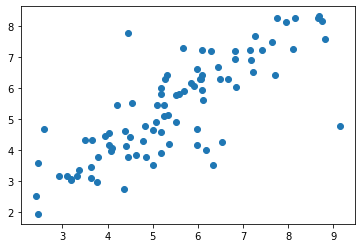

In [338]:
%matplotlib inline

import matplotlib.pyplot as plt
plt.scatter(test_target, test_predict)

In [339]:
LSwFW_model.layers[1].attention_layers[4](train_tensor_scaled)

<tf.Tensor: shape=(354, 1), dtype=float32, numpy=
array([[0.9744031 ],
       [0.9790111 ],
       [0.97858757],
       [0.9786719 ],
       [0.9723006 ],
       [0.9776458 ],
       [0.9764581 ],
       [0.9720961 ],
       [0.88590276],
       [0.864859  ],
       [0.8481729 ],
       [0.8227005 ],
       [0.8393129 ],
       [0.8102953 ],
       [0.81445503],
       [0.7443564 ],
       [0.7465527 ],
       [0.9211513 ],
       [0.91374415],
       [0.8781286 ],
       [0.8507761 ],
       [0.8328528 ],
       [0.8246665 ],
       [0.8800114 ],
       [0.8883621 ],
       [0.8758197 ],
       [0.8087573 ],
       [0.80740994],
       [0.8036174 ],
       [0.79421824],
       [0.79369587],
       [0.79302025],
       [0.74133873],
       [0.7371919 ],
       [0.7656481 ],
       [0.7525875 ],
       [0.74172205],
       [0.7300884 ],
       [0.73483807],
       [0.90777516],
       [0.85193676],
       [0.8425447 ],
       [0.83079493],
       [0.8081655 ],
       [0.8101972 ],
     

In [340]:
attentions=[LSwFW_model.layers[1].attention_layers[i](train_tensor_scaled) for i in range(n_attention)]
attentions=np.hstack(attentions)


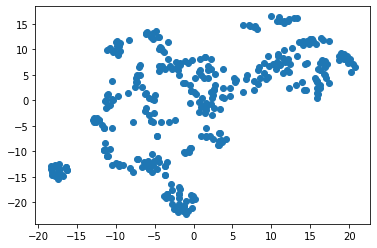

In [341]:
from sklearn.manifold import TSNE

dr=TSNE()
attentions_embed=dr.fit_transform(attentions)

plt.scatter(attentions_embed[:,0], 
         attentions_embed[:,1],
        )

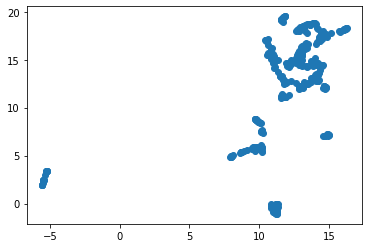

In [342]:
from umap import UMAP

dr=UMAP()
attentions_embed=dr.fit_transform(attentions)

plt.scatter(attentions_embed[:,0],
            attentions_embed[:,1]
           )

Try to color this by clustering from Tanimoto similarity. Is there a way to group them by core compound? Read Ruack's paper in detail

## Parameter-finding: Attention heads

In [7]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.keras.backend.set_floatx('float32')


code_folder=os.path.join(os.getcwd(),
                         "..",
                         "..",
                         "0_code"
                        )
sys.path.append(code_folder)



In [14]:
import time
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from algorithms import attention_model
from sklearn.preprocessing import StandardScaler, MinMaxScaler


def get_attentionwFW_model(n_attention,
                           n_attention_hidden,
                           n_feat,
                           n_out,
                           n_concat_hidden,
                           concat_activation,
                           n_attention_out,
                           kernel_initializer,
                           bias_initializer,
                           attention_hidden_activation,
                           attention_output_activation,
                           n_hidden,
                           hidden_activation,
                           kernel_regularizer,
                           bias_regularizer,
                           random_seed=123
                           ):
    input_shape = (n_feat*2,)
    input_layer = Input(shape=input_shape)
    tf.random.set_seed(random_seed)
    attentions_layer = attention_model.ConcatAttentionswFeatWeights(
        n_attention=n_attention,
        n_attention_hidden=n_attention_hidden,
        n_attention_out=n_attention_out,
        n_feat=n_feat,
        n_hidden=n_concat_hidden,
        activation=concat_activation,
        kernel_initializer=kernel_initializer,
        bias_initializer=bias_initializer,
        kernel_regularizer=l2(1E-5),
        bias_regularizer=l2(1E-5),
        attention_kernel_initializer=kernel_initializer,
        attention_bias_initializer=bias_initializer,
        attention_hidden_activation=attention_hidden_activation,
        attention_output_activation=attention_output_activation,
        batch_norm_kwargs={"trainable": False, "renorm": True},
    )(input_layer)
    # Removed dropout for attentions_layer because of Batch normalization
    dense_layer1 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(attentions_layer)
    dropout1 = Dropout(0.1)(dense_layer1)
    batchnorm1 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout1)
    dense_layer2 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer
                         )(batchnorm1)
    dropout2 = Dropout(0.1)(dense_layer2)
    batchnorm2 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout2)
    dense_layer3 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(batchnorm2)
    output_layer = Dense(n_out, activation="linear")(dense_layer3)

    LS_model = tf.keras.Model(inputs=input_layer,
                              outputs=output_layer
                              )
    return LS_model


def setup_callback_paths(monitor,
                         mode,
                         model_name,
                         dataset_name,
                         split_number=0,
                         super_folder=None,
                         ):
    save_folder = "_".join([time.strftime("%y%m%d", time.localtime()),
                            model_name,
                            dataset_name,
                            "split{:02d}".format(split_number)
                            ])
    if super_folder is not None:
        save_folder = os.path.join(super_folder,
                                   save_folder
                                   )
        try:
            os.mkdir(super_folder)
        except OSError as error:
            print(error)
    checkpoint_path = os.path.join(save_folder,
                                   "model_checkpoint")
    csv_filename = os.path.join(checkpoint_path, "training_log.csv")
    try:
        os.mkdir(save_folder)
    except OSError as error:
        print(error)
    try:
        os.mkdir(checkpoint_path)
    except OSError as error:
        print(error)

    cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                     monitor='val_root_mean_squared_error',
                                                     mode='min',
                                                     save_best_only=True,
                                                     save_weights_only=True,
                                                     verbose=1
                                                     )
    csvlogger_callback = tf.keras.callbacks.CSVLogger(filename=csv_filename,
                                                      append=True
                                                      )
    return [cp_callback, csvlogger_callback], checkpoint_path

In [15]:
from sklearn.model_selection import KFold
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel

#Feature selection
supports=[]
all_features=df.iloc[:, feat_id:]

kf=KFold(n_splits=5, random_state=1234, shuffle=True)
for idx, (train_ind, test_ind) in enumerate(kf.split(all_features)):
    train_features=df.iloc[train_ind,feat_id:].values
    test_features=df.iloc[test_ind,feat_id:].values
    train_target=df['logki'].values[train_ind]
    test_target=df['logki'].values[test_ind]
    
    #Feature selection
    clf=ExtraTreesRegressor(n_estimators=499, random_state=123)
    clf.fit(train_features, train_target)
    model=SelectFromModel(clf, prefit=True)
    supports.append(model.get_support())

selected_feat_ind=np.all(supports,axis=0)
print(f"{np.count_nonzero(selected_feat_ind)} features selected out of {train_features.shape[1]}")

selected_features=all_features.iloc[:,selected_feat_ind]
all_target=df['logki']


146 features selected out of 1646


In [16]:
from tensorflow.keras.initializers import VarianceScaling
from tensorflow.keras.regularizers import l1, l2
from functools import partial 

learning_rate=0.05

model_setup_params = {
    "n_attention": 2,
    "n_attention_hidden": 40,
    'n_feat': None,
    "n_out": 1,
    "n_concat_hidden": 512,
    "concat_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "n_attention_out": 1,
    "kernel_initializer": tf.keras.initializers.Orthogonal(),
    "bias_initializer": tf.keras.initializers.Constant(value=0.1),     # So that we have weights to train on each LeakyReLU neuron
    "attention_hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "attention_output_activation": "sigmoid",
    "n_hidden": 512,
    "hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "kernel_regularizer": l2(1E-5),
    "bias_regularizer": l2(1E-5),
    "random_seed": 123
}

model_compile_params = {
    "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                              clipvalue=0.5,
                                              clipnorm=1.0
                                              ),
    "loss": tf.keras.losses.MAE,
    "metrics": ["mae", "mse",
                tf.keras.metrics.RootMeanSquaredError()
                ]
}

dataset_params = {
    "n_batch": 8,
    "n_buffer": 100,
}

n_batch=dataset_params['n_batch']
n_buffer=dataset_params['n_buffer']

In [17]:
#A single external test set used for Ruack... 

In [18]:
def data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target
                ):
    # Scaling
    feature_scaler.fit(train_features)
    train_features_scaled = feature_scaler.transform(train_features)
    test_features_scaled = feature_scaler.transform(test_features)

    target_scaler.fit(np.expand_dims(train_target, axis=1))
    train_target_scaled = target_scaler.transform(
        np.expand_dims(train_target, axis=1)).flatten()
    test_target_scaled = target_scaler.transform(
        np.expand_dims(test_target, axis=1)).flatten()
    
    return train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler

In [20]:
from algorithms import COSA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import RepeatedKFold
import time
import dill as pickle

LSwFW_model_results = []

rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
for idx, (train_ind, test_ind) in enumerate(rkf.split(all_features)):
    break
for n_attention_out in range(1, 5):
    model_setup_params['n_attention_out']=n_attention_out
    
    train_features = selected_features.iloc[train_ind, :].values
    test_features = selected_features.iloc[test_ind, :].values
    train_target = all_target.values[train_ind]
    test_target = all_target.values[test_ind]
    # Feature weighting

    cosa_mdl = COSA.NNCosa(n_iter=100,
                           distance_measure='inv_exp_dist',
                           calc_D_ijk=False)
    cosa_mdl.fit(train_features)
    cosa_mdl.fit_OOS(test_features)

    train_features = train_features[:, cosa_mdl.valid_feat]
    test_features = test_features[:, cosa_mdl.valid_feat]
    train_Fweights = cosa_mdl.output_Fweight()
    test_Fweights = cosa_mdl.output_Fweight(OOS=True)

    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
    
    n_feat = train_features_scaled.shape[1]
    model_setup_params['n_feat'] = n_feat

    # Setup tf datasets
    train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    train_ds = tf.data.Dataset.from_tensor_slices((train_tensor_scaled,
                                                   train_target_scaled
                                                   ))
    test_ds = tf.data.Dataset.from_tensor_slices((test_tensor_scaled,
                                                  test_target_scaled
                                                  ))
    train_ds = train_ds.shuffle(n_buffer).batch(n_batch)
    test_ds = test_ds.shuffle(n_buffer).batch(n_batch)

    callbacks, checkpoint_path = setup_callback_paths("val_root_mean_square_error",
                                                      mode="min",
                                                      model_name="LSwFW_RobustScaler_n_attention_out",
                                                      dataset_name="AChEi",
                                                      split_number=n_attention_out,
                                                      super_folder="Parameter_finding"
                                                      )

    final_selected_feat_ind = np.where(selected_feat_ind)[
        0][cosa_mdl.valid_feat]
    to_save = {'final_selected_feat_ind': final_selected_feat_ind,
               'train_ind': train_ind,
               'test_ind': test_ind,
               'train_Fweights': train_Fweights,
               'test_Fweights': test_Fweights
               }
    with open(os.path.join(checkpoint_path, "..",
                           "input_info.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    model_compile_params = {
        "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                                  clipvalue=0.5,
                                                  clipnorm=1.0
                                                  ),
        "loss": tf.keras.losses.MAE,
        "metrics": ["mae", "mse",
                    tf.keras.metrics.RootMeanSquaredError()
                    ]
    }
    to_save = {
        "_call": get_attentionwFW_model,
        "model_setup_params": model_setup_params,
        "model_compile_params": model_compile_params,
        "dataset_params": dataset_params
    }
    with open(os.path.join(checkpoint_path, "..",
                           "model_params.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    # Set up model
    LSwFW_model = get_attentionwFW_model(**model_setup_params
                                         )

    LSwFW_model.compile(**model_compile_params)

    # Fit and train model
    LSwFW_model.fit(train_ds,
                    validation_data=test_ds,
                    epochs=1000,
                    callbacks=callbacks,
                    verbose=0
                    )

    # Evaluate model
    LSwFW_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        LSwFW_model(test_tensor_scaled).numpy()
    ).flatten()

    from sklearn.metrics import mean_squared_error, r2_score
    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    LSwFW_model_results.append(["LS_model", idx, "RMSE", rmse])
    LSwFW_model_results.append(["LS_model", idx, "Rsquared", r2])

    LSwFW_model.save(os.path.join(checkpoint_path, "..", "saved_model"))
    
    del LSwFW_model

Starting on outer iteration 1; beta/eta:0.220
Wchange:0.880, Crit:Not calculated
Wchange:0.198, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.076, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.037, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.026, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 20; beta/eta:0.600
Wchange:10.961, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 21; beta/eta:0.620
Wchange:18.462, Crit: Not calculated
Wchange:13.121, Crit: Not calculated
Wchange:34.421, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 4 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:8.670, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:13.152, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 78; beta/eta:1.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 79; beta/eta:1.780
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 80; beta/eta:1.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00047: val_root_mean_squared_error did not improve from 0.33252

Epoch 00048: val_root_mean_squared_error did not improve from 0.33252

Epoch 00049: val_root_mean_squared_error did not improve from 0.33252

Epoch 00050: val_root_mean_squared_error did not improve from 0.33252

Epoch 00051: val_root_mean_squared_error did not improve from 0.33252

Epoch 00052: val_root_mean_squared_error did not improve from 0.33252

Epoch 00053: val_root_mean_squared_error did not improve from 0.33252

Epoch 00054: val_root_mean_squared_error did not improve from 0.33252

Epoch 00055: val_root_mean_squared_error did not improve from 0.33252

Epoch 00056: val_root_mean_squared_error did not improve from 0.33252

Epoch 00057: val_root_mean_squared_error improved from 0.33252 to 0.32722, saving model to Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split01\model_checkpoint

Epoch 00058: val_root_mean_squared_error did not improve from 0.32722

Epoch 00059: val_root_mean_squared_


Epoch 00157: val_root_mean_squared_error did not improve from 0.29191

Epoch 00158: val_root_mean_squared_error did not improve from 0.29191

Epoch 00159: val_root_mean_squared_error did not improve from 0.29191

Epoch 00160: val_root_mean_squared_error did not improve from 0.29191

Epoch 00161: val_root_mean_squared_error did not improve from 0.29191

Epoch 00162: val_root_mean_squared_error did not improve from 0.29191

Epoch 00163: val_root_mean_squared_error did not improve from 0.29191

Epoch 00164: val_root_mean_squared_error did not improve from 0.29191

Epoch 00165: val_root_mean_squared_error did not improve from 0.29191

Epoch 00166: val_root_mean_squared_error did not improve from 0.29191

Epoch 00167: val_root_mean_squared_error did not improve from 0.29191

Epoch 00168: val_root_mean_squared_error did not improve from 0.29191

Epoch 00169: val_root_mean_squared_error did not improve from 0.29191

Epoch 00170: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00273: val_root_mean_squared_error did not improve from 0.29191

Epoch 00274: val_root_mean_squared_error did not improve from 0.29191

Epoch 00275: val_root_mean_squared_error did not improve from 0.29191

Epoch 00276: val_root_mean_squared_error did not improve from 0.29191

Epoch 00277: val_root_mean_squared_error did not improve from 0.29191

Epoch 00278: val_root_mean_squared_error did not improve from 0.29191

Epoch 00279: val_root_mean_squared_error did not improve from 0.29191

Epoch 00280: val_root_mean_squared_error did not improve from 0.29191

Epoch 00281: val_root_mean_squared_error did not improve from 0.29191

Epoch 00282: val_root_mean_squared_error did not improve from 0.29191

Epoch 00283: val_root_mean_squared_error did not improve from 0.29191

Epoch 00284: val_root_mean_squared_error did not improve from 0.29191

Epoch 00285: val_root_mean_squared_error did not improve from 0.29191

Epoch 00286: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00389: val_root_mean_squared_error did not improve from 0.29191

Epoch 00390: val_root_mean_squared_error did not improve from 0.29191

Epoch 00391: val_root_mean_squared_error did not improve from 0.29191

Epoch 00392: val_root_mean_squared_error did not improve from 0.29191

Epoch 00393: val_root_mean_squared_error did not improve from 0.29191

Epoch 00394: val_root_mean_squared_error did not improve from 0.29191

Epoch 00395: val_root_mean_squared_error did not improve from 0.29191

Epoch 00396: val_root_mean_squared_error did not improve from 0.29191

Epoch 00397: val_root_mean_squared_error did not improve from 0.29191

Epoch 00398: val_root_mean_squared_error did not improve from 0.29191

Epoch 00399: val_root_mean_squared_error did not improve from 0.29191

Epoch 00400: val_root_mean_squared_error did not improve from 0.29191

Epoch 00401: val_root_mean_squared_error did not improve from 0.29191

Epoch 00402: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00505: val_root_mean_squared_error did not improve from 0.29191

Epoch 00506: val_root_mean_squared_error did not improve from 0.29191

Epoch 00507: val_root_mean_squared_error did not improve from 0.29191

Epoch 00508: val_root_mean_squared_error did not improve from 0.29191

Epoch 00509: val_root_mean_squared_error did not improve from 0.29191

Epoch 00510: val_root_mean_squared_error did not improve from 0.29191

Epoch 00511: val_root_mean_squared_error did not improve from 0.29191

Epoch 00512: val_root_mean_squared_error did not improve from 0.29191

Epoch 00513: val_root_mean_squared_error did not improve from 0.29191

Epoch 00514: val_root_mean_squared_error did not improve from 0.29191

Epoch 00515: val_root_mean_squared_error did not improve from 0.29191

Epoch 00516: val_root_mean_squared_error did not improve from 0.29191

Epoch 00517: val_root_mean_squared_error did not improve from 0.29191

Epoch 00518: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00621: val_root_mean_squared_error did not improve from 0.29191

Epoch 00622: val_root_mean_squared_error did not improve from 0.29191

Epoch 00623: val_root_mean_squared_error did not improve from 0.29191

Epoch 00624: val_root_mean_squared_error did not improve from 0.29191

Epoch 00625: val_root_mean_squared_error did not improve from 0.29191

Epoch 00626: val_root_mean_squared_error did not improve from 0.29191

Epoch 00627: val_root_mean_squared_error did not improve from 0.29191

Epoch 00628: val_root_mean_squared_error did not improve from 0.29191

Epoch 00629: val_root_mean_squared_error did not improve from 0.29191

Epoch 00630: val_root_mean_squared_error did not improve from 0.29191

Epoch 00631: val_root_mean_squared_error did not improve from 0.29191

Epoch 00632: val_root_mean_squared_error did not improve from 0.29191

Epoch 00633: val_root_mean_squared_error did not improve from 0.29191

Epoch 00634: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00737: val_root_mean_squared_error did not improve from 0.29191

Epoch 00738: val_root_mean_squared_error did not improve from 0.29191

Epoch 00739: val_root_mean_squared_error did not improve from 0.29191

Epoch 00740: val_root_mean_squared_error did not improve from 0.29191

Epoch 00741: val_root_mean_squared_error did not improve from 0.29191

Epoch 00742: val_root_mean_squared_error did not improve from 0.29191

Epoch 00743: val_root_mean_squared_error did not improve from 0.29191

Epoch 00744: val_root_mean_squared_error did not improve from 0.29191

Epoch 00745: val_root_mean_squared_error did not improve from 0.29191

Epoch 00746: val_root_mean_squared_error did not improve from 0.29191

Epoch 00747: val_root_mean_squared_error did not improve from 0.29191

Epoch 00748: val_root_mean_squared_error did not improve from 0.29191

Epoch 00749: val_root_mean_squared_error did not improve from 0.29191

Epoch 00750: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00853: val_root_mean_squared_error did not improve from 0.29191

Epoch 00854: val_root_mean_squared_error did not improve from 0.29191

Epoch 00855: val_root_mean_squared_error did not improve from 0.29191

Epoch 00856: val_root_mean_squared_error did not improve from 0.29191

Epoch 00857: val_root_mean_squared_error did not improve from 0.29191

Epoch 00858: val_root_mean_squared_error did not improve from 0.29191

Epoch 00859: val_root_mean_squared_error did not improve from 0.29191

Epoch 00860: val_root_mean_squared_error did not improve from 0.29191

Epoch 00861: val_root_mean_squared_error did not improve from 0.29191

Epoch 00862: val_root_mean_squared_error did not improve from 0.29191

Epoch 00863: val_root_mean_squared_error did not improve from 0.29191

Epoch 00864: val_root_mean_squared_error did not improve from 0.29191

Epoch 00865: val_root_mean_squared_error did not improve from 0.29191

Epoch 00866: val_root_mean_squared_error did not improve from 0.29191

Epoch


Epoch 00969: val_root_mean_squared_error did not improve from 0.29191

Epoch 00970: val_root_mean_squared_error did not improve from 0.29191

Epoch 00971: val_root_mean_squared_error did not improve from 0.29191

Epoch 00972: val_root_mean_squared_error did not improve from 0.29191

Epoch 00973: val_root_mean_squared_error did not improve from 0.29191

Epoch 00974: val_root_mean_squared_error did not improve from 0.29191

Epoch 00975: val_root_mean_squared_error did not improve from 0.29191

Epoch 00976: val_root_mean_squared_error did not improve from 0.29191

Epoch 00977: val_root_mean_squared_error did not improve from 0.29191

Epoch 00978: val_root_mean_squared_error did not improve from 0.29191

Epoch 00979: val_root_mean_squared_error did not improve from 0.29191

Epoch 00980: val_root_mean_squared_error did not improve from 0.29191

Epoch 00981: val_root_mean_squared_error did not improve from 0.29191

Epoch 00982: val_root_mean_squared_error did not improve from 0.29191

Epoch

INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split01\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split01\model_checkpoint\..\saved_model\assets


Starting on outer iteration 1; beta/eta:0.220
Wchange:0.880, Crit:Not calculated
Wchange:0.198, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.076, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.037, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.026, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 64; beta/eta:1.480
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 65; beta/eta:1.500
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:14.465, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 20; beta/eta:0.600
Wchange:10.961, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 21; beta/eta:0.620
Wchange:18.462, Crit: Not calculated
Wchange:13.121, Crit: Not calculated
Wchange:34.421, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 4 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:8.670, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:13.152, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at

Wchange:16.643, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 78; beta/eta:1.760
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 79; beta/eta:1.780
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 80; beta/eta:1.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calcula


Epoch 00051: val_root_mean_squared_error did not improve from 0.33901

Epoch 00052: val_root_mean_squared_error did not improve from 0.33901

Epoch 00053: val_root_mean_squared_error did not improve from 0.33901

Epoch 00054: val_root_mean_squared_error did not improve from 0.33901

Epoch 00055: val_root_mean_squared_error did not improve from 0.33901

Epoch 00056: val_root_mean_squared_error did not improve from 0.33901

Epoch 00057: val_root_mean_squared_error did not improve from 0.33901

Epoch 00058: val_root_mean_squared_error improved from 0.33901 to 0.32885, saving model to Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split02\model_checkpoint

Epoch 00059: val_root_mean_squared_error did not improve from 0.32885

Epoch 00060: val_root_mean_squared_error did not improve from 0.32885

Epoch 00061: val_root_mean_squared_error did not improve from 0.32885

Epoch 00062: val_root_mean_squared_error did not improve from 0.32885

Epoch 00063: val_root_mean_squared_


Epoch 00157: val_root_mean_squared_error did not improve from 0.29057

Epoch 00158: val_root_mean_squared_error did not improve from 0.29057

Epoch 00159: val_root_mean_squared_error did not improve from 0.29057

Epoch 00160: val_root_mean_squared_error did not improve from 0.29057

Epoch 00161: val_root_mean_squared_error did not improve from 0.29057

Epoch 00162: val_root_mean_squared_error did not improve from 0.29057

Epoch 00163: val_root_mean_squared_error did not improve from 0.29057

Epoch 00164: val_root_mean_squared_error did not improve from 0.29057

Epoch 00165: val_root_mean_squared_error did not improve from 0.29057

Epoch 00166: val_root_mean_squared_error did not improve from 0.29057

Epoch 00167: val_root_mean_squared_error did not improve from 0.29057

Epoch 00168: val_root_mean_squared_error did not improve from 0.29057

Epoch 00169: val_root_mean_squared_error did not improve from 0.29057

Epoch 00170: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00273: val_root_mean_squared_error did not improve from 0.29057

Epoch 00274: val_root_mean_squared_error did not improve from 0.29057

Epoch 00275: val_root_mean_squared_error did not improve from 0.29057

Epoch 00276: val_root_mean_squared_error did not improve from 0.29057

Epoch 00277: val_root_mean_squared_error did not improve from 0.29057

Epoch 00278: val_root_mean_squared_error did not improve from 0.29057

Epoch 00279: val_root_mean_squared_error did not improve from 0.29057

Epoch 00280: val_root_mean_squared_error did not improve from 0.29057

Epoch 00281: val_root_mean_squared_error did not improve from 0.29057

Epoch 00282: val_root_mean_squared_error did not improve from 0.29057

Epoch 00283: val_root_mean_squared_error did not improve from 0.29057

Epoch 00284: val_root_mean_squared_error did not improve from 0.29057

Epoch 00285: val_root_mean_squared_error did not improve from 0.29057

Epoch 00286: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00389: val_root_mean_squared_error did not improve from 0.29057

Epoch 00390: val_root_mean_squared_error did not improve from 0.29057

Epoch 00391: val_root_mean_squared_error did not improve from 0.29057

Epoch 00392: val_root_mean_squared_error did not improve from 0.29057

Epoch 00393: val_root_mean_squared_error did not improve from 0.29057

Epoch 00394: val_root_mean_squared_error did not improve from 0.29057

Epoch 00395: val_root_mean_squared_error did not improve from 0.29057

Epoch 00396: val_root_mean_squared_error did not improve from 0.29057

Epoch 00397: val_root_mean_squared_error did not improve from 0.29057

Epoch 00398: val_root_mean_squared_error did not improve from 0.29057

Epoch 00399: val_root_mean_squared_error did not improve from 0.29057

Epoch 00400: val_root_mean_squared_error did not improve from 0.29057

Epoch 00401: val_root_mean_squared_error did not improve from 0.29057

Epoch 00402: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00505: val_root_mean_squared_error did not improve from 0.29057

Epoch 00506: val_root_mean_squared_error did not improve from 0.29057

Epoch 00507: val_root_mean_squared_error did not improve from 0.29057

Epoch 00508: val_root_mean_squared_error did not improve from 0.29057

Epoch 00509: val_root_mean_squared_error did not improve from 0.29057

Epoch 00510: val_root_mean_squared_error did not improve from 0.29057

Epoch 00511: val_root_mean_squared_error did not improve from 0.29057

Epoch 00512: val_root_mean_squared_error did not improve from 0.29057

Epoch 00513: val_root_mean_squared_error did not improve from 0.29057

Epoch 00514: val_root_mean_squared_error did not improve from 0.29057

Epoch 00515: val_root_mean_squared_error did not improve from 0.29057

Epoch 00516: val_root_mean_squared_error did not improve from 0.29057

Epoch 00517: val_root_mean_squared_error did not improve from 0.29057

Epoch 00518: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00621: val_root_mean_squared_error did not improve from 0.29057

Epoch 00622: val_root_mean_squared_error did not improve from 0.29057

Epoch 00623: val_root_mean_squared_error did not improve from 0.29057

Epoch 00624: val_root_mean_squared_error did not improve from 0.29057

Epoch 00625: val_root_mean_squared_error did not improve from 0.29057

Epoch 00626: val_root_mean_squared_error did not improve from 0.29057

Epoch 00627: val_root_mean_squared_error did not improve from 0.29057

Epoch 00628: val_root_mean_squared_error did not improve from 0.29057

Epoch 00629: val_root_mean_squared_error did not improve from 0.29057

Epoch 00630: val_root_mean_squared_error did not improve from 0.29057

Epoch 00631: val_root_mean_squared_error did not improve from 0.29057

Epoch 00632: val_root_mean_squared_error did not improve from 0.29057

Epoch 00633: val_root_mean_squared_error did not improve from 0.29057

Epoch 00634: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00737: val_root_mean_squared_error did not improve from 0.29057

Epoch 00738: val_root_mean_squared_error did not improve from 0.29057

Epoch 00739: val_root_mean_squared_error did not improve from 0.29057

Epoch 00740: val_root_mean_squared_error did not improve from 0.29057

Epoch 00741: val_root_mean_squared_error did not improve from 0.29057

Epoch 00742: val_root_mean_squared_error did not improve from 0.29057

Epoch 00743: val_root_mean_squared_error did not improve from 0.29057

Epoch 00744: val_root_mean_squared_error did not improve from 0.29057

Epoch 00745: val_root_mean_squared_error did not improve from 0.29057

Epoch 00746: val_root_mean_squared_error did not improve from 0.29057

Epoch 00747: val_root_mean_squared_error did not improve from 0.29057

Epoch 00748: val_root_mean_squared_error did not improve from 0.29057

Epoch 00749: val_root_mean_squared_error did not improve from 0.29057

Epoch 00750: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00853: val_root_mean_squared_error did not improve from 0.29057

Epoch 00854: val_root_mean_squared_error did not improve from 0.29057

Epoch 00855: val_root_mean_squared_error did not improve from 0.29057

Epoch 00856: val_root_mean_squared_error did not improve from 0.29057

Epoch 00857: val_root_mean_squared_error did not improve from 0.29057

Epoch 00858: val_root_mean_squared_error did not improve from 0.29057

Epoch 00859: val_root_mean_squared_error did not improve from 0.29057

Epoch 00860: val_root_mean_squared_error did not improve from 0.29057

Epoch 00861: val_root_mean_squared_error did not improve from 0.29057

Epoch 00862: val_root_mean_squared_error did not improve from 0.29057

Epoch 00863: val_root_mean_squared_error did not improve from 0.29057

Epoch 00864: val_root_mean_squared_error did not improve from 0.29057

Epoch 00865: val_root_mean_squared_error did not improve from 0.29057

Epoch 00866: val_root_mean_squared_error did not improve from 0.29057

Epoch


Epoch 00969: val_root_mean_squared_error did not improve from 0.29057

Epoch 00970: val_root_mean_squared_error did not improve from 0.29057

Epoch 00971: val_root_mean_squared_error did not improve from 0.29057

Epoch 00972: val_root_mean_squared_error did not improve from 0.29057

Epoch 00973: val_root_mean_squared_error did not improve from 0.29057

Epoch 00974: val_root_mean_squared_error did not improve from 0.29057

Epoch 00975: val_root_mean_squared_error did not improve from 0.29057

Epoch 00976: val_root_mean_squared_error did not improve from 0.29057

Epoch 00977: val_root_mean_squared_error did not improve from 0.29057

Epoch 00978: val_root_mean_squared_error did not improve from 0.29057

Epoch 00979: val_root_mean_squared_error did not improve from 0.29057

Epoch 00980: val_root_mean_squared_error did not improve from 0.29057

Epoch 00981: val_root_mean_squared_error did not improve from 0.29057

Epoch 00982: val_root_mean_squared_error did not improve from 0.29057

Epoch

INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split02\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split02\model_checkpoint\..\saved_model\assets


Starting on outer iteration 1; beta/eta:0.220
Wchange:0.880, Crit:Not calculated
Wchange:0.198, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.076, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.037, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.026, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:34.421, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 4 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:8.670, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:13.152, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:30.034, Crit: Not calculated
Wchange:42.311, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 3 steps
Starting on outer iteration 27; beta/eta:0.740
Wchange:0.000, Cri

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 86; beta/eta:1.920
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 87; beta/eta:1.940
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00055: val_root_mean_squared_error did not improve from 0.34001

Epoch 00056: val_root_mean_squared_error did not improve from 0.34001

Epoch 00057: val_root_mean_squared_error did not improve from 0.34001

Epoch 00058: val_root_mean_squared_error improved from 0.34001 to 0.33996, saving model to Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split03\model_checkpoint

Epoch 00059: val_root_mean_squared_error did not improve from 0.33996

Epoch 00060: val_root_mean_squared_error did not improve from 0.33996

Epoch 00061: val_root_mean_squared_error did not improve from 0.33996

Epoch 00062: val_root_mean_squared_error did not improve from 0.33996

Epoch 00063: val_root_mean_squared_error did not improve from 0.33996

Epoch 00064: val_root_mean_squared_error did not improve from 0.33996

Epoch 00065: val_root_mean_squared_error improved from 0.33996 to 0.33103, saving model to Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split03\model_checkp


Epoch 00160: val_root_mean_squared_error did not improve from 0.30219

Epoch 00161: val_root_mean_squared_error did not improve from 0.30219

Epoch 00162: val_root_mean_squared_error did not improve from 0.30219

Epoch 00163: val_root_mean_squared_error did not improve from 0.30219

Epoch 00164: val_root_mean_squared_error did not improve from 0.30219

Epoch 00165: val_root_mean_squared_error did not improve from 0.30219

Epoch 00166: val_root_mean_squared_error did not improve from 0.30219

Epoch 00167: val_root_mean_squared_error did not improve from 0.30219

Epoch 00168: val_root_mean_squared_error did not improve from 0.30219

Epoch 00169: val_root_mean_squared_error did not improve from 0.30219

Epoch 00170: val_root_mean_squared_error did not improve from 0.30219

Epoch 00171: val_root_mean_squared_error did not improve from 0.30219

Epoch 00172: val_root_mean_squared_error did not improve from 0.30219

Epoch 00173: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00276: val_root_mean_squared_error did not improve from 0.30219

Epoch 00277: val_root_mean_squared_error did not improve from 0.30219

Epoch 00278: val_root_mean_squared_error did not improve from 0.30219

Epoch 00279: val_root_mean_squared_error did not improve from 0.30219

Epoch 00280: val_root_mean_squared_error did not improve from 0.30219

Epoch 00281: val_root_mean_squared_error did not improve from 0.30219

Epoch 00282: val_root_mean_squared_error did not improve from 0.30219

Epoch 00283: val_root_mean_squared_error did not improve from 0.30219

Epoch 00284: val_root_mean_squared_error did not improve from 0.30219

Epoch 00285: val_root_mean_squared_error did not improve from 0.30219

Epoch 00286: val_root_mean_squared_error did not improve from 0.30219

Epoch 00287: val_root_mean_squared_error did not improve from 0.30219

Epoch 00288: val_root_mean_squared_error did not improve from 0.30219

Epoch 00289: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00392: val_root_mean_squared_error did not improve from 0.30219

Epoch 00393: val_root_mean_squared_error did not improve from 0.30219

Epoch 00394: val_root_mean_squared_error did not improve from 0.30219

Epoch 00395: val_root_mean_squared_error did not improve from 0.30219

Epoch 00396: val_root_mean_squared_error did not improve from 0.30219

Epoch 00397: val_root_mean_squared_error did not improve from 0.30219

Epoch 00398: val_root_mean_squared_error did not improve from 0.30219

Epoch 00399: val_root_mean_squared_error did not improve from 0.30219

Epoch 00400: val_root_mean_squared_error did not improve from 0.30219

Epoch 00401: val_root_mean_squared_error did not improve from 0.30219

Epoch 00402: val_root_mean_squared_error did not improve from 0.30219

Epoch 00403: val_root_mean_squared_error did not improve from 0.30219

Epoch 00404: val_root_mean_squared_error did not improve from 0.30219

Epoch 00405: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00508: val_root_mean_squared_error did not improve from 0.30219

Epoch 00509: val_root_mean_squared_error did not improve from 0.30219

Epoch 00510: val_root_mean_squared_error did not improve from 0.30219

Epoch 00511: val_root_mean_squared_error did not improve from 0.30219

Epoch 00512: val_root_mean_squared_error did not improve from 0.30219

Epoch 00513: val_root_mean_squared_error did not improve from 0.30219

Epoch 00514: val_root_mean_squared_error did not improve from 0.30219

Epoch 00515: val_root_mean_squared_error did not improve from 0.30219

Epoch 00516: val_root_mean_squared_error did not improve from 0.30219

Epoch 00517: val_root_mean_squared_error did not improve from 0.30219

Epoch 00518: val_root_mean_squared_error did not improve from 0.30219

Epoch 00519: val_root_mean_squared_error did not improve from 0.30219

Epoch 00520: val_root_mean_squared_error did not improve from 0.30219

Epoch 00521: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00624: val_root_mean_squared_error did not improve from 0.30219

Epoch 00625: val_root_mean_squared_error did not improve from 0.30219

Epoch 00626: val_root_mean_squared_error did not improve from 0.30219

Epoch 00627: val_root_mean_squared_error did not improve from 0.30219

Epoch 00628: val_root_mean_squared_error did not improve from 0.30219

Epoch 00629: val_root_mean_squared_error did not improve from 0.30219

Epoch 00630: val_root_mean_squared_error did not improve from 0.30219

Epoch 00631: val_root_mean_squared_error did not improve from 0.30219

Epoch 00632: val_root_mean_squared_error did not improve from 0.30219

Epoch 00633: val_root_mean_squared_error did not improve from 0.30219

Epoch 00634: val_root_mean_squared_error did not improve from 0.30219

Epoch 00635: val_root_mean_squared_error did not improve from 0.30219

Epoch 00636: val_root_mean_squared_error did not improve from 0.30219

Epoch 00637: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00740: val_root_mean_squared_error did not improve from 0.30219

Epoch 00741: val_root_mean_squared_error did not improve from 0.30219

Epoch 00742: val_root_mean_squared_error did not improve from 0.30219

Epoch 00743: val_root_mean_squared_error did not improve from 0.30219

Epoch 00744: val_root_mean_squared_error did not improve from 0.30219

Epoch 00745: val_root_mean_squared_error did not improve from 0.30219

Epoch 00746: val_root_mean_squared_error did not improve from 0.30219

Epoch 00747: val_root_mean_squared_error did not improve from 0.30219

Epoch 00748: val_root_mean_squared_error did not improve from 0.30219

Epoch 00749: val_root_mean_squared_error did not improve from 0.30219

Epoch 00750: val_root_mean_squared_error did not improve from 0.30219

Epoch 00751: val_root_mean_squared_error did not improve from 0.30219

Epoch 00752: val_root_mean_squared_error did not improve from 0.30219

Epoch 00753: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00856: val_root_mean_squared_error did not improve from 0.30219

Epoch 00857: val_root_mean_squared_error did not improve from 0.30219

Epoch 00858: val_root_mean_squared_error did not improve from 0.30219

Epoch 00859: val_root_mean_squared_error did not improve from 0.30219

Epoch 00860: val_root_mean_squared_error did not improve from 0.30219

Epoch 00861: val_root_mean_squared_error did not improve from 0.30219

Epoch 00862: val_root_mean_squared_error did not improve from 0.30219

Epoch 00863: val_root_mean_squared_error did not improve from 0.30219

Epoch 00864: val_root_mean_squared_error did not improve from 0.30219

Epoch 00865: val_root_mean_squared_error did not improve from 0.30219

Epoch 00866: val_root_mean_squared_error did not improve from 0.30219

Epoch 00867: val_root_mean_squared_error did not improve from 0.30219

Epoch 00868: val_root_mean_squared_error did not improve from 0.30219

Epoch 00869: val_root_mean_squared_error did not improve from 0.30219

Epoch


Epoch 00972: val_root_mean_squared_error did not improve from 0.30219

Epoch 00973: val_root_mean_squared_error did not improve from 0.30219

Epoch 00974: val_root_mean_squared_error did not improve from 0.30219

Epoch 00975: val_root_mean_squared_error did not improve from 0.30219

Epoch 00976: val_root_mean_squared_error did not improve from 0.30219

Epoch 00977: val_root_mean_squared_error did not improve from 0.30219

Epoch 00978: val_root_mean_squared_error did not improve from 0.30219

Epoch 00979: val_root_mean_squared_error did not improve from 0.30219

Epoch 00980: val_root_mean_squared_error did not improve from 0.30219

Epoch 00981: val_root_mean_squared_error did not improve from 0.30219

Epoch 00982: val_root_mean_squared_error did not improve from 0.30219

Epoch 00983: val_root_mean_squared_error did not improve from 0.30219

Epoch 00984: val_root_mean_squared_error did not improve from 0.30219

Epoch 00985: val_root_mean_squared_error did not improve from 0.30219

Epoch

INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split03\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split03\model_checkpoint\..\saved_model\assets


Starting on outer iteration 1; beta/eta:0.220
Wchange:0.880, Crit:Not calculated
Wchange:0.198, Crit:Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 2; beta/eta:0.240
Wchange:0.076, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 3; beta/eta:0.260
Wchange:0.037, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 4; beta/eta:0.280
Wchange:0.026, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 5; beta/eta:0.300
Wchange:0.015, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 6; beta/eta:0.320
Wchange:0.010, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 7; beta/eta:0.340
Wchange:0.006, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 8; beta/eta:0.360
Wc

Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 66; beta/eta:1.520
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 67; beta/eta:1.540
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 68; beta/eta:1.560
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 69; beta/eta:1.580
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 70; beta/eta:1.600
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 71; beta/eta:1.620
Wchange:0.000, Crit:Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 72; beta/eta:1.640
Wchange:0.001, Crit:Not calculated
Inner loop converged in (or maxed out) at

Wchange:18.462, Crit: Not calculated
Wchange:13.121, Crit: Not calculated
Wchange:34.421, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 4 steps
Starting on outer iteration 22; beta/eta:0.640
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 23; beta/eta:0.660
Wchange:8.670, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 24; beta/eta:0.680
Wchange:13.152, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 2 steps
Starting on outer iteration 25; beta/eta:0.700
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 26; beta/eta:0.720
Wchange:30.034, Crit: Not calculated
Wchange:42.311, Crit: Not calculated
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at

Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 79; beta/eta:1.780
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 80; beta/eta:1.800
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 81; beta/eta:1.820
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 82; beta/eta:1.840
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 83; beta/eta:1.860
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 84; beta/eta:1.880
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed out) at 1 steps
Starting on outer iteration 85; beta/eta:1.900
Wchange:0.000, Crit: Not calculated
Inner loop converged in (or maxed


Epoch 00052: val_root_mean_squared_error did not improve from 0.33917

Epoch 00053: val_root_mean_squared_error did not improve from 0.33917

Epoch 00054: val_root_mean_squared_error did not improve from 0.33917

Epoch 00055: val_root_mean_squared_error did not improve from 0.33917

Epoch 00056: val_root_mean_squared_error did not improve from 0.33917

Epoch 00057: val_root_mean_squared_error did not improve from 0.33917

Epoch 00058: val_root_mean_squared_error did not improve from 0.33917

Epoch 00059: val_root_mean_squared_error did not improve from 0.33917

Epoch 00060: val_root_mean_squared_error did not improve from 0.33917

Epoch 00061: val_root_mean_squared_error did not improve from 0.33917

Epoch 00062: val_root_mean_squared_error did not improve from 0.33917

Epoch 00063: val_root_mean_squared_error did not improve from 0.33917

Epoch 00064: val_root_mean_squared_error did not improve from 0.33917

Epoch 00065: val_root_mean_squared_error improved from 0.33917 to 0.33695, s


Epoch 00157: val_root_mean_squared_error did not improve from 0.30397

Epoch 00158: val_root_mean_squared_error did not improve from 0.30397

Epoch 00159: val_root_mean_squared_error did not improve from 0.30397

Epoch 00160: val_root_mean_squared_error did not improve from 0.30397

Epoch 00161: val_root_mean_squared_error did not improve from 0.30397

Epoch 00162: val_root_mean_squared_error did not improve from 0.30397

Epoch 00163: val_root_mean_squared_error did not improve from 0.30397

Epoch 00164: val_root_mean_squared_error did not improve from 0.30397

Epoch 00165: val_root_mean_squared_error did not improve from 0.30397

Epoch 00166: val_root_mean_squared_error did not improve from 0.30397

Epoch 00167: val_root_mean_squared_error did not improve from 0.30397

Epoch 00168: val_root_mean_squared_error did not improve from 0.30397

Epoch 00169: val_root_mean_squared_error did not improve from 0.30397

Epoch 00170: val_root_mean_squared_error did not improve from 0.30397

Epoch


Epoch 00271: val_root_mean_squared_error did not improve from 0.30366

Epoch 00272: val_root_mean_squared_error did not improve from 0.30366

Epoch 00273: val_root_mean_squared_error did not improve from 0.30366

Epoch 00274: val_root_mean_squared_error did not improve from 0.30366

Epoch 00275: val_root_mean_squared_error did not improve from 0.30366

Epoch 00276: val_root_mean_squared_error did not improve from 0.30366

Epoch 00277: val_root_mean_squared_error did not improve from 0.30366

Epoch 00278: val_root_mean_squared_error did not improve from 0.30366

Epoch 00279: val_root_mean_squared_error did not improve from 0.30366

Epoch 00280: val_root_mean_squared_error did not improve from 0.30366

Epoch 00281: val_root_mean_squared_error did not improve from 0.30366

Epoch 00282: val_root_mean_squared_error did not improve from 0.30366

Epoch 00283: val_root_mean_squared_error did not improve from 0.30366

Epoch 00284: val_root_mean_squared_error did not improve from 0.30366

Epoch


Epoch 00385: val_root_mean_squared_error did not improve from 0.30245

Epoch 00386: val_root_mean_squared_error did not improve from 0.30245

Epoch 00387: val_root_mean_squared_error did not improve from 0.30245

Epoch 00388: val_root_mean_squared_error did not improve from 0.30245

Epoch 00389: val_root_mean_squared_error did not improve from 0.30245

Epoch 00390: val_root_mean_squared_error did not improve from 0.30245

Epoch 00391: val_root_mean_squared_error did not improve from 0.30245

Epoch 00392: val_root_mean_squared_error did not improve from 0.30245

Epoch 00393: val_root_mean_squared_error did not improve from 0.30245

Epoch 00394: val_root_mean_squared_error did not improve from 0.30245

Epoch 00395: val_root_mean_squared_error did not improve from 0.30245

Epoch 00396: val_root_mean_squared_error did not improve from 0.30245

Epoch 00397: val_root_mean_squared_error did not improve from 0.30245

Epoch 00398: val_root_mean_squared_error did not improve from 0.30245

Epoch


Epoch 00501: val_root_mean_squared_error did not improve from 0.30245

Epoch 00502: val_root_mean_squared_error did not improve from 0.30245

Epoch 00503: val_root_mean_squared_error did not improve from 0.30245

Epoch 00504: val_root_mean_squared_error did not improve from 0.30245

Epoch 00505: val_root_mean_squared_error did not improve from 0.30245

Epoch 00506: val_root_mean_squared_error did not improve from 0.30245

Epoch 00507: val_root_mean_squared_error did not improve from 0.30245

Epoch 00508: val_root_mean_squared_error did not improve from 0.30245

Epoch 00509: val_root_mean_squared_error did not improve from 0.30245

Epoch 00510: val_root_mean_squared_error did not improve from 0.30245

Epoch 00511: val_root_mean_squared_error did not improve from 0.30245

Epoch 00512: val_root_mean_squared_error did not improve from 0.30245

Epoch 00513: val_root_mean_squared_error did not improve from 0.30245

Epoch 00514: val_root_mean_squared_error did not improve from 0.30245

Epoch


Epoch 00614: val_root_mean_squared_error did not improve from 0.29661

Epoch 00615: val_root_mean_squared_error did not improve from 0.29661

Epoch 00616: val_root_mean_squared_error did not improve from 0.29661

Epoch 00617: val_root_mean_squared_error did not improve from 0.29661

Epoch 00618: val_root_mean_squared_error did not improve from 0.29661

Epoch 00619: val_root_mean_squared_error did not improve from 0.29661

Epoch 00620: val_root_mean_squared_error did not improve from 0.29661

Epoch 00621: val_root_mean_squared_error did not improve from 0.29661

Epoch 00622: val_root_mean_squared_error did not improve from 0.29661

Epoch 00623: val_root_mean_squared_error did not improve from 0.29661

Epoch 00624: val_root_mean_squared_error did not improve from 0.29661

Epoch 00625: val_root_mean_squared_error did not improve from 0.29661

Epoch 00626: val_root_mean_squared_error did not improve from 0.29661

Epoch 00627: val_root_mean_squared_error did not improve from 0.29661

Epoch


Epoch 00730: val_root_mean_squared_error did not improve from 0.29661

Epoch 00731: val_root_mean_squared_error did not improve from 0.29661

Epoch 00732: val_root_mean_squared_error did not improve from 0.29661

Epoch 00733: val_root_mean_squared_error did not improve from 0.29661

Epoch 00734: val_root_mean_squared_error did not improve from 0.29661

Epoch 00735: val_root_mean_squared_error did not improve from 0.29661

Epoch 00736: val_root_mean_squared_error did not improve from 0.29661

Epoch 00737: val_root_mean_squared_error did not improve from 0.29661

Epoch 00738: val_root_mean_squared_error did not improve from 0.29661

Epoch 00739: val_root_mean_squared_error did not improve from 0.29661

Epoch 00740: val_root_mean_squared_error did not improve from 0.29661

Epoch 00741: val_root_mean_squared_error did not improve from 0.29661

Epoch 00742: val_root_mean_squared_error did not improve from 0.29661

Epoch 00743: val_root_mean_squared_error did not improve from 0.29661

Epoch


Epoch 00846: val_root_mean_squared_error did not improve from 0.29661

Epoch 00847: val_root_mean_squared_error did not improve from 0.29661

Epoch 00848: val_root_mean_squared_error did not improve from 0.29661

Epoch 00849: val_root_mean_squared_error did not improve from 0.29661

Epoch 00850: val_root_mean_squared_error did not improve from 0.29661

Epoch 00851: val_root_mean_squared_error did not improve from 0.29661

Epoch 00852: val_root_mean_squared_error did not improve from 0.29661

Epoch 00853: val_root_mean_squared_error did not improve from 0.29661

Epoch 00854: val_root_mean_squared_error did not improve from 0.29661

Epoch 00855: val_root_mean_squared_error did not improve from 0.29661

Epoch 00856: val_root_mean_squared_error did not improve from 0.29661

Epoch 00857: val_root_mean_squared_error did not improve from 0.29661

Epoch 00858: val_root_mean_squared_error did not improve from 0.29661

Epoch 00859: val_root_mean_squared_error did not improve from 0.29661

Epoch


Epoch 00962: val_root_mean_squared_error did not improve from 0.29661

Epoch 00963: val_root_mean_squared_error did not improve from 0.29661

Epoch 00964: val_root_mean_squared_error did not improve from 0.29661

Epoch 00965: val_root_mean_squared_error did not improve from 0.29661

Epoch 00966: val_root_mean_squared_error did not improve from 0.29661

Epoch 00967: val_root_mean_squared_error did not improve from 0.29661

Epoch 00968: val_root_mean_squared_error did not improve from 0.29661

Epoch 00969: val_root_mean_squared_error did not improve from 0.29661

Epoch 00970: val_root_mean_squared_error did not improve from 0.29661

Epoch 00971: val_root_mean_squared_error did not improve from 0.29661

Epoch 00972: val_root_mean_squared_error did not improve from 0.29661

Epoch 00973: val_root_mean_squared_error did not improve from 0.29661

Epoch 00974: val_root_mean_squared_error did not improve from 0.29661

Epoch 00975: val_root_mean_squared_error did not improve from 0.29661

Epoch

INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split04\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: Parameter_finding\210328_LSwFW_RobustScaler_n_attention_out_AChEi_split04\model_checkpoint\..\saved_model\assets


### Load runs

In [21]:
# RobustScaler target scaler (instead of MinMax)

for root, dirs, files in os.walk("Parameter_finding"):
    break
# Get latest files
dirs = list(filter(lambda x: "LSwFW_RobustScaler_n_attention_out" in x, dirs))

from sklearn.preprocessing import StandardScaler, MinMaxScaler
#Convenience function for loading indices, Fweights and scaling
def load_splits(model_folder, 
                all_features=all_features,
                all_target=all_target, 
               ):
    with open(os.path.join(model_folder, "input_info.ob"), 'rb') as f:
        to_load = pickle.load(f)
    final_selected_feat_ind = to_load['final_selected_feat_ind']
    train_ind, test_ind = to_load['train_ind'], to_load['test_ind']
    train_features = all_features.iloc[train_ind, final_selected_feat_ind].values
    test_features = all_features.iloc[test_ind, final_selected_feat_ind].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

    train_Fweights = to_load['train_Fweights']
    test_Fweights = to_load['test_Fweights']

    # Scaling
    feature_scaler = StandardScaler()
    feature_scaler.fit(train_features)
    train_features_scaled = feature_scaler.transform(train_features)
    test_features_scaled = feature_scaler.transform(test_features)

    target_scaler = MinMaxScaler(feature_range=(0.1, 0.9),
                                 )
    target_scaler.fit(np.expand_dims(train_target, axis=1))
    train_target_scaled = target_scaler.transform(
        np.expand_dims(train_target, axis=1)).flatten()
    test_target_scaled = target_scaler.transform(
        np.expand_dims(test_target, axis=1)).flatten()

    train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    
    return test_target, test_tensor_scaled


tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

from sklearn.metrics import mean_squared_error, r2_score
import pickle
load_model_results = []
for i, dir_ in enumerate(dirs):
    model_folder = os.path.join("Parameter_finding",
                                dir_
                                )
    checkpoint_path = os.path.join(model_folder,
                                   "model_checkpoint"
                                   )
    load_model = tf.keras.models.load_model(
        os.path.join(model_folder,
                     "saved_model"
                     )
    )

    test_target, test_tensor_scaled = load_splits(model_folder)
    
    # Evaluate model
    load_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        load_model(test_tensor_scaled).numpy()
    ).flatten()

    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Model with {i+1} n_attention_out: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    load_model_results.append(["LS_model", i, "RMSE", rmse])
    load_model_results.append(["LS_model", i, "Rsquared", r2])

Model with 1 n_attention_out: RMSE = 0.669; R^2 = 0.848.
Model with 2 n_attention_out: RMSE = 0.666; R^2 = 0.850.
Model with 3 n_attention_out: RMSE = 0.693; R^2 = 0.838.
Model with 4 n_attention_out: RMSE = 0.680; R^2 = 0.844.


Model with 0 n_attention: RMSE = 0.781; R^2 = 0.794.
Model with 1 n_attention: RMSE = 0.682; R^2 = 0.843.
Model with 2 n_attention: RMSE = 0.698; R^2 = 0.835.
Model with 3 n_attention: RMSE = 0.698; R^2 = 0.835.


Pick n_attention=2

<AxesSubplot:xlabel='n_attention', ylabel='score'>

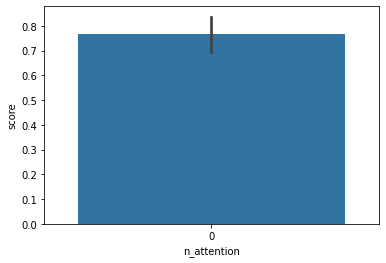

In [128]:
#RepeatedKFold 
#Robust Scaler
#n_hidden=512; n_epoch=1000

n_attention_finding=pd.DataFrame(load_model_results, 
                        columns=["Model", "n_attention", "metric", "score"])

import seaborn as sns
sns.barplot(data=n_attention_finding, 
            x='n_attention',
            y='score',
           )


R^2=0.839 for LSwFW_model with 10 attention heads and 
0.896 for dense_model 

## Compute cross-validated runs

In [ ]:
from algorithms import COSA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import RepeatedKFold
import time
import dill as pickle

LSwFW_model_results = []

rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
for idx, (train_ind, test_ind) in enumerate(rkf.split(all_features)):
    train_features = selected_features.iloc[train_ind, :].values
    test_features = selected_features.iloc[test_ind, :].values
    train_target = all_target.values[train_ind]
    test_target = all_target.values[test_ind]
    # Feature weighting

    cosa_mdl = COSA.NNCosa(n_iter=100,
                           distance_measure='inv_exp_dist',
                           calc_D_ijk=False)
    cosa_mdl.fit(train_features)
    cosa_mdl.fit_OOS(test_features)

    train_features = train_features[:, cosa_mdl.valid_feat]
    test_features = test_features[:, cosa_mdl.valid_feat]
    train_Fweights = cosa_mdl.output_Fweight()
    test_Fweights = cosa_mdl.output_Fweight(OOS=True)

    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
    
    n_feat = train_features_scaled.shape[1]
    model_setup_params['n_feat'] = n_feat

    # Setup tf datasets
    train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    train_ds = tf.data.Dataset.from_tensor_slices((train_tensor_scaled,
                                                   train_target_scaled
                                                   ))
    test_ds = tf.data.Dataset.from_tensor_slices((test_tensor_scaled,
                                                  test_target_scaled
                                                  ))
    train_ds = train_ds.shuffle(n_buffer).batch(n_batch)
    test_ds = test_ds.shuffle(n_buffer).batch(n_batch)

    callbacks, checkpoint_path = setup_callback_paths("val_root_mean_square_error",
                                                      mode="min",
                                                      model_name="LSwFW_RobustScaler_rkf",
                                                      dataset_name="AChEi",
                                                      split_number=idx,
                                                      super_folder="ExtendedDataset_PreliminaryModels"
                                                      )

    final_selected_feat_ind = np.where(selected_feat_ind)[
        0][cosa_mdl.valid_feat]
    to_save = {'final_selected_feat_ind': final_selected_feat_ind,
               'train_ind': train_ind,
               'test_ind': test_ind,
               'train_Fweights': train_Fweights,
               'test_Fweights': test_Fweights
               }
    with open(os.path.join(checkpoint_path, "..",
                           "input_info.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    model_compile_params = {
        "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                                  clipvalue=0.5,
                                                  clipnorm=1.0
                                                  ),
        "loss": tf.keras.losses.MAE,
        "metrics": ["mae", "mse",
                    tf.keras.metrics.RootMeanSquaredError()
                    ]
    }
    to_save = {
        "_call": get_attentionwFW_model,
        "model_setup_params": model_setup_params,
        "model_compile_params": model_compile_params,
        "dataset_params": dataset_params
    }
    with open(os.path.join(checkpoint_path, "..",
                           "model_params.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    # Set up model
    LSwFW_model = get_attentionwFW_model(**model_setup_params
                                         )

    LSwFW_model.compile(**model_compile_params)

    # Fit and train model
    LSwFW_model.fit(train_ds,
                    validation_data=test_ds,
                    epochs=1000,
                    callbacks=callbacks,
                    verbose=0
                    )

    # Evaluate model
    LSwFW_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        LSwFW_model(test_tensor_scaled).numpy()
    ).flatten()

    from sklearn.metrics import mean_squared_error, r2_score
    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    LSwFW_model_results.append(["LS_model", idx, "RMSE", rmse])
    LSwFW_model_results.append(["LS_model", idx, "Rsquared", r2])

    LSwFW_model.save(os.path.join(checkpoint_path, "..", "saved_model"))
    
    del LSwFW_model

Starting on outer iteration 1; beta/eta:0.220


In [55]:
LSwFW_model = get_attentionwFW_model(**model_setup_params
                                    )
LSwFW_model.summary()

Model: "model_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_35 (InputLayer)        [(None, 292)]             0         
_________________________________________________________________
concat_attentionsw_feat_weig (None, 512)               812286    
_________________________________________________________________
dense_171 (Dense)            (None, 512)               262656    
_________________________________________________________________
dropout_68 (Dropout)         (None, 512)               0         
_________________________________________________________________
batch_normalization_103 (Bat (None, 512)               3584      
_________________________________________________________________
dense_172 (Dense)            (None, 512)               262656    
_________________________________________________________________
dropout_69 (Dropout)         (None, 512)               0  

Consider random permutations cross-validation (ShuffleSplit)

### Load runs

In [49]:
# RobustScaler target scaler (instead of MinMax)

for root, dirs, files in os.walk("Preliminary_models"):
    break
# Get latest files
dirs = list(filter(lambda x: "LSwFW_RobustScaler" in x, dirs))


In [50]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
#Convenience function for loading indices, Fweights and scaling
def load_splits(model_folder, 
                all_features=all_features,
                all_target=all_target, 
               ):
    with open(os.path.join(model_folder, "input_info.ob"), 'rb') as f:
        to_load = pickle.load(f)
    final_selected_feat_ind = to_load['final_selected_feat_ind']
    train_ind, test_ind = to_load['train_ind'], to_load['test_ind']
    train_features = all_features.iloc[train_ind, final_selected_feat_ind].values
    test_features = all_features.iloc[test_ind, final_selected_feat_ind].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

    train_Fweights = to_load['train_Fweights']
    test_Fweights = to_load['test_Fweights']

    # Scaling
    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
        

    train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    
    return test_target, test_tensor_scaled

In [51]:
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [52]:
from sklearn.metrics import mean_squared_error, r2_score
import pickle
load_model_results = []
for i, dir_ in enumerate(dirs):
    model_folder = os.path.join("Preliminary_models",
                                dir_
                                )
    checkpoint_path = os.path.join(model_folder,
                                   "model_checkpoint"
                                   )
    load_model = tf.keras.models.load_model(
        os.path.join(model_folder,
                     "saved_model"
                     )
    )

    test_target, test_tensor_scaled = load_splits(model_folder)
    
    # Evaluate model
    load_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        load_model(test_tensor_scaled).numpy()
    ).flatten()

    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{i}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    load_model_results.append(["LS_model", i, "RMSE", rmse])
    load_model_results.append(["LS_model", i, "Rsquared", r2])

Split0: RMSE = 0.689; R^2 = 0.839.
Split1: RMSE = 0.767; R^2 = 0.711.
Split2: RMSE = 0.888; R^2 = 0.700.
Split3: RMSE = 0.764; R^2 = 0.817.
Split4: RMSE = 0.767; R^2 = 0.776.
Split5: RMSE = 0.701; R^2 = 0.811.
Split6: RMSE = 0.935; R^2 = 0.701.
Split7: RMSE = 0.861; R^2 = 0.692.
Split8: RMSE = 0.598; R^2 = 0.891.
Split9: RMSE = 0.733; R^2 = 0.760.
Split10: RMSE = 0.886; R^2 = 0.763.
Split11: RMSE = 0.638; R^2 = 0.832.
Split12: RMSE = 0.772; R^2 = 0.786.
Split13: RMSE = 0.677; R^2 = 0.825.
Split14: RMSE = 0.748; R^2 = 0.732.
Split15: RMSE = 0.754; R^2 = 0.774.
Split16: RMSE = 0.854; R^2 = 0.718.
Split17: RMSE = 0.686; R^2 = 0.795.
Split18: RMSE = 0.888; R^2 = 0.785.
Split19: RMSE = 0.739; R^2 = 0.781.
Split20: RMSE = 0.870; R^2 = 0.689.
Split21: RMSE = 0.698; R^2 = 0.813.
Split22: RMSE = 0.871; R^2 = 0.737.
Split23: RMSE = 0.558; R^2 = 0.890.
Split24: RMSE = 0.721; R^2 = 0.809.
Split25: RMSE = 0.567; R^2 = 0.863.
Split26: RMSE = 0.621; R^2 = 0.862.
Split27: RMSE = 0.654; R^2 = 0.843.
Sp

In [53]:
#RepeatedKFold 
#Robust Scaler
#n_hidden=512; n_epoch=1000

results_df=pd.DataFrame(load_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel, ttest_ind
print(ttest_rel(xgbrf_scores, Rsquared_scores))
print(ttest_rel(xgbrf_feat_select_scores, Rsquared_scores))
xgbrf_results=pd.DataFrame({'Model': 'xgbrf',
                            'split': list(range(50)),
                            'metric': 'Rsquared',
                            'score':xgbrf_scores}
                          )
xgbrf_feat_select_results=pd.DataFrame({'Model': 'xgbrf_feat_select',
                            'split': list(range(50)),
                            'metric': 'Rsquared',
                            'score':xgbrf_feat_select_scores}
                          )
results_df=pd.concat([results_df, 
                      xgbrf_results,
                      xgbrf_feat_select_results
                     ])
load_model_results

R^2 scores: 0.791 +/- 0.07380430928955242
Ttest_relResult(statistic=-5.808839883511138, pvalue=4.604900978733408e-07)
Ttest_relResult(statistic=-2.08413740696636, pvalue=0.04238332772935085)


[['LS_model', 0, 'RMSE', 0.6894686409475862],
 ['LS_model', 0, 'Rsquared', 0.8390989914535795],
 ['LS_model', 1, 'RMSE', 0.7669334657749031],
 ['LS_model', 1, 'Rsquared', 0.7114890688554404],
 ['LS_model', 2, 'RMSE', 0.8881197946691909],
 ['LS_model', 2, 'Rsquared', 0.7001781543921304],
 ['LS_model', 3, 'RMSE', 0.7637255100719339],
 ['LS_model', 3, 'Rsquared', 0.8172311411227207],
 ['LS_model', 4, 'RMSE', 0.7667716164636509],
 ['LS_model', 4, 'Rsquared', 0.775940474954647],
 ['LS_model', 5, 'RMSE', 0.700645171109801],
 ['LS_model', 5, 'Rsquared', 0.8110233962546893],
 ['LS_model', 6, 'RMSE', 0.9346144199678006],
 ['LS_model', 6, 'Rsquared', 0.7012506869242419],
 ['LS_model', 7, 'RMSE', 0.8607297614795433],
 ['LS_model', 7, 'Rsquared', 0.6917401943318378],
 ['LS_model', 8, 'RMSE', 0.5984369633245612],
 ['LS_model', 8, 'Rsquared', 0.8907152677761239],
 ['LS_model', 9, 'RMSE', 0.7325833451066636],
 ['LS_model', 9, 'Rsquared', 0.7601871148945206],
 ['LS_model', 10, 'RMSE', 0.88601974487461

### Old results (Skip to next section)

In [15]:
for root, dirs, files in os.walk("Preliminary_models"):
    break
# Get latest files
dirs = list(filter(lambda x: "rkf_AChEi_" in x, dirs))


In [16]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
#Convenience function for loading indices, Fweights and scaling
def load_splits(model_folder, 
                all_features=all_features,
                all_target=all_target, 
               ):
    with open(os.path.join(model_folder, "input_info.ob"), 'rb') as f:
        to_load = pickle.load(f)
    final_selected_feat_ind = to_load['final_selected_feat_ind']
    train_ind, test_ind = to_load['train_ind'], to_load['test_ind']
    train_features = all_features.iloc[train_ind, final_selected_feat_ind].values
    test_features = all_features.iloc[test_ind, final_selected_feat_ind].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

    train_Fweights = to_load['train_Fweights']
    test_Fweights = to_load['test_Fweights']

    # Scaling
    feature_scaler = StandardScaler()
    feature_scaler.fit(train_features)
    train_features_scaled = feature_scaler.transform(train_features)
    test_features_scaled = feature_scaler.transform(test_features)

    target_scaler = MinMaxScaler(feature_range=(0.1, 0.9),
                                 )
    target_scaler.fit(np.expand_dims(train_target, axis=1))
    train_target_scaled = target_scaler.transform(
        np.expand_dims(train_target, axis=1)).flatten()
    test_target_scaled = target_scaler.transform(
        np.expand_dims(test_target, axis=1)).flatten()

    train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    
    return test_target, test_tensor_scaled

In [41]:
from sklearn.metrics import mean_squared_error, r2_score
import pickle
load_model_results = []
for i in range(25):
    model_folder = os.path.join("Preliminary_models",
                                dirs[i]
                                )
    checkpoint_path = os.path.join(model_folder,
                                   "model_checkpoint"
                                   )
    load_model = tf.keras.models.load_model(
        os.path.join(model_folder,
                     "saved_model"
                     )
    )

    test_target, test_tensor_scaled = load_splits(model_folder)
    
    # Evaluate model
    load_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        load_model(test_tensor_scaled).numpy()
    ).flatten()

    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{i}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    load_model_results.append(["LS_model", idx, "RMSE", rmse])
    load_model_results.append(["LS_model", idx, "Rsquared", r2])

Split0: RMSE = 0.808; R^2 = 0.779.


Split1: RMSE = 0.848; R^2 = 0.648.


Split2: RMSE = 0.892; R^2 = 0.697.


Split3: RMSE = 0.788; R^2 = 0.805.


Split4: RMSE = 0.820; R^2 = 0.744.


Split5: RMSE = 0.746; R^2 = 0.786.


Split6: RMSE = 0.987; R^2 = 0.667.


Split7: RMSE = 0.961; R^2 = 0.616.


Split8: RMSE = 0.610; R^2 = 0.886.


Split9: RMSE = 0.844; R^2 = 0.682.


Split10: RMSE = 0.867; R^2 = 0.773.


Split11: RMSE = 0.754; R^2 = 0.765.


Split12: RMSE = 0.910; R^2 = 0.701.


Split13: RMSE = 0.804; R^2 = 0.753.


Split14: RMSE = 0.865; R^2 = 0.641.


Split15: RMSE = 0.920; R^2 = 0.664.


Split16: RMSE = 0.890; R^2 = 0.694.


Split17: RMSE = 0.768; R^2 = 0.743.


Split18: RMSE = 0.802; R^2 = 0.825.


Split19: RMSE = 0.780; R^2 = 0.756.


Split20: RMSE = 0.830; R^2 = 0.735.


Split21: RMSE = 0.951; R^2 = 0.687.


Split22: RMSE = 0.824; R^2 = 0.721.


Split23: RMSE = 0.597; R^2 = 0.874.


Split24: RMSE = 0.793; R^2 = 0.768.


In [57]:
#RepeatedKFold 
#Minmax scaling to (0.1,0.9)
#n_hidden=1024; n_epoch=5000

results_df=pd.DataFrame(load_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel, ttest_ind
print(ttest_rel(xgbrf_scores, Rsquared_scores))
xgbrf_results=pd.DataFrame({'Model': 'xgbrf',
                            'split': list(range(25)),
                            'metric': 'Rsquared',
                            'score':xgbrf_scores}
                          )
results_df=pd.concat([results_df, xgbrf_results])
load_model_results

R^2 scores: 0.736 +/- 0.06748439917286397
Ttest_relResult(statistic=-1.071953658597611, pvalue=0.2944022523490164)


[['LS_model', 24, 'RMSE', 0.8081919053128241],
 ['LS_model', 24, 'Rsquared', 0.7789152824820795],
 ['LS_model', 24, 'RMSE', 0.8475835064513026],
 ['LS_model', 24, 'Rsquared', 0.6476194830135668],
 ['LS_model', 24, 'RMSE', 0.8921796269395561],
 ['LS_model', 24, 'Rsquared', 0.6974307580507184],
 ['LS_model', 24, 'RMSE', 0.7882183815935071],
 ['LS_model', 24, 'Rsquared', 0.805320275467536],
 ['LS_model', 24, 'RMSE', 0.8197631260876664],
 ['LS_model', 24, 'Rsquared', 0.7439008640486505],
 ['LS_model', 24, 'RMSE', 0.7459246772675838],
 ['LS_model', 24, 'Rsquared', 0.7858087509381395],
 ['LS_model', 24, 'RMSE', 0.9865804218497386],
 ['LS_model', 24, 'Rsquared', 0.6671052497678329],
 ['LS_model', 24, 'RMSE', 0.9611319279858734],
 ['LS_model', 24, 'Rsquared', 0.6156301897053401],
 ['LS_model', 24, 'RMSE', 0.6099323662903884],
 ['LS_model', 24, 'Rsquared', 0.8864764322558936],
 ['LS_model', 24, 'RMSE', 0.8438987828621253],
 ['LS_model', 24, 'Rsquared', 0.6817714404384487],
 ['LS_model', 24, 'RM

<AxesSubplot:xlabel='Model', ylabel='score'>

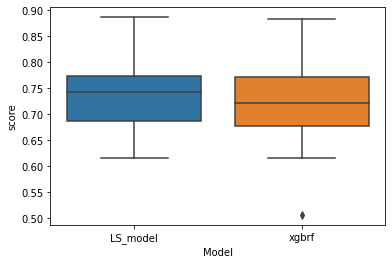

In [62]:
import seaborn as sns
sns.boxplot(data=results_df[results_df['metric']=='Rsquared'],
            x="Model", 
            y="score",
           )

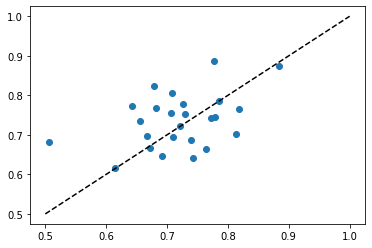

In [79]:
%matplotlib inline
import matplotlib.pyplot as plt
f,ax=plt.subplots()
ax.scatter(results_df.query('metric == "Rsquared" & Model == "xgbrf"')['score'],
            results_df.query('metric=="Rsquared" & Model =="LS_model"')['score'])
ax.plot([0.5,1], [0.5,1], c='k', linestyle='--')

### Results (Skip to next section)

In [ ]:
#Try with sklearn.preprocessing.RobustScaler for scaling targets
#Double-check on the features scaling


In [47]:
#RepeatedKFold 
#Minmax scaling to (0.1,0.9)
#n_hidden=1024; n_epoch=5000

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel
print(ttest_rel(xgbrf_scores, Rsquared_scores))

LSwFW_model_results

R^2 scores: 0.721 +/- 0.0


ValueError: unequal length arrays

In [15]:
#Minmax scaling to (0.1,0.9)
#n_hidden=1024; n_epoch=5000

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel
print(ttest_rel(xgbrf_scores, Rsquared_scores))

LSwFW_model_results

R^2 scores: 0.740 +/- 0.05667238473862471
Ttest_relResult(statistic=-0.8991194065100284, pvalue=0.4194221994325425)


[['LS_model', 0, 'RMSE', 0.7643364603383654],
 ['LS_model', 0, 'Rsquared', 0.8022580175167153],
 ['LS_model', 1, 'RMSE', 0.8278924964681317],
 ['LS_model', 1, 'Rsquared', 0.6638022618496336],
 ['LS_model', 2, 'RMSE', 0.8964601093012752],
 ['LS_model', 2, 'Rsquared', 0.6945204714477606],
 ['LS_model', 3, 'RMSE', 0.7882183823133733],
 ['LS_model', 3, 'Rsquared', 0.8053202751119408],
 ['LS_model', 4, 'RMSE', 0.8361618990842484],
 ['LS_model', 4, 'Rsquared', 0.7335522216950912]]

In [18]:
#Minmax scaling to (0.1,0.9)
#n_hidden=512; n_epoch=5000

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel
print(ttest_rel(xgbrf_scores, Rsquared_scores))

LSwFW_model_results

R^2 scores: 0.735 +/- 0.06902310710386812
Ttest_relResult(statistic=-0.5812311276422899, pvalue=0.5922624683949828)


[['LS_model', 0, 'RMSE', 0.6903701511249251],
 ['LS_model', 0, 'Rsquared', 0.8386779462594645],
 ['LS_model', 1, 'RMSE', 0.8431180972315595],
 ['LS_model', 1, 'Rsquared', 0.651322665584655],
 ['LS_model', 2, 'RMSE', 0.9079881674410575],
 ['LS_model', 2, 'Rsquared', 0.6866133070293041],
 ['LS_model', 3, 'RMSE', 0.8185739721497177],
 ['LS_model', 3, 'Rsquared', 0.7900366618934705],
 ['LS_model', 4, 'RMSE', 0.8745141031488032],
 ['LS_model', 4, 'Rsquared', 0.708549375745983]]

In [ ]:
#Somehow the model initialized with Adam/RMSprop/Nadam behaves very poorly

In [22]:
#n_hidden=512; n_epoch=5000

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel
print(ttest_rel(xgbrf_scores, Rsquared_scores))

LSwFW_model_results

R^2 scores: 0.727 +/- 0.06428996431531783
Ttest_relResult(statistic=-0.4057077742468438, pvalue=0.7057215953838318)


[['LS_model', 0, 'RMSE', 0.7685788201750529],
 ['LS_model', 0, 'Rsquared', 0.8000568383874719],
 ['LS_model', 1, 'RMSE', 0.8550357449047842],
 ['LS_model', 1, 'Rsquared', 0.64139574680552],
 ['LS_model', 2, 'RMSE', 0.9253199025104291],
 ['LS_model', 2, 'Rsquared', 0.6745352336026251],
 ['LS_model', 3, 'RMSE', 0.8005039976105258],
 ['LS_model', 3, 'Rsquared', 0.7992042039303607],
 ['LS_model', 4, 'RMSE', 0.8554940066555504],
 ['LS_model', 4, 'Rsquared', 0.7210892219300771]]

In [27]:
#l2 regularizers, attention_hidden_activation = leaky relu
#Kfold splits random seed=1234

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel
print(ttest_rel(xgbrf_scores, Rsquared_scores))

LSwFW_model_results

R^2 scores: 0.740 +/- 0.04222589617290418
Ttest_relResult(statistic=-0.9438371379627587, pvalue=0.39869495347993167)


[['LS_model', 0, 'RMSE', 0.8599255390088614],
 ['LS_model', 0, 'Rsquared', 0.7497054317212815],
 ['LS_model', 1, 'RMSE', 0.7423365205665163],
 ['LS_model', 1, 'Rsquared', 0.7296984423482034],
 ['LS_model', 2, 'RMSE', 0.905574216761023],
 ['LS_model', 2, 'Rsquared', 0.6882774133322948],
 ['LS_model', 3, 'RMSE', 0.7696223059397426],
 ['LS_model', 3, 'Rsquared', 0.8143978945068729],
 ['LS_model', 4, 'RMSE', 0.8609240490618707],
 ['LS_model', 4, 'Rsquared', 0.7175373471197677]]

Ttest_relResult(statistic=-0.9438371379627587, pvalue=0.39869495347993167)

In [13]:
#Adadelta, learning_rate=0.01

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.743 +/- 0.12020918577102535


[['LS_model', 0, 'RMSE', 0.6775409767412629],
 ['LS_model', 0, 'Rsquared', 0.8358746519931927],
 ['LS_model', 1, 'RMSE', 0.726963762381779],
 ['LS_model', 1, 'Rsquared', 0.7953466403788493],
 ['LS_model', 2, 'RMSE', 0.5735556964671294],
 ['LS_model', 2, 'Rsquared', 0.8747989869241621],
 ['LS_model', 3, 'RMSE', 1.1568002270970126],
 ['LS_model', 3, 'Rsquared', 0.5540573140132545],
 ['LS_model', 4, 'RMSE', 0.9045627182516215],
 ['LS_model', 4, 'Rsquared', 0.6545970611083352]]

In [78]:
#Trying new variations:
#Learning rate=0.002; more epochs
#Orthogonal (orthonormal if #columns>=#rows) initializer; n_attention_out=2
#batch norm after activation; batch norm after hidden layers; 
#He_normal initializer (Tried and replaced);  
#LeakyReLU; l1 bias and kernel regularizers; Constant (0.01) bias initializer
#Repeating best performance: 
#Using subset of features (138) - n_hidden=256; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.745 +/- 0.11912340074691877


[['LS_model', 0, 'RMSE', 0.6606182832194498],
 ['LS_model', 0, 'Rsquared', 0.8439708630516496],
 ['LS_model', 1, 'RMSE', 0.7188006434890145],
 ['LS_model', 1, 'Rsquared', 0.7999169645269679],
 ['LS_model', 2, 'RMSE', 0.5902572702759032],
 ['LS_model', 2, 'Rsquared', 0.867401278040431],
 ['LS_model', 3, 'RMSE', 1.1512434857995595],
 ['LS_model', 3, 'Rsquared', 0.5583312353326686],
 ['LS_model', 4, 'RMSE', 0.9055811792314892],
 ['LS_model', 4, 'Rsquared', 0.653818834357665]]

In [17]:
#Trying new variations:
#LeakyReLU; l1 bias and kernel regularizers; Constant (0.01) bias initializer
#Repeating best performance: 
#Using subset of features (138) - n_hidden=256; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.731 +/- 0.135601988554609


[['LS_model', 0, 'RMSE', 0.6722845048448179],
 ['LS_model', 0, 'Rsquared', 0.8384113951495025],
 ['LS_model', 1, 'RMSE', 0.7008107438439005],
 ['LS_model', 1, 'Rsquared', 0.8098068569606427],
 ['LS_model', 2, 'RMSE', 0.6614601068448999],
 ['LS_model', 2, 'Rsquared', 0.8334809358451422],
 ['LS_model', 3, 'RMSE', 1.2468590800767432],
 ['LS_model', 3, 'Rsquared', 0.48191972264310357],
 ['LS_model', 4, 'RMSE', 0.8564036737907389],
 ['LS_model', 4, 'Rsquared', 0.6903966128658078]]

In [15]:
#Trying new variations:
#LeakyReLU; l1 bias and kernel regularizers
#Repeating best performance: 
#Using subset of features (138) - n_hidden=256; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.718 +/- 0.12264645042321175


[['LS_model', 0, 'RMSE', 0.7144448432897135],
 ['LS_model', 0, 'Rsquared', 0.8175087944841983],
 ['LS_model', 1, 'RMSE', 0.7452392622606231],
 ['LS_model', 1, 'Rsquared', 0.7849275375679201],
 ['LS_model', 2, 'RMSE', 0.6932238733321736],
 ['LS_model', 2, 'Rsquared', 0.8171042266285361],
 ['LS_model', 3, 'RMSE', 1.2297479139287588],
 ['LS_model', 3, 'Rsquared', 0.4960418140522592],
 ['LS_model', 4, 'RMSE', 0.8757506475043116],
 ['LS_model', 4, 'Rsquared', 0.676250136341393]]

In [22]:
#Trying new variations:
#LeakyReLU; l2 bias regularizer
#Repeating best performance: 
#Using subset of features (138) - n_hidden=256; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.705 +/- 0.10357772623593761


[['LS_model', 0, 'RMSE', 0.7620107127395217],
 ['LS_model', 0, 'Rsquared', 0.7924003188924187],
 ['LS_model', 1, 'RMSE', 0.718821607032491],
 ['LS_model', 1, 'Rsquared', 0.7999052936676948],
 ['LS_model', 2, 'RMSE', 0.7706913335025768],
 ['LS_model', 2, 'Rsquared', 0.7739431879234585],
 ['LS_model', 3, 'RMSE', 1.1413624634258008],
 ['LS_model', 3, 'Rsquared', 0.5658803081173664],
 ['LS_model', 4, 'RMSE', 0.9837553826417396],
 ['LS_model', 4, 'Rsquared', 0.5914709884325542]]

In [ ]:
#Repeating best performance: 
#Using subset of features (138) - n_hidden=256; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

In [60]:
#Using subset of features (303) - n_hidden=512; Dropout 0.1; Adagrad
# print(LSwFW_model_results)

results_df=pd.DataFrame(LSwFW_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=results_df[results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

LSwFW_model_results

R^2 scores: 0.687 +/- 0.12220488577824874


[['LS_model', 0, 'RMSE', 0.6967373332222753],
 ['LS_model', 0, 'Rsquared', 0.8264427772058969],
 ['LS_model', 1, 'RMSE', 1.049449659610995],
 ['LS_model', 1, 'Rsquared', 0.5735024162730559],
 ['LS_model', 2, 'RMSE', 0.6415401599279135],
 ['LS_model', 2, 'Rsquared', 0.8433593977525441],
 ['LS_model', 3, 'RMSE', 1.1319924066458187],
 ['LS_model', 3, 'Rsquared', 0.5729788928683146],
 ['LS_model', 4, 'RMSE', 0.9524836674436394],
 ['LS_model', 4, 'Rsquared', 0.6170308994116565]]

In [57]:
Rsquared_scores

array([0.82644278, 0.57350242, 0.8433594 , 0.57297889, 0.6170309 ])

In [22]:
#Using subset of features (100-200+) - n_hidden=512; Dropout 0.1; Adagrad
LSwFW_model_results

[['LS_model', 0, 'RMSE', 0.7099932490439876],
 ['LS_model', 0, 'Rsquared', 0.8197758579572929],
 ['LS_model', 1, 'RMSE', 1.0063671942368868],
 ['LS_model', 1, 'Rsquared', 0.6078011686507043],
 ['LS_model', 2, 'RMSE', 0.8060592948161432],
 ['LS_model', 2, 'Rsquared', 0.7527190681573067],
 ['LS_model', 3, 'RMSE', 1.1300885514508938],
 ['LS_model', 3, 'Rsquared', 0.5744140662544505],
 ['LS_model', 4, 'RMSE', 0.9197688705103827],
 ['LS_model', 4, 'Rsquared', 0.6428866599473193]]

R^2 scores: 0.680 +/- 0.09226338271542076


In [54]:
#Using subset of features - n_hidden=512; Dropout 0.2; Adagrad
LSwFW_model_results

[['LS_model', 0, 'RMSE', 0.6782788676768158],
 ['LS_model', 0, 'Rsquared', 0.8355169686717168],
 ['LS_model', 1, 'RMSE', 0.7649396643731917],
 ['LS_model', 1, 'Rsquared', 0.7734063605462442],
 ['LS_model', 2, 'RMSE', 0.7430328855737924],
 ['LS_model', 2, 'Rsquared', 0.7898774227577623],
 ['LS_model', 3, 'RMSE', 1.3368260405903252],
 ['LS_model', 3, 'Rsquared', 0.4044583930186181],
 ['LS_model', 4, 'RMSE', 1.0637018939217608],
 ['LS_model', 4, 'Rsquared', 0.5223733785858484]]

In [51]:
#Using subset of features - n_hidden=512; Dropout 0.1
LSwFW_model_results

[['LS_model', 0, 'RMSE', 0.651534595641359],
 ['LS_model', 0, 'Rsquared', 0.8482322517979451],
 ['LS_model', 1, 'RMSE', 0.9067934001358763],
 ['LS_model', 1, 'Rsquared', 0.6815728761509823],
 ['LS_model', 2, 'RMSE', 0.7676428611923198],
 ['LS_model', 2, 'Rsquared', 0.775727988084741],
 ['LS_model', 3, 'RMSE', 1.30196865615461],
 ['LS_model', 3, 'Rsquared', 0.43511066805505283],
 ['LS_model', 4, 'RMSE', 0.9922147159849722],
 ['LS_model', 4, 'Rsquared', 0.5844148812816059]]

In [35]:
#Using all features - Not so good! 
LSwFW_model_results

[['LS_model', 0, 'RMSE', 1.013939222948929],
 ['LS_model', 0, 'Rsquared', 0.632439887955128],
 ['LS_model', 1, 'RMSE', 0.9179725670223282],
 ['LS_model', 1, 'Rsquared', 0.6736731876784152],
 ['LS_model', 2, 'RMSE', 0.8357156871103995],
 ['LS_model', 2, 'Rsquared', 0.7341885057953494],
 ['LS_model', 3, 'RMSE', 1.1569235886431786],
 ['LS_model', 3, 'Rsquared', 0.5539621980006288],
 ['LS_model', 4, 'RMSE', 1.1908417989368432],
 ['LS_model', 4, 'Rsquared', 0.4013723118732134]]

In [235]:
#Using subset of features (~100-200+)
LSwFW_model_results

[['LS_model', 0, 'RMSE', 0.7000273664915143],
 ['LS_model', 0, 'Rsquared', 0.8247998131263967],
 ['LS_model', 1, 'RMSE', 0.8370737996562879],
 ['LS_model', 1, 'Rsquared', 0.7286556078131561],
 ['LS_model', 2, 'RMSE', 0.7947137428104315],
 ['LS_model', 2, 'Rsquared', 0.7596312004194039],
 ['LS_model', 3, 'RMSE', 1.0515723069185843],
 ['LS_model', 3, 'Rsquared', 0.6314973665103875],
 ['LS_model', 4, 'RMSE', 0.8376555439727413],
 ['LS_model', 4, 'Rsquared', 0.7038037236982555]]

In [47]:
#Using subset of features (~500+)- n_hidden=512 Not much better. Overfitting? 
LSwFW_model_results

[['LS_model', 0, 'RMSE', 0.7415701997647108],
 ['LS_model', 0, 'Rsquared', 0.8033884320373097],
 ['LS_model', 1, 'RMSE', 0.9395701794909443],
 ['LS_model', 1, 'Rsquared', 0.6581372341324514],
 ['LS_model', 2, 'RMSE', 0.8944157904909297],
 ['LS_model', 2, 'Rsquared', 0.6955362698578893],
 ['LS_model', 3, 'RMSE', 1.1235861144657135],
 ['LS_model', 3, 'Rsquared', 0.5792975493622072],
 ['LS_model', 4, 'RMSE', 1.1909440172515886],
 ['LS_model', 4, 'Rsquared', 0.4012695386253996]]

In [66]:
attentions=LSwFW_model.layers[1](train_tensor_scaled)

In [78]:
from umap import UMAP
dr=UMAP(n_neighbors=30)
embed=dr.fit_transform(attentions)


In [91]:
attentions=LSwFW_model.layers[1](np.vstack([train_tensor_scaled, 
                                            test_tensor_scaled
                                           ]))
y=np.concatenate([train_target_scaled, test_target_scaled])

from sklearn.manifold import TSNE
dr=TSNE()
embed=dr.fit_transform(attentions)

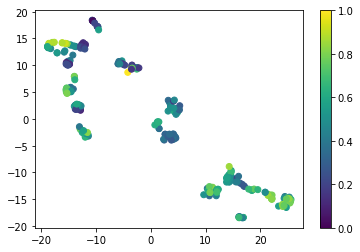

In [93]:

%matplotlib inline
import matplotlib.pyplot as plt
ax=plt.scatter(embed[:,0], embed[:,1], c=y)
plt.colorbar()

In [89]:
from sklearn.manifold import TSNE
dr=TSNE()
X=np.vstack([train_features_scaled, test_features_scaled])
y=np.concatenate([train_target_scaled, test_target_scaled])
embed=dr.fit_transform(X)


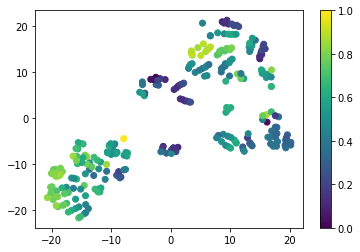

In [90]:

%matplotlib inline
import matplotlib.pyplot as plt
ax=plt.scatter(embed[:,0], embed[:,1], c=y)
plt.colorbar()

In [94]:
attentions

<tf.Tensor: shape=(278, 512), dtype=float32, numpy=
array([[ 0.5911365 , -1.4955912 ,  0.06898095, ..., -0.330205  ,
         0.52053857,  0.2093779 ],
       [ 0.25103754, -1.481384  , -0.5412576 , ...,  0.07170615,
         0.48337218,  0.47351393],
       [-0.39007747, -1.4446208 ,  0.47037584, ..., -0.3939123 ,
         0.38567215, -0.3690167 ],
       ...,
       [-1.5095239 , -0.75192404,  0.6724335 , ..., -0.43448618,
        -1.3399479 , -0.6554892 ],
       [-1.1030701 , -0.09076358, -1.3811833 , ..., -0.41498417,
         0.15673786, -0.5376275 ],
       [ 0.08091572, -0.35735577,  0.6353635 , ..., -0.93192357,
         0.16245705, -0.19017597]], dtype=float32)>

### Try some variations (Skip to next section)

In [11]:
from functools import partial

bias_regularizer=l2(1E-5)
hidden_activation=partial(tf.nn.leaky_relu, alpha=0.01)
concat_activation=partial(tf.nn.leaky_relu, alpha=0.01)

In [14]:
idx
n_out=1
n_feat=train_features_select.shape[1]

NameError: name 'train_features_select' is not defined

In [17]:
#Set up model


callbacks, checkpoint_path=setup_callback_paths("val_root_mean_square_error",
                           mode="min",
                           model_name="LSwFW_wDropouts_Adagrad_leakyReLU",
                           dataset_name="AChEi",
                           split_number=idx,
                           super_folder="Preliminary_Models"
                          )
tf.random.set_seed(123)
LSwFW_model=get_attentionwFW_model(n_attention,
                    n_attention_hidden,
                    n_feat,
                    n_concat_hidden,
                    concat_activation,
                    kernel_initializer,
                    attention_hidden_activation, 
                    attention_output_activation, 
                             n_hidden, 
                    hidden_activation, 
                    kernel_regularizer,
                    bias_regularizer)   

LSwFW_model.compile(
    optimizer=tf.keras.optimizers.Adagrad(learning_rate=learning_rate,
#         optimizer=tf.keras.optimizers.SGD(learning_rate=learning_rate,
                                                   clipvalue=0.5,
                                                   clipnorm=1.0,
                                                  ),
                                  loss=tf.keras.losses.MAE,
                 metrics=["mae", "mse", 
                          tf.keras.metrics.RootMeanSquaredError()
                         ]
                 )

#Fit and train model
LSwFW_model.fit(train_ds,
             validation_data=test_ds,
             epochs=2000,
             callbacks=callbacks,
             verbose=0
            )    

#Evaluate model
LSwFW_model.load_weights(checkpoint_path)
test_predict=target_scaler.inverse_transform(
    LSwFW_model(test_tensor_scaled).numpy()
).flatten()

from sklearn.metrics import mean_squared_error, r2_score
rmse=mean_squared_error(test_target, test_predict, squared=False)

r2=r2_score(test_target, test_predict, )
print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

LSwFW_model_results.append(["LS_model", idx, "RMSE", rmse])
LSwFW_model_results.append(["LS_model", idx, "Rsquared", r2])

NameError: name 'COSA' is not defined

# Train deep learner

In [22]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.keras.backend.set_floatx('float32')


code_folder=os.path.join(os.getcwd(),
                         "..",
                         "..",
                         "0_code"
                        )
sys.path.append(code_folder)



In [26]:
import time
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from algorithms import attention_model
from sklearn.preprocessing import StandardScaler, MinMaxScaler

def get_dense_model(n_attention,
                           n_attention_hidden,
                           n_feat,
                           n_out,
                           n_concat_hidden,
                           concat_activation,
                           n_attention_out,
                           kernel_initializer,
                           bias_initializer,
                           attention_hidden_activation,
                           attention_output_activation,
                           n_hidden,
                           hidden_activation,
                           kernel_regularizer,
                           bias_regularizer,
                           random_seed=123):
    input_shape = (n_feat,)
    input_layer=Input(shape=input_shape)
    tf.random.set_seed(random_seed)
    
    first_layer=Dense(n_attention*n_attention_hidden*4,
                      activation=hidden_activation,
                      kernel_initializer=kernel_initializer,
                      kernel_regularizer=kernel_regularizer,
                      bias_initializer=bias_initializer,
                      bias_regularizer=bias_regularizer,
                     )(input_layer)
    
    dense_layer0=Dense(n_concat_hidden,
                       activation=hidden_activation,
                       kernel_initializer=kernel_initializer,
                       kernel_regularizer=kernel_regularizer,
                       bias_initializer=bias_initializer,
                       bias_regularizer=bias_regularizer,
                      )(first_layer)
    
    dense_layer1 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(dense_layer0)
    dropout1 = Dropout(0.1)(dense_layer1)
    batchnorm1 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout1)
    dense_layer2 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer
                         )(batchnorm1)
    dropout2 = Dropout(0.1)(dense_layer2)
    batchnorm2 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout2)
    dense_layer3 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(batchnorm2)
    output_layer = Dense(n_out, activation="linear")(dense_layer3)

    dense_model = tf.keras.Model(inputs=input_layer,
                              outputs=output_layer
                              )
    return dense_model    

def setup_callback_paths(monitor,
                         mode,
                         model_name,
                         dataset_name,
                         split_number=0,
                         super_folder=None,
                         ):
    if isinstance(split_number, (int, float)):
        split_name = "split{:02d}".format(split_number)
    else:
        split_name = split_number
    save_folder = "_".join([time.strftime("%y%m%d", time.localtime()),
                            model_name,
                            dataset_name,
                            split_name
                            ])
    if super_folder is not None:
        save_folder = os.path.join(super_folder,
                                   save_folder
                                   )
        try:
            os.mkdir(super_folder)
        except OSError as error:
            print(error)
    checkpoint_path = os.path.join(save_folder,
                                   "model_checkpoint")
    csv_filename = os.path.join(checkpoint_path, "training_log.csv")
    try:
        os.mkdir(save_folder)
    except OSError as error:
        print(error)
    try:
        os.mkdir(checkpoint_path)
    except OSError as error:
        print(error)

    cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                     monitor='val_root_mean_squared_error',
                                                     mode='min',
                                                     save_best_only=True,
                                                     save_weights_only=True,
                                                     verbose=1
                                                     )
    csvlogger_callback = tf.keras.callbacks.CSVLogger(filename=csv_filename,
                                                      append=True
                                                      )
    return [cp_callback, csvlogger_callback], checkpoint_path

#Check if a feature is binary:
def check_binary(col):
    if len(np.unique(col))==2:
        return True
    else:
        return False

# TBD
# class ContBinScaler(TransformerMixin, BaseEstimator):
#     def __init__(self,
#                  continuous_feature_scaler_kwargs,
#                  binary_feature_scaler_kwargs
#                  ):
#         self.continuous_feature_scaler_kwargs = continuous_feature_scaler_kwargs
#         self.binary_feature_scaler_kwargs = binary_feature_scaler_kwargs

#     def fit(self, X):
#         self.continuous_feature_scaler = StandardScaler(
#             **self.continuous_feature_scaler_kwargs
#         )
#         self.binary_feature_scaler = None
#         self.bin_mask=np.apply_along_axis(check_binary, 
#                                           axis=0, 
#                                           arr=train_features)
#         if isinstance(X, pd.DataFrame):
#             X=X.values
#         self.continuous_feature_scaler.fit(X[:, ~self.bin_mask])
#         if self.binary_feature_scaler is not None:
#             self.binary_feature_scaler.fit(X[:, self.bin_mask])

#     def transform(self, X):
#         X_cont = self.continuous_feature_scaler.transform(
#             X[:, ~self.bin_mask])
#         if self.binary_feature_scaler is not None:
#             X_bin = self.binary_feature_scaler.transform(
#                 X[:, self.bin_mask])
#         else:
#             X_bin = X[:, self.bin_mask]
#         return self.revert_order(X_cont, X_bin)
    
#     def fit_transform(self, X):
#         self.fit(X)
#         return self.transform(X)
    
#     def inverse_transform(self, X):
#         X_cont = self.continuous_feature_scaler.inverse_transform(
#             X[:, ~self.bin_mask]
#         )
#         if self.binary_feature_scaler is not None:
#             X_bin=self.binary_feature_scaler.inverse_transform(
#                 X[:, self.bin_mask]
#             )
#         else:
#             X_bin= X[:, self.bin_mask]
#         return self.revert_order(X_cont, X_bin)

#     def revert_order(self, X_cont, X_bin):
#         X = np.empty((X_cont.shape[0], len(self.bin_mask)))
#         X[:, self.bin_mask] = X_bin
#         X[:, ~self.bin_mask] = X_cont
#         return X


def data_scaling(feature_scaler,
                 target_scaler,
                 train_features,
                 test_features,
                 train_target,
                 test_target
                 ):
    # Scaling
    feature_scaler.fit(train_features)
    train_features_scaled = feature_scaler.transform(train_features)
    test_features_scaled = feature_scaler.transform(test_features)

    target_scaler.fit(np.expand_dims(train_target, axis=1))
    train_target_scaled = target_scaler.transform(
        np.expand_dims(train_target, axis=1)).flatten()
    test_target_scaled = target_scaler.transform(
        np.expand_dims(test_target, axis=1)).flatten()

    return train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler



In [27]:
from tensorflow.keras.initializers import VarianceScaling
from tensorflow.keras.regularizers import l1, l2
from functools import partial 

learning_rate=0.05

model_setup_params = {
    "n_attention": 10,
    "n_attention_hidden": 40,
    'n_feat': None,
    "n_out": 1,
    "n_concat_hidden": 512,
    "concat_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "n_attention_out": 3,
    "kernel_initializer": tf.keras.initializers.Orthogonal(),
    "bias_initializer": tf.keras.initializers.Constant(value=0.1),     # So that we have weights to train on each LeakyReLU neuron
    "attention_hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "attention_output_activation": "sigmoid",
    "n_hidden": 512,
    "hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "kernel_regularizer": l2(1E-5),
    "bias_regularizer": l2(1E-5),
    "random_seed": 123
}

model_compile_params = {
    "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                              clipvalue=0.5,
                                              clipnorm=1.0
                                              ),
    "loss": tf.keras.losses.MAE,
    "metrics": ["mae", "mse",
                tf.keras.metrics.RootMeanSquaredError()
                ]
}

dataset_params = {
    "n_batch": 8,
    "n_buffer": 100,
}

n_batch=dataset_params['n_batch']
n_buffer=dataset_params['n_buffer']

In [185]:
from algorithms import COSA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import RepeatedKFold
import time
import dill as pickle

dense_model_results = []

rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
for idx, (train_ind, test_ind) in enumerate(rkf.split(all_features)):
#     train_features = selected_features.iloc[train_ind, :].values
#     test_features = selected_features.iloc[test_ind, :].values

    final_selected_feat_ind = range(all_features.shape[1]) #selected_feat_ind
    
    train_features = all_features.iloc[train_ind, :].values
    test_features = all_features.iloc[test_ind, :].values
        
    
    train_target = all_target.values[train_ind]
    test_target = all_target.values[test_ind]
    # Feature weighting

#     cosa_mdl = COSA.NNCosa(n_iter=100,
#                            distance_measure='inv_exp_dist',
#                            calc_D_ijk=False)
#     cosa_mdl.fit(train_features)
#     cosa_mdl.fit_OOS(test_features)

#     train_features = train_features[:, cosa_mdl.valid_feat]
#     test_features = test_features[:, cosa_mdl.valid_feat]
#     train_Fweights = cosa_mdl.output_Fweight()
#     test_Fweights = cosa_mdl.output_Fweight(OOS=True)

    feature_scaler = StandardScaler()
#     feature_scaler = ContBinScaler({},{})
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
    
    n_feat = train_features_scaled.shape[1]
    model_setup_params['n_feat'] = n_feat

    # Setup tf datasets
#     train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
#     test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    train_ds = tf.data.Dataset.from_tensor_slices((train_features_scaled,
                                                   train_target_scaled
                                                   ))
    test_ds = tf.data.Dataset.from_tensor_slices((test_features_scaled,
                                                  test_target_scaled
                                                  ))
    train_ds = train_ds.shuffle(n_buffer).batch(n_batch)
    test_ds = test_ds.shuffle(n_buffer).batch(n_batch)

    callbacks, checkpoint_path = setup_callback_paths("val_root_mean_square_error",
                                                      mode="min",
                                                      model_name="Dense_RobustScaler_rkf",
                                                      dataset_name="AChEi",
                                                      split_number=idx,
                                                      super_folder="ExtendedDataset_PreliminaryModels"
                                                      )

#     final_selected_feat_ind = np.where(selected_feat_ind)[
#         0][cosa_mdl.valid_feat]
    to_save = {'final_selected_feat_ind': final_selected_feat_ind,
               'train_ind': train_ind,
               'test_ind': test_ind,
#                'train_Fweights': train_Fweights,
#                'test_Fweights': test_Fweights
               }
    with open(os.path.join(checkpoint_path, "..",
                           "input_info.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    model_compile_params = {
        "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                                  clipvalue=0.5,
                                                  clipnorm=1.0
                                                  ),
        "loss": tf.keras.losses.MAE,
        "metrics": ["mae", "mse",
                    tf.keras.metrics.RootMeanSquaredError()
                    ]
    }
    to_save = {
        "_call": get_dense_model,
        "model_setup_params": model_setup_params,
        "model_compile_params": model_compile_params,
        "dataset_params": dataset_params
    }
    with open(os.path.join(checkpoint_path, "..",
                           "model_params.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    # Set up model
    dense_model = get_dense_model(**model_setup_params
                                         )

    dense_model.compile(**model_compile_params)

    # Fit and train model
    dense_model.fit(train_ds,
                    validation_data=test_ds,
                    epochs=1000,
                    callbacks=callbacks,
                    verbose=0
                    )

    # Evaluate model
    dense_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        dense_model(test_features_scaled).numpy()
    ).flatten()

    from sklearn.metrics import mean_squared_error, r2_score
    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    dense_model_results.append(["dense_model", idx, "RMSE", rmse])
    dense_model_results.append(["dense_model", idx, "Rsquared", r2])

    dense_model.save(os.path.join(checkpoint_path, "..", "saved_model"))
    



[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.55059, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split00\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.55059 to 0.47399, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split00\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.47399 to 0.43469, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split00\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.43469 to 0.39675, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split00\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.39675

Epoch 00006: val_root_mean_squared_error did not improve from 0.39675

Epoch 0000


Epoch 00094: val_root_mean_squared_error did not improve from 0.30652

Epoch 00095: val_root_mean_squared_error did not improve from 0.30652

Epoch 00096: val_root_mean_squared_error did not improve from 0.30652

Epoch 00097: val_root_mean_squared_error did not improve from 0.30652

Epoch 00098: val_root_mean_squared_error did not improve from 0.30652

Epoch 00099: val_root_mean_squared_error did not improve from 0.30652

Epoch 00100: val_root_mean_squared_error did not improve from 0.30652

Epoch 00101: val_root_mean_squared_error did not improve from 0.30652

Epoch 00102: val_root_mean_squared_error did not improve from 0.30652

Epoch 00103: val_root_mean_squared_error did not improve from 0.30652

Epoch 00104: val_root_mean_squared_error did not improve from 0.30652

Epoch 00105: val_root_mean_squared_error did not improve from 0.30652

Epoch 00106: val_root_mean_squared_error did not improve from 0.30652

Epoch 00107: val_root_mean_squared_error did not improve from 0.30652

Epoch


Epoch 00210: val_root_mean_squared_error did not improve from 0.30652

Epoch 00211: val_root_mean_squared_error did not improve from 0.30652

Epoch 00212: val_root_mean_squared_error did not improve from 0.30652

Epoch 00213: val_root_mean_squared_error did not improve from 0.30652

Epoch 00214: val_root_mean_squared_error did not improve from 0.30652

Epoch 00215: val_root_mean_squared_error did not improve from 0.30652

Epoch 00216: val_root_mean_squared_error did not improve from 0.30652

Epoch 00217: val_root_mean_squared_error did not improve from 0.30652

Epoch 00218: val_root_mean_squared_error did not improve from 0.30652

Epoch 00219: val_root_mean_squared_error did not improve from 0.30652

Epoch 00220: val_root_mean_squared_error did not improve from 0.30652

Epoch 00221: val_root_mean_squared_error did not improve from 0.30652

Epoch 00222: val_root_mean_squared_error did not improve from 0.30652

Epoch 00223: val_root_mean_squared_error did not improve from 0.30652

Epoch


Epoch 00326: val_root_mean_squared_error did not improve from 0.30652

Epoch 00327: val_root_mean_squared_error did not improve from 0.30652

Epoch 00328: val_root_mean_squared_error did not improve from 0.30652

Epoch 00329: val_root_mean_squared_error did not improve from 0.30652

Epoch 00330: val_root_mean_squared_error did not improve from 0.30652

Epoch 00331: val_root_mean_squared_error did not improve from 0.30652

Epoch 00332: val_root_mean_squared_error did not improve from 0.30652

Epoch 00333: val_root_mean_squared_error did not improve from 0.30652

Epoch 00334: val_root_mean_squared_error did not improve from 0.30652

Epoch 00335: val_root_mean_squared_error did not improve from 0.30652

Epoch 00336: val_root_mean_squared_error did not improve from 0.30652

Epoch 00337: val_root_mean_squared_error did not improve from 0.30652

Epoch 00338: val_root_mean_squared_error did not improve from 0.30652

Epoch 00339: val_root_mean_squared_error did not improve from 0.30652

Epoch


Epoch 00442: val_root_mean_squared_error did not improve from 0.30652

Epoch 00443: val_root_mean_squared_error did not improve from 0.30652

Epoch 00444: val_root_mean_squared_error did not improve from 0.30652

Epoch 00445: val_root_mean_squared_error did not improve from 0.30652

Epoch 00446: val_root_mean_squared_error did not improve from 0.30652

Epoch 00447: val_root_mean_squared_error did not improve from 0.30652

Epoch 00448: val_root_mean_squared_error did not improve from 0.30652

Epoch 00449: val_root_mean_squared_error did not improve from 0.30652

Epoch 00450: val_root_mean_squared_error did not improve from 0.30652

Epoch 00451: val_root_mean_squared_error did not improve from 0.30652

Epoch 00452: val_root_mean_squared_error did not improve from 0.30652

Epoch 00453: val_root_mean_squared_error did not improve from 0.30652

Epoch 00454: val_root_mean_squared_error did not improve from 0.30652

Epoch 00455: val_root_mean_squared_error did not improve from 0.30652

Epoch


Epoch 00558: val_root_mean_squared_error did not improve from 0.30652

Epoch 00559: val_root_mean_squared_error did not improve from 0.30652

Epoch 00560: val_root_mean_squared_error did not improve from 0.30652

Epoch 00561: val_root_mean_squared_error did not improve from 0.30652

Epoch 00562: val_root_mean_squared_error did not improve from 0.30652

Epoch 00563: val_root_mean_squared_error did not improve from 0.30652

Epoch 00564: val_root_mean_squared_error did not improve from 0.30652

Epoch 00565: val_root_mean_squared_error did not improve from 0.30652

Epoch 00566: val_root_mean_squared_error did not improve from 0.30652

Epoch 00567: val_root_mean_squared_error did not improve from 0.30652

Epoch 00568: val_root_mean_squared_error did not improve from 0.30652

Epoch 00569: val_root_mean_squared_error did not improve from 0.30652

Epoch 00570: val_root_mean_squared_error did not improve from 0.30652

Epoch 00571: val_root_mean_squared_error did not improve from 0.30652

Epoch


Epoch 00674: val_root_mean_squared_error did not improve from 0.30652

Epoch 00675: val_root_mean_squared_error did not improve from 0.30652

Epoch 00676: val_root_mean_squared_error did not improve from 0.30652

Epoch 00677: val_root_mean_squared_error did not improve from 0.30652

Epoch 00678: val_root_mean_squared_error did not improve from 0.30652

Epoch 00679: val_root_mean_squared_error did not improve from 0.30652

Epoch 00680: val_root_mean_squared_error did not improve from 0.30652

Epoch 00681: val_root_mean_squared_error did not improve from 0.30652

Epoch 00682: val_root_mean_squared_error did not improve from 0.30652

Epoch 00683: val_root_mean_squared_error did not improve from 0.30652

Epoch 00684: val_root_mean_squared_error did not improve from 0.30652

Epoch 00685: val_root_mean_squared_error did not improve from 0.30652

Epoch 00686: val_root_mean_squared_error did not improve from 0.30652

Epoch 00687: val_root_mean_squared_error did not improve from 0.30652

Epoch


Epoch 00790: val_root_mean_squared_error did not improve from 0.30652

Epoch 00791: val_root_mean_squared_error did not improve from 0.30652

Epoch 00792: val_root_mean_squared_error did not improve from 0.30652

Epoch 00793: val_root_mean_squared_error did not improve from 0.30652

Epoch 00794: val_root_mean_squared_error did not improve from 0.30652

Epoch 00795: val_root_mean_squared_error did not improve from 0.30652

Epoch 00796: val_root_mean_squared_error did not improve from 0.30652

Epoch 00797: val_root_mean_squared_error did not improve from 0.30652

Epoch 00798: val_root_mean_squared_error did not improve from 0.30652

Epoch 00799: val_root_mean_squared_error did not improve from 0.30652

Epoch 00800: val_root_mean_squared_error did not improve from 0.30652

Epoch 00801: val_root_mean_squared_error did not improve from 0.30652

Epoch 00802: val_root_mean_squared_error did not improve from 0.30652

Epoch 00803: val_root_mean_squared_error did not improve from 0.30652

Epoch


Epoch 00906: val_root_mean_squared_error did not improve from 0.30652

Epoch 00907: val_root_mean_squared_error did not improve from 0.30652

Epoch 00908: val_root_mean_squared_error did not improve from 0.30652

Epoch 00909: val_root_mean_squared_error did not improve from 0.30652

Epoch 00910: val_root_mean_squared_error did not improve from 0.30652

Epoch 00911: val_root_mean_squared_error did not improve from 0.30652

Epoch 00912: val_root_mean_squared_error did not improve from 0.30652

Epoch 00913: val_root_mean_squared_error did not improve from 0.30652

Epoch 00914: val_root_mean_squared_error did not improve from 0.30652

Epoch 00915: val_root_mean_squared_error did not improve from 0.30652

Epoch 00916: val_root_mean_squared_error did not improve from 0.30652

Epoch 00917: val_root_mean_squared_error did not improve from 0.30652

Epoch 00918: val_root_mean_squared_error did not improve from 0.30652

Epoch 00919: val_root_mean_squared_error did not improve from 0.30652

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.61492, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split01\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.61492

Epoch 00003: val_root_mean_squared_error improved from 0.61492 to 0.47900, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split01\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.47900 to 0.42336, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split01\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.42336 to 0.38593, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split01\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.38593

Epoch 0000


Epoch 00096: val_root_mean_squared_error did not improve from 0.31601

Epoch 00097: val_root_mean_squared_error did not improve from 0.31601

Epoch 00098: val_root_mean_squared_error did not improve from 0.31601

Epoch 00099: val_root_mean_squared_error did not improve from 0.31601

Epoch 00100: val_root_mean_squared_error did not improve from 0.31601

Epoch 00101: val_root_mean_squared_error did not improve from 0.31601

Epoch 00102: val_root_mean_squared_error did not improve from 0.31601

Epoch 00103: val_root_mean_squared_error did not improve from 0.31601

Epoch 00104: val_root_mean_squared_error did not improve from 0.31601

Epoch 00105: val_root_mean_squared_error did not improve from 0.31601

Epoch 00106: val_root_mean_squared_error did not improve from 0.31601

Epoch 00107: val_root_mean_squared_error did not improve from 0.31601

Epoch 00108: val_root_mean_squared_error improved from 0.31601 to 0.31438, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustSca


Epoch 00200: val_root_mean_squared_error did not improve from 0.30500

Epoch 00201: val_root_mean_squared_error did not improve from 0.30500

Epoch 00202: val_root_mean_squared_error did not improve from 0.30500

Epoch 00203: val_root_mean_squared_error did not improve from 0.30500

Epoch 00204: val_root_mean_squared_error did not improve from 0.30500

Epoch 00205: val_root_mean_squared_error did not improve from 0.30500

Epoch 00206: val_root_mean_squared_error did not improve from 0.30500

Epoch 00207: val_root_mean_squared_error did not improve from 0.30500

Epoch 00208: val_root_mean_squared_error did not improve from 0.30500

Epoch 00209: val_root_mean_squared_error did not improve from 0.30500

Epoch 00210: val_root_mean_squared_error did not improve from 0.30500

Epoch 00211: val_root_mean_squared_error did not improve from 0.30500

Epoch 00212: val_root_mean_squared_error did not improve from 0.30500

Epoch 00213: val_root_mean_squared_error did not improve from 0.30500

Epoch


Epoch 00306: val_root_mean_squared_error did not improve from 0.29988

Epoch 00307: val_root_mean_squared_error did not improve from 0.29988

Epoch 00308: val_root_mean_squared_error did not improve from 0.29988

Epoch 00309: val_root_mean_squared_error did not improve from 0.29988

Epoch 00310: val_root_mean_squared_error did not improve from 0.29988

Epoch 00311: val_root_mean_squared_error did not improve from 0.29988

Epoch 00312: val_root_mean_squared_error did not improve from 0.29988

Epoch 00313: val_root_mean_squared_error did not improve from 0.29988

Epoch 00314: val_root_mean_squared_error did not improve from 0.29988

Epoch 00315: val_root_mean_squared_error did not improve from 0.29988

Epoch 00316: val_root_mean_squared_error did not improve from 0.29988

Epoch 00317: val_root_mean_squared_error did not improve from 0.29988

Epoch 00318: val_root_mean_squared_error did not improve from 0.29988

Epoch 00319: val_root_mean_squared_error did not improve from 0.29988

Epoch


Epoch 00415: val_root_mean_squared_error did not improve from 0.29432

Epoch 00416: val_root_mean_squared_error did not improve from 0.29432

Epoch 00417: val_root_mean_squared_error did not improve from 0.29432

Epoch 00418: val_root_mean_squared_error did not improve from 0.29432

Epoch 00419: val_root_mean_squared_error did not improve from 0.29432

Epoch 00420: val_root_mean_squared_error did not improve from 0.29432

Epoch 00421: val_root_mean_squared_error did not improve from 0.29432

Epoch 00422: val_root_mean_squared_error did not improve from 0.29432

Epoch 00423: val_root_mean_squared_error did not improve from 0.29432

Epoch 00424: val_root_mean_squared_error did not improve from 0.29432

Epoch 00425: val_root_mean_squared_error did not improve from 0.29432

Epoch 00426: val_root_mean_squared_error did not improve from 0.29432

Epoch 00427: val_root_mean_squared_error did not improve from 0.29432

Epoch 00428: val_root_mean_squared_error did not improve from 0.29432

Epoch


Epoch 00531: val_root_mean_squared_error did not improve from 0.29432

Epoch 00532: val_root_mean_squared_error did not improve from 0.29432

Epoch 00533: val_root_mean_squared_error did not improve from 0.29432

Epoch 00534: val_root_mean_squared_error did not improve from 0.29432

Epoch 00535: val_root_mean_squared_error did not improve from 0.29432

Epoch 00536: val_root_mean_squared_error did not improve from 0.29432

Epoch 00537: val_root_mean_squared_error did not improve from 0.29432

Epoch 00538: val_root_mean_squared_error did not improve from 0.29432

Epoch 00539: val_root_mean_squared_error did not improve from 0.29432

Epoch 00540: val_root_mean_squared_error did not improve from 0.29432

Epoch 00541: val_root_mean_squared_error did not improve from 0.29432

Epoch 00542: val_root_mean_squared_error did not improve from 0.29432

Epoch 00543: val_root_mean_squared_error did not improve from 0.29432

Epoch 00544: val_root_mean_squared_error did not improve from 0.29432

Epoch


Epoch 00645: val_root_mean_squared_error did not improve from 0.29152

Epoch 00646: val_root_mean_squared_error did not improve from 0.29152

Epoch 00647: val_root_mean_squared_error did not improve from 0.29152

Epoch 00648: val_root_mean_squared_error did not improve from 0.29152

Epoch 00649: val_root_mean_squared_error did not improve from 0.29152

Epoch 00650: val_root_mean_squared_error did not improve from 0.29152

Epoch 00651: val_root_mean_squared_error did not improve from 0.29152

Epoch 00652: val_root_mean_squared_error did not improve from 0.29152

Epoch 00653: val_root_mean_squared_error did not improve from 0.29152

Epoch 00654: val_root_mean_squared_error did not improve from 0.29152

Epoch 00655: val_root_mean_squared_error did not improve from 0.29152

Epoch 00656: val_root_mean_squared_error did not improve from 0.29152

Epoch 00657: val_root_mean_squared_error did not improve from 0.29152

Epoch 00658: val_root_mean_squared_error did not improve from 0.29152

Epoch


Epoch 00761: val_root_mean_squared_error did not improve from 0.29152

Epoch 00762: val_root_mean_squared_error did not improve from 0.29152

Epoch 00763: val_root_mean_squared_error did not improve from 0.29152

Epoch 00764: val_root_mean_squared_error did not improve from 0.29152

Epoch 00765: val_root_mean_squared_error did not improve from 0.29152

Epoch 00766: val_root_mean_squared_error did not improve from 0.29152

Epoch 00767: val_root_mean_squared_error did not improve from 0.29152

Epoch 00768: val_root_mean_squared_error did not improve from 0.29152

Epoch 00769: val_root_mean_squared_error did not improve from 0.29152

Epoch 00770: val_root_mean_squared_error did not improve from 0.29152

Epoch 00771: val_root_mean_squared_error did not improve from 0.29152

Epoch 00772: val_root_mean_squared_error did not improve from 0.29152

Epoch 00773: val_root_mean_squared_error did not improve from 0.29152

Epoch 00774: val_root_mean_squared_error did not improve from 0.29152

Epoch


Epoch 00875: val_root_mean_squared_error did not improve from 0.28847

Epoch 00876: val_root_mean_squared_error did not improve from 0.28847

Epoch 00877: val_root_mean_squared_error did not improve from 0.28847

Epoch 00878: val_root_mean_squared_error did not improve from 0.28847

Epoch 00879: val_root_mean_squared_error did not improve from 0.28847

Epoch 00880: val_root_mean_squared_error did not improve from 0.28847

Epoch 00881: val_root_mean_squared_error did not improve from 0.28847

Epoch 00882: val_root_mean_squared_error did not improve from 0.28847

Epoch 00883: val_root_mean_squared_error did not improve from 0.28847

Epoch 00884: val_root_mean_squared_error did not improve from 0.28847

Epoch 00885: val_root_mean_squared_error did not improve from 0.28847

Epoch 00886: val_root_mean_squared_error did not improve from 0.28847

Epoch 00887: val_root_mean_squared_error did not improve from 0.28847

Epoch 00888: val_root_mean_squared_error did not improve from 0.28847

Epoch


Epoch 00989: val_root_mean_squared_error did not improve from 0.28824

Epoch 00990: val_root_mean_squared_error did not improve from 0.28824

Epoch 00991: val_root_mean_squared_error did not improve from 0.28824

Epoch 00992: val_root_mean_squared_error did not improve from 0.28824

Epoch 00993: val_root_mean_squared_error did not improve from 0.28824

Epoch 00994: val_root_mean_squared_error did not improve from 0.28824

Epoch 00995: val_root_mean_squared_error did not improve from 0.28824

Epoch 00996: val_root_mean_squared_error did not improve from 0.28824

Epoch 00997: val_root_mean_squared_error did not improve from 0.28824

Epoch 00998: val_root_mean_squared_error did not improve from 0.28824

Epoch 00999: val_root_mean_squared_error did not improve from 0.28824

Epoch 01000: val_root_mean_squared_error did not improve from 0.28824
Split1: RMSE = 0.677; R^2 = 0.854.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.63212, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split02\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.63212 to 0.53823, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split02\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.53823 to 0.42876, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split02\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.42876

Epoch 00005: val_root_mean_squared_error did not improve from 0.42876

Epoch 00006: val_root_mean_squared_error did not improve from 0.42876

Epoch 00007: val_root_mean_squared_error did not improve from 0.42876

Epoch 00008: val_root_mean_squared_error improved from 


Epoch 00094: val_root_mean_squared_error did not improve from 0.33454

Epoch 00095: val_root_mean_squared_error improved from 0.33454 to 0.32850, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split02\model_checkpoint

Epoch 00096: val_root_mean_squared_error did not improve from 0.32850

Epoch 00097: val_root_mean_squared_error did not improve from 0.32850

Epoch 00098: val_root_mean_squared_error did not improve from 0.32850

Epoch 00099: val_root_mean_squared_error did not improve from 0.32850

Epoch 00100: val_root_mean_squared_error did not improve from 0.32850

Epoch 00101: val_root_mean_squared_error did not improve from 0.32850

Epoch 00102: val_root_mean_squared_error did not improve from 0.32850

Epoch 00103: val_root_mean_squared_error did not improve from 0.32850

Epoch 00104: val_root_mean_squared_error did not improve from 0.32850

Epoch 00105: val_root_mean_squared_error did not improve from 0.32850

Epoch 00106: val_root_mean_squa


Epoch 00205: val_root_mean_squared_error did not improve from 0.32599

Epoch 00206: val_root_mean_squared_error did not improve from 0.32599

Epoch 00207: val_root_mean_squared_error did not improve from 0.32599

Epoch 00208: val_root_mean_squared_error did not improve from 0.32599

Epoch 00209: val_root_mean_squared_error did not improve from 0.32599

Epoch 00210: val_root_mean_squared_error did not improve from 0.32599

Epoch 00211: val_root_mean_squared_error did not improve from 0.32599

Epoch 00212: val_root_mean_squared_error did not improve from 0.32599

Epoch 00213: val_root_mean_squared_error did not improve from 0.32599

Epoch 00214: val_root_mean_squared_error did not improve from 0.32599

Epoch 00215: val_root_mean_squared_error did not improve from 0.32599

Epoch 00216: val_root_mean_squared_error did not improve from 0.32599

Epoch 00217: val_root_mean_squared_error did not improve from 0.32599

Epoch 00218: val_root_mean_squared_error did not improve from 0.32599

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.32599

Epoch 00322: val_root_mean_squared_error did not improve from 0.32599

Epoch 00323: val_root_mean_squared_error did not improve from 0.32599

Epoch 00324: val_root_mean_squared_error did not improve from 0.32599

Epoch 00325: val_root_mean_squared_error did not improve from 0.32599

Epoch 00326: val_root_mean_squared_error did not improve from 0.32599

Epoch 00327: val_root_mean_squared_error did not improve from 0.32599

Epoch 00328: val_root_mean_squared_error did not improve from 0.32599

Epoch 00329: val_root_mean_squared_error did not improve from 0.32599

Epoch 00330: val_root_mean_squared_error did not improve from 0.32599

Epoch 00331: val_root_mean_squared_error did not improve from 0.32599

Epoch 00332: val_root_mean_squared_error did not improve from 0.32599

Epoch 00333: val_root_mean_squared_error did not improve from 0.32599

Epoch 00334: val_root_mean_squared_error did not improve from 0.32599

Epoch


Epoch 00437: val_root_mean_squared_error did not improve from 0.32599

Epoch 00438: val_root_mean_squared_error did not improve from 0.32599

Epoch 00439: val_root_mean_squared_error did not improve from 0.32599

Epoch 00440: val_root_mean_squared_error did not improve from 0.32599

Epoch 00441: val_root_mean_squared_error did not improve from 0.32599

Epoch 00442: val_root_mean_squared_error did not improve from 0.32599

Epoch 00443: val_root_mean_squared_error did not improve from 0.32599

Epoch 00444: val_root_mean_squared_error did not improve from 0.32599

Epoch 00445: val_root_mean_squared_error did not improve from 0.32599

Epoch 00446: val_root_mean_squared_error did not improve from 0.32599

Epoch 00447: val_root_mean_squared_error did not improve from 0.32599

Epoch 00448: val_root_mean_squared_error did not improve from 0.32599

Epoch 00449: val_root_mean_squared_error did not improve from 0.32599

Epoch 00450: val_root_mean_squared_error did not improve from 0.32599

Epoch


Epoch 00553: val_root_mean_squared_error did not improve from 0.32599

Epoch 00554: val_root_mean_squared_error did not improve from 0.32599

Epoch 00555: val_root_mean_squared_error did not improve from 0.32599

Epoch 00556: val_root_mean_squared_error did not improve from 0.32599

Epoch 00557: val_root_mean_squared_error did not improve from 0.32599

Epoch 00558: val_root_mean_squared_error did not improve from 0.32599

Epoch 00559: val_root_mean_squared_error did not improve from 0.32599

Epoch 00560: val_root_mean_squared_error did not improve from 0.32599

Epoch 00561: val_root_mean_squared_error did not improve from 0.32599

Epoch 00562: val_root_mean_squared_error did not improve from 0.32599

Epoch 00563: val_root_mean_squared_error did not improve from 0.32599

Epoch 00564: val_root_mean_squared_error did not improve from 0.32599

Epoch 00565: val_root_mean_squared_error did not improve from 0.32599

Epoch 00566: val_root_mean_squared_error did not improve from 0.32599

Epoch


Epoch 00669: val_root_mean_squared_error did not improve from 0.32599

Epoch 00670: val_root_mean_squared_error did not improve from 0.32599

Epoch 00671: val_root_mean_squared_error did not improve from 0.32599

Epoch 00672: val_root_mean_squared_error did not improve from 0.32599

Epoch 00673: val_root_mean_squared_error did not improve from 0.32599

Epoch 00674: val_root_mean_squared_error did not improve from 0.32599

Epoch 00675: val_root_mean_squared_error did not improve from 0.32599

Epoch 00676: val_root_mean_squared_error did not improve from 0.32599

Epoch 00677: val_root_mean_squared_error did not improve from 0.32599

Epoch 00678: val_root_mean_squared_error did not improve from 0.32599

Epoch 00679: val_root_mean_squared_error did not improve from 0.32599

Epoch 00680: val_root_mean_squared_error did not improve from 0.32599

Epoch 00681: val_root_mean_squared_error did not improve from 0.32599

Epoch 00682: val_root_mean_squared_error did not improve from 0.32599

Epoch


Epoch 00785: val_root_mean_squared_error did not improve from 0.32599

Epoch 00786: val_root_mean_squared_error did not improve from 0.32599

Epoch 00787: val_root_mean_squared_error did not improve from 0.32599

Epoch 00788: val_root_mean_squared_error did not improve from 0.32599

Epoch 00789: val_root_mean_squared_error did not improve from 0.32599

Epoch 00790: val_root_mean_squared_error did not improve from 0.32599

Epoch 00791: val_root_mean_squared_error did not improve from 0.32599

Epoch 00792: val_root_mean_squared_error did not improve from 0.32599

Epoch 00793: val_root_mean_squared_error did not improve from 0.32599

Epoch 00794: val_root_mean_squared_error did not improve from 0.32599

Epoch 00795: val_root_mean_squared_error did not improve from 0.32599

Epoch 00796: val_root_mean_squared_error did not improve from 0.32599

Epoch 00797: val_root_mean_squared_error did not improve from 0.32599

Epoch 00798: val_root_mean_squared_error did not improve from 0.32599

Epoch


Epoch 00901: val_root_mean_squared_error did not improve from 0.32599

Epoch 00902: val_root_mean_squared_error did not improve from 0.32599

Epoch 00903: val_root_mean_squared_error did not improve from 0.32599

Epoch 00904: val_root_mean_squared_error did not improve from 0.32599

Epoch 00905: val_root_mean_squared_error did not improve from 0.32599

Epoch 00906: val_root_mean_squared_error did not improve from 0.32599

Epoch 00907: val_root_mean_squared_error did not improve from 0.32599

Epoch 00908: val_root_mean_squared_error did not improve from 0.32599

Epoch 00909: val_root_mean_squared_error did not improve from 0.32599

Epoch 00910: val_root_mean_squared_error did not improve from 0.32599

Epoch 00911: val_root_mean_squared_error did not improve from 0.32599

Epoch 00912: val_root_mean_squared_error did not improve from 0.32599

Epoch 00913: val_root_mean_squared_error did not improve from 0.32599

Epoch 00914: val_root_mean_squared_error did not improve from 0.32599

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.55032, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split03\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.55032

Epoch 00003: val_root_mean_squared_error improved from 0.55032 to 0.43943, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split03\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.43943 to 0.39987, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split03\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.39987

Epoch 00006: val_root_mean_squared_error improved from 0.39987 to 0.37398, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split03\model_checkpoint

Epoch 0000


Epoch 00089: val_root_mean_squared_error did not improve from 0.29668

Epoch 00090: val_root_mean_squared_error did not improve from 0.29668

Epoch 00091: val_root_mean_squared_error improved from 0.29668 to 0.29508, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split03\model_checkpoint

Epoch 00092: val_root_mean_squared_error did not improve from 0.29508

Epoch 00093: val_root_mean_squared_error did not improve from 0.29508

Epoch 00094: val_root_mean_squared_error did not improve from 0.29508

Epoch 00095: val_root_mean_squared_error did not improve from 0.29508

Epoch 00096: val_root_mean_squared_error did not improve from 0.29508

Epoch 00097: val_root_mean_squared_error improved from 0.29508 to 0.29460, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split03\model_checkpoint

Epoch 00098: val_root_mean_squared_error did not improve from 0.29460

Epoch 00099: val_root_mean_squared_error did not improve 


Epoch 00197: val_root_mean_squared_error did not improve from 0.27963

Epoch 00198: val_root_mean_squared_error did not improve from 0.27963

Epoch 00199: val_root_mean_squared_error did not improve from 0.27963

Epoch 00200: val_root_mean_squared_error did not improve from 0.27963

Epoch 00201: val_root_mean_squared_error did not improve from 0.27963

Epoch 00202: val_root_mean_squared_error did not improve from 0.27963

Epoch 00203: val_root_mean_squared_error did not improve from 0.27963

Epoch 00204: val_root_mean_squared_error did not improve from 0.27963

Epoch 00205: val_root_mean_squared_error did not improve from 0.27963

Epoch 00206: val_root_mean_squared_error did not improve from 0.27963

Epoch 00207: val_root_mean_squared_error did not improve from 0.27963

Epoch 00208: val_root_mean_squared_error did not improve from 0.27963

Epoch 00209: val_root_mean_squared_error did not improve from 0.27963

Epoch 00210: val_root_mean_squared_error did not improve from 0.27963

Epoch


Epoch 00310: val_root_mean_squared_error did not improve from 0.27385

Epoch 00311: val_root_mean_squared_error did not improve from 0.27385

Epoch 00312: val_root_mean_squared_error did not improve from 0.27385

Epoch 00313: val_root_mean_squared_error did not improve from 0.27385

Epoch 00314: val_root_mean_squared_error did not improve from 0.27385

Epoch 00315: val_root_mean_squared_error did not improve from 0.27385

Epoch 00316: val_root_mean_squared_error did not improve from 0.27385

Epoch 00317: val_root_mean_squared_error did not improve from 0.27385

Epoch 00318: val_root_mean_squared_error did not improve from 0.27385

Epoch 00319: val_root_mean_squared_error did not improve from 0.27385

Epoch 00320: val_root_mean_squared_error did not improve from 0.27385

Epoch 00321: val_root_mean_squared_error did not improve from 0.27385

Epoch 00322: val_root_mean_squared_error did not improve from 0.27385

Epoch 00323: val_root_mean_squared_error did not improve from 0.27385

Epoch


Epoch 00426: val_root_mean_squared_error did not improve from 0.27385

Epoch 00427: val_root_mean_squared_error did not improve from 0.27385

Epoch 00428: val_root_mean_squared_error did not improve from 0.27385

Epoch 00429: val_root_mean_squared_error did not improve from 0.27385

Epoch 00430: val_root_mean_squared_error did not improve from 0.27385

Epoch 00431: val_root_mean_squared_error did not improve from 0.27385

Epoch 00432: val_root_mean_squared_error did not improve from 0.27385

Epoch 00433: val_root_mean_squared_error did not improve from 0.27385

Epoch 00434: val_root_mean_squared_error did not improve from 0.27385

Epoch 00435: val_root_mean_squared_error did not improve from 0.27385

Epoch 00436: val_root_mean_squared_error did not improve from 0.27385

Epoch 00437: val_root_mean_squared_error did not improve from 0.27385

Epoch 00438: val_root_mean_squared_error did not improve from 0.27385

Epoch 00439: val_root_mean_squared_error did not improve from 0.27385

Epoch


Epoch 00542: val_root_mean_squared_error did not improve from 0.27385

Epoch 00543: val_root_mean_squared_error did not improve from 0.27385

Epoch 00544: val_root_mean_squared_error did not improve from 0.27385

Epoch 00545: val_root_mean_squared_error did not improve from 0.27385

Epoch 00546: val_root_mean_squared_error did not improve from 0.27385

Epoch 00547: val_root_mean_squared_error did not improve from 0.27385

Epoch 00548: val_root_mean_squared_error did not improve from 0.27385

Epoch 00549: val_root_mean_squared_error did not improve from 0.27385

Epoch 00550: val_root_mean_squared_error did not improve from 0.27385

Epoch 00551: val_root_mean_squared_error did not improve from 0.27385

Epoch 00552: val_root_mean_squared_error did not improve from 0.27385

Epoch 00553: val_root_mean_squared_error did not improve from 0.27385

Epoch 00554: val_root_mean_squared_error did not improve from 0.27385

Epoch 00555: val_root_mean_squared_error did not improve from 0.27385

Epoch


Epoch 00658: val_root_mean_squared_error did not improve from 0.27385

Epoch 00659: val_root_mean_squared_error did not improve from 0.27385

Epoch 00660: val_root_mean_squared_error did not improve from 0.27385

Epoch 00661: val_root_mean_squared_error did not improve from 0.27385

Epoch 00662: val_root_mean_squared_error did not improve from 0.27385

Epoch 00663: val_root_mean_squared_error did not improve from 0.27385

Epoch 00664: val_root_mean_squared_error did not improve from 0.27385

Epoch 00665: val_root_mean_squared_error did not improve from 0.27385

Epoch 00666: val_root_mean_squared_error did not improve from 0.27385

Epoch 00667: val_root_mean_squared_error did not improve from 0.27385

Epoch 00668: val_root_mean_squared_error did not improve from 0.27385

Epoch 00669: val_root_mean_squared_error did not improve from 0.27385

Epoch 00670: val_root_mean_squared_error did not improve from 0.27385

Epoch 00671: val_root_mean_squared_error did not improve from 0.27385

Epoch


Epoch 00769: val_root_mean_squared_error did not improve from 0.27264

Epoch 00770: val_root_mean_squared_error did not improve from 0.27264

Epoch 00771: val_root_mean_squared_error did not improve from 0.27264

Epoch 00772: val_root_mean_squared_error did not improve from 0.27264

Epoch 00773: val_root_mean_squared_error did not improve from 0.27264

Epoch 00774: val_root_mean_squared_error did not improve from 0.27264

Epoch 00775: val_root_mean_squared_error did not improve from 0.27264

Epoch 00776: val_root_mean_squared_error did not improve from 0.27264

Epoch 00777: val_root_mean_squared_error did not improve from 0.27264

Epoch 00778: val_root_mean_squared_error did not improve from 0.27264

Epoch 00779: val_root_mean_squared_error did not improve from 0.27264

Epoch 00780: val_root_mean_squared_error did not improve from 0.27264

Epoch 00781: val_root_mean_squared_error did not improve from 0.27264

Epoch 00782: val_root_mean_squared_error did not improve from 0.27264

Epoch


Epoch 00885: val_root_mean_squared_error did not improve from 0.27264

Epoch 00886: val_root_mean_squared_error did not improve from 0.27264

Epoch 00887: val_root_mean_squared_error did not improve from 0.27264

Epoch 00888: val_root_mean_squared_error did not improve from 0.27264

Epoch 00889: val_root_mean_squared_error did not improve from 0.27264

Epoch 00890: val_root_mean_squared_error did not improve from 0.27264

Epoch 00891: val_root_mean_squared_error did not improve from 0.27264

Epoch 00892: val_root_mean_squared_error did not improve from 0.27264

Epoch 00893: val_root_mean_squared_error did not improve from 0.27264

Epoch 00894: val_root_mean_squared_error did not improve from 0.27264

Epoch 00895: val_root_mean_squared_error did not improve from 0.27264

Epoch 00896: val_root_mean_squared_error did not improve from 0.27264

Epoch 00897: val_root_mean_squared_error did not improve from 0.27264

Epoch 00898: val_root_mean_squared_error did not improve from 0.27264

Epoch


Epoch 00996: val_root_mean_squared_error did not improve from 0.27064

Epoch 00997: val_root_mean_squared_error did not improve from 0.27064

Epoch 00998: val_root_mean_squared_error did not improve from 0.27064

Epoch 00999: val_root_mean_squared_error did not improve from 0.27064

Epoch 01000: val_root_mean_squared_error did not improve from 0.27064
Split3: RMSE = 0.653; R^2 = 0.840.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.55482, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split04\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.55482 to 0.39364, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split04\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.39364 to 0.37636, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split04\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.37636 to 0.36812, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split04\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.36812

Epoch 00006: val_root_mean_squared_error did not improve from 0.36812

Epoch 0000


Epoch 00086: val_root_mean_squared_error did not improve from 0.27522

Epoch 00087: val_root_mean_squared_error did not improve from 0.27522

Epoch 00088: val_root_mean_squared_error did not improve from 0.27522

Epoch 00089: val_root_mean_squared_error did not improve from 0.27522

Epoch 00090: val_root_mean_squared_error did not improve from 0.27522

Epoch 00091: val_root_mean_squared_error did not improve from 0.27522

Epoch 00092: val_root_mean_squared_error did not improve from 0.27522

Epoch 00093: val_root_mean_squared_error did not improve from 0.27522

Epoch 00094: val_root_mean_squared_error did not improve from 0.27522

Epoch 00095: val_root_mean_squared_error did not improve from 0.27522

Epoch 00096: val_root_mean_squared_error did not improve from 0.27522

Epoch 00097: val_root_mean_squared_error improved from 0.27522 to 0.27366, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split04\model_checkpoint

Epoch 00098: val_root_mean_squa


Epoch 00186: val_root_mean_squared_error did not improve from 0.25740

Epoch 00187: val_root_mean_squared_error did not improve from 0.25740

Epoch 00188: val_root_mean_squared_error did not improve from 0.25740

Epoch 00189: val_root_mean_squared_error did not improve from 0.25740

Epoch 00190: val_root_mean_squared_error did not improve from 0.25740

Epoch 00191: val_root_mean_squared_error did not improve from 0.25740

Epoch 00192: val_root_mean_squared_error did not improve from 0.25740

Epoch 00193: val_root_mean_squared_error did not improve from 0.25740

Epoch 00194: val_root_mean_squared_error did not improve from 0.25740

Epoch 00195: val_root_mean_squared_error did not improve from 0.25740

Epoch 00196: val_root_mean_squared_error did not improve from 0.25740

Epoch 00197: val_root_mean_squared_error did not improve from 0.25740

Epoch 00198: val_root_mean_squared_error did not improve from 0.25740

Epoch 00199: val_root_mean_squared_error did not improve from 0.25740

Epoch


Epoch 00294: val_root_mean_squared_error did not improve from 0.24910

Epoch 00295: val_root_mean_squared_error did not improve from 0.24910

Epoch 00296: val_root_mean_squared_error did not improve from 0.24910

Epoch 00297: val_root_mean_squared_error did not improve from 0.24910

Epoch 00298: val_root_mean_squared_error did not improve from 0.24910

Epoch 00299: val_root_mean_squared_error did not improve from 0.24910

Epoch 00300: val_root_mean_squared_error did not improve from 0.24910

Epoch 00301: val_root_mean_squared_error did not improve from 0.24910

Epoch 00302: val_root_mean_squared_error did not improve from 0.24910

Epoch 00303: val_root_mean_squared_error did not improve from 0.24910

Epoch 00304: val_root_mean_squared_error did not improve from 0.24910

Epoch 00305: val_root_mean_squared_error did not improve from 0.24910

Epoch 00306: val_root_mean_squared_error did not improve from 0.24910

Epoch 00307: val_root_mean_squared_error did not improve from 0.24910

Epoch


Epoch 00408: val_root_mean_squared_error did not improve from 0.24707

Epoch 00409: val_root_mean_squared_error did not improve from 0.24707

Epoch 00410: val_root_mean_squared_error did not improve from 0.24707

Epoch 00411: val_root_mean_squared_error did not improve from 0.24707

Epoch 00412: val_root_mean_squared_error did not improve from 0.24707

Epoch 00413: val_root_mean_squared_error did not improve from 0.24707

Epoch 00414: val_root_mean_squared_error did not improve from 0.24707

Epoch 00415: val_root_mean_squared_error did not improve from 0.24707

Epoch 00416: val_root_mean_squared_error did not improve from 0.24707

Epoch 00417: val_root_mean_squared_error did not improve from 0.24707

Epoch 00418: val_root_mean_squared_error did not improve from 0.24707

Epoch 00419: val_root_mean_squared_error did not improve from 0.24707

Epoch 00420: val_root_mean_squared_error did not improve from 0.24707

Epoch 00421: val_root_mean_squared_error did not improve from 0.24707

Epoch


Epoch 00524: val_root_mean_squared_error did not improve from 0.24707

Epoch 00525: val_root_mean_squared_error did not improve from 0.24707

Epoch 00526: val_root_mean_squared_error did not improve from 0.24707

Epoch 00527: val_root_mean_squared_error did not improve from 0.24707

Epoch 00528: val_root_mean_squared_error did not improve from 0.24707

Epoch 00529: val_root_mean_squared_error did not improve from 0.24707

Epoch 00530: val_root_mean_squared_error did not improve from 0.24707

Epoch 00531: val_root_mean_squared_error did not improve from 0.24707

Epoch 00532: val_root_mean_squared_error did not improve from 0.24707

Epoch 00533: val_root_mean_squared_error did not improve from 0.24707

Epoch 00534: val_root_mean_squared_error did not improve from 0.24707

Epoch 00535: val_root_mean_squared_error did not improve from 0.24707

Epoch 00536: val_root_mean_squared_error did not improve from 0.24707

Epoch 00537: val_root_mean_squared_error did not improve from 0.24707

Epoch


Epoch 00640: val_root_mean_squared_error did not improve from 0.24707

Epoch 00641: val_root_mean_squared_error did not improve from 0.24707

Epoch 00642: val_root_mean_squared_error did not improve from 0.24707

Epoch 00643: val_root_mean_squared_error did not improve from 0.24707

Epoch 00644: val_root_mean_squared_error did not improve from 0.24707

Epoch 00645: val_root_mean_squared_error did not improve from 0.24707

Epoch 00646: val_root_mean_squared_error did not improve from 0.24707

Epoch 00647: val_root_mean_squared_error did not improve from 0.24707

Epoch 00648: val_root_mean_squared_error did not improve from 0.24707

Epoch 00649: val_root_mean_squared_error did not improve from 0.24707

Epoch 00650: val_root_mean_squared_error did not improve from 0.24707

Epoch 00651: val_root_mean_squared_error did not improve from 0.24707

Epoch 00652: val_root_mean_squared_error did not improve from 0.24707

Epoch 00653: val_root_mean_squared_error did not improve from 0.24707

Epoch


Epoch 00756: val_root_mean_squared_error did not improve from 0.24707

Epoch 00757: val_root_mean_squared_error did not improve from 0.24707

Epoch 00758: val_root_mean_squared_error did not improve from 0.24707

Epoch 00759: val_root_mean_squared_error did not improve from 0.24707

Epoch 00760: val_root_mean_squared_error did not improve from 0.24707

Epoch 00761: val_root_mean_squared_error did not improve from 0.24707

Epoch 00762: val_root_mean_squared_error did not improve from 0.24707

Epoch 00763: val_root_mean_squared_error did not improve from 0.24707

Epoch 00764: val_root_mean_squared_error did not improve from 0.24707

Epoch 00765: val_root_mean_squared_error did not improve from 0.24707

Epoch 00766: val_root_mean_squared_error did not improve from 0.24707

Epoch 00767: val_root_mean_squared_error did not improve from 0.24707

Epoch 00768: val_root_mean_squared_error did not improve from 0.24707

Epoch 00769: val_root_mean_squared_error did not improve from 0.24707

Epoch


Epoch 00870: val_root_mean_squared_error did not improve from 0.24631

Epoch 00871: val_root_mean_squared_error did not improve from 0.24631

Epoch 00872: val_root_mean_squared_error did not improve from 0.24631

Epoch 00873: val_root_mean_squared_error did not improve from 0.24631

Epoch 00874: val_root_mean_squared_error did not improve from 0.24631

Epoch 00875: val_root_mean_squared_error did not improve from 0.24631

Epoch 00876: val_root_mean_squared_error did not improve from 0.24631

Epoch 00877: val_root_mean_squared_error did not improve from 0.24631

Epoch 00878: val_root_mean_squared_error did not improve from 0.24631

Epoch 00879: val_root_mean_squared_error did not improve from 0.24631

Epoch 00880: val_root_mean_squared_error did not improve from 0.24631

Epoch 00881: val_root_mean_squared_error did not improve from 0.24631

Epoch 00882: val_root_mean_squared_error did not improve from 0.24631

Epoch 00883: val_root_mean_squared_error did not improve from 0.24631

Epoch


Epoch 00986: val_root_mean_squared_error did not improve from 0.24631

Epoch 00987: val_root_mean_squared_error did not improve from 0.24631

Epoch 00988: val_root_mean_squared_error did not improve from 0.24631

Epoch 00989: val_root_mean_squared_error did not improve from 0.24631

Epoch 00990: val_root_mean_squared_error did not improve from 0.24631

Epoch 00991: val_root_mean_squared_error did not improve from 0.24631

Epoch 00992: val_root_mean_squared_error did not improve from 0.24631

Epoch 00993: val_root_mean_squared_error did not improve from 0.24631

Epoch 00994: val_root_mean_squared_error did not improve from 0.24631

Epoch 00995: val_root_mean_squared_error did not improve from 0.24631

Epoch 00996: val_root_mean_squared_error did not improve from 0.24631

Epoch 00997: val_root_mean_squared_error did not improve from 0.24631

Epoch 00998: val_root_mean_squared_error did not improve from 0.24631

Epoch 00999: val_root_mean_squared_error did not improve from 0.24631

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.65331, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split05\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.65331 to 0.58042, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split05\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.58042 to 0.48893, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split05\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.48893

Epoch 00005: val_root_mean_squared_error improved from 0.48893 to 0.44311, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split05\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.44311 to 0.42037, saving


Epoch 00093: val_root_mean_squared_error did not improve from 0.32089

Epoch 00094: val_root_mean_squared_error did not improve from 0.32089

Epoch 00095: val_root_mean_squared_error did not improve from 0.32089

Epoch 00096: val_root_mean_squared_error improved from 0.32089 to 0.32056, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split05\model_checkpoint

Epoch 00097: val_root_mean_squared_error did not improve from 0.32056

Epoch 00098: val_root_mean_squared_error did not improve from 0.32056

Epoch 00099: val_root_mean_squared_error did not improve from 0.32056

Epoch 00100: val_root_mean_squared_error did not improve from 0.32056

Epoch 00101: val_root_mean_squared_error did not improve from 0.32056

Epoch 00102: val_root_mean_squared_error did not improve from 0.32056

Epoch 00103: val_root_mean_squared_error did not improve from 0.32056

Epoch 00104: val_root_mean_squared_error did not improve from 0.32056

Epoch 00105: val_root_mean_squa


Epoch 00202: val_root_mean_squared_error did not improve from 0.31107

Epoch 00203: val_root_mean_squared_error did not improve from 0.31107

Epoch 00204: val_root_mean_squared_error did not improve from 0.31107

Epoch 00205: val_root_mean_squared_error did not improve from 0.31107

Epoch 00206: val_root_mean_squared_error did not improve from 0.31107

Epoch 00207: val_root_mean_squared_error did not improve from 0.31107

Epoch 00208: val_root_mean_squared_error did not improve from 0.31107

Epoch 00209: val_root_mean_squared_error did not improve from 0.31107

Epoch 00210: val_root_mean_squared_error did not improve from 0.31107

Epoch 00211: val_root_mean_squared_error did not improve from 0.31107

Epoch 00212: val_root_mean_squared_error did not improve from 0.31107

Epoch 00213: val_root_mean_squared_error did not improve from 0.31107

Epoch 00214: val_root_mean_squared_error did not improve from 0.31107

Epoch 00215: val_root_mean_squared_error did not improve from 0.31107

Epoch


Epoch 00318: val_root_mean_squared_error did not improve from 0.31107

Epoch 00319: val_root_mean_squared_error did not improve from 0.31107

Epoch 00320: val_root_mean_squared_error did not improve from 0.31107

Epoch 00321: val_root_mean_squared_error did not improve from 0.31107

Epoch 00322: val_root_mean_squared_error did not improve from 0.31107

Epoch 00323: val_root_mean_squared_error did not improve from 0.31107

Epoch 00324: val_root_mean_squared_error did not improve from 0.31107

Epoch 00325: val_root_mean_squared_error did not improve from 0.31107

Epoch 00326: val_root_mean_squared_error did not improve from 0.31107

Epoch 00327: val_root_mean_squared_error did not improve from 0.31107

Epoch 00328: val_root_mean_squared_error did not improve from 0.31107

Epoch 00329: val_root_mean_squared_error did not improve from 0.31107

Epoch 00330: val_root_mean_squared_error did not improve from 0.31107

Epoch 00331: val_root_mean_squared_error did not improve from 0.31107

Epoch


Epoch 00434: val_root_mean_squared_error did not improve from 0.31107

Epoch 00435: val_root_mean_squared_error did not improve from 0.31107

Epoch 00436: val_root_mean_squared_error did not improve from 0.31107

Epoch 00437: val_root_mean_squared_error did not improve from 0.31107

Epoch 00438: val_root_mean_squared_error did not improve from 0.31107

Epoch 00439: val_root_mean_squared_error did not improve from 0.31107

Epoch 00440: val_root_mean_squared_error did not improve from 0.31107

Epoch 00441: val_root_mean_squared_error did not improve from 0.31107

Epoch 00442: val_root_mean_squared_error did not improve from 0.31107

Epoch 00443: val_root_mean_squared_error did not improve from 0.31107

Epoch 00444: val_root_mean_squared_error improved from 0.31107 to 0.30992, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split05\model_checkpoint

Epoch 00445: val_root_mean_squared_error did not improve from 0.30992

Epoch 00446: val_root_mean_squa


Epoch 00548: val_root_mean_squared_error did not improve from 0.30992

Epoch 00549: val_root_mean_squared_error did not improve from 0.30992

Epoch 00550: val_root_mean_squared_error did not improve from 0.30992

Epoch 00551: val_root_mean_squared_error did not improve from 0.30992

Epoch 00552: val_root_mean_squared_error did not improve from 0.30992

Epoch 00553: val_root_mean_squared_error did not improve from 0.30992

Epoch 00554: val_root_mean_squared_error did not improve from 0.30992

Epoch 00555: val_root_mean_squared_error did not improve from 0.30992

Epoch 00556: val_root_mean_squared_error did not improve from 0.30992

Epoch 00557: val_root_mean_squared_error did not improve from 0.30992

Epoch 00558: val_root_mean_squared_error did not improve from 0.30992

Epoch 00559: val_root_mean_squared_error did not improve from 0.30992

Epoch 00560: val_root_mean_squared_error did not improve from 0.30992

Epoch 00561: val_root_mean_squared_error did not improve from 0.30992

Epoch


Epoch 00664: val_root_mean_squared_error did not improve from 0.30992

Epoch 00665: val_root_mean_squared_error did not improve from 0.30992

Epoch 00666: val_root_mean_squared_error did not improve from 0.30992

Epoch 00667: val_root_mean_squared_error did not improve from 0.30992

Epoch 00668: val_root_mean_squared_error did not improve from 0.30992

Epoch 00669: val_root_mean_squared_error did not improve from 0.30992

Epoch 00670: val_root_mean_squared_error did not improve from 0.30992

Epoch 00671: val_root_mean_squared_error did not improve from 0.30992

Epoch 00672: val_root_mean_squared_error did not improve from 0.30992

Epoch 00673: val_root_mean_squared_error did not improve from 0.30992

Epoch 00674: val_root_mean_squared_error did not improve from 0.30992

Epoch 00675: val_root_mean_squared_error did not improve from 0.30992

Epoch 00676: val_root_mean_squared_error did not improve from 0.30992

Epoch 00677: val_root_mean_squared_error did not improve from 0.30992

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.30992

Epoch 00781: val_root_mean_squared_error did not improve from 0.30992

Epoch 00782: val_root_mean_squared_error did not improve from 0.30992

Epoch 00783: val_root_mean_squared_error did not improve from 0.30992

Epoch 00784: val_root_mean_squared_error did not improve from 0.30992

Epoch 00785: val_root_mean_squared_error did not improve from 0.30992

Epoch 00786: val_root_mean_squared_error did not improve from 0.30992

Epoch 00787: val_root_mean_squared_error did not improve from 0.30992

Epoch 00788: val_root_mean_squared_error did not improve from 0.30992

Epoch 00789: val_root_mean_squared_error did not improve from 0.30992

Epoch 00790: val_root_mean_squared_error did not improve from 0.30992

Epoch 00791: val_root_mean_squared_error did not improve from 0.30992

Epoch 00792: val_root_mean_squared_error did not improve from 0.30992

Epoch 00793: val_root_mean_squared_error did not improve from 0.30992

Epoch


Epoch 00896: val_root_mean_squared_error did not improve from 0.30992

Epoch 00897: val_root_mean_squared_error did not improve from 0.30992

Epoch 00898: val_root_mean_squared_error did not improve from 0.30992

Epoch 00899: val_root_mean_squared_error did not improve from 0.30992

Epoch 00900: val_root_mean_squared_error did not improve from 0.30992

Epoch 00901: val_root_mean_squared_error did not improve from 0.30992

Epoch 00902: val_root_mean_squared_error did not improve from 0.30992

Epoch 00903: val_root_mean_squared_error did not improve from 0.30992

Epoch 00904: val_root_mean_squared_error did not improve from 0.30992

Epoch 00905: val_root_mean_squared_error did not improve from 0.30992

Epoch 00906: val_root_mean_squared_error did not improve from 0.30992

Epoch 00907: val_root_mean_squared_error did not improve from 0.30992

Epoch 00908: val_root_mean_squared_error did not improve from 0.30992

Epoch 00909: val_root_mean_squared_error did not improve from 0.30992

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.56933, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split06\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.56933 to 0.51388, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split06\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.51388 to 0.45397, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split06\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.45397

Epoch 00005: val_root_mean_squared_error improved from 0.45397 to 0.36081, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split06\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.36081 to 0.35004, saving


Epoch 00091: val_root_mean_squared_error did not improve from 0.28428

Epoch 00092: val_root_mean_squared_error did not improve from 0.28428

Epoch 00093: val_root_mean_squared_error improved from 0.28428 to 0.28202, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split06\model_checkpoint

Epoch 00094: val_root_mean_squared_error did not improve from 0.28202

Epoch 00095: val_root_mean_squared_error did not improve from 0.28202

Epoch 00096: val_root_mean_squared_error did not improve from 0.28202

Epoch 00097: val_root_mean_squared_error did not improve from 0.28202

Epoch 00098: val_root_mean_squared_error did not improve from 0.28202

Epoch 00099: val_root_mean_squared_error did not improve from 0.28202

Epoch 00100: val_root_mean_squared_error did not improve from 0.28202

Epoch 00101: val_root_mean_squared_error did not improve from 0.28202

Epoch 00102: val_root_mean_squared_error did not improve from 0.28202

Epoch 00103: val_root_mean_squa


Epoch 00202: val_root_mean_squared_error did not improve from 0.27118

Epoch 00203: val_root_mean_squared_error did not improve from 0.27118

Epoch 00204: val_root_mean_squared_error did not improve from 0.27118

Epoch 00205: val_root_mean_squared_error did not improve from 0.27118

Epoch 00206: val_root_mean_squared_error did not improve from 0.27118

Epoch 00207: val_root_mean_squared_error did not improve from 0.27118

Epoch 00208: val_root_mean_squared_error did not improve from 0.27118

Epoch 00209: val_root_mean_squared_error did not improve from 0.27118

Epoch 00210: val_root_mean_squared_error did not improve from 0.27118

Epoch 00211: val_root_mean_squared_error did not improve from 0.27118

Epoch 00212: val_root_mean_squared_error did not improve from 0.27118

Epoch 00213: val_root_mean_squared_error did not improve from 0.27118

Epoch 00214: val_root_mean_squared_error did not improve from 0.27118

Epoch 00215: val_root_mean_squared_error did not improve from 0.27118

Epoch


Epoch 00316: val_root_mean_squared_error did not improve from 0.26809

Epoch 00317: val_root_mean_squared_error did not improve from 0.26809

Epoch 00318: val_root_mean_squared_error did not improve from 0.26809

Epoch 00319: val_root_mean_squared_error did not improve from 0.26809

Epoch 00320: val_root_mean_squared_error did not improve from 0.26809

Epoch 00321: val_root_mean_squared_error did not improve from 0.26809

Epoch 00322: val_root_mean_squared_error did not improve from 0.26809

Epoch 00323: val_root_mean_squared_error did not improve from 0.26809

Epoch 00324: val_root_mean_squared_error did not improve from 0.26809

Epoch 00325: val_root_mean_squared_error did not improve from 0.26809

Epoch 00326: val_root_mean_squared_error did not improve from 0.26809

Epoch 00327: val_root_mean_squared_error did not improve from 0.26809

Epoch 00328: val_root_mean_squared_error did not improve from 0.26809

Epoch 00329: val_root_mean_squared_error did not improve from 0.26809

Epoch


Epoch 00432: val_root_mean_squared_error did not improve from 0.26809

Epoch 00433: val_root_mean_squared_error did not improve from 0.26809

Epoch 00434: val_root_mean_squared_error did not improve from 0.26809

Epoch 00435: val_root_mean_squared_error did not improve from 0.26809

Epoch 00436: val_root_mean_squared_error did not improve from 0.26809

Epoch 00437: val_root_mean_squared_error did not improve from 0.26809

Epoch 00438: val_root_mean_squared_error did not improve from 0.26809

Epoch 00439: val_root_mean_squared_error did not improve from 0.26809

Epoch 00440: val_root_mean_squared_error did not improve from 0.26809

Epoch 00441: val_root_mean_squared_error did not improve from 0.26809

Epoch 00442: val_root_mean_squared_error did not improve from 0.26809

Epoch 00443: val_root_mean_squared_error did not improve from 0.26809

Epoch 00444: val_root_mean_squared_error did not improve from 0.26809

Epoch 00445: val_root_mean_squared_error did not improve from 0.26809

Epoch


Epoch 00548: val_root_mean_squared_error did not improve from 0.26809

Epoch 00549: val_root_mean_squared_error did not improve from 0.26809

Epoch 00550: val_root_mean_squared_error did not improve from 0.26809

Epoch 00551: val_root_mean_squared_error did not improve from 0.26809

Epoch 00552: val_root_mean_squared_error did not improve from 0.26809

Epoch 00553: val_root_mean_squared_error did not improve from 0.26809

Epoch 00554: val_root_mean_squared_error did not improve from 0.26809

Epoch 00555: val_root_mean_squared_error did not improve from 0.26809

Epoch 00556: val_root_mean_squared_error did not improve from 0.26809

Epoch 00557: val_root_mean_squared_error did not improve from 0.26809

Epoch 00558: val_root_mean_squared_error did not improve from 0.26809

Epoch 00559: val_root_mean_squared_error did not improve from 0.26809

Epoch 00560: val_root_mean_squared_error did not improve from 0.26809

Epoch 00561: val_root_mean_squared_error did not improve from 0.26809

Epoch


Epoch 00662: val_root_mean_squared_error did not improve from 0.26773

Epoch 00663: val_root_mean_squared_error did not improve from 0.26773

Epoch 00664: val_root_mean_squared_error did not improve from 0.26773

Epoch 00665: val_root_mean_squared_error did not improve from 0.26773

Epoch 00666: val_root_mean_squared_error did not improve from 0.26773

Epoch 00667: val_root_mean_squared_error did not improve from 0.26773

Epoch 00668: val_root_mean_squared_error did not improve from 0.26773

Epoch 00669: val_root_mean_squared_error did not improve from 0.26773

Epoch 00670: val_root_mean_squared_error did not improve from 0.26773

Epoch 00671: val_root_mean_squared_error did not improve from 0.26773

Epoch 00672: val_root_mean_squared_error did not improve from 0.26773

Epoch 00673: val_root_mean_squared_error did not improve from 0.26773

Epoch 00674: val_root_mean_squared_error did not improve from 0.26773

Epoch 00675: val_root_mean_squared_error did not improve from 0.26773

Epoch


Epoch 00773: val_root_mean_squared_error did not improve from 0.26147

Epoch 00774: val_root_mean_squared_error did not improve from 0.26147

Epoch 00775: val_root_mean_squared_error did not improve from 0.26147

Epoch 00776: val_root_mean_squared_error did not improve from 0.26147

Epoch 00777: val_root_mean_squared_error did not improve from 0.26147

Epoch 00778: val_root_mean_squared_error did not improve from 0.26147

Epoch 00779: val_root_mean_squared_error did not improve from 0.26147

Epoch 00780: val_root_mean_squared_error did not improve from 0.26147

Epoch 00781: val_root_mean_squared_error did not improve from 0.26147

Epoch 00782: val_root_mean_squared_error did not improve from 0.26147

Epoch 00783: val_root_mean_squared_error did not improve from 0.26147

Epoch 00784: val_root_mean_squared_error did not improve from 0.26147

Epoch 00785: val_root_mean_squared_error did not improve from 0.26147

Epoch 00786: val_root_mean_squared_error did not improve from 0.26147

Epoch


Epoch 00889: val_root_mean_squared_error did not improve from 0.26147

Epoch 00890: val_root_mean_squared_error did not improve from 0.26147

Epoch 00891: val_root_mean_squared_error did not improve from 0.26147

Epoch 00892: val_root_mean_squared_error did not improve from 0.26147

Epoch 00893: val_root_mean_squared_error did not improve from 0.26147

Epoch 00894: val_root_mean_squared_error did not improve from 0.26147

Epoch 00895: val_root_mean_squared_error did not improve from 0.26147

Epoch 00896: val_root_mean_squared_error did not improve from 0.26147

Epoch 00897: val_root_mean_squared_error did not improve from 0.26147

Epoch 00898: val_root_mean_squared_error did not improve from 0.26147

Epoch 00899: val_root_mean_squared_error did not improve from 0.26147

Epoch 00900: val_root_mean_squared_error did not improve from 0.26147

Epoch 00901: val_root_mean_squared_error did not improve from 0.26147

Epoch 00902: val_root_mean_squared_error did not improve from 0.26147

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.52226, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split07\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.52226 to 0.46297, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split07\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.46297 to 0.41223, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split07\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.41223

Epoch 00005: val_root_mean_squared_error did not improve from 0.41223

Epoch 00006: val_root_mean_squared_error improved from 0.41223 to 0.38368, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split07\model_checkpoint

Epoch 0000


Epoch 00094: val_root_mean_squared_error did not improve from 0.29576

Epoch 00095: val_root_mean_squared_error did not improve from 0.29576

Epoch 00096: val_root_mean_squared_error did not improve from 0.29576

Epoch 00097: val_root_mean_squared_error improved from 0.29576 to 0.29423, saving model to ExtendedDataset_PreliminaryModels\210402_Dense_RobustScaler_rkf_AChEi_split07\model_checkpoint

Epoch 00098: val_root_mean_squared_error did not improve from 0.29423

Epoch 00099: val_root_mean_squared_error did not improve from 0.29423

Epoch 00100: val_root_mean_squared_error did not improve from 0.29423

Epoch 00101: val_root_mean_squared_error did not improve from 0.29423

Epoch 00102: val_root_mean_squared_error did not improve from 0.29423

Epoch 00103: val_root_mean_squared_error did not improve from 0.29423

Epoch 00104: val_root_mean_squared_error did not improve from 0.29423

Epoch 00105: val_root_mean_squared_error improved from 0.29423 to 0.29251, saving model to ExtendedDat


Epoch 00197: val_root_mean_squared_error did not improve from 0.27776

Epoch 00198: val_root_mean_squared_error did not improve from 0.27776

Epoch 00199: val_root_mean_squared_error did not improve from 0.27776

Epoch 00200: val_root_mean_squared_error did not improve from 0.27776

Epoch 00201: val_root_mean_squared_error did not improve from 0.27776

Epoch 00202: val_root_mean_squared_error did not improve from 0.27776

Epoch 00203: val_root_mean_squared_error did not improve from 0.27776

Epoch 00204: val_root_mean_squared_error did not improve from 0.27776

Epoch 00205: val_root_mean_squared_error did not improve from 0.27776

Epoch 00206: val_root_mean_squared_error did not improve from 0.27776

Epoch 00207: val_root_mean_squared_error did not improve from 0.27776

Epoch 00208: val_root_mean_squared_error did not improve from 0.27776

Epoch 00209: val_root_mean_squared_error did not improve from 0.27776

Epoch 00210: val_root_mean_squared_error improved from 0.27776 to 0.27445, s


Epoch 00310: val_root_mean_squared_error did not improve from 0.27336

Epoch 00311: val_root_mean_squared_error did not improve from 0.27336

Epoch 00312: val_root_mean_squared_error did not improve from 0.27336

Epoch 00313: val_root_mean_squared_error did not improve from 0.27336

Epoch 00314: val_root_mean_squared_error did not improve from 0.27336

Epoch 00315: val_root_mean_squared_error did not improve from 0.27336

Epoch 00316: val_root_mean_squared_error did not improve from 0.27336

Epoch 00317: val_root_mean_squared_error did not improve from 0.27336

Epoch 00318: val_root_mean_squared_error did not improve from 0.27336

Epoch 00319: val_root_mean_squared_error did not improve from 0.27336

Epoch 00320: val_root_mean_squared_error did not improve from 0.27336

Epoch 00321: val_root_mean_squared_error did not improve from 0.27336

Epoch 00322: val_root_mean_squared_error did not improve from 0.27336

Epoch 00323: val_root_mean_squared_error did not improve from 0.27336

Epoch


Epoch 00419: val_root_mean_squared_error did not improve from 0.26663

Epoch 00420: val_root_mean_squared_error did not improve from 0.26663

Epoch 00421: val_root_mean_squared_error did not improve from 0.26663

Epoch 00422: val_root_mean_squared_error did not improve from 0.26663

Epoch 00423: val_root_mean_squared_error did not improve from 0.26663

Epoch 00424: val_root_mean_squared_error did not improve from 0.26663

Epoch 00425: val_root_mean_squared_error did not improve from 0.26663

Epoch 00426: val_root_mean_squared_error did not improve from 0.26663

Epoch 00427: val_root_mean_squared_error did not improve from 0.26663

Epoch 00428: val_root_mean_squared_error did not improve from 0.26663

Epoch 00429: val_root_mean_squared_error did not improve from 0.26663

Epoch 00430: val_root_mean_squared_error did not improve from 0.26663

Epoch 00431: val_root_mean_squared_error did not improve from 0.26663

Epoch 00432: val_root_mean_squared_error did not improve from 0.26663

Epoch


Epoch 00535: val_root_mean_squared_error did not improve from 0.26663

Epoch 00536: val_root_mean_squared_error did not improve from 0.26663

Epoch 00537: val_root_mean_squared_error did not improve from 0.26663

Epoch 00538: val_root_mean_squared_error did not improve from 0.26663

Epoch 00539: val_root_mean_squared_error did not improve from 0.26663

Epoch 00540: val_root_mean_squared_error did not improve from 0.26663

Epoch 00541: val_root_mean_squared_error did not improve from 0.26663

Epoch 00542: val_root_mean_squared_error did not improve from 0.26663

Epoch 00543: val_root_mean_squared_error did not improve from 0.26663

Epoch 00544: val_root_mean_squared_error did not improve from 0.26663

Epoch 00545: val_root_mean_squared_error did not improve from 0.26663

Epoch 00546: val_root_mean_squared_error did not improve from 0.26663

Epoch 00547: val_root_mean_squared_error did not improve from 0.26663

Epoch 00548: val_root_mean_squared_error did not improve from 0.26663

Epoch


Epoch 00649: val_root_mean_squared_error did not improve from 0.26605

Epoch 00650: val_root_mean_squared_error did not improve from 0.26605

Epoch 00651: val_root_mean_squared_error did not improve from 0.26605

Epoch 00652: val_root_mean_squared_error did not improve from 0.26605

Epoch 00653: val_root_mean_squared_error did not improve from 0.26605

Epoch 00654: val_root_mean_squared_error did not improve from 0.26605

Epoch 00655: val_root_mean_squared_error did not improve from 0.26605

Epoch 00656: val_root_mean_squared_error did not improve from 0.26605

Epoch 00657: val_root_mean_squared_error did not improve from 0.26605

Epoch 00658: val_root_mean_squared_error did not improve from 0.26605

Epoch 00659: val_root_mean_squared_error did not improve from 0.26605

Epoch 00660: val_root_mean_squared_error did not improve from 0.26605

Epoch 00661: val_root_mean_squared_error did not improve from 0.26605

Epoch 00662: val_root_mean_squared_error did not improve from 0.26605

Epoch


Epoch 00765: val_root_mean_squared_error did not improve from 0.26605

Epoch 00766: val_root_mean_squared_error did not improve from 0.26605

Epoch 00767: val_root_mean_squared_error did not improve from 0.26605

Epoch 00768: val_root_mean_squared_error did not improve from 0.26605

Epoch 00769: val_root_mean_squared_error did not improve from 0.26605

Epoch 00770: val_root_mean_squared_error did not improve from 0.26605

Epoch 00771: val_root_mean_squared_error did not improve from 0.26605

Epoch 00772: val_root_mean_squared_error did not improve from 0.26605

Epoch 00773: val_root_mean_squared_error did not improve from 0.26605

Epoch 00774: val_root_mean_squared_error did not improve from 0.26605

Epoch 00775: val_root_mean_squared_error did not improve from 0.26605

Epoch 00776: val_root_mean_squared_error did not improve from 0.26605

Epoch 00777: val_root_mean_squared_error did not improve from 0.26605

Epoch 00778: val_root_mean_squared_error did not improve from 0.26605

Epoch


Epoch 00881: val_root_mean_squared_error did not improve from 0.26605

Epoch 00882: val_root_mean_squared_error did not improve from 0.26605

Epoch 00883: val_root_mean_squared_error did not improve from 0.26605

Epoch 00884: val_root_mean_squared_error did not improve from 0.26605

Epoch 00885: val_root_mean_squared_error did not improve from 0.26605

Epoch 00886: val_root_mean_squared_error did not improve from 0.26605

Epoch 00887: val_root_mean_squared_error did not improve from 0.26605

Epoch 00888: val_root_mean_squared_error did not improve from 0.26605

Epoch 00889: val_root_mean_squared_error did not improve from 0.26605

Epoch 00890: val_root_mean_squared_error did not improve from 0.26605

Epoch 00891: val_root_mean_squared_error did not improve from 0.26605

Epoch 00892: val_root_mean_squared_error did not improve from 0.26605

Epoch 00893: val_root_mean_squared_error did not improve from 0.26605

Epoch 00894: val_root_mean_squared_error did not improve from 0.26605

Epoch


Epoch 00997: val_root_mean_squared_error did not improve from 0.26605

Epoch 00998: val_root_mean_squared_error did not improve from 0.26605

Epoch 00999: val_root_mean_squared_error did not improve from 0.26605

Epoch 01000: val_root_mean_squared_error did not improve from 0.26605
Split7: RMSE = 0.619; R^2 = 0.865.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.57253, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split08\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.57253 to 0.54947, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split08\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.54947 to 0.41234, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split08\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.41234

Epoch 00005: val_root_mean_squared_error did not improve from 0.41234

Epoch 00006: val_root_mean_squared_error improved from 0.41234 to 0.39796, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split08\model_checkpoint

Epoch 0000


Epoch 00098: val_root_mean_squared_error did not improve from 0.32856

Epoch 00099: val_root_mean_squared_error did not improve from 0.32856

Epoch 00100: val_root_mean_squared_error did not improve from 0.32856

Epoch 00101: val_root_mean_squared_error did not improve from 0.32856

Epoch 00102: val_root_mean_squared_error did not improve from 0.32856

Epoch 00103: val_root_mean_squared_error did not improve from 0.32856

Epoch 00104: val_root_mean_squared_error did not improve from 0.32856

Epoch 00105: val_root_mean_squared_error did not improve from 0.32856

Epoch 00106: val_root_mean_squared_error did not improve from 0.32856

Epoch 00107: val_root_mean_squared_error did not improve from 0.32856

Epoch 00108: val_root_mean_squared_error did not improve from 0.32856

Epoch 00109: val_root_mean_squared_error did not improve from 0.32856

Epoch 00110: val_root_mean_squared_error did not improve from 0.32856

Epoch 00111: val_root_mean_squared_error did not improve from 0.32856

Epoch


Epoch 00212: val_root_mean_squared_error did not improve from 0.32256

Epoch 00213: val_root_mean_squared_error did not improve from 0.32256

Epoch 00214: val_root_mean_squared_error did not improve from 0.32256

Epoch 00215: val_root_mean_squared_error did not improve from 0.32256

Epoch 00216: val_root_mean_squared_error did not improve from 0.32256

Epoch 00217: val_root_mean_squared_error did not improve from 0.32256

Epoch 00218: val_root_mean_squared_error did not improve from 0.32256

Epoch 00219: val_root_mean_squared_error did not improve from 0.32256

Epoch 00220: val_root_mean_squared_error did not improve from 0.32256

Epoch 00221: val_root_mean_squared_error did not improve from 0.32256

Epoch 00222: val_root_mean_squared_error did not improve from 0.32256

Epoch 00223: val_root_mean_squared_error did not improve from 0.32256

Epoch 00224: val_root_mean_squared_error did not improve from 0.32256

Epoch 00225: val_root_mean_squared_error did not improve from 0.32256

Epoch


Epoch 00328: val_root_mean_squared_error did not improve from 0.32256

Epoch 00329: val_root_mean_squared_error did not improve from 0.32256

Epoch 00330: val_root_mean_squared_error did not improve from 0.32256

Epoch 00331: val_root_mean_squared_error did not improve from 0.32256

Epoch 00332: val_root_mean_squared_error did not improve from 0.32256

Epoch 00333: val_root_mean_squared_error did not improve from 0.32256

Epoch 00334: val_root_mean_squared_error did not improve from 0.32256

Epoch 00335: val_root_mean_squared_error did not improve from 0.32256

Epoch 00336: val_root_mean_squared_error did not improve from 0.32256

Epoch 00337: val_root_mean_squared_error did not improve from 0.32256

Epoch 00338: val_root_mean_squared_error did not improve from 0.32256

Epoch 00339: val_root_mean_squared_error did not improve from 0.32256

Epoch 00340: val_root_mean_squared_error did not improve from 0.32256

Epoch 00341: val_root_mean_squared_error did not improve from 0.32256

Epoch


Epoch 00444: val_root_mean_squared_error did not improve from 0.32256

Epoch 00445: val_root_mean_squared_error did not improve from 0.32256

Epoch 00446: val_root_mean_squared_error did not improve from 0.32256

Epoch 00447: val_root_mean_squared_error did not improve from 0.32256

Epoch 00448: val_root_mean_squared_error did not improve from 0.32256

Epoch 00449: val_root_mean_squared_error did not improve from 0.32256

Epoch 00450: val_root_mean_squared_error did not improve from 0.32256

Epoch 00451: val_root_mean_squared_error did not improve from 0.32256

Epoch 00452: val_root_mean_squared_error did not improve from 0.32256

Epoch 00453: val_root_mean_squared_error did not improve from 0.32256

Epoch 00454: val_root_mean_squared_error did not improve from 0.32256

Epoch 00455: val_root_mean_squared_error did not improve from 0.32256

Epoch 00456: val_root_mean_squared_error did not improve from 0.32256

Epoch 00457: val_root_mean_squared_error did not improve from 0.32256

Epoch


Epoch 00560: val_root_mean_squared_error did not improve from 0.32256

Epoch 00561: val_root_mean_squared_error did not improve from 0.32256

Epoch 00562: val_root_mean_squared_error did not improve from 0.32256

Epoch 00563: val_root_mean_squared_error did not improve from 0.32256

Epoch 00564: val_root_mean_squared_error did not improve from 0.32256

Epoch 00565: val_root_mean_squared_error did not improve from 0.32256

Epoch 00566: val_root_mean_squared_error did not improve from 0.32256

Epoch 00567: val_root_mean_squared_error did not improve from 0.32256

Epoch 00568: val_root_mean_squared_error did not improve from 0.32256

Epoch 00569: val_root_mean_squared_error did not improve from 0.32256

Epoch 00570: val_root_mean_squared_error did not improve from 0.32256

Epoch 00571: val_root_mean_squared_error did not improve from 0.32256

Epoch 00572: val_root_mean_squared_error did not improve from 0.32256

Epoch 00573: val_root_mean_squared_error did not improve from 0.32256

Epoch


Epoch 00676: val_root_mean_squared_error did not improve from 0.32256

Epoch 00677: val_root_mean_squared_error did not improve from 0.32256

Epoch 00678: val_root_mean_squared_error did not improve from 0.32256

Epoch 00679: val_root_mean_squared_error did not improve from 0.32256

Epoch 00680: val_root_mean_squared_error did not improve from 0.32256

Epoch 00681: val_root_mean_squared_error did not improve from 0.32256

Epoch 00682: val_root_mean_squared_error did not improve from 0.32256

Epoch 00683: val_root_mean_squared_error did not improve from 0.32256

Epoch 00684: val_root_mean_squared_error did not improve from 0.32256

Epoch 00685: val_root_mean_squared_error did not improve from 0.32256

Epoch 00686: val_root_mean_squared_error did not improve from 0.32256

Epoch 00687: val_root_mean_squared_error did not improve from 0.32256

Epoch 00688: val_root_mean_squared_error did not improve from 0.32256

Epoch 00689: val_root_mean_squared_error did not improve from 0.32256

Epoch


Epoch 00792: val_root_mean_squared_error did not improve from 0.32256

Epoch 00793: val_root_mean_squared_error did not improve from 0.32256

Epoch 00794: val_root_mean_squared_error did not improve from 0.32256

Epoch 00795: val_root_mean_squared_error did not improve from 0.32256

Epoch 00796: val_root_mean_squared_error did not improve from 0.32256

Epoch 00797: val_root_mean_squared_error did not improve from 0.32256

Epoch 00798: val_root_mean_squared_error did not improve from 0.32256

Epoch 00799: val_root_mean_squared_error did not improve from 0.32256

Epoch 00800: val_root_mean_squared_error did not improve from 0.32256

Epoch 00801: val_root_mean_squared_error did not improve from 0.32256

Epoch 00802: val_root_mean_squared_error did not improve from 0.32256

Epoch 00803: val_root_mean_squared_error did not improve from 0.32256

Epoch 00804: val_root_mean_squared_error did not improve from 0.32256

Epoch 00805: val_root_mean_squared_error did not improve from 0.32256

Epoch


Epoch 00908: val_root_mean_squared_error did not improve from 0.32256

Epoch 00909: val_root_mean_squared_error did not improve from 0.32256

Epoch 00910: val_root_mean_squared_error did not improve from 0.32256

Epoch 00911: val_root_mean_squared_error did not improve from 0.32256

Epoch 00912: val_root_mean_squared_error did not improve from 0.32256

Epoch 00913: val_root_mean_squared_error did not improve from 0.32256

Epoch 00914: val_root_mean_squared_error did not improve from 0.32256

Epoch 00915: val_root_mean_squared_error did not improve from 0.32256

Epoch 00916: val_root_mean_squared_error did not improve from 0.32256

Epoch 00917: val_root_mean_squared_error did not improve from 0.32256

Epoch 00918: val_root_mean_squared_error did not improve from 0.32256

Epoch 00919: val_root_mean_squared_error did not improve from 0.32256

Epoch 00920: val_root_mean_squared_error did not improve from 0.32256

Epoch 00921: val_root_mean_squared_error did not improve from 0.32256

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.52185, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split09\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.52185 to 0.45488, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split09\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.45488 to 0.45040, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split09\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.45040 to 0.43010, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split09\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.43010 to 0.42790, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_r


Epoch 00093: val_root_mean_squared_error did not improve from 0.29308

Epoch 00094: val_root_mean_squared_error did not improve from 0.29308

Epoch 00095: val_root_mean_squared_error did not improve from 0.29308

Epoch 00096: val_root_mean_squared_error did not improve from 0.29308

Epoch 00097: val_root_mean_squared_error did not improve from 0.29308

Epoch 00098: val_root_mean_squared_error did not improve from 0.29308

Epoch 00099: val_root_mean_squared_error did not improve from 0.29308

Epoch 00100: val_root_mean_squared_error did not improve from 0.29308

Epoch 00101: val_root_mean_squared_error did not improve from 0.29308

Epoch 00102: val_root_mean_squared_error did not improve from 0.29308

Epoch 00103: val_root_mean_squared_error did not improve from 0.29308

Epoch 00104: val_root_mean_squared_error did not improve from 0.29308

Epoch 00105: val_root_mean_squared_error did not improve from 0.29308

Epoch 00106: val_root_mean_squared_error did not improve from 0.29308

Epoch


Epoch 00209: val_root_mean_squared_error did not improve from 0.29308

Epoch 00210: val_root_mean_squared_error did not improve from 0.29308

Epoch 00211: val_root_mean_squared_error did not improve from 0.29308

Epoch 00212: val_root_mean_squared_error did not improve from 0.29308

Epoch 00213: val_root_mean_squared_error did not improve from 0.29308

Epoch 00214: val_root_mean_squared_error did not improve from 0.29308

Epoch 00215: val_root_mean_squared_error did not improve from 0.29308

Epoch 00216: val_root_mean_squared_error did not improve from 0.29308

Epoch 00217: val_root_mean_squared_error did not improve from 0.29308

Epoch 00218: val_root_mean_squared_error improved from 0.29308 to 0.29307, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split09\model_checkpoint

Epoch 00219: val_root_mean_squared_error did not improve from 0.29307

Epoch 00220: val_root_mean_squared_error did not improve from 0.29307

Epoch 00221: val_root_mean_squa


Epoch 00323: val_root_mean_squared_error did not improve from 0.29307

Epoch 00324: val_root_mean_squared_error did not improve from 0.29307

Epoch 00325: val_root_mean_squared_error did not improve from 0.29307

Epoch 00326: val_root_mean_squared_error did not improve from 0.29307

Epoch 00327: val_root_mean_squared_error did not improve from 0.29307

Epoch 00328: val_root_mean_squared_error did not improve from 0.29307

Epoch 00329: val_root_mean_squared_error did not improve from 0.29307

Epoch 00330: val_root_mean_squared_error did not improve from 0.29307

Epoch 00331: val_root_mean_squared_error did not improve from 0.29307

Epoch 00332: val_root_mean_squared_error did not improve from 0.29307

Epoch 00333: val_root_mean_squared_error did not improve from 0.29307

Epoch 00334: val_root_mean_squared_error did not improve from 0.29307

Epoch 00335: val_root_mean_squared_error did not improve from 0.29307

Epoch 00336: val_root_mean_squared_error did not improve from 0.29307

Epoch


Epoch 00439: val_root_mean_squared_error did not improve from 0.29307

Epoch 00440: val_root_mean_squared_error did not improve from 0.29307

Epoch 00441: val_root_mean_squared_error did not improve from 0.29307

Epoch 00442: val_root_mean_squared_error did not improve from 0.29307

Epoch 00443: val_root_mean_squared_error did not improve from 0.29307

Epoch 00444: val_root_mean_squared_error did not improve from 0.29307

Epoch 00445: val_root_mean_squared_error did not improve from 0.29307

Epoch 00446: val_root_mean_squared_error did not improve from 0.29307

Epoch 00447: val_root_mean_squared_error did not improve from 0.29307

Epoch 00448: val_root_mean_squared_error did not improve from 0.29307

Epoch 00449: val_root_mean_squared_error did not improve from 0.29307

Epoch 00450: val_root_mean_squared_error did not improve from 0.29307

Epoch 00451: val_root_mean_squared_error did not improve from 0.29307

Epoch 00452: val_root_mean_squared_error did not improve from 0.29307

Epoch


Epoch 00553: val_root_mean_squared_error did not improve from 0.29257

Epoch 00554: val_root_mean_squared_error did not improve from 0.29257

Epoch 00555: val_root_mean_squared_error did not improve from 0.29257

Epoch 00556: val_root_mean_squared_error did not improve from 0.29257

Epoch 00557: val_root_mean_squared_error did not improve from 0.29257

Epoch 00558: val_root_mean_squared_error did not improve from 0.29257

Epoch 00559: val_root_mean_squared_error did not improve from 0.29257

Epoch 00560: val_root_mean_squared_error did not improve from 0.29257

Epoch 00561: val_root_mean_squared_error did not improve from 0.29257

Epoch 00562: val_root_mean_squared_error did not improve from 0.29257

Epoch 00563: val_root_mean_squared_error did not improve from 0.29257

Epoch 00564: val_root_mean_squared_error did not improve from 0.29257

Epoch 00565: val_root_mean_squared_error did not improve from 0.29257

Epoch 00566: val_root_mean_squared_error did not improve from 0.29257

Epoch


Epoch 00666: val_root_mean_squared_error did not improve from 0.28954

Epoch 00667: val_root_mean_squared_error did not improve from 0.28954

Epoch 00668: val_root_mean_squared_error did not improve from 0.28954

Epoch 00669: val_root_mean_squared_error did not improve from 0.28954

Epoch 00670: val_root_mean_squared_error did not improve from 0.28954

Epoch 00671: val_root_mean_squared_error did not improve from 0.28954

Epoch 00672: val_root_mean_squared_error did not improve from 0.28954

Epoch 00673: val_root_mean_squared_error did not improve from 0.28954

Epoch 00674: val_root_mean_squared_error did not improve from 0.28954

Epoch 00675: val_root_mean_squared_error did not improve from 0.28954

Epoch 00676: val_root_mean_squared_error did not improve from 0.28954

Epoch 00677: val_root_mean_squared_error did not improve from 0.28954

Epoch 00678: val_root_mean_squared_error did not improve from 0.28954

Epoch 00679: val_root_mean_squared_error did not improve from 0.28954

Epoch


Epoch 00782: val_root_mean_squared_error did not improve from 0.28954

Epoch 00783: val_root_mean_squared_error did not improve from 0.28954

Epoch 00784: val_root_mean_squared_error did not improve from 0.28954

Epoch 00785: val_root_mean_squared_error did not improve from 0.28954

Epoch 00786: val_root_mean_squared_error did not improve from 0.28954

Epoch 00787: val_root_mean_squared_error did not improve from 0.28954

Epoch 00788: val_root_mean_squared_error did not improve from 0.28954

Epoch 00789: val_root_mean_squared_error did not improve from 0.28954

Epoch 00790: val_root_mean_squared_error did not improve from 0.28954

Epoch 00791: val_root_mean_squared_error did not improve from 0.28954

Epoch 00792: val_root_mean_squared_error did not improve from 0.28954

Epoch 00793: val_root_mean_squared_error did not improve from 0.28954

Epoch 00794: val_root_mean_squared_error did not improve from 0.28954

Epoch 00795: val_root_mean_squared_error did not improve from 0.28954

Epoch


Epoch 00898: val_root_mean_squared_error did not improve from 0.28954

Epoch 00899: val_root_mean_squared_error did not improve from 0.28954

Epoch 00900: val_root_mean_squared_error did not improve from 0.28954

Epoch 00901: val_root_mean_squared_error did not improve from 0.28954

Epoch 00902: val_root_mean_squared_error did not improve from 0.28954

Epoch 00903: val_root_mean_squared_error did not improve from 0.28954

Epoch 00904: val_root_mean_squared_error did not improve from 0.28954

Epoch 00905: val_root_mean_squared_error did not improve from 0.28954

Epoch 00906: val_root_mean_squared_error did not improve from 0.28954

Epoch 00907: val_root_mean_squared_error did not improve from 0.28954

Epoch 00908: val_root_mean_squared_error did not improve from 0.28954

Epoch 00909: val_root_mean_squared_error did not improve from 0.28954

Epoch 00910: val_root_mean_squared_error did not improve from 0.28954

Epoch 00911: val_root_mean_squared_error did not improve from 0.28954

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.61905, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split10\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.61905 to 0.46591, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split10\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.46591 to 0.38248, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split10\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.38248

Epoch 00005: val_root_mean_squared_error improved from 0.38248 to 0.36307, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split10\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.36307

Epoch 0000


Epoch 00093: val_root_mean_squared_error did not improve from 0.26461

Epoch 00094: val_root_mean_squared_error did not improve from 0.26461

Epoch 00095: val_root_mean_squared_error did not improve from 0.26461

Epoch 00096: val_root_mean_squared_error did not improve from 0.26461

Epoch 00097: val_root_mean_squared_error did not improve from 0.26461

Epoch 00098: val_root_mean_squared_error did not improve from 0.26461

Epoch 00099: val_root_mean_squared_error did not improve from 0.26461

Epoch 00100: val_root_mean_squared_error did not improve from 0.26461

Epoch 00101: val_root_mean_squared_error did not improve from 0.26461

Epoch 00102: val_root_mean_squared_error did not improve from 0.26461

Epoch 00103: val_root_mean_squared_error did not improve from 0.26461

Epoch 00104: val_root_mean_squared_error did not improve from 0.26461

Epoch 00105: val_root_mean_squared_error did not improve from 0.26461

Epoch 00106: val_root_mean_squared_error did not improve from 0.26461

Epoch


Epoch 00207: val_root_mean_squared_error did not improve from 0.26068

Epoch 00208: val_root_mean_squared_error did not improve from 0.26068

Epoch 00209: val_root_mean_squared_error did not improve from 0.26068

Epoch 00210: val_root_mean_squared_error did not improve from 0.26068

Epoch 00211: val_root_mean_squared_error did not improve from 0.26068

Epoch 00212: val_root_mean_squared_error did not improve from 0.26068

Epoch 00213: val_root_mean_squared_error did not improve from 0.26068

Epoch 00214: val_root_mean_squared_error did not improve from 0.26068

Epoch 00215: val_root_mean_squared_error did not improve from 0.26068

Epoch 00216: val_root_mean_squared_error did not improve from 0.26068

Epoch 00217: val_root_mean_squared_error did not improve from 0.26068

Epoch 00218: val_root_mean_squared_error did not improve from 0.26068

Epoch 00219: val_root_mean_squared_error did not improve from 0.26068

Epoch 00220: val_root_mean_squared_error did not improve from 0.26068

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.25958

Epoch 00322: val_root_mean_squared_error did not improve from 0.25958

Epoch 00323: val_root_mean_squared_error did not improve from 0.25958

Epoch 00324: val_root_mean_squared_error did not improve from 0.25958

Epoch 00325: val_root_mean_squared_error did not improve from 0.25958

Epoch 00326: val_root_mean_squared_error did not improve from 0.25958

Epoch 00327: val_root_mean_squared_error did not improve from 0.25958

Epoch 00328: val_root_mean_squared_error did not improve from 0.25958

Epoch 00329: val_root_mean_squared_error did not improve from 0.25958

Epoch 00330: val_root_mean_squared_error did not improve from 0.25958

Epoch 00331: val_root_mean_squared_error did not improve from 0.25958

Epoch 00332: val_root_mean_squared_error did not improve from 0.25958

Epoch 00333: val_root_mean_squared_error did not improve from 0.25958

Epoch 00334: val_root_mean_squared_error did not improve from 0.25958

Epoch


Epoch 00435: val_root_mean_squared_error did not improve from 0.25755

Epoch 00436: val_root_mean_squared_error did not improve from 0.25755

Epoch 00437: val_root_mean_squared_error did not improve from 0.25755

Epoch 00438: val_root_mean_squared_error did not improve from 0.25755

Epoch 00439: val_root_mean_squared_error did not improve from 0.25755

Epoch 00440: val_root_mean_squared_error did not improve from 0.25755

Epoch 00441: val_root_mean_squared_error did not improve from 0.25755

Epoch 00442: val_root_mean_squared_error did not improve from 0.25755

Epoch 00443: val_root_mean_squared_error did not improve from 0.25755

Epoch 00444: val_root_mean_squared_error did not improve from 0.25755

Epoch 00445: val_root_mean_squared_error did not improve from 0.25755

Epoch 00446: val_root_mean_squared_error did not improve from 0.25755

Epoch 00447: val_root_mean_squared_error did not improve from 0.25755

Epoch 00448: val_root_mean_squared_error did not improve from 0.25755

Epoch


Epoch 00549: val_root_mean_squared_error did not improve from 0.25723

Epoch 00550: val_root_mean_squared_error did not improve from 0.25723

Epoch 00551: val_root_mean_squared_error did not improve from 0.25723

Epoch 00552: val_root_mean_squared_error did not improve from 0.25723

Epoch 00553: val_root_mean_squared_error did not improve from 0.25723

Epoch 00554: val_root_mean_squared_error did not improve from 0.25723

Epoch 00555: val_root_mean_squared_error did not improve from 0.25723

Epoch 00556: val_root_mean_squared_error did not improve from 0.25723

Epoch 00557: val_root_mean_squared_error did not improve from 0.25723

Epoch 00558: val_root_mean_squared_error did not improve from 0.25723

Epoch 00559: val_root_mean_squared_error did not improve from 0.25723

Epoch 00560: val_root_mean_squared_error did not improve from 0.25723

Epoch 00561: val_root_mean_squared_error did not improve from 0.25723

Epoch 00562: val_root_mean_squared_error did not improve from 0.25723

Epoch


Epoch 00665: val_root_mean_squared_error did not improve from 0.25723

Epoch 00666: val_root_mean_squared_error did not improve from 0.25723

Epoch 00667: val_root_mean_squared_error did not improve from 0.25723

Epoch 00668: val_root_mean_squared_error did not improve from 0.25723

Epoch 00669: val_root_mean_squared_error did not improve from 0.25723

Epoch 00670: val_root_mean_squared_error did not improve from 0.25723

Epoch 00671: val_root_mean_squared_error did not improve from 0.25723

Epoch 00672: val_root_mean_squared_error did not improve from 0.25723

Epoch 00673: val_root_mean_squared_error did not improve from 0.25723

Epoch 00674: val_root_mean_squared_error did not improve from 0.25723

Epoch 00675: val_root_mean_squared_error did not improve from 0.25723

Epoch 00676: val_root_mean_squared_error did not improve from 0.25723

Epoch 00677: val_root_mean_squared_error did not improve from 0.25723

Epoch 00678: val_root_mean_squared_error did not improve from 0.25723

Epoch


Epoch 00779: val_root_mean_squared_error did not improve from 0.25612

Epoch 00780: val_root_mean_squared_error did not improve from 0.25612

Epoch 00781: val_root_mean_squared_error did not improve from 0.25612

Epoch 00782: val_root_mean_squared_error did not improve from 0.25612

Epoch 00783: val_root_mean_squared_error did not improve from 0.25612

Epoch 00784: val_root_mean_squared_error did not improve from 0.25612

Epoch 00785: val_root_mean_squared_error did not improve from 0.25612

Epoch 00786: val_root_mean_squared_error did not improve from 0.25612

Epoch 00787: val_root_mean_squared_error did not improve from 0.25612

Epoch 00788: val_root_mean_squared_error did not improve from 0.25612

Epoch 00789: val_root_mean_squared_error did not improve from 0.25612

Epoch 00790: val_root_mean_squared_error did not improve from 0.25612

Epoch 00791: val_root_mean_squared_error did not improve from 0.25612

Epoch 00792: val_root_mean_squared_error did not improve from 0.25612

Epoch


Epoch 00895: val_root_mean_squared_error did not improve from 0.25612

Epoch 00896: val_root_mean_squared_error did not improve from 0.25612

Epoch 00897: val_root_mean_squared_error did not improve from 0.25612

Epoch 00898: val_root_mean_squared_error did not improve from 0.25612

Epoch 00899: val_root_mean_squared_error did not improve from 0.25612

Epoch 00900: val_root_mean_squared_error did not improve from 0.25612

Epoch 00901: val_root_mean_squared_error did not improve from 0.25612

Epoch 00902: val_root_mean_squared_error did not improve from 0.25612

Epoch 00903: val_root_mean_squared_error did not improve from 0.25612

Epoch 00904: val_root_mean_squared_error did not improve from 0.25612

Epoch 00905: val_root_mean_squared_error did not improve from 0.25612

Epoch 00906: val_root_mean_squared_error did not improve from 0.25612

Epoch 00907: val_root_mean_squared_error did not improve from 0.25612

Epoch 00908: val_root_mean_squared_error did not improve from 0.25612

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.57416, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split11\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.57416 to 0.50343, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split11\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.50343 to 0.45026, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split11\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.45026

Epoch 00005: val_root_mean_squared_error improved from 0.45026 to 0.43900, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split11\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.43900

Epoch 0000


Epoch 00083: val_root_mean_squared_error did not improve from 0.32994

Epoch 00084: val_root_mean_squared_error did not improve from 0.32994

Epoch 00085: val_root_mean_squared_error did not improve from 0.32994

Epoch 00086: val_root_mean_squared_error did not improve from 0.32994

Epoch 00087: val_root_mean_squared_error did not improve from 0.32994

Epoch 00088: val_root_mean_squared_error did not improve from 0.32994

Epoch 00089: val_root_mean_squared_error did not improve from 0.32994

Epoch 00090: val_root_mean_squared_error did not improve from 0.32994

Epoch 00091: val_root_mean_squared_error did not improve from 0.32994

Epoch 00092: val_root_mean_squared_error did not improve from 0.32994

Epoch 00093: val_root_mean_squared_error did not improve from 0.32994

Epoch 00094: val_root_mean_squared_error did not improve from 0.32994

Epoch 00095: val_root_mean_squared_error did not improve from 0.32994

Epoch 00096: val_root_mean_squared_error improved from 0.32994 to 0.32822, s


Epoch 00190: val_root_mean_squared_error did not improve from 0.31772

Epoch 00191: val_root_mean_squared_error did not improve from 0.31772

Epoch 00192: val_root_mean_squared_error did not improve from 0.31772

Epoch 00193: val_root_mean_squared_error did not improve from 0.31772

Epoch 00194: val_root_mean_squared_error did not improve from 0.31772

Epoch 00195: val_root_mean_squared_error did not improve from 0.31772

Epoch 00196: val_root_mean_squared_error did not improve from 0.31772

Epoch 00197: val_root_mean_squared_error did not improve from 0.31772

Epoch 00198: val_root_mean_squared_error did not improve from 0.31772

Epoch 00199: val_root_mean_squared_error did not improve from 0.31772

Epoch 00200: val_root_mean_squared_error did not improve from 0.31772

Epoch 00201: val_root_mean_squared_error did not improve from 0.31772

Epoch 00202: val_root_mean_squared_error did not improve from 0.31772

Epoch 00203: val_root_mean_squared_error did not improve from 0.31772

Epoch


Epoch 00303: val_root_mean_squared_error did not improve from 0.30986

Epoch 00304: val_root_mean_squared_error did not improve from 0.30986

Epoch 00305: val_root_mean_squared_error did not improve from 0.30986

Epoch 00306: val_root_mean_squared_error did not improve from 0.30986

Epoch 00307: val_root_mean_squared_error did not improve from 0.30986

Epoch 00308: val_root_mean_squared_error did not improve from 0.30986

Epoch 00309: val_root_mean_squared_error did not improve from 0.30986

Epoch 00310: val_root_mean_squared_error did not improve from 0.30986

Epoch 00311: val_root_mean_squared_error did not improve from 0.30986

Epoch 00312: val_root_mean_squared_error did not improve from 0.30986

Epoch 00313: val_root_mean_squared_error did not improve from 0.30986

Epoch 00314: val_root_mean_squared_error did not improve from 0.30986

Epoch 00315: val_root_mean_squared_error did not improve from 0.30986

Epoch 00316: val_root_mean_squared_error did not improve from 0.30986

Epoch


Epoch 00419: val_root_mean_squared_error did not improve from 0.30986

Epoch 00420: val_root_mean_squared_error did not improve from 0.30986

Epoch 00421: val_root_mean_squared_error did not improve from 0.30986

Epoch 00422: val_root_mean_squared_error did not improve from 0.30986

Epoch 00423: val_root_mean_squared_error did not improve from 0.30986

Epoch 00424: val_root_mean_squared_error did not improve from 0.30986

Epoch 00425: val_root_mean_squared_error did not improve from 0.30986

Epoch 00426: val_root_mean_squared_error did not improve from 0.30986

Epoch 00427: val_root_mean_squared_error did not improve from 0.30986

Epoch 00428: val_root_mean_squared_error did not improve from 0.30986

Epoch 00429: val_root_mean_squared_error did not improve from 0.30986

Epoch 00430: val_root_mean_squared_error did not improve from 0.30986

Epoch 00431: val_root_mean_squared_error improved from 0.30986 to 0.30964, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustSca


Epoch 00533: val_root_mean_squared_error did not improve from 0.30964

Epoch 00534: val_root_mean_squared_error did not improve from 0.30964

Epoch 00535: val_root_mean_squared_error did not improve from 0.30964

Epoch 00536: val_root_mean_squared_error did not improve from 0.30964

Epoch 00537: val_root_mean_squared_error did not improve from 0.30964

Epoch 00538: val_root_mean_squared_error did not improve from 0.30964

Epoch 00539: val_root_mean_squared_error did not improve from 0.30964

Epoch 00540: val_root_mean_squared_error did not improve from 0.30964

Epoch 00541: val_root_mean_squared_error did not improve from 0.30964

Epoch 00542: val_root_mean_squared_error did not improve from 0.30964

Epoch 00543: val_root_mean_squared_error did not improve from 0.30964

Epoch 00544: val_root_mean_squared_error did not improve from 0.30964

Epoch 00545: val_root_mean_squared_error did not improve from 0.30964

Epoch 00546: val_root_mean_squared_error did not improve from 0.30964

Epoch


Epoch 00649: val_root_mean_squared_error did not improve from 0.30964

Epoch 00650: val_root_mean_squared_error did not improve from 0.30964

Epoch 00651: val_root_mean_squared_error did not improve from 0.30964

Epoch 00652: val_root_mean_squared_error did not improve from 0.30964

Epoch 00653: val_root_mean_squared_error did not improve from 0.30964

Epoch 00654: val_root_mean_squared_error did not improve from 0.30964

Epoch 00655: val_root_mean_squared_error did not improve from 0.30964

Epoch 00656: val_root_mean_squared_error improved from 0.30964 to 0.30811, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split11\model_checkpoint

Epoch 00657: val_root_mean_squared_error did not improve from 0.30811

Epoch 00658: val_root_mean_squared_error did not improve from 0.30811

Epoch 00659: val_root_mean_squared_error did not improve from 0.30811

Epoch 00660: val_root_mean_squared_error did not improve from 0.30811

Epoch 00661: val_root_mean_squa


Epoch 00762: val_root_mean_squared_error did not improve from 0.30750

Epoch 00763: val_root_mean_squared_error did not improve from 0.30750

Epoch 00764: val_root_mean_squared_error did not improve from 0.30750

Epoch 00765: val_root_mean_squared_error did not improve from 0.30750

Epoch 00766: val_root_mean_squared_error did not improve from 0.30750

Epoch 00767: val_root_mean_squared_error did not improve from 0.30750

Epoch 00768: val_root_mean_squared_error did not improve from 0.30750

Epoch 00769: val_root_mean_squared_error did not improve from 0.30750

Epoch 00770: val_root_mean_squared_error did not improve from 0.30750

Epoch 00771: val_root_mean_squared_error did not improve from 0.30750

Epoch 00772: val_root_mean_squared_error did not improve from 0.30750

Epoch 00773: val_root_mean_squared_error did not improve from 0.30750

Epoch 00774: val_root_mean_squared_error did not improve from 0.30750

Epoch 00775: val_root_mean_squared_error did not improve from 0.30750

Epoch


Epoch 00878: val_root_mean_squared_error did not improve from 0.30750

Epoch 00879: val_root_mean_squared_error did not improve from 0.30750

Epoch 00880: val_root_mean_squared_error did not improve from 0.30750

Epoch 00881: val_root_mean_squared_error did not improve from 0.30750

Epoch 00882: val_root_mean_squared_error did not improve from 0.30750

Epoch 00883: val_root_mean_squared_error did not improve from 0.30750

Epoch 00884: val_root_mean_squared_error did not improve from 0.30750

Epoch 00885: val_root_mean_squared_error did not improve from 0.30750

Epoch 00886: val_root_mean_squared_error did not improve from 0.30750

Epoch 00887: val_root_mean_squared_error did not improve from 0.30750

Epoch 00888: val_root_mean_squared_error did not improve from 0.30750

Epoch 00889: val_root_mean_squared_error did not improve from 0.30750

Epoch 00890: val_root_mean_squared_error did not improve from 0.30750

Epoch 00891: val_root_mean_squared_error did not improve from 0.30750

Epoch


Epoch 00994: val_root_mean_squared_error did not improve from 0.30750

Epoch 00995: val_root_mean_squared_error did not improve from 0.30750

Epoch 00996: val_root_mean_squared_error did not improve from 0.30750

Epoch 00997: val_root_mean_squared_error did not improve from 0.30750

Epoch 00998: val_root_mean_squared_error did not improve from 0.30750

Epoch 00999: val_root_mean_squared_error did not improve from 0.30750

Epoch 01000: val_root_mean_squared_error did not improve from 0.30750
Split11: RMSE = 0.716; R^2 = 0.822.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.59323, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split12\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.59323 to 0.55105, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split12\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.55105 to 0.42164, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split12\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.42164

Epoch 00005: val_root_mean_squared_error improved from 0.42164 to 0.40672, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split12\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.40672 to 0.35242, saving


Epoch 00086: val_root_mean_squared_error did not improve from 0.29723

Epoch 00087: val_root_mean_squared_error did not improve from 0.29723

Epoch 00088: val_root_mean_squared_error did not improve from 0.29723

Epoch 00089: val_root_mean_squared_error did not improve from 0.29723

Epoch 00090: val_root_mean_squared_error did not improve from 0.29723

Epoch 00091: val_root_mean_squared_error did not improve from 0.29723

Epoch 00092: val_root_mean_squared_error did not improve from 0.29723

Epoch 00093: val_root_mean_squared_error did not improve from 0.29723

Epoch 00094: val_root_mean_squared_error did not improve from 0.29723

Epoch 00095: val_root_mean_squared_error did not improve from 0.29723

Epoch 00096: val_root_mean_squared_error did not improve from 0.29723

Epoch 00097: val_root_mean_squared_error did not improve from 0.29723

Epoch 00098: val_root_mean_squared_error did not improve from 0.29723

Epoch 00099: val_root_mean_squared_error did not improve from 0.29723

Epoch


Epoch 00199: val_root_mean_squared_error did not improve from 0.29592

Epoch 00200: val_root_mean_squared_error did not improve from 0.29592

Epoch 00201: val_root_mean_squared_error did not improve from 0.29592

Epoch 00202: val_root_mean_squared_error did not improve from 0.29592

Epoch 00203: val_root_mean_squared_error did not improve from 0.29592

Epoch 00204: val_root_mean_squared_error did not improve from 0.29592

Epoch 00205: val_root_mean_squared_error did not improve from 0.29592

Epoch 00206: val_root_mean_squared_error did not improve from 0.29592

Epoch 00207: val_root_mean_squared_error did not improve from 0.29592

Epoch 00208: val_root_mean_squared_error did not improve from 0.29592

Epoch 00209: val_root_mean_squared_error improved from 0.29592 to 0.29553, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split12\model_checkpoint

Epoch 00210: val_root_mean_squared_error did not improve from 0.29553

Epoch 00211: val_root_mean_squa


Epoch 00310: val_root_mean_squared_error did not improve from 0.28947

Epoch 00311: val_root_mean_squared_error did not improve from 0.28947

Epoch 00312: val_root_mean_squared_error did not improve from 0.28947

Epoch 00313: val_root_mean_squared_error did not improve from 0.28947

Epoch 00314: val_root_mean_squared_error did not improve from 0.28947

Epoch 00315: val_root_mean_squared_error did not improve from 0.28947

Epoch 00316: val_root_mean_squared_error did not improve from 0.28947

Epoch 00317: val_root_mean_squared_error did not improve from 0.28947

Epoch 00318: val_root_mean_squared_error did not improve from 0.28947

Epoch 00319: val_root_mean_squared_error did not improve from 0.28947

Epoch 00320: val_root_mean_squared_error did not improve from 0.28947

Epoch 00321: val_root_mean_squared_error did not improve from 0.28947

Epoch 00322: val_root_mean_squared_error did not improve from 0.28947

Epoch 00323: val_root_mean_squared_error did not improve from 0.28947

Epoch


Epoch 00426: val_root_mean_squared_error did not improve from 0.28947

Epoch 00427: val_root_mean_squared_error did not improve from 0.28947

Epoch 00428: val_root_mean_squared_error did not improve from 0.28947

Epoch 00429: val_root_mean_squared_error did not improve from 0.28947

Epoch 00430: val_root_mean_squared_error did not improve from 0.28947

Epoch 00431: val_root_mean_squared_error did not improve from 0.28947

Epoch 00432: val_root_mean_squared_error did not improve from 0.28947

Epoch 00433: val_root_mean_squared_error did not improve from 0.28947

Epoch 00434: val_root_mean_squared_error did not improve from 0.28947

Epoch 00435: val_root_mean_squared_error did not improve from 0.28947

Epoch 00436: val_root_mean_squared_error did not improve from 0.28947

Epoch 00437: val_root_mean_squared_error did not improve from 0.28947

Epoch 00438: val_root_mean_squared_error did not improve from 0.28947

Epoch 00439: val_root_mean_squared_error did not improve from 0.28947

Epoch


Epoch 00542: val_root_mean_squared_error did not improve from 0.28947

Epoch 00543: val_root_mean_squared_error did not improve from 0.28947

Epoch 00544: val_root_mean_squared_error did not improve from 0.28947

Epoch 00545: val_root_mean_squared_error did not improve from 0.28947

Epoch 00546: val_root_mean_squared_error did not improve from 0.28947

Epoch 00547: val_root_mean_squared_error did not improve from 0.28947

Epoch 00548: val_root_mean_squared_error did not improve from 0.28947

Epoch 00549: val_root_mean_squared_error did not improve from 0.28947

Epoch 00550: val_root_mean_squared_error did not improve from 0.28947

Epoch 00551: val_root_mean_squared_error did not improve from 0.28947

Epoch 00552: val_root_mean_squared_error did not improve from 0.28947

Epoch 00553: val_root_mean_squared_error did not improve from 0.28947

Epoch 00554: val_root_mean_squared_error did not improve from 0.28947

Epoch 00555: val_root_mean_squared_error did not improve from 0.28947

Epoch


Epoch 00658: val_root_mean_squared_error did not improve from 0.28947

Epoch 00659: val_root_mean_squared_error did not improve from 0.28947

Epoch 00660: val_root_mean_squared_error did not improve from 0.28947

Epoch 00661: val_root_mean_squared_error did not improve from 0.28947

Epoch 00662: val_root_mean_squared_error did not improve from 0.28947

Epoch 00663: val_root_mean_squared_error did not improve from 0.28947

Epoch 00664: val_root_mean_squared_error did not improve from 0.28947

Epoch 00665: val_root_mean_squared_error did not improve from 0.28947

Epoch 00666: val_root_mean_squared_error did not improve from 0.28947

Epoch 00667: val_root_mean_squared_error did not improve from 0.28947

Epoch 00668: val_root_mean_squared_error did not improve from 0.28947

Epoch 00669: val_root_mean_squared_error did not improve from 0.28947

Epoch 00670: val_root_mean_squared_error did not improve from 0.28947

Epoch 00671: val_root_mean_squared_error did not improve from 0.28947

Epoch


Epoch 00774: val_root_mean_squared_error did not improve from 0.28947

Epoch 00775: val_root_mean_squared_error did not improve from 0.28947

Epoch 00776: val_root_mean_squared_error did not improve from 0.28947

Epoch 00777: val_root_mean_squared_error did not improve from 0.28947

Epoch 00778: val_root_mean_squared_error did not improve from 0.28947

Epoch 00779: val_root_mean_squared_error did not improve from 0.28947

Epoch 00780: val_root_mean_squared_error did not improve from 0.28947

Epoch 00781: val_root_mean_squared_error did not improve from 0.28947

Epoch 00782: val_root_mean_squared_error did not improve from 0.28947

Epoch 00783: val_root_mean_squared_error did not improve from 0.28947

Epoch 00784: val_root_mean_squared_error did not improve from 0.28947

Epoch 00785: val_root_mean_squared_error did not improve from 0.28947

Epoch 00786: val_root_mean_squared_error did not improve from 0.28947

Epoch 00787: val_root_mean_squared_error did not improve from 0.28947

Epoch


Epoch 00890: val_root_mean_squared_error did not improve from 0.28947

Epoch 00891: val_root_mean_squared_error did not improve from 0.28947

Epoch 00892: val_root_mean_squared_error did not improve from 0.28947

Epoch 00893: val_root_mean_squared_error did not improve from 0.28947

Epoch 00894: val_root_mean_squared_error did not improve from 0.28947

Epoch 00895: val_root_mean_squared_error did not improve from 0.28947

Epoch 00896: val_root_mean_squared_error did not improve from 0.28947

Epoch 00897: val_root_mean_squared_error did not improve from 0.28947

Epoch 00898: val_root_mean_squared_error did not improve from 0.28947

Epoch 00899: val_root_mean_squared_error did not improve from 0.28947

Epoch 00900: val_root_mean_squared_error did not improve from 0.28947

Epoch 00901: val_root_mean_squared_error did not improve from 0.28947

Epoch 00902: val_root_mean_squared_error did not improve from 0.28947

Epoch 00903: val_root_mean_squared_error did not improve from 0.28947

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.60937, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split13\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.60937 to 0.53441, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split13\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.53441 to 0.47435, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split13\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.47435 to 0.44601, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split13\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.44601 to 0.43312, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_r


Epoch 00084: val_root_mean_squared_error did not improve from 0.28764

Epoch 00085: val_root_mean_squared_error did not improve from 0.28764

Epoch 00086: val_root_mean_squared_error did not improve from 0.28764

Epoch 00087: val_root_mean_squared_error did not improve from 0.28764

Epoch 00088: val_root_mean_squared_error did not improve from 0.28764

Epoch 00089: val_root_mean_squared_error did not improve from 0.28764

Epoch 00090: val_root_mean_squared_error did not improve from 0.28764

Epoch 00091: val_root_mean_squared_error did not improve from 0.28764

Epoch 00092: val_root_mean_squared_error did not improve from 0.28764

Epoch 00093: val_root_mean_squared_error did not improve from 0.28764

Epoch 00094: val_root_mean_squared_error did not improve from 0.28764

Epoch 00095: val_root_mean_squared_error did not improve from 0.28764

Epoch 00096: val_root_mean_squared_error did not improve from 0.28764

Epoch 00097: val_root_mean_squared_error did not improve from 0.28764

Epoch


Epoch 00192: val_root_mean_squared_error did not improve from 0.27783

Epoch 00193: val_root_mean_squared_error did not improve from 0.27783

Epoch 00194: val_root_mean_squared_error did not improve from 0.27783

Epoch 00195: val_root_mean_squared_error did not improve from 0.27783

Epoch 00196: val_root_mean_squared_error did not improve from 0.27783

Epoch 00197: val_root_mean_squared_error did not improve from 0.27783

Epoch 00198: val_root_mean_squared_error did not improve from 0.27783

Epoch 00199: val_root_mean_squared_error did not improve from 0.27783

Epoch 00200: val_root_mean_squared_error did not improve from 0.27783

Epoch 00201: val_root_mean_squared_error did not improve from 0.27783

Epoch 00202: val_root_mean_squared_error did not improve from 0.27783

Epoch 00203: val_root_mean_squared_error did not improve from 0.27783

Epoch 00204: val_root_mean_squared_error did not improve from 0.27783

Epoch 00205: val_root_mean_squared_error did not improve from 0.27783

Epoch


Epoch 00308: val_root_mean_squared_error did not improve from 0.27783

Epoch 00309: val_root_mean_squared_error did not improve from 0.27783

Epoch 00310: val_root_mean_squared_error did not improve from 0.27783

Epoch 00311: val_root_mean_squared_error did not improve from 0.27783

Epoch 00312: val_root_mean_squared_error did not improve from 0.27783

Epoch 00313: val_root_mean_squared_error did not improve from 0.27783

Epoch 00314: val_root_mean_squared_error did not improve from 0.27783

Epoch 00315: val_root_mean_squared_error did not improve from 0.27783

Epoch 00316: val_root_mean_squared_error did not improve from 0.27783

Epoch 00317: val_root_mean_squared_error did not improve from 0.27783

Epoch 00318: val_root_mean_squared_error did not improve from 0.27783

Epoch 00319: val_root_mean_squared_error did not improve from 0.27783

Epoch 00320: val_root_mean_squared_error did not improve from 0.27783

Epoch 00321: val_root_mean_squared_error did not improve from 0.27783

Epoch


Epoch 00424: val_root_mean_squared_error did not improve from 0.27783

Epoch 00425: val_root_mean_squared_error did not improve from 0.27783

Epoch 00426: val_root_mean_squared_error did not improve from 0.27783

Epoch 00427: val_root_mean_squared_error did not improve from 0.27783

Epoch 00428: val_root_mean_squared_error did not improve from 0.27783

Epoch 00429: val_root_mean_squared_error did not improve from 0.27783

Epoch 00430: val_root_mean_squared_error did not improve from 0.27783

Epoch 00431: val_root_mean_squared_error did not improve from 0.27783

Epoch 00432: val_root_mean_squared_error did not improve from 0.27783

Epoch 00433: val_root_mean_squared_error did not improve from 0.27783

Epoch 00434: val_root_mean_squared_error did not improve from 0.27783

Epoch 00435: val_root_mean_squared_error did not improve from 0.27783

Epoch 00436: val_root_mean_squared_error did not improve from 0.27783

Epoch 00437: val_root_mean_squared_error did not improve from 0.27783

Epoch


Epoch 00540: val_root_mean_squared_error did not improve from 0.27783

Epoch 00541: val_root_mean_squared_error did not improve from 0.27783

Epoch 00542: val_root_mean_squared_error did not improve from 0.27783

Epoch 00543: val_root_mean_squared_error did not improve from 0.27783

Epoch 00544: val_root_mean_squared_error did not improve from 0.27783

Epoch 00545: val_root_mean_squared_error did not improve from 0.27783

Epoch 00546: val_root_mean_squared_error did not improve from 0.27783

Epoch 00547: val_root_mean_squared_error did not improve from 0.27783

Epoch 00548: val_root_mean_squared_error did not improve from 0.27783

Epoch 00549: val_root_mean_squared_error did not improve from 0.27783

Epoch 00550: val_root_mean_squared_error did not improve from 0.27783

Epoch 00551: val_root_mean_squared_error did not improve from 0.27783

Epoch 00552: val_root_mean_squared_error did not improve from 0.27783

Epoch 00553: val_root_mean_squared_error did not improve from 0.27783

Epoch


Epoch 00656: val_root_mean_squared_error did not improve from 0.27783

Epoch 00657: val_root_mean_squared_error did not improve from 0.27783

Epoch 00658: val_root_mean_squared_error did not improve from 0.27783

Epoch 00659: val_root_mean_squared_error did not improve from 0.27783

Epoch 00660: val_root_mean_squared_error did not improve from 0.27783

Epoch 00661: val_root_mean_squared_error did not improve from 0.27783

Epoch 00662: val_root_mean_squared_error did not improve from 0.27783

Epoch 00663: val_root_mean_squared_error did not improve from 0.27783

Epoch 00664: val_root_mean_squared_error did not improve from 0.27783

Epoch 00665: val_root_mean_squared_error did not improve from 0.27783

Epoch 00666: val_root_mean_squared_error did not improve from 0.27783

Epoch 00667: val_root_mean_squared_error did not improve from 0.27783

Epoch 00668: val_root_mean_squared_error did not improve from 0.27783

Epoch 00669: val_root_mean_squared_error did not improve from 0.27783

Epoch


Epoch 00772: val_root_mean_squared_error did not improve from 0.27783

Epoch 00773: val_root_mean_squared_error did not improve from 0.27783

Epoch 00774: val_root_mean_squared_error did not improve from 0.27783

Epoch 00775: val_root_mean_squared_error did not improve from 0.27783

Epoch 00776: val_root_mean_squared_error did not improve from 0.27783

Epoch 00777: val_root_mean_squared_error did not improve from 0.27783

Epoch 00778: val_root_mean_squared_error did not improve from 0.27783

Epoch 00779: val_root_mean_squared_error did not improve from 0.27783

Epoch 00780: val_root_mean_squared_error did not improve from 0.27783

Epoch 00781: val_root_mean_squared_error did not improve from 0.27783

Epoch 00782: val_root_mean_squared_error did not improve from 0.27783

Epoch 00783: val_root_mean_squared_error did not improve from 0.27783

Epoch 00784: val_root_mean_squared_error did not improve from 0.27783

Epoch 00785: val_root_mean_squared_error did not improve from 0.27783

Epoch


Epoch 00888: val_root_mean_squared_error did not improve from 0.27783

Epoch 00889: val_root_mean_squared_error did not improve from 0.27783

Epoch 00890: val_root_mean_squared_error did not improve from 0.27783

Epoch 00891: val_root_mean_squared_error did not improve from 0.27783

Epoch 00892: val_root_mean_squared_error did not improve from 0.27783

Epoch 00893: val_root_mean_squared_error did not improve from 0.27783

Epoch 00894: val_root_mean_squared_error did not improve from 0.27783

Epoch 00895: val_root_mean_squared_error did not improve from 0.27783

Epoch 00896: val_root_mean_squared_error did not improve from 0.27783

Epoch 00897: val_root_mean_squared_error did not improve from 0.27783

Epoch 00898: val_root_mean_squared_error did not improve from 0.27783

Epoch 00899: val_root_mean_squared_error did not improve from 0.27783

Epoch 00900: val_root_mean_squared_error did not improve from 0.27783

Epoch 00901: val_root_mean_squared_error did not improve from 0.27783

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.55655, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split14\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.55655 to 0.48399, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split14\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.48399 to 0.43592, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split14\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.43592

Epoch 00005: val_root_mean_squared_error did not improve from 0.43592

Epoch 00006: val_root_mean_squared_error improved from 0.43592 to 0.40181, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split14\model_checkpoint

Epoch 0000


Epoch 00094: val_root_mean_squared_error did not improve from 0.33039

Epoch 00095: val_root_mean_squared_error did not improve from 0.33039

Epoch 00096: val_root_mean_squared_error did not improve from 0.33039

Epoch 00097: val_root_mean_squared_error did not improve from 0.33039

Epoch 00098: val_root_mean_squared_error did not improve from 0.33039

Epoch 00099: val_root_mean_squared_error did not improve from 0.33039

Epoch 00100: val_root_mean_squared_error did not improve from 0.33039

Epoch 00101: val_root_mean_squared_error did not improve from 0.33039

Epoch 00102: val_root_mean_squared_error did not improve from 0.33039

Epoch 00103: val_root_mean_squared_error did not improve from 0.33039

Epoch 00104: val_root_mean_squared_error did not improve from 0.33039

Epoch 00105: val_root_mean_squared_error improved from 0.33039 to 0.32450, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split14\model_checkpoint

Epoch 00106: val_root_mean_squa


Epoch 00207: val_root_mean_squared_error did not improve from 0.31974

Epoch 00208: val_root_mean_squared_error did not improve from 0.31974

Epoch 00209: val_root_mean_squared_error did not improve from 0.31974

Epoch 00210: val_root_mean_squared_error did not improve from 0.31974

Epoch 00211: val_root_mean_squared_error did not improve from 0.31974

Epoch 00212: val_root_mean_squared_error did not improve from 0.31974

Epoch 00213: val_root_mean_squared_error did not improve from 0.31974

Epoch 00214: val_root_mean_squared_error did not improve from 0.31974

Epoch 00215: val_root_mean_squared_error did not improve from 0.31974

Epoch 00216: val_root_mean_squared_error did not improve from 0.31974

Epoch 00217: val_root_mean_squared_error did not improve from 0.31974

Epoch 00218: val_root_mean_squared_error did not improve from 0.31974

Epoch 00219: val_root_mean_squared_error did not improve from 0.31974

Epoch 00220: val_root_mean_squared_error did not improve from 0.31974

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.31667

Epoch 00322: val_root_mean_squared_error did not improve from 0.31667

Epoch 00323: val_root_mean_squared_error did not improve from 0.31667

Epoch 00324: val_root_mean_squared_error did not improve from 0.31667

Epoch 00325: val_root_mean_squared_error did not improve from 0.31667

Epoch 00326: val_root_mean_squared_error did not improve from 0.31667

Epoch 00327: val_root_mean_squared_error did not improve from 0.31667

Epoch 00328: val_root_mean_squared_error did not improve from 0.31667

Epoch 00329: val_root_mean_squared_error did not improve from 0.31667

Epoch 00330: val_root_mean_squared_error did not improve from 0.31667

Epoch 00331: val_root_mean_squared_error did not improve from 0.31667

Epoch 00332: val_root_mean_squared_error did not improve from 0.31667

Epoch 00333: val_root_mean_squared_error did not improve from 0.31667

Epoch 00334: val_root_mean_squared_error did not improve from 0.31667

Epoch


Epoch 00430: val_root_mean_squared_error did not improve from 0.31133

Epoch 00431: val_root_mean_squared_error did not improve from 0.31133

Epoch 00432: val_root_mean_squared_error did not improve from 0.31133

Epoch 00433: val_root_mean_squared_error did not improve from 0.31133

Epoch 00434: val_root_mean_squared_error did not improve from 0.31133

Epoch 00435: val_root_mean_squared_error did not improve from 0.31133

Epoch 00436: val_root_mean_squared_error did not improve from 0.31133

Epoch 00437: val_root_mean_squared_error did not improve from 0.31133

Epoch 00438: val_root_mean_squared_error did not improve from 0.31133

Epoch 00439: val_root_mean_squared_error did not improve from 0.31133

Epoch 00440: val_root_mean_squared_error did not improve from 0.31133

Epoch 00441: val_root_mean_squared_error did not improve from 0.31133

Epoch 00442: val_root_mean_squared_error did not improve from 0.31133

Epoch 00443: val_root_mean_squared_error did not improve from 0.31133

Epoch


Epoch 00546: val_root_mean_squared_error did not improve from 0.31133

Epoch 00547: val_root_mean_squared_error did not improve from 0.31133

Epoch 00548: val_root_mean_squared_error did not improve from 0.31133

Epoch 00549: val_root_mean_squared_error did not improve from 0.31133

Epoch 00550: val_root_mean_squared_error did not improve from 0.31133

Epoch 00551: val_root_mean_squared_error did not improve from 0.31133

Epoch 00552: val_root_mean_squared_error did not improve from 0.31133

Epoch 00553: val_root_mean_squared_error did not improve from 0.31133

Epoch 00554: val_root_mean_squared_error did not improve from 0.31133

Epoch 00555: val_root_mean_squared_error did not improve from 0.31133

Epoch 00556: val_root_mean_squared_error did not improve from 0.31133

Epoch 00557: val_root_mean_squared_error did not improve from 0.31133

Epoch 00558: val_root_mean_squared_error did not improve from 0.31133

Epoch 00559: val_root_mean_squared_error did not improve from 0.31133

Epoch


Epoch 00657: val_root_mean_squared_error did not improve from 0.30935

Epoch 00658: val_root_mean_squared_error did not improve from 0.30935

Epoch 00659: val_root_mean_squared_error did not improve from 0.30935

Epoch 00660: val_root_mean_squared_error did not improve from 0.30935

Epoch 00661: val_root_mean_squared_error did not improve from 0.30935

Epoch 00662: val_root_mean_squared_error did not improve from 0.30935

Epoch 00663: val_root_mean_squared_error did not improve from 0.30935

Epoch 00664: val_root_mean_squared_error did not improve from 0.30935

Epoch 00665: val_root_mean_squared_error did not improve from 0.30935

Epoch 00666: val_root_mean_squared_error did not improve from 0.30935

Epoch 00667: val_root_mean_squared_error did not improve from 0.30935

Epoch 00668: val_root_mean_squared_error did not improve from 0.30935

Epoch 00669: val_root_mean_squared_error did not improve from 0.30935

Epoch 00670: val_root_mean_squared_error did not improve from 0.30935

Epoch


Epoch 00773: val_root_mean_squared_error did not improve from 0.30935

Epoch 00774: val_root_mean_squared_error did not improve from 0.30935

Epoch 00775: val_root_mean_squared_error did not improve from 0.30935

Epoch 00776: val_root_mean_squared_error did not improve from 0.30935

Epoch 00777: val_root_mean_squared_error did not improve from 0.30935

Epoch 00778: val_root_mean_squared_error did not improve from 0.30935

Epoch 00779: val_root_mean_squared_error did not improve from 0.30935

Epoch 00780: val_root_mean_squared_error did not improve from 0.30935

Epoch 00781: val_root_mean_squared_error did not improve from 0.30935

Epoch 00782: val_root_mean_squared_error did not improve from 0.30935

Epoch 00783: val_root_mean_squared_error did not improve from 0.30935

Epoch 00784: val_root_mean_squared_error did not improve from 0.30935

Epoch 00785: val_root_mean_squared_error did not improve from 0.30935

Epoch 00786: val_root_mean_squared_error did not improve from 0.30935

Epoch


Epoch 00889: val_root_mean_squared_error did not improve from 0.30935

Epoch 00890: val_root_mean_squared_error did not improve from 0.30935

Epoch 00891: val_root_mean_squared_error did not improve from 0.30935

Epoch 00892: val_root_mean_squared_error did not improve from 0.30935

Epoch 00893: val_root_mean_squared_error did not improve from 0.30935

Epoch 00894: val_root_mean_squared_error did not improve from 0.30935

Epoch 00895: val_root_mean_squared_error did not improve from 0.30935

Epoch 00896: val_root_mean_squared_error did not improve from 0.30935

Epoch 00897: val_root_mean_squared_error did not improve from 0.30935

Epoch 00898: val_root_mean_squared_error did not improve from 0.30935

Epoch 00899: val_root_mean_squared_error did not improve from 0.30935

Epoch 00900: val_root_mean_squared_error did not improve from 0.30935

Epoch 00901: val_root_mean_squared_error did not improve from 0.30935

Epoch 00902: val_root_mean_squared_error did not improve from 0.30935

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.62332, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split15\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.62332 to 0.54769, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split15\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.54769 to 0.49221, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split15\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.49221

Epoch 00005: val_root_mean_squared_error improved from 0.49221 to 0.48619, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split15\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.48619 to 0.46488, saving


Epoch 00089: val_root_mean_squared_error did not improve from 0.35640

Epoch 00090: val_root_mean_squared_error did not improve from 0.35640

Epoch 00091: val_root_mean_squared_error did not improve from 0.35640

Epoch 00092: val_root_mean_squared_error did not improve from 0.35640

Epoch 00093: val_root_mean_squared_error improved from 0.35640 to 0.35400, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split15\model_checkpoint

Epoch 00094: val_root_mean_squared_error did not improve from 0.35400

Epoch 00095: val_root_mean_squared_error did not improve from 0.35400

Epoch 00096: val_root_mean_squared_error did not improve from 0.35400

Epoch 00097: val_root_mean_squared_error did not improve from 0.35400

Epoch 00098: val_root_mean_squared_error did not improve from 0.35400

Epoch 00099: val_root_mean_squared_error did not improve from 0.35400

Epoch 00100: val_root_mean_squared_error did not improve from 0.35400

Epoch 00101: val_root_mean_squa


Epoch 00198: val_root_mean_squared_error did not improve from 0.35142

Epoch 00199: val_root_mean_squared_error did not improve from 0.35142

Epoch 00200: val_root_mean_squared_error did not improve from 0.35142

Epoch 00201: val_root_mean_squared_error did not improve from 0.35142

Epoch 00202: val_root_mean_squared_error did not improve from 0.35142

Epoch 00203: val_root_mean_squared_error did not improve from 0.35142

Epoch 00204: val_root_mean_squared_error did not improve from 0.35142

Epoch 00205: val_root_mean_squared_error did not improve from 0.35142

Epoch 00206: val_root_mean_squared_error did not improve from 0.35142

Epoch 00207: val_root_mean_squared_error did not improve from 0.35142

Epoch 00208: val_root_mean_squared_error did not improve from 0.35142

Epoch 00209: val_root_mean_squared_error did not improve from 0.35142

Epoch 00210: val_root_mean_squared_error did not improve from 0.35142

Epoch 00211: val_root_mean_squared_error did not improve from 0.35142

Epoch


Epoch 00309: val_root_mean_squared_error did not improve from 0.34796

Epoch 00310: val_root_mean_squared_error did not improve from 0.34796

Epoch 00311: val_root_mean_squared_error did not improve from 0.34796

Epoch 00312: val_root_mean_squared_error did not improve from 0.34796

Epoch 00313: val_root_mean_squared_error did not improve from 0.34796

Epoch 00314: val_root_mean_squared_error did not improve from 0.34796

Epoch 00315: val_root_mean_squared_error improved from 0.34796 to 0.34688, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split15\model_checkpoint

Epoch 00316: val_root_mean_squared_error did not improve from 0.34688

Epoch 00317: val_root_mean_squared_error did not improve from 0.34688

Epoch 00318: val_root_mean_squared_error did not improve from 0.34688

Epoch 00319: val_root_mean_squared_error did not improve from 0.34688

Epoch 00320: val_root_mean_squared_error did not improve from 0.34688

Epoch 00321: val_root_mean_squa


Epoch 00420: val_root_mean_squared_error did not improve from 0.34392

Epoch 00421: val_root_mean_squared_error did not improve from 0.34392

Epoch 00422: val_root_mean_squared_error did not improve from 0.34392

Epoch 00423: val_root_mean_squared_error did not improve from 0.34392

Epoch 00424: val_root_mean_squared_error did not improve from 0.34392

Epoch 00425: val_root_mean_squared_error did not improve from 0.34392

Epoch 00426: val_root_mean_squared_error did not improve from 0.34392

Epoch 00427: val_root_mean_squared_error did not improve from 0.34392

Epoch 00428: val_root_mean_squared_error did not improve from 0.34392

Epoch 00429: val_root_mean_squared_error did not improve from 0.34392

Epoch 00430: val_root_mean_squared_error did not improve from 0.34392

Epoch 00431: val_root_mean_squared_error did not improve from 0.34392

Epoch 00432: val_root_mean_squared_error did not improve from 0.34392

Epoch 00433: val_root_mean_squared_error did not improve from 0.34392

Epoch


Epoch 00536: val_root_mean_squared_error did not improve from 0.34392

Epoch 00537: val_root_mean_squared_error did not improve from 0.34392

Epoch 00538: val_root_mean_squared_error did not improve from 0.34392

Epoch 00539: val_root_mean_squared_error did not improve from 0.34392

Epoch 00540: val_root_mean_squared_error did not improve from 0.34392

Epoch 00541: val_root_mean_squared_error did not improve from 0.34392

Epoch 00542: val_root_mean_squared_error did not improve from 0.34392

Epoch 00543: val_root_mean_squared_error did not improve from 0.34392

Epoch 00544: val_root_mean_squared_error did not improve from 0.34392

Epoch 00545: val_root_mean_squared_error did not improve from 0.34392

Epoch 00546: val_root_mean_squared_error did not improve from 0.34392

Epoch 00547: val_root_mean_squared_error did not improve from 0.34392

Epoch 00548: val_root_mean_squared_error did not improve from 0.34392

Epoch 00549: val_root_mean_squared_error did not improve from 0.34392

Epoch


Epoch 00652: val_root_mean_squared_error did not improve from 0.34392

Epoch 00653: val_root_mean_squared_error did not improve from 0.34392

Epoch 00654: val_root_mean_squared_error did not improve from 0.34392

Epoch 00655: val_root_mean_squared_error did not improve from 0.34392

Epoch 00656: val_root_mean_squared_error did not improve from 0.34392

Epoch 00657: val_root_mean_squared_error did not improve from 0.34392

Epoch 00658: val_root_mean_squared_error did not improve from 0.34392

Epoch 00659: val_root_mean_squared_error did not improve from 0.34392

Epoch 00660: val_root_mean_squared_error did not improve from 0.34392

Epoch 00661: val_root_mean_squared_error did not improve from 0.34392

Epoch 00662: val_root_mean_squared_error did not improve from 0.34392

Epoch 00663: val_root_mean_squared_error did not improve from 0.34392

Epoch 00664: val_root_mean_squared_error did not improve from 0.34392

Epoch 00665: val_root_mean_squared_error did not improve from 0.34392

Epoch


Epoch 00768: val_root_mean_squared_error did not improve from 0.34392

Epoch 00769: val_root_mean_squared_error did not improve from 0.34392

Epoch 00770: val_root_mean_squared_error did not improve from 0.34392

Epoch 00771: val_root_mean_squared_error did not improve from 0.34392

Epoch 00772: val_root_mean_squared_error did not improve from 0.34392

Epoch 00773: val_root_mean_squared_error did not improve from 0.34392

Epoch 00774: val_root_mean_squared_error did not improve from 0.34392

Epoch 00775: val_root_mean_squared_error did not improve from 0.34392

Epoch 00776: val_root_mean_squared_error did not improve from 0.34392

Epoch 00777: val_root_mean_squared_error did not improve from 0.34392

Epoch 00778: val_root_mean_squared_error did not improve from 0.34392

Epoch 00779: val_root_mean_squared_error did not improve from 0.34392

Epoch 00780: val_root_mean_squared_error did not improve from 0.34392

Epoch 00781: val_root_mean_squared_error did not improve from 0.34392

Epoch


Epoch 00884: val_root_mean_squared_error did not improve from 0.34392

Epoch 00885: val_root_mean_squared_error did not improve from 0.34392

Epoch 00886: val_root_mean_squared_error did not improve from 0.34392

Epoch 00887: val_root_mean_squared_error did not improve from 0.34392

Epoch 00888: val_root_mean_squared_error did not improve from 0.34392

Epoch 00889: val_root_mean_squared_error did not improve from 0.34392

Epoch 00890: val_root_mean_squared_error did not improve from 0.34392

Epoch 00891: val_root_mean_squared_error did not improve from 0.34392

Epoch 00892: val_root_mean_squared_error did not improve from 0.34392

Epoch 00893: val_root_mean_squared_error did not improve from 0.34392

Epoch 00894: val_root_mean_squared_error did not improve from 0.34392

Epoch 00895: val_root_mean_squared_error did not improve from 0.34392

Epoch 00896: val_root_mean_squared_error did not improve from 0.34392

Epoch 00897: val_root_mean_squared_error did not improve from 0.34392

Epoch


Epoch 01000: val_root_mean_squared_error did not improve from 0.34392
Split15: RMSE = 0.794; R^2 = 0.800.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.56400, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split16\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.56400 to 0.55075, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split16\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.55075 to 0.41735, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split16\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.41735 to 0.38920, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split16\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.38920

Epoch 00006: val_root_mean_squared_error did not improve from 0.38920

Epoch 0000


Epoch 00093: val_root_mean_squared_error did not improve from 0.30329

Epoch 00094: val_root_mean_squared_error did not improve from 0.30329

Epoch 00095: val_root_mean_squared_error did not improve from 0.30329

Epoch 00096: val_root_mean_squared_error did not improve from 0.30329

Epoch 00097: val_root_mean_squared_error did not improve from 0.30329

Epoch 00098: val_root_mean_squared_error did not improve from 0.30329

Epoch 00099: val_root_mean_squared_error did not improve from 0.30329

Epoch 00100: val_root_mean_squared_error did not improve from 0.30329

Epoch 00101: val_root_mean_squared_error did not improve from 0.30329

Epoch 00102: val_root_mean_squared_error did not improve from 0.30329

Epoch 00103: val_root_mean_squared_error did not improve from 0.30329

Epoch 00104: val_root_mean_squared_error did not improve from 0.30329

Epoch 00105: val_root_mean_squared_error did not improve from 0.30329

Epoch 00106: val_root_mean_squared_error did not improve from 0.30329

Epoch


Epoch 00206: val_root_mean_squared_error did not improve from 0.30238

Epoch 00207: val_root_mean_squared_error did not improve from 0.30238

Epoch 00208: val_root_mean_squared_error did not improve from 0.30238

Epoch 00209: val_root_mean_squared_error did not improve from 0.30238

Epoch 00210: val_root_mean_squared_error did not improve from 0.30238

Epoch 00211: val_root_mean_squared_error did not improve from 0.30238

Epoch 00212: val_root_mean_squared_error did not improve from 0.30238

Epoch 00213: val_root_mean_squared_error did not improve from 0.30238

Epoch 00214: val_root_mean_squared_error did not improve from 0.30238

Epoch 00215: val_root_mean_squared_error did not improve from 0.30238

Epoch 00216: val_root_mean_squared_error did not improve from 0.30238

Epoch 00217: val_root_mean_squared_error did not improve from 0.30238

Epoch 00218: val_root_mean_squared_error did not improve from 0.30238

Epoch 00219: val_root_mean_squared_error did not improve from 0.30238

Epoch


Epoch 00319: val_root_mean_squared_error did not improve from 0.29891

Epoch 00320: val_root_mean_squared_error did not improve from 0.29891

Epoch 00321: val_root_mean_squared_error did not improve from 0.29891

Epoch 00322: val_root_mean_squared_error did not improve from 0.29891

Epoch 00323: val_root_mean_squared_error did not improve from 0.29891

Epoch 00324: val_root_mean_squared_error did not improve from 0.29891

Epoch 00325: val_root_mean_squared_error did not improve from 0.29891

Epoch 00326: val_root_mean_squared_error did not improve from 0.29891

Epoch 00327: val_root_mean_squared_error did not improve from 0.29891

Epoch 00328: val_root_mean_squared_error did not improve from 0.29891

Epoch 00329: val_root_mean_squared_error did not improve from 0.29891

Epoch 00330: val_root_mean_squared_error did not improve from 0.29891

Epoch 00331: val_root_mean_squared_error did not improve from 0.29891

Epoch 00332: val_root_mean_squared_error did not improve from 0.29891

Epoch


Epoch 00435: val_root_mean_squared_error did not improve from 0.29891

Epoch 00436: val_root_mean_squared_error did not improve from 0.29891

Epoch 00437: val_root_mean_squared_error did not improve from 0.29891

Epoch 00438: val_root_mean_squared_error did not improve from 0.29891

Epoch 00439: val_root_mean_squared_error did not improve from 0.29891

Epoch 00440: val_root_mean_squared_error did not improve from 0.29891

Epoch 00441: val_root_mean_squared_error did not improve from 0.29891

Epoch 00442: val_root_mean_squared_error did not improve from 0.29891

Epoch 00443: val_root_mean_squared_error did not improve from 0.29891

Epoch 00444: val_root_mean_squared_error did not improve from 0.29891

Epoch 00445: val_root_mean_squared_error did not improve from 0.29891

Epoch 00446: val_root_mean_squared_error did not improve from 0.29891

Epoch 00447: val_root_mean_squared_error did not improve from 0.29891

Epoch 00448: val_root_mean_squared_error did not improve from 0.29891

Epoch


Epoch 00551: val_root_mean_squared_error did not improve from 0.29891

Epoch 00552: val_root_mean_squared_error did not improve from 0.29891

Epoch 00553: val_root_mean_squared_error did not improve from 0.29891

Epoch 00554: val_root_mean_squared_error did not improve from 0.29891

Epoch 00555: val_root_mean_squared_error did not improve from 0.29891

Epoch 00556: val_root_mean_squared_error did not improve from 0.29891

Epoch 00557: val_root_mean_squared_error did not improve from 0.29891

Epoch 00558: val_root_mean_squared_error did not improve from 0.29891

Epoch 00559: val_root_mean_squared_error did not improve from 0.29891

Epoch 00560: val_root_mean_squared_error did not improve from 0.29891

Epoch 00561: val_root_mean_squared_error did not improve from 0.29891

Epoch 00562: val_root_mean_squared_error did not improve from 0.29891

Epoch 00563: val_root_mean_squared_error did not improve from 0.29891

Epoch 00564: val_root_mean_squared_error did not improve from 0.29891

Epoch


Epoch 00667: val_root_mean_squared_error did not improve from 0.29891

Epoch 00668: val_root_mean_squared_error did not improve from 0.29891

Epoch 00669: val_root_mean_squared_error did not improve from 0.29891

Epoch 00670: val_root_mean_squared_error did not improve from 0.29891

Epoch 00671: val_root_mean_squared_error did not improve from 0.29891

Epoch 00672: val_root_mean_squared_error did not improve from 0.29891

Epoch 00673: val_root_mean_squared_error did not improve from 0.29891

Epoch 00674: val_root_mean_squared_error did not improve from 0.29891

Epoch 00675: val_root_mean_squared_error did not improve from 0.29891

Epoch 00676: val_root_mean_squared_error did not improve from 0.29891

Epoch 00677: val_root_mean_squared_error did not improve from 0.29891

Epoch 00678: val_root_mean_squared_error did not improve from 0.29891

Epoch 00679: val_root_mean_squared_error did not improve from 0.29891

Epoch 00680: val_root_mean_squared_error did not improve from 0.29891

Epoch


Epoch 00783: val_root_mean_squared_error did not improve from 0.29891

Epoch 00784: val_root_mean_squared_error did not improve from 0.29891

Epoch 00785: val_root_mean_squared_error did not improve from 0.29891

Epoch 00786: val_root_mean_squared_error did not improve from 0.29891

Epoch 00787: val_root_mean_squared_error did not improve from 0.29891

Epoch 00788: val_root_mean_squared_error did not improve from 0.29891

Epoch 00789: val_root_mean_squared_error did not improve from 0.29891

Epoch 00790: val_root_mean_squared_error did not improve from 0.29891

Epoch 00791: val_root_mean_squared_error did not improve from 0.29891

Epoch 00792: val_root_mean_squared_error did not improve from 0.29891

Epoch 00793: val_root_mean_squared_error did not improve from 0.29891

Epoch 00794: val_root_mean_squared_error did not improve from 0.29891

Epoch 00795: val_root_mean_squared_error did not improve from 0.29891

Epoch 00796: val_root_mean_squared_error did not improve from 0.29891

Epoch


Epoch 00899: val_root_mean_squared_error did not improve from 0.29891

Epoch 00900: val_root_mean_squared_error did not improve from 0.29891

Epoch 00901: val_root_mean_squared_error did not improve from 0.29891

Epoch 00902: val_root_mean_squared_error did not improve from 0.29891

Epoch 00903: val_root_mean_squared_error did not improve from 0.29891

Epoch 00904: val_root_mean_squared_error did not improve from 0.29891

Epoch 00905: val_root_mean_squared_error did not improve from 0.29891

Epoch 00906: val_root_mean_squared_error did not improve from 0.29891

Epoch 00907: val_root_mean_squared_error did not improve from 0.29891

Epoch 00908: val_root_mean_squared_error did not improve from 0.29891

Epoch 00909: val_root_mean_squared_error did not improve from 0.29891

Epoch 00910: val_root_mean_squared_error did not improve from 0.29891

Epoch 00911: val_root_mean_squared_error did not improve from 0.29891

Epoch 00912: val_root_mean_squared_error did not improve from 0.29891

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.54378, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split17\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.54378 to 0.48089, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split17\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.48089 to 0.42061, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split17\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.42061 to 0.41595, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split17\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.41595

Epoch 00006: val_root_mean_squared_error did not improve from 0.41595

Epoch 0000


Epoch 00093: val_root_mean_squared_error improved from 0.31584 to 0.31484, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split17\model_checkpoint

Epoch 00094: val_root_mean_squared_error did not improve from 0.31484

Epoch 00095: val_root_mean_squared_error did not improve from 0.31484

Epoch 00096: val_root_mean_squared_error did not improve from 0.31484

Epoch 00097: val_root_mean_squared_error did not improve from 0.31484

Epoch 00098: val_root_mean_squared_error did not improve from 0.31484

Epoch 00099: val_root_mean_squared_error did not improve from 0.31484

Epoch 00100: val_root_mean_squared_error did not improve from 0.31484

Epoch 00101: val_root_mean_squared_error did not improve from 0.31484

Epoch 00102: val_root_mean_squared_error did not improve from 0.31484

Epoch 00103: val_root_mean_squared_error did not improve from 0.31484

Epoch 00104: val_root_mean_squared_error did not improve from 0.31484

Epoch 00105: val_root_mean_squa


Epoch 00199: val_root_mean_squared_error did not improve from 0.30451

Epoch 00200: val_root_mean_squared_error improved from 0.30451 to 0.30431, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split17\model_checkpoint

Epoch 00201: val_root_mean_squared_error did not improve from 0.30431

Epoch 00202: val_root_mean_squared_error did not improve from 0.30431

Epoch 00203: val_root_mean_squared_error did not improve from 0.30431

Epoch 00204: val_root_mean_squared_error did not improve from 0.30431

Epoch 00205: val_root_mean_squared_error did not improve from 0.30431

Epoch 00206: val_root_mean_squared_error did not improve from 0.30431

Epoch 00207: val_root_mean_squared_error did not improve from 0.30431

Epoch 00208: val_root_mean_squared_error did not improve from 0.30431

Epoch 00209: val_root_mean_squared_error did not improve from 0.30431

Epoch 00210: val_root_mean_squared_error did not improve from 0.30431

Epoch 00211: val_root_mean_squa


Epoch 00310: val_root_mean_squared_error did not improve from 0.29897

Epoch 00311: val_root_mean_squared_error did not improve from 0.29897

Epoch 00312: val_root_mean_squared_error did not improve from 0.29897

Epoch 00313: val_root_mean_squared_error did not improve from 0.29897

Epoch 00314: val_root_mean_squared_error did not improve from 0.29897

Epoch 00315: val_root_mean_squared_error did not improve from 0.29897

Epoch 00316: val_root_mean_squared_error did not improve from 0.29897

Epoch 00317: val_root_mean_squared_error did not improve from 0.29897

Epoch 00318: val_root_mean_squared_error did not improve from 0.29897

Epoch 00319: val_root_mean_squared_error did not improve from 0.29897

Epoch 00320: val_root_mean_squared_error did not improve from 0.29897

Epoch 00321: val_root_mean_squared_error did not improve from 0.29897

Epoch 00322: val_root_mean_squared_error did not improve from 0.29897

Epoch 00323: val_root_mean_squared_error did not improve from 0.29897

Epoch


Epoch 00418: val_root_mean_squared_error did not improve from 0.29414

Epoch 00419: val_root_mean_squared_error did not improve from 0.29414

Epoch 00420: val_root_mean_squared_error did not improve from 0.29414

Epoch 00421: val_root_mean_squared_error did not improve from 0.29414

Epoch 00422: val_root_mean_squared_error did not improve from 0.29414

Epoch 00423: val_root_mean_squared_error did not improve from 0.29414

Epoch 00424: val_root_mean_squared_error did not improve from 0.29414

Epoch 00425: val_root_mean_squared_error did not improve from 0.29414

Epoch 00426: val_root_mean_squared_error did not improve from 0.29414

Epoch 00427: val_root_mean_squared_error did not improve from 0.29414

Epoch 00428: val_root_mean_squared_error did not improve from 0.29414

Epoch 00429: val_root_mean_squared_error did not improve from 0.29414

Epoch 00430: val_root_mean_squared_error did not improve from 0.29414

Epoch 00431: val_root_mean_squared_error did not improve from 0.29414

Epoch


Epoch 00532: val_root_mean_squared_error did not improve from 0.29138

Epoch 00533: val_root_mean_squared_error did not improve from 0.29138

Epoch 00534: val_root_mean_squared_error did not improve from 0.29138

Epoch 00535: val_root_mean_squared_error did not improve from 0.29138

Epoch 00536: val_root_mean_squared_error did not improve from 0.29138

Epoch 00537: val_root_mean_squared_error did not improve from 0.29138

Epoch 00538: val_root_mean_squared_error did not improve from 0.29138

Epoch 00539: val_root_mean_squared_error did not improve from 0.29138

Epoch 00540: val_root_mean_squared_error did not improve from 0.29138

Epoch 00541: val_root_mean_squared_error did not improve from 0.29138

Epoch 00542: val_root_mean_squared_error did not improve from 0.29138

Epoch 00543: val_root_mean_squared_error did not improve from 0.29138

Epoch 00544: val_root_mean_squared_error did not improve from 0.29138

Epoch 00545: val_root_mean_squared_error did not improve from 0.29138

Epoch


Epoch 00646: val_root_mean_squared_error did not improve from 0.29000

Epoch 00647: val_root_mean_squared_error did not improve from 0.29000

Epoch 00648: val_root_mean_squared_error did not improve from 0.29000

Epoch 00649: val_root_mean_squared_error did not improve from 0.29000

Epoch 00650: val_root_mean_squared_error did not improve from 0.29000

Epoch 00651: val_root_mean_squared_error did not improve from 0.29000

Epoch 00652: val_root_mean_squared_error did not improve from 0.29000

Epoch 00653: val_root_mean_squared_error did not improve from 0.29000

Epoch 00654: val_root_mean_squared_error did not improve from 0.29000

Epoch 00655: val_root_mean_squared_error did not improve from 0.29000

Epoch 00656: val_root_mean_squared_error did not improve from 0.29000

Epoch 00657: val_root_mean_squared_error did not improve from 0.29000

Epoch 00658: val_root_mean_squared_error did not improve from 0.29000

Epoch 00659: val_root_mean_squared_error did not improve from 0.29000

Epoch


Epoch 00762: val_root_mean_squared_error did not improve from 0.29000

Epoch 00763: val_root_mean_squared_error did not improve from 0.29000

Epoch 00764: val_root_mean_squared_error did not improve from 0.29000

Epoch 00765: val_root_mean_squared_error did not improve from 0.29000

Epoch 00766: val_root_mean_squared_error did not improve from 0.29000

Epoch 00767: val_root_mean_squared_error did not improve from 0.29000

Epoch 00768: val_root_mean_squared_error did not improve from 0.29000

Epoch 00769: val_root_mean_squared_error did not improve from 0.29000

Epoch 00770: val_root_mean_squared_error did not improve from 0.29000

Epoch 00771: val_root_mean_squared_error did not improve from 0.29000

Epoch 00772: val_root_mean_squared_error did not improve from 0.29000

Epoch 00773: val_root_mean_squared_error did not improve from 0.29000

Epoch 00774: val_root_mean_squared_error did not improve from 0.29000

Epoch 00775: val_root_mean_squared_error did not improve from 0.29000

Epoch


Epoch 00878: val_root_mean_squared_error did not improve from 0.29000

Epoch 00879: val_root_mean_squared_error did not improve from 0.29000

Epoch 00880: val_root_mean_squared_error did not improve from 0.29000

Epoch 00881: val_root_mean_squared_error did not improve from 0.29000

Epoch 00882: val_root_mean_squared_error did not improve from 0.29000

Epoch 00883: val_root_mean_squared_error did not improve from 0.29000

Epoch 00884: val_root_mean_squared_error did not improve from 0.29000

Epoch 00885: val_root_mean_squared_error did not improve from 0.29000

Epoch 00886: val_root_mean_squared_error did not improve from 0.29000

Epoch 00887: val_root_mean_squared_error did not improve from 0.29000

Epoch 00888: val_root_mean_squared_error did not improve from 0.29000

Epoch 00889: val_root_mean_squared_error did not improve from 0.29000

Epoch 00890: val_root_mean_squared_error did not improve from 0.29000

Epoch 00891: val_root_mean_squared_error did not improve from 0.29000

Epoch


Epoch 00994: val_root_mean_squared_error did not improve from 0.29000

Epoch 00995: val_root_mean_squared_error did not improve from 0.29000

Epoch 00996: val_root_mean_squared_error did not improve from 0.29000

Epoch 00997: val_root_mean_squared_error did not improve from 0.29000

Epoch 00998: val_root_mean_squared_error did not improve from 0.29000

Epoch 00999: val_root_mean_squared_error did not improve from 0.29000

Epoch 01000: val_root_mean_squared_error did not improve from 0.29000
Split17: RMSE = 0.699; R^2 = 0.812.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.65203, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split18\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.65203 to 0.49101, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split18\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.49101

Epoch 00004: val_root_mean_squared_error improved from 0.49101 to 0.48646, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split18\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.48646 to 0.43648, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split18\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.43648

Epoch 0000


Epoch 00090: val_root_mean_squared_error did not improve from 0.33300

Epoch 00091: val_root_mean_squared_error did not improve from 0.33300

Epoch 00092: val_root_mean_squared_error did not improve from 0.33300

Epoch 00093: val_root_mean_squared_error did not improve from 0.33300

Epoch 00094: val_root_mean_squared_error did not improve from 0.33300

Epoch 00095: val_root_mean_squared_error improved from 0.33300 to 0.33198, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split18\model_checkpoint

Epoch 00096: val_root_mean_squared_error did not improve from 0.33198

Epoch 00097: val_root_mean_squared_error did not improve from 0.33198

Epoch 00098: val_root_mean_squared_error did not improve from 0.33198

Epoch 00099: val_root_mean_squared_error did not improve from 0.33198

Epoch 00100: val_root_mean_squared_error did not improve from 0.33198

Epoch 00101: val_root_mean_squared_error did not improve from 0.33198

Epoch 00102: val_root_mean_squa


Epoch 00198: val_root_mean_squared_error did not improve from 0.32064

Epoch 00199: val_root_mean_squared_error did not improve from 0.32064

Epoch 00200: val_root_mean_squared_error did not improve from 0.32064

Epoch 00201: val_root_mean_squared_error did not improve from 0.32064

Epoch 00202: val_root_mean_squared_error did not improve from 0.32064

Epoch 00203: val_root_mean_squared_error did not improve from 0.32064

Epoch 00204: val_root_mean_squared_error did not improve from 0.32064

Epoch 00205: val_root_mean_squared_error did not improve from 0.32064

Epoch 00206: val_root_mean_squared_error did not improve from 0.32064

Epoch 00207: val_root_mean_squared_error did not improve from 0.32064

Epoch 00208: val_root_mean_squared_error did not improve from 0.32064

Epoch 00209: val_root_mean_squared_error improved from 0.32064 to 0.32044, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split18\model_checkpoint

Epoch 00210: val_root_mean_squa


Epoch 00311: val_root_mean_squared_error did not improve from 0.31583

Epoch 00312: val_root_mean_squared_error did not improve from 0.31583

Epoch 00313: val_root_mean_squared_error did not improve from 0.31583

Epoch 00314: val_root_mean_squared_error did not improve from 0.31583

Epoch 00315: val_root_mean_squared_error did not improve from 0.31583

Epoch 00316: val_root_mean_squared_error did not improve from 0.31583

Epoch 00317: val_root_mean_squared_error did not improve from 0.31583

Epoch 00318: val_root_mean_squared_error did not improve from 0.31583

Epoch 00319: val_root_mean_squared_error did not improve from 0.31583

Epoch 00320: val_root_mean_squared_error did not improve from 0.31583

Epoch 00321: val_root_mean_squared_error did not improve from 0.31583

Epoch 00322: val_root_mean_squared_error did not improve from 0.31583

Epoch 00323: val_root_mean_squared_error did not improve from 0.31583

Epoch 00324: val_root_mean_squared_error did not improve from 0.31583

Epoch


Epoch 00427: val_root_mean_squared_error did not improve from 0.31583

Epoch 00428: val_root_mean_squared_error did not improve from 0.31583

Epoch 00429: val_root_mean_squared_error did not improve from 0.31583

Epoch 00430: val_root_mean_squared_error did not improve from 0.31583

Epoch 00431: val_root_mean_squared_error did not improve from 0.31583

Epoch 00432: val_root_mean_squared_error did not improve from 0.31583

Epoch 00433: val_root_mean_squared_error did not improve from 0.31583

Epoch 00434: val_root_mean_squared_error did not improve from 0.31583

Epoch 00435: val_root_mean_squared_error did not improve from 0.31583

Epoch 00436: val_root_mean_squared_error did not improve from 0.31583

Epoch 00437: val_root_mean_squared_error did not improve from 0.31583

Epoch 00438: val_root_mean_squared_error did not improve from 0.31583

Epoch 00439: val_root_mean_squared_error did not improve from 0.31583

Epoch 00440: val_root_mean_squared_error did not improve from 0.31583

Epoch


Epoch 00541: val_root_mean_squared_error did not improve from 0.31530

Epoch 00542: val_root_mean_squared_error did not improve from 0.31530

Epoch 00543: val_root_mean_squared_error did not improve from 0.31530

Epoch 00544: val_root_mean_squared_error did not improve from 0.31530

Epoch 00545: val_root_mean_squared_error did not improve from 0.31530

Epoch 00546: val_root_mean_squared_error did not improve from 0.31530

Epoch 00547: val_root_mean_squared_error did not improve from 0.31530

Epoch 00548: val_root_mean_squared_error did not improve from 0.31530

Epoch 00549: val_root_mean_squared_error did not improve from 0.31530

Epoch 00550: val_root_mean_squared_error did not improve from 0.31530

Epoch 00551: val_root_mean_squared_error did not improve from 0.31530

Epoch 00552: val_root_mean_squared_error did not improve from 0.31530

Epoch 00553: val_root_mean_squared_error did not improve from 0.31530

Epoch 00554: val_root_mean_squared_error did not improve from 0.31530

Epoch


Epoch 00654: val_root_mean_squared_error did not improve from 0.31477

Epoch 00655: val_root_mean_squared_error did not improve from 0.31477

Epoch 00656: val_root_mean_squared_error did not improve from 0.31477

Epoch 00657: val_root_mean_squared_error did not improve from 0.31477

Epoch 00658: val_root_mean_squared_error did not improve from 0.31477

Epoch 00659: val_root_mean_squared_error did not improve from 0.31477

Epoch 00660: val_root_mean_squared_error did not improve from 0.31477

Epoch 00661: val_root_mean_squared_error did not improve from 0.31477

Epoch 00662: val_root_mean_squared_error did not improve from 0.31477

Epoch 00663: val_root_mean_squared_error did not improve from 0.31477

Epoch 00664: val_root_mean_squared_error did not improve from 0.31477

Epoch 00665: val_root_mean_squared_error did not improve from 0.31477

Epoch 00666: val_root_mean_squared_error did not improve from 0.31477

Epoch 00667: val_root_mean_squared_error did not improve from 0.31477

Epoch


Epoch 00767: val_root_mean_squared_error did not improve from 0.31231

Epoch 00768: val_root_mean_squared_error did not improve from 0.31231

Epoch 00769: val_root_mean_squared_error did not improve from 0.31231

Epoch 00770: val_root_mean_squared_error did not improve from 0.31231

Epoch 00771: val_root_mean_squared_error did not improve from 0.31231

Epoch 00772: val_root_mean_squared_error did not improve from 0.31231

Epoch 00773: val_root_mean_squared_error did not improve from 0.31231

Epoch 00774: val_root_mean_squared_error did not improve from 0.31231

Epoch 00775: val_root_mean_squared_error did not improve from 0.31231

Epoch 00776: val_root_mean_squared_error did not improve from 0.31231

Epoch 00777: val_root_mean_squared_error did not improve from 0.31231

Epoch 00778: val_root_mean_squared_error did not improve from 0.31231

Epoch 00779: val_root_mean_squared_error did not improve from 0.31231

Epoch 00780: val_root_mean_squared_error did not improve from 0.31231

Epoch


Epoch 00883: val_root_mean_squared_error did not improve from 0.31231

Epoch 00884: val_root_mean_squared_error did not improve from 0.31231

Epoch 00885: val_root_mean_squared_error did not improve from 0.31231

Epoch 00886: val_root_mean_squared_error did not improve from 0.31231

Epoch 00887: val_root_mean_squared_error did not improve from 0.31231

Epoch 00888: val_root_mean_squared_error did not improve from 0.31231

Epoch 00889: val_root_mean_squared_error did not improve from 0.31231

Epoch 00890: val_root_mean_squared_error did not improve from 0.31231

Epoch 00891: val_root_mean_squared_error did not improve from 0.31231

Epoch 00892: val_root_mean_squared_error did not improve from 0.31231

Epoch 00893: val_root_mean_squared_error did not improve from 0.31231

Epoch 00894: val_root_mean_squared_error did not improve from 0.31231

Epoch 00895: val_root_mean_squared_error did not improve from 0.31231

Epoch 00896: val_root_mean_squared_error did not improve from 0.31231

Epoch


Epoch 00996: val_root_mean_squared_error did not improve from 0.31044

Epoch 00997: val_root_mean_squared_error did not improve from 0.31044

Epoch 00998: val_root_mean_squared_error did not improve from 0.31044

Epoch 00999: val_root_mean_squared_error improved from 0.31044 to 0.30883, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split18\model_checkpoint

Epoch 01000: val_root_mean_squared_error did not improve from 0.30883
Split18: RMSE = 0.721; R^2 = 0.808.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.66882, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split19\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.66882 to 0.38913, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split19\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.38913 to 0.34799, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split19\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.34799

Epoch 00005: val_root_mean_squared_error did not improve from 0.34799

Epoch 00006: val_root_mean_squared_error improved from 0.34799 to 0.31208, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split19\model_checkpoint

Epoch 0000


Epoch 00086: val_root_mean_squared_error improved from 0.27105 to 0.26835, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split19\model_checkpoint

Epoch 00087: val_root_mean_squared_error did not improve from 0.26835

Epoch 00088: val_root_mean_squared_error did not improve from 0.26835

Epoch 00089: val_root_mean_squared_error did not improve from 0.26835

Epoch 00090: val_root_mean_squared_error did not improve from 0.26835

Epoch 00091: val_root_mean_squared_error did not improve from 0.26835

Epoch 00092: val_root_mean_squared_error did not improve from 0.26835

Epoch 00093: val_root_mean_squared_error did not improve from 0.26835

Epoch 00094: val_root_mean_squared_error did not improve from 0.26835

Epoch 00095: val_root_mean_squared_error did not improve from 0.26835

Epoch 00096: val_root_mean_squared_error did not improve from 0.26835

Epoch 00097: val_root_mean_squared_error did not improve from 0.26835

Epoch 00098: val_root_mean_squa


Epoch 00195: val_root_mean_squared_error did not improve from 0.25765

Epoch 00196: val_root_mean_squared_error did not improve from 0.25765

Epoch 00197: val_root_mean_squared_error did not improve from 0.25765

Epoch 00198: val_root_mean_squared_error did not improve from 0.25765

Epoch 00199: val_root_mean_squared_error did not improve from 0.25765

Epoch 00200: val_root_mean_squared_error did not improve from 0.25765

Epoch 00201: val_root_mean_squared_error did not improve from 0.25765

Epoch 00202: val_root_mean_squared_error did not improve from 0.25765

Epoch 00203: val_root_mean_squared_error did not improve from 0.25765

Epoch 00204: val_root_mean_squared_error did not improve from 0.25765

Epoch 00205: val_root_mean_squared_error did not improve from 0.25765

Epoch 00206: val_root_mean_squared_error did not improve from 0.25765

Epoch 00207: val_root_mean_squared_error did not improve from 0.25765

Epoch 00208: val_root_mean_squared_error did not improve from 0.25765

Epoch


Epoch 00308: val_root_mean_squared_error did not improve from 0.25246

Epoch 00309: val_root_mean_squared_error did not improve from 0.25246

Epoch 00310: val_root_mean_squared_error did not improve from 0.25246

Epoch 00311: val_root_mean_squared_error did not improve from 0.25246

Epoch 00312: val_root_mean_squared_error did not improve from 0.25246

Epoch 00313: val_root_mean_squared_error did not improve from 0.25246

Epoch 00314: val_root_mean_squared_error did not improve from 0.25246

Epoch 00315: val_root_mean_squared_error did not improve from 0.25246

Epoch 00316: val_root_mean_squared_error did not improve from 0.25246

Epoch 00317: val_root_mean_squared_error did not improve from 0.25246

Epoch 00318: val_root_mean_squared_error did not improve from 0.25246

Epoch 00319: val_root_mean_squared_error did not improve from 0.25246

Epoch 00320: val_root_mean_squared_error did not improve from 0.25246

Epoch 00321: val_root_mean_squared_error did not improve from 0.25246

Epoch


Epoch 00424: val_root_mean_squared_error did not improve from 0.25246

Epoch 00425: val_root_mean_squared_error did not improve from 0.25246

Epoch 00426: val_root_mean_squared_error did not improve from 0.25246

Epoch 00427: val_root_mean_squared_error did not improve from 0.25246

Epoch 00428: val_root_mean_squared_error did not improve from 0.25246

Epoch 00429: val_root_mean_squared_error did not improve from 0.25246

Epoch 00430: val_root_mean_squared_error did not improve from 0.25246

Epoch 00431: val_root_mean_squared_error did not improve from 0.25246

Epoch 00432: val_root_mean_squared_error did not improve from 0.25246

Epoch 00433: val_root_mean_squared_error did not improve from 0.25246

Epoch 00434: val_root_mean_squared_error did not improve from 0.25246

Epoch 00435: val_root_mean_squared_error did not improve from 0.25246

Epoch 00436: val_root_mean_squared_error did not improve from 0.25246

Epoch 00437: val_root_mean_squared_error did not improve from 0.25246

Epoch


Epoch 00540: val_root_mean_squared_error did not improve from 0.25246

Epoch 00541: val_root_mean_squared_error did not improve from 0.25246

Epoch 00542: val_root_mean_squared_error did not improve from 0.25246

Epoch 00543: val_root_mean_squared_error did not improve from 0.25246

Epoch 00544: val_root_mean_squared_error did not improve from 0.25246

Epoch 00545: val_root_mean_squared_error did not improve from 0.25246

Epoch 00546: val_root_mean_squared_error did not improve from 0.25246

Epoch 00547: val_root_mean_squared_error did not improve from 0.25246

Epoch 00548: val_root_mean_squared_error did not improve from 0.25246

Epoch 00549: val_root_mean_squared_error did not improve from 0.25246

Epoch 00550: val_root_mean_squared_error did not improve from 0.25246

Epoch 00551: val_root_mean_squared_error did not improve from 0.25246

Epoch 00552: val_root_mean_squared_error did not improve from 0.25246

Epoch 00553: val_root_mean_squared_error did not improve from 0.25246

Epoch


Epoch 00652: val_root_mean_squared_error did not improve from 0.24737

Epoch 00653: val_root_mean_squared_error did not improve from 0.24737

Epoch 00654: val_root_mean_squared_error did not improve from 0.24737

Epoch 00655: val_root_mean_squared_error did not improve from 0.24737

Epoch 00656: val_root_mean_squared_error did not improve from 0.24737

Epoch 00657: val_root_mean_squared_error did not improve from 0.24737

Epoch 00658: val_root_mean_squared_error did not improve from 0.24737

Epoch 00659: val_root_mean_squared_error did not improve from 0.24737

Epoch 00660: val_root_mean_squared_error did not improve from 0.24737

Epoch 00661: val_root_mean_squared_error did not improve from 0.24737

Epoch 00662: val_root_mean_squared_error did not improve from 0.24737

Epoch 00663: val_root_mean_squared_error did not improve from 0.24737

Epoch 00664: val_root_mean_squared_error did not improve from 0.24737

Epoch 00665: val_root_mean_squared_error did not improve from 0.24737

Epoch


Epoch 00768: val_root_mean_squared_error did not improve from 0.24737

Epoch 00769: val_root_mean_squared_error did not improve from 0.24737

Epoch 00770: val_root_mean_squared_error did not improve from 0.24737

Epoch 00771: val_root_mean_squared_error did not improve from 0.24737

Epoch 00772: val_root_mean_squared_error did not improve from 0.24737

Epoch 00773: val_root_mean_squared_error did not improve from 0.24737

Epoch 00774: val_root_mean_squared_error did not improve from 0.24737

Epoch 00775: val_root_mean_squared_error did not improve from 0.24737

Epoch 00776: val_root_mean_squared_error did not improve from 0.24737

Epoch 00777: val_root_mean_squared_error did not improve from 0.24737

Epoch 00778: val_root_mean_squared_error did not improve from 0.24737

Epoch 00779: val_root_mean_squared_error did not improve from 0.24737

Epoch 00780: val_root_mean_squared_error did not improve from 0.24737

Epoch 00781: val_root_mean_squared_error did not improve from 0.24737

Epoch


Epoch 00882: val_root_mean_squared_error did not improve from 0.24721

Epoch 00883: val_root_mean_squared_error did not improve from 0.24721

Epoch 00884: val_root_mean_squared_error did not improve from 0.24721

Epoch 00885: val_root_mean_squared_error did not improve from 0.24721

Epoch 00886: val_root_mean_squared_error did not improve from 0.24721

Epoch 00887: val_root_mean_squared_error did not improve from 0.24721

Epoch 00888: val_root_mean_squared_error did not improve from 0.24721

Epoch 00889: val_root_mean_squared_error did not improve from 0.24721

Epoch 00890: val_root_mean_squared_error did not improve from 0.24721

Epoch 00891: val_root_mean_squared_error did not improve from 0.24721

Epoch 00892: val_root_mean_squared_error did not improve from 0.24721

Epoch 00893: val_root_mean_squared_error did not improve from 0.24721

Epoch 00894: val_root_mean_squared_error did not improve from 0.24721

Epoch 00895: val_root_mean_squared_error did not improve from 0.24721

Epoch


Epoch 00998: val_root_mean_squared_error did not improve from 0.24721

Epoch 00999: val_root_mean_squared_error did not improve from 0.24721

Epoch 01000: val_root_mean_squared_error did not improve from 0.24721
Split19: RMSE = 0.599; R^2 = 0.872.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.60474, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split20\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.60474 to 0.55522, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split20\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.55522

Epoch 00004: val_root_mean_squared_error improved from 0.55522 to 0.39566, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split20\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.39566 to 0.35176, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split20\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.35176

Epoch 0000


Epoch 00094: val_root_mean_squared_error did not improve from 0.30094

Epoch 00095: val_root_mean_squared_error did not improve from 0.30094

Epoch 00096: val_root_mean_squared_error did not improve from 0.30094

Epoch 00097: val_root_mean_squared_error did not improve from 0.30094

Epoch 00098: val_root_mean_squared_error did not improve from 0.30094

Epoch 00099: val_root_mean_squared_error did not improve from 0.30094

Epoch 00100: val_root_mean_squared_error did not improve from 0.30094

Epoch 00101: val_root_mean_squared_error did not improve from 0.30094

Epoch 00102: val_root_mean_squared_error did not improve from 0.30094

Epoch 00103: val_root_mean_squared_error did not improve from 0.30094

Epoch 00104: val_root_mean_squared_error did not improve from 0.30094

Epoch 00105: val_root_mean_squared_error did not improve from 0.30094

Epoch 00106: val_root_mean_squared_error did not improve from 0.30094

Epoch 00107: val_root_mean_squared_error did not improve from 0.30094

Epoch


Epoch 00207: val_root_mean_squared_error did not improve from 0.29157

Epoch 00208: val_root_mean_squared_error did not improve from 0.29157

Epoch 00209: val_root_mean_squared_error did not improve from 0.29157

Epoch 00210: val_root_mean_squared_error did not improve from 0.29157

Epoch 00211: val_root_mean_squared_error did not improve from 0.29157

Epoch 00212: val_root_mean_squared_error did not improve from 0.29157

Epoch 00213: val_root_mean_squared_error did not improve from 0.29157

Epoch 00214: val_root_mean_squared_error did not improve from 0.29157

Epoch 00215: val_root_mean_squared_error did not improve from 0.29157

Epoch 00216: val_root_mean_squared_error did not improve from 0.29157

Epoch 00217: val_root_mean_squared_error did not improve from 0.29157

Epoch 00218: val_root_mean_squared_error did not improve from 0.29157

Epoch 00219: val_root_mean_squared_error did not improve from 0.29157

Epoch 00220: val_root_mean_squared_error did not improve from 0.29157

Epoch


Epoch 00320: val_root_mean_squared_error did not improve from 0.29063

Epoch 00321: val_root_mean_squared_error did not improve from 0.29063

Epoch 00322: val_root_mean_squared_error did not improve from 0.29063

Epoch 00323: val_root_mean_squared_error did not improve from 0.29063

Epoch 00324: val_root_mean_squared_error did not improve from 0.29063

Epoch 00325: val_root_mean_squared_error did not improve from 0.29063

Epoch 00326: val_root_mean_squared_error did not improve from 0.29063

Epoch 00327: val_root_mean_squared_error did not improve from 0.29063

Epoch 00328: val_root_mean_squared_error improved from 0.29063 to 0.28939, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split20\model_checkpoint

Epoch 00329: val_root_mean_squared_error did not improve from 0.28939

Epoch 00330: val_root_mean_squared_error did not improve from 0.28939

Epoch 00331: val_root_mean_squared_error did not improve from 0.28939

Epoch 00332: val_root_mean_squa


Epoch 00431: val_root_mean_squared_error did not improve from 0.28607

Epoch 00432: val_root_mean_squared_error did not improve from 0.28607

Epoch 00433: val_root_mean_squared_error did not improve from 0.28607

Epoch 00434: val_root_mean_squared_error did not improve from 0.28607

Epoch 00435: val_root_mean_squared_error did not improve from 0.28607

Epoch 00436: val_root_mean_squared_error did not improve from 0.28607

Epoch 00437: val_root_mean_squared_error did not improve from 0.28607

Epoch 00438: val_root_mean_squared_error did not improve from 0.28607

Epoch 00439: val_root_mean_squared_error did not improve from 0.28607

Epoch 00440: val_root_mean_squared_error did not improve from 0.28607

Epoch 00441: val_root_mean_squared_error did not improve from 0.28607

Epoch 00442: val_root_mean_squared_error did not improve from 0.28607

Epoch 00443: val_root_mean_squared_error did not improve from 0.28607

Epoch 00444: val_root_mean_squared_error did not improve from 0.28607

Epoch


Epoch 00545: val_root_mean_squared_error did not improve from 0.28551

Epoch 00546: val_root_mean_squared_error did not improve from 0.28551

Epoch 00547: val_root_mean_squared_error did not improve from 0.28551

Epoch 00548: val_root_mean_squared_error did not improve from 0.28551

Epoch 00549: val_root_mean_squared_error did not improve from 0.28551

Epoch 00550: val_root_mean_squared_error did not improve from 0.28551

Epoch 00551: val_root_mean_squared_error did not improve from 0.28551

Epoch 00552: val_root_mean_squared_error did not improve from 0.28551

Epoch 00553: val_root_mean_squared_error did not improve from 0.28551

Epoch 00554: val_root_mean_squared_error did not improve from 0.28551

Epoch 00555: val_root_mean_squared_error did not improve from 0.28551

Epoch 00556: val_root_mean_squared_error did not improve from 0.28551

Epoch 00557: val_root_mean_squared_error did not improve from 0.28551

Epoch 00558: val_root_mean_squared_error did not improve from 0.28551

Epoch


Epoch 00659: val_root_mean_squared_error did not improve from 0.28334

Epoch 00660: val_root_mean_squared_error did not improve from 0.28334

Epoch 00661: val_root_mean_squared_error did not improve from 0.28334

Epoch 00662: val_root_mean_squared_error did not improve from 0.28334

Epoch 00663: val_root_mean_squared_error did not improve from 0.28334

Epoch 00664: val_root_mean_squared_error did not improve from 0.28334

Epoch 00665: val_root_mean_squared_error did not improve from 0.28334

Epoch 00666: val_root_mean_squared_error did not improve from 0.28334

Epoch 00667: val_root_mean_squared_error did not improve from 0.28334

Epoch 00668: val_root_mean_squared_error did not improve from 0.28334

Epoch 00669: val_root_mean_squared_error did not improve from 0.28334

Epoch 00670: val_root_mean_squared_error did not improve from 0.28334

Epoch 00671: val_root_mean_squared_error did not improve from 0.28334

Epoch 00672: val_root_mean_squared_error did not improve from 0.28334

Epoch


Epoch 00773: val_root_mean_squared_error did not improve from 0.28291

Epoch 00774: val_root_mean_squared_error did not improve from 0.28291

Epoch 00775: val_root_mean_squared_error did not improve from 0.28291

Epoch 00776: val_root_mean_squared_error did not improve from 0.28291

Epoch 00777: val_root_mean_squared_error did not improve from 0.28291

Epoch 00778: val_root_mean_squared_error did not improve from 0.28291

Epoch 00779: val_root_mean_squared_error did not improve from 0.28291

Epoch 00780: val_root_mean_squared_error did not improve from 0.28291

Epoch 00781: val_root_mean_squared_error did not improve from 0.28291

Epoch 00782: val_root_mean_squared_error did not improve from 0.28291

Epoch 00783: val_root_mean_squared_error did not improve from 0.28291

Epoch 00784: val_root_mean_squared_error did not improve from 0.28291

Epoch 00785: val_root_mean_squared_error did not improve from 0.28291

Epoch 00786: val_root_mean_squared_error did not improve from 0.28291

Epoch


Epoch 00889: val_root_mean_squared_error did not improve from 0.28291

Epoch 00890: val_root_mean_squared_error did not improve from 0.28291

Epoch 00891: val_root_mean_squared_error did not improve from 0.28291

Epoch 00892: val_root_mean_squared_error did not improve from 0.28291

Epoch 00893: val_root_mean_squared_error did not improve from 0.28291

Epoch 00894: val_root_mean_squared_error did not improve from 0.28291

Epoch 00895: val_root_mean_squared_error did not improve from 0.28291

Epoch 00896: val_root_mean_squared_error did not improve from 0.28291

Epoch 00897: val_root_mean_squared_error did not improve from 0.28291

Epoch 00898: val_root_mean_squared_error did not improve from 0.28291

Epoch 00899: val_root_mean_squared_error did not improve from 0.28291

Epoch 00900: val_root_mean_squared_error did not improve from 0.28291

Epoch 00901: val_root_mean_squared_error did not improve from 0.28291

Epoch 00902: val_root_mean_squared_error did not improve from 0.28291

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.58209, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split21\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.58209 to 0.56321, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split21\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.56321 to 0.44467, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split21\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.44467 to 0.40050, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split21\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.40050

Epoch 00006: val_root_mean_squared_error did not improve from 0.40050

Epoch 0000


Epoch 00094: val_root_mean_squared_error did not improve from 0.28590

Epoch 00095: val_root_mean_squared_error did not improve from 0.28590

Epoch 00096: val_root_mean_squared_error improved from 0.28590 to 0.28328, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split21\model_checkpoint

Epoch 00097: val_root_mean_squared_error did not improve from 0.28328

Epoch 00098: val_root_mean_squared_error did not improve from 0.28328

Epoch 00099: val_root_mean_squared_error did not improve from 0.28328

Epoch 00100: val_root_mean_squared_error did not improve from 0.28328

Epoch 00101: val_root_mean_squared_error did not improve from 0.28328

Epoch 00102: val_root_mean_squared_error did not improve from 0.28328

Epoch 00103: val_root_mean_squared_error did not improve from 0.28328

Epoch 00104: val_root_mean_squared_error did not improve from 0.28328

Epoch 00105: val_root_mean_squared_error did not improve from 0.28328

Epoch 00106: val_root_mean_squa


Epoch 00198: val_root_mean_squared_error did not improve from 0.27472

Epoch 00199: val_root_mean_squared_error did not improve from 0.27472

Epoch 00200: val_root_mean_squared_error did not improve from 0.27472

Epoch 00201: val_root_mean_squared_error did not improve from 0.27472

Epoch 00202: val_root_mean_squared_error did not improve from 0.27472

Epoch 00203: val_root_mean_squared_error did not improve from 0.27472

Epoch 00204: val_root_mean_squared_error did not improve from 0.27472

Epoch 00205: val_root_mean_squared_error did not improve from 0.27472

Epoch 00206: val_root_mean_squared_error did not improve from 0.27472

Epoch 00207: val_root_mean_squared_error did not improve from 0.27472

Epoch 00208: val_root_mean_squared_error did not improve from 0.27472

Epoch 00209: val_root_mean_squared_error did not improve from 0.27472

Epoch 00210: val_root_mean_squared_error did not improve from 0.27472

Epoch 00211: val_root_mean_squared_error did not improve from 0.27472

Epoch


Epoch 00312: val_root_mean_squared_error did not improve from 0.27103

Epoch 00313: val_root_mean_squared_error did not improve from 0.27103

Epoch 00314: val_root_mean_squared_error did not improve from 0.27103

Epoch 00315: val_root_mean_squared_error improved from 0.27103 to 0.27087, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split21\model_checkpoint

Epoch 00316: val_root_mean_squared_error did not improve from 0.27087

Epoch 00317: val_root_mean_squared_error did not improve from 0.27087

Epoch 00318: val_root_mean_squared_error did not improve from 0.27087

Epoch 00319: val_root_mean_squared_error did not improve from 0.27087

Epoch 00320: val_root_mean_squared_error did not improve from 0.27087

Epoch 00321: val_root_mean_squared_error did not improve from 0.27087

Epoch 00322: val_root_mean_squared_error did not improve from 0.27087

Epoch 00323: val_root_mean_squared_error did not improve from 0.27087

Epoch 00324: val_root_mean_squa


Epoch 00425: val_root_mean_squared_error did not improve from 0.27044

Epoch 00426: val_root_mean_squared_error did not improve from 0.27044

Epoch 00427: val_root_mean_squared_error did not improve from 0.27044

Epoch 00428: val_root_mean_squared_error did not improve from 0.27044

Epoch 00429: val_root_mean_squared_error did not improve from 0.27044

Epoch 00430: val_root_mean_squared_error did not improve from 0.27044

Epoch 00431: val_root_mean_squared_error did not improve from 0.27044

Epoch 00432: val_root_mean_squared_error did not improve from 0.27044

Epoch 00433: val_root_mean_squared_error did not improve from 0.27044

Epoch 00434: val_root_mean_squared_error did not improve from 0.27044

Epoch 00435: val_root_mean_squared_error improved from 0.27044 to 0.27014, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split21\model_checkpoint

Epoch 00436: val_root_mean_squared_error did not improve from 0.27014

Epoch 00437: val_root_mean_squa


Epoch 00533: val_root_mean_squared_error did not improve from 0.26490

Epoch 00534: val_root_mean_squared_error did not improve from 0.26490

Epoch 00535: val_root_mean_squared_error did not improve from 0.26490

Epoch 00536: val_root_mean_squared_error did not improve from 0.26490

Epoch 00537: val_root_mean_squared_error did not improve from 0.26490

Epoch 00538: val_root_mean_squared_error did not improve from 0.26490

Epoch 00539: val_root_mean_squared_error did not improve from 0.26490

Epoch 00540: val_root_mean_squared_error did not improve from 0.26490

Epoch 00541: val_root_mean_squared_error did not improve from 0.26490

Epoch 00542: val_root_mean_squared_error did not improve from 0.26490

Epoch 00543: val_root_mean_squared_error did not improve from 0.26490

Epoch 00544: val_root_mean_squared_error did not improve from 0.26490

Epoch 00545: val_root_mean_squared_error did not improve from 0.26490

Epoch 00546: val_root_mean_squared_error did not improve from 0.26490

Epoch


Epoch 00649: val_root_mean_squared_error did not improve from 0.26490

Epoch 00650: val_root_mean_squared_error did not improve from 0.26490

Epoch 00651: val_root_mean_squared_error did not improve from 0.26490

Epoch 00652: val_root_mean_squared_error did not improve from 0.26490

Epoch 00653: val_root_mean_squared_error did not improve from 0.26490

Epoch 00654: val_root_mean_squared_error did not improve from 0.26490

Epoch 00655: val_root_mean_squared_error did not improve from 0.26490

Epoch 00656: val_root_mean_squared_error did not improve from 0.26490

Epoch 00657: val_root_mean_squared_error did not improve from 0.26490

Epoch 00658: val_root_mean_squared_error did not improve from 0.26490

Epoch 00659: val_root_mean_squared_error did not improve from 0.26490

Epoch 00660: val_root_mean_squared_error did not improve from 0.26490

Epoch 00661: val_root_mean_squared_error did not improve from 0.26490

Epoch 00662: val_root_mean_squared_error did not improve from 0.26490

Epoch


Epoch 00763: val_root_mean_squared_error did not improve from 0.26427

Epoch 00764: val_root_mean_squared_error did not improve from 0.26427

Epoch 00765: val_root_mean_squared_error did not improve from 0.26427

Epoch 00766: val_root_mean_squared_error did not improve from 0.26427

Epoch 00767: val_root_mean_squared_error did not improve from 0.26427

Epoch 00768: val_root_mean_squared_error did not improve from 0.26427

Epoch 00769: val_root_mean_squared_error did not improve from 0.26427

Epoch 00770: val_root_mean_squared_error did not improve from 0.26427

Epoch 00771: val_root_mean_squared_error did not improve from 0.26427

Epoch 00772: val_root_mean_squared_error did not improve from 0.26427

Epoch 00773: val_root_mean_squared_error did not improve from 0.26427

Epoch 00774: val_root_mean_squared_error did not improve from 0.26427

Epoch 00775: val_root_mean_squared_error did not improve from 0.26427

Epoch 00776: val_root_mean_squared_error did not improve from 0.26427

Epoch


Epoch 00877: val_root_mean_squared_error did not improve from 0.26337

Epoch 00878: val_root_mean_squared_error did not improve from 0.26337

Epoch 00879: val_root_mean_squared_error did not improve from 0.26337

Epoch 00880: val_root_mean_squared_error did not improve from 0.26337

Epoch 00881: val_root_mean_squared_error did not improve from 0.26337

Epoch 00882: val_root_mean_squared_error did not improve from 0.26337

Epoch 00883: val_root_mean_squared_error did not improve from 0.26337

Epoch 00884: val_root_mean_squared_error did not improve from 0.26337

Epoch 00885: val_root_mean_squared_error did not improve from 0.26337

Epoch 00886: val_root_mean_squared_error did not improve from 0.26337

Epoch 00887: val_root_mean_squared_error did not improve from 0.26337

Epoch 00888: val_root_mean_squared_error did not improve from 0.26337

Epoch 00889: val_root_mean_squared_error did not improve from 0.26337

Epoch 00890: val_root_mean_squared_error did not improve from 0.26337

Epoch


Epoch 00993: val_root_mean_squared_error did not improve from 0.26337

Epoch 00994: val_root_mean_squared_error did not improve from 0.26337

Epoch 00995: val_root_mean_squared_error did not improve from 0.26337

Epoch 00996: val_root_mean_squared_error did not improve from 0.26337

Epoch 00997: val_root_mean_squared_error did not improve from 0.26337

Epoch 00998: val_root_mean_squared_error did not improve from 0.26337

Epoch 00999: val_root_mean_squared_error did not improve from 0.26337

Epoch 01000: val_root_mean_squared_error did not improve from 0.26337
Split21: RMSE = 0.643; R^2 = 0.852.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.60159, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split22\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.60159

Epoch 00003: val_root_mean_squared_error improved from 0.60159 to 0.48924, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split22\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.48924 to 0.46420, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split22\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.46420 to 0.41403, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split22\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.41403

Epoch 0000


Epoch 00093: val_root_mean_squared_error did not improve from 0.33058

Epoch 00094: val_root_mean_squared_error did not improve from 0.33058

Epoch 00095: val_root_mean_squared_error did not improve from 0.33058

Epoch 00096: val_root_mean_squared_error did not improve from 0.33058

Epoch 00097: val_root_mean_squared_error did not improve from 0.33058

Epoch 00098: val_root_mean_squared_error did not improve from 0.33058

Epoch 00099: val_root_mean_squared_error did not improve from 0.33058

Epoch 00100: val_root_mean_squared_error did not improve from 0.33058

Epoch 00101: val_root_mean_squared_error did not improve from 0.33058

Epoch 00102: val_root_mean_squared_error did not improve from 0.33058

Epoch 00103: val_root_mean_squared_error did not improve from 0.33058

Epoch 00104: val_root_mean_squared_error did not improve from 0.33058

Epoch 00105: val_root_mean_squared_error did not improve from 0.33058

Epoch 00106: val_root_mean_squared_error did not improve from 0.33058

Epoch


Epoch 00204: val_root_mean_squared_error did not improve from 0.32114

Epoch 00205: val_root_mean_squared_error did not improve from 0.32114

Epoch 00206: val_root_mean_squared_error did not improve from 0.32114

Epoch 00207: val_root_mean_squared_error did not improve from 0.32114

Epoch 00208: val_root_mean_squared_error did not improve from 0.32114

Epoch 00209: val_root_mean_squared_error did not improve from 0.32114

Epoch 00210: val_root_mean_squared_error did not improve from 0.32114

Epoch 00211: val_root_mean_squared_error did not improve from 0.32114

Epoch 00212: val_root_mean_squared_error did not improve from 0.32114

Epoch 00213: val_root_mean_squared_error did not improve from 0.32114

Epoch 00214: val_root_mean_squared_error did not improve from 0.32114

Epoch 00215: val_root_mean_squared_error did not improve from 0.32114

Epoch 00216: val_root_mean_squared_error did not improve from 0.32114

Epoch 00217: val_root_mean_squared_error did not improve from 0.32114

Epoch


Epoch 00320: val_root_mean_squared_error did not improve from 0.32114

Epoch 00321: val_root_mean_squared_error did not improve from 0.32114

Epoch 00322: val_root_mean_squared_error did not improve from 0.32114

Epoch 00323: val_root_mean_squared_error did not improve from 0.32114

Epoch 00324: val_root_mean_squared_error did not improve from 0.32114

Epoch 00325: val_root_mean_squared_error did not improve from 0.32114

Epoch 00326: val_root_mean_squared_error did not improve from 0.32114

Epoch 00327: val_root_mean_squared_error did not improve from 0.32114

Epoch 00328: val_root_mean_squared_error did not improve from 0.32114

Epoch 00329: val_root_mean_squared_error did not improve from 0.32114

Epoch 00330: val_root_mean_squared_error did not improve from 0.32114

Epoch 00331: val_root_mean_squared_error did not improve from 0.32114

Epoch 00332: val_root_mean_squared_error did not improve from 0.32114

Epoch 00333: val_root_mean_squared_error did not improve from 0.32114

Epoch


Epoch 00431: val_root_mean_squared_error did not improve from 0.31789

Epoch 00432: val_root_mean_squared_error did not improve from 0.31789

Epoch 00433: val_root_mean_squared_error did not improve from 0.31789

Epoch 00434: val_root_mean_squared_error did not improve from 0.31789

Epoch 00435: val_root_mean_squared_error did not improve from 0.31789

Epoch 00436: val_root_mean_squared_error did not improve from 0.31789

Epoch 00437: val_root_mean_squared_error did not improve from 0.31789

Epoch 00438: val_root_mean_squared_error did not improve from 0.31789

Epoch 00439: val_root_mean_squared_error did not improve from 0.31789

Epoch 00440: val_root_mean_squared_error did not improve from 0.31789

Epoch 00441: val_root_mean_squared_error did not improve from 0.31789

Epoch 00442: val_root_mean_squared_error did not improve from 0.31789

Epoch 00443: val_root_mean_squared_error did not improve from 0.31789

Epoch 00444: val_root_mean_squared_error did not improve from 0.31789

Epoch


Epoch 00544: val_root_mean_squared_error did not improve from 0.31767

Epoch 00545: val_root_mean_squared_error did not improve from 0.31767

Epoch 00546: val_root_mean_squared_error did not improve from 0.31767

Epoch 00547: val_root_mean_squared_error did not improve from 0.31767

Epoch 00548: val_root_mean_squared_error did not improve from 0.31767

Epoch 00549: val_root_mean_squared_error did not improve from 0.31767

Epoch 00550: val_root_mean_squared_error did not improve from 0.31767

Epoch 00551: val_root_mean_squared_error did not improve from 0.31767

Epoch 00552: val_root_mean_squared_error did not improve from 0.31767

Epoch 00553: val_root_mean_squared_error did not improve from 0.31767

Epoch 00554: val_root_mean_squared_error did not improve from 0.31767

Epoch 00555: val_root_mean_squared_error did not improve from 0.31767

Epoch 00556: val_root_mean_squared_error did not improve from 0.31767

Epoch 00557: val_root_mean_squared_error did not improve from 0.31767

Epoch


Epoch 00657: val_root_mean_squared_error did not improve from 0.31577

Epoch 00658: val_root_mean_squared_error did not improve from 0.31577

Epoch 00659: val_root_mean_squared_error did not improve from 0.31577

Epoch 00660: val_root_mean_squared_error did not improve from 0.31577

Epoch 00661: val_root_mean_squared_error did not improve from 0.31577

Epoch 00662: val_root_mean_squared_error did not improve from 0.31577

Epoch 00663: val_root_mean_squared_error did not improve from 0.31577

Epoch 00664: val_root_mean_squared_error did not improve from 0.31577

Epoch 00665: val_root_mean_squared_error did not improve from 0.31577

Epoch 00666: val_root_mean_squared_error did not improve from 0.31577

Epoch 00667: val_root_mean_squared_error did not improve from 0.31577

Epoch 00668: val_root_mean_squared_error did not improve from 0.31577

Epoch 00669: val_root_mean_squared_error did not improve from 0.31577

Epoch 00670: val_root_mean_squared_error did not improve from 0.31577

Epoch


Epoch 00771: val_root_mean_squared_error did not improve from 0.31548

Epoch 00772: val_root_mean_squared_error did not improve from 0.31548

Epoch 00773: val_root_mean_squared_error did not improve from 0.31548

Epoch 00774: val_root_mean_squared_error did not improve from 0.31548

Epoch 00775: val_root_mean_squared_error did not improve from 0.31548

Epoch 00776: val_root_mean_squared_error did not improve from 0.31548

Epoch 00777: val_root_mean_squared_error did not improve from 0.31548

Epoch 00778: val_root_mean_squared_error did not improve from 0.31548

Epoch 00779: val_root_mean_squared_error did not improve from 0.31548

Epoch 00780: val_root_mean_squared_error improved from 0.31548 to 0.31319, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split22\model_checkpoint

Epoch 00781: val_root_mean_squared_error did not improve from 0.31319

Epoch 00782: val_root_mean_squared_error did not improve from 0.31319

Epoch 00783: val_root_mean_squa


Epoch 00885: val_root_mean_squared_error did not improve from 0.31319

Epoch 00886: val_root_mean_squared_error did not improve from 0.31319

Epoch 00887: val_root_mean_squared_error did not improve from 0.31319

Epoch 00888: val_root_mean_squared_error did not improve from 0.31319

Epoch 00889: val_root_mean_squared_error did not improve from 0.31319

Epoch 00890: val_root_mean_squared_error did not improve from 0.31319

Epoch 00891: val_root_mean_squared_error did not improve from 0.31319

Epoch 00892: val_root_mean_squared_error did not improve from 0.31319

Epoch 00893: val_root_mean_squared_error did not improve from 0.31319

Epoch 00894: val_root_mean_squared_error did not improve from 0.31319

Epoch 00895: val_root_mean_squared_error did not improve from 0.31319

Epoch 00896: val_root_mean_squared_error did not improve from 0.31319

Epoch 00897: val_root_mean_squared_error did not improve from 0.31319

Epoch 00898: val_root_mean_squared_error did not improve from 0.31319

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.67696, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split23\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.67696 to 0.44801, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split23\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.44801 to 0.40745, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split23\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.40745 to 0.39025, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split23\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.39025 to 0.38353, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_r


Epoch 00091: val_root_mean_squared_error did not improve from 0.28317

Epoch 00092: val_root_mean_squared_error did not improve from 0.28317

Epoch 00093: val_root_mean_squared_error did not improve from 0.28317

Epoch 00094: val_root_mean_squared_error did not improve from 0.28317

Epoch 00095: val_root_mean_squared_error did not improve from 0.28317

Epoch 00096: val_root_mean_squared_error did not improve from 0.28317

Epoch 00097: val_root_mean_squared_error did not improve from 0.28317

Epoch 00098: val_root_mean_squared_error did not improve from 0.28317

Epoch 00099: val_root_mean_squared_error did not improve from 0.28317

Epoch 00100: val_root_mean_squared_error did not improve from 0.28317

Epoch 00101: val_root_mean_squared_error did not improve from 0.28317

Epoch 00102: val_root_mean_squared_error did not improve from 0.28317

Epoch 00103: val_root_mean_squared_error did not improve from 0.28317

Epoch 00104: val_root_mean_squared_error did not improve from 0.28317

Epoch


Epoch 00205: val_root_mean_squared_error did not improve from 0.28109

Epoch 00206: val_root_mean_squared_error did not improve from 0.28109

Epoch 00207: val_root_mean_squared_error did not improve from 0.28109

Epoch 00208: val_root_mean_squared_error did not improve from 0.28109

Epoch 00209: val_root_mean_squared_error did not improve from 0.28109

Epoch 00210: val_root_mean_squared_error did not improve from 0.28109

Epoch 00211: val_root_mean_squared_error did not improve from 0.28109

Epoch 00212: val_root_mean_squared_error did not improve from 0.28109

Epoch 00213: val_root_mean_squared_error did not improve from 0.28109

Epoch 00214: val_root_mean_squared_error did not improve from 0.28109

Epoch 00215: val_root_mean_squared_error did not improve from 0.28109

Epoch 00216: val_root_mean_squared_error did not improve from 0.28109

Epoch 00217: val_root_mean_squared_error did not improve from 0.28109

Epoch 00218: val_root_mean_squared_error did not improve from 0.28109

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.28109

Epoch 00322: val_root_mean_squared_error did not improve from 0.28109

Epoch 00323: val_root_mean_squared_error did not improve from 0.28109

Epoch 00324: val_root_mean_squared_error did not improve from 0.28109

Epoch 00325: val_root_mean_squared_error did not improve from 0.28109

Epoch 00326: val_root_mean_squared_error did not improve from 0.28109

Epoch 00327: val_root_mean_squared_error did not improve from 0.28109

Epoch 00328: val_root_mean_squared_error did not improve from 0.28109

Epoch 00329: val_root_mean_squared_error did not improve from 0.28109

Epoch 00330: val_root_mean_squared_error did not improve from 0.28109

Epoch 00331: val_root_mean_squared_error did not improve from 0.28109

Epoch 00332: val_root_mean_squared_error did not improve from 0.28109

Epoch 00333: val_root_mean_squared_error did not improve from 0.28109

Epoch 00334: val_root_mean_squared_error did not improve from 0.28109

Epoch


Epoch 00432: val_root_mean_squared_error did not improve from 0.27525

Epoch 00433: val_root_mean_squared_error did not improve from 0.27525

Epoch 00434: val_root_mean_squared_error did not improve from 0.27525

Epoch 00435: val_root_mean_squared_error did not improve from 0.27525

Epoch 00436: val_root_mean_squared_error did not improve from 0.27525

Epoch 00437: val_root_mean_squared_error did not improve from 0.27525

Epoch 00438: val_root_mean_squared_error did not improve from 0.27525

Epoch 00439: val_root_mean_squared_error did not improve from 0.27525

Epoch 00440: val_root_mean_squared_error did not improve from 0.27525

Epoch 00441: val_root_mean_squared_error did not improve from 0.27525

Epoch 00442: val_root_mean_squared_error did not improve from 0.27525

Epoch 00443: val_root_mean_squared_error did not improve from 0.27525

Epoch 00444: val_root_mean_squared_error did not improve from 0.27525

Epoch 00445: val_root_mean_squared_error did not improve from 0.27525

Epoch


Epoch 00546: val_root_mean_squared_error did not improve from 0.27321

Epoch 00547: val_root_mean_squared_error did not improve from 0.27321

Epoch 00548: val_root_mean_squared_error did not improve from 0.27321

Epoch 00549: val_root_mean_squared_error did not improve from 0.27321

Epoch 00550: val_root_mean_squared_error did not improve from 0.27321

Epoch 00551: val_root_mean_squared_error did not improve from 0.27321

Epoch 00552: val_root_mean_squared_error did not improve from 0.27321

Epoch 00553: val_root_mean_squared_error did not improve from 0.27321

Epoch 00554: val_root_mean_squared_error did not improve from 0.27321

Epoch 00555: val_root_mean_squared_error did not improve from 0.27321

Epoch 00556: val_root_mean_squared_error did not improve from 0.27321

Epoch 00557: val_root_mean_squared_error did not improve from 0.27321

Epoch 00558: val_root_mean_squared_error did not improve from 0.27321

Epoch 00559: val_root_mean_squared_error did not improve from 0.27321

Epoch


Epoch 00660: val_root_mean_squared_error did not improve from 0.27106

Epoch 00661: val_root_mean_squared_error did not improve from 0.27106

Epoch 00662: val_root_mean_squared_error did not improve from 0.27106

Epoch 00663: val_root_mean_squared_error did not improve from 0.27106

Epoch 00664: val_root_mean_squared_error did not improve from 0.27106

Epoch 00665: val_root_mean_squared_error did not improve from 0.27106

Epoch 00666: val_root_mean_squared_error did not improve from 0.27106

Epoch 00667: val_root_mean_squared_error did not improve from 0.27106

Epoch 00668: val_root_mean_squared_error did not improve from 0.27106

Epoch 00669: val_root_mean_squared_error did not improve from 0.27106

Epoch 00670: val_root_mean_squared_error did not improve from 0.27106

Epoch 00671: val_root_mean_squared_error did not improve from 0.27106

Epoch 00672: val_root_mean_squared_error did not improve from 0.27106

Epoch 00673: val_root_mean_squared_error did not improve from 0.27106

Epoch


Epoch 00774: val_root_mean_squared_error did not improve from 0.27089

Epoch 00775: val_root_mean_squared_error did not improve from 0.27089

Epoch 00776: val_root_mean_squared_error did not improve from 0.27089

Epoch 00777: val_root_mean_squared_error did not improve from 0.27089

Epoch 00778: val_root_mean_squared_error did not improve from 0.27089

Epoch 00779: val_root_mean_squared_error did not improve from 0.27089

Epoch 00780: val_root_mean_squared_error did not improve from 0.27089

Epoch 00781: val_root_mean_squared_error did not improve from 0.27089

Epoch 00782: val_root_mean_squared_error did not improve from 0.27089

Epoch 00783: val_root_mean_squared_error did not improve from 0.27089

Epoch 00784: val_root_mean_squared_error did not improve from 0.27089

Epoch 00785: val_root_mean_squared_error did not improve from 0.27089

Epoch 00786: val_root_mean_squared_error did not improve from 0.27089

Epoch 00787: val_root_mean_squared_error did not improve from 0.27089

Epoch


Epoch 00888: val_root_mean_squared_error did not improve from 0.26919

Epoch 00889: val_root_mean_squared_error did not improve from 0.26919

Epoch 00890: val_root_mean_squared_error did not improve from 0.26919

Epoch 00891: val_root_mean_squared_error did not improve from 0.26919

Epoch 00892: val_root_mean_squared_error did not improve from 0.26919

Epoch 00893: val_root_mean_squared_error did not improve from 0.26919

Epoch 00894: val_root_mean_squared_error did not improve from 0.26919

Epoch 00895: val_root_mean_squared_error did not improve from 0.26919

Epoch 00896: val_root_mean_squared_error did not improve from 0.26919

Epoch 00897: val_root_mean_squared_error did not improve from 0.26919

Epoch 00898: val_root_mean_squared_error did not improve from 0.26919

Epoch 00899: val_root_mean_squared_error did not improve from 0.26919

Epoch 00900: val_root_mean_squared_error did not improve from 0.26919

Epoch 00901: val_root_mean_squared_error did not improve from 0.26919

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.60745, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split24\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.60745 to 0.49242, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split24\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.49242 to 0.45697, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split24\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.45697

Epoch 00005: val_root_mean_squared_error did not improve from 0.45697

Epoch 00006: val_root_mean_squared_error did not improve from 0.45697

Epoch 00007: val_root_mean_squared_error improved from 0.45697 to 0.41722, saving model to ExtendedDataset_PreliminaryModels\2


Epoch 00096: val_root_mean_squared_error did not improve from 0.34243

Epoch 00097: val_root_mean_squared_error did not improve from 0.34243

Epoch 00098: val_root_mean_squared_error did not improve from 0.34243

Epoch 00099: val_root_mean_squared_error did not improve from 0.34243

Epoch 00100: val_root_mean_squared_error did not improve from 0.34243

Epoch 00101: val_root_mean_squared_error did not improve from 0.34243

Epoch 00102: val_root_mean_squared_error did not improve from 0.34243

Epoch 00103: val_root_mean_squared_error improved from 0.34243 to 0.33744, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split24\model_checkpoint

Epoch 00104: val_root_mean_squared_error did not improve from 0.33744

Epoch 00105: val_root_mean_squared_error did not improve from 0.33744

Epoch 00106: val_root_mean_squared_error did not improve from 0.33744

Epoch 00107: val_root_mean_squared_error did not improve from 0.33744

Epoch 00108: val_root_mean_squa


Epoch 00210: val_root_mean_squared_error did not improve from 0.33744

Epoch 00211: val_root_mean_squared_error did not improve from 0.33744

Epoch 00212: val_root_mean_squared_error did not improve from 0.33744

Epoch 00213: val_root_mean_squared_error did not improve from 0.33744

Epoch 00214: val_root_mean_squared_error did not improve from 0.33744

Epoch 00215: val_root_mean_squared_error did not improve from 0.33744

Epoch 00216: val_root_mean_squared_error did not improve from 0.33744

Epoch 00217: val_root_mean_squared_error did not improve from 0.33744

Epoch 00218: val_root_mean_squared_error did not improve from 0.33744

Epoch 00219: val_root_mean_squared_error did not improve from 0.33744

Epoch 00220: val_root_mean_squared_error did not improve from 0.33744

Epoch 00221: val_root_mean_squared_error did not improve from 0.33744

Epoch 00222: val_root_mean_squared_error did not improve from 0.33744

Epoch 00223: val_root_mean_squared_error did not improve from 0.33744

Epoch


Epoch 00326: val_root_mean_squared_error did not improve from 0.33744

Epoch 00327: val_root_mean_squared_error did not improve from 0.33744

Epoch 00328: val_root_mean_squared_error did not improve from 0.33744

Epoch 00329: val_root_mean_squared_error did not improve from 0.33744

Epoch 00330: val_root_mean_squared_error did not improve from 0.33744

Epoch 00331: val_root_mean_squared_error did not improve from 0.33744

Epoch 00332: val_root_mean_squared_error did not improve from 0.33744

Epoch 00333: val_root_mean_squared_error did not improve from 0.33744

Epoch 00334: val_root_mean_squared_error did not improve from 0.33744

Epoch 00335: val_root_mean_squared_error did not improve from 0.33744

Epoch 00336: val_root_mean_squared_error did not improve from 0.33744

Epoch 00337: val_root_mean_squared_error did not improve from 0.33744

Epoch 00338: val_root_mean_squared_error did not improve from 0.33744

Epoch 00339: val_root_mean_squared_error did not improve from 0.33744

Epoch


Epoch 00442: val_root_mean_squared_error did not improve from 0.33744

Epoch 00443: val_root_mean_squared_error did not improve from 0.33744

Epoch 00444: val_root_mean_squared_error did not improve from 0.33744

Epoch 00445: val_root_mean_squared_error did not improve from 0.33744

Epoch 00446: val_root_mean_squared_error did not improve from 0.33744

Epoch 00447: val_root_mean_squared_error did not improve from 0.33744

Epoch 00448: val_root_mean_squared_error did not improve from 0.33744

Epoch 00449: val_root_mean_squared_error did not improve from 0.33744

Epoch 00450: val_root_mean_squared_error did not improve from 0.33744

Epoch 00451: val_root_mean_squared_error did not improve from 0.33744

Epoch 00452: val_root_mean_squared_error did not improve from 0.33744

Epoch 00453: val_root_mean_squared_error did not improve from 0.33744

Epoch 00454: val_root_mean_squared_error did not improve from 0.33744

Epoch 00455: val_root_mean_squared_error did not improve from 0.33744

Epoch


Epoch 00556: val_root_mean_squared_error did not improve from 0.33649

Epoch 00557: val_root_mean_squared_error did not improve from 0.33649

Epoch 00558: val_root_mean_squared_error did not improve from 0.33649

Epoch 00559: val_root_mean_squared_error did not improve from 0.33649

Epoch 00560: val_root_mean_squared_error did not improve from 0.33649

Epoch 00561: val_root_mean_squared_error did not improve from 0.33649

Epoch 00562: val_root_mean_squared_error did not improve from 0.33649

Epoch 00563: val_root_mean_squared_error did not improve from 0.33649

Epoch 00564: val_root_mean_squared_error did not improve from 0.33649

Epoch 00565: val_root_mean_squared_error did not improve from 0.33649

Epoch 00566: val_root_mean_squared_error did not improve from 0.33649

Epoch 00567: val_root_mean_squared_error did not improve from 0.33649

Epoch 00568: val_root_mean_squared_error did not improve from 0.33649

Epoch 00569: val_root_mean_squared_error did not improve from 0.33649

Epoch


Epoch 00672: val_root_mean_squared_error did not improve from 0.33649

Epoch 00673: val_root_mean_squared_error did not improve from 0.33649

Epoch 00674: val_root_mean_squared_error did not improve from 0.33649

Epoch 00675: val_root_mean_squared_error did not improve from 0.33649

Epoch 00676: val_root_mean_squared_error did not improve from 0.33649

Epoch 00677: val_root_mean_squared_error did not improve from 0.33649

Epoch 00678: val_root_mean_squared_error did not improve from 0.33649

Epoch 00679: val_root_mean_squared_error did not improve from 0.33649

Epoch 00680: val_root_mean_squared_error did not improve from 0.33649

Epoch 00681: val_root_mean_squared_error did not improve from 0.33649

Epoch 00682: val_root_mean_squared_error did not improve from 0.33649

Epoch 00683: val_root_mean_squared_error did not improve from 0.33649

Epoch 00684: val_root_mean_squared_error did not improve from 0.33649

Epoch 00685: val_root_mean_squared_error did not improve from 0.33649

Epoch


Epoch 00786: val_root_mean_squared_error did not improve from 0.33532

Epoch 00787: val_root_mean_squared_error did not improve from 0.33532

Epoch 00788: val_root_mean_squared_error did not improve from 0.33532

Epoch 00789: val_root_mean_squared_error did not improve from 0.33532

Epoch 00790: val_root_mean_squared_error did not improve from 0.33532

Epoch 00791: val_root_mean_squared_error did not improve from 0.33532

Epoch 00792: val_root_mean_squared_error did not improve from 0.33532

Epoch 00793: val_root_mean_squared_error did not improve from 0.33532

Epoch 00794: val_root_mean_squared_error did not improve from 0.33532

Epoch 00795: val_root_mean_squared_error did not improve from 0.33532

Epoch 00796: val_root_mean_squared_error did not improve from 0.33532

Epoch 00797: val_root_mean_squared_error did not improve from 0.33532

Epoch 00798: val_root_mean_squared_error did not improve from 0.33532

Epoch 00799: val_root_mean_squared_error did not improve from 0.33532

Epoch


Epoch 00902: val_root_mean_squared_error did not improve from 0.33532

Epoch 00903: val_root_mean_squared_error did not improve from 0.33532

Epoch 00904: val_root_mean_squared_error did not improve from 0.33532

Epoch 00905: val_root_mean_squared_error did not improve from 0.33532

Epoch 00906: val_root_mean_squared_error did not improve from 0.33532

Epoch 00907: val_root_mean_squared_error did not improve from 0.33532

Epoch 00908: val_root_mean_squared_error did not improve from 0.33532

Epoch 00909: val_root_mean_squared_error did not improve from 0.33532

Epoch 00910: val_root_mean_squared_error did not improve from 0.33532

Epoch 00911: val_root_mean_squared_error did not improve from 0.33532

Epoch 00912: val_root_mean_squared_error did not improve from 0.33532

Epoch 00913: val_root_mean_squared_error did not improve from 0.33532

Epoch 00914: val_root_mean_squared_error did not improve from 0.33532

Epoch 00915: val_root_mean_squared_error did not improve from 0.33532

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.60971, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split25\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.60971 to 0.42773, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split25\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.42773 to 0.40209, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split25\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.40209

Epoch 00005: val_root_mean_squared_error improved from 0.40209 to 0.40054, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split25\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.40054

Epoch 0000


Epoch 00101: val_root_mean_squared_error did not improve from 0.32149

Epoch 00102: val_root_mean_squared_error did not improve from 0.32149

Epoch 00103: val_root_mean_squared_error did not improve from 0.32149

Epoch 00104: val_root_mean_squared_error did not improve from 0.32149

Epoch 00105: val_root_mean_squared_error did not improve from 0.32149

Epoch 00106: val_root_mean_squared_error did not improve from 0.32149

Epoch 00107: val_root_mean_squared_error did not improve from 0.32149

Epoch 00108: val_root_mean_squared_error did not improve from 0.32149

Epoch 00109: val_root_mean_squared_error did not improve from 0.32149

Epoch 00110: val_root_mean_squared_error did not improve from 0.32149

Epoch 00111: val_root_mean_squared_error did not improve from 0.32149

Epoch 00112: val_root_mean_squared_error did not improve from 0.32149

Epoch 00113: val_root_mean_squared_error did not improve from 0.32149

Epoch 00114: val_root_mean_squared_error did not improve from 0.32149

Epoch


Epoch 00207: val_root_mean_squared_error did not improve from 0.31745

Epoch 00208: val_root_mean_squared_error did not improve from 0.31745

Epoch 00209: val_root_mean_squared_error did not improve from 0.31745

Epoch 00210: val_root_mean_squared_error did not improve from 0.31745

Epoch 00211: val_root_mean_squared_error did not improve from 0.31745

Epoch 00212: val_root_mean_squared_error did not improve from 0.31745

Epoch 00213: val_root_mean_squared_error did not improve from 0.31745

Epoch 00214: val_root_mean_squared_error did not improve from 0.31745

Epoch 00215: val_root_mean_squared_error did not improve from 0.31745

Epoch 00216: val_root_mean_squared_error did not improve from 0.31745

Epoch 00217: val_root_mean_squared_error did not improve from 0.31745

Epoch 00218: val_root_mean_squared_error did not improve from 0.31745

Epoch 00219: val_root_mean_squared_error did not improve from 0.31745

Epoch 00220: val_root_mean_squared_error did not improve from 0.31745

Epoch


Epoch 00313: val_root_mean_squared_error did not improve from 0.30913

Epoch 00314: val_root_mean_squared_error did not improve from 0.30913

Epoch 00315: val_root_mean_squared_error did not improve from 0.30913

Epoch 00316: val_root_mean_squared_error did not improve from 0.30913

Epoch 00317: val_root_mean_squared_error did not improve from 0.30913

Epoch 00318: val_root_mean_squared_error did not improve from 0.30913

Epoch 00319: val_root_mean_squared_error did not improve from 0.30913

Epoch 00320: val_root_mean_squared_error did not improve from 0.30913

Epoch 00321: val_root_mean_squared_error did not improve from 0.30913

Epoch 00322: val_root_mean_squared_error did not improve from 0.30913

Epoch 00323: val_root_mean_squared_error did not improve from 0.30913

Epoch 00324: val_root_mean_squared_error did not improve from 0.30913

Epoch 00325: val_root_mean_squared_error did not improve from 0.30913

Epoch 00326: val_root_mean_squared_error did not improve from 0.30913

Epoch


Epoch 00426: val_root_mean_squared_error did not improve from 0.30634

Epoch 00427: val_root_mean_squared_error did not improve from 0.30634

Epoch 00428: val_root_mean_squared_error did not improve from 0.30634

Epoch 00429: val_root_mean_squared_error did not improve from 0.30634

Epoch 00430: val_root_mean_squared_error did not improve from 0.30634

Epoch 00431: val_root_mean_squared_error did not improve from 0.30634

Epoch 00432: val_root_mean_squared_error did not improve from 0.30634

Epoch 00433: val_root_mean_squared_error did not improve from 0.30634

Epoch 00434: val_root_mean_squared_error did not improve from 0.30634

Epoch 00435: val_root_mean_squared_error did not improve from 0.30634

Epoch 00436: val_root_mean_squared_error did not improve from 0.30634

Epoch 00437: val_root_mean_squared_error did not improve from 0.30634

Epoch 00438: val_root_mean_squared_error did not improve from 0.30634

Epoch 00439: val_root_mean_squared_error did not improve from 0.30634

Epoch


Epoch 00542: val_root_mean_squared_error improved from 0.30634 to 0.30628, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split25\model_checkpoint

Epoch 00543: val_root_mean_squared_error did not improve from 0.30628

Epoch 00544: val_root_mean_squared_error did not improve from 0.30628

Epoch 00545: val_root_mean_squared_error did not improve from 0.30628

Epoch 00546: val_root_mean_squared_error did not improve from 0.30628

Epoch 00547: val_root_mean_squared_error did not improve from 0.30628

Epoch 00548: val_root_mean_squared_error did not improve from 0.30628

Epoch 00549: val_root_mean_squared_error did not improve from 0.30628

Epoch 00550: val_root_mean_squared_error did not improve from 0.30628

Epoch 00551: val_root_mean_squared_error did not improve from 0.30628

Epoch 00552: val_root_mean_squared_error did not improve from 0.30628

Epoch 00553: val_root_mean_squared_error did not improve from 0.30628

Epoch 00554: val_root_mean_squa


Epoch 00653: val_root_mean_squared_error did not improve from 0.30510

Epoch 00654: val_root_mean_squared_error did not improve from 0.30510

Epoch 00655: val_root_mean_squared_error did not improve from 0.30510

Epoch 00656: val_root_mean_squared_error did not improve from 0.30510

Epoch 00657: val_root_mean_squared_error did not improve from 0.30510

Epoch 00658: val_root_mean_squared_error did not improve from 0.30510

Epoch 00659: val_root_mean_squared_error did not improve from 0.30510

Epoch 00660: val_root_mean_squared_error did not improve from 0.30510

Epoch 00661: val_root_mean_squared_error did not improve from 0.30510

Epoch 00662: val_root_mean_squared_error did not improve from 0.30510

Epoch 00663: val_root_mean_squared_error did not improve from 0.30510

Epoch 00664: val_root_mean_squared_error did not improve from 0.30510

Epoch 00665: val_root_mean_squared_error did not improve from 0.30510

Epoch 00666: val_root_mean_squared_error did not improve from 0.30510

Epoch


Epoch 00769: val_root_mean_squared_error did not improve from 0.30510

Epoch 00770: val_root_mean_squared_error did not improve from 0.30510

Epoch 00771: val_root_mean_squared_error did not improve from 0.30510

Epoch 00772: val_root_mean_squared_error did not improve from 0.30510

Epoch 00773: val_root_mean_squared_error did not improve from 0.30510

Epoch 00774: val_root_mean_squared_error did not improve from 0.30510

Epoch 00775: val_root_mean_squared_error did not improve from 0.30510

Epoch 00776: val_root_mean_squared_error did not improve from 0.30510

Epoch 00777: val_root_mean_squared_error did not improve from 0.30510

Epoch 00778: val_root_mean_squared_error did not improve from 0.30510

Epoch 00779: val_root_mean_squared_error did not improve from 0.30510

Epoch 00780: val_root_mean_squared_error did not improve from 0.30510

Epoch 00781: val_root_mean_squared_error did not improve from 0.30510

Epoch 00782: val_root_mean_squared_error did not improve from 0.30510

Epoch


Epoch 00885: val_root_mean_squared_error did not improve from 0.30510

Epoch 00886: val_root_mean_squared_error did not improve from 0.30510

Epoch 00887: val_root_mean_squared_error did not improve from 0.30510

Epoch 00888: val_root_mean_squared_error did not improve from 0.30510

Epoch 00889: val_root_mean_squared_error did not improve from 0.30510

Epoch 00890: val_root_mean_squared_error did not improve from 0.30510

Epoch 00891: val_root_mean_squared_error did not improve from 0.30510

Epoch 00892: val_root_mean_squared_error did not improve from 0.30510

Epoch 00893: val_root_mean_squared_error did not improve from 0.30510

Epoch 00894: val_root_mean_squared_error did not improve from 0.30510

Epoch 00895: val_root_mean_squared_error did not improve from 0.30510

Epoch 00896: val_root_mean_squared_error did not improve from 0.30510

Epoch 00897: val_root_mean_squared_error did not improve from 0.30510

Epoch 00898: val_root_mean_squared_error did not improve from 0.30510

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.63107, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split26\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.63107 to 0.47695, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split26\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.47695

Epoch 00004: val_root_mean_squared_error improved from 0.47695 to 0.43858, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split26\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.43858 to 0.40506, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split26\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.40506

Epoch 0000


Epoch 00088: val_root_mean_squared_error did not improve from 0.33885

Epoch 00089: val_root_mean_squared_error did not improve from 0.33885

Epoch 00090: val_root_mean_squared_error did not improve from 0.33885

Epoch 00091: val_root_mean_squared_error did not improve from 0.33885

Epoch 00092: val_root_mean_squared_error improved from 0.33885 to 0.32310, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split26\model_checkpoint

Epoch 00093: val_root_mean_squared_error did not improve from 0.32310

Epoch 00094: val_root_mean_squared_error did not improve from 0.32310

Epoch 00095: val_root_mean_squared_error did not improve from 0.32310

Epoch 00096: val_root_mean_squared_error did not improve from 0.32310

Epoch 00097: val_root_mean_squared_error did not improve from 0.32310

Epoch 00098: val_root_mean_squared_error did not improve from 0.32310

Epoch 00099: val_root_mean_squared_error did not improve from 0.32310

Epoch 00100: val_root_mean_squa


Epoch 00202: val_root_mean_squared_error did not improve from 0.32310

Epoch 00203: val_root_mean_squared_error did not improve from 0.32310

Epoch 00204: val_root_mean_squared_error did not improve from 0.32310

Epoch 00205: val_root_mean_squared_error did not improve from 0.32310

Epoch 00206: val_root_mean_squared_error did not improve from 0.32310

Epoch 00207: val_root_mean_squared_error did not improve from 0.32310

Epoch 00208: val_root_mean_squared_error did not improve from 0.32310

Epoch 00209: val_root_mean_squared_error did not improve from 0.32310

Epoch 00210: val_root_mean_squared_error did not improve from 0.32310

Epoch 00211: val_root_mean_squared_error did not improve from 0.32310

Epoch 00212: val_root_mean_squared_error did not improve from 0.32310

Epoch 00213: val_root_mean_squared_error did not improve from 0.32310

Epoch 00214: val_root_mean_squared_error did not improve from 0.32310

Epoch 00215: val_root_mean_squared_error did not improve from 0.32310

Epoch


Epoch 00316: val_root_mean_squared_error did not improve from 0.31969

Epoch 00317: val_root_mean_squared_error did not improve from 0.31969

Epoch 00318: val_root_mean_squared_error did not improve from 0.31969

Epoch 00319: val_root_mean_squared_error did not improve from 0.31969

Epoch 00320: val_root_mean_squared_error did not improve from 0.31969

Epoch 00321: val_root_mean_squared_error did not improve from 0.31969

Epoch 00322: val_root_mean_squared_error did not improve from 0.31969

Epoch 00323: val_root_mean_squared_error did not improve from 0.31969

Epoch 00324: val_root_mean_squared_error did not improve from 0.31969

Epoch 00325: val_root_mean_squared_error did not improve from 0.31969

Epoch 00326: val_root_mean_squared_error did not improve from 0.31969

Epoch 00327: val_root_mean_squared_error did not improve from 0.31969

Epoch 00328: val_root_mean_squared_error did not improve from 0.31969

Epoch 00329: val_root_mean_squared_error did not improve from 0.31969

Epoch


Epoch 00432: val_root_mean_squared_error did not improve from 0.31969

Epoch 00433: val_root_mean_squared_error did not improve from 0.31969

Epoch 00434: val_root_mean_squared_error did not improve from 0.31969

Epoch 00435: val_root_mean_squared_error did not improve from 0.31969

Epoch 00436: val_root_mean_squared_error did not improve from 0.31969

Epoch 00437: val_root_mean_squared_error did not improve from 0.31969

Epoch 00438: val_root_mean_squared_error did not improve from 0.31969

Epoch 00439: val_root_mean_squared_error did not improve from 0.31969

Epoch 00440: val_root_mean_squared_error did not improve from 0.31969

Epoch 00441: val_root_mean_squared_error did not improve from 0.31969

Epoch 00442: val_root_mean_squared_error did not improve from 0.31969

Epoch 00443: val_root_mean_squared_error did not improve from 0.31969

Epoch 00444: val_root_mean_squared_error did not improve from 0.31969

Epoch 00445: val_root_mean_squared_error did not improve from 0.31969

Epoch


Epoch 00548: val_root_mean_squared_error did not improve from 0.31969

Epoch 00549: val_root_mean_squared_error did not improve from 0.31969

Epoch 00550: val_root_mean_squared_error did not improve from 0.31969

Epoch 00551: val_root_mean_squared_error did not improve from 0.31969

Epoch 00552: val_root_mean_squared_error did not improve from 0.31969

Epoch 00553: val_root_mean_squared_error did not improve from 0.31969

Epoch 00554: val_root_mean_squared_error did not improve from 0.31969

Epoch 00555: val_root_mean_squared_error did not improve from 0.31969

Epoch 00556: val_root_mean_squared_error did not improve from 0.31969

Epoch 00557: val_root_mean_squared_error did not improve from 0.31969

Epoch 00558: val_root_mean_squared_error did not improve from 0.31969

Epoch 00559: val_root_mean_squared_error did not improve from 0.31969

Epoch 00560: val_root_mean_squared_error did not improve from 0.31969

Epoch 00561: val_root_mean_squared_error did not improve from 0.31969

Epoch


Epoch 00664: val_root_mean_squared_error did not improve from 0.31969

Epoch 00665: val_root_mean_squared_error did not improve from 0.31969

Epoch 00666: val_root_mean_squared_error did not improve from 0.31969

Epoch 00667: val_root_mean_squared_error did not improve from 0.31969

Epoch 00668: val_root_mean_squared_error did not improve from 0.31969

Epoch 00669: val_root_mean_squared_error did not improve from 0.31969

Epoch 00670: val_root_mean_squared_error did not improve from 0.31969

Epoch 00671: val_root_mean_squared_error did not improve from 0.31969

Epoch 00672: val_root_mean_squared_error did not improve from 0.31969

Epoch 00673: val_root_mean_squared_error did not improve from 0.31969

Epoch 00674: val_root_mean_squared_error did not improve from 0.31969

Epoch 00675: val_root_mean_squared_error did not improve from 0.31969

Epoch 00676: val_root_mean_squared_error did not improve from 0.31969

Epoch 00677: val_root_mean_squared_error did not improve from 0.31969

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.31969

Epoch 00781: val_root_mean_squared_error did not improve from 0.31969

Epoch 00782: val_root_mean_squared_error did not improve from 0.31969

Epoch 00783: val_root_mean_squared_error did not improve from 0.31969

Epoch 00784: val_root_mean_squared_error did not improve from 0.31969

Epoch 00785: val_root_mean_squared_error did not improve from 0.31969

Epoch 00786: val_root_mean_squared_error did not improve from 0.31969

Epoch 00787: val_root_mean_squared_error did not improve from 0.31969

Epoch 00788: val_root_mean_squared_error did not improve from 0.31969

Epoch 00789: val_root_mean_squared_error did not improve from 0.31969

Epoch 00790: val_root_mean_squared_error did not improve from 0.31969

Epoch 00791: val_root_mean_squared_error did not improve from 0.31969

Epoch 00792: val_root_mean_squared_error did not improve from 0.31969

Epoch 00793: val_root_mean_squared_error did not improve from 0.31969

Epoch


Epoch 00896: val_root_mean_squared_error did not improve from 0.31969

Epoch 00897: val_root_mean_squared_error did not improve from 0.31969

Epoch 00898: val_root_mean_squared_error did not improve from 0.31969

Epoch 00899: val_root_mean_squared_error did not improve from 0.31969

Epoch 00900: val_root_mean_squared_error did not improve from 0.31969

Epoch 00901: val_root_mean_squared_error did not improve from 0.31969

Epoch 00902: val_root_mean_squared_error did not improve from 0.31969

Epoch 00903: val_root_mean_squared_error did not improve from 0.31969

Epoch 00904: val_root_mean_squared_error did not improve from 0.31969

Epoch 00905: val_root_mean_squared_error did not improve from 0.31969

Epoch 00906: val_root_mean_squared_error did not improve from 0.31969

Epoch 00907: val_root_mean_squared_error did not improve from 0.31969

Epoch 00908: val_root_mean_squared_error did not improve from 0.31969

Epoch 00909: val_root_mean_squared_error did not improve from 0.31969

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.55035, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split27\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.55035

Epoch 00003: val_root_mean_squared_error improved from 0.55035 to 0.44731, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split27\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.44731 to 0.41520, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split27\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.41520

Epoch 00006: val_root_mean_squared_error improved from 0.41520 to 0.36430, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split27\model_checkpoint

Epoch 0000


Epoch 00084: val_root_mean_squared_error did not improve from 0.27501

Epoch 00085: val_root_mean_squared_error did not improve from 0.27501

Epoch 00086: val_root_mean_squared_error did not improve from 0.27501

Epoch 00087: val_root_mean_squared_error did not improve from 0.27501

Epoch 00088: val_root_mean_squared_error did not improve from 0.27501

Epoch 00089: val_root_mean_squared_error did not improve from 0.27501

Epoch 00090: val_root_mean_squared_error did not improve from 0.27501

Epoch 00091: val_root_mean_squared_error did not improve from 0.27501

Epoch 00092: val_root_mean_squared_error did not improve from 0.27501

Epoch 00093: val_root_mean_squared_error did not improve from 0.27501

Epoch 00094: val_root_mean_squared_error did not improve from 0.27501

Epoch 00095: val_root_mean_squared_error did not improve from 0.27501

Epoch 00096: val_root_mean_squared_error did not improve from 0.27501

Epoch 00097: val_root_mean_squared_error did not improve from 0.27501

Epoch


Epoch 00198: val_root_mean_squared_error did not improve from 0.27341

Epoch 00199: val_root_mean_squared_error did not improve from 0.27341

Epoch 00200: val_root_mean_squared_error did not improve from 0.27341

Epoch 00201: val_root_mean_squared_error did not improve from 0.27341

Epoch 00202: val_root_mean_squared_error did not improve from 0.27341

Epoch 00203: val_root_mean_squared_error did not improve from 0.27341

Epoch 00204: val_root_mean_squared_error did not improve from 0.27341

Epoch 00205: val_root_mean_squared_error did not improve from 0.27341

Epoch 00206: val_root_mean_squared_error did not improve from 0.27341

Epoch 00207: val_root_mean_squared_error did not improve from 0.27341

Epoch 00208: val_root_mean_squared_error did not improve from 0.27341

Epoch 00209: val_root_mean_squared_error did not improve from 0.27341

Epoch 00210: val_root_mean_squared_error did not improve from 0.27341

Epoch 00211: val_root_mean_squared_error did not improve from 0.27341

Epoch


Epoch 00314: val_root_mean_squared_error did not improve from 0.27341

Epoch 00315: val_root_mean_squared_error did not improve from 0.27341

Epoch 00316: val_root_mean_squared_error did not improve from 0.27341

Epoch 00317: val_root_mean_squared_error did not improve from 0.27341

Epoch 00318: val_root_mean_squared_error did not improve from 0.27341

Epoch 00319: val_root_mean_squared_error did not improve from 0.27341

Epoch 00320: val_root_mean_squared_error did not improve from 0.27341

Epoch 00321: val_root_mean_squared_error did not improve from 0.27341

Epoch 00322: val_root_mean_squared_error did not improve from 0.27341

Epoch 00323: val_root_mean_squared_error did not improve from 0.27341

Epoch 00324: val_root_mean_squared_error did not improve from 0.27341

Epoch 00325: val_root_mean_squared_error did not improve from 0.27341

Epoch 00326: val_root_mean_squared_error did not improve from 0.27341

Epoch 00327: val_root_mean_squared_error did not improve from 0.27341

Epoch


Epoch 00430: val_root_mean_squared_error did not improve from 0.27341

Epoch 00431: val_root_mean_squared_error did not improve from 0.27341

Epoch 00432: val_root_mean_squared_error did not improve from 0.27341

Epoch 00433: val_root_mean_squared_error did not improve from 0.27341

Epoch 00434: val_root_mean_squared_error did not improve from 0.27341

Epoch 00435: val_root_mean_squared_error did not improve from 0.27341

Epoch 00436: val_root_mean_squared_error did not improve from 0.27341

Epoch 00437: val_root_mean_squared_error did not improve from 0.27341

Epoch 00438: val_root_mean_squared_error did not improve from 0.27341

Epoch 00439: val_root_mean_squared_error did not improve from 0.27341

Epoch 00440: val_root_mean_squared_error did not improve from 0.27341

Epoch 00441: val_root_mean_squared_error did not improve from 0.27341

Epoch 00442: val_root_mean_squared_error did not improve from 0.27341

Epoch 00443: val_root_mean_squared_error did not improve from 0.27341

Epoch


Epoch 00546: val_root_mean_squared_error did not improve from 0.27341

Epoch 00547: val_root_mean_squared_error did not improve from 0.27341

Epoch 00548: val_root_mean_squared_error did not improve from 0.27341

Epoch 00549: val_root_mean_squared_error did not improve from 0.27341

Epoch 00550: val_root_mean_squared_error did not improve from 0.27341

Epoch 00551: val_root_mean_squared_error did not improve from 0.27341

Epoch 00552: val_root_mean_squared_error did not improve from 0.27341

Epoch 00553: val_root_mean_squared_error did not improve from 0.27341

Epoch 00554: val_root_mean_squared_error did not improve from 0.27341

Epoch 00555: val_root_mean_squared_error did not improve from 0.27341

Epoch 00556: val_root_mean_squared_error did not improve from 0.27341

Epoch 00557: val_root_mean_squared_error did not improve from 0.27341

Epoch 00558: val_root_mean_squared_error did not improve from 0.27341

Epoch 00559: val_root_mean_squared_error did not improve from 0.27341

Epoch


Epoch 00662: val_root_mean_squared_error did not improve from 0.27341

Epoch 00663: val_root_mean_squared_error did not improve from 0.27341

Epoch 00664: val_root_mean_squared_error did not improve from 0.27341

Epoch 00665: val_root_mean_squared_error did not improve from 0.27341

Epoch 00666: val_root_mean_squared_error did not improve from 0.27341

Epoch 00667: val_root_mean_squared_error did not improve from 0.27341

Epoch 00668: val_root_mean_squared_error did not improve from 0.27341

Epoch 00669: val_root_mean_squared_error did not improve from 0.27341

Epoch 00670: val_root_mean_squared_error did not improve from 0.27341

Epoch 00671: val_root_mean_squared_error did not improve from 0.27341

Epoch 00672: val_root_mean_squared_error did not improve from 0.27341

Epoch 00673: val_root_mean_squared_error did not improve from 0.27341

Epoch 00674: val_root_mean_squared_error did not improve from 0.27341

Epoch 00675: val_root_mean_squared_error did not improve from 0.27341

Epoch


Epoch 00778: val_root_mean_squared_error did not improve from 0.27341

Epoch 00779: val_root_mean_squared_error did not improve from 0.27341

Epoch 00780: val_root_mean_squared_error did not improve from 0.27341

Epoch 00781: val_root_mean_squared_error did not improve from 0.27341

Epoch 00782: val_root_mean_squared_error did not improve from 0.27341

Epoch 00783: val_root_mean_squared_error did not improve from 0.27341

Epoch 00784: val_root_mean_squared_error did not improve from 0.27341

Epoch 00785: val_root_mean_squared_error did not improve from 0.27341

Epoch 00786: val_root_mean_squared_error did not improve from 0.27341

Epoch 00787: val_root_mean_squared_error did not improve from 0.27341

Epoch 00788: val_root_mean_squared_error did not improve from 0.27341

Epoch 00789: val_root_mean_squared_error did not improve from 0.27341

Epoch 00790: val_root_mean_squared_error did not improve from 0.27341

Epoch 00791: val_root_mean_squared_error did not improve from 0.27341

Epoch


Epoch 00894: val_root_mean_squared_error did not improve from 0.27341

Epoch 00895: val_root_mean_squared_error did not improve from 0.27341

Epoch 00896: val_root_mean_squared_error did not improve from 0.27341

Epoch 00897: val_root_mean_squared_error did not improve from 0.27341

Epoch 00898: val_root_mean_squared_error did not improve from 0.27341

Epoch 00899: val_root_mean_squared_error did not improve from 0.27341

Epoch 00900: val_root_mean_squared_error did not improve from 0.27341

Epoch 00901: val_root_mean_squared_error did not improve from 0.27341

Epoch 00902: val_root_mean_squared_error did not improve from 0.27341

Epoch 00903: val_root_mean_squared_error did not improve from 0.27341

Epoch 00904: val_root_mean_squared_error did not improve from 0.27341

Epoch 00905: val_root_mean_squared_error did not improve from 0.27341

Epoch 00906: val_root_mean_squared_error did not improve from 0.27341

Epoch 00907: val_root_mean_squared_error did not improve from 0.27341

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.54781, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.54781 to 0.49859, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.49859 to 0.42628, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.42628

Epoch 00005: val_root_mean_squared_error did not improve from 0.42628

Epoch 00006: val_root_mean_squared_error improved from 0.42628 to 0.39601, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 0000


Epoch 00083: val_root_mean_squared_error did not improve from 0.28507

Epoch 00084: val_root_mean_squared_error did not improve from 0.28507

Epoch 00085: val_root_mean_squared_error did not improve from 0.28507

Epoch 00086: val_root_mean_squared_error did not improve from 0.28507

Epoch 00087: val_root_mean_squared_error did not improve from 0.28507

Epoch 00088: val_root_mean_squared_error did not improve from 0.28507

Epoch 00089: val_root_mean_squared_error did not improve from 0.28507

Epoch 00090: val_root_mean_squared_error did not improve from 0.28507

Epoch 00091: val_root_mean_squared_error did not improve from 0.28507

Epoch 00092: val_root_mean_squared_error did not improve from 0.28507

Epoch 00093: val_root_mean_squared_error did not improve from 0.28507

Epoch 00094: val_root_mean_squared_error did not improve from 0.28507

Epoch 00095: val_root_mean_squared_error did not improve from 0.28507

Epoch 00096: val_root_mean_squared_error did not improve from 0.28507

Epoch


Epoch 00191: val_root_mean_squared_error did not improve from 0.27052

Epoch 00192: val_root_mean_squared_error did not improve from 0.27052

Epoch 00193: val_root_mean_squared_error did not improve from 0.27052

Epoch 00194: val_root_mean_squared_error did not improve from 0.27052

Epoch 00195: val_root_mean_squared_error did not improve from 0.27052

Epoch 00196: val_root_mean_squared_error did not improve from 0.27052

Epoch 00197: val_root_mean_squared_error did not improve from 0.27052

Epoch 00198: val_root_mean_squared_error did not improve from 0.27052

Epoch 00199: val_root_mean_squared_error did not improve from 0.27052

Epoch 00200: val_root_mean_squared_error did not improve from 0.27052

Epoch 00201: val_root_mean_squared_error did not improve from 0.27052

Epoch 00202: val_root_mean_squared_error did not improve from 0.27052

Epoch 00203: val_root_mean_squared_error did not improve from 0.27052

Epoch 00204: val_root_mean_squared_error did not improve from 0.27052

Epoch


Epoch 00305: val_root_mean_squared_error did not improve from 0.26986

Epoch 00306: val_root_mean_squared_error did not improve from 0.26986

Epoch 00307: val_root_mean_squared_error did not improve from 0.26986

Epoch 00308: val_root_mean_squared_error did not improve from 0.26986

Epoch 00309: val_root_mean_squared_error did not improve from 0.26986

Epoch 00310: val_root_mean_squared_error improved from 0.26986 to 0.26365, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split28\model_checkpoint

Epoch 00311: val_root_mean_squared_error did not improve from 0.26365

Epoch 00312: val_root_mean_squared_error did not improve from 0.26365

Epoch 00313: val_root_mean_squared_error did not improve from 0.26365

Epoch 00314: val_root_mean_squared_error did not improve from 0.26365

Epoch 00315: val_root_mean_squared_error did not improve from 0.26365

Epoch 00316: val_root_mean_squared_error did not improve from 0.26365

Epoch 00317: val_root_mean_squa


Epoch 00419: val_root_mean_squared_error did not improve from 0.26365

Epoch 00420: val_root_mean_squared_error did not improve from 0.26365

Epoch 00421: val_root_mean_squared_error did not improve from 0.26365

Epoch 00422: val_root_mean_squared_error did not improve from 0.26365

Epoch 00423: val_root_mean_squared_error did not improve from 0.26365

Epoch 00424: val_root_mean_squared_error did not improve from 0.26365

Epoch 00425: val_root_mean_squared_error did not improve from 0.26365

Epoch 00426: val_root_mean_squared_error did not improve from 0.26365

Epoch 00427: val_root_mean_squared_error did not improve from 0.26365

Epoch 00428: val_root_mean_squared_error did not improve from 0.26365

Epoch 00429: val_root_mean_squared_error did not improve from 0.26365

Epoch 00430: val_root_mean_squared_error did not improve from 0.26365

Epoch 00431: val_root_mean_squared_error did not improve from 0.26365

Epoch 00432: val_root_mean_squared_error did not improve from 0.26365

Epoch


Epoch 00535: val_root_mean_squared_error did not improve from 0.26365

Epoch 00536: val_root_mean_squared_error did not improve from 0.26365

Epoch 00537: val_root_mean_squared_error did not improve from 0.26365

Epoch 00538: val_root_mean_squared_error did not improve from 0.26365

Epoch 00539: val_root_mean_squared_error did not improve from 0.26365

Epoch 00540: val_root_mean_squared_error did not improve from 0.26365

Epoch 00541: val_root_mean_squared_error did not improve from 0.26365

Epoch 00542: val_root_mean_squared_error did not improve from 0.26365

Epoch 00543: val_root_mean_squared_error did not improve from 0.26365

Epoch 00544: val_root_mean_squared_error did not improve from 0.26365

Epoch 00545: val_root_mean_squared_error did not improve from 0.26365

Epoch 00546: val_root_mean_squared_error did not improve from 0.26365

Epoch 00547: val_root_mean_squared_error did not improve from 0.26365

Epoch 00548: val_root_mean_squared_error did not improve from 0.26365

Epoch


Epoch 00651: val_root_mean_squared_error did not improve from 0.26365

Epoch 00652: val_root_mean_squared_error did not improve from 0.26365

Epoch 00653: val_root_mean_squared_error did not improve from 0.26365

Epoch 00654: val_root_mean_squared_error did not improve from 0.26365

Epoch 00655: val_root_mean_squared_error did not improve from 0.26365

Epoch 00656: val_root_mean_squared_error did not improve from 0.26365

Epoch 00657: val_root_mean_squared_error did not improve from 0.26365

Epoch 00658: val_root_mean_squared_error did not improve from 0.26365

Epoch 00659: val_root_mean_squared_error did not improve from 0.26365

Epoch 00660: val_root_mean_squared_error did not improve from 0.26365

Epoch 00661: val_root_mean_squared_error did not improve from 0.26365

Epoch 00662: val_root_mean_squared_error did not improve from 0.26365

Epoch 00663: val_root_mean_squared_error did not improve from 0.26365

Epoch 00664: val_root_mean_squared_error did not improve from 0.26365

Epoch


Epoch 00767: val_root_mean_squared_error did not improve from 0.26365

Epoch 00768: val_root_mean_squared_error did not improve from 0.26365

Epoch 00769: val_root_mean_squared_error did not improve from 0.26365

Epoch 00770: val_root_mean_squared_error did not improve from 0.26365

Epoch 00771: val_root_mean_squared_error did not improve from 0.26365

Epoch 00772: val_root_mean_squared_error did not improve from 0.26365

Epoch 00773: val_root_mean_squared_error did not improve from 0.26365

Epoch 00774: val_root_mean_squared_error did not improve from 0.26365

Epoch 00775: val_root_mean_squared_error did not improve from 0.26365

Epoch 00776: val_root_mean_squared_error did not improve from 0.26365

Epoch 00777: val_root_mean_squared_error did not improve from 0.26365

Epoch 00778: val_root_mean_squared_error did not improve from 0.26365

Epoch 00779: val_root_mean_squared_error did not improve from 0.26365

Epoch 00780: val_root_mean_squared_error did not improve from 0.26365

Epoch


Epoch 00883: val_root_mean_squared_error did not improve from 0.26365

Epoch 00884: val_root_mean_squared_error did not improve from 0.26365

Epoch 00885: val_root_mean_squared_error did not improve from 0.26365

Epoch 00886: val_root_mean_squared_error did not improve from 0.26365

Epoch 00887: val_root_mean_squared_error did not improve from 0.26365

Epoch 00888: val_root_mean_squared_error did not improve from 0.26365

Epoch 00889: val_root_mean_squared_error did not improve from 0.26365

Epoch 00890: val_root_mean_squared_error did not improve from 0.26365

Epoch 00891: val_root_mean_squared_error did not improve from 0.26365

Epoch 00892: val_root_mean_squared_error did not improve from 0.26365

Epoch 00893: val_root_mean_squared_error did not improve from 0.26365

Epoch 00894: val_root_mean_squared_error did not improve from 0.26365

Epoch 00895: val_root_mean_squared_error did not improve from 0.26365

Epoch 00896: val_root_mean_squared_error did not improve from 0.26365

Epoch


Epoch 00999: val_root_mean_squared_error did not improve from 0.26365

Epoch 01000: val_root_mean_squared_error did not improve from 0.26365
Split28: RMSE = 0.634; R^2 = 0.839.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.66266, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.66266 to 0.49935, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.49935 to 0.42604, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.42604 to 0.42506, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.42506 to 0.38660, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_r


Epoch 00091: val_root_mean_squared_error did not improve from 0.31976

Epoch 00092: val_root_mean_squared_error did not improve from 0.31976

Epoch 00093: val_root_mean_squared_error did not improve from 0.31976

Epoch 00094: val_root_mean_squared_error did not improve from 0.31976

Epoch 00095: val_root_mean_squared_error did not improve from 0.31976

Epoch 00096: val_root_mean_squared_error did not improve from 0.31976

Epoch 00097: val_root_mean_squared_error did not improve from 0.31976

Epoch 00098: val_root_mean_squared_error did not improve from 0.31976

Epoch 00099: val_root_mean_squared_error did not improve from 0.31976

Epoch 00100: val_root_mean_squared_error did not improve from 0.31976

Epoch 00101: val_root_mean_squared_error did not improve from 0.31976

Epoch 00102: val_root_mean_squared_error did not improve from 0.31976

Epoch 00103: val_root_mean_squared_error did not improve from 0.31976

Epoch 00104: val_root_mean_squared_error did not improve from 0.31976

Epoch


Epoch 00199: val_root_mean_squared_error did not improve from 0.30658

Epoch 00200: val_root_mean_squared_error did not improve from 0.30658

Epoch 00201: val_root_mean_squared_error improved from 0.30658 to 0.30472, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00202: val_root_mean_squared_error did not improve from 0.30472

Epoch 00203: val_root_mean_squared_error did not improve from 0.30472

Epoch 00204: val_root_mean_squared_error did not improve from 0.30472

Epoch 00205: val_root_mean_squared_error did not improve from 0.30472

Epoch 00206: val_root_mean_squared_error did not improve from 0.30472

Epoch 00207: val_root_mean_squared_error improved from 0.30472 to 0.30439, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00208: val_root_mean_squared_error did not improve from 0.30439

Epoch 00209: val_root_mean_squared_error did not improve 


Epoch 00308: val_root_mean_squared_error did not improve from 0.30032

Epoch 00309: val_root_mean_squared_error did not improve from 0.30032

Epoch 00310: val_root_mean_squared_error improved from 0.30032 to 0.30010, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00311: val_root_mean_squared_error improved from 0.30010 to 0.29835, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split29\model_checkpoint

Epoch 00312: val_root_mean_squared_error did not improve from 0.29835

Epoch 00313: val_root_mean_squared_error did not improve from 0.29835

Epoch 00314: val_root_mean_squared_error did not improve from 0.29835

Epoch 00315: val_root_mean_squared_error did not improve from 0.29835

Epoch 00316: val_root_mean_squared_error did not improve from 0.29835

Epoch 00317: val_root_mean_squared_error did not improve from 0.29835

Epoch 00318: val_root_mean_squared_error did not improve 


Epoch 00419: val_root_mean_squared_error did not improve from 0.29488

Epoch 00420: val_root_mean_squared_error did not improve from 0.29488

Epoch 00421: val_root_mean_squared_error did not improve from 0.29488

Epoch 00422: val_root_mean_squared_error did not improve from 0.29488

Epoch 00423: val_root_mean_squared_error did not improve from 0.29488

Epoch 00424: val_root_mean_squared_error did not improve from 0.29488

Epoch 00425: val_root_mean_squared_error did not improve from 0.29488

Epoch 00426: val_root_mean_squared_error did not improve from 0.29488

Epoch 00427: val_root_mean_squared_error did not improve from 0.29488

Epoch 00428: val_root_mean_squared_error did not improve from 0.29488

Epoch 00429: val_root_mean_squared_error did not improve from 0.29488

Epoch 00430: val_root_mean_squared_error did not improve from 0.29488

Epoch 00431: val_root_mean_squared_error did not improve from 0.29488

Epoch 00432: val_root_mean_squared_error did not improve from 0.29488

Epoch


Epoch 00533: val_root_mean_squared_error did not improve from 0.29336

Epoch 00534: val_root_mean_squared_error did not improve from 0.29336

Epoch 00535: val_root_mean_squared_error did not improve from 0.29336

Epoch 00536: val_root_mean_squared_error did not improve from 0.29336

Epoch 00537: val_root_mean_squared_error did not improve from 0.29336

Epoch 00538: val_root_mean_squared_error did not improve from 0.29336

Epoch 00539: val_root_mean_squared_error did not improve from 0.29336

Epoch 00540: val_root_mean_squared_error did not improve from 0.29336

Epoch 00541: val_root_mean_squared_error did not improve from 0.29336

Epoch 00542: val_root_mean_squared_error did not improve from 0.29336

Epoch 00543: val_root_mean_squared_error did not improve from 0.29336

Epoch 00544: val_root_mean_squared_error did not improve from 0.29336

Epoch 00545: val_root_mean_squared_error did not improve from 0.29336

Epoch 00546: val_root_mean_squared_error did not improve from 0.29336

Epoch


Epoch 00649: val_root_mean_squared_error did not improve from 0.29336

Epoch 00650: val_root_mean_squared_error did not improve from 0.29336

Epoch 00651: val_root_mean_squared_error did not improve from 0.29336

Epoch 00652: val_root_mean_squared_error did not improve from 0.29336

Epoch 00653: val_root_mean_squared_error did not improve from 0.29336

Epoch 00654: val_root_mean_squared_error did not improve from 0.29336

Epoch 00655: val_root_mean_squared_error did not improve from 0.29336

Epoch 00656: val_root_mean_squared_error did not improve from 0.29336

Epoch 00657: val_root_mean_squared_error did not improve from 0.29336

Epoch 00658: val_root_mean_squared_error did not improve from 0.29336

Epoch 00659: val_root_mean_squared_error did not improve from 0.29336

Epoch 00660: val_root_mean_squared_error did not improve from 0.29336

Epoch 00661: val_root_mean_squared_error did not improve from 0.29336

Epoch 00662: val_root_mean_squared_error did not improve from 0.29336

Epoch


Epoch 00765: val_root_mean_squared_error did not improve from 0.29336

Epoch 00766: val_root_mean_squared_error did not improve from 0.29336

Epoch 00767: val_root_mean_squared_error did not improve from 0.29336

Epoch 00768: val_root_mean_squared_error did not improve from 0.29336

Epoch 00769: val_root_mean_squared_error did not improve from 0.29336

Epoch 00770: val_root_mean_squared_error did not improve from 0.29336

Epoch 00771: val_root_mean_squared_error did not improve from 0.29336

Epoch 00772: val_root_mean_squared_error did not improve from 0.29336

Epoch 00773: val_root_mean_squared_error did not improve from 0.29336

Epoch 00774: val_root_mean_squared_error did not improve from 0.29336

Epoch 00775: val_root_mean_squared_error did not improve from 0.29336

Epoch 00776: val_root_mean_squared_error did not improve from 0.29336

Epoch 00777: val_root_mean_squared_error did not improve from 0.29336

Epoch 00778: val_root_mean_squared_error did not improve from 0.29336

Epoch


Epoch 00881: val_root_mean_squared_error did not improve from 0.29336

Epoch 00882: val_root_mean_squared_error did not improve from 0.29336

Epoch 00883: val_root_mean_squared_error did not improve from 0.29336

Epoch 00884: val_root_mean_squared_error did not improve from 0.29336

Epoch 00885: val_root_mean_squared_error did not improve from 0.29336

Epoch 00886: val_root_mean_squared_error did not improve from 0.29336

Epoch 00887: val_root_mean_squared_error did not improve from 0.29336

Epoch 00888: val_root_mean_squared_error did not improve from 0.29336

Epoch 00889: val_root_mean_squared_error did not improve from 0.29336

Epoch 00890: val_root_mean_squared_error did not improve from 0.29336

Epoch 00891: val_root_mean_squared_error did not improve from 0.29336

Epoch 00892: val_root_mean_squared_error did not improve from 0.29336

Epoch 00893: val_root_mean_squared_error did not improve from 0.29336

Epoch 00894: val_root_mean_squared_error did not improve from 0.29336

Epoch


Epoch 00997: val_root_mean_squared_error did not improve from 0.29336

Epoch 00998: val_root_mean_squared_error did not improve from 0.29336

Epoch 00999: val_root_mean_squared_error did not improve from 0.29336

Epoch 01000: val_root_mean_squared_error did not improve from 0.29336
Split29: RMSE = 0.680; R^2 = 0.841.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.61101, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.61101 to 0.51701, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.51701 to 0.45513, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.45513 to 0.36651, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.36651

Epoch 00006: val_root_mean_squared_error did not improve from 0.36651

Epoch 0000


Epoch 00089: val_root_mean_squared_error did not improve from 0.28577

Epoch 00090: val_root_mean_squared_error did not improve from 0.28577

Epoch 00091: val_root_mean_squared_error did not improve from 0.28577

Epoch 00092: val_root_mean_squared_error did not improve from 0.28577

Epoch 00093: val_root_mean_squared_error did not improve from 0.28577

Epoch 00094: val_root_mean_squared_error did not improve from 0.28577

Epoch 00095: val_root_mean_squared_error did not improve from 0.28577

Epoch 00096: val_root_mean_squared_error did not improve from 0.28577

Epoch 00097: val_root_mean_squared_error did not improve from 0.28577

Epoch 00098: val_root_mean_squared_error did not improve from 0.28577

Epoch 00099: val_root_mean_squared_error did not improve from 0.28577

Epoch 00100: val_root_mean_squared_error did not improve from 0.28577

Epoch 00101: val_root_mean_squared_error did not improve from 0.28577

Epoch 00102: val_root_mean_squared_error did not improve from 0.28577

Epoch


Epoch 00200: val_root_mean_squared_error did not improve from 0.28055

Epoch 00201: val_root_mean_squared_error did not improve from 0.28055

Epoch 00202: val_root_mean_squared_error did not improve from 0.28055

Epoch 00203: val_root_mean_squared_error did not improve from 0.28055

Epoch 00204: val_root_mean_squared_error did not improve from 0.28055

Epoch 00205: val_root_mean_squared_error did not improve from 0.28055

Epoch 00206: val_root_mean_squared_error did not improve from 0.28055

Epoch 00207: val_root_mean_squared_error did not improve from 0.28055

Epoch 00208: val_root_mean_squared_error did not improve from 0.28055

Epoch 00209: val_root_mean_squared_error did not improve from 0.28055

Epoch 00210: val_root_mean_squared_error did not improve from 0.28055

Epoch 00211: val_root_mean_squared_error did not improve from 0.28055

Epoch 00212: val_root_mean_squared_error did not improve from 0.28055

Epoch 00213: val_root_mean_squared_error did not improve from 0.28055

Epoch


Epoch 00316: val_root_mean_squared_error did not improve from 0.28055

Epoch 00317: val_root_mean_squared_error did not improve from 0.28055

Epoch 00318: val_root_mean_squared_error did not improve from 0.28055

Epoch 00319: val_root_mean_squared_error did not improve from 0.28055

Epoch 00320: val_root_mean_squared_error did not improve from 0.28055

Epoch 00321: val_root_mean_squared_error did not improve from 0.28055

Epoch 00322: val_root_mean_squared_error did not improve from 0.28055

Epoch 00323: val_root_mean_squared_error did not improve from 0.28055

Epoch 00324: val_root_mean_squared_error did not improve from 0.28055

Epoch 00325: val_root_mean_squared_error did not improve from 0.28055

Epoch 00326: val_root_mean_squared_error did not improve from 0.28055

Epoch 00327: val_root_mean_squared_error did not improve from 0.28055

Epoch 00328: val_root_mean_squared_error did not improve from 0.28055

Epoch 00329: val_root_mean_squared_error did not improve from 0.28055

Epoch


Epoch 00432: val_root_mean_squared_error did not improve from 0.28055

Epoch 00433: val_root_mean_squared_error did not improve from 0.28055

Epoch 00434: val_root_mean_squared_error did not improve from 0.28055

Epoch 00435: val_root_mean_squared_error did not improve from 0.28055

Epoch 00436: val_root_mean_squared_error did not improve from 0.28055

Epoch 00437: val_root_mean_squared_error did not improve from 0.28055

Epoch 00438: val_root_mean_squared_error did not improve from 0.28055

Epoch 00439: val_root_mean_squared_error improved from 0.28055 to 0.27918, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00440: val_root_mean_squared_error did not improve from 0.27918

Epoch 00441: val_root_mean_squared_error did not improve from 0.27918

Epoch 00442: val_root_mean_squared_error did not improve from 0.27918

Epoch 00443: val_root_mean_squared_error did not improve from 0.27918

Epoch 00444: val_root_mean_squa


Epoch 00546: val_root_mean_squared_error improved from 0.27918 to 0.27910, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split30\model_checkpoint

Epoch 00547: val_root_mean_squared_error did not improve from 0.27910

Epoch 00548: val_root_mean_squared_error did not improve from 0.27910

Epoch 00549: val_root_mean_squared_error did not improve from 0.27910

Epoch 00550: val_root_mean_squared_error did not improve from 0.27910

Epoch 00551: val_root_mean_squared_error did not improve from 0.27910

Epoch 00552: val_root_mean_squared_error did not improve from 0.27910

Epoch 00553: val_root_mean_squared_error did not improve from 0.27910

Epoch 00554: val_root_mean_squared_error did not improve from 0.27910

Epoch 00555: val_root_mean_squared_error did not improve from 0.27910

Epoch 00556: val_root_mean_squared_error did not improve from 0.27910

Epoch 00557: val_root_mean_squared_error did not improve from 0.27910

Epoch 00558: val_root_mean_squa


Epoch 00657: val_root_mean_squared_error did not improve from 0.27734

Epoch 00658: val_root_mean_squared_error did not improve from 0.27734

Epoch 00659: val_root_mean_squared_error did not improve from 0.27734

Epoch 00660: val_root_mean_squared_error did not improve from 0.27734

Epoch 00661: val_root_mean_squared_error did not improve from 0.27734

Epoch 00662: val_root_mean_squared_error did not improve from 0.27734

Epoch 00663: val_root_mean_squared_error did not improve from 0.27734

Epoch 00664: val_root_mean_squared_error did not improve from 0.27734

Epoch 00665: val_root_mean_squared_error did not improve from 0.27734

Epoch 00666: val_root_mean_squared_error did not improve from 0.27734

Epoch 00667: val_root_mean_squared_error did not improve from 0.27734

Epoch 00668: val_root_mean_squared_error did not improve from 0.27734

Epoch 00669: val_root_mean_squared_error did not improve from 0.27734

Epoch 00670: val_root_mean_squared_error did not improve from 0.27734

Epoch


Epoch 00771: val_root_mean_squared_error did not improve from 0.27504

Epoch 00772: val_root_mean_squared_error did not improve from 0.27504

Epoch 00773: val_root_mean_squared_error did not improve from 0.27504

Epoch 00774: val_root_mean_squared_error did not improve from 0.27504

Epoch 00775: val_root_mean_squared_error did not improve from 0.27504

Epoch 00776: val_root_mean_squared_error did not improve from 0.27504

Epoch 00777: val_root_mean_squared_error did not improve from 0.27504

Epoch 00778: val_root_mean_squared_error did not improve from 0.27504

Epoch 00779: val_root_mean_squared_error did not improve from 0.27504

Epoch 00780: val_root_mean_squared_error did not improve from 0.27504

Epoch 00781: val_root_mean_squared_error did not improve from 0.27504

Epoch 00782: val_root_mean_squared_error did not improve from 0.27504

Epoch 00783: val_root_mean_squared_error did not improve from 0.27504

Epoch 00784: val_root_mean_squared_error did not improve from 0.27504

Epoch


Epoch 00887: val_root_mean_squared_error did not improve from 0.27504

Epoch 00888: val_root_mean_squared_error did not improve from 0.27504

Epoch 00889: val_root_mean_squared_error did not improve from 0.27504

Epoch 00890: val_root_mean_squared_error did not improve from 0.27504

Epoch 00891: val_root_mean_squared_error did not improve from 0.27504

Epoch 00892: val_root_mean_squared_error did not improve from 0.27504

Epoch 00893: val_root_mean_squared_error did not improve from 0.27504

Epoch 00894: val_root_mean_squared_error did not improve from 0.27504

Epoch 00895: val_root_mean_squared_error did not improve from 0.27504

Epoch 00896: val_root_mean_squared_error did not improve from 0.27504

Epoch 00897: val_root_mean_squared_error did not improve from 0.27504

Epoch 00898: val_root_mean_squared_error did not improve from 0.27504

Epoch 00899: val_root_mean_squared_error did not improve from 0.27504

Epoch 00900: val_root_mean_squared_error did not improve from 0.27504

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.64462, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split31\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.64462 to 0.44625, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split31\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.44625

Epoch 00004: val_root_mean_squared_error improved from 0.44625 to 0.42513, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split31\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.42513 to 0.38747, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split31\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.38747 to 0.37535, saving


Epoch 00099: val_root_mean_squared_error did not improve from 0.30439

Epoch 00100: val_root_mean_squared_error did not improve from 0.30439

Epoch 00101: val_root_mean_squared_error did not improve from 0.30439

Epoch 00102: val_root_mean_squared_error did not improve from 0.30439

Epoch 00103: val_root_mean_squared_error did not improve from 0.30439

Epoch 00104: val_root_mean_squared_error did not improve from 0.30439

Epoch 00105: val_root_mean_squared_error did not improve from 0.30439

Epoch 00106: val_root_mean_squared_error did not improve from 0.30439

Epoch 00107: val_root_mean_squared_error did not improve from 0.30439

Epoch 00108: val_root_mean_squared_error did not improve from 0.30439

Epoch 00109: val_root_mean_squared_error did not improve from 0.30439

Epoch 00110: val_root_mean_squared_error did not improve from 0.30439

Epoch 00111: val_root_mean_squared_error did not improve from 0.30439

Epoch 00112: val_root_mean_squared_error did not improve from 0.30439

Epoch


Epoch 00210: val_root_mean_squared_error did not improve from 0.29739

Epoch 00211: val_root_mean_squared_error did not improve from 0.29739

Epoch 00212: val_root_mean_squared_error did not improve from 0.29739

Epoch 00213: val_root_mean_squared_error did not improve from 0.29739

Epoch 00214: val_root_mean_squared_error did not improve from 0.29739

Epoch 00215: val_root_mean_squared_error did not improve from 0.29739

Epoch 00216: val_root_mean_squared_error did not improve from 0.29739

Epoch 00217: val_root_mean_squared_error did not improve from 0.29739

Epoch 00218: val_root_mean_squared_error did not improve from 0.29739

Epoch 00219: val_root_mean_squared_error did not improve from 0.29739

Epoch 00220: val_root_mean_squared_error did not improve from 0.29739

Epoch 00221: val_root_mean_squared_error did not improve from 0.29739

Epoch 00222: val_root_mean_squared_error did not improve from 0.29739

Epoch 00223: val_root_mean_squared_error did not improve from 0.29739

Epoch


Epoch 00318: val_root_mean_squared_error did not improve from 0.29024

Epoch 00319: val_root_mean_squared_error did not improve from 0.29024

Epoch 00320: val_root_mean_squared_error did not improve from 0.29024

Epoch 00321: val_root_mean_squared_error did not improve from 0.29024

Epoch 00322: val_root_mean_squared_error did not improve from 0.29024

Epoch 00323: val_root_mean_squared_error did not improve from 0.29024

Epoch 00324: val_root_mean_squared_error did not improve from 0.29024

Epoch 00325: val_root_mean_squared_error did not improve from 0.29024

Epoch 00326: val_root_mean_squared_error did not improve from 0.29024

Epoch 00327: val_root_mean_squared_error did not improve from 0.29024

Epoch 00328: val_root_mean_squared_error did not improve from 0.29024

Epoch 00329: val_root_mean_squared_error did not improve from 0.29024

Epoch 00330: val_root_mean_squared_error did not improve from 0.29024

Epoch 00331: val_root_mean_squared_error did not improve from 0.29024

Epoch


Epoch 00432: val_root_mean_squared_error did not improve from 0.28831

Epoch 00433: val_root_mean_squared_error did not improve from 0.28831

Epoch 00434: val_root_mean_squared_error did not improve from 0.28831

Epoch 00435: val_root_mean_squared_error did not improve from 0.28831

Epoch 00436: val_root_mean_squared_error improved from 0.28831 to 0.28809, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split31\model_checkpoint

Epoch 00437: val_root_mean_squared_error did not improve from 0.28809

Epoch 00438: val_root_mean_squared_error did not improve from 0.28809

Epoch 00439: val_root_mean_squared_error did not improve from 0.28809

Epoch 00440: val_root_mean_squared_error did not improve from 0.28809

Epoch 00441: val_root_mean_squared_error did not improve from 0.28809

Epoch 00442: val_root_mean_squared_error did not improve from 0.28809

Epoch 00443: val_root_mean_squared_error did not improve from 0.28809

Epoch 00444: val_root_mean_squa


Epoch 00541: val_root_mean_squared_error did not improve from 0.28351

Epoch 00542: val_root_mean_squared_error did not improve from 0.28351

Epoch 00543: val_root_mean_squared_error did not improve from 0.28351

Epoch 00544: val_root_mean_squared_error did not improve from 0.28351

Epoch 00545: val_root_mean_squared_error did not improve from 0.28351

Epoch 00546: val_root_mean_squared_error did not improve from 0.28351

Epoch 00547: val_root_mean_squared_error did not improve from 0.28351

Epoch 00548: val_root_mean_squared_error did not improve from 0.28351

Epoch 00549: val_root_mean_squared_error did not improve from 0.28351

Epoch 00550: val_root_mean_squared_error did not improve from 0.28351

Epoch 00551: val_root_mean_squared_error did not improve from 0.28351

Epoch 00552: val_root_mean_squared_error did not improve from 0.28351

Epoch 00553: val_root_mean_squared_error did not improve from 0.28351

Epoch 00554: val_root_mean_squared_error did not improve from 0.28351

Epoch


Epoch 00654: val_root_mean_squared_error did not improve from 0.28119

Epoch 00655: val_root_mean_squared_error did not improve from 0.28119

Epoch 00656: val_root_mean_squared_error did not improve from 0.28119

Epoch 00657: val_root_mean_squared_error did not improve from 0.28119

Epoch 00658: val_root_mean_squared_error did not improve from 0.28119

Epoch 00659: val_root_mean_squared_error did not improve from 0.28119

Epoch 00660: val_root_mean_squared_error did not improve from 0.28119

Epoch 00661: val_root_mean_squared_error did not improve from 0.28119

Epoch 00662: val_root_mean_squared_error did not improve from 0.28119

Epoch 00663: val_root_mean_squared_error did not improve from 0.28119

Epoch 00664: val_root_mean_squared_error did not improve from 0.28119

Epoch 00665: val_root_mean_squared_error did not improve from 0.28119

Epoch 00666: val_root_mean_squared_error did not improve from 0.28119

Epoch 00667: val_root_mean_squared_error did not improve from 0.28119

Epoch


Epoch 00767: val_root_mean_squared_error did not improve from 0.28076

Epoch 00768: val_root_mean_squared_error did not improve from 0.28076

Epoch 00769: val_root_mean_squared_error did not improve from 0.28076

Epoch 00770: val_root_mean_squared_error did not improve from 0.28076

Epoch 00771: val_root_mean_squared_error did not improve from 0.28076

Epoch 00772: val_root_mean_squared_error did not improve from 0.28076

Epoch 00773: val_root_mean_squared_error did not improve from 0.28076

Epoch 00774: val_root_mean_squared_error did not improve from 0.28076

Epoch 00775: val_root_mean_squared_error improved from 0.28076 to 0.28045, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split31\model_checkpoint

Epoch 00776: val_root_mean_squared_error improved from 0.28045 to 0.27936, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split31\model_checkpoint

Epoch 00777: val_root_mean_squared_error did not improve 


Epoch 00878: val_root_mean_squared_error did not improve from 0.27725

Epoch 00879: val_root_mean_squared_error did not improve from 0.27725

Epoch 00880: val_root_mean_squared_error did not improve from 0.27725

Epoch 00881: val_root_mean_squared_error did not improve from 0.27725

Epoch 00882: val_root_mean_squared_error did not improve from 0.27725

Epoch 00883: val_root_mean_squared_error did not improve from 0.27725

Epoch 00884: val_root_mean_squared_error did not improve from 0.27725

Epoch 00885: val_root_mean_squared_error did not improve from 0.27725

Epoch 00886: val_root_mean_squared_error did not improve from 0.27725

Epoch 00887: val_root_mean_squared_error did not improve from 0.27725

Epoch 00888: val_root_mean_squared_error did not improve from 0.27725

Epoch 00889: val_root_mean_squared_error did not improve from 0.27725

Epoch 00890: val_root_mean_squared_error did not improve from 0.27725

Epoch 00891: val_root_mean_squared_error did not improve from 0.27725

Epoch


Epoch 00992: val_root_mean_squared_error did not improve from 0.27625

Epoch 00993: val_root_mean_squared_error did not improve from 0.27625

Epoch 00994: val_root_mean_squared_error did not improve from 0.27625

Epoch 00995: val_root_mean_squared_error did not improve from 0.27625

Epoch 00996: val_root_mean_squared_error did not improve from 0.27625

Epoch 00997: val_root_mean_squared_error did not improve from 0.27625

Epoch 00998: val_root_mean_squared_error did not improve from 0.27625

Epoch 00999: val_root_mean_squared_error did not improve from 0.27625

Epoch 01000: val_root_mean_squared_error did not improve from 0.27625
Split31: RMSE = 0.680; R^2 = 0.827.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.52632, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split32\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.52632

Epoch 00003: val_root_mean_squared_error improved from 0.52632 to 0.50727, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split32\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.50727

Epoch 00005: val_root_mean_squared_error improved from 0.50727 to 0.41175, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split32\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.41175 to 0.38515, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split32\model_checkpoint

Epoch 0000


Epoch 00093: val_root_mean_squared_error did not improve from 0.31628

Epoch 00094: val_root_mean_squared_error did not improve from 0.31628

Epoch 00095: val_root_mean_squared_error improved from 0.31628 to 0.31480, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split32\model_checkpoint

Epoch 00096: val_root_mean_squared_error did not improve from 0.31480

Epoch 00097: val_root_mean_squared_error did not improve from 0.31480

Epoch 00098: val_root_mean_squared_error did not improve from 0.31480

Epoch 00099: val_root_mean_squared_error did not improve from 0.31480

Epoch 00100: val_root_mean_squared_error did not improve from 0.31480

Epoch 00101: val_root_mean_squared_error did not improve from 0.31480

Epoch 00102: val_root_mean_squared_error did not improve from 0.31480

Epoch 00103: val_root_mean_squared_error did not improve from 0.31480

Epoch 00104: val_root_mean_squared_error did not improve from 0.31480

Epoch 00105: val_root_mean_squa


Epoch 00201: val_root_mean_squared_error did not improve from 0.30166

Epoch 00202: val_root_mean_squared_error did not improve from 0.30166

Epoch 00203: val_root_mean_squared_error did not improve from 0.30166

Epoch 00204: val_root_mean_squared_error improved from 0.30166 to 0.30020, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split32\model_checkpoint

Epoch 00205: val_root_mean_squared_error did not improve from 0.30020

Epoch 00206: val_root_mean_squared_error did not improve from 0.30020

Epoch 00207: val_root_mean_squared_error did not improve from 0.30020

Epoch 00208: val_root_mean_squared_error improved from 0.30020 to 0.30012, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split32\model_checkpoint

Epoch 00209: val_root_mean_squared_error did not improve from 0.30012

Epoch 00210: val_root_mean_squared_error did not improve from 0.30012

Epoch 00211: val_root_mean_squared_error did not improve 


Epoch 00309: val_root_mean_squared_error did not improve from 0.29565

Epoch 00310: val_root_mean_squared_error did not improve from 0.29565

Epoch 00311: val_root_mean_squared_error did not improve from 0.29565

Epoch 00312: val_root_mean_squared_error did not improve from 0.29565

Epoch 00313: val_root_mean_squared_error did not improve from 0.29565

Epoch 00314: val_root_mean_squared_error did not improve from 0.29565

Epoch 00315: val_root_mean_squared_error did not improve from 0.29565

Epoch 00316: val_root_mean_squared_error did not improve from 0.29565

Epoch 00317: val_root_mean_squared_error did not improve from 0.29565

Epoch 00318: val_root_mean_squared_error did not improve from 0.29565

Epoch 00319: val_root_mean_squared_error did not improve from 0.29565

Epoch 00320: val_root_mean_squared_error did not improve from 0.29565

Epoch 00321: val_root_mean_squared_error did not improve from 0.29565

Epoch 00322: val_root_mean_squared_error did not improve from 0.29565

Epoch


Epoch 00422: val_root_mean_squared_error did not improve from 0.29401

Epoch 00423: val_root_mean_squared_error did not improve from 0.29401

Epoch 00424: val_root_mean_squared_error did not improve from 0.29401

Epoch 00425: val_root_mean_squared_error did not improve from 0.29401

Epoch 00426: val_root_mean_squared_error did not improve from 0.29401

Epoch 00427: val_root_mean_squared_error did not improve from 0.29401

Epoch 00428: val_root_mean_squared_error did not improve from 0.29401

Epoch 00429: val_root_mean_squared_error did not improve from 0.29401

Epoch 00430: val_root_mean_squared_error did not improve from 0.29401

Epoch 00431: val_root_mean_squared_error did not improve from 0.29401

Epoch 00432: val_root_mean_squared_error did not improve from 0.29401

Epoch 00433: val_root_mean_squared_error did not improve from 0.29401

Epoch 00434: val_root_mean_squared_error did not improve from 0.29401

Epoch 00435: val_root_mean_squared_error did not improve from 0.29401

Epoch


Epoch 00536: val_root_mean_squared_error did not improve from 0.29093

Epoch 00537: val_root_mean_squared_error did not improve from 0.29093

Epoch 00538: val_root_mean_squared_error did not improve from 0.29093

Epoch 00539: val_root_mean_squared_error did not improve from 0.29093

Epoch 00540: val_root_mean_squared_error did not improve from 0.29093

Epoch 00541: val_root_mean_squared_error did not improve from 0.29093

Epoch 00542: val_root_mean_squared_error did not improve from 0.29093

Epoch 00543: val_root_mean_squared_error did not improve from 0.29093

Epoch 00544: val_root_mean_squared_error did not improve from 0.29093

Epoch 00545: val_root_mean_squared_error did not improve from 0.29093

Epoch 00546: val_root_mean_squared_error did not improve from 0.29093

Epoch 00547: val_root_mean_squared_error did not improve from 0.29093

Epoch 00548: val_root_mean_squared_error did not improve from 0.29093

Epoch 00549: val_root_mean_squared_error did not improve from 0.29093

Epoch


Epoch 00652: val_root_mean_squared_error did not improve from 0.29093

Epoch 00653: val_root_mean_squared_error did not improve from 0.29093

Epoch 00654: val_root_mean_squared_error did not improve from 0.29093

Epoch 00655: val_root_mean_squared_error did not improve from 0.29093

Epoch 00656: val_root_mean_squared_error did not improve from 0.29093

Epoch 00657: val_root_mean_squared_error did not improve from 0.29093

Epoch 00658: val_root_mean_squared_error did not improve from 0.29093

Epoch 00659: val_root_mean_squared_error did not improve from 0.29093

Epoch 00660: val_root_mean_squared_error did not improve from 0.29093

Epoch 00661: val_root_mean_squared_error did not improve from 0.29093

Epoch 00662: val_root_mean_squared_error did not improve from 0.29093

Epoch 00663: val_root_mean_squared_error did not improve from 0.29093

Epoch 00664: val_root_mean_squared_error did not improve from 0.29093

Epoch 00665: val_root_mean_squared_error did not improve from 0.29093

Epoch


Epoch 00768: val_root_mean_squared_error did not improve from 0.29093

Epoch 00769: val_root_mean_squared_error did not improve from 0.29093

Epoch 00770: val_root_mean_squared_error did not improve from 0.29093

Epoch 00771: val_root_mean_squared_error did not improve from 0.29093

Epoch 00772: val_root_mean_squared_error did not improve from 0.29093

Epoch 00773: val_root_mean_squared_error did not improve from 0.29093

Epoch 00774: val_root_mean_squared_error did not improve from 0.29093

Epoch 00775: val_root_mean_squared_error did not improve from 0.29093

Epoch 00776: val_root_mean_squared_error did not improve from 0.29093

Epoch 00777: val_root_mean_squared_error did not improve from 0.29093

Epoch 00778: val_root_mean_squared_error did not improve from 0.29093

Epoch 00779: val_root_mean_squared_error did not improve from 0.29093

Epoch 00780: val_root_mean_squared_error did not improve from 0.29093

Epoch 00781: val_root_mean_squared_error did not improve from 0.29093

Epoch


Epoch 00884: val_root_mean_squared_error did not improve from 0.29093

Epoch 00885: val_root_mean_squared_error did not improve from 0.29093

Epoch 00886: val_root_mean_squared_error did not improve from 0.29093

Epoch 00887: val_root_mean_squared_error did not improve from 0.29093

Epoch 00888: val_root_mean_squared_error did not improve from 0.29093

Epoch 00889: val_root_mean_squared_error did not improve from 0.29093

Epoch 00890: val_root_mean_squared_error did not improve from 0.29093

Epoch 00891: val_root_mean_squared_error did not improve from 0.29093

Epoch 00892: val_root_mean_squared_error did not improve from 0.29093

Epoch 00893: val_root_mean_squared_error did not improve from 0.29093

Epoch 00894: val_root_mean_squared_error did not improve from 0.29093

Epoch 00895: val_root_mean_squared_error did not improve from 0.29093

Epoch 00896: val_root_mean_squared_error did not improve from 0.29093

Epoch 00897: val_root_mean_squared_error did not improve from 0.29093

Epoch


Epoch 01000: val_root_mean_squared_error did not improve from 0.29093
Split32: RMSE = 0.692; R^2 = 0.848.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.59256, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split33\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.59256 to 0.55122, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split33\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.55122 to 0.47431, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split33\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.47431 to 0.47297, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split33\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.47297 to 0.46787, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_r


Epoch 00093: val_root_mean_squared_error did not improve from 0.33204

Epoch 00094: val_root_mean_squared_error did not improve from 0.33204

Epoch 00095: val_root_mean_squared_error did not improve from 0.33204

Epoch 00096: val_root_mean_squared_error did not improve from 0.33204

Epoch 00097: val_root_mean_squared_error did not improve from 0.33204

Epoch 00098: val_root_mean_squared_error did not improve from 0.33204

Epoch 00099: val_root_mean_squared_error did not improve from 0.33204

Epoch 00100: val_root_mean_squared_error did not improve from 0.33204

Epoch 00101: val_root_mean_squared_error did not improve from 0.33204

Epoch 00102: val_root_mean_squared_error did not improve from 0.33204

Epoch 00103: val_root_mean_squared_error did not improve from 0.33204

Epoch 00104: val_root_mean_squared_error did not improve from 0.33204

Epoch 00105: val_root_mean_squared_error did not improve from 0.33204

Epoch 00106: val_root_mean_squared_error did not improve from 0.33204

Epoch


Epoch 00204: val_root_mean_squared_error did not improve from 0.32125

Epoch 00205: val_root_mean_squared_error did not improve from 0.32125

Epoch 00206: val_root_mean_squared_error did not improve from 0.32125

Epoch 00207: val_root_mean_squared_error did not improve from 0.32125

Epoch 00208: val_root_mean_squared_error did not improve from 0.32125

Epoch 00209: val_root_mean_squared_error did not improve from 0.32125

Epoch 00210: val_root_mean_squared_error did not improve from 0.32125

Epoch 00211: val_root_mean_squared_error did not improve from 0.32125

Epoch 00212: val_root_mean_squared_error did not improve from 0.32125

Epoch 00213: val_root_mean_squared_error did not improve from 0.32125

Epoch 00214: val_root_mean_squared_error did not improve from 0.32125

Epoch 00215: val_root_mean_squared_error did not improve from 0.32125

Epoch 00216: val_root_mean_squared_error did not improve from 0.32125

Epoch 00217: val_root_mean_squared_error did not improve from 0.32125

Epoch


Epoch 00315: val_root_mean_squared_error did not improve from 0.31728

Epoch 00316: val_root_mean_squared_error did not improve from 0.31728

Epoch 00317: val_root_mean_squared_error did not improve from 0.31728

Epoch 00318: val_root_mean_squared_error did not improve from 0.31728

Epoch 00319: val_root_mean_squared_error did not improve from 0.31728

Epoch 00320: val_root_mean_squared_error did not improve from 0.31728

Epoch 00321: val_root_mean_squared_error did not improve from 0.31728

Epoch 00322: val_root_mean_squared_error did not improve from 0.31728

Epoch 00323: val_root_mean_squared_error did not improve from 0.31728

Epoch 00324: val_root_mean_squared_error did not improve from 0.31728

Epoch 00325: val_root_mean_squared_error did not improve from 0.31728

Epoch 00326: val_root_mean_squared_error did not improve from 0.31728

Epoch 00327: val_root_mean_squared_error did not improve from 0.31728

Epoch 00328: val_root_mean_squared_error did not improve from 0.31728

Epoch


Epoch 00426: val_root_mean_squared_error did not improve from 0.31256

Epoch 00427: val_root_mean_squared_error did not improve from 0.31256

Epoch 00428: val_root_mean_squared_error did not improve from 0.31256

Epoch 00429: val_root_mean_squared_error did not improve from 0.31256

Epoch 00430: val_root_mean_squared_error did not improve from 0.31256

Epoch 00431: val_root_mean_squared_error did not improve from 0.31256

Epoch 00432: val_root_mean_squared_error did not improve from 0.31256

Epoch 00433: val_root_mean_squared_error did not improve from 0.31256

Epoch 00434: val_root_mean_squared_error did not improve from 0.31256

Epoch 00435: val_root_mean_squared_error did not improve from 0.31256

Epoch 00436: val_root_mean_squared_error did not improve from 0.31256

Epoch 00437: val_root_mean_squared_error did not improve from 0.31256

Epoch 00438: val_root_mean_squared_error did not improve from 0.31256

Epoch 00439: val_root_mean_squared_error did not improve from 0.31256

Epoch


Epoch 00540: val_root_mean_squared_error did not improve from 0.30869

Epoch 00541: val_root_mean_squared_error did not improve from 0.30869

Epoch 00542: val_root_mean_squared_error did not improve from 0.30869

Epoch 00543: val_root_mean_squared_error did not improve from 0.30869

Epoch 00544: val_root_mean_squared_error did not improve from 0.30869

Epoch 00545: val_root_mean_squared_error did not improve from 0.30869

Epoch 00546: val_root_mean_squared_error did not improve from 0.30869

Epoch 00547: val_root_mean_squared_error did not improve from 0.30869

Epoch 00548: val_root_mean_squared_error did not improve from 0.30869

Epoch 00549: val_root_mean_squared_error did not improve from 0.30869

Epoch 00550: val_root_mean_squared_error did not improve from 0.30869

Epoch 00551: val_root_mean_squared_error did not improve from 0.30869

Epoch 00552: val_root_mean_squared_error did not improve from 0.30869

Epoch 00553: val_root_mean_squared_error did not improve from 0.30869

Epoch


Epoch 00656: val_root_mean_squared_error did not improve from 0.30869

Epoch 00657: val_root_mean_squared_error did not improve from 0.30869

Epoch 00658: val_root_mean_squared_error did not improve from 0.30869

Epoch 00659: val_root_mean_squared_error did not improve from 0.30869

Epoch 00660: val_root_mean_squared_error did not improve from 0.30869

Epoch 00661: val_root_mean_squared_error did not improve from 0.30869

Epoch 00662: val_root_mean_squared_error did not improve from 0.30869

Epoch 00663: val_root_mean_squared_error did not improve from 0.30869

Epoch 00664: val_root_mean_squared_error did not improve from 0.30869

Epoch 00665: val_root_mean_squared_error did not improve from 0.30869

Epoch 00666: val_root_mean_squared_error did not improve from 0.30869

Epoch 00667: val_root_mean_squared_error did not improve from 0.30869

Epoch 00668: val_root_mean_squared_error did not improve from 0.30869

Epoch 00669: val_root_mean_squared_error did not improve from 0.30869

Epoch


Epoch 00772: val_root_mean_squared_error did not improve from 0.30869

Epoch 00773: val_root_mean_squared_error did not improve from 0.30869

Epoch 00774: val_root_mean_squared_error did not improve from 0.30869

Epoch 00775: val_root_mean_squared_error did not improve from 0.30869

Epoch 00776: val_root_mean_squared_error did not improve from 0.30869

Epoch 00777: val_root_mean_squared_error did not improve from 0.30869

Epoch 00778: val_root_mean_squared_error did not improve from 0.30869

Epoch 00779: val_root_mean_squared_error did not improve from 0.30869

Epoch 00780: val_root_mean_squared_error did not improve from 0.30869

Epoch 00781: val_root_mean_squared_error did not improve from 0.30869

Epoch 00782: val_root_mean_squared_error did not improve from 0.30869

Epoch 00783: val_root_mean_squared_error did not improve from 0.30869

Epoch 00784: val_root_mean_squared_error did not improve from 0.30869

Epoch 00785: val_root_mean_squared_error did not improve from 0.30869

Epoch


Epoch 00888: val_root_mean_squared_error did not improve from 0.30869

Epoch 00889: val_root_mean_squared_error did not improve from 0.30869

Epoch 00890: val_root_mean_squared_error did not improve from 0.30869

Epoch 00891: val_root_mean_squared_error did not improve from 0.30869

Epoch 00892: val_root_mean_squared_error did not improve from 0.30869

Epoch 00893: val_root_mean_squared_error did not improve from 0.30869

Epoch 00894: val_root_mean_squared_error did not improve from 0.30869

Epoch 00895: val_root_mean_squared_error did not improve from 0.30869

Epoch 00896: val_root_mean_squared_error did not improve from 0.30869

Epoch 00897: val_root_mean_squared_error did not improve from 0.30869

Epoch 00898: val_root_mean_squared_error did not improve from 0.30869

Epoch 00899: val_root_mean_squared_error did not improve from 0.30869

Epoch 00900: val_root_mean_squared_error did not improve from 0.30869

Epoch 00901: val_root_mean_squared_error did not improve from 0.30869

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.55831, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split34\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.55831 to 0.54997, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split34\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.54997 to 0.42140, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split34\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.42140 to 0.41282, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split34\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.41282 to 0.41063, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_r


Epoch 00089: val_root_mean_squared_error did not improve from 0.29496

Epoch 00090: val_root_mean_squared_error did not improve from 0.29496

Epoch 00091: val_root_mean_squared_error did not improve from 0.29496

Epoch 00092: val_root_mean_squared_error did not improve from 0.29496

Epoch 00093: val_root_mean_squared_error did not improve from 0.29496

Epoch 00094: val_root_mean_squared_error did not improve from 0.29496

Epoch 00095: val_root_mean_squared_error did not improve from 0.29496

Epoch 00096: val_root_mean_squared_error did not improve from 0.29496

Epoch 00097: val_root_mean_squared_error did not improve from 0.29496

Epoch 00098: val_root_mean_squared_error did not improve from 0.29496

Epoch 00099: val_root_mean_squared_error did not improve from 0.29496

Epoch 00100: val_root_mean_squared_error did not improve from 0.29496

Epoch 00101: val_root_mean_squared_error did not improve from 0.29496

Epoch 00102: val_root_mean_squared_error did not improve from 0.29496

Epoch


Epoch 00198: val_root_mean_squared_error did not improve from 0.28491

Epoch 00199: val_root_mean_squared_error did not improve from 0.28491

Epoch 00200: val_root_mean_squared_error did not improve from 0.28491

Epoch 00201: val_root_mean_squared_error did not improve from 0.28491

Epoch 00202: val_root_mean_squared_error did not improve from 0.28491

Epoch 00203: val_root_mean_squared_error did not improve from 0.28491

Epoch 00204: val_root_mean_squared_error did not improve from 0.28491

Epoch 00205: val_root_mean_squared_error did not improve from 0.28491

Epoch 00206: val_root_mean_squared_error did not improve from 0.28491

Epoch 00207: val_root_mean_squared_error did not improve from 0.28491

Epoch 00208: val_root_mean_squared_error did not improve from 0.28491

Epoch 00209: val_root_mean_squared_error did not improve from 0.28491

Epoch 00210: val_root_mean_squared_error did not improve from 0.28491

Epoch 00211: val_root_mean_squared_error did not improve from 0.28491

Epoch


Epoch 00311: val_root_mean_squared_error did not improve from 0.28226

Epoch 00312: val_root_mean_squared_error did not improve from 0.28226

Epoch 00313: val_root_mean_squared_error did not improve from 0.28226

Epoch 00314: val_root_mean_squared_error did not improve from 0.28226

Epoch 00315: val_root_mean_squared_error did not improve from 0.28226

Epoch 00316: val_root_mean_squared_error did not improve from 0.28226

Epoch 00317: val_root_mean_squared_error did not improve from 0.28226

Epoch 00318: val_root_mean_squared_error did not improve from 0.28226

Epoch 00319: val_root_mean_squared_error did not improve from 0.28226

Epoch 00320: val_root_mean_squared_error did not improve from 0.28226

Epoch 00321: val_root_mean_squared_error did not improve from 0.28226

Epoch 00322: val_root_mean_squared_error did not improve from 0.28226

Epoch 00323: val_root_mean_squared_error did not improve from 0.28226

Epoch 00324: val_root_mean_squared_error did not improve from 0.28226

Epoch


Epoch 00424: val_root_mean_squared_error did not improve from 0.28103

Epoch 00425: val_root_mean_squared_error did not improve from 0.28103

Epoch 00426: val_root_mean_squared_error did not improve from 0.28103

Epoch 00427: val_root_mean_squared_error did not improve from 0.28103

Epoch 00428: val_root_mean_squared_error did not improve from 0.28103

Epoch 00429: val_root_mean_squared_error did not improve from 0.28103

Epoch 00430: val_root_mean_squared_error did not improve from 0.28103

Epoch 00431: val_root_mean_squared_error did not improve from 0.28103

Epoch 00432: val_root_mean_squared_error did not improve from 0.28103

Epoch 00433: val_root_mean_squared_error did not improve from 0.28103

Epoch 00434: val_root_mean_squared_error did not improve from 0.28103

Epoch 00435: val_root_mean_squared_error did not improve from 0.28103

Epoch 00436: val_root_mean_squared_error did not improve from 0.28103

Epoch 00437: val_root_mean_squared_error did not improve from 0.28103

Epoch


Epoch 00540: val_root_mean_squared_error did not improve from 0.28103

Epoch 00541: val_root_mean_squared_error did not improve from 0.28103

Epoch 00542: val_root_mean_squared_error did not improve from 0.28103

Epoch 00543: val_root_mean_squared_error did not improve from 0.28103

Epoch 00544: val_root_mean_squared_error did not improve from 0.28103

Epoch 00545: val_root_mean_squared_error did not improve from 0.28103

Epoch 00546: val_root_mean_squared_error did not improve from 0.28103

Epoch 00547: val_root_mean_squared_error did not improve from 0.28103

Epoch 00548: val_root_mean_squared_error did not improve from 0.28103

Epoch 00549: val_root_mean_squared_error did not improve from 0.28103

Epoch 00550: val_root_mean_squared_error did not improve from 0.28103

Epoch 00551: val_root_mean_squared_error did not improve from 0.28103

Epoch 00552: val_root_mean_squared_error did not improve from 0.28103

Epoch 00553: val_root_mean_squared_error did not improve from 0.28103

Epoch


Epoch 00654: val_root_mean_squared_error did not improve from 0.27724

Epoch 00655: val_root_mean_squared_error did not improve from 0.27724

Epoch 00656: val_root_mean_squared_error did not improve from 0.27724

Epoch 00657: val_root_mean_squared_error did not improve from 0.27724

Epoch 00658: val_root_mean_squared_error did not improve from 0.27724

Epoch 00659: val_root_mean_squared_error did not improve from 0.27724

Epoch 00660: val_root_mean_squared_error did not improve from 0.27724

Epoch 00661: val_root_mean_squared_error did not improve from 0.27724

Epoch 00662: val_root_mean_squared_error did not improve from 0.27724

Epoch 00663: val_root_mean_squared_error did not improve from 0.27724

Epoch 00664: val_root_mean_squared_error did not improve from 0.27724

Epoch 00665: val_root_mean_squared_error did not improve from 0.27724

Epoch 00666: val_root_mean_squared_error did not improve from 0.27724

Epoch 00667: val_root_mean_squared_error did not improve from 0.27724

Epoch


Epoch 00770: val_root_mean_squared_error did not improve from 0.27724

Epoch 00771: val_root_mean_squared_error did not improve from 0.27724

Epoch 00772: val_root_mean_squared_error did not improve from 0.27724

Epoch 00773: val_root_mean_squared_error did not improve from 0.27724

Epoch 00774: val_root_mean_squared_error did not improve from 0.27724

Epoch 00775: val_root_mean_squared_error did not improve from 0.27724

Epoch 00776: val_root_mean_squared_error did not improve from 0.27724

Epoch 00777: val_root_mean_squared_error did not improve from 0.27724

Epoch 00778: val_root_mean_squared_error did not improve from 0.27724

Epoch 00779: val_root_mean_squared_error did not improve from 0.27724

Epoch 00780: val_root_mean_squared_error did not improve from 0.27724

Epoch 00781: val_root_mean_squared_error did not improve from 0.27724

Epoch 00782: val_root_mean_squared_error did not improve from 0.27724

Epoch 00783: val_root_mean_squared_error did not improve from 0.27724

Epoch


Epoch 00886: val_root_mean_squared_error did not improve from 0.27724

Epoch 00887: val_root_mean_squared_error did not improve from 0.27724

Epoch 00888: val_root_mean_squared_error did not improve from 0.27724

Epoch 00889: val_root_mean_squared_error did not improve from 0.27724

Epoch 00890: val_root_mean_squared_error did not improve from 0.27724

Epoch 00891: val_root_mean_squared_error did not improve from 0.27724

Epoch 00892: val_root_mean_squared_error did not improve from 0.27724

Epoch 00893: val_root_mean_squared_error did not improve from 0.27724

Epoch 00894: val_root_mean_squared_error did not improve from 0.27724

Epoch 00895: val_root_mean_squared_error did not improve from 0.27724

Epoch 00896: val_root_mean_squared_error did not improve from 0.27724

Epoch 00897: val_root_mean_squared_error did not improve from 0.27724

Epoch 00898: val_root_mean_squared_error did not improve from 0.27724

Epoch 00899: val_root_mean_squared_error did not improve from 0.27724

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.61586, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.61586 to 0.45403, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.45403

Epoch 00004: val_root_mean_squared_error improved from 0.45403 to 0.40262, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.40262 to 0.39506, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split35\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.39506

Epoch 0000


Epoch 00094: val_root_mean_squared_error did not improve from 0.30266

Epoch 00095: val_root_mean_squared_error did not improve from 0.30266

Epoch 00096: val_root_mean_squared_error did not improve from 0.30266

Epoch 00097: val_root_mean_squared_error did not improve from 0.30266

Epoch 00098: val_root_mean_squared_error did not improve from 0.30266

Epoch 00099: val_root_mean_squared_error did not improve from 0.30266

Epoch 00100: val_root_mean_squared_error did not improve from 0.30266

Epoch 00101: val_root_mean_squared_error did not improve from 0.30266

Epoch 00102: val_root_mean_squared_error did not improve from 0.30266

Epoch 00103: val_root_mean_squared_error did not improve from 0.30266

Epoch 00104: val_root_mean_squared_error did not improve from 0.30266

Epoch 00105: val_root_mean_squared_error did not improve from 0.30266

Epoch 00106: val_root_mean_squared_error did not improve from 0.30266

Epoch 00107: val_root_mean_squared_error did not improve from 0.30266

Epoch


Epoch 00203: val_root_mean_squared_error did not improve from 0.28994

Epoch 00204: val_root_mean_squared_error did not improve from 0.28994

Epoch 00205: val_root_mean_squared_error did not improve from 0.28994

Epoch 00206: val_root_mean_squared_error did not improve from 0.28994

Epoch 00207: val_root_mean_squared_error did not improve from 0.28994

Epoch 00208: val_root_mean_squared_error did not improve from 0.28994

Epoch 00209: val_root_mean_squared_error did not improve from 0.28994

Epoch 00210: val_root_mean_squared_error did not improve from 0.28994

Epoch 00211: val_root_mean_squared_error did not improve from 0.28994

Epoch 00212: val_root_mean_squared_error did not improve from 0.28994

Epoch 00213: val_root_mean_squared_error did not improve from 0.28994

Epoch 00214: val_root_mean_squared_error did not improve from 0.28994

Epoch 00215: val_root_mean_squared_error did not improve from 0.28994

Epoch 00216: val_root_mean_squared_error did not improve from 0.28994

Epoch


Epoch 00317: val_root_mean_squared_error did not improve from 0.28608

Epoch 00318: val_root_mean_squared_error did not improve from 0.28608

Epoch 00319: val_root_mean_squared_error did not improve from 0.28608

Epoch 00320: val_root_mean_squared_error did not improve from 0.28608

Epoch 00321: val_root_mean_squared_error did not improve from 0.28608

Epoch 00322: val_root_mean_squared_error did not improve from 0.28608

Epoch 00323: val_root_mean_squared_error did not improve from 0.28608

Epoch 00324: val_root_mean_squared_error did not improve from 0.28608

Epoch 00325: val_root_mean_squared_error did not improve from 0.28608

Epoch 00326: val_root_mean_squared_error did not improve from 0.28608

Epoch 00327: val_root_mean_squared_error did not improve from 0.28608

Epoch 00328: val_root_mean_squared_error did not improve from 0.28608

Epoch 00329: val_root_mean_squared_error did not improve from 0.28608

Epoch 00330: val_root_mean_squared_error did not improve from 0.28608

Epoch


Epoch 00433: val_root_mean_squared_error did not improve from 0.28608

Epoch 00434: val_root_mean_squared_error did not improve from 0.28608

Epoch 00435: val_root_mean_squared_error did not improve from 0.28608

Epoch 00436: val_root_mean_squared_error did not improve from 0.28608

Epoch 00437: val_root_mean_squared_error did not improve from 0.28608

Epoch 00438: val_root_mean_squared_error did not improve from 0.28608

Epoch 00439: val_root_mean_squared_error did not improve from 0.28608

Epoch 00440: val_root_mean_squared_error did not improve from 0.28608

Epoch 00441: val_root_mean_squared_error did not improve from 0.28608

Epoch 00442: val_root_mean_squared_error did not improve from 0.28608

Epoch 00443: val_root_mean_squared_error did not improve from 0.28608

Epoch 00444: val_root_mean_squared_error did not improve from 0.28608

Epoch 00445: val_root_mean_squared_error did not improve from 0.28608

Epoch 00446: val_root_mean_squared_error did not improve from 0.28608

Epoch


Epoch 00549: val_root_mean_squared_error did not improve from 0.28608

Epoch 00550: val_root_mean_squared_error did not improve from 0.28608

Epoch 00551: val_root_mean_squared_error did not improve from 0.28608

Epoch 00552: val_root_mean_squared_error did not improve from 0.28608

Epoch 00553: val_root_mean_squared_error did not improve from 0.28608

Epoch 00554: val_root_mean_squared_error did not improve from 0.28608

Epoch 00555: val_root_mean_squared_error did not improve from 0.28608

Epoch 00556: val_root_mean_squared_error did not improve from 0.28608

Epoch 00557: val_root_mean_squared_error did not improve from 0.28608

Epoch 00558: val_root_mean_squared_error did not improve from 0.28608

Epoch 00559: val_root_mean_squared_error did not improve from 0.28608

Epoch 00560: val_root_mean_squared_error did not improve from 0.28608

Epoch 00561: val_root_mean_squared_error did not improve from 0.28608

Epoch 00562: val_root_mean_squared_error did not improve from 0.28608

Epoch


Epoch 00665: val_root_mean_squared_error did not improve from 0.28608

Epoch 00666: val_root_mean_squared_error did not improve from 0.28608

Epoch 00667: val_root_mean_squared_error did not improve from 0.28608

Epoch 00668: val_root_mean_squared_error did not improve from 0.28608

Epoch 00669: val_root_mean_squared_error did not improve from 0.28608

Epoch 00670: val_root_mean_squared_error did not improve from 0.28608

Epoch 00671: val_root_mean_squared_error did not improve from 0.28608

Epoch 00672: val_root_mean_squared_error did not improve from 0.28608

Epoch 00673: val_root_mean_squared_error did not improve from 0.28608

Epoch 00674: val_root_mean_squared_error did not improve from 0.28608

Epoch 00675: val_root_mean_squared_error did not improve from 0.28608

Epoch 00676: val_root_mean_squared_error did not improve from 0.28608

Epoch 00677: val_root_mean_squared_error did not improve from 0.28608

Epoch 00678: val_root_mean_squared_error did not improve from 0.28608

Epoch


Epoch 00781: val_root_mean_squared_error did not improve from 0.28608

Epoch 00782: val_root_mean_squared_error did not improve from 0.28608

Epoch 00783: val_root_mean_squared_error did not improve from 0.28608

Epoch 00784: val_root_mean_squared_error did not improve from 0.28608

Epoch 00785: val_root_mean_squared_error did not improve from 0.28608

Epoch 00786: val_root_mean_squared_error did not improve from 0.28608

Epoch 00787: val_root_mean_squared_error did not improve from 0.28608

Epoch 00788: val_root_mean_squared_error did not improve from 0.28608

Epoch 00789: val_root_mean_squared_error did not improve from 0.28608

Epoch 00790: val_root_mean_squared_error did not improve from 0.28608

Epoch 00791: val_root_mean_squared_error did not improve from 0.28608

Epoch 00792: val_root_mean_squared_error did not improve from 0.28608

Epoch 00793: val_root_mean_squared_error did not improve from 0.28608

Epoch 00794: val_root_mean_squared_error did not improve from 0.28608

Epoch


Epoch 00897: val_root_mean_squared_error did not improve from 0.28608

Epoch 00898: val_root_mean_squared_error did not improve from 0.28608

Epoch 00899: val_root_mean_squared_error did not improve from 0.28608

Epoch 00900: val_root_mean_squared_error did not improve from 0.28608

Epoch 00901: val_root_mean_squared_error did not improve from 0.28608

Epoch 00902: val_root_mean_squared_error did not improve from 0.28608

Epoch 00903: val_root_mean_squared_error did not improve from 0.28608

Epoch 00904: val_root_mean_squared_error did not improve from 0.28608

Epoch 00905: val_root_mean_squared_error did not improve from 0.28608

Epoch 00906: val_root_mean_squared_error did not improve from 0.28608

Epoch 00907: val_root_mean_squared_error did not improve from 0.28608

Epoch 00908: val_root_mean_squared_error did not improve from 0.28608

Epoch 00909: val_root_mean_squared_error did not improve from 0.28608

Epoch 00910: val_root_mean_squared_error did not improve from 0.28608

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.61544, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.61544 to 0.56538, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.56538 to 0.45590, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.45590

Epoch 00005: val_root_mean_squared_error did not improve from 0.45590

Epoch 00006: val_root_mean_squared_error improved from 0.45590 to 0.44018, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 0000


Epoch 00096: val_root_mean_squared_error did not improve from 0.33276

Epoch 00097: val_root_mean_squared_error did not improve from 0.33276

Epoch 00098: val_root_mean_squared_error did not improve from 0.33276

Epoch 00099: val_root_mean_squared_error did not improve from 0.33276

Epoch 00100: val_root_mean_squared_error did not improve from 0.33276

Epoch 00101: val_root_mean_squared_error did not improve from 0.33276

Epoch 00102: val_root_mean_squared_error did not improve from 0.33276

Epoch 00103: val_root_mean_squared_error did not improve from 0.33276

Epoch 00104: val_root_mean_squared_error did not improve from 0.33276

Epoch 00105: val_root_mean_squared_error did not improve from 0.33276

Epoch 00106: val_root_mean_squared_error did not improve from 0.33276

Epoch 00107: val_root_mean_squared_error did not improve from 0.33276

Epoch 00108: val_root_mean_squared_error did not improve from 0.33276

Epoch 00109: val_root_mean_squared_error did not improve from 0.33276

Epoch


Epoch 00212: val_root_mean_squared_error did not improve from 0.33276

Epoch 00213: val_root_mean_squared_error did not improve from 0.33276

Epoch 00214: val_root_mean_squared_error did not improve from 0.33276

Epoch 00215: val_root_mean_squared_error did not improve from 0.33276

Epoch 00216: val_root_mean_squared_error did not improve from 0.33276

Epoch 00217: val_root_mean_squared_error did not improve from 0.33276

Epoch 00218: val_root_mean_squared_error did not improve from 0.33276

Epoch 00219: val_root_mean_squared_error did not improve from 0.33276

Epoch 00220: val_root_mean_squared_error did not improve from 0.33276

Epoch 00221: val_root_mean_squared_error did not improve from 0.33276

Epoch 00222: val_root_mean_squared_error did not improve from 0.33276

Epoch 00223: val_root_mean_squared_error did not improve from 0.33276

Epoch 00224: val_root_mean_squared_error did not improve from 0.33276

Epoch 00225: val_root_mean_squared_error did not improve from 0.33276

Epoch


Epoch 00326: val_root_mean_squared_error did not improve from 0.32919

Epoch 00327: val_root_mean_squared_error did not improve from 0.32919

Epoch 00328: val_root_mean_squared_error did not improve from 0.32919

Epoch 00329: val_root_mean_squared_error did not improve from 0.32919

Epoch 00330: val_root_mean_squared_error did not improve from 0.32919

Epoch 00331: val_root_mean_squared_error did not improve from 0.32919

Epoch 00332: val_root_mean_squared_error did not improve from 0.32919

Epoch 00333: val_root_mean_squared_error did not improve from 0.32919

Epoch 00334: val_root_mean_squared_error did not improve from 0.32919

Epoch 00335: val_root_mean_squared_error did not improve from 0.32919

Epoch 00336: val_root_mean_squared_error did not improve from 0.32919

Epoch 00337: val_root_mean_squared_error did not improve from 0.32919

Epoch 00338: val_root_mean_squared_error did not improve from 0.32919

Epoch 00339: val_root_mean_squared_error did not improve from 0.32919

Epoch


Epoch 00442: val_root_mean_squared_error improved from 0.32919 to 0.32560, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split36\model_checkpoint

Epoch 00443: val_root_mean_squared_error did not improve from 0.32560

Epoch 00444: val_root_mean_squared_error did not improve from 0.32560

Epoch 00445: val_root_mean_squared_error did not improve from 0.32560

Epoch 00446: val_root_mean_squared_error did not improve from 0.32560

Epoch 00447: val_root_mean_squared_error did not improve from 0.32560

Epoch 00448: val_root_mean_squared_error did not improve from 0.32560

Epoch 00449: val_root_mean_squared_error did not improve from 0.32560

Epoch 00450: val_root_mean_squared_error did not improve from 0.32560

Epoch 00451: val_root_mean_squared_error did not improve from 0.32560

Epoch 00452: val_root_mean_squared_error did not improve from 0.32560

Epoch 00453: val_root_mean_squared_error did not improve from 0.32560

Epoch 00454: val_root_mean_squa


Epoch 00556: val_root_mean_squared_error did not improve from 0.32560

Epoch 00557: val_root_mean_squared_error did not improve from 0.32560

Epoch 00558: val_root_mean_squared_error did not improve from 0.32560

Epoch 00559: val_root_mean_squared_error did not improve from 0.32560

Epoch 00560: val_root_mean_squared_error did not improve from 0.32560

Epoch 00561: val_root_mean_squared_error did not improve from 0.32560

Epoch 00562: val_root_mean_squared_error did not improve from 0.32560

Epoch 00563: val_root_mean_squared_error did not improve from 0.32560

Epoch 00564: val_root_mean_squared_error did not improve from 0.32560

Epoch 00565: val_root_mean_squared_error did not improve from 0.32560

Epoch 00566: val_root_mean_squared_error did not improve from 0.32560

Epoch 00567: val_root_mean_squared_error did not improve from 0.32560

Epoch 00568: val_root_mean_squared_error did not improve from 0.32560

Epoch 00569: val_root_mean_squared_error did not improve from 0.32560

Epoch


Epoch 00672: val_root_mean_squared_error did not improve from 0.32560

Epoch 00673: val_root_mean_squared_error did not improve from 0.32560

Epoch 00674: val_root_mean_squared_error did not improve from 0.32560

Epoch 00675: val_root_mean_squared_error did not improve from 0.32560

Epoch 00676: val_root_mean_squared_error did not improve from 0.32560

Epoch 00677: val_root_mean_squared_error did not improve from 0.32560

Epoch 00678: val_root_mean_squared_error did not improve from 0.32560

Epoch 00679: val_root_mean_squared_error did not improve from 0.32560

Epoch 00680: val_root_mean_squared_error did not improve from 0.32560

Epoch 00681: val_root_mean_squared_error did not improve from 0.32560

Epoch 00682: val_root_mean_squared_error did not improve from 0.32560

Epoch 00683: val_root_mean_squared_error did not improve from 0.32560

Epoch 00684: val_root_mean_squared_error improved from 0.32560 to 0.32459, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustSca


Epoch 00785: val_root_mean_squared_error did not improve from 0.32458

Epoch 00786: val_root_mean_squared_error did not improve from 0.32458

Epoch 00787: val_root_mean_squared_error did not improve from 0.32458

Epoch 00788: val_root_mean_squared_error did not improve from 0.32458

Epoch 00789: val_root_mean_squared_error did not improve from 0.32458

Epoch 00790: val_root_mean_squared_error did not improve from 0.32458

Epoch 00791: val_root_mean_squared_error did not improve from 0.32458

Epoch 00792: val_root_mean_squared_error did not improve from 0.32458

Epoch 00793: val_root_mean_squared_error did not improve from 0.32458

Epoch 00794: val_root_mean_squared_error did not improve from 0.32458

Epoch 00795: val_root_mean_squared_error did not improve from 0.32458

Epoch 00796: val_root_mean_squared_error did not improve from 0.32458

Epoch 00797: val_root_mean_squared_error did not improve from 0.32458

Epoch 00798: val_root_mean_squared_error did not improve from 0.32458

Epoch


Epoch 00901: val_root_mean_squared_error did not improve from 0.32458

Epoch 00902: val_root_mean_squared_error did not improve from 0.32458

Epoch 00903: val_root_mean_squared_error did not improve from 0.32458

Epoch 00904: val_root_mean_squared_error did not improve from 0.32458

Epoch 00905: val_root_mean_squared_error did not improve from 0.32458

Epoch 00906: val_root_mean_squared_error did not improve from 0.32458

Epoch 00907: val_root_mean_squared_error did not improve from 0.32458

Epoch 00908: val_root_mean_squared_error did not improve from 0.32458

Epoch 00909: val_root_mean_squared_error did not improve from 0.32458

Epoch 00910: val_root_mean_squared_error did not improve from 0.32458

Epoch 00911: val_root_mean_squared_error did not improve from 0.32458

Epoch 00912: val_root_mean_squared_error did not improve from 0.32458

Epoch 00913: val_root_mean_squared_error did not improve from 0.32458

Epoch 00914: val_root_mean_squared_error did not improve from 0.32458

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.61505, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split37\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.61505 to 0.44826, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split37\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.44826 to 0.39195, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split37\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.39195

Epoch 00005: val_root_mean_squared_error improved from 0.39195 to 0.39045, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split37\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.39045

Epoch 0000


Epoch 00089: val_root_mean_squared_error did not improve from 0.30823

Epoch 00090: val_root_mean_squared_error did not improve from 0.30823

Epoch 00091: val_root_mean_squared_error did not improve from 0.30823

Epoch 00092: val_root_mean_squared_error did not improve from 0.30823

Epoch 00093: val_root_mean_squared_error improved from 0.30823 to 0.30472, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split37\model_checkpoint

Epoch 00094: val_root_mean_squared_error did not improve from 0.30472

Epoch 00095: val_root_mean_squared_error did not improve from 0.30472

Epoch 00096: val_root_mean_squared_error did not improve from 0.30472

Epoch 00097: val_root_mean_squared_error improved from 0.30472 to 0.30462, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split37\model_checkpoint

Epoch 00098: val_root_mean_squared_error did not improve from 0.30462

Epoch 00099: val_root_mean_squared_error improved from 0.


Epoch 00198: val_root_mean_squared_error did not improve from 0.29579

Epoch 00199: val_root_mean_squared_error did not improve from 0.29579

Epoch 00200: val_root_mean_squared_error did not improve from 0.29579

Epoch 00201: val_root_mean_squared_error did not improve from 0.29579

Epoch 00202: val_root_mean_squared_error did not improve from 0.29579

Epoch 00203: val_root_mean_squared_error did not improve from 0.29579

Epoch 00204: val_root_mean_squared_error did not improve from 0.29579

Epoch 00205: val_root_mean_squared_error did not improve from 0.29579

Epoch 00206: val_root_mean_squared_error did not improve from 0.29579

Epoch 00207: val_root_mean_squared_error did not improve from 0.29579

Epoch 00208: val_root_mean_squared_error did not improve from 0.29579

Epoch 00209: val_root_mean_squared_error did not improve from 0.29579

Epoch 00210: val_root_mean_squared_error did not improve from 0.29579

Epoch 00211: val_root_mean_squared_error did not improve from 0.29579

Epoch


Epoch 00312: val_root_mean_squared_error did not improve from 0.29366

Epoch 00313: val_root_mean_squared_error did not improve from 0.29366

Epoch 00314: val_root_mean_squared_error did not improve from 0.29366

Epoch 00315: val_root_mean_squared_error did not improve from 0.29366

Epoch 00316: val_root_mean_squared_error did not improve from 0.29366

Epoch 00317: val_root_mean_squared_error did not improve from 0.29366

Epoch 00318: val_root_mean_squared_error did not improve from 0.29366

Epoch 00319: val_root_mean_squared_error did not improve from 0.29366

Epoch 00320: val_root_mean_squared_error did not improve from 0.29366

Epoch 00321: val_root_mean_squared_error did not improve from 0.29366

Epoch 00322: val_root_mean_squared_error did not improve from 0.29366

Epoch 00323: val_root_mean_squared_error did not improve from 0.29366

Epoch 00324: val_root_mean_squared_error did not improve from 0.29366

Epoch 00325: val_root_mean_squared_error did not improve from 0.29366

Epoch


Epoch 00425: val_root_mean_squared_error did not improve from 0.29233

Epoch 00426: val_root_mean_squared_error did not improve from 0.29233

Epoch 00427: val_root_mean_squared_error did not improve from 0.29233

Epoch 00428: val_root_mean_squared_error did not improve from 0.29233

Epoch 00429: val_root_mean_squared_error did not improve from 0.29233

Epoch 00430: val_root_mean_squared_error did not improve from 0.29233

Epoch 00431: val_root_mean_squared_error did not improve from 0.29233

Epoch 00432: val_root_mean_squared_error did not improve from 0.29233

Epoch 00433: val_root_mean_squared_error did not improve from 0.29233

Epoch 00434: val_root_mean_squared_error did not improve from 0.29233

Epoch 00435: val_root_mean_squared_error did not improve from 0.29233

Epoch 00436: val_root_mean_squared_error did not improve from 0.29233

Epoch 00437: val_root_mean_squared_error did not improve from 0.29233

Epoch 00438: val_root_mean_squared_error did not improve from 0.29233

Epoch


Epoch 00541: val_root_mean_squared_error did not improve from 0.29233

Epoch 00542: val_root_mean_squared_error did not improve from 0.29233

Epoch 00543: val_root_mean_squared_error did not improve from 0.29233

Epoch 00544: val_root_mean_squared_error did not improve from 0.29233

Epoch 00545: val_root_mean_squared_error did not improve from 0.29233

Epoch 00546: val_root_mean_squared_error did not improve from 0.29233

Epoch 00547: val_root_mean_squared_error did not improve from 0.29233

Epoch 00548: val_root_mean_squared_error did not improve from 0.29233

Epoch 00549: val_root_mean_squared_error did not improve from 0.29233

Epoch 00550: val_root_mean_squared_error did not improve from 0.29233

Epoch 00551: val_root_mean_squared_error did not improve from 0.29233

Epoch 00552: val_root_mean_squared_error did not improve from 0.29233

Epoch 00553: val_root_mean_squared_error did not improve from 0.29233

Epoch 00554: val_root_mean_squared_error did not improve from 0.29233

Epoch


Epoch 00657: val_root_mean_squared_error did not improve from 0.29233

Epoch 00658: val_root_mean_squared_error did not improve from 0.29233

Epoch 00659: val_root_mean_squared_error did not improve from 0.29233

Epoch 00660: val_root_mean_squared_error did not improve from 0.29233

Epoch 00661: val_root_mean_squared_error did not improve from 0.29233

Epoch 00662: val_root_mean_squared_error did not improve from 0.29233

Epoch 00663: val_root_mean_squared_error did not improve from 0.29233

Epoch 00664: val_root_mean_squared_error did not improve from 0.29233

Epoch 00665: val_root_mean_squared_error did not improve from 0.29233

Epoch 00666: val_root_mean_squared_error did not improve from 0.29233

Epoch 00667: val_root_mean_squared_error did not improve from 0.29233

Epoch 00668: val_root_mean_squared_error did not improve from 0.29233

Epoch 00669: val_root_mean_squared_error did not improve from 0.29233

Epoch 00670: val_root_mean_squared_error did not improve from 0.29233

Epoch


Epoch 00773: val_root_mean_squared_error did not improve from 0.29233

Epoch 00774: val_root_mean_squared_error did not improve from 0.29233

Epoch 00775: val_root_mean_squared_error did not improve from 0.29233

Epoch 00776: val_root_mean_squared_error did not improve from 0.29233

Epoch 00777: val_root_mean_squared_error did not improve from 0.29233

Epoch 00778: val_root_mean_squared_error did not improve from 0.29233

Epoch 00779: val_root_mean_squared_error did not improve from 0.29233

Epoch 00780: val_root_mean_squared_error did not improve from 0.29233

Epoch 00781: val_root_mean_squared_error did not improve from 0.29233

Epoch 00782: val_root_mean_squared_error did not improve from 0.29233

Epoch 00783: val_root_mean_squared_error did not improve from 0.29233

Epoch 00784: val_root_mean_squared_error did not improve from 0.29233

Epoch 00785: val_root_mean_squared_error did not improve from 0.29233

Epoch 00786: val_root_mean_squared_error did not improve from 0.29233

Epoch


Epoch 00889: val_root_mean_squared_error did not improve from 0.29233

Epoch 00890: val_root_mean_squared_error did not improve from 0.29233

Epoch 00891: val_root_mean_squared_error did not improve from 0.29233

Epoch 00892: val_root_mean_squared_error did not improve from 0.29233

Epoch 00893: val_root_mean_squared_error did not improve from 0.29233

Epoch 00894: val_root_mean_squared_error did not improve from 0.29233

Epoch 00895: val_root_mean_squared_error did not improve from 0.29233

Epoch 00896: val_root_mean_squared_error did not improve from 0.29233

Epoch 00897: val_root_mean_squared_error did not improve from 0.29233

Epoch 00898: val_root_mean_squared_error did not improve from 0.29233

Epoch 00899: val_root_mean_squared_error did not improve from 0.29233

Epoch 00900: val_root_mean_squared_error did not improve from 0.29233

Epoch 00901: val_root_mean_squared_error did not improve from 0.29233

Epoch 00902: val_root_mean_squared_error did not improve from 0.29233

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.54633, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.54633 to 0.42460, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.42460

Epoch 00004: val_root_mean_squared_error improved from 0.42460 to 0.41906, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.41906 to 0.37113, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split38\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.37113 to 0.35292, saving


Epoch 00094: val_root_mean_squared_error did not improve from 0.28404

Epoch 00095: val_root_mean_squared_error did not improve from 0.28404

Epoch 00096: val_root_mean_squared_error did not improve from 0.28404

Epoch 00097: val_root_mean_squared_error did not improve from 0.28404

Epoch 00098: val_root_mean_squared_error did not improve from 0.28404

Epoch 00099: val_root_mean_squared_error did not improve from 0.28404

Epoch 00100: val_root_mean_squared_error did not improve from 0.28404

Epoch 00101: val_root_mean_squared_error did not improve from 0.28404

Epoch 00102: val_root_mean_squared_error did not improve from 0.28404

Epoch 00103: val_root_mean_squared_error did not improve from 0.28404

Epoch 00104: val_root_mean_squared_error did not improve from 0.28404

Epoch 00105: val_root_mean_squared_error did not improve from 0.28404

Epoch 00106: val_root_mean_squared_error did not improve from 0.28404

Epoch 00107: val_root_mean_squared_error did not improve from 0.28404

Epoch


Epoch 00208: val_root_mean_squared_error did not improve from 0.28271

Epoch 00209: val_root_mean_squared_error did not improve from 0.28271

Epoch 00210: val_root_mean_squared_error did not improve from 0.28271

Epoch 00211: val_root_mean_squared_error did not improve from 0.28271

Epoch 00212: val_root_mean_squared_error did not improve from 0.28271

Epoch 00213: val_root_mean_squared_error did not improve from 0.28271

Epoch 00214: val_root_mean_squared_error did not improve from 0.28271

Epoch 00215: val_root_mean_squared_error did not improve from 0.28271

Epoch 00216: val_root_mean_squared_error did not improve from 0.28271

Epoch 00217: val_root_mean_squared_error did not improve from 0.28271

Epoch 00218: val_root_mean_squared_error did not improve from 0.28271

Epoch 00219: val_root_mean_squared_error did not improve from 0.28271

Epoch 00220: val_root_mean_squared_error did not improve from 0.28271

Epoch 00221: val_root_mean_squared_error did not improve from 0.28271

Epoch


Epoch 00324: val_root_mean_squared_error did not improve from 0.28271

Epoch 00325: val_root_mean_squared_error did not improve from 0.28271

Epoch 00326: val_root_mean_squared_error did not improve from 0.28271

Epoch 00327: val_root_mean_squared_error did not improve from 0.28271

Epoch 00328: val_root_mean_squared_error did not improve from 0.28271

Epoch 00329: val_root_mean_squared_error did not improve from 0.28271

Epoch 00330: val_root_mean_squared_error did not improve from 0.28271

Epoch 00331: val_root_mean_squared_error did not improve from 0.28271

Epoch 00332: val_root_mean_squared_error did not improve from 0.28271

Epoch 00333: val_root_mean_squared_error did not improve from 0.28271

Epoch 00334: val_root_mean_squared_error did not improve from 0.28271

Epoch 00335: val_root_mean_squared_error did not improve from 0.28271

Epoch 00336: val_root_mean_squared_error did not improve from 0.28271

Epoch 00337: val_root_mean_squared_error did not improve from 0.28271

Epoch


Epoch 00440: val_root_mean_squared_error did not improve from 0.28271

Epoch 00441: val_root_mean_squared_error did not improve from 0.28271

Epoch 00442: val_root_mean_squared_error did not improve from 0.28271

Epoch 00443: val_root_mean_squared_error did not improve from 0.28271

Epoch 00444: val_root_mean_squared_error did not improve from 0.28271

Epoch 00445: val_root_mean_squared_error did not improve from 0.28271

Epoch 00446: val_root_mean_squared_error did not improve from 0.28271

Epoch 00447: val_root_mean_squared_error did not improve from 0.28271

Epoch 00448: val_root_mean_squared_error did not improve from 0.28271

Epoch 00449: val_root_mean_squared_error did not improve from 0.28271

Epoch 00450: val_root_mean_squared_error did not improve from 0.28271

Epoch 00451: val_root_mean_squared_error did not improve from 0.28271

Epoch 00452: val_root_mean_squared_error did not improve from 0.28271

Epoch 00453: val_root_mean_squared_error did not improve from 0.28271

Epoch


Epoch 00556: val_root_mean_squared_error did not improve from 0.28271

Epoch 00557: val_root_mean_squared_error did not improve from 0.28271

Epoch 00558: val_root_mean_squared_error did not improve from 0.28271

Epoch 00559: val_root_mean_squared_error did not improve from 0.28271

Epoch 00560: val_root_mean_squared_error did not improve from 0.28271

Epoch 00561: val_root_mean_squared_error did not improve from 0.28271

Epoch 00562: val_root_mean_squared_error did not improve from 0.28271

Epoch 00563: val_root_mean_squared_error did not improve from 0.28271

Epoch 00564: val_root_mean_squared_error did not improve from 0.28271

Epoch 00565: val_root_mean_squared_error did not improve from 0.28271

Epoch 00566: val_root_mean_squared_error did not improve from 0.28271

Epoch 00567: val_root_mean_squared_error did not improve from 0.28271

Epoch 00568: val_root_mean_squared_error did not improve from 0.28271

Epoch 00569: val_root_mean_squared_error did not improve from 0.28271

Epoch


Epoch 00672: val_root_mean_squared_error did not improve from 0.28271

Epoch 00673: val_root_mean_squared_error did not improve from 0.28271

Epoch 00674: val_root_mean_squared_error did not improve from 0.28271

Epoch 00675: val_root_mean_squared_error did not improve from 0.28271

Epoch 00676: val_root_mean_squared_error did not improve from 0.28271

Epoch 00677: val_root_mean_squared_error did not improve from 0.28271

Epoch 00678: val_root_mean_squared_error did not improve from 0.28271

Epoch 00679: val_root_mean_squared_error did not improve from 0.28271

Epoch 00680: val_root_mean_squared_error did not improve from 0.28271

Epoch 00681: val_root_mean_squared_error did not improve from 0.28271

Epoch 00682: val_root_mean_squared_error did not improve from 0.28271

Epoch 00683: val_root_mean_squared_error did not improve from 0.28271

Epoch 00684: val_root_mean_squared_error did not improve from 0.28271

Epoch 00685: val_root_mean_squared_error did not improve from 0.28271

Epoch


Epoch 00788: val_root_mean_squared_error did not improve from 0.28271

Epoch 00789: val_root_mean_squared_error did not improve from 0.28271

Epoch 00790: val_root_mean_squared_error did not improve from 0.28271

Epoch 00791: val_root_mean_squared_error did not improve from 0.28271

Epoch 00792: val_root_mean_squared_error did not improve from 0.28271

Epoch 00793: val_root_mean_squared_error did not improve from 0.28271

Epoch 00794: val_root_mean_squared_error did not improve from 0.28271

Epoch 00795: val_root_mean_squared_error did not improve from 0.28271

Epoch 00796: val_root_mean_squared_error did not improve from 0.28271

Epoch 00797: val_root_mean_squared_error did not improve from 0.28271

Epoch 00798: val_root_mean_squared_error did not improve from 0.28271

Epoch 00799: val_root_mean_squared_error did not improve from 0.28271

Epoch 00800: val_root_mean_squared_error did not improve from 0.28271

Epoch 00801: val_root_mean_squared_error did not improve from 0.28271

Epoch


Epoch 00904: val_root_mean_squared_error did not improve from 0.28271

Epoch 00905: val_root_mean_squared_error did not improve from 0.28271

Epoch 00906: val_root_mean_squared_error did not improve from 0.28271

Epoch 00907: val_root_mean_squared_error did not improve from 0.28271

Epoch 00908: val_root_mean_squared_error did not improve from 0.28271

Epoch 00909: val_root_mean_squared_error did not improve from 0.28271

Epoch 00910: val_root_mean_squared_error did not improve from 0.28271

Epoch 00911: val_root_mean_squared_error did not improve from 0.28271

Epoch 00912: val_root_mean_squared_error did not improve from 0.28271

Epoch 00913: val_root_mean_squared_error did not improve from 0.28271

Epoch 00914: val_root_mean_squared_error did not improve from 0.28271

Epoch 00915: val_root_mean_squared_error did not improve from 0.28271

Epoch 00916: val_root_mean_squared_error did not improve from 0.28271

Epoch 00917: val_root_mean_squared_error did not improve from 0.28271

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.60773, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.60773 to 0.51383, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.51383 to 0.46030, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.46030 to 0.38767, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.38767 to 0.36127, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_r


Epoch 00084: val_root_mean_squared_error did not improve from 0.27732

Epoch 00085: val_root_mean_squared_error did not improve from 0.27732

Epoch 00086: val_root_mean_squared_error did not improve from 0.27732

Epoch 00087: val_root_mean_squared_error improved from 0.27732 to 0.27592, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00088: val_root_mean_squared_error did not improve from 0.27592

Epoch 00089: val_root_mean_squared_error did not improve from 0.27592

Epoch 00090: val_root_mean_squared_error did not improve from 0.27592

Epoch 00091: val_root_mean_squared_error did not improve from 0.27592

Epoch 00092: val_root_mean_squared_error did not improve from 0.27592

Epoch 00093: val_root_mean_squared_error did not improve from 0.27592

Epoch 00094: val_root_mean_squared_error did not improve from 0.27592

Epoch 00095: val_root_mean_squared_error did not improve from 0.27592

Epoch 00096: val_root_mean_squa


Epoch 00192: val_root_mean_squared_error did not improve from 0.27229

Epoch 00193: val_root_mean_squared_error did not improve from 0.27229

Epoch 00194: val_root_mean_squared_error did not improve from 0.27229

Epoch 00195: val_root_mean_squared_error did not improve from 0.27229

Epoch 00196: val_root_mean_squared_error did not improve from 0.27229

Epoch 00197: val_root_mean_squared_error did not improve from 0.27229

Epoch 00198: val_root_mean_squared_error did not improve from 0.27229

Epoch 00199: val_root_mean_squared_error did not improve from 0.27229

Epoch 00200: val_root_mean_squared_error did not improve from 0.27229

Epoch 00201: val_root_mean_squared_error did not improve from 0.27229

Epoch 00202: val_root_mean_squared_error did not improve from 0.27229

Epoch 00203: val_root_mean_squared_error did not improve from 0.27229

Epoch 00204: val_root_mean_squared_error did not improve from 0.27229

Epoch 00205: val_root_mean_squared_error did not improve from 0.27229

Epoch


Epoch 00301: val_root_mean_squared_error did not improve from 0.27101

Epoch 00302: val_root_mean_squared_error did not improve from 0.27101

Epoch 00303: val_root_mean_squared_error did not improve from 0.27101

Epoch 00304: val_root_mean_squared_error did not improve from 0.27101

Epoch 00305: val_root_mean_squared_error did not improve from 0.27101

Epoch 00306: val_root_mean_squared_error did not improve from 0.27101

Epoch 00307: val_root_mean_squared_error did not improve from 0.27101

Epoch 00308: val_root_mean_squared_error did not improve from 0.27101

Epoch 00309: val_root_mean_squared_error did not improve from 0.27101

Epoch 00310: val_root_mean_squared_error did not improve from 0.27101

Epoch 00311: val_root_mean_squared_error did not improve from 0.27101

Epoch 00312: val_root_mean_squared_error improved from 0.27101 to 0.26983, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split39\model_checkpoint

Epoch 00313: val_root_mean_squa


Epoch 00415: val_root_mean_squared_error did not improve from 0.26983

Epoch 00416: val_root_mean_squared_error did not improve from 0.26983

Epoch 00417: val_root_mean_squared_error did not improve from 0.26983

Epoch 00418: val_root_mean_squared_error did not improve from 0.26983

Epoch 00419: val_root_mean_squared_error did not improve from 0.26983

Epoch 00420: val_root_mean_squared_error did not improve from 0.26983

Epoch 00421: val_root_mean_squared_error did not improve from 0.26983

Epoch 00422: val_root_mean_squared_error did not improve from 0.26983

Epoch 00423: val_root_mean_squared_error did not improve from 0.26983

Epoch 00424: val_root_mean_squared_error did not improve from 0.26983

Epoch 00425: val_root_mean_squared_error did not improve from 0.26983

Epoch 00426: val_root_mean_squared_error did not improve from 0.26983

Epoch 00427: val_root_mean_squared_error did not improve from 0.26983

Epoch 00428: val_root_mean_squared_error did not improve from 0.26983

Epoch


Epoch 00528: val_root_mean_squared_error did not improve from 0.26578

Epoch 00529: val_root_mean_squared_error did not improve from 0.26578

Epoch 00530: val_root_mean_squared_error did not improve from 0.26578

Epoch 00531: val_root_mean_squared_error did not improve from 0.26578

Epoch 00532: val_root_mean_squared_error did not improve from 0.26578

Epoch 00533: val_root_mean_squared_error did not improve from 0.26578

Epoch 00534: val_root_mean_squared_error did not improve from 0.26578

Epoch 00535: val_root_mean_squared_error did not improve from 0.26578

Epoch 00536: val_root_mean_squared_error did not improve from 0.26578

Epoch 00537: val_root_mean_squared_error did not improve from 0.26578

Epoch 00538: val_root_mean_squared_error did not improve from 0.26578

Epoch 00539: val_root_mean_squared_error did not improve from 0.26578

Epoch 00540: val_root_mean_squared_error did not improve from 0.26578

Epoch 00541: val_root_mean_squared_error did not improve from 0.26578

Epoch


Epoch 00644: val_root_mean_squared_error did not improve from 0.26578

Epoch 00645: val_root_mean_squared_error did not improve from 0.26578

Epoch 00646: val_root_mean_squared_error did not improve from 0.26578

Epoch 00647: val_root_mean_squared_error did not improve from 0.26578

Epoch 00648: val_root_mean_squared_error did not improve from 0.26578

Epoch 00649: val_root_mean_squared_error did not improve from 0.26578

Epoch 00650: val_root_mean_squared_error did not improve from 0.26578

Epoch 00651: val_root_mean_squared_error did not improve from 0.26578

Epoch 00652: val_root_mean_squared_error did not improve from 0.26578

Epoch 00653: val_root_mean_squared_error did not improve from 0.26578

Epoch 00654: val_root_mean_squared_error did not improve from 0.26578

Epoch 00655: val_root_mean_squared_error did not improve from 0.26578

Epoch 00656: val_root_mean_squared_error did not improve from 0.26578

Epoch 00657: val_root_mean_squared_error did not improve from 0.26578

Epoch


Epoch 00760: val_root_mean_squared_error did not improve from 0.26578

Epoch 00761: val_root_mean_squared_error did not improve from 0.26578

Epoch 00762: val_root_mean_squared_error did not improve from 0.26578

Epoch 00763: val_root_mean_squared_error did not improve from 0.26578

Epoch 00764: val_root_mean_squared_error did not improve from 0.26578

Epoch 00765: val_root_mean_squared_error did not improve from 0.26578

Epoch 00766: val_root_mean_squared_error did not improve from 0.26578

Epoch 00767: val_root_mean_squared_error did not improve from 0.26578

Epoch 00768: val_root_mean_squared_error did not improve from 0.26578

Epoch 00769: val_root_mean_squared_error did not improve from 0.26578

Epoch 00770: val_root_mean_squared_error did not improve from 0.26578

Epoch 00771: val_root_mean_squared_error did not improve from 0.26578

Epoch 00772: val_root_mean_squared_error did not improve from 0.26578

Epoch 00773: val_root_mean_squared_error did not improve from 0.26578

Epoch


Epoch 00876: val_root_mean_squared_error did not improve from 0.26578

Epoch 00877: val_root_mean_squared_error did not improve from 0.26578

Epoch 00878: val_root_mean_squared_error did not improve from 0.26578

Epoch 00879: val_root_mean_squared_error did not improve from 0.26578

Epoch 00880: val_root_mean_squared_error did not improve from 0.26578

Epoch 00881: val_root_mean_squared_error did not improve from 0.26578

Epoch 00882: val_root_mean_squared_error did not improve from 0.26578

Epoch 00883: val_root_mean_squared_error did not improve from 0.26578

Epoch 00884: val_root_mean_squared_error did not improve from 0.26578

Epoch 00885: val_root_mean_squared_error did not improve from 0.26578

Epoch 00886: val_root_mean_squared_error did not improve from 0.26578

Epoch 00887: val_root_mean_squared_error did not improve from 0.26578

Epoch 00888: val_root_mean_squared_error did not improve from 0.26578

Epoch 00889: val_root_mean_squared_error did not improve from 0.26578

Epoch


Epoch 00992: val_root_mean_squared_error did not improve from 0.26578

Epoch 00993: val_root_mean_squared_error did not improve from 0.26578

Epoch 00994: val_root_mean_squared_error did not improve from 0.26578

Epoch 00995: val_root_mean_squared_error did not improve from 0.26578

Epoch 00996: val_root_mean_squared_error did not improve from 0.26578

Epoch 00997: val_root_mean_squared_error did not improve from 0.26578

Epoch 00998: val_root_mean_squared_error did not improve from 0.26578

Epoch 00999: val_root_mean_squared_error did not improve from 0.26578

Epoch 01000: val_root_mean_squared_error did not improve from 0.26578
Split39: RMSE = 0.674; R^2 = 0.829.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.55928, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split40\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.55928 to 0.46017, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split40\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.46017

Epoch 00004: val_root_mean_squared_error did not improve from 0.46017

Epoch 00005: val_root_mean_squared_error improved from 0.46017 to 0.39573, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split40\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.39573

Epoch 00007: val_root_mean_squared_error improved from 0.39573 to 0.38672, saving model to ExtendedDataset_PreliminaryModels\2


Epoch 00096: val_root_mean_squared_error did not improve from 0.30407

Epoch 00097: val_root_mean_squared_error did not improve from 0.30407

Epoch 00098: val_root_mean_squared_error did not improve from 0.30407

Epoch 00099: val_root_mean_squared_error did not improve from 0.30407

Epoch 00100: val_root_mean_squared_error did not improve from 0.30407

Epoch 00101: val_root_mean_squared_error did not improve from 0.30407

Epoch 00102: val_root_mean_squared_error did not improve from 0.30407

Epoch 00103: val_root_mean_squared_error did not improve from 0.30407

Epoch 00104: val_root_mean_squared_error did not improve from 0.30407

Epoch 00105: val_root_mean_squared_error did not improve from 0.30407

Epoch 00106: val_root_mean_squared_error did not improve from 0.30407

Epoch 00107: val_root_mean_squared_error did not improve from 0.30407

Epoch 00108: val_root_mean_squared_error did not improve from 0.30407

Epoch 00109: val_root_mean_squared_error did not improve from 0.30407

Epoch


Epoch 00205: val_root_mean_squared_error did not improve from 0.29445

Epoch 00206: val_root_mean_squared_error did not improve from 0.29445

Epoch 00207: val_root_mean_squared_error did not improve from 0.29445

Epoch 00208: val_root_mean_squared_error did not improve from 0.29445

Epoch 00209: val_root_mean_squared_error did not improve from 0.29445

Epoch 00210: val_root_mean_squared_error did not improve from 0.29445

Epoch 00211: val_root_mean_squared_error did not improve from 0.29445

Epoch 00212: val_root_mean_squared_error did not improve from 0.29445

Epoch 00213: val_root_mean_squared_error did not improve from 0.29445

Epoch 00214: val_root_mean_squared_error did not improve from 0.29445

Epoch 00215: val_root_mean_squared_error did not improve from 0.29445

Epoch 00216: val_root_mean_squared_error did not improve from 0.29445

Epoch 00217: val_root_mean_squared_error did not improve from 0.29445

Epoch 00218: val_root_mean_squared_error did not improve from 0.29445

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.29445

Epoch 00322: val_root_mean_squared_error did not improve from 0.29445

Epoch 00323: val_root_mean_squared_error did not improve from 0.29445

Epoch 00324: val_root_mean_squared_error did not improve from 0.29445

Epoch 00325: val_root_mean_squared_error did not improve from 0.29445

Epoch 00326: val_root_mean_squared_error did not improve from 0.29445

Epoch 00327: val_root_mean_squared_error did not improve from 0.29445

Epoch 00328: val_root_mean_squared_error did not improve from 0.29445

Epoch 00329: val_root_mean_squared_error did not improve from 0.29445

Epoch 00330: val_root_mean_squared_error did not improve from 0.29445

Epoch 00331: val_root_mean_squared_error did not improve from 0.29445

Epoch 00332: val_root_mean_squared_error did not improve from 0.29445

Epoch 00333: val_root_mean_squared_error did not improve from 0.29445

Epoch 00334: val_root_mean_squared_error did not improve from 0.29445

Epoch


Epoch 00437: val_root_mean_squared_error did not improve from 0.29445

Epoch 00438: val_root_mean_squared_error did not improve from 0.29445

Epoch 00439: val_root_mean_squared_error did not improve from 0.29445

Epoch 00440: val_root_mean_squared_error did not improve from 0.29445

Epoch 00441: val_root_mean_squared_error did not improve from 0.29445

Epoch 00442: val_root_mean_squared_error did not improve from 0.29445

Epoch 00443: val_root_mean_squared_error did not improve from 0.29445

Epoch 00444: val_root_mean_squared_error did not improve from 0.29445

Epoch 00445: val_root_mean_squared_error did not improve from 0.29445

Epoch 00446: val_root_mean_squared_error did not improve from 0.29445

Epoch 00447: val_root_mean_squared_error did not improve from 0.29445

Epoch 00448: val_root_mean_squared_error did not improve from 0.29445

Epoch 00449: val_root_mean_squared_error did not improve from 0.29445

Epoch 00450: val_root_mean_squared_error did not improve from 0.29445

Epoch


Epoch 00553: val_root_mean_squared_error did not improve from 0.29445

Epoch 00554: val_root_mean_squared_error did not improve from 0.29445

Epoch 00555: val_root_mean_squared_error did not improve from 0.29445

Epoch 00556: val_root_mean_squared_error did not improve from 0.29445

Epoch 00557: val_root_mean_squared_error did not improve from 0.29445

Epoch 00558: val_root_mean_squared_error did not improve from 0.29445

Epoch 00559: val_root_mean_squared_error did not improve from 0.29445

Epoch 00560: val_root_mean_squared_error did not improve from 0.29445

Epoch 00561: val_root_mean_squared_error did not improve from 0.29445

Epoch 00562: val_root_mean_squared_error did not improve from 0.29445

Epoch 00563: val_root_mean_squared_error did not improve from 0.29445

Epoch 00564: val_root_mean_squared_error did not improve from 0.29445

Epoch 00565: val_root_mean_squared_error did not improve from 0.29445

Epoch 00566: val_root_mean_squared_error did not improve from 0.29445

Epoch


Epoch 00669: val_root_mean_squared_error did not improve from 0.29445

Epoch 00670: val_root_mean_squared_error did not improve from 0.29445

Epoch 00671: val_root_mean_squared_error did not improve from 0.29445

Epoch 00672: val_root_mean_squared_error did not improve from 0.29445

Epoch 00673: val_root_mean_squared_error did not improve from 0.29445

Epoch 00674: val_root_mean_squared_error did not improve from 0.29445

Epoch 00675: val_root_mean_squared_error did not improve from 0.29445

Epoch 00676: val_root_mean_squared_error did not improve from 0.29445

Epoch 00677: val_root_mean_squared_error did not improve from 0.29445

Epoch 00678: val_root_mean_squared_error did not improve from 0.29445

Epoch 00679: val_root_mean_squared_error did not improve from 0.29445

Epoch 00680: val_root_mean_squared_error did not improve from 0.29445

Epoch 00681: val_root_mean_squared_error did not improve from 0.29445

Epoch 00682: val_root_mean_squared_error did not improve from 0.29445

Epoch


Epoch 00785: val_root_mean_squared_error did not improve from 0.29445

Epoch 00786: val_root_mean_squared_error did not improve from 0.29445

Epoch 00787: val_root_mean_squared_error did not improve from 0.29445

Epoch 00788: val_root_mean_squared_error did not improve from 0.29445

Epoch 00789: val_root_mean_squared_error did not improve from 0.29445

Epoch 00790: val_root_mean_squared_error did not improve from 0.29445

Epoch 00791: val_root_mean_squared_error did not improve from 0.29445

Epoch 00792: val_root_mean_squared_error did not improve from 0.29445

Epoch 00793: val_root_mean_squared_error did not improve from 0.29445

Epoch 00794: val_root_mean_squared_error did not improve from 0.29445

Epoch 00795: val_root_mean_squared_error did not improve from 0.29445

Epoch 00796: val_root_mean_squared_error did not improve from 0.29445

Epoch 00797: val_root_mean_squared_error did not improve from 0.29445

Epoch 00798: val_root_mean_squared_error did not improve from 0.29445

Epoch


Epoch 00901: val_root_mean_squared_error did not improve from 0.29445

Epoch 00902: val_root_mean_squared_error did not improve from 0.29445

Epoch 00903: val_root_mean_squared_error did not improve from 0.29445

Epoch 00904: val_root_mean_squared_error did not improve from 0.29445

Epoch 00905: val_root_mean_squared_error did not improve from 0.29445

Epoch 00906: val_root_mean_squared_error did not improve from 0.29445

Epoch 00907: val_root_mean_squared_error did not improve from 0.29445

Epoch 00908: val_root_mean_squared_error did not improve from 0.29445

Epoch 00909: val_root_mean_squared_error did not improve from 0.29445

Epoch 00910: val_root_mean_squared_error did not improve from 0.29445

Epoch 00911: val_root_mean_squared_error did not improve from 0.29445

Epoch 00912: val_root_mean_squared_error did not improve from 0.29445

Epoch 00913: val_root_mean_squared_error did not improve from 0.29445

Epoch 00914: val_root_mean_squared_error did not improve from 0.29445

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.62229, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.62229 to 0.50190, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.50190

Epoch 00004: val_root_mean_squared_error improved from 0.50190 to 0.48668, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.48668

Epoch 00006: val_root_mean_squared_error improved from 0.48668 to 0.46392, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split41\model_checkpoint

Epoch 0000


Epoch 00084: val_root_mean_squared_error did not improve from 0.37630

Epoch 00085: val_root_mean_squared_error did not improve from 0.37630

Epoch 00086: val_root_mean_squared_error did not improve from 0.37630

Epoch 00087: val_root_mean_squared_error did not improve from 0.37630

Epoch 00088: val_root_mean_squared_error did not improve from 0.37630

Epoch 00089: val_root_mean_squared_error did not improve from 0.37630

Epoch 00090: val_root_mean_squared_error did not improve from 0.37630

Epoch 00091: val_root_mean_squared_error did not improve from 0.37630

Epoch 00092: val_root_mean_squared_error did not improve from 0.37630

Epoch 00093: val_root_mean_squared_error did not improve from 0.37630

Epoch 00094: val_root_mean_squared_error did not improve from 0.37630

Epoch 00095: val_root_mean_squared_error did not improve from 0.37630

Epoch 00096: val_root_mean_squared_error did not improve from 0.37630

Epoch 00097: val_root_mean_squared_error did not improve from 0.37630

Epoch


Epoch 00192: val_root_mean_squared_error did not improve from 0.37077

Epoch 00193: val_root_mean_squared_error did not improve from 0.37077

Epoch 00194: val_root_mean_squared_error did not improve from 0.37077

Epoch 00195: val_root_mean_squared_error did not improve from 0.37077

Epoch 00196: val_root_mean_squared_error did not improve from 0.37077

Epoch 00197: val_root_mean_squared_error did not improve from 0.37077

Epoch 00198: val_root_mean_squared_error did not improve from 0.37077

Epoch 00199: val_root_mean_squared_error did not improve from 0.37077

Epoch 00200: val_root_mean_squared_error did not improve from 0.37077

Epoch 00201: val_root_mean_squared_error did not improve from 0.37077

Epoch 00202: val_root_mean_squared_error did not improve from 0.37077

Epoch 00203: val_root_mean_squared_error did not improve from 0.37077

Epoch 00204: val_root_mean_squared_error did not improve from 0.37077

Epoch 00205: val_root_mean_squared_error did not improve from 0.37077

Epoch


Epoch 00303: val_root_mean_squared_error did not improve from 0.36039

Epoch 00304: val_root_mean_squared_error did not improve from 0.36039

Epoch 00305: val_root_mean_squared_error did not improve from 0.36039

Epoch 00306: val_root_mean_squared_error did not improve from 0.36039

Epoch 00307: val_root_mean_squared_error did not improve from 0.36039

Epoch 00308: val_root_mean_squared_error did not improve from 0.36039

Epoch 00309: val_root_mean_squared_error did not improve from 0.36039

Epoch 00310: val_root_mean_squared_error did not improve from 0.36039

Epoch 00311: val_root_mean_squared_error did not improve from 0.36039

Epoch 00312: val_root_mean_squared_error did not improve from 0.36039

Epoch 00313: val_root_mean_squared_error did not improve from 0.36039

Epoch 00314: val_root_mean_squared_error did not improve from 0.36039

Epoch 00315: val_root_mean_squared_error did not improve from 0.36039

Epoch 00316: val_root_mean_squared_error did not improve from 0.36039

Epoch


Epoch 00419: val_root_mean_squared_error did not improve from 0.36039

Epoch 00420: val_root_mean_squared_error did not improve from 0.36039

Epoch 00421: val_root_mean_squared_error did not improve from 0.36039

Epoch 00422: val_root_mean_squared_error did not improve from 0.36039

Epoch 00423: val_root_mean_squared_error did not improve from 0.36039

Epoch 00424: val_root_mean_squared_error did not improve from 0.36039

Epoch 00425: val_root_mean_squared_error did not improve from 0.36039

Epoch 00426: val_root_mean_squared_error did not improve from 0.36039

Epoch 00427: val_root_mean_squared_error did not improve from 0.36039

Epoch 00428: val_root_mean_squared_error did not improve from 0.36039

Epoch 00429: val_root_mean_squared_error did not improve from 0.36039

Epoch 00430: val_root_mean_squared_error did not improve from 0.36039

Epoch 00431: val_root_mean_squared_error did not improve from 0.36039

Epoch 00432: val_root_mean_squared_error did not improve from 0.36039

Epoch


Epoch 00535: val_root_mean_squared_error did not improve from 0.36039

Epoch 00536: val_root_mean_squared_error did not improve from 0.36039

Epoch 00537: val_root_mean_squared_error did not improve from 0.36039

Epoch 00538: val_root_mean_squared_error did not improve from 0.36039

Epoch 00539: val_root_mean_squared_error did not improve from 0.36039

Epoch 00540: val_root_mean_squared_error did not improve from 0.36039

Epoch 00541: val_root_mean_squared_error did not improve from 0.36039

Epoch 00542: val_root_mean_squared_error did not improve from 0.36039

Epoch 00543: val_root_mean_squared_error did not improve from 0.36039

Epoch 00544: val_root_mean_squared_error did not improve from 0.36039

Epoch 00545: val_root_mean_squared_error did not improve from 0.36039

Epoch 00546: val_root_mean_squared_error did not improve from 0.36039

Epoch 00547: val_root_mean_squared_error did not improve from 0.36039

Epoch 00548: val_root_mean_squared_error did not improve from 0.36039

Epoch


Epoch 00651: val_root_mean_squared_error did not improve from 0.36039

Epoch 00652: val_root_mean_squared_error did not improve from 0.36039

Epoch 00653: val_root_mean_squared_error did not improve from 0.36039

Epoch 00654: val_root_mean_squared_error did not improve from 0.36039

Epoch 00655: val_root_mean_squared_error did not improve from 0.36039

Epoch 00656: val_root_mean_squared_error did not improve from 0.36039

Epoch 00657: val_root_mean_squared_error did not improve from 0.36039

Epoch 00658: val_root_mean_squared_error did not improve from 0.36039

Epoch 00659: val_root_mean_squared_error did not improve from 0.36039

Epoch 00660: val_root_mean_squared_error did not improve from 0.36039

Epoch 00661: val_root_mean_squared_error did not improve from 0.36039

Epoch 00662: val_root_mean_squared_error did not improve from 0.36039

Epoch 00663: val_root_mean_squared_error did not improve from 0.36039

Epoch 00664: val_root_mean_squared_error did not improve from 0.36039

Epoch


Epoch 00767: val_root_mean_squared_error did not improve from 0.36039

Epoch 00768: val_root_mean_squared_error did not improve from 0.36039

Epoch 00769: val_root_mean_squared_error did not improve from 0.36039

Epoch 00770: val_root_mean_squared_error did not improve from 0.36039

Epoch 00771: val_root_mean_squared_error did not improve from 0.36039

Epoch 00772: val_root_mean_squared_error did not improve from 0.36039

Epoch 00773: val_root_mean_squared_error did not improve from 0.36039

Epoch 00774: val_root_mean_squared_error did not improve from 0.36039

Epoch 00775: val_root_mean_squared_error did not improve from 0.36039

Epoch 00776: val_root_mean_squared_error did not improve from 0.36039

Epoch 00777: val_root_mean_squared_error did not improve from 0.36039

Epoch 00778: val_root_mean_squared_error did not improve from 0.36039

Epoch 00779: val_root_mean_squared_error did not improve from 0.36039

Epoch 00780: val_root_mean_squared_error did not improve from 0.36039

Epoch


Epoch 00883: val_root_mean_squared_error did not improve from 0.36039

Epoch 00884: val_root_mean_squared_error did not improve from 0.36039

Epoch 00885: val_root_mean_squared_error did not improve from 0.36039

Epoch 00886: val_root_mean_squared_error did not improve from 0.36039

Epoch 00887: val_root_mean_squared_error did not improve from 0.36039

Epoch 00888: val_root_mean_squared_error did not improve from 0.36039

Epoch 00889: val_root_mean_squared_error did not improve from 0.36039

Epoch 00890: val_root_mean_squared_error did not improve from 0.36039

Epoch 00891: val_root_mean_squared_error did not improve from 0.36039

Epoch 00892: val_root_mean_squared_error did not improve from 0.36039

Epoch 00893: val_root_mean_squared_error did not improve from 0.36039

Epoch 00894: val_root_mean_squared_error did not improve from 0.36039

Epoch 00895: val_root_mean_squared_error did not improve from 0.36039

Epoch 00896: val_root_mean_squared_error did not improve from 0.36039

Epoch


Epoch 00999: val_root_mean_squared_error did not improve from 0.36039

Epoch 01000: val_root_mean_squared_error did not improve from 0.36039
Split41: RMSE = 0.818; R^2 = 0.787.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.52906, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.52906 to 0.47513, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.47513 to 0.42428, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.42428 to 0.42324, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split42\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.42324 to 0.38817, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_r


Epoch 00091: val_root_mean_squared_error did not improve from 0.30488

Epoch 00092: val_root_mean_squared_error did not improve from 0.30488

Epoch 00093: val_root_mean_squared_error did not improve from 0.30488

Epoch 00094: val_root_mean_squared_error did not improve from 0.30488

Epoch 00095: val_root_mean_squared_error did not improve from 0.30488

Epoch 00096: val_root_mean_squared_error did not improve from 0.30488

Epoch 00097: val_root_mean_squared_error did not improve from 0.30488

Epoch 00098: val_root_mean_squared_error did not improve from 0.30488

Epoch 00099: val_root_mean_squared_error did not improve from 0.30488

Epoch 00100: val_root_mean_squared_error did not improve from 0.30488

Epoch 00101: val_root_mean_squared_error did not improve from 0.30488

Epoch 00102: val_root_mean_squared_error did not improve from 0.30488

Epoch 00103: val_root_mean_squared_error did not improve from 0.30488

Epoch 00104: val_root_mean_squared_error did not improve from 0.30488

Epoch


Epoch 00204: val_root_mean_squared_error did not improve from 0.29552

Epoch 00205: val_root_mean_squared_error did not improve from 0.29552

Epoch 00206: val_root_mean_squared_error did not improve from 0.29552

Epoch 00207: val_root_mean_squared_error did not improve from 0.29552

Epoch 00208: val_root_mean_squared_error did not improve from 0.29552

Epoch 00209: val_root_mean_squared_error did not improve from 0.29552

Epoch 00210: val_root_mean_squared_error did not improve from 0.29552

Epoch 00211: val_root_mean_squared_error did not improve from 0.29552

Epoch 00212: val_root_mean_squared_error did not improve from 0.29552

Epoch 00213: val_root_mean_squared_error did not improve from 0.29552

Epoch 00214: val_root_mean_squared_error did not improve from 0.29552

Epoch 00215: val_root_mean_squared_error did not improve from 0.29552

Epoch 00216: val_root_mean_squared_error did not improve from 0.29552

Epoch 00217: val_root_mean_squared_error did not improve from 0.29552

Epoch


Epoch 00320: val_root_mean_squared_error did not improve from 0.29552

Epoch 00321: val_root_mean_squared_error did not improve from 0.29552

Epoch 00322: val_root_mean_squared_error did not improve from 0.29552

Epoch 00323: val_root_mean_squared_error did not improve from 0.29552

Epoch 00324: val_root_mean_squared_error did not improve from 0.29552

Epoch 00325: val_root_mean_squared_error did not improve from 0.29552

Epoch 00326: val_root_mean_squared_error did not improve from 0.29552

Epoch 00327: val_root_mean_squared_error did not improve from 0.29552

Epoch 00328: val_root_mean_squared_error did not improve from 0.29552

Epoch 00329: val_root_mean_squared_error did not improve from 0.29552

Epoch 00330: val_root_mean_squared_error did not improve from 0.29552

Epoch 00331: val_root_mean_squared_error did not improve from 0.29552

Epoch 00332: val_root_mean_squared_error did not improve from 0.29552

Epoch 00333: val_root_mean_squared_error did not improve from 0.29552

Epoch


Epoch 00431: val_root_mean_squared_error did not improve from 0.29264

Epoch 00432: val_root_mean_squared_error did not improve from 0.29264

Epoch 00433: val_root_mean_squared_error did not improve from 0.29264

Epoch 00434: val_root_mean_squared_error did not improve from 0.29264

Epoch 00435: val_root_mean_squared_error did not improve from 0.29264

Epoch 00436: val_root_mean_squared_error did not improve from 0.29264

Epoch 00437: val_root_mean_squared_error did not improve from 0.29264

Epoch 00438: val_root_mean_squared_error did not improve from 0.29264

Epoch 00439: val_root_mean_squared_error did not improve from 0.29264

Epoch 00440: val_root_mean_squared_error did not improve from 0.29264

Epoch 00441: val_root_mean_squared_error did not improve from 0.29264

Epoch 00442: val_root_mean_squared_error did not improve from 0.29264

Epoch 00443: val_root_mean_squared_error did not improve from 0.29264

Epoch 00444: val_root_mean_squared_error did not improve from 0.29264

Epoch


Epoch 00545: val_root_mean_squared_error did not improve from 0.29248

Epoch 00546: val_root_mean_squared_error did not improve from 0.29248

Epoch 00547: val_root_mean_squared_error did not improve from 0.29248

Epoch 00548: val_root_mean_squared_error did not improve from 0.29248

Epoch 00549: val_root_mean_squared_error did not improve from 0.29248

Epoch 00550: val_root_mean_squared_error did not improve from 0.29248

Epoch 00551: val_root_mean_squared_error did not improve from 0.29248

Epoch 00552: val_root_mean_squared_error did not improve from 0.29248

Epoch 00553: val_root_mean_squared_error did not improve from 0.29248

Epoch 00554: val_root_mean_squared_error did not improve from 0.29248

Epoch 00555: val_root_mean_squared_error did not improve from 0.29248

Epoch 00556: val_root_mean_squared_error did not improve from 0.29248

Epoch 00557: val_root_mean_squared_error did not improve from 0.29248

Epoch 00558: val_root_mean_squared_error did not improve from 0.29248

Epoch


Epoch 00659: val_root_mean_squared_error did not improve from 0.29108

Epoch 00660: val_root_mean_squared_error did not improve from 0.29108

Epoch 00661: val_root_mean_squared_error did not improve from 0.29108

Epoch 00662: val_root_mean_squared_error did not improve from 0.29108

Epoch 00663: val_root_mean_squared_error did not improve from 0.29108

Epoch 00664: val_root_mean_squared_error did not improve from 0.29108

Epoch 00665: val_root_mean_squared_error did not improve from 0.29108

Epoch 00666: val_root_mean_squared_error did not improve from 0.29108

Epoch 00667: val_root_mean_squared_error did not improve from 0.29108

Epoch 00668: val_root_mean_squared_error did not improve from 0.29108

Epoch 00669: val_root_mean_squared_error did not improve from 0.29108

Epoch 00670: val_root_mean_squared_error did not improve from 0.29108

Epoch 00671: val_root_mean_squared_error did not improve from 0.29108

Epoch 00672: val_root_mean_squared_error did not improve from 0.29108

Epoch


Epoch 00775: val_root_mean_squared_error did not improve from 0.29108

Epoch 00776: val_root_mean_squared_error did not improve from 0.29108

Epoch 00777: val_root_mean_squared_error did not improve from 0.29108

Epoch 00778: val_root_mean_squared_error did not improve from 0.29108

Epoch 00779: val_root_mean_squared_error did not improve from 0.29108

Epoch 00780: val_root_mean_squared_error did not improve from 0.29108

Epoch 00781: val_root_mean_squared_error did not improve from 0.29108

Epoch 00782: val_root_mean_squared_error did not improve from 0.29108

Epoch 00783: val_root_mean_squared_error did not improve from 0.29108

Epoch 00784: val_root_mean_squared_error did not improve from 0.29108

Epoch 00785: val_root_mean_squared_error did not improve from 0.29108

Epoch 00786: val_root_mean_squared_error did not improve from 0.29108

Epoch 00787: val_root_mean_squared_error did not improve from 0.29108

Epoch 00788: val_root_mean_squared_error did not improve from 0.29108

Epoch


Epoch 00889: val_root_mean_squared_error did not improve from 0.28906

Epoch 00890: val_root_mean_squared_error did not improve from 0.28906

Epoch 00891: val_root_mean_squared_error did not improve from 0.28906

Epoch 00892: val_root_mean_squared_error did not improve from 0.28906

Epoch 00893: val_root_mean_squared_error did not improve from 0.28906

Epoch 00894: val_root_mean_squared_error did not improve from 0.28906

Epoch 00895: val_root_mean_squared_error did not improve from 0.28906

Epoch 00896: val_root_mean_squared_error did not improve from 0.28906

Epoch 00897: val_root_mean_squared_error did not improve from 0.28906

Epoch 00898: val_root_mean_squared_error did not improve from 0.28906

Epoch 00899: val_root_mean_squared_error did not improve from 0.28906

Epoch 00900: val_root_mean_squared_error did not improve from 0.28906

Epoch 00901: val_root_mean_squared_error did not improve from 0.28906

Epoch 00902: val_root_mean_squared_error did not improve from 0.28906

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.62500, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split43\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.62500 to 0.44933, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split43\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.44933 to 0.42350, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split43\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.42350

Epoch 00005: val_root_mean_squared_error improved from 0.42350 to 0.38413, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split43\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.38413

Epoch 0000


Epoch 00088: val_root_mean_squared_error did not improve from 0.29135

Epoch 00089: val_root_mean_squared_error did not improve from 0.29135

Epoch 00090: val_root_mean_squared_error did not improve from 0.29135

Epoch 00091: val_root_mean_squared_error did not improve from 0.29135

Epoch 00092: val_root_mean_squared_error did not improve from 0.29135

Epoch 00093: val_root_mean_squared_error did not improve from 0.29135

Epoch 00094: val_root_mean_squared_error did not improve from 0.29135

Epoch 00095: val_root_mean_squared_error did not improve from 0.29135

Epoch 00096: val_root_mean_squared_error did not improve from 0.29135

Epoch 00097: val_root_mean_squared_error did not improve from 0.29135

Epoch 00098: val_root_mean_squared_error did not improve from 0.29135

Epoch 00099: val_root_mean_squared_error did not improve from 0.29135

Epoch 00100: val_root_mean_squared_error did not improve from 0.29135

Epoch 00101: val_root_mean_squared_error did not improve from 0.29135

Epoch


Epoch 00201: val_root_mean_squared_error did not improve from 0.27782

Epoch 00202: val_root_mean_squared_error did not improve from 0.27782

Epoch 00203: val_root_mean_squared_error did not improve from 0.27782

Epoch 00204: val_root_mean_squared_error did not improve from 0.27782

Epoch 00205: val_root_mean_squared_error did not improve from 0.27782

Epoch 00206: val_root_mean_squared_error did not improve from 0.27782

Epoch 00207: val_root_mean_squared_error did not improve from 0.27782

Epoch 00208: val_root_mean_squared_error did not improve from 0.27782

Epoch 00209: val_root_mean_squared_error did not improve from 0.27782

Epoch 00210: val_root_mean_squared_error did not improve from 0.27782

Epoch 00211: val_root_mean_squared_error did not improve from 0.27782

Epoch 00212: val_root_mean_squared_error did not improve from 0.27782

Epoch 00213: val_root_mean_squared_error did not improve from 0.27782

Epoch 00214: val_root_mean_squared_error did not improve from 0.27782

Epoch


Epoch 00310: val_root_mean_squared_error did not improve from 0.27437

Epoch 00311: val_root_mean_squared_error did not improve from 0.27437

Epoch 00312: val_root_mean_squared_error did not improve from 0.27437

Epoch 00313: val_root_mean_squared_error did not improve from 0.27437

Epoch 00314: val_root_mean_squared_error did not improve from 0.27437

Epoch 00315: val_root_mean_squared_error did not improve from 0.27437

Epoch 00316: val_root_mean_squared_error did not improve from 0.27437

Epoch 00317: val_root_mean_squared_error did not improve from 0.27437

Epoch 00318: val_root_mean_squared_error did not improve from 0.27437

Epoch 00319: val_root_mean_squared_error did not improve from 0.27437

Epoch 00320: val_root_mean_squared_error did not improve from 0.27437

Epoch 00321: val_root_mean_squared_error did not improve from 0.27437

Epoch 00322: val_root_mean_squared_error did not improve from 0.27437

Epoch 00323: val_root_mean_squared_error did not improve from 0.27437

Epoch


Epoch 00423: val_root_mean_squared_error did not improve from 0.27044

Epoch 00424: val_root_mean_squared_error did not improve from 0.27044

Epoch 00425: val_root_mean_squared_error did not improve from 0.27044

Epoch 00426: val_root_mean_squared_error did not improve from 0.27044

Epoch 00427: val_root_mean_squared_error did not improve from 0.27044

Epoch 00428: val_root_mean_squared_error did not improve from 0.27044

Epoch 00429: val_root_mean_squared_error did not improve from 0.27044

Epoch 00430: val_root_mean_squared_error did not improve from 0.27044

Epoch 00431: val_root_mean_squared_error did not improve from 0.27044

Epoch 00432: val_root_mean_squared_error did not improve from 0.27044

Epoch 00433: val_root_mean_squared_error did not improve from 0.27044

Epoch 00434: val_root_mean_squared_error did not improve from 0.27044

Epoch 00435: val_root_mean_squared_error did not improve from 0.27044

Epoch 00436: val_root_mean_squared_error did not improve from 0.27044

Epoch


Epoch 00539: val_root_mean_squared_error did not improve from 0.27044

Epoch 00540: val_root_mean_squared_error did not improve from 0.27044

Epoch 00541: val_root_mean_squared_error did not improve from 0.27044

Epoch 00542: val_root_mean_squared_error did not improve from 0.27044

Epoch 00543: val_root_mean_squared_error did not improve from 0.27044

Epoch 00544: val_root_mean_squared_error did not improve from 0.27044

Epoch 00545: val_root_mean_squared_error did not improve from 0.27044

Epoch 00546: val_root_mean_squared_error did not improve from 0.27044

Epoch 00547: val_root_mean_squared_error did not improve from 0.27044

Epoch 00548: val_root_mean_squared_error did not improve from 0.27044

Epoch 00549: val_root_mean_squared_error did not improve from 0.27044

Epoch 00550: val_root_mean_squared_error did not improve from 0.27044

Epoch 00551: val_root_mean_squared_error did not improve from 0.27044

Epoch 00552: val_root_mean_squared_error did not improve from 0.27044

Epoch


Epoch 00655: val_root_mean_squared_error did not improve from 0.27044

Epoch 00656: val_root_mean_squared_error did not improve from 0.27044

Epoch 00657: val_root_mean_squared_error did not improve from 0.27044

Epoch 00658: val_root_mean_squared_error did not improve from 0.27044

Epoch 00659: val_root_mean_squared_error did not improve from 0.27044

Epoch 00660: val_root_mean_squared_error did not improve from 0.27044

Epoch 00661: val_root_mean_squared_error did not improve from 0.27044

Epoch 00662: val_root_mean_squared_error did not improve from 0.27044

Epoch 00663: val_root_mean_squared_error did not improve from 0.27044

Epoch 00664: val_root_mean_squared_error did not improve from 0.27044

Epoch 00665: val_root_mean_squared_error did not improve from 0.27044

Epoch 00666: val_root_mean_squared_error did not improve from 0.27044

Epoch 00667: val_root_mean_squared_error did not improve from 0.27044

Epoch 00668: val_root_mean_squared_error did not improve from 0.27044

Epoch


Epoch 00771: val_root_mean_squared_error did not improve from 0.27044

Epoch 00772: val_root_mean_squared_error did not improve from 0.27044

Epoch 00773: val_root_mean_squared_error did not improve from 0.27044

Epoch 00774: val_root_mean_squared_error did not improve from 0.27044

Epoch 00775: val_root_mean_squared_error did not improve from 0.27044

Epoch 00776: val_root_mean_squared_error did not improve from 0.27044

Epoch 00777: val_root_mean_squared_error did not improve from 0.27044

Epoch 00778: val_root_mean_squared_error did not improve from 0.27044

Epoch 00779: val_root_mean_squared_error did not improve from 0.27044

Epoch 00780: val_root_mean_squared_error did not improve from 0.27044

Epoch 00781: val_root_mean_squared_error did not improve from 0.27044

Epoch 00782: val_root_mean_squared_error did not improve from 0.27044

Epoch 00783: val_root_mean_squared_error did not improve from 0.27044

Epoch 00784: val_root_mean_squared_error did not improve from 0.27044

Epoch


Epoch 00885: val_root_mean_squared_error did not improve from 0.27027

Epoch 00886: val_root_mean_squared_error did not improve from 0.27027

Epoch 00887: val_root_mean_squared_error did not improve from 0.27027

Epoch 00888: val_root_mean_squared_error did not improve from 0.27027

Epoch 00889: val_root_mean_squared_error did not improve from 0.27027

Epoch 00890: val_root_mean_squared_error did not improve from 0.27027

Epoch 00891: val_root_mean_squared_error did not improve from 0.27027

Epoch 00892: val_root_mean_squared_error did not improve from 0.27027

Epoch 00893: val_root_mean_squared_error did not improve from 0.27027

Epoch 00894: val_root_mean_squared_error did not improve from 0.27027

Epoch 00895: val_root_mean_squared_error did not improve from 0.27027

Epoch 00896: val_root_mean_squared_error did not improve from 0.27027

Epoch 00897: val_root_mean_squared_error did not improve from 0.27027

Epoch 00898: val_root_mean_squared_error did not improve from 0.27027

Epoch


Epoch 00999: val_root_mean_squared_error did not improve from 0.26944

Epoch 01000: val_root_mean_squared_error did not improve from 0.26944
Split43: RMSE = 0.657; R^2 = 0.813.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.62470, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split44\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.62470 to 0.46413, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split44\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.46413 to 0.41987, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split44\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.41987 to 0.38343, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split44\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.38343

Epoch 00006: val_root_mean_squared_error did not improve from 0.38343

Epoch 0000


Epoch 00093: val_root_mean_squared_error did not improve from 0.30133

Epoch 00094: val_root_mean_squared_error did not improve from 0.30133

Epoch 00095: val_root_mean_squared_error improved from 0.30133 to 0.30014, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split44\model_checkpoint

Epoch 00096: val_root_mean_squared_error did not improve from 0.30014

Epoch 00097: val_root_mean_squared_error did not improve from 0.30014

Epoch 00098: val_root_mean_squared_error did not improve from 0.30014

Epoch 00099: val_root_mean_squared_error did not improve from 0.30014

Epoch 00100: val_root_mean_squared_error did not improve from 0.30014

Epoch 00101: val_root_mean_squared_error did not improve from 0.30014

Epoch 00102: val_root_mean_squared_error did not improve from 0.30014

Epoch 00103: val_root_mean_squared_error did not improve from 0.30014

Epoch 00104: val_root_mean_squared_error did not improve from 0.30014

Epoch 00105: val_root_mean_squa


Epoch 00201: val_root_mean_squared_error did not improve from 0.29429

Epoch 00202: val_root_mean_squared_error did not improve from 0.29429

Epoch 00203: val_root_mean_squared_error did not improve from 0.29429

Epoch 00204: val_root_mean_squared_error did not improve from 0.29429

Epoch 00205: val_root_mean_squared_error did not improve from 0.29429

Epoch 00206: val_root_mean_squared_error did not improve from 0.29429

Epoch 00207: val_root_mean_squared_error did not improve from 0.29429

Epoch 00208: val_root_mean_squared_error did not improve from 0.29429

Epoch 00209: val_root_mean_squared_error did not improve from 0.29429

Epoch 00210: val_root_mean_squared_error did not improve from 0.29429

Epoch 00211: val_root_mean_squared_error did not improve from 0.29429

Epoch 00212: val_root_mean_squared_error did not improve from 0.29429

Epoch 00213: val_root_mean_squared_error did not improve from 0.29429

Epoch 00214: val_root_mean_squared_error did not improve from 0.29429

Epoch


Epoch 00314: val_root_mean_squared_error did not improve from 0.29126

Epoch 00315: val_root_mean_squared_error did not improve from 0.29126

Epoch 00316: val_root_mean_squared_error did not improve from 0.29126

Epoch 00317: val_root_mean_squared_error did not improve from 0.29126

Epoch 00318: val_root_mean_squared_error did not improve from 0.29126

Epoch 00319: val_root_mean_squared_error did not improve from 0.29126

Epoch 00320: val_root_mean_squared_error did not improve from 0.29126

Epoch 00321: val_root_mean_squared_error did not improve from 0.29126

Epoch 00322: val_root_mean_squared_error did not improve from 0.29126

Epoch 00323: val_root_mean_squared_error did not improve from 0.29126

Epoch 00324: val_root_mean_squared_error did not improve from 0.29126

Epoch 00325: val_root_mean_squared_error did not improve from 0.29126

Epoch 00326: val_root_mean_squared_error did not improve from 0.29126

Epoch 00327: val_root_mean_squared_error did not improve from 0.29126

Epoch


Epoch 00427: val_root_mean_squared_error did not improve from 0.28886

Epoch 00428: val_root_mean_squared_error did not improve from 0.28886

Epoch 00429: val_root_mean_squared_error did not improve from 0.28886

Epoch 00430: val_root_mean_squared_error did not improve from 0.28886

Epoch 00431: val_root_mean_squared_error did not improve from 0.28886

Epoch 00432: val_root_mean_squared_error did not improve from 0.28886

Epoch 00433: val_root_mean_squared_error did not improve from 0.28886

Epoch 00434: val_root_mean_squared_error did not improve from 0.28886

Epoch 00435: val_root_mean_squared_error did not improve from 0.28886

Epoch 00436: val_root_mean_squared_error did not improve from 0.28886

Epoch 00437: val_root_mean_squared_error did not improve from 0.28886

Epoch 00438: val_root_mean_squared_error did not improve from 0.28886

Epoch 00439: val_root_mean_squared_error did not improve from 0.28886

Epoch 00440: val_root_mean_squared_error did not improve from 0.28886

Epoch


Epoch 00541: val_root_mean_squared_error did not improve from 0.28726

Epoch 00542: val_root_mean_squared_error did not improve from 0.28726

Epoch 00543: val_root_mean_squared_error did not improve from 0.28726

Epoch 00544: val_root_mean_squared_error did not improve from 0.28726

Epoch 00545: val_root_mean_squared_error did not improve from 0.28726

Epoch 00546: val_root_mean_squared_error did not improve from 0.28726

Epoch 00547: val_root_mean_squared_error did not improve from 0.28726

Epoch 00548: val_root_mean_squared_error did not improve from 0.28726

Epoch 00549: val_root_mean_squared_error did not improve from 0.28726

Epoch 00550: val_root_mean_squared_error did not improve from 0.28726

Epoch 00551: val_root_mean_squared_error did not improve from 0.28726

Epoch 00552: val_root_mean_squared_error did not improve from 0.28726

Epoch 00553: val_root_mean_squared_error did not improve from 0.28726

Epoch 00554: val_root_mean_squared_error did not improve from 0.28726

Epoch


Epoch 00657: val_root_mean_squared_error did not improve from 0.28726

Epoch 00658: val_root_mean_squared_error did not improve from 0.28726

Epoch 00659: val_root_mean_squared_error did not improve from 0.28726

Epoch 00660: val_root_mean_squared_error did not improve from 0.28726

Epoch 00661: val_root_mean_squared_error did not improve from 0.28726

Epoch 00662: val_root_mean_squared_error did not improve from 0.28726

Epoch 00663: val_root_mean_squared_error did not improve from 0.28726

Epoch 00664: val_root_mean_squared_error did not improve from 0.28726

Epoch 00665: val_root_mean_squared_error did not improve from 0.28726

Epoch 00666: val_root_mean_squared_error did not improve from 0.28726

Epoch 00667: val_root_mean_squared_error did not improve from 0.28726

Epoch 00668: val_root_mean_squared_error did not improve from 0.28726

Epoch 00669: val_root_mean_squared_error did not improve from 0.28726

Epoch 00670: val_root_mean_squared_error did not improve from 0.28726

Epoch


Epoch 00773: val_root_mean_squared_error did not improve from 0.28726

Epoch 00774: val_root_mean_squared_error did not improve from 0.28726

Epoch 00775: val_root_mean_squared_error did not improve from 0.28726

Epoch 00776: val_root_mean_squared_error did not improve from 0.28726

Epoch 00777: val_root_mean_squared_error did not improve from 0.28726

Epoch 00778: val_root_mean_squared_error did not improve from 0.28726

Epoch 00779: val_root_mean_squared_error did not improve from 0.28726

Epoch 00780: val_root_mean_squared_error did not improve from 0.28726

Epoch 00781: val_root_mean_squared_error did not improve from 0.28726

Epoch 00782: val_root_mean_squared_error did not improve from 0.28726

Epoch 00783: val_root_mean_squared_error did not improve from 0.28726

Epoch 00784: val_root_mean_squared_error did not improve from 0.28726

Epoch 00785: val_root_mean_squared_error did not improve from 0.28726

Epoch 00786: val_root_mean_squared_error did not improve from 0.28726

Epoch


Epoch 00889: val_root_mean_squared_error did not improve from 0.28726

Epoch 00890: val_root_mean_squared_error did not improve from 0.28726

Epoch 00891: val_root_mean_squared_error did not improve from 0.28726

Epoch 00892: val_root_mean_squared_error did not improve from 0.28726

Epoch 00893: val_root_mean_squared_error did not improve from 0.28726

Epoch 00894: val_root_mean_squared_error did not improve from 0.28726

Epoch 00895: val_root_mean_squared_error did not improve from 0.28726

Epoch 00896: val_root_mean_squared_error did not improve from 0.28726

Epoch 00897: val_root_mean_squared_error did not improve from 0.28726

Epoch 00898: val_root_mean_squared_error did not improve from 0.28726

Epoch 00899: val_root_mean_squared_error did not improve from 0.28726

Epoch 00900: val_root_mean_squared_error did not improve from 0.28726

Epoch 00901: val_root_mean_squared_error did not improve from 0.28726

Epoch 00902: val_root_mean_squared_error did not improve from 0.28726

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.50673, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split45\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.50673 to 0.50240, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split45\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.50240 to 0.37910, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split45\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.37910

Epoch 00005: val_root_mean_squared_error did not improve from 0.37910

Epoch 00006: val_root_mean_squared_error improved from 0.37910 to 0.35813, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split45\model_checkpoint

Epoch 0000


Epoch 00091: val_root_mean_squared_error did not improve from 0.27684

Epoch 00092: val_root_mean_squared_error did not improve from 0.27684

Epoch 00093: val_root_mean_squared_error did not improve from 0.27684

Epoch 00094: val_root_mean_squared_error did not improve from 0.27684

Epoch 00095: val_root_mean_squared_error did not improve from 0.27684

Epoch 00096: val_root_mean_squared_error did not improve from 0.27684

Epoch 00097: val_root_mean_squared_error did not improve from 0.27684

Epoch 00098: val_root_mean_squared_error did not improve from 0.27684

Epoch 00099: val_root_mean_squared_error did not improve from 0.27684

Epoch 00100: val_root_mean_squared_error improved from 0.27684 to 0.27218, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split45\model_checkpoint

Epoch 00101: val_root_mean_squared_error did not improve from 0.27218

Epoch 00102: val_root_mean_squared_error did not improve from 0.27218

Epoch 00103: val_root_mean_squa


Epoch 00202: val_root_mean_squared_error did not improve from 0.26294

Epoch 00203: val_root_mean_squared_error did not improve from 0.26294

Epoch 00204: val_root_mean_squared_error did not improve from 0.26294

Epoch 00205: val_root_mean_squared_error did not improve from 0.26294

Epoch 00206: val_root_mean_squared_error did not improve from 0.26294

Epoch 00207: val_root_mean_squared_error did not improve from 0.26294

Epoch 00208: val_root_mean_squared_error did not improve from 0.26294

Epoch 00209: val_root_mean_squared_error did not improve from 0.26294

Epoch 00210: val_root_mean_squared_error did not improve from 0.26294

Epoch 00211: val_root_mean_squared_error did not improve from 0.26294

Epoch 00212: val_root_mean_squared_error did not improve from 0.26294

Epoch 00213: val_root_mean_squared_error did not improve from 0.26294

Epoch 00214: val_root_mean_squared_error did not improve from 0.26294

Epoch 00215: val_root_mean_squared_error did not improve from 0.26294

Epoch


Epoch 00318: val_root_mean_squared_error did not improve from 0.26294

Epoch 00319: val_root_mean_squared_error did not improve from 0.26294

Epoch 00320: val_root_mean_squared_error did not improve from 0.26294

Epoch 00321: val_root_mean_squared_error did not improve from 0.26294

Epoch 00322: val_root_mean_squared_error did not improve from 0.26294

Epoch 00323: val_root_mean_squared_error did not improve from 0.26294

Epoch 00324: val_root_mean_squared_error did not improve from 0.26294

Epoch 00325: val_root_mean_squared_error did not improve from 0.26294

Epoch 00326: val_root_mean_squared_error did not improve from 0.26294

Epoch 00327: val_root_mean_squared_error did not improve from 0.26294

Epoch 00328: val_root_mean_squared_error did not improve from 0.26294

Epoch 00329: val_root_mean_squared_error did not improve from 0.26294

Epoch 00330: val_root_mean_squared_error did not improve from 0.26294

Epoch 00331: val_root_mean_squared_error did not improve from 0.26294

Epoch


Epoch 00426: val_root_mean_squared_error did not improve from 0.26098

Epoch 00427: val_root_mean_squared_error did not improve from 0.26098

Epoch 00428: val_root_mean_squared_error did not improve from 0.26098

Epoch 00429: val_root_mean_squared_error did not improve from 0.26098

Epoch 00430: val_root_mean_squared_error did not improve from 0.26098

Epoch 00431: val_root_mean_squared_error did not improve from 0.26098

Epoch 00432: val_root_mean_squared_error did not improve from 0.26098

Epoch 00433: val_root_mean_squared_error did not improve from 0.26098

Epoch 00434: val_root_mean_squared_error did not improve from 0.26098

Epoch 00435: val_root_mean_squared_error did not improve from 0.26098

Epoch 00436: val_root_mean_squared_error did not improve from 0.26098

Epoch 00437: val_root_mean_squared_error did not improve from 0.26098

Epoch 00438: val_root_mean_squared_error did not improve from 0.26098

Epoch 00439: val_root_mean_squared_error did not improve from 0.26098

Epoch


Epoch 00540: val_root_mean_squared_error did not improve from 0.25898

Epoch 00541: val_root_mean_squared_error did not improve from 0.25898

Epoch 00542: val_root_mean_squared_error did not improve from 0.25898

Epoch 00543: val_root_mean_squared_error did not improve from 0.25898

Epoch 00544: val_root_mean_squared_error did not improve from 0.25898

Epoch 00545: val_root_mean_squared_error did not improve from 0.25898

Epoch 00546: val_root_mean_squared_error did not improve from 0.25898

Epoch 00547: val_root_mean_squared_error did not improve from 0.25898

Epoch 00548: val_root_mean_squared_error did not improve from 0.25898

Epoch 00549: val_root_mean_squared_error did not improve from 0.25898

Epoch 00550: val_root_mean_squared_error did not improve from 0.25898

Epoch 00551: val_root_mean_squared_error did not improve from 0.25898

Epoch 00552: val_root_mean_squared_error did not improve from 0.25898

Epoch 00553: val_root_mean_squared_error did not improve from 0.25898

Epoch


Epoch 00656: val_root_mean_squared_error did not improve from 0.25898

Epoch 00657: val_root_mean_squared_error did not improve from 0.25898

Epoch 00658: val_root_mean_squared_error did not improve from 0.25898

Epoch 00659: val_root_mean_squared_error did not improve from 0.25898

Epoch 00660: val_root_mean_squared_error did not improve from 0.25898

Epoch 00661: val_root_mean_squared_error did not improve from 0.25898

Epoch 00662: val_root_mean_squared_error did not improve from 0.25898

Epoch 00663: val_root_mean_squared_error did not improve from 0.25898

Epoch 00664: val_root_mean_squared_error did not improve from 0.25898

Epoch 00665: val_root_mean_squared_error did not improve from 0.25898

Epoch 00666: val_root_mean_squared_error did not improve from 0.25898

Epoch 00667: val_root_mean_squared_error did not improve from 0.25898

Epoch 00668: val_root_mean_squared_error did not improve from 0.25898

Epoch 00669: val_root_mean_squared_error did not improve from 0.25898

Epoch


Epoch 00772: val_root_mean_squared_error did not improve from 0.25898

Epoch 00773: val_root_mean_squared_error did not improve from 0.25898

Epoch 00774: val_root_mean_squared_error did not improve from 0.25898

Epoch 00775: val_root_mean_squared_error did not improve from 0.25898

Epoch 00776: val_root_mean_squared_error did not improve from 0.25898

Epoch 00777: val_root_mean_squared_error did not improve from 0.25898

Epoch 00778: val_root_mean_squared_error did not improve from 0.25898

Epoch 00779: val_root_mean_squared_error did not improve from 0.25898

Epoch 00780: val_root_mean_squared_error did not improve from 0.25898

Epoch 00781: val_root_mean_squared_error did not improve from 0.25898

Epoch 00782: val_root_mean_squared_error did not improve from 0.25898

Epoch 00783: val_root_mean_squared_error did not improve from 0.25898

Epoch 00784: val_root_mean_squared_error did not improve from 0.25898

Epoch 00785: val_root_mean_squared_error did not improve from 0.25898

Epoch


Epoch 00888: val_root_mean_squared_error did not improve from 0.25898

Epoch 00889: val_root_mean_squared_error did not improve from 0.25898

Epoch 00890: val_root_mean_squared_error did not improve from 0.25898

Epoch 00891: val_root_mean_squared_error did not improve from 0.25898

Epoch 00892: val_root_mean_squared_error did not improve from 0.25898

Epoch 00893: val_root_mean_squared_error did not improve from 0.25898

Epoch 00894: val_root_mean_squared_error did not improve from 0.25898

Epoch 00895: val_root_mean_squared_error did not improve from 0.25898

Epoch 00896: val_root_mean_squared_error did not improve from 0.25898

Epoch 00897: val_root_mean_squared_error did not improve from 0.25898

Epoch 00898: val_root_mean_squared_error did not improve from 0.25898

Epoch 00899: val_root_mean_squared_error did not improve from 0.25898

Epoch 00900: val_root_mean_squared_error did not improve from 0.25898

Epoch 00901: val_root_mean_squared_error did not improve from 0.25898

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.73400, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split46\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.73400 to 0.43959, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split46\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.43959 to 0.40109, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split46\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.40109

Epoch 00005: val_root_mean_squared_error did not improve from 0.40109

Epoch 00006: val_root_mean_squared_error did not improve from 0.40109

Epoch 00007: val_root_mean_squared_error improved from 0.40109 to 0.35879, saving model to ExtendedDataset_PreliminaryModels\2


Epoch 00092: val_root_mean_squared_error did not improve from 0.28709

Epoch 00093: val_root_mean_squared_error did not improve from 0.28709

Epoch 00094: val_root_mean_squared_error did not improve from 0.28709

Epoch 00095: val_root_mean_squared_error did not improve from 0.28709

Epoch 00096: val_root_mean_squared_error did not improve from 0.28709

Epoch 00097: val_root_mean_squared_error did not improve from 0.28709

Epoch 00098: val_root_mean_squared_error did not improve from 0.28709

Epoch 00099: val_root_mean_squared_error did not improve from 0.28709

Epoch 00100: val_root_mean_squared_error did not improve from 0.28709

Epoch 00101: val_root_mean_squared_error did not improve from 0.28709

Epoch 00102: val_root_mean_squared_error did not improve from 0.28709

Epoch 00103: val_root_mean_squared_error did not improve from 0.28709

Epoch 00104: val_root_mean_squared_error did not improve from 0.28709

Epoch 00105: val_root_mean_squared_error did not improve from 0.28709

Epoch


Epoch 00205: val_root_mean_squared_error did not improve from 0.28392

Epoch 00206: val_root_mean_squared_error did not improve from 0.28392

Epoch 00207: val_root_mean_squared_error did not improve from 0.28392

Epoch 00208: val_root_mean_squared_error did not improve from 0.28392

Epoch 00209: val_root_mean_squared_error did not improve from 0.28392

Epoch 00210: val_root_mean_squared_error did not improve from 0.28392

Epoch 00211: val_root_mean_squared_error did not improve from 0.28392

Epoch 00212: val_root_mean_squared_error did not improve from 0.28392

Epoch 00213: val_root_mean_squared_error did not improve from 0.28392

Epoch 00214: val_root_mean_squared_error did not improve from 0.28392

Epoch 00215: val_root_mean_squared_error did not improve from 0.28392

Epoch 00216: val_root_mean_squared_error did not improve from 0.28392

Epoch 00217: val_root_mean_squared_error did not improve from 0.28392

Epoch 00218: val_root_mean_squared_error did not improve from 0.28392

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.28392

Epoch 00322: val_root_mean_squared_error did not improve from 0.28392

Epoch 00323: val_root_mean_squared_error did not improve from 0.28392

Epoch 00324: val_root_mean_squared_error did not improve from 0.28392

Epoch 00325: val_root_mean_squared_error did not improve from 0.28392

Epoch 00326: val_root_mean_squared_error did not improve from 0.28392

Epoch 00327: val_root_mean_squared_error did not improve from 0.28392

Epoch 00328: val_root_mean_squared_error did not improve from 0.28392

Epoch 00329: val_root_mean_squared_error improved from 0.28392 to 0.28197, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split46\model_checkpoint

Epoch 00330: val_root_mean_squared_error did not improve from 0.28197

Epoch 00331: val_root_mean_squared_error did not improve from 0.28197

Epoch 00332: val_root_mean_squared_error did not improve from 0.28197

Epoch 00333: val_root_mean_squa


Epoch 00434: val_root_mean_squared_error did not improve from 0.28124

Epoch 00435: val_root_mean_squared_error did not improve from 0.28124

Epoch 00436: val_root_mean_squared_error did not improve from 0.28124

Epoch 00437: val_root_mean_squared_error did not improve from 0.28124

Epoch 00438: val_root_mean_squared_error did not improve from 0.28124

Epoch 00439: val_root_mean_squared_error did not improve from 0.28124

Epoch 00440: val_root_mean_squared_error did not improve from 0.28124

Epoch 00441: val_root_mean_squared_error did not improve from 0.28124

Epoch 00442: val_root_mean_squared_error did not improve from 0.28124

Epoch 00443: val_root_mean_squared_error did not improve from 0.28124

Epoch 00444: val_root_mean_squared_error did not improve from 0.28124

Epoch 00445: val_root_mean_squared_error did not improve from 0.28124

Epoch 00446: val_root_mean_squared_error did not improve from 0.28124

Epoch 00447: val_root_mean_squared_error did not improve from 0.28124

Epoch


Epoch 00550: val_root_mean_squared_error did not improve from 0.28124

Epoch 00551: val_root_mean_squared_error did not improve from 0.28124

Epoch 00552: val_root_mean_squared_error did not improve from 0.28124

Epoch 00553: val_root_mean_squared_error did not improve from 0.28124

Epoch 00554: val_root_mean_squared_error did not improve from 0.28124

Epoch 00555: val_root_mean_squared_error did not improve from 0.28124

Epoch 00556: val_root_mean_squared_error did not improve from 0.28124

Epoch 00557: val_root_mean_squared_error did not improve from 0.28124

Epoch 00558: val_root_mean_squared_error did not improve from 0.28124

Epoch 00559: val_root_mean_squared_error did not improve from 0.28124

Epoch 00560: val_root_mean_squared_error did not improve from 0.28124

Epoch 00561: val_root_mean_squared_error did not improve from 0.28124

Epoch 00562: val_root_mean_squared_error did not improve from 0.28124

Epoch 00563: val_root_mean_squared_error did not improve from 0.28124

Epoch


Epoch 00666: val_root_mean_squared_error did not improve from 0.28124

Epoch 00667: val_root_mean_squared_error did not improve from 0.28124

Epoch 00668: val_root_mean_squared_error did not improve from 0.28124

Epoch 00669: val_root_mean_squared_error did not improve from 0.28124

Epoch 00670: val_root_mean_squared_error did not improve from 0.28124

Epoch 00671: val_root_mean_squared_error did not improve from 0.28124

Epoch 00672: val_root_mean_squared_error did not improve from 0.28124

Epoch 00673: val_root_mean_squared_error did not improve from 0.28124

Epoch 00674: val_root_mean_squared_error did not improve from 0.28124

Epoch 00675: val_root_mean_squared_error did not improve from 0.28124

Epoch 00676: val_root_mean_squared_error did not improve from 0.28124

Epoch 00677: val_root_mean_squared_error did not improve from 0.28124

Epoch 00678: val_root_mean_squared_error did not improve from 0.28124

Epoch 00679: val_root_mean_squared_error did not improve from 0.28124

Epoch


Epoch 00779: val_root_mean_squared_error did not improve from 0.28061

Epoch 00780: val_root_mean_squared_error did not improve from 0.28061

Epoch 00781: val_root_mean_squared_error did not improve from 0.28061

Epoch 00782: val_root_mean_squared_error did not improve from 0.28061

Epoch 00783: val_root_mean_squared_error did not improve from 0.28061

Epoch 00784: val_root_mean_squared_error did not improve from 0.28061

Epoch 00785: val_root_mean_squared_error did not improve from 0.28061

Epoch 00786: val_root_mean_squared_error did not improve from 0.28061

Epoch 00787: val_root_mean_squared_error did not improve from 0.28061

Epoch 00788: val_root_mean_squared_error did not improve from 0.28061

Epoch 00789: val_root_mean_squared_error did not improve from 0.28061

Epoch 00790: val_root_mean_squared_error did not improve from 0.28061

Epoch 00791: val_root_mean_squared_error did not improve from 0.28061

Epoch 00792: val_root_mean_squared_error did not improve from 0.28061

Epoch


Epoch 00895: val_root_mean_squared_error did not improve from 0.28061

Epoch 00896: val_root_mean_squared_error did not improve from 0.28061

Epoch 00897: val_root_mean_squared_error did not improve from 0.28061

Epoch 00898: val_root_mean_squared_error did not improve from 0.28061

Epoch 00899: val_root_mean_squared_error did not improve from 0.28061

Epoch 00900: val_root_mean_squared_error did not improve from 0.28061

Epoch 00901: val_root_mean_squared_error did not improve from 0.28061

Epoch 00902: val_root_mean_squared_error did not improve from 0.28061

Epoch 00903: val_root_mean_squared_error did not improve from 0.28061

Epoch 00904: val_root_mean_squared_error did not improve from 0.28061

Epoch 00905: val_root_mean_squared_error did not improve from 0.28061

Epoch 00906: val_root_mean_squared_error did not improve from 0.28061

Epoch 00907: val_root_mean_squared_error did not improve from 0.28061

Epoch 00908: val_root_mean_squared_error did not improve from 0.28061

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.58966, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split47\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.58966 to 0.56830, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split47\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.56830 to 0.40316, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split47\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.40316

Epoch 00005: val_root_mean_squared_error did not improve from 0.40316

Epoch 00006: val_root_mean_squared_error improved from 0.40316 to 0.38109, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split47\model_checkpoint

Epoch 0000


Epoch 00091: val_root_mean_squared_error did not improve from 0.28089

Epoch 00092: val_root_mean_squared_error did not improve from 0.28089

Epoch 00093: val_root_mean_squared_error did not improve from 0.28089

Epoch 00094: val_root_mean_squared_error did not improve from 0.28089

Epoch 00095: val_root_mean_squared_error did not improve from 0.28089

Epoch 00096: val_root_mean_squared_error did not improve from 0.28089

Epoch 00097: val_root_mean_squared_error did not improve from 0.28089

Epoch 00098: val_root_mean_squared_error did not improve from 0.28089

Epoch 00099: val_root_mean_squared_error did not improve from 0.28089

Epoch 00100: val_root_mean_squared_error did not improve from 0.28089

Epoch 00101: val_root_mean_squared_error did not improve from 0.28089

Epoch 00102: val_root_mean_squared_error did not improve from 0.28089

Epoch 00103: val_root_mean_squared_error improved from 0.28089 to 0.27892, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustSca


Epoch 00204: val_root_mean_squared_error did not improve from 0.27338

Epoch 00205: val_root_mean_squared_error did not improve from 0.27338

Epoch 00206: val_root_mean_squared_error did not improve from 0.27338

Epoch 00207: val_root_mean_squared_error did not improve from 0.27338

Epoch 00208: val_root_mean_squared_error did not improve from 0.27338

Epoch 00209: val_root_mean_squared_error did not improve from 0.27338

Epoch 00210: val_root_mean_squared_error did not improve from 0.27338

Epoch 00211: val_root_mean_squared_error did not improve from 0.27338

Epoch 00212: val_root_mean_squared_error did not improve from 0.27338

Epoch 00213: val_root_mean_squared_error did not improve from 0.27338

Epoch 00214: val_root_mean_squared_error did not improve from 0.27338

Epoch 00215: val_root_mean_squared_error did not improve from 0.27338

Epoch 00216: val_root_mean_squared_error did not improve from 0.27338

Epoch 00217: val_root_mean_squared_error did not improve from 0.27338

Epoch


Epoch 00318: val_root_mean_squared_error did not improve from 0.27288

Epoch 00319: val_root_mean_squared_error did not improve from 0.27288

Epoch 00320: val_root_mean_squared_error did not improve from 0.27288

Epoch 00321: val_root_mean_squared_error did not improve from 0.27288

Epoch 00322: val_root_mean_squared_error did not improve from 0.27288

Epoch 00323: val_root_mean_squared_error did not improve from 0.27288

Epoch 00324: val_root_mean_squared_error did not improve from 0.27288

Epoch 00325: val_root_mean_squared_error did not improve from 0.27288

Epoch 00326: val_root_mean_squared_error did not improve from 0.27288

Epoch 00327: val_root_mean_squared_error did not improve from 0.27288

Epoch 00328: val_root_mean_squared_error did not improve from 0.27288

Epoch 00329: val_root_mean_squared_error did not improve from 0.27288

Epoch 00330: val_root_mean_squared_error did not improve from 0.27288

Epoch 00331: val_root_mean_squared_error did not improve from 0.27288

Epoch


Epoch 00427: val_root_mean_squared_error did not improve from 0.26941

Epoch 00428: val_root_mean_squared_error did not improve from 0.26941

Epoch 00429: val_root_mean_squared_error did not improve from 0.26941

Epoch 00430: val_root_mean_squared_error did not improve from 0.26941

Epoch 00431: val_root_mean_squared_error did not improve from 0.26941

Epoch 00432: val_root_mean_squared_error did not improve from 0.26941

Epoch 00433: val_root_mean_squared_error did not improve from 0.26941

Epoch 00434: val_root_mean_squared_error did not improve from 0.26941

Epoch 00435: val_root_mean_squared_error did not improve from 0.26941

Epoch 00436: val_root_mean_squared_error did not improve from 0.26941

Epoch 00437: val_root_mean_squared_error did not improve from 0.26941

Epoch 00438: val_root_mean_squared_error did not improve from 0.26941

Epoch 00439: val_root_mean_squared_error did not improve from 0.26941

Epoch 00440: val_root_mean_squared_error did not improve from 0.26941

Epoch


Epoch 00541: val_root_mean_squared_error did not improve from 0.26669

Epoch 00542: val_root_mean_squared_error did not improve from 0.26669

Epoch 00543: val_root_mean_squared_error did not improve from 0.26669

Epoch 00544: val_root_mean_squared_error did not improve from 0.26669

Epoch 00545: val_root_mean_squared_error did not improve from 0.26669

Epoch 00546: val_root_mean_squared_error did not improve from 0.26669

Epoch 00547: val_root_mean_squared_error did not improve from 0.26669

Epoch 00548: val_root_mean_squared_error did not improve from 0.26669

Epoch 00549: val_root_mean_squared_error improved from 0.26669 to 0.26533, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split47\model_checkpoint

Epoch 00550: val_root_mean_squared_error did not improve from 0.26533

Epoch 00551: val_root_mean_squared_error did not improve from 0.26533

Epoch 00552: val_root_mean_squared_error did not improve from 0.26533

Epoch 00553: val_root_mean_squa


Epoch 00655: val_root_mean_squared_error did not improve from 0.26533

Epoch 00656: val_root_mean_squared_error did not improve from 0.26533

Epoch 00657: val_root_mean_squared_error did not improve from 0.26533

Epoch 00658: val_root_mean_squared_error did not improve from 0.26533

Epoch 00659: val_root_mean_squared_error did not improve from 0.26533

Epoch 00660: val_root_mean_squared_error did not improve from 0.26533

Epoch 00661: val_root_mean_squared_error did not improve from 0.26533

Epoch 00662: val_root_mean_squared_error did not improve from 0.26533

Epoch 00663: val_root_mean_squared_error did not improve from 0.26533

Epoch 00664: val_root_mean_squared_error did not improve from 0.26533

Epoch 00665: val_root_mean_squared_error did not improve from 0.26533

Epoch 00666: val_root_mean_squared_error did not improve from 0.26533

Epoch 00667: val_root_mean_squared_error did not improve from 0.26533

Epoch 00668: val_root_mean_squared_error did not improve from 0.26533

Epoch


Epoch 00768: val_root_mean_squared_error did not improve from 0.26475

Epoch 00769: val_root_mean_squared_error did not improve from 0.26475

Epoch 00770: val_root_mean_squared_error did not improve from 0.26475

Epoch 00771: val_root_mean_squared_error did not improve from 0.26475

Epoch 00772: val_root_mean_squared_error did not improve from 0.26475

Epoch 00773: val_root_mean_squared_error did not improve from 0.26475

Epoch 00774: val_root_mean_squared_error did not improve from 0.26475

Epoch 00775: val_root_mean_squared_error did not improve from 0.26475

Epoch 00776: val_root_mean_squared_error did not improve from 0.26475

Epoch 00777: val_root_mean_squared_error did not improve from 0.26475

Epoch 00778: val_root_mean_squared_error did not improve from 0.26475

Epoch 00779: val_root_mean_squared_error did not improve from 0.26475

Epoch 00780: val_root_mean_squared_error did not improve from 0.26475

Epoch 00781: val_root_mean_squared_error did not improve from 0.26475

Epoch


Epoch 00884: val_root_mean_squared_error did not improve from 0.26475

Epoch 00885: val_root_mean_squared_error did not improve from 0.26475

Epoch 00886: val_root_mean_squared_error did not improve from 0.26475

Epoch 00887: val_root_mean_squared_error did not improve from 0.26475

Epoch 00888: val_root_mean_squared_error did not improve from 0.26475

Epoch 00889: val_root_mean_squared_error did not improve from 0.26475

Epoch 00890: val_root_mean_squared_error did not improve from 0.26475

Epoch 00891: val_root_mean_squared_error did not improve from 0.26475

Epoch 00892: val_root_mean_squared_error did not improve from 0.26475

Epoch 00893: val_root_mean_squared_error did not improve from 0.26475

Epoch 00894: val_root_mean_squared_error did not improve from 0.26475

Epoch 00895: val_root_mean_squared_error did not improve from 0.26475

Epoch 00896: val_root_mean_squared_error did not improve from 0.26475

Epoch 00897: val_root_mean_squared_error did not improve from 0.26475

Epoch


Epoch 01000: val_root_mean_squared_error did not improve from 0.26475
Split47: RMSE = 0.612; R^2 = 0.882.


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.67625, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split48\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.67625 to 0.55967, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split48\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.55967 to 0.49687, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split48\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.49687

Epoch 00005: val_root_mean_squared_error improved from 0.49687 to 0.44100, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split48\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.44100 to 0.41424, saving


Epoch 00102: val_root_mean_squared_error did not improve from 0.38264

Epoch 00103: val_root_mean_squared_error did not improve from 0.38264

Epoch 00104: val_root_mean_squared_error did not improve from 0.38264

Epoch 00105: val_root_mean_squared_error did not improve from 0.38264

Epoch 00106: val_root_mean_squared_error did not improve from 0.38264

Epoch 00107: val_root_mean_squared_error did not improve from 0.38264

Epoch 00108: val_root_mean_squared_error did not improve from 0.38264

Epoch 00109: val_root_mean_squared_error did not improve from 0.38264

Epoch 00110: val_root_mean_squared_error did not improve from 0.38264

Epoch 00111: val_root_mean_squared_error did not improve from 0.38264

Epoch 00112: val_root_mean_squared_error did not improve from 0.38264

Epoch 00113: val_root_mean_squared_error did not improve from 0.38264

Epoch 00114: val_root_mean_squared_error did not improve from 0.38264

Epoch 00115: val_root_mean_squared_error did not improve from 0.38264

Epoch


Epoch 00216: val_root_mean_squared_error did not improve from 0.38162

Epoch 00217: val_root_mean_squared_error did not improve from 0.38162

Epoch 00218: val_root_mean_squared_error did not improve from 0.38162

Epoch 00219: val_root_mean_squared_error did not improve from 0.38162

Epoch 00220: val_root_mean_squared_error did not improve from 0.38162

Epoch 00221: val_root_mean_squared_error did not improve from 0.38162

Epoch 00222: val_root_mean_squared_error did not improve from 0.38162

Epoch 00223: val_root_mean_squared_error did not improve from 0.38162

Epoch 00224: val_root_mean_squared_error did not improve from 0.38162

Epoch 00225: val_root_mean_squared_error did not improve from 0.38162

Epoch 00226: val_root_mean_squared_error did not improve from 0.38162

Epoch 00227: val_root_mean_squared_error did not improve from 0.38162

Epoch 00228: val_root_mean_squared_error did not improve from 0.38162

Epoch 00229: val_root_mean_squared_error did not improve from 0.38162

Epoch


Epoch 00330: val_root_mean_squared_error did not improve from 0.37627

Epoch 00331: val_root_mean_squared_error did not improve from 0.37627

Epoch 00332: val_root_mean_squared_error did not improve from 0.37627

Epoch 00333: val_root_mean_squared_error did not improve from 0.37627

Epoch 00334: val_root_mean_squared_error did not improve from 0.37627

Epoch 00335: val_root_mean_squared_error did not improve from 0.37627

Epoch 00336: val_root_mean_squared_error did not improve from 0.37627

Epoch 00337: val_root_mean_squared_error did not improve from 0.37627

Epoch 00338: val_root_mean_squared_error did not improve from 0.37627

Epoch 00339: val_root_mean_squared_error did not improve from 0.37627

Epoch 00340: val_root_mean_squared_error did not improve from 0.37627

Epoch 00341: val_root_mean_squared_error did not improve from 0.37627

Epoch 00342: val_root_mean_squared_error did not improve from 0.37627

Epoch 00343: val_root_mean_squared_error did not improve from 0.37627

Epoch


Epoch 00444: val_root_mean_squared_error did not improve from 0.37532

Epoch 00445: val_root_mean_squared_error did not improve from 0.37532

Epoch 00446: val_root_mean_squared_error did not improve from 0.37532

Epoch 00447: val_root_mean_squared_error did not improve from 0.37532

Epoch 00448: val_root_mean_squared_error did not improve from 0.37532

Epoch 00449: val_root_mean_squared_error did not improve from 0.37532

Epoch 00450: val_root_mean_squared_error did not improve from 0.37532

Epoch 00451: val_root_mean_squared_error did not improve from 0.37532

Epoch 00452: val_root_mean_squared_error did not improve from 0.37532

Epoch 00453: val_root_mean_squared_error did not improve from 0.37532

Epoch 00454: val_root_mean_squared_error did not improve from 0.37532

Epoch 00455: val_root_mean_squared_error did not improve from 0.37532

Epoch 00456: val_root_mean_squared_error did not improve from 0.37532

Epoch 00457: val_root_mean_squared_error did not improve from 0.37532

Epoch


Epoch 00560: val_root_mean_squared_error did not improve from 0.37532

Epoch 00561: val_root_mean_squared_error did not improve from 0.37532

Epoch 00562: val_root_mean_squared_error did not improve from 0.37532

Epoch 00563: val_root_mean_squared_error did not improve from 0.37532

Epoch 00564: val_root_mean_squared_error did not improve from 0.37532

Epoch 00565: val_root_mean_squared_error did not improve from 0.37532

Epoch 00566: val_root_mean_squared_error did not improve from 0.37532

Epoch 00567: val_root_mean_squared_error did not improve from 0.37532

Epoch 00568: val_root_mean_squared_error did not improve from 0.37532

Epoch 00569: val_root_mean_squared_error did not improve from 0.37532

Epoch 00570: val_root_mean_squared_error did not improve from 0.37532

Epoch 00571: val_root_mean_squared_error did not improve from 0.37532

Epoch 00572: val_root_mean_squared_error did not improve from 0.37532

Epoch 00573: val_root_mean_squared_error did not improve from 0.37532

Epoch


Epoch 00676: val_root_mean_squared_error did not improve from 0.37532

Epoch 00677: val_root_mean_squared_error did not improve from 0.37532

Epoch 00678: val_root_mean_squared_error did not improve from 0.37532

Epoch 00679: val_root_mean_squared_error did not improve from 0.37532

Epoch 00680: val_root_mean_squared_error did not improve from 0.37532

Epoch 00681: val_root_mean_squared_error did not improve from 0.37532

Epoch 00682: val_root_mean_squared_error did not improve from 0.37532

Epoch 00683: val_root_mean_squared_error did not improve from 0.37532

Epoch 00684: val_root_mean_squared_error did not improve from 0.37532

Epoch 00685: val_root_mean_squared_error did not improve from 0.37532

Epoch 00686: val_root_mean_squared_error did not improve from 0.37532

Epoch 00687: val_root_mean_squared_error did not improve from 0.37532

Epoch 00688: val_root_mean_squared_error did not improve from 0.37532

Epoch 00689: val_root_mean_squared_error did not improve from 0.37532

Epoch


Epoch 00792: val_root_mean_squared_error did not improve from 0.37532

Epoch 00793: val_root_mean_squared_error did not improve from 0.37532

Epoch 00794: val_root_mean_squared_error did not improve from 0.37532

Epoch 00795: val_root_mean_squared_error did not improve from 0.37532

Epoch 00796: val_root_mean_squared_error did not improve from 0.37532

Epoch 00797: val_root_mean_squared_error did not improve from 0.37532

Epoch 00798: val_root_mean_squared_error did not improve from 0.37532

Epoch 00799: val_root_mean_squared_error did not improve from 0.37532

Epoch 00800: val_root_mean_squared_error did not improve from 0.37532

Epoch 00801: val_root_mean_squared_error did not improve from 0.37532

Epoch 00802: val_root_mean_squared_error did not improve from 0.37532

Epoch 00803: val_root_mean_squared_error did not improve from 0.37532

Epoch 00804: val_root_mean_squared_error did not improve from 0.37532

Epoch 00805: val_root_mean_squared_error did not improve from 0.37532

Epoch


Epoch 00908: val_root_mean_squared_error did not improve from 0.37532

Epoch 00909: val_root_mean_squared_error did not improve from 0.37532

Epoch 00910: val_root_mean_squared_error did not improve from 0.37532

Epoch 00911: val_root_mean_squared_error did not improve from 0.37532

Epoch 00912: val_root_mean_squared_error did not improve from 0.37532

Epoch 00913: val_root_mean_squared_error did not improve from 0.37532

Epoch 00914: val_root_mean_squared_error did not improve from 0.37532

Epoch 00915: val_root_mean_squared_error did not improve from 0.37532

Epoch 00916: val_root_mean_squared_error did not improve from 0.37532

Epoch 00917: val_root_mean_squared_error did not improve from 0.37532

Epoch 00918: val_root_mean_squared_error did not improve from 0.37532

Epoch 00919: val_root_mean_squared_error did not improve from 0.37532

Epoch 00920: val_root_mean_squared_error did not improve from 0.37532

Epoch 00921: val_root_mean_squared_error did not improve from 0.37532

Epoch

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.60090, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.60090

Epoch 00003: val_root_mean_squared_error improved from 0.60090 to 0.44552, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.44552

Epoch 00005: val_root_mean_squared_error improved from 0.44552 to 0.38719, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.38719

Epoch 00007: val_root_mean_squared_error did not improve from 0.38719

Epoch 00008: val_root_mean_squared_error did not improv


Epoch 00099: val_root_mean_squared_error improved from 0.32691 to 0.32662, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00100: val_root_mean_squared_error did not improve from 0.32662

Epoch 00101: val_root_mean_squared_error did not improve from 0.32662

Epoch 00102: val_root_mean_squared_error did not improve from 0.32662

Epoch 00103: val_root_mean_squared_error did not improve from 0.32662

Epoch 00104: val_root_mean_squared_error did not improve from 0.32662

Epoch 00105: val_root_mean_squared_error improved from 0.32662 to 0.31971, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00106: val_root_mean_squared_error did not improve from 0.31971

Epoch 00107: val_root_mean_squared_error did not improve from 0.31971

Epoch 00108: val_root_mean_squared_error did not improve from 0.31971

Epoch 00109: val_root_mean_squared_error did not improve 


Epoch 00205: val_root_mean_squared_error did not improve from 0.31191

Epoch 00206: val_root_mean_squared_error did not improve from 0.31191

Epoch 00207: val_root_mean_squared_error did not improve from 0.31191

Epoch 00208: val_root_mean_squared_error did not improve from 0.31191

Epoch 00209: val_root_mean_squared_error did not improve from 0.31191

Epoch 00210: val_root_mean_squared_error did not improve from 0.31191

Epoch 00211: val_root_mean_squared_error did not improve from 0.31191

Epoch 00212: val_root_mean_squared_error did not improve from 0.31191

Epoch 00213: val_root_mean_squared_error did not improve from 0.31191

Epoch 00214: val_root_mean_squared_error did not improve from 0.31191

Epoch 00215: val_root_mean_squared_error did not improve from 0.31191

Epoch 00216: val_root_mean_squared_error did not improve from 0.31191

Epoch 00217: val_root_mean_squared_error did not improve from 0.31191

Epoch 00218: val_root_mean_squared_error did not improve from 0.31191

Epoch


Epoch 00319: val_root_mean_squared_error did not improve from 0.30855

Epoch 00320: val_root_mean_squared_error did not improve from 0.30855

Epoch 00321: val_root_mean_squared_error did not improve from 0.30855

Epoch 00322: val_root_mean_squared_error did not improve from 0.30855

Epoch 00323: val_root_mean_squared_error improved from 0.30855 to 0.30703, saving model to ExtendedDataset_PreliminaryModels\210403_Dense_RobustScaler_rkf_AChEi_split49\model_checkpoint

Epoch 00324: val_root_mean_squared_error did not improve from 0.30703

Epoch 00325: val_root_mean_squared_error did not improve from 0.30703

Epoch 00326: val_root_mean_squared_error did not improve from 0.30703

Epoch 00327: val_root_mean_squared_error did not improve from 0.30703

Epoch 00328: val_root_mean_squared_error did not improve from 0.30703

Epoch 00329: val_root_mean_squared_error did not improve from 0.30703

Epoch 00330: val_root_mean_squared_error did not improve from 0.30703

Epoch 00331: val_root_mean_squa


Epoch 00428: val_root_mean_squared_error did not improve from 0.30162

Epoch 00429: val_root_mean_squared_error did not improve from 0.30162

Epoch 00430: val_root_mean_squared_error did not improve from 0.30162

Epoch 00431: val_root_mean_squared_error did not improve from 0.30162

Epoch 00432: val_root_mean_squared_error did not improve from 0.30162

Epoch 00433: val_root_mean_squared_error did not improve from 0.30162

Epoch 00434: val_root_mean_squared_error did not improve from 0.30162

Epoch 00435: val_root_mean_squared_error did not improve from 0.30162

Epoch 00436: val_root_mean_squared_error did not improve from 0.30162

Epoch 00437: val_root_mean_squared_error did not improve from 0.30162

Epoch 00438: val_root_mean_squared_error did not improve from 0.30162

Epoch 00439: val_root_mean_squared_error did not improve from 0.30162

Epoch 00440: val_root_mean_squared_error did not improve from 0.30162

Epoch 00441: val_root_mean_squared_error did not improve from 0.30162

Epoch


Epoch 00544: val_root_mean_squared_error did not improve from 0.30162

Epoch 00545: val_root_mean_squared_error did not improve from 0.30162

Epoch 00546: val_root_mean_squared_error did not improve from 0.30162

Epoch 00547: val_root_mean_squared_error did not improve from 0.30162

Epoch 00548: val_root_mean_squared_error did not improve from 0.30162

Epoch 00549: val_root_mean_squared_error did not improve from 0.30162

Epoch 00550: val_root_mean_squared_error did not improve from 0.30162

Epoch 00551: val_root_mean_squared_error did not improve from 0.30162

Epoch 00552: val_root_mean_squared_error did not improve from 0.30162

Epoch 00553: val_root_mean_squared_error did not improve from 0.30162

Epoch 00554: val_root_mean_squared_error did not improve from 0.30162

Epoch 00555: val_root_mean_squared_error did not improve from 0.30162

Epoch 00556: val_root_mean_squared_error did not improve from 0.30162

Epoch 00557: val_root_mean_squared_error did not improve from 0.30162

Epoch


Epoch 00660: val_root_mean_squared_error did not improve from 0.30162

Epoch 00661: val_root_mean_squared_error did not improve from 0.30162

Epoch 00662: val_root_mean_squared_error did not improve from 0.30162

Epoch 00663: val_root_mean_squared_error did not improve from 0.30162

Epoch 00664: val_root_mean_squared_error did not improve from 0.30162

Epoch 00665: val_root_mean_squared_error did not improve from 0.30162

Epoch 00666: val_root_mean_squared_error did not improve from 0.30162

Epoch 00667: val_root_mean_squared_error did not improve from 0.30162

Epoch 00668: val_root_mean_squared_error did not improve from 0.30162

Epoch 00669: val_root_mean_squared_error did not improve from 0.30162

Epoch 00670: val_root_mean_squared_error did not improve from 0.30162

Epoch 00671: val_root_mean_squared_error did not improve from 0.30162

Epoch 00672: val_root_mean_squared_error did not improve from 0.30162

Epoch 00673: val_root_mean_squared_error did not improve from 0.30162

Epoch


Epoch 00776: val_root_mean_squared_error did not improve from 0.30162

Epoch 00777: val_root_mean_squared_error did not improve from 0.30162

Epoch 00778: val_root_mean_squared_error did not improve from 0.30162

Epoch 00779: val_root_mean_squared_error did not improve from 0.30162

Epoch 00780: val_root_mean_squared_error did not improve from 0.30162

Epoch 00781: val_root_mean_squared_error did not improve from 0.30162

Epoch 00782: val_root_mean_squared_error did not improve from 0.30162

Epoch 00783: val_root_mean_squared_error did not improve from 0.30162

Epoch 00784: val_root_mean_squared_error did not improve from 0.30162

Epoch 00785: val_root_mean_squared_error did not improve from 0.30162

Epoch 00786: val_root_mean_squared_error did not improve from 0.30162

Epoch 00787: val_root_mean_squared_error did not improve from 0.30162

Epoch 00788: val_root_mean_squared_error did not improve from 0.30162

Epoch 00789: val_root_mean_squared_error did not improve from 0.30162

Epoch


Epoch 00892: val_root_mean_squared_error did not improve from 0.30162

Epoch 00893: val_root_mean_squared_error did not improve from 0.30162

Epoch 00894: val_root_mean_squared_error did not improve from 0.30162

Epoch 00895: val_root_mean_squared_error did not improve from 0.30162

Epoch 00896: val_root_mean_squared_error did not improve from 0.30162

Epoch 00897: val_root_mean_squared_error did not improve from 0.30162

Epoch 00898: val_root_mean_squared_error did not improve from 0.30162

Epoch 00899: val_root_mean_squared_error did not improve from 0.30162

Epoch 00900: val_root_mean_squared_error did not improve from 0.30162

Epoch 00901: val_root_mean_squared_error did not improve from 0.30162

Epoch 00902: val_root_mean_squared_error did not improve from 0.30162

Epoch 00903: val_root_mean_squared_error did not improve from 0.30162

Epoch 00904: val_root_mean_squared_error did not improve from 0.30162

Epoch 00905: val_root_mean_squared_error did not improve from 0.30162

Epoch

In [97]:
dense_model.summary()

Model: "model_90"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_94 (InputLayer)        [(None, 146)]             0         
_________________________________________________________________
dense_503 (Dense)            (None, 1600)              235200    
_________________________________________________________________
dense_504 (Dense)            (None, 512)               819712    
_________________________________________________________________
dense_505 (Dense)            (None, 512)               262656    
_________________________________________________________________
dropout_180 (Dropout)        (None, 512)               0         
_________________________________________________________________
batch_normalization_216 (Bat (None, 512)               3584      
_________________________________________________________________
dense_506 (Dense)            (None, 512)               262

In [98]:
LSwFW_model.summary()

Model: "model_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_35 (InputLayer)        [(None, 292)]             0         
_________________________________________________________________
concat_attentionsw_feat_weig (None, 512)               812286    
_________________________________________________________________
dense_171 (Dense)            (None, 512)               262656    
_________________________________________________________________
dropout_68 (Dropout)         (None, 512)               0         
_________________________________________________________________
batch_normalization_103 (Bat (None, 512)               3584      
_________________________________________________________________
dense_172 (Dense)            (None, 512)               262656    
_________________________________________________________________
dropout_69 (Dropout)         (None, 512)               0  

## Load runs

In [52]:
# RobustScaler target scaler (instead of MinMax)
from sklearn.preprocessing import StandardScaler, RobustScaler

for root, dirs, files in os.walk("ExtendedDataset_PreliminaryModels"):
    break
# Get latest files
dirs = list(filter(lambda x: "Dense_RobustScaler" in x, dirs))

from sklearn.preprocessing import StandardScaler, MinMaxScaler
#Convenience function for loading indices, Fweights and scaling
def load_splits(model_folder, 
                all_features=all_features,
                all_target=all_target, 
               ):
    with open(os.path.join(model_folder, "input_info.ob"), 'rb') as f:
        to_load = pickle.load(f)
    final_selected_feat_ind = to_load['final_selected_feat_ind']
    train_ind, test_ind = to_load['train_ind'], to_load['test_ind']
    train_features = all_features.iloc[train_ind, final_selected_feat_ind].values
    test_features = all_features.iloc[test_ind, final_selected_feat_ind].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

#     train_Fweights = to_load['train_Fweights']
#     test_Fweights = to_load['test_Fweights']

    # Scaling
    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
        

#     train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
#     test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    
    return train_target, test_target, train_features_scaled, test_features_scaled, target_scaler

In [53]:
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

from sklearn.metrics import mean_squared_error, r2_score
import pickle
load_dense_model_results = []
for i, dir_ in enumerate(dirs):
    model_folder = os.path.join("ExtendedDataset_PreliminaryModels",
                                dir_
                                )
    checkpoint_path = os.path.join(model_folder,
                                   "model_checkpoint"
                                   )
    load_dense_model = tf.keras.models.load_model(
        os.path.join(model_folder,
                     "saved_model"
                     )
    )

    train_target, test_target, train_features_scaled, test_features_scaled, target_scaler = load_splits(model_folder)
    
    # Evaluate model
    load_dense_model.load_weights(checkpoint_path)
    train_predict = target_scaler.inverse_transform(
        load_dense_model(train_features_scaled).numpy()
    ).flatten()
    test_predict = target_scaler.inverse_transform(
        load_dense_model(test_features_scaled).numpy()
    ).flatten()

#     rmse = mean_squared_error(test_target, test_predict, squared=False)
    r2_train = r2_score(train_target, train_predict,)
    r2 = r2_score(test_target, test_predict, )
    
    print(f"Split{i}: train R^2 = {r2_train:.3f}; test R^2 = {r2:.3f}.")

    load_dense_model_results.append(["dense_model", i, "RMSE", rmse])
    load_dense_model_results.append(["dense_model", i, "Rsquared", r2])
dense_df = pd.DataFrame(load_dense_model_results,
                        columns = ["Model", "split", "Metric", "score"]
                       )
r2_scores=dense_df.query("Metric=='Rsquared'")['score']
print(f"Dense model {np.mean(r2_scores):.3f} +/- {np.std(r2_scores):.3f}")

Split0: RMSE = 0.720; R^2 = 0.819.
Split1: RMSE = 0.677; R^2 = 0.854.
Split2: RMSE = 0.772; R^2 = 0.800.
Split3: RMSE = 0.653; R^2 = 0.840.
Split4: RMSE = 0.589; R^2 = 0.862.
Split5: RMSE = 0.719; R^2 = 0.827.
Split6: RMSE = 0.620; R^2 = 0.868.
Split7: RMSE = 0.619; R^2 = 0.865.
Split8: RMSE = 0.777; R^2 = 0.760.
Split9: RMSE = 0.683; R^2 = 0.838.
Split10: RMSE = 0.611; R^2 = 0.868.
Split11: RMSE = 0.716; R^2 = 0.822.
Split12: RMSE = 0.693; R^2 = 0.832.
Split13: RMSE = 0.653; R^2 = 0.838.
Split14: RMSE = 0.722; R^2 = 0.820.
Split15: RMSE = 0.794; R^2 = 0.800.
Split16: RMSE = 0.693; R^2 = 0.829.
Split17: RMSE = 0.699; R^2 = 0.812.
Split18: RMSE = 0.721; R^2 = 0.808.
Split19: RMSE = 0.599; R^2 = 0.872.
Split20: RMSE = 0.670; R^2 = 0.822.
Split21: RMSE = 0.643; R^2 = 0.852.
Split22: RMSE = 0.723; R^2 = 0.818.
Split23: RMSE = 0.643; R^2 = 0.857.
Split24: RMSE = 0.793; R^2 = 0.793.
Split25: RMSE = 0.726; R^2 = 0.814.
Split26: RMSE = 0.738; R^2 = 0.822.
Split27: RMSE = 0.658; R^2 = 0.845.
Sp

In [193]:
pd.DataFrame(np.vstack([load_model_results, load_dense_model_results]), 
             columns=["Model", "dir", "metric", "score"] )

,Model,dir,metric,score
0,LS_model,210330_LS_RobustScaler__AChEi_split00,RMSE,0.7111430054527086
1,LS_model,210330_LS_RobustScaler__AChEi_split00,Rsquared,0.8232895122681416
2,LS_model,210330_LS_RobustScaler__AChEi_split01,RMSE,0.7296900250145495
3,LS_model,210330_LS_RobustScaler__AChEi_split01,Rsquared,0.8306381442130607
4,LS_model,210330_LS_RobustScaler__AChEi_split02,RMSE,0.7877947933369382
...,...,...,...,...
195,dense_model,47,Rsquared,0.9936452870242813
196,dense_model,48,RMSE,0.1993613605033314
197,dense_model,48,Rsquared,0.9846182896594228
198,dense_model,49,RMSE,0.7356579279618268


In [31]:
#RepeatedKFold 
#Robust Scaler
#n_hidden=512; n_epoch=1000

dense_model_results_df=pd.DataFrame(load_dense_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=dense_model_results_df[dense_model_results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel, ttest_ind
# print(ttest_rel(xgbrf_scores, Rsquared_scores))
# print(ttest_rel(xgbrf_feat_select_scores, Rsquared_scores))
LSwFW_scores=results_df.query(
    "Model == 'dense_model' & metric == 'Rsquared'")['score']
print(ttest_rel(LSwFW_scores, Rsquared_scores))
# xgbrf_results=pd.DataFrame({'Model': 'xgbrf',
#                             'split': list(range(50)),
#                             'metric': 'Rsquared',
#                             'score':xgbrf_scores}
#                           )
# xgbrf_feat_select_results=pd.DataFrame({'Model': 'xgbrf_feat_select',
#                             'split': list(range(50)),
#                             'metric': 'Rsquared',
#                             'score':xgbrf_feat_select_scores}
#                           )
results_df=pd.concat([results_df, 
                      dense_model_results_df
                     ])
load_dense_model_results

R^2 scores: 0.924 +/- 0.0235035464970082


NameError: name 'results_df' is not defined

# Train attention model w/o feat weights

In [155]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.keras.backend.set_floatx('float32')


code_folder=os.path.join(os.getcwd(),
                         "..",
                         "..",
                         "0_code"
                        )
sys.path.append(code_folder)



In [21]:
from importlib import reload
reload(attention_model)

<module 'algorithms.attention_model' from 'C:\\Users\\cavio\\Envs\\LocallyLinearManifold\\locally-linear-manifold\\1_Notebooks\\AChEi\\..\\..\\0_code\\algorithms\\attention_model.py'>

In [156]:
import time
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from algorithms import attention_model
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.base import TransformerMixin, BaseEstimator


def get_attention_model(n_attention,
                        n_attention_hidden,
                        n_feat,
                        n_out,
                        n_concat_hidden,
                        concat_activation,
                        n_attention_out,
                        kernel_initializer,
                        bias_initializer,
                        attention_kernel_initializer,
                        attention_bias_initializer,
                        attention_hidden_activation,
                        attention_output_activation,
                        n_hidden,
                        hidden_activation,
                        kernel_regularizer,
                        bias_regularizer,
                        random_seed=123
                        ):
    input_shape = (n_feat,)
    input_layer = Input(shape=input_shape)
    tf.random.set_seed(random_seed)
    attentions_layer = attention_model.ConcatAttentions(
        n_attention=n_attention,
        n_attention_hidden=n_attention_hidden,
        n_attention_out=n_attention_out,
        n_feat=n_feat,
        n_hidden=n_concat_hidden,
        activation=concat_activation,
        kernel_initializer=kernel_initializer,
        bias_initializer=bias_initializer,
        kernel_regularizer=l2(1E-5),
        bias_regularizer=l2(1E-5),
        attention_kernel_initializer=attention_kernel_initializer,
        attention_bias_initializer=attention_bias_initializer,
        attention_hidden_activation=attention_hidden_activation,
        attention_output_activation=attention_output_activation,
        batch_norm_kwargs={"trainable": False, "renorm": True},
    )(input_layer)
    # Removed dropout for attentions_layer because of Batch normalization
    dense_layer1 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(attentions_layer)
    dropout1 = Dropout(0.1)(dense_layer1)
    batchnorm1 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout1)
    dense_layer2 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer
                         )(batchnorm1)
    dropout2 = Dropout(0.1)(dense_layer2)
    batchnorm2 = BatchNormalization(trainable=False,
                                    renorm=True
                                    )(dropout2)
    dense_layer3 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(batchnorm2)
    output_layer = Dense(n_out, activation="linear")(dense_layer3)

    LS_model = tf.keras.Model(inputs=input_layer,
                              outputs=output_layer
                              )
    return LS_model


def setup_callback_paths(monitor,
                         mode,
                         model_name,
                         dataset_name,
                         split_number=0,
                         super_folder=None,
                         ):
    if isinstance(split_number, (int, float)):
        split_name = "split{:02d}".format(split_number)
    else:
        split_name = split_number
    save_folder = "_".join([time.strftime("%y%m%d", time.localtime()),
                            model_name,
                            dataset_name,
                            split_name
                            ])
    if super_folder is not None:
        save_folder = os.path.join(super_folder,
                                   save_folder
                                   )
        try:
            os.mkdir(super_folder)
        except OSError as error:
            print(error)
    checkpoint_path = os.path.join(save_folder,
                                   "model_checkpoint")
    csv_filename = os.path.join(checkpoint_path, "training_log.csv")
    try:
        os.mkdir(save_folder)
    except OSError as error:
        print(error)
    try:
        os.mkdir(checkpoint_path)
    except OSError as error:
        print(error)

    cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                     monitor='val_root_mean_squared_error',
                                                     mode='min',
                                                     save_best_only=True,
                                                     save_weights_only=True,
                                                     verbose=1
                                                     )
    csvlogger_callback = tf.keras.callbacks.CSVLogger(filename=csv_filename,
                                                      append=True
                                                      )
    return [cp_callback, csvlogger_callback], checkpoint_path

#Check if a feature is binary:
def check_binary(col):
    if len(np.unique(col))==2:
        return True
    else:
        return False

# TBD
class ContBinScaler(TransformerMixin, BaseEstimator):
    def __init__(self,
                 continuous_feature_scaler_kwargs,
                 binary_feature_scaler_kwargs
                 ):
        self.continuous_feature_scaler_kwargs = continuous_feature_scaler_kwargs
        self.binary_feature_scaler_kwargs = binary_feature_scaler_kwargs

    def fit(self, X):
        self.continuous_feature_scaler = StandardScaler(
            **self.continuous_feature_scaler_kwargs
        )
        self.binary_feature_scaler = None
        self.bin_mask=np.apply_along_axis(check_binary, 
                                          axis=0, 
                                          arr=train_features)
        if isinstance(X, pd.DataFrame):
            X=X.values
        self.continuous_feature_scaler.fit(X[:, ~self.bin_mask])
        if self.binary_feature_scaler is not None:
            self.binary_feature_scaler.fit(X[:, self.bin_mask])

    def transform(self, X):
        X_cont = self.continuous_feature_scaler.transform(
            X[:, ~self.bin_mask])
        if self.binary_feature_scaler is not None:
            X_bin = self.binary_feature_scaler.transform(
                X[:, self.bin_mask])
        else:
            X_bin = X[:, self.bin_mask]
        return self.revert_order(X_cont, X_bin)
    
    def fit_transform(self, X):
        self.fit(X)
        return self.transform(X)
    
    def inverse_transform(self, X):
        X_cont = self.continuous_feature_scaler.inverse_transform(
            X[:, ~self.bin_mask]
        )
        if self.binary_feature_scaler is not None:
            X_bin=self.binary_feature_scaler.inverse_transform(
                X[:, self.bin_mask]
            )
        else:
            X_bin= X[:, self.bin_mask]
        return self.revert_order(X_cont, X_bin)

    def revert_order(self, X_cont, X_bin):
        X = np.empty((X_cont.shape[0], len(self.bin_mask)))
        X[:, self.bin_mask] = X_bin
        X[:, ~self.bin_mask] = X_cont
        return X


def data_scaling(feature_scaler,
                 target_scaler,
                 train_features,
                 test_features,
                 train_target,
                 test_target
                 ):
    # Scaling
    feature_scaler.fit(train_features)
    train_features_scaled = feature_scaler.transform(train_features)
    test_features_scaled = feature_scaler.transform(test_features)

    target_scaler.fit(np.expand_dims(train_target, axis=1))
    train_target_scaled = target_scaler.transform(
        np.expand_dims(train_target, axis=1)).flatten()
    test_target_scaled = target_scaler.transform(
        np.expand_dims(test_target, axis=1)).flatten()

    return train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler

In [160]:
from tensorflow.keras.initializers import VarianceScaling
from tensorflow.keras.regularizers import l1, l2
from functools import partial 

learning_rate=0.05

model_setup_params = {
    "n_attention": 10,
    "n_attention_hidden": 40,
    'n_feat': None,
    "n_out": 1,
    "n_concat_hidden": 512,
    "concat_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "n_attention_out": 3,
    "kernel_initializer": tf.keras.initializers.Orthogonal(),
    "bias_initializer": tf.keras.initializers.Constant(value=0.1),     # So that we have weights to train on each LeakyReLU neuron
    "attention_kernel_initializer": tf.keras.initializers.Orthogonal(),
    "attention_bias_initializer": tf.keras.initializers.Constant(value=0.1),
    "attention_hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "attention_output_activation": "sigmoid",
    "n_hidden": 512,
    "hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "kernel_regularizer": l2(1E-5),
    "bias_regularizer": l2(1E-5),
    "random_seed": 123
}

model_compile_params = {
    "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                              clipvalue=0.5,
                                              clipnorm=1.0
                                              ),
    "loss": tf.keras.losses.MAE,
    "metrics": ["mae", "mse",
                tf.keras.metrics.RootMeanSquaredError()
                ]
}

dataset_params = {
    "n_batch": 8,
    "n_buffer": 100,
}

n_batch=dataset_params['n_batch']
n_buffer=dataset_params['n_buffer']

In [161]:
from sklearn.model_selection import ParameterGrid
from algorithms import COSA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import RepeatedKFold
import time
import dill as pickle

LS_model_results = []

rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
for idx, (train_ind, test_ind) in enumerate(rkf.split(all_features)):

# param_grid = {'n_attention': list(range(10, 11)),
#               'n_attention_out': list(range(4, 6))
#               }

# for params in ParameterGrid(param_grid):
#     for key in params.keys():
#         model_setup_params[key] = params[key]
#     split_name = "__".join([f"{key}_{params[key]}" for key in params.keys()])

    final_selected_feat_ind = selected_feat_ind

    train_features = selected_features.iloc[train_ind, :].values
    test_features = selected_features.iloc[test_ind, :].values
#     train_features = all_features.iloc[train_ind, :].values
#     test_features = all_features.iloc[test_ind, :].values
    
    train_target = all_target.values[train_ind]
    test_target = all_target.values[test_ind]
    # Feature weighting

#     cosa_mdl = COSA.NNCosa(n_iter=100,
#                            distance_measure='inv_exp_dist',
#                            calc_D_ijk=False)
#     cosa_mdl.fit(train_features)
#     cosa_mdl.fit_OOS(test_features)

#     train_features = train_features[:, cosa_mdl.valid_feat]
#     test_features = test_features[:, cosa_mdl.valid_feat]
#     train_Fweights = cosa_mdl.output_Fweight()
#     test_Fweights = cosa_mdl.output_Fweight(OOS=True)

#     feature_scaler = StandardScaler()
#     from sklearn.preprocessing import QuantileTransformer
#     feature_scaler = QuantileTransformer(output_distribution='normal', 
#                                       random_state=0
#                                      )
#     feature_scaler = ContBinScaler(
#         continuous_feature_scaler_kwargs={},
#         binary_feature_scaler_kwargs={},
#     ) 
    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()

    _ = data_scaling(feature_scaler,
                     target_scaler,
                     train_features,
                     test_features,
                     train_target,
                     test_target, 
                    )
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler = _

    n_feat = train_features_scaled.shape[1]
    model_setup_params['n_feat'] = n_feat

    # Setup tf datasets
#     train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
#     test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    train_ds = tf.data.Dataset.from_tensor_slices((train_features_scaled,
                                                   train_target_scaled
                                                   ))
    test_ds = tf.data.Dataset.from_tensor_slices((test_features_scaled,
                                                  test_target_scaled
                                                  ))
    train_ds = train_ds.shuffle(n_buffer).batch(n_batch)
    test_ds = test_ds.shuffle(n_buffer).batch(n_batch)

    callbacks, checkpoint_path = setup_callback_paths("val_root_mean_square_error",
                                                      mode="min",
                                                      model_name="LS_RobustScaler_",
                                                      dataset_name="AChEi",
                                                      split_number=idx,
                                                      super_folder="ExtendedDataset_PreliminaryModels"
                                                      )

#     final_selected_feat_ind = np.where(selected_feat_ind)[
#         0][cosa_mdl.valid_feat]
    to_save = {'final_selected_feat_ind': final_selected_feat_ind,
               'train_ind': train_ind,
               'test_ind': test_ind,
               #                'train_Fweights': train_Fweights,
               #                'test_Fweights': test_Fweights
               }
    with open(os.path.join(checkpoint_path, "..",
                           "input_info.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    model_compile_params = {
        "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                                  clipvalue=0.5,
                                                  clipnorm=1.0
                                                  ),
        "loss": tf.keras.losses.MAE,
        "metrics": ["mae", "mse",
                    tf.keras.metrics.RootMeanSquaredError()
                    ]
    }
    to_save = {
        "_call": get_attention_model,
        "model_setup_params": model_setup_params,
        "model_compile_params": model_compile_params,
        "dataset_params": dataset_params
    }
    with open(os.path.join(checkpoint_path, "..",
                           "model_params.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    # Set up model
    LS_model = get_attention_model(**model_setup_params
                                   )

    LS_model.compile(**model_compile_params)

    # Fit and train model
    LS_model.fit(train_ds,
                 validation_data=test_ds,
                 epochs=1000,
                 callbacks=callbacks,
                 verbose=0
                 )

    # Evaluate model
    LS_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        LS_model(test_features_scaled).numpy()
    ).flatten()

    from sklearn.metrics import mean_squared_error, r2_score
    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    LS_model_results.append(["LS_model", idx, "RMSE", rmse])
    LS_model_results.append(["LS_model", idx, "Rsquared", r2])

    LS_model.save(os.path.join(checkpoint_path, "..", "saved_model"))

    del LS_model

[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'
[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels\\210330_LS_RobustScaler__AChEi_split00'
[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels\\210330_LS_RobustScaler__AChEi_split00\\model_checkpoint'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.51222, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split00\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.51222 to 0.50626, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split00\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.50626

Epoch 00004: val_root_mean_squared_error improved from 0.50626 to 0.42800, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split00\mo


Epoch 00094: val_root_mean_squared_error did not improve from 0.30261

Epoch 00095: val_root_mean_squared_error did not improve from 0.30261

Epoch 00096: val_root_mean_squared_error did not improve from 0.30261

Epoch 00097: val_root_mean_squared_error did not improve from 0.30261

Epoch 00098: val_root_mean_squared_error did not improve from 0.30261

Epoch 00099: val_root_mean_squared_error did not improve from 0.30261

Epoch 00100: val_root_mean_squared_error did not improve from 0.30261

Epoch 00101: val_root_mean_squared_error did not improve from 0.30261

Epoch 00102: val_root_mean_squared_error did not improve from 0.30261

Epoch 00103: val_root_mean_squared_error did not improve from 0.30261

Epoch 00104: val_root_mean_squared_error did not improve from 0.30261

Epoch 00105: val_root_mean_squared_error did not improve from 0.30261

Epoch 00106: val_root_mean_squared_error did not improve from 0.30261

Epoch 00107: val_root_mean_squared_error did not improve from 0.30261

Epoch


Epoch 00210: val_root_mean_squared_error did not improve from 0.30261

Epoch 00211: val_root_mean_squared_error did not improve from 0.30261

Epoch 00212: val_root_mean_squared_error did not improve from 0.30261

Epoch 00213: val_root_mean_squared_error did not improve from 0.30261

Epoch 00214: val_root_mean_squared_error did not improve from 0.30261

Epoch 00215: val_root_mean_squared_error did not improve from 0.30261

Epoch 00216: val_root_mean_squared_error did not improve from 0.30261

Epoch 00217: val_root_mean_squared_error did not improve from 0.30261

Epoch 00218: val_root_mean_squared_error did not improve from 0.30261

Epoch 00219: val_root_mean_squared_error did not improve from 0.30261

Epoch 00220: val_root_mean_squared_error did not improve from 0.30261

Epoch 00221: val_root_mean_squared_error did not improve from 0.30261

Epoch 00222: val_root_mean_squared_error did not improve from 0.30261

Epoch 00223: val_root_mean_squared_error did not improve from 0.30261

Epoch


Epoch 00326: val_root_mean_squared_error did not improve from 0.30261

Epoch 00327: val_root_mean_squared_error did not improve from 0.30261

Epoch 00328: val_root_mean_squared_error did not improve from 0.30261

Epoch 00329: val_root_mean_squared_error did not improve from 0.30261

Epoch 00330: val_root_mean_squared_error did not improve from 0.30261

Epoch 00331: val_root_mean_squared_error did not improve from 0.30261

Epoch 00332: val_root_mean_squared_error did not improve from 0.30261

Epoch 00333: val_root_mean_squared_error did not improve from 0.30261

Epoch 00334: val_root_mean_squared_error did not improve from 0.30261

Epoch 00335: val_root_mean_squared_error did not improve from 0.30261

Epoch 00336: val_root_mean_squared_error did not improve from 0.30261

Epoch 00337: val_root_mean_squared_error did not improve from 0.30261

Epoch 00338: val_root_mean_squared_error did not improve from 0.30261

Epoch 00339: val_root_mean_squared_error did not improve from 0.30261

Epoch


Epoch 00442: val_root_mean_squared_error did not improve from 0.30261

Epoch 00443: val_root_mean_squared_error did not improve from 0.30261

Epoch 00444: val_root_mean_squared_error did not improve from 0.30261

Epoch 00445: val_root_mean_squared_error did not improve from 0.30261

Epoch 00446: val_root_mean_squared_error did not improve from 0.30261

Epoch 00447: val_root_mean_squared_error did not improve from 0.30261

Epoch 00448: val_root_mean_squared_error did not improve from 0.30261

Epoch 00449: val_root_mean_squared_error did not improve from 0.30261

Epoch 00450: val_root_mean_squared_error did not improve from 0.30261

Epoch 00451: val_root_mean_squared_error did not improve from 0.30261

Epoch 00452: val_root_mean_squared_error did not improve from 0.30261

Epoch 00453: val_root_mean_squared_error did not improve from 0.30261

Epoch 00454: val_root_mean_squared_error did not improve from 0.30261

Epoch 00455: val_root_mean_squared_error did not improve from 0.30261

Epoch


Epoch 00558: val_root_mean_squared_error did not improve from 0.30261

Epoch 00559: val_root_mean_squared_error did not improve from 0.30261

Epoch 00560: val_root_mean_squared_error did not improve from 0.30261

Epoch 00561: val_root_mean_squared_error did not improve from 0.30261

Epoch 00562: val_root_mean_squared_error did not improve from 0.30261

Epoch 00563: val_root_mean_squared_error did not improve from 0.30261

Epoch 00564: val_root_mean_squared_error did not improve from 0.30261

Epoch 00565: val_root_mean_squared_error did not improve from 0.30261

Epoch 00566: val_root_mean_squared_error did not improve from 0.30261

Epoch 00567: val_root_mean_squared_error did not improve from 0.30261

Epoch 00568: val_root_mean_squared_error did not improve from 0.30261

Epoch 00569: val_root_mean_squared_error did not improve from 0.30261

Epoch 00570: val_root_mean_squared_error did not improve from 0.30261

Epoch 00571: val_root_mean_squared_error did not improve from 0.30261

Epoch


Epoch 00674: val_root_mean_squared_error did not improve from 0.30261

Epoch 00675: val_root_mean_squared_error did not improve from 0.30261

Epoch 00676: val_root_mean_squared_error did not improve from 0.30261

Epoch 00677: val_root_mean_squared_error did not improve from 0.30261

Epoch 00678: val_root_mean_squared_error did not improve from 0.30261

Epoch 00679: val_root_mean_squared_error did not improve from 0.30261

Epoch 00680: val_root_mean_squared_error did not improve from 0.30261

Epoch 00681: val_root_mean_squared_error did not improve from 0.30261

Epoch 00682: val_root_mean_squared_error did not improve from 0.30261

Epoch 00683: val_root_mean_squared_error did not improve from 0.30261

Epoch 00684: val_root_mean_squared_error did not improve from 0.30261

Epoch 00685: val_root_mean_squared_error did not improve from 0.30261

Epoch 00686: val_root_mean_squared_error did not improve from 0.30261

Epoch 00687: val_root_mean_squared_error did not improve from 0.30261

Epoch


Epoch 00790: val_root_mean_squared_error did not improve from 0.30261

Epoch 00791: val_root_mean_squared_error did not improve from 0.30261

Epoch 00792: val_root_mean_squared_error did not improve from 0.30261

Epoch 00793: val_root_mean_squared_error did not improve from 0.30261

Epoch 00794: val_root_mean_squared_error did not improve from 0.30261

Epoch 00795: val_root_mean_squared_error did not improve from 0.30261

Epoch 00796: val_root_mean_squared_error did not improve from 0.30261

Epoch 00797: val_root_mean_squared_error did not improve from 0.30261

Epoch 00798: val_root_mean_squared_error did not improve from 0.30261

Epoch 00799: val_root_mean_squared_error did not improve from 0.30261

Epoch 00800: val_root_mean_squared_error did not improve from 0.30261

Epoch 00801: val_root_mean_squared_error did not improve from 0.30261

Epoch 00802: val_root_mean_squared_error did not improve from 0.30261

Epoch 00803: val_root_mean_squared_error did not improve from 0.30261

Epoch


Epoch 00906: val_root_mean_squared_error did not improve from 0.30261

Epoch 00907: val_root_mean_squared_error did not improve from 0.30261

Epoch 00908: val_root_mean_squared_error did not improve from 0.30261

Epoch 00909: val_root_mean_squared_error did not improve from 0.30261

Epoch 00910: val_root_mean_squared_error did not improve from 0.30261

Epoch 00911: val_root_mean_squared_error did not improve from 0.30261

Epoch 00912: val_root_mean_squared_error did not improve from 0.30261

Epoch 00913: val_root_mean_squared_error did not improve from 0.30261

Epoch 00914: val_root_mean_squared_error did not improve from 0.30261

Epoch 00915: val_root_mean_squared_error did not improve from 0.30261

Epoch 00916: val_root_mean_squared_error did not improve from 0.30261

Epoch 00917: val_root_mean_squared_error did not improve from 0.30261

Epoch 00918: val_root_mean_squared_error did not improve from 0.30261

Epoch 00919: val_root_mean_squared_error did not improve from 0.30261

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split00\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split00\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'
[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels\\210330_LS_RobustScaler__AChEi_split01'
[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels\\210330_LS_RobustScaler__AChEi_split01\\model_checkpoint'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.64443, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split01\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.64443 to 0.54001, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split01\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.54001

Epoch 00004: val_root_mean_squared_error improved from 0.54001 to 0.51824, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split01\mo


Epoch 00095: val_root_mean_squared_error improved from 0.32629 to 0.32549, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split01\model_checkpoint

Epoch 00096: val_root_mean_squared_error did not improve from 0.32549

Epoch 00097: val_root_mean_squared_error did not improve from 0.32549

Epoch 00098: val_root_mean_squared_error did not improve from 0.32549

Epoch 00099: val_root_mean_squared_error improved from 0.32549 to 0.31920, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split01\model_checkpoint

Epoch 00100: val_root_mean_squared_error did not improve from 0.31920

Epoch 00101: val_root_mean_squared_error did not improve from 0.31920

Epoch 00102: val_root_mean_squared_error did not improve from 0.31920

Epoch 00103: val_root_mean_squared_error did not improve from 0.31920

Epoch 00104: val_root_mean_squared_error did not improve from 0.31920

Epoch 00105: val_root_mean_squared_error did not improve from 0.31920


Epoch 00205: val_root_mean_squared_error did not improve from 0.31051

Epoch 00206: val_root_mean_squared_error did not improve from 0.31051

Epoch 00207: val_root_mean_squared_error did not improve from 0.31051

Epoch 00208: val_root_mean_squared_error did not improve from 0.31051

Epoch 00209: val_root_mean_squared_error did not improve from 0.31051

Epoch 00210: val_root_mean_squared_error did not improve from 0.31051

Epoch 00211: val_root_mean_squared_error did not improve from 0.31051

Epoch 00212: val_root_mean_squared_error did not improve from 0.31051

Epoch 00213: val_root_mean_squared_error did not improve from 0.31051

Epoch 00214: val_root_mean_squared_error did not improve from 0.31051

Epoch 00215: val_root_mean_squared_error did not improve from 0.31051

Epoch 00216: val_root_mean_squared_error did not improve from 0.31051

Epoch 00217: val_root_mean_squared_error did not improve from 0.31051

Epoch 00218: val_root_mean_squared_error did not improve from 0.31051

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.31051

Epoch 00322: val_root_mean_squared_error did not improve from 0.31051

Epoch 00323: val_root_mean_squared_error did not improve from 0.31051

Epoch 00324: val_root_mean_squared_error did not improve from 0.31051

Epoch 00325: val_root_mean_squared_error did not improve from 0.31051

Epoch 00326: val_root_mean_squared_error did not improve from 0.31051

Epoch 00327: val_root_mean_squared_error did not improve from 0.31051

Epoch 00328: val_root_mean_squared_error did not improve from 0.31051

Epoch 00329: val_root_mean_squared_error did not improve from 0.31051

Epoch 00330: val_root_mean_squared_error did not improve from 0.31051

Epoch 00331: val_root_mean_squared_error did not improve from 0.31051

Epoch 00332: val_root_mean_squared_error did not improve from 0.31051

Epoch 00333: val_root_mean_squared_error did not improve from 0.31051

Epoch 00334: val_root_mean_squared_error did not improve from 0.31051

Epoch


Epoch 00437: val_root_mean_squared_error did not improve from 0.31051

Epoch 00438: val_root_mean_squared_error did not improve from 0.31051

Epoch 00439: val_root_mean_squared_error did not improve from 0.31051

Epoch 00440: val_root_mean_squared_error did not improve from 0.31051

Epoch 00441: val_root_mean_squared_error did not improve from 0.31051

Epoch 00442: val_root_mean_squared_error did not improve from 0.31051

Epoch 00443: val_root_mean_squared_error did not improve from 0.31051

Epoch 00444: val_root_mean_squared_error did not improve from 0.31051

Epoch 00445: val_root_mean_squared_error did not improve from 0.31051

Epoch 00446: val_root_mean_squared_error did not improve from 0.31051

Epoch 00447: val_root_mean_squared_error did not improve from 0.31051

Epoch 00448: val_root_mean_squared_error did not improve from 0.31051

Epoch 00449: val_root_mean_squared_error did not improve from 0.31051

Epoch 00450: val_root_mean_squared_error did not improve from 0.31051

Epoch


Epoch 00553: val_root_mean_squared_error did not improve from 0.31051

Epoch 00554: val_root_mean_squared_error did not improve from 0.31051

Epoch 00555: val_root_mean_squared_error did not improve from 0.31051

Epoch 00556: val_root_mean_squared_error did not improve from 0.31051

Epoch 00557: val_root_mean_squared_error did not improve from 0.31051

Epoch 00558: val_root_mean_squared_error did not improve from 0.31051

Epoch 00559: val_root_mean_squared_error did not improve from 0.31051

Epoch 00560: val_root_mean_squared_error did not improve from 0.31051

Epoch 00561: val_root_mean_squared_error did not improve from 0.31051

Epoch 00562: val_root_mean_squared_error did not improve from 0.31051

Epoch 00563: val_root_mean_squared_error did not improve from 0.31051

Epoch 00564: val_root_mean_squared_error did not improve from 0.31051

Epoch 00565: val_root_mean_squared_error did not improve from 0.31051

Epoch 00566: val_root_mean_squared_error did not improve from 0.31051

Epoch


Epoch 00669: val_root_mean_squared_error did not improve from 0.31051

Epoch 00670: val_root_mean_squared_error did not improve from 0.31051

Epoch 00671: val_root_mean_squared_error did not improve from 0.31051

Epoch 00672: val_root_mean_squared_error did not improve from 0.31051

Epoch 00673: val_root_mean_squared_error did not improve from 0.31051

Epoch 00674: val_root_mean_squared_error did not improve from 0.31051

Epoch 00675: val_root_mean_squared_error did not improve from 0.31051

Epoch 00676: val_root_mean_squared_error did not improve from 0.31051

Epoch 00677: val_root_mean_squared_error did not improve from 0.31051

Epoch 00678: val_root_mean_squared_error did not improve from 0.31051

Epoch 00679: val_root_mean_squared_error did not improve from 0.31051

Epoch 00680: val_root_mean_squared_error did not improve from 0.31051

Epoch 00681: val_root_mean_squared_error did not improve from 0.31051

Epoch 00682: val_root_mean_squared_error did not improve from 0.31051

Epoch


Epoch 00785: val_root_mean_squared_error did not improve from 0.31051

Epoch 00786: val_root_mean_squared_error did not improve from 0.31051

Epoch 00787: val_root_mean_squared_error did not improve from 0.31051

Epoch 00788: val_root_mean_squared_error did not improve from 0.31051

Epoch 00789: val_root_mean_squared_error did not improve from 0.31051

Epoch 00790: val_root_mean_squared_error did not improve from 0.31051

Epoch 00791: val_root_mean_squared_error did not improve from 0.31051

Epoch 00792: val_root_mean_squared_error did not improve from 0.31051

Epoch 00793: val_root_mean_squared_error did not improve from 0.31051

Epoch 00794: val_root_mean_squared_error did not improve from 0.31051

Epoch 00795: val_root_mean_squared_error did not improve from 0.31051

Epoch 00796: val_root_mean_squared_error did not improve from 0.31051

Epoch 00797: val_root_mean_squared_error did not improve from 0.31051

Epoch 00798: val_root_mean_squared_error did not improve from 0.31051

Epoch


Epoch 00901: val_root_mean_squared_error did not improve from 0.31051

Epoch 00902: val_root_mean_squared_error did not improve from 0.31051

Epoch 00903: val_root_mean_squared_error did not improve from 0.31051

Epoch 00904: val_root_mean_squared_error did not improve from 0.31051

Epoch 00905: val_root_mean_squared_error did not improve from 0.31051

Epoch 00906: val_root_mean_squared_error did not improve from 0.31051

Epoch 00907: val_root_mean_squared_error did not improve from 0.31051

Epoch 00908: val_root_mean_squared_error did not improve from 0.31051

Epoch 00909: val_root_mean_squared_error did not improve from 0.31051

Epoch 00910: val_root_mean_squared_error did not improve from 0.31051

Epoch 00911: val_root_mean_squared_error did not improve from 0.31051

Epoch 00912: val_root_mean_squared_error did not improve from 0.31051

Epoch 00913: val_root_mean_squared_error did not improve from 0.31051

Epoch 00914: val_root_mean_squared_error did not improve from 0.31051

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split01\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split01\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'
[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels\\210330_LS_RobustScaler__AChEi_split02'
[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels\\210330_LS_RobustScaler__AChEi_split02\\model_checkpoint'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.58705, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split02\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.58705 to 0.55734, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split02\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.55734 to 0.45666, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split02\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improv


Epoch 00088: val_root_mean_squared_error did not improve from 0.34275

Epoch 00089: val_root_mean_squared_error did not improve from 0.34275

Epoch 00090: val_root_mean_squared_error improved from 0.34275 to 0.33790, saving model to ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split02\model_checkpoint

Epoch 00091: val_root_mean_squared_error did not improve from 0.33790

Epoch 00092: val_root_mean_squared_error did not improve from 0.33790

Epoch 00093: val_root_mean_squared_error did not improve from 0.33790

Epoch 00094: val_root_mean_squared_error did not improve from 0.33790

Epoch 00095: val_root_mean_squared_error did not improve from 0.33790

Epoch 00096: val_root_mean_squared_error did not improve from 0.33790

Epoch 00097: val_root_mean_squared_error did not improve from 0.33790

Epoch 00098: val_root_mean_squared_error did not improve from 0.33790

Epoch 00099: val_root_mean_squared_error did not improve from 0.33790

Epoch 00100: val_root_mean_squared_er


Epoch 00199: val_root_mean_squared_error did not improve from 0.33275

Epoch 00200: val_root_mean_squared_error did not improve from 0.33275

Epoch 00201: val_root_mean_squared_error did not improve from 0.33275

Epoch 00202: val_root_mean_squared_error did not improve from 0.33275

Epoch 00203: val_root_mean_squared_error did not improve from 0.33275

Epoch 00204: val_root_mean_squared_error did not improve from 0.33275

Epoch 00205: val_root_mean_squared_error did not improve from 0.33275

Epoch 00206: val_root_mean_squared_error did not improve from 0.33275

Epoch 00207: val_root_mean_squared_error did not improve from 0.33275

Epoch 00208: val_root_mean_squared_error did not improve from 0.33275

Epoch 00209: val_root_mean_squared_error did not improve from 0.33275

Epoch 00210: val_root_mean_squared_error did not improve from 0.33275

Epoch 00211: val_root_mean_squared_error did not improve from 0.33275

Epoch 00212: val_root_mean_squared_error did not improve from 0.33275

Epoch


Epoch 00315: val_root_mean_squared_error did not improve from 0.33275

Epoch 00316: val_root_mean_squared_error did not improve from 0.33275

Epoch 00317: val_root_mean_squared_error did not improve from 0.33275

Epoch 00318: val_root_mean_squared_error did not improve from 0.33275

Epoch 00319: val_root_mean_squared_error did not improve from 0.33275

Epoch 00320: val_root_mean_squared_error did not improve from 0.33275

Epoch 00321: val_root_mean_squared_error did not improve from 0.33275

Epoch 00322: val_root_mean_squared_error did not improve from 0.33275

Epoch 00323: val_root_mean_squared_error did not improve from 0.33275

Epoch 00324: val_root_mean_squared_error did not improve from 0.33275

Epoch 00325: val_root_mean_squared_error did not improve from 0.33275

Epoch 00326: val_root_mean_squared_error did not improve from 0.33275

Epoch 00327: val_root_mean_squared_error did not improve from 0.33275

Epoch 00328: val_root_mean_squared_error did not improve from 0.33275

Epoch


Epoch 00431: val_root_mean_squared_error did not improve from 0.33275

Epoch 00432: val_root_mean_squared_error did not improve from 0.33275

Epoch 00433: val_root_mean_squared_error did not improve from 0.33275

Epoch 00434: val_root_mean_squared_error did not improve from 0.33275

Epoch 00435: val_root_mean_squared_error did not improve from 0.33275

Epoch 00436: val_root_mean_squared_error did not improve from 0.33275

Epoch 00437: val_root_mean_squared_error did not improve from 0.33275

Epoch 00438: val_root_mean_squared_error did not improve from 0.33275

Epoch 00439: val_root_mean_squared_error did not improve from 0.33275

Epoch 00440: val_root_mean_squared_error did not improve from 0.33275

Epoch 00441: val_root_mean_squared_error did not improve from 0.33275

Epoch 00442: val_root_mean_squared_error did not improve from 0.33275

Epoch 00443: val_root_mean_squared_error did not improve from 0.33275

Epoch 00444: val_root_mean_squared_error did not improve from 0.33275

Epoch


Epoch 00547: val_root_mean_squared_error did not improve from 0.33275

Epoch 00548: val_root_mean_squared_error did not improve from 0.33275

Epoch 00549: val_root_mean_squared_error did not improve from 0.33275

Epoch 00550: val_root_mean_squared_error did not improve from 0.33275

Epoch 00551: val_root_mean_squared_error did not improve from 0.33275

Epoch 00552: val_root_mean_squared_error did not improve from 0.33275

Epoch 00553: val_root_mean_squared_error did not improve from 0.33275

Epoch 00554: val_root_mean_squared_error did not improve from 0.33275

Epoch 00555: val_root_mean_squared_error did not improve from 0.33275

Epoch 00556: val_root_mean_squared_error did not improve from 0.33275

Epoch 00557: val_root_mean_squared_error did not improve from 0.33275

Epoch 00558: val_root_mean_squared_error did not improve from 0.33275

Epoch 00559: val_root_mean_squared_error did not improve from 0.33275

Epoch 00560: val_root_mean_squared_error did not improve from 0.33275

Epoch


Epoch 00663: val_root_mean_squared_error did not improve from 0.33275

Epoch 00664: val_root_mean_squared_error did not improve from 0.33275

Epoch 00665: val_root_mean_squared_error did not improve from 0.33275

Epoch 00666: val_root_mean_squared_error did not improve from 0.33275

Epoch 00667: val_root_mean_squared_error did not improve from 0.33275

Epoch 00668: val_root_mean_squared_error did not improve from 0.33275

Epoch 00669: val_root_mean_squared_error did not improve from 0.33275

Epoch 00670: val_root_mean_squared_error did not improve from 0.33275

Epoch 00671: val_root_mean_squared_error did not improve from 0.33275

Epoch 00672: val_root_mean_squared_error did not improve from 0.33275

Epoch 00673: val_root_mean_squared_error did not improve from 0.33275

Epoch 00674: val_root_mean_squared_error did not improve from 0.33275

Epoch 00675: val_root_mean_squared_error did not improve from 0.33275

Epoch 00676: val_root_mean_squared_error did not improve from 0.33275

Epoch


Epoch 00779: val_root_mean_squared_error did not improve from 0.33275

Epoch 00780: val_root_mean_squared_error did not improve from 0.33275

Epoch 00781: val_root_mean_squared_error did not improve from 0.33275

Epoch 00782: val_root_mean_squared_error did not improve from 0.33275

Epoch 00783: val_root_mean_squared_error did not improve from 0.33275

Epoch 00784: val_root_mean_squared_error did not improve from 0.33275

Epoch 00785: val_root_mean_squared_error did not improve from 0.33275

Epoch 00786: val_root_mean_squared_error did not improve from 0.33275

Epoch 00787: val_root_mean_squared_error did not improve from 0.33275

Epoch 00788: val_root_mean_squared_error did not improve from 0.33275

Epoch 00789: val_root_mean_squared_error did not improve from 0.33275

Epoch 00790: val_root_mean_squared_error did not improve from 0.33275

Epoch 00791: val_root_mean_squared_error did not improve from 0.33275

Epoch 00792: val_root_mean_squared_error did not improve from 0.33275

Epoch


Epoch 00895: val_root_mean_squared_error did not improve from 0.33275

Epoch 00896: val_root_mean_squared_error did not improve from 0.33275

Epoch 00897: val_root_mean_squared_error did not improve from 0.33275

Epoch 00898: val_root_mean_squared_error did not improve from 0.33275

Epoch 00899: val_root_mean_squared_error did not improve from 0.33275

Epoch 00900: val_root_mean_squared_error did not improve from 0.33275

Epoch 00901: val_root_mean_squared_error did not improve from 0.33275

Epoch 00902: val_root_mean_squared_error did not improve from 0.33275

Epoch 00903: val_root_mean_squared_error did not improve from 0.33275

Epoch 00904: val_root_mean_squared_error did not improve from 0.33275

Epoch 00905: val_root_mean_squared_error did not improve from 0.33275

Epoch 00906: val_root_mean_squared_error did not improve from 0.33275

Epoch 00907: val_root_mean_squared_error did not improve from 0.33275

Epoch 00908: val_root_mean_squared_error did not improve from 0.33275

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split02\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210330_LS_RobustScaler__AChEi_split02\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.49748, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split03\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.49748

Epoch 00003: val_root_mean_squared_error did not improve from 0.49748

Epoch 00004: val_root_mean_squared_error improved from 0.49748 to 0.41839, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split03\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.41839

Epoch 00006: val_root_mean_squared_error improved from 0.41839 to 0.41035, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split03\model_checkpoint

Epoch 00007: val_root_mean_squared_error did not improve from 0.41035

Epoch 00008: val_root_mean_squared_error did not improve from 0.41035

Ep


Epoch 00089: val_root_mean_squared_error did not improve from 0.29743

Epoch 00090: val_root_mean_squared_error did not improve from 0.29743

Epoch 00091: val_root_mean_squared_error did not improve from 0.29743

Epoch 00092: val_root_mean_squared_error did not improve from 0.29743

Epoch 00093: val_root_mean_squared_error did not improve from 0.29743

Epoch 00094: val_root_mean_squared_error improved from 0.29743 to 0.28565, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split03\model_checkpoint

Epoch 00095: val_root_mean_squared_error did not improve from 0.28565

Epoch 00096: val_root_mean_squared_error did not improve from 0.28565

Epoch 00097: val_root_mean_squared_error did not improve from 0.28565

Epoch 00098: val_root_mean_squared_error did not improve from 0.28565

Epoch 00099: val_root_mean_squared_error did not improve from 0.28565

Epoch 00100: val_root_mean_squared_error did not improve from 0.28565

Epoch 00101: val_root_mean_squared_er


Epoch 00203: val_root_mean_squared_error did not improve from 0.28565

Epoch 00204: val_root_mean_squared_error did not improve from 0.28565

Epoch 00205: val_root_mean_squared_error did not improve from 0.28565

Epoch 00206: val_root_mean_squared_error did not improve from 0.28565

Epoch 00207: val_root_mean_squared_error did not improve from 0.28565

Epoch 00208: val_root_mean_squared_error did not improve from 0.28565

Epoch 00209: val_root_mean_squared_error did not improve from 0.28565

Epoch 00210: val_root_mean_squared_error did not improve from 0.28565

Epoch 00211: val_root_mean_squared_error did not improve from 0.28565

Epoch 00212: val_root_mean_squared_error did not improve from 0.28565

Epoch 00213: val_root_mean_squared_error did not improve from 0.28565

Epoch 00214: val_root_mean_squared_error did not improve from 0.28565

Epoch 00215: val_root_mean_squared_error did not improve from 0.28565

Epoch 00216: val_root_mean_squared_error did not improve from 0.28565

Epoch


Epoch 00317: val_root_mean_squared_error did not improve from 0.28300

Epoch 00318: val_root_mean_squared_error did not improve from 0.28300

Epoch 00319: val_root_mean_squared_error did not improve from 0.28300

Epoch 00320: val_root_mean_squared_error did not improve from 0.28300

Epoch 00321: val_root_mean_squared_error did not improve from 0.28300

Epoch 00322: val_root_mean_squared_error did not improve from 0.28300

Epoch 00323: val_root_mean_squared_error did not improve from 0.28300

Epoch 00324: val_root_mean_squared_error did not improve from 0.28300

Epoch 00325: val_root_mean_squared_error did not improve from 0.28300

Epoch 00326: val_root_mean_squared_error did not improve from 0.28300

Epoch 00327: val_root_mean_squared_error did not improve from 0.28300

Epoch 00328: val_root_mean_squared_error did not improve from 0.28300

Epoch 00329: val_root_mean_squared_error did not improve from 0.28300

Epoch 00330: val_root_mean_squared_error did not improve from 0.28300

Epoch


Epoch 00433: val_root_mean_squared_error did not improve from 0.28300

Epoch 00434: val_root_mean_squared_error did not improve from 0.28300

Epoch 00435: val_root_mean_squared_error did not improve from 0.28300

Epoch 00436: val_root_mean_squared_error did not improve from 0.28300

Epoch 00437: val_root_mean_squared_error did not improve from 0.28300

Epoch 00438: val_root_mean_squared_error did not improve from 0.28300

Epoch 00439: val_root_mean_squared_error did not improve from 0.28300

Epoch 00440: val_root_mean_squared_error improved from 0.28300 to 0.28266, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split03\model_checkpoint

Epoch 00441: val_root_mean_squared_error did not improve from 0.28266

Epoch 00442: val_root_mean_squared_error did not improve from 0.28266

Epoch 00443: val_root_mean_squared_error did not improve from 0.28266

Epoch 00444: val_root_mean_squared_error did not improve from 0.28266

Epoch 00445: val_root_mean_squared_er


Epoch 00544: val_root_mean_squared_error did not improve from 0.28077

Epoch 00545: val_root_mean_squared_error did not improve from 0.28077

Epoch 00546: val_root_mean_squared_error did not improve from 0.28077

Epoch 00547: val_root_mean_squared_error did not improve from 0.28077

Epoch 00548: val_root_mean_squared_error did not improve from 0.28077

Epoch 00549: val_root_mean_squared_error did not improve from 0.28077

Epoch 00550: val_root_mean_squared_error did not improve from 0.28077

Epoch 00551: val_root_mean_squared_error did not improve from 0.28077

Epoch 00552: val_root_mean_squared_error did not improve from 0.28077

Epoch 00553: val_root_mean_squared_error did not improve from 0.28077

Epoch 00554: val_root_mean_squared_error did not improve from 0.28077

Epoch 00555: val_root_mean_squared_error did not improve from 0.28077

Epoch 00556: val_root_mean_squared_error did not improve from 0.28077

Epoch 00557: val_root_mean_squared_error did not improve from 0.28077

Epoch


Epoch 00660: val_root_mean_squared_error did not improve from 0.28077

Epoch 00661: val_root_mean_squared_error did not improve from 0.28077

Epoch 00662: val_root_mean_squared_error did not improve from 0.28077

Epoch 00663: val_root_mean_squared_error did not improve from 0.28077

Epoch 00664: val_root_mean_squared_error did not improve from 0.28077

Epoch 00665: val_root_mean_squared_error did not improve from 0.28077

Epoch 00666: val_root_mean_squared_error did not improve from 0.28077

Epoch 00667: val_root_mean_squared_error did not improve from 0.28077

Epoch 00668: val_root_mean_squared_error did not improve from 0.28077

Epoch 00669: val_root_mean_squared_error did not improve from 0.28077

Epoch 00670: val_root_mean_squared_error did not improve from 0.28077

Epoch 00671: val_root_mean_squared_error did not improve from 0.28077

Epoch 00672: val_root_mean_squared_error did not improve from 0.28077

Epoch 00673: val_root_mean_squared_error did not improve from 0.28077

Epoch


Epoch 00776: val_root_mean_squared_error did not improve from 0.28077

Epoch 00777: val_root_mean_squared_error did not improve from 0.28077

Epoch 00778: val_root_mean_squared_error did not improve from 0.28077

Epoch 00779: val_root_mean_squared_error did not improve from 0.28077

Epoch 00780: val_root_mean_squared_error did not improve from 0.28077

Epoch 00781: val_root_mean_squared_error did not improve from 0.28077

Epoch 00782: val_root_mean_squared_error did not improve from 0.28077

Epoch 00783: val_root_mean_squared_error did not improve from 0.28077

Epoch 00784: val_root_mean_squared_error did not improve from 0.28077

Epoch 00785: val_root_mean_squared_error did not improve from 0.28077

Epoch 00786: val_root_mean_squared_error did not improve from 0.28077

Epoch 00787: val_root_mean_squared_error did not improve from 0.28077

Epoch 00788: val_root_mean_squared_error did not improve from 0.28077

Epoch 00789: val_root_mean_squared_error did not improve from 0.28077

Epoch


Epoch 00890: val_root_mean_squared_error did not improve from 0.28035

Epoch 00891: val_root_mean_squared_error did not improve from 0.28035

Epoch 00892: val_root_mean_squared_error did not improve from 0.28035

Epoch 00893: val_root_mean_squared_error did not improve from 0.28035

Epoch 00894: val_root_mean_squared_error did not improve from 0.28035

Epoch 00895: val_root_mean_squared_error did not improve from 0.28035

Epoch 00896: val_root_mean_squared_error did not improve from 0.28035

Epoch 00897: val_root_mean_squared_error did not improve from 0.28035

Epoch 00898: val_root_mean_squared_error did not improve from 0.28035

Epoch 00899: val_root_mean_squared_error did not improve from 0.28035

Epoch 00900: val_root_mean_squared_error did not improve from 0.28035

Epoch 00901: val_root_mean_squared_error did not improve from 0.28035

Epoch 00902: val_root_mean_squared_error did not improve from 0.28035

Epoch 00903: val_root_mean_squared_error did not improve from 0.28035

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split03\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split03\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.50304, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split04\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.50304 to 0.46573, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split04\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.46573

Epoch 00004: val_root_mean_squared_error improved from 0.46573 to 0.44744, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split04\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.44744 to 0.40238, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split04\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.40238

Epoch 00007: val_root_mean_squared


Epoch 00094: val_root_mean_squared_error did not improve from 0.27744

Epoch 00095: val_root_mean_squared_error did not improve from 0.27744

Epoch 00096: val_root_mean_squared_error did not improve from 0.27744

Epoch 00097: val_root_mean_squared_error did not improve from 0.27744

Epoch 00098: val_root_mean_squared_error did not improve from 0.27744

Epoch 00099: val_root_mean_squared_error did not improve from 0.27744

Epoch 00100: val_root_mean_squared_error did not improve from 0.27744

Epoch 00101: val_root_mean_squared_error did not improve from 0.27744

Epoch 00102: val_root_mean_squared_error did not improve from 0.27744

Epoch 00103: val_root_mean_squared_error did not improve from 0.27744

Epoch 00104: val_root_mean_squared_error did not improve from 0.27744

Epoch 00105: val_root_mean_squared_error did not improve from 0.27744

Epoch 00106: val_root_mean_squared_error did not improve from 0.27744

Epoch 00107: val_root_mean_squared_error did not improve from 0.27744

Epoch


Epoch 00207: val_root_mean_squared_error did not improve from 0.27439

Epoch 00208: val_root_mean_squared_error did not improve from 0.27439

Epoch 00209: val_root_mean_squared_error did not improve from 0.27439

Epoch 00210: val_root_mean_squared_error did not improve from 0.27439

Epoch 00211: val_root_mean_squared_error did not improve from 0.27439

Epoch 00212: val_root_mean_squared_error did not improve from 0.27439

Epoch 00213: val_root_mean_squared_error did not improve from 0.27439

Epoch 00214: val_root_mean_squared_error did not improve from 0.27439

Epoch 00215: val_root_mean_squared_error did not improve from 0.27439

Epoch 00216: val_root_mean_squared_error did not improve from 0.27439

Epoch 00217: val_root_mean_squared_error did not improve from 0.27439

Epoch 00218: val_root_mean_squared_error did not improve from 0.27439

Epoch 00219: val_root_mean_squared_error did not improve from 0.27439

Epoch 00220: val_root_mean_squared_error did not improve from 0.27439

Epoch


Epoch 00323: val_root_mean_squared_error did not improve from 0.27439

Epoch 00324: val_root_mean_squared_error did not improve from 0.27439

Epoch 00325: val_root_mean_squared_error did not improve from 0.27439

Epoch 00326: val_root_mean_squared_error did not improve from 0.27439

Epoch 00327: val_root_mean_squared_error did not improve from 0.27439

Epoch 00328: val_root_mean_squared_error did not improve from 0.27439

Epoch 00329: val_root_mean_squared_error did not improve from 0.27439

Epoch 00330: val_root_mean_squared_error did not improve from 0.27439

Epoch 00331: val_root_mean_squared_error did not improve from 0.27439

Epoch 00332: val_root_mean_squared_error did not improve from 0.27439

Epoch 00333: val_root_mean_squared_error did not improve from 0.27439

Epoch 00334: val_root_mean_squared_error did not improve from 0.27439

Epoch 00335: val_root_mean_squared_error did not improve from 0.27439

Epoch 00336: val_root_mean_squared_error did not improve from 0.27439

Epoch


Epoch 00439: val_root_mean_squared_error did not improve from 0.27439

Epoch 00440: val_root_mean_squared_error did not improve from 0.27439

Epoch 00441: val_root_mean_squared_error did not improve from 0.27439

Epoch 00442: val_root_mean_squared_error did not improve from 0.27439

Epoch 00443: val_root_mean_squared_error did not improve from 0.27439

Epoch 00444: val_root_mean_squared_error did not improve from 0.27439

Epoch 00445: val_root_mean_squared_error did not improve from 0.27439

Epoch 00446: val_root_mean_squared_error did not improve from 0.27439

Epoch 00447: val_root_mean_squared_error did not improve from 0.27439

Epoch 00448: val_root_mean_squared_error did not improve from 0.27439

Epoch 00449: val_root_mean_squared_error did not improve from 0.27439

Epoch 00450: val_root_mean_squared_error did not improve from 0.27439

Epoch 00451: val_root_mean_squared_error did not improve from 0.27439

Epoch 00452: val_root_mean_squared_error did not improve from 0.27439

Epoch


Epoch 00555: val_root_mean_squared_error did not improve from 0.27439

Epoch 00556: val_root_mean_squared_error did not improve from 0.27439

Epoch 00557: val_root_mean_squared_error did not improve from 0.27439

Epoch 00558: val_root_mean_squared_error did not improve from 0.27439

Epoch 00559: val_root_mean_squared_error did not improve from 0.27439

Epoch 00560: val_root_mean_squared_error did not improve from 0.27439

Epoch 00561: val_root_mean_squared_error did not improve from 0.27439

Epoch 00562: val_root_mean_squared_error did not improve from 0.27439

Epoch 00563: val_root_mean_squared_error did not improve from 0.27439

Epoch 00564: val_root_mean_squared_error did not improve from 0.27439

Epoch 00565: val_root_mean_squared_error did not improve from 0.27439

Epoch 00566: val_root_mean_squared_error did not improve from 0.27439

Epoch 00567: val_root_mean_squared_error did not improve from 0.27439

Epoch 00568: val_root_mean_squared_error did not improve from 0.27439

Epoch


Epoch 00671: val_root_mean_squared_error did not improve from 0.27439

Epoch 00672: val_root_mean_squared_error did not improve from 0.27439

Epoch 00673: val_root_mean_squared_error did not improve from 0.27439

Epoch 00674: val_root_mean_squared_error did not improve from 0.27439

Epoch 00675: val_root_mean_squared_error did not improve from 0.27439

Epoch 00676: val_root_mean_squared_error did not improve from 0.27439

Epoch 00677: val_root_mean_squared_error did not improve from 0.27439

Epoch 00678: val_root_mean_squared_error did not improve from 0.27439

Epoch 00679: val_root_mean_squared_error did not improve from 0.27439

Epoch 00680: val_root_mean_squared_error did not improve from 0.27439

Epoch 00681: val_root_mean_squared_error did not improve from 0.27439

Epoch 00682: val_root_mean_squared_error did not improve from 0.27439

Epoch 00683: val_root_mean_squared_error did not improve from 0.27439

Epoch 00684: val_root_mean_squared_error did not improve from 0.27439

Epoch


Epoch 00787: val_root_mean_squared_error did not improve from 0.27439

Epoch 00788: val_root_mean_squared_error did not improve from 0.27439

Epoch 00789: val_root_mean_squared_error did not improve from 0.27439

Epoch 00790: val_root_mean_squared_error did not improve from 0.27439

Epoch 00791: val_root_mean_squared_error did not improve from 0.27439

Epoch 00792: val_root_mean_squared_error did not improve from 0.27439

Epoch 00793: val_root_mean_squared_error did not improve from 0.27439

Epoch 00794: val_root_mean_squared_error did not improve from 0.27439

Epoch 00795: val_root_mean_squared_error did not improve from 0.27439

Epoch 00796: val_root_mean_squared_error did not improve from 0.27439

Epoch 00797: val_root_mean_squared_error did not improve from 0.27439

Epoch 00798: val_root_mean_squared_error did not improve from 0.27439

Epoch 00799: val_root_mean_squared_error did not improve from 0.27439

Epoch 00800: val_root_mean_squared_error did not improve from 0.27439

Epoch


Epoch 00903: val_root_mean_squared_error did not improve from 0.27439

Epoch 00904: val_root_mean_squared_error did not improve from 0.27439

Epoch 00905: val_root_mean_squared_error did not improve from 0.27439

Epoch 00906: val_root_mean_squared_error did not improve from 0.27439

Epoch 00907: val_root_mean_squared_error did not improve from 0.27439

Epoch 00908: val_root_mean_squared_error did not improve from 0.27439

Epoch 00909: val_root_mean_squared_error did not improve from 0.27439

Epoch 00910: val_root_mean_squared_error did not improve from 0.27439

Epoch 00911: val_root_mean_squared_error did not improve from 0.27439

Epoch 00912: val_root_mean_squared_error did not improve from 0.27439

Epoch 00913: val_root_mean_squared_error did not improve from 0.27439

Epoch 00914: val_root_mean_squared_error did not improve from 0.27439

Epoch 00915: val_root_mean_squared_error did not improve from 0.27439

Epoch 00916: val_root_mean_squared_error did not improve from 0.27439

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split04\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split04\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.96223, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split05\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.96223 to 0.56641, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split05\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.56641 to 0.48350, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split05\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.48350

Epoch 00005: val_root_mean_squared_error improved from 0.48350 to 0.42377, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split05\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.42377 to 0.40223, saving model to ExtendedDatase


Epoch 00089: val_root_mean_squared_error improved from 0.33183 to 0.32650, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split05\model_checkpoint

Epoch 00090: val_root_mean_squared_error did not improve from 0.32650

Epoch 00091: val_root_mean_squared_error did not improve from 0.32650

Epoch 00092: val_root_mean_squared_error did not improve from 0.32650

Epoch 00093: val_root_mean_squared_error did not improve from 0.32650

Epoch 00094: val_root_mean_squared_error did not improve from 0.32650

Epoch 00095: val_root_mean_squared_error did not improve from 0.32650

Epoch 00096: val_root_mean_squared_error did not improve from 0.32650

Epoch 00097: val_root_mean_squared_error did not improve from 0.32650

Epoch 00098: val_root_mean_squared_error did not improve from 0.32650

Epoch 00099: val_root_mean_squared_error did not improve from 0.32650

Epoch 00100: val_root_mean_squared_error did not improve from 0.32650

Epoch 00101: val_root_mean_squared_er


Epoch 00199: val_root_mean_squared_error did not improve from 0.31743

Epoch 00200: val_root_mean_squared_error did not improve from 0.31743

Epoch 00201: val_root_mean_squared_error did not improve from 0.31743

Epoch 00202: val_root_mean_squared_error did not improve from 0.31743

Epoch 00203: val_root_mean_squared_error did not improve from 0.31743

Epoch 00204: val_root_mean_squared_error did not improve from 0.31743

Epoch 00205: val_root_mean_squared_error did not improve from 0.31743

Epoch 00206: val_root_mean_squared_error did not improve from 0.31743

Epoch 00207: val_root_mean_squared_error did not improve from 0.31743

Epoch 00208: val_root_mean_squared_error did not improve from 0.31743

Epoch 00209: val_root_mean_squared_error did not improve from 0.31743

Epoch 00210: val_root_mean_squared_error did not improve from 0.31743

Epoch 00211: val_root_mean_squared_error did not improve from 0.31743

Epoch 00212: val_root_mean_squared_error did not improve from 0.31743

Epoch


Epoch 00315: val_root_mean_squared_error did not improve from 0.31743

Epoch 00316: val_root_mean_squared_error did not improve from 0.31743

Epoch 00317: val_root_mean_squared_error did not improve from 0.31743

Epoch 00318: val_root_mean_squared_error did not improve from 0.31743

Epoch 00319: val_root_mean_squared_error did not improve from 0.31743

Epoch 00320: val_root_mean_squared_error did not improve from 0.31743

Epoch 00321: val_root_mean_squared_error did not improve from 0.31743

Epoch 00322: val_root_mean_squared_error did not improve from 0.31743

Epoch 00323: val_root_mean_squared_error did not improve from 0.31743

Epoch 00324: val_root_mean_squared_error did not improve from 0.31743

Epoch 00325: val_root_mean_squared_error did not improve from 0.31743

Epoch 00326: val_root_mean_squared_error did not improve from 0.31743

Epoch 00327: val_root_mean_squared_error did not improve from 0.31743

Epoch 00328: val_root_mean_squared_error did not improve from 0.31743

Epoch


Epoch 00431: val_root_mean_squared_error did not improve from 0.31743

Epoch 00432: val_root_mean_squared_error did not improve from 0.31743

Epoch 00433: val_root_mean_squared_error did not improve from 0.31743

Epoch 00434: val_root_mean_squared_error did not improve from 0.31743

Epoch 00435: val_root_mean_squared_error did not improve from 0.31743

Epoch 00436: val_root_mean_squared_error did not improve from 0.31743

Epoch 00437: val_root_mean_squared_error did not improve from 0.31743

Epoch 00438: val_root_mean_squared_error did not improve from 0.31743

Epoch 00439: val_root_mean_squared_error did not improve from 0.31743

Epoch 00440: val_root_mean_squared_error did not improve from 0.31743

Epoch 00441: val_root_mean_squared_error did not improve from 0.31743

Epoch 00442: val_root_mean_squared_error did not improve from 0.31743

Epoch 00443: val_root_mean_squared_error did not improve from 0.31743

Epoch 00444: val_root_mean_squared_error did not improve from 0.31743

Epoch


Epoch 00547: val_root_mean_squared_error did not improve from 0.31743

Epoch 00548: val_root_mean_squared_error did not improve from 0.31743

Epoch 00549: val_root_mean_squared_error did not improve from 0.31743

Epoch 00550: val_root_mean_squared_error did not improve from 0.31743

Epoch 00551: val_root_mean_squared_error did not improve from 0.31743

Epoch 00552: val_root_mean_squared_error did not improve from 0.31743

Epoch 00553: val_root_mean_squared_error did not improve from 0.31743

Epoch 00554: val_root_mean_squared_error did not improve from 0.31743

Epoch 00555: val_root_mean_squared_error did not improve from 0.31743

Epoch 00556: val_root_mean_squared_error did not improve from 0.31743

Epoch 00557: val_root_mean_squared_error did not improve from 0.31743

Epoch 00558: val_root_mean_squared_error did not improve from 0.31743

Epoch 00559: val_root_mean_squared_error did not improve from 0.31743

Epoch 00560: val_root_mean_squared_error did not improve from 0.31743

Epoch


Epoch 00663: val_root_mean_squared_error did not improve from 0.31743

Epoch 00664: val_root_mean_squared_error did not improve from 0.31743

Epoch 00665: val_root_mean_squared_error did not improve from 0.31743

Epoch 00666: val_root_mean_squared_error did not improve from 0.31743

Epoch 00667: val_root_mean_squared_error did not improve from 0.31743

Epoch 00668: val_root_mean_squared_error did not improve from 0.31743

Epoch 00669: val_root_mean_squared_error did not improve from 0.31743

Epoch 00670: val_root_mean_squared_error did not improve from 0.31743

Epoch 00671: val_root_mean_squared_error did not improve from 0.31743

Epoch 00672: val_root_mean_squared_error did not improve from 0.31743

Epoch 00673: val_root_mean_squared_error did not improve from 0.31743

Epoch 00674: val_root_mean_squared_error did not improve from 0.31743

Epoch 00675: val_root_mean_squared_error did not improve from 0.31743

Epoch 00676: val_root_mean_squared_error did not improve from 0.31743

Epoch


Epoch 00779: val_root_mean_squared_error did not improve from 0.31743

Epoch 00780: val_root_mean_squared_error did not improve from 0.31743

Epoch 00781: val_root_mean_squared_error did not improve from 0.31743

Epoch 00782: val_root_mean_squared_error did not improve from 0.31743

Epoch 00783: val_root_mean_squared_error did not improve from 0.31743

Epoch 00784: val_root_mean_squared_error did not improve from 0.31743

Epoch 00785: val_root_mean_squared_error did not improve from 0.31743

Epoch 00786: val_root_mean_squared_error did not improve from 0.31743

Epoch 00787: val_root_mean_squared_error did not improve from 0.31743

Epoch 00788: val_root_mean_squared_error did not improve from 0.31743

Epoch 00789: val_root_mean_squared_error did not improve from 0.31743

Epoch 00790: val_root_mean_squared_error did not improve from 0.31743

Epoch 00791: val_root_mean_squared_error did not improve from 0.31743

Epoch 00792: val_root_mean_squared_error did not improve from 0.31743

Epoch


Epoch 00895: val_root_mean_squared_error did not improve from 0.31743

Epoch 00896: val_root_mean_squared_error did not improve from 0.31743

Epoch 00897: val_root_mean_squared_error did not improve from 0.31743

Epoch 00898: val_root_mean_squared_error did not improve from 0.31743

Epoch 00899: val_root_mean_squared_error did not improve from 0.31743

Epoch 00900: val_root_mean_squared_error did not improve from 0.31743

Epoch 00901: val_root_mean_squared_error did not improve from 0.31743

Epoch 00902: val_root_mean_squared_error did not improve from 0.31743

Epoch 00903: val_root_mean_squared_error did not improve from 0.31743

Epoch 00904: val_root_mean_squared_error did not improve from 0.31743

Epoch 00905: val_root_mean_squared_error did not improve from 0.31743

Epoch 00906: val_root_mean_squared_error did not improve from 0.31743

Epoch 00907: val_root_mean_squared_error did not improve from 0.31743

Epoch 00908: val_root_mean_squared_error did not improve from 0.31743

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split05\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split05\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.93516, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split06\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.93516 to 0.48738, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split06\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.48738 to 0.46795, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split06\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.46795 to 0.42452, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split06\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.42452 to 0.41822, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split06\model_checkpo


Epoch 00095: val_root_mean_squared_error did not improve from 0.29879

Epoch 00096: val_root_mean_squared_error did not improve from 0.29879

Epoch 00097: val_root_mean_squared_error did not improve from 0.29879

Epoch 00098: val_root_mean_squared_error did not improve from 0.29879

Epoch 00099: val_root_mean_squared_error did not improve from 0.29879

Epoch 00100: val_root_mean_squared_error did not improve from 0.29879

Epoch 00101: val_root_mean_squared_error did not improve from 0.29879

Epoch 00102: val_root_mean_squared_error did not improve from 0.29879

Epoch 00103: val_root_mean_squared_error did not improve from 0.29879

Epoch 00104: val_root_mean_squared_error did not improve from 0.29879

Epoch 00105: val_root_mean_squared_error did not improve from 0.29879

Epoch 00106: val_root_mean_squared_error did not improve from 0.29879

Epoch 00107: val_root_mean_squared_error did not improve from 0.29879

Epoch 00108: val_root_mean_squared_error did not improve from 0.29879

Epoch


Epoch 00208: val_root_mean_squared_error did not improve from 0.29287

Epoch 00209: val_root_mean_squared_error did not improve from 0.29287

Epoch 00210: val_root_mean_squared_error did not improve from 0.29287

Epoch 00211: val_root_mean_squared_error did not improve from 0.29287

Epoch 00212: val_root_mean_squared_error did not improve from 0.29287

Epoch 00213: val_root_mean_squared_error did not improve from 0.29287

Epoch 00214: val_root_mean_squared_error did not improve from 0.29287

Epoch 00215: val_root_mean_squared_error did not improve from 0.29287

Epoch 00216: val_root_mean_squared_error did not improve from 0.29287

Epoch 00217: val_root_mean_squared_error did not improve from 0.29287

Epoch 00218: val_root_mean_squared_error improved from 0.29287 to 0.29252, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split06\model_checkpoint

Epoch 00219: val_root_mean_squared_error did not improve from 0.29252

Epoch 00220: val_root_mean_squared_er


Epoch 00322: val_root_mean_squared_error did not improve from 0.29252

Epoch 00323: val_root_mean_squared_error did not improve from 0.29252

Epoch 00324: val_root_mean_squared_error did not improve from 0.29252

Epoch 00325: val_root_mean_squared_error did not improve from 0.29252

Epoch 00326: val_root_mean_squared_error did not improve from 0.29252

Epoch 00327: val_root_mean_squared_error did not improve from 0.29252

Epoch 00328: val_root_mean_squared_error did not improve from 0.29252

Epoch 00329: val_root_mean_squared_error did not improve from 0.29252

Epoch 00330: val_root_mean_squared_error did not improve from 0.29252

Epoch 00331: val_root_mean_squared_error did not improve from 0.29252

Epoch 00332: val_root_mean_squared_error did not improve from 0.29252

Epoch 00333: val_root_mean_squared_error did not improve from 0.29252

Epoch 00334: val_root_mean_squared_error did not improve from 0.29252

Epoch 00335: val_root_mean_squared_error did not improve from 0.29252

Epoch


Epoch 00436: val_root_mean_squared_error did not improve from 0.29138

Epoch 00437: val_root_mean_squared_error did not improve from 0.29138

Epoch 00438: val_root_mean_squared_error did not improve from 0.29138

Epoch 00439: val_root_mean_squared_error did not improve from 0.29138

Epoch 00440: val_root_mean_squared_error did not improve from 0.29138

Epoch 00441: val_root_mean_squared_error did not improve from 0.29138

Epoch 00442: val_root_mean_squared_error did not improve from 0.29138

Epoch 00443: val_root_mean_squared_error did not improve from 0.29138

Epoch 00444: val_root_mean_squared_error improved from 0.29138 to 0.29077, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split06\model_checkpoint

Epoch 00445: val_root_mean_squared_error did not improve from 0.29077

Epoch 00446: val_root_mean_squared_error did not improve from 0.29077

Epoch 00447: val_root_mean_squared_error did not improve from 0.29077

Epoch 00448: val_root_mean_squared_er


Epoch 00549: val_root_mean_squared_error did not improve from 0.29067

Epoch 00550: val_root_mean_squared_error did not improve from 0.29067

Epoch 00551: val_root_mean_squared_error did not improve from 0.29067

Epoch 00552: val_root_mean_squared_error did not improve from 0.29067

Epoch 00553: val_root_mean_squared_error did not improve from 0.29067

Epoch 00554: val_root_mean_squared_error did not improve from 0.29067

Epoch 00555: val_root_mean_squared_error did not improve from 0.29067

Epoch 00556: val_root_mean_squared_error did not improve from 0.29067

Epoch 00557: val_root_mean_squared_error did not improve from 0.29067

Epoch 00558: val_root_mean_squared_error did not improve from 0.29067

Epoch 00559: val_root_mean_squared_error did not improve from 0.29067

Epoch 00560: val_root_mean_squared_error did not improve from 0.29067

Epoch 00561: val_root_mean_squared_error did not improve from 0.29067

Epoch 00562: val_root_mean_squared_error did not improve from 0.29067

Epoch


Epoch 00663: val_root_mean_squared_error did not improve from 0.28897

Epoch 00664: val_root_mean_squared_error did not improve from 0.28897

Epoch 00665: val_root_mean_squared_error did not improve from 0.28897

Epoch 00666: val_root_mean_squared_error did not improve from 0.28897

Epoch 00667: val_root_mean_squared_error did not improve from 0.28897

Epoch 00668: val_root_mean_squared_error did not improve from 0.28897

Epoch 00669: val_root_mean_squared_error did not improve from 0.28897

Epoch 00670: val_root_mean_squared_error did not improve from 0.28897

Epoch 00671: val_root_mean_squared_error did not improve from 0.28897

Epoch 00672: val_root_mean_squared_error did not improve from 0.28897

Epoch 00673: val_root_mean_squared_error did not improve from 0.28897

Epoch 00674: val_root_mean_squared_error did not improve from 0.28897

Epoch 00675: val_root_mean_squared_error did not improve from 0.28897

Epoch 00676: val_root_mean_squared_error did not improve from 0.28897

Epoch


Epoch 00779: val_root_mean_squared_error did not improve from 0.28897

Epoch 00780: val_root_mean_squared_error did not improve from 0.28897

Epoch 00781: val_root_mean_squared_error did not improve from 0.28897

Epoch 00782: val_root_mean_squared_error did not improve from 0.28897

Epoch 00783: val_root_mean_squared_error did not improve from 0.28897

Epoch 00784: val_root_mean_squared_error did not improve from 0.28897

Epoch 00785: val_root_mean_squared_error did not improve from 0.28897

Epoch 00786: val_root_mean_squared_error did not improve from 0.28897

Epoch 00787: val_root_mean_squared_error did not improve from 0.28897

Epoch 00788: val_root_mean_squared_error did not improve from 0.28897

Epoch 00789: val_root_mean_squared_error did not improve from 0.28897

Epoch 00790: val_root_mean_squared_error did not improve from 0.28897

Epoch 00791: val_root_mean_squared_error did not improve from 0.28897

Epoch 00792: val_root_mean_squared_error did not improve from 0.28897

Epoch


Epoch 00895: val_root_mean_squared_error did not improve from 0.28897

Epoch 00896: val_root_mean_squared_error did not improve from 0.28897

Epoch 00897: val_root_mean_squared_error did not improve from 0.28897

Epoch 00898: val_root_mean_squared_error did not improve from 0.28897

Epoch 00899: val_root_mean_squared_error did not improve from 0.28897

Epoch 00900: val_root_mean_squared_error did not improve from 0.28897

Epoch 00901: val_root_mean_squared_error did not improve from 0.28897

Epoch 00902: val_root_mean_squared_error did not improve from 0.28897

Epoch 00903: val_root_mean_squared_error did not improve from 0.28897

Epoch 00904: val_root_mean_squared_error did not improve from 0.28897

Epoch 00905: val_root_mean_squared_error did not improve from 0.28897

Epoch 00906: val_root_mean_squared_error did not improve from 0.28897

Epoch 00907: val_root_mean_squared_error did not improve from 0.28897

Epoch 00908: val_root_mean_squared_error did not improve from 0.28897

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split06\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split06\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.66668, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split07\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.66668 to 0.52585, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split07\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.52585 to 0.43141, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split07\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.43141

Epoch 00005: val_root_mean_squared_error improved from 0.43141 to 0.40485, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split07\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.40485

Epoch 00007: val_root_mean_squared


Epoch 00091: val_root_mean_squared_error did not improve from 0.29060

Epoch 00092: val_root_mean_squared_error did not improve from 0.29060

Epoch 00093: val_root_mean_squared_error improved from 0.29060 to 0.28312, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split07\model_checkpoint

Epoch 00094: val_root_mean_squared_error did not improve from 0.28312

Epoch 00095: val_root_mean_squared_error did not improve from 0.28312

Epoch 00096: val_root_mean_squared_error did not improve from 0.28312

Epoch 00097: val_root_mean_squared_error did not improve from 0.28312

Epoch 00098: val_root_mean_squared_error did not improve from 0.28312

Epoch 00099: val_root_mean_squared_error did not improve from 0.28312

Epoch 00100: val_root_mean_squared_error improved from 0.28312 to 0.28232, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split07\model_checkpoint

Epoch 00101: val_root_mean_squared_error did not improve from 0.28232


Epoch 00198: val_root_mean_squared_error did not improve from 0.27443

Epoch 00199: val_root_mean_squared_error did not improve from 0.27443

Epoch 00200: val_root_mean_squared_error did not improve from 0.27443

Epoch 00201: val_root_mean_squared_error did not improve from 0.27443

Epoch 00202: val_root_mean_squared_error did not improve from 0.27443

Epoch 00203: val_root_mean_squared_error did not improve from 0.27443

Epoch 00204: val_root_mean_squared_error did not improve from 0.27443

Epoch 00205: val_root_mean_squared_error did not improve from 0.27443

Epoch 00206: val_root_mean_squared_error did not improve from 0.27443

Epoch 00207: val_root_mean_squared_error did not improve from 0.27443

Epoch 00208: val_root_mean_squared_error did not improve from 0.27443

Epoch 00209: val_root_mean_squared_error did not improve from 0.27443

Epoch 00210: val_root_mean_squared_error did not improve from 0.27443

Epoch 00211: val_root_mean_squared_error did not improve from 0.27443

Epoch


Epoch 00308: val_root_mean_squared_error did not improve from 0.26872

Epoch 00309: val_root_mean_squared_error did not improve from 0.26872

Epoch 00310: val_root_mean_squared_error did not improve from 0.26872

Epoch 00311: val_root_mean_squared_error did not improve from 0.26872

Epoch 00312: val_root_mean_squared_error did not improve from 0.26872

Epoch 00313: val_root_mean_squared_error did not improve from 0.26872

Epoch 00314: val_root_mean_squared_error did not improve from 0.26872

Epoch 00315: val_root_mean_squared_error did not improve from 0.26872

Epoch 00316: val_root_mean_squared_error did not improve from 0.26872

Epoch 00317: val_root_mean_squared_error did not improve from 0.26872

Epoch 00318: val_root_mean_squared_error did not improve from 0.26872

Epoch 00319: val_root_mean_squared_error did not improve from 0.26872

Epoch 00320: val_root_mean_squared_error did not improve from 0.26872

Epoch 00321: val_root_mean_squared_error did not improve from 0.26872

Epoch


Epoch 00422: val_root_mean_squared_error did not improve from 0.26744

Epoch 00423: val_root_mean_squared_error did not improve from 0.26744

Epoch 00424: val_root_mean_squared_error did not improve from 0.26744

Epoch 00425: val_root_mean_squared_error did not improve from 0.26744

Epoch 00426: val_root_mean_squared_error did not improve from 0.26744

Epoch 00427: val_root_mean_squared_error did not improve from 0.26744

Epoch 00428: val_root_mean_squared_error did not improve from 0.26744

Epoch 00429: val_root_mean_squared_error did not improve from 0.26744

Epoch 00430: val_root_mean_squared_error did not improve from 0.26744

Epoch 00431: val_root_mean_squared_error did not improve from 0.26744

Epoch 00432: val_root_mean_squared_error did not improve from 0.26744

Epoch 00433: val_root_mean_squared_error did not improve from 0.26744

Epoch 00434: val_root_mean_squared_error did not improve from 0.26744

Epoch 00435: val_root_mean_squared_error did not improve from 0.26744

Epoch


Epoch 00538: val_root_mean_squared_error did not improve from 0.26744

Epoch 00539: val_root_mean_squared_error did not improve from 0.26744

Epoch 00540: val_root_mean_squared_error did not improve from 0.26744

Epoch 00541: val_root_mean_squared_error did not improve from 0.26744

Epoch 00542: val_root_mean_squared_error did not improve from 0.26744

Epoch 00543: val_root_mean_squared_error did not improve from 0.26744

Epoch 00544: val_root_mean_squared_error did not improve from 0.26744

Epoch 00545: val_root_mean_squared_error did not improve from 0.26744

Epoch 00546: val_root_mean_squared_error did not improve from 0.26744

Epoch 00547: val_root_mean_squared_error did not improve from 0.26744

Epoch 00548: val_root_mean_squared_error did not improve from 0.26744

Epoch 00549: val_root_mean_squared_error did not improve from 0.26744

Epoch 00550: val_root_mean_squared_error did not improve from 0.26744

Epoch 00551: val_root_mean_squared_error did not improve from 0.26744

Epoch


Epoch 00652: val_root_mean_squared_error did not improve from 0.26712

Epoch 00653: val_root_mean_squared_error did not improve from 0.26712

Epoch 00654: val_root_mean_squared_error did not improve from 0.26712

Epoch 00655: val_root_mean_squared_error did not improve from 0.26712

Epoch 00656: val_root_mean_squared_error did not improve from 0.26712

Epoch 00657: val_root_mean_squared_error did not improve from 0.26712

Epoch 00658: val_root_mean_squared_error did not improve from 0.26712

Epoch 00659: val_root_mean_squared_error did not improve from 0.26712

Epoch 00660: val_root_mean_squared_error did not improve from 0.26712

Epoch 00661: val_root_mean_squared_error did not improve from 0.26712

Epoch 00662: val_root_mean_squared_error did not improve from 0.26712

Epoch 00663: val_root_mean_squared_error did not improve from 0.26712

Epoch 00664: val_root_mean_squared_error improved from 0.26712 to 0.26579, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler


Epoch 00763: val_root_mean_squared_error did not improve from 0.26416

Epoch 00764: val_root_mean_squared_error did not improve from 0.26416

Epoch 00765: val_root_mean_squared_error did not improve from 0.26416

Epoch 00766: val_root_mean_squared_error did not improve from 0.26416

Epoch 00767: val_root_mean_squared_error did not improve from 0.26416

Epoch 00768: val_root_mean_squared_error did not improve from 0.26416

Epoch 00769: val_root_mean_squared_error did not improve from 0.26416

Epoch 00770: val_root_mean_squared_error did not improve from 0.26416

Epoch 00771: val_root_mean_squared_error did not improve from 0.26416

Epoch 00772: val_root_mean_squared_error did not improve from 0.26416

Epoch 00773: val_root_mean_squared_error did not improve from 0.26416

Epoch 00774: val_root_mean_squared_error did not improve from 0.26416

Epoch 00775: val_root_mean_squared_error did not improve from 0.26416

Epoch 00776: val_root_mean_squared_error did not improve from 0.26416

Epoch


Epoch 00879: val_root_mean_squared_error did not improve from 0.26416

Epoch 00880: val_root_mean_squared_error did not improve from 0.26416

Epoch 00881: val_root_mean_squared_error did not improve from 0.26416

Epoch 00882: val_root_mean_squared_error did not improve from 0.26416

Epoch 00883: val_root_mean_squared_error did not improve from 0.26416

Epoch 00884: val_root_mean_squared_error did not improve from 0.26416

Epoch 00885: val_root_mean_squared_error did not improve from 0.26416

Epoch 00886: val_root_mean_squared_error did not improve from 0.26416

Epoch 00887: val_root_mean_squared_error did not improve from 0.26416

Epoch 00888: val_root_mean_squared_error did not improve from 0.26416

Epoch 00889: val_root_mean_squared_error did not improve from 0.26416

Epoch 00890: val_root_mean_squared_error did not improve from 0.26416

Epoch 00891: val_root_mean_squared_error did not improve from 0.26416

Epoch 00892: val_root_mean_squared_error did not improve from 0.26416

Epoch


Epoch 00995: val_root_mean_squared_error did not improve from 0.26416

Epoch 00996: val_root_mean_squared_error did not improve from 0.26416

Epoch 00997: val_root_mean_squared_error did not improve from 0.26416

Epoch 00998: val_root_mean_squared_error did not improve from 0.26416

Epoch 00999: val_root_mean_squared_error did not improve from 0.26416

Epoch 01000: val_root_mean_squared_error did not improve from 0.26416
Split7: RMSE = 0.615; R^2 = 0.867.


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split07\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split07\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.58898, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split08\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.58898 to 0.58397, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split08\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.58397 to 0.48109, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split08\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.48109

Epoch 00005: val_root_mean_squared_error improved from 0.48109 to 0.44145, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split08\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.44145

Epoch 00007: val_root_mean_squared


Epoch 00091: val_root_mean_squared_error did not improve from 0.33130

Epoch 00092: val_root_mean_squared_error did not improve from 0.33130

Epoch 00093: val_root_mean_squared_error did not improve from 0.33130

Epoch 00094: val_root_mean_squared_error did not improve from 0.33130

Epoch 00095: val_root_mean_squared_error did not improve from 0.33130

Epoch 00096: val_root_mean_squared_error did not improve from 0.33130

Epoch 00097: val_root_mean_squared_error did not improve from 0.33130

Epoch 00098: val_root_mean_squared_error did not improve from 0.33130

Epoch 00099: val_root_mean_squared_error did not improve from 0.33130

Epoch 00100: val_root_mean_squared_error did not improve from 0.33130

Epoch 00101: val_root_mean_squared_error did not improve from 0.33130

Epoch 00102: val_root_mean_squared_error did not improve from 0.33130

Epoch 00103: val_root_mean_squared_error did not improve from 0.33130

Epoch 00104: val_root_mean_squared_error did not improve from 0.33130

Epoch


Epoch 00207: val_root_mean_squared_error did not improve from 0.33130

Epoch 00208: val_root_mean_squared_error did not improve from 0.33130

Epoch 00209: val_root_mean_squared_error did not improve from 0.33130

Epoch 00210: val_root_mean_squared_error did not improve from 0.33130

Epoch 00211: val_root_mean_squared_error did not improve from 0.33130

Epoch 00212: val_root_mean_squared_error did not improve from 0.33130

Epoch 00213: val_root_mean_squared_error did not improve from 0.33130

Epoch 00214: val_root_mean_squared_error did not improve from 0.33130

Epoch 00215: val_root_mean_squared_error did not improve from 0.33130

Epoch 00216: val_root_mean_squared_error did not improve from 0.33130

Epoch 00217: val_root_mean_squared_error did not improve from 0.33130

Epoch 00218: val_root_mean_squared_error did not improve from 0.33130

Epoch 00219: val_root_mean_squared_error did not improve from 0.33130

Epoch 00220: val_root_mean_squared_error did not improve from 0.33130

Epoch


Epoch 00323: val_root_mean_squared_error did not improve from 0.33130

Epoch 00324: val_root_mean_squared_error did not improve from 0.33130

Epoch 00325: val_root_mean_squared_error did not improve from 0.33130

Epoch 00326: val_root_mean_squared_error did not improve from 0.33130

Epoch 00327: val_root_mean_squared_error did not improve from 0.33130

Epoch 00328: val_root_mean_squared_error did not improve from 0.33130

Epoch 00329: val_root_mean_squared_error did not improve from 0.33130

Epoch 00330: val_root_mean_squared_error did not improve from 0.33130

Epoch 00331: val_root_mean_squared_error did not improve from 0.33130

Epoch 00332: val_root_mean_squared_error did not improve from 0.33130

Epoch 00333: val_root_mean_squared_error did not improve from 0.33130

Epoch 00334: val_root_mean_squared_error did not improve from 0.33130

Epoch 00335: val_root_mean_squared_error did not improve from 0.33130

Epoch 00336: val_root_mean_squared_error did not improve from 0.33130

Epoch


Epoch 00439: val_root_mean_squared_error did not improve from 0.33130

Epoch 00440: val_root_mean_squared_error did not improve from 0.33130

Epoch 00441: val_root_mean_squared_error did not improve from 0.33130

Epoch 00442: val_root_mean_squared_error did not improve from 0.33130

Epoch 00443: val_root_mean_squared_error did not improve from 0.33130

Epoch 00444: val_root_mean_squared_error did not improve from 0.33130

Epoch 00445: val_root_mean_squared_error did not improve from 0.33130

Epoch 00446: val_root_mean_squared_error did not improve from 0.33130

Epoch 00447: val_root_mean_squared_error did not improve from 0.33130

Epoch 00448: val_root_mean_squared_error did not improve from 0.33130

Epoch 00449: val_root_mean_squared_error did not improve from 0.33130

Epoch 00450: val_root_mean_squared_error did not improve from 0.33130

Epoch 00451: val_root_mean_squared_error did not improve from 0.33130

Epoch 00452: val_root_mean_squared_error did not improve from 0.33130

Epoch


Epoch 00555: val_root_mean_squared_error did not improve from 0.33130

Epoch 00556: val_root_mean_squared_error did not improve from 0.33130

Epoch 00557: val_root_mean_squared_error did not improve from 0.33130

Epoch 00558: val_root_mean_squared_error did not improve from 0.33130

Epoch 00559: val_root_mean_squared_error did not improve from 0.33130

Epoch 00560: val_root_mean_squared_error did not improve from 0.33130

Epoch 00561: val_root_mean_squared_error did not improve from 0.33130

Epoch 00562: val_root_mean_squared_error did not improve from 0.33130

Epoch 00563: val_root_mean_squared_error did not improve from 0.33130

Epoch 00564: val_root_mean_squared_error did not improve from 0.33130

Epoch 00565: val_root_mean_squared_error did not improve from 0.33130

Epoch 00566: val_root_mean_squared_error did not improve from 0.33130

Epoch 00567: val_root_mean_squared_error did not improve from 0.33130

Epoch 00568: val_root_mean_squared_error did not improve from 0.33130

Epoch


Epoch 00671: val_root_mean_squared_error did not improve from 0.33130

Epoch 00672: val_root_mean_squared_error did not improve from 0.33130

Epoch 00673: val_root_mean_squared_error did not improve from 0.33130

Epoch 00674: val_root_mean_squared_error did not improve from 0.33130

Epoch 00675: val_root_mean_squared_error did not improve from 0.33130

Epoch 00676: val_root_mean_squared_error did not improve from 0.33130

Epoch 00677: val_root_mean_squared_error did not improve from 0.33130

Epoch 00678: val_root_mean_squared_error did not improve from 0.33130

Epoch 00679: val_root_mean_squared_error did not improve from 0.33130

Epoch 00680: val_root_mean_squared_error did not improve from 0.33130

Epoch 00681: val_root_mean_squared_error did not improve from 0.33130

Epoch 00682: val_root_mean_squared_error did not improve from 0.33130

Epoch 00683: val_root_mean_squared_error did not improve from 0.33130

Epoch 00684: val_root_mean_squared_error did not improve from 0.33130

Epoch


Epoch 00787: val_root_mean_squared_error did not improve from 0.33130

Epoch 00788: val_root_mean_squared_error did not improve from 0.33130

Epoch 00789: val_root_mean_squared_error did not improve from 0.33130

Epoch 00790: val_root_mean_squared_error did not improve from 0.33130

Epoch 00791: val_root_mean_squared_error did not improve from 0.33130

Epoch 00792: val_root_mean_squared_error did not improve from 0.33130

Epoch 00793: val_root_mean_squared_error did not improve from 0.33130

Epoch 00794: val_root_mean_squared_error did not improve from 0.33130

Epoch 00795: val_root_mean_squared_error did not improve from 0.33130

Epoch 00796: val_root_mean_squared_error did not improve from 0.33130

Epoch 00797: val_root_mean_squared_error did not improve from 0.33130

Epoch 00798: val_root_mean_squared_error did not improve from 0.33130

Epoch 00799: val_root_mean_squared_error did not improve from 0.33130

Epoch 00800: val_root_mean_squared_error did not improve from 0.33130

Epoch


Epoch 00901: val_root_mean_squared_error did not improve from 0.33126

Epoch 00902: val_root_mean_squared_error did not improve from 0.33126

Epoch 00903: val_root_mean_squared_error did not improve from 0.33126

Epoch 00904: val_root_mean_squared_error did not improve from 0.33126

Epoch 00905: val_root_mean_squared_error did not improve from 0.33126

Epoch 00906: val_root_mean_squared_error did not improve from 0.33126

Epoch 00907: val_root_mean_squared_error did not improve from 0.33126

Epoch 00908: val_root_mean_squared_error did not improve from 0.33126

Epoch 00909: val_root_mean_squared_error did not improve from 0.33126

Epoch 00910: val_root_mean_squared_error did not improve from 0.33126

Epoch 00911: val_root_mean_squared_error did not improve from 0.33126

Epoch 00912: val_root_mean_squared_error did not improve from 0.33126

Epoch 00913: val_root_mean_squared_error did not improve from 0.33126

Epoch 00914: val_root_mean_squared_error did not improve from 0.33126

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split08\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split08\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.53634, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split09\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.53634 to 0.47896, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split09\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.47896

Epoch 00004: val_root_mean_squared_error did not improve from 0.47896

Epoch 00005: val_root_mean_squared_error improved from 0.47896 to 0.41984, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split09\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.41984

Epoch 00007: val_root_mean_squared_error did not improve from 0.41984

Epoch 00008: val_root_mean_squared_error did not improve from 0.41984

Ep


Epoch 00092: val_root_mean_squared_error did not improve from 0.30508

Epoch 00093: val_root_mean_squared_error did not improve from 0.30508

Epoch 00094: val_root_mean_squared_error did not improve from 0.30508

Epoch 00095: val_root_mean_squared_error did not improve from 0.30508

Epoch 00096: val_root_mean_squared_error did not improve from 0.30508

Epoch 00097: val_root_mean_squared_error did not improve from 0.30508

Epoch 00098: val_root_mean_squared_error did not improve from 0.30508

Epoch 00099: val_root_mean_squared_error did not improve from 0.30508

Epoch 00100: val_root_mean_squared_error did not improve from 0.30508

Epoch 00101: val_root_mean_squared_error did not improve from 0.30508

Epoch 00102: val_root_mean_squared_error did not improve from 0.30508

Epoch 00103: val_root_mean_squared_error did not improve from 0.30508

Epoch 00104: val_root_mean_squared_error did not improve from 0.30508

Epoch 00105: val_root_mean_squared_error did not improve from 0.30508

Epoch


Epoch 00208: val_root_mean_squared_error did not improve from 0.30508

Epoch 00209: val_root_mean_squared_error did not improve from 0.30508

Epoch 00210: val_root_mean_squared_error did not improve from 0.30508

Epoch 00211: val_root_mean_squared_error did not improve from 0.30508

Epoch 00212: val_root_mean_squared_error did not improve from 0.30508

Epoch 00213: val_root_mean_squared_error did not improve from 0.30508

Epoch 00214: val_root_mean_squared_error did not improve from 0.30508

Epoch 00215: val_root_mean_squared_error did not improve from 0.30508

Epoch 00216: val_root_mean_squared_error did not improve from 0.30508

Epoch 00217: val_root_mean_squared_error did not improve from 0.30508

Epoch 00218: val_root_mean_squared_error did not improve from 0.30508

Epoch 00219: val_root_mean_squared_error did not improve from 0.30508

Epoch 00220: val_root_mean_squared_error did not improve from 0.30508

Epoch 00221: val_root_mean_squared_error did not improve from 0.30508

Epoch


Epoch 00324: val_root_mean_squared_error did not improve from 0.30508

Epoch 00325: val_root_mean_squared_error did not improve from 0.30508

Epoch 00326: val_root_mean_squared_error did not improve from 0.30508

Epoch 00327: val_root_mean_squared_error did not improve from 0.30508

Epoch 00328: val_root_mean_squared_error did not improve from 0.30508

Epoch 00329: val_root_mean_squared_error did not improve from 0.30508

Epoch 00330: val_root_mean_squared_error did not improve from 0.30508

Epoch 00331: val_root_mean_squared_error did not improve from 0.30508

Epoch 00332: val_root_mean_squared_error did not improve from 0.30508

Epoch 00333: val_root_mean_squared_error did not improve from 0.30508

Epoch 00334: val_root_mean_squared_error did not improve from 0.30508

Epoch 00335: val_root_mean_squared_error did not improve from 0.30508

Epoch 00336: val_root_mean_squared_error did not improve from 0.30508

Epoch 00337: val_root_mean_squared_error did not improve from 0.30508

Epoch


Epoch 00440: val_root_mean_squared_error did not improve from 0.30508

Epoch 00441: val_root_mean_squared_error did not improve from 0.30508

Epoch 00442: val_root_mean_squared_error did not improve from 0.30508

Epoch 00443: val_root_mean_squared_error did not improve from 0.30508

Epoch 00444: val_root_mean_squared_error did not improve from 0.30508

Epoch 00445: val_root_mean_squared_error did not improve from 0.30508

Epoch 00446: val_root_mean_squared_error did not improve from 0.30508

Epoch 00447: val_root_mean_squared_error did not improve from 0.30508

Epoch 00448: val_root_mean_squared_error did not improve from 0.30508

Epoch 00449: val_root_mean_squared_error did not improve from 0.30508

Epoch 00450: val_root_mean_squared_error did not improve from 0.30508

Epoch 00451: val_root_mean_squared_error did not improve from 0.30508

Epoch 00452: val_root_mean_squared_error did not improve from 0.30508

Epoch 00453: val_root_mean_squared_error did not improve from 0.30508

Epoch


Epoch 00556: val_root_mean_squared_error did not improve from 0.30508

Epoch 00557: val_root_mean_squared_error did not improve from 0.30508

Epoch 00558: val_root_mean_squared_error did not improve from 0.30508

Epoch 00559: val_root_mean_squared_error did not improve from 0.30508

Epoch 00560: val_root_mean_squared_error did not improve from 0.30508

Epoch 00561: val_root_mean_squared_error did not improve from 0.30508

Epoch 00562: val_root_mean_squared_error did not improve from 0.30508

Epoch 00563: val_root_mean_squared_error did not improve from 0.30508

Epoch 00564: val_root_mean_squared_error did not improve from 0.30508

Epoch 00565: val_root_mean_squared_error did not improve from 0.30508

Epoch 00566: val_root_mean_squared_error did not improve from 0.30508

Epoch 00567: val_root_mean_squared_error did not improve from 0.30508

Epoch 00568: val_root_mean_squared_error did not improve from 0.30508

Epoch 00569: val_root_mean_squared_error did not improve from 0.30508

Epoch


Epoch 00672: val_root_mean_squared_error did not improve from 0.30508

Epoch 00673: val_root_mean_squared_error did not improve from 0.30508

Epoch 00674: val_root_mean_squared_error did not improve from 0.30508

Epoch 00675: val_root_mean_squared_error did not improve from 0.30508

Epoch 00676: val_root_mean_squared_error did not improve from 0.30508

Epoch 00677: val_root_mean_squared_error did not improve from 0.30508

Epoch 00678: val_root_mean_squared_error did not improve from 0.30508

Epoch 00679: val_root_mean_squared_error did not improve from 0.30508

Epoch 00680: val_root_mean_squared_error did not improve from 0.30508

Epoch 00681: val_root_mean_squared_error did not improve from 0.30508

Epoch 00682: val_root_mean_squared_error did not improve from 0.30508

Epoch 00683: val_root_mean_squared_error did not improve from 0.30508

Epoch 00684: val_root_mean_squared_error did not improve from 0.30508

Epoch 00685: val_root_mean_squared_error did not improve from 0.30508

Epoch


Epoch 00788: val_root_mean_squared_error did not improve from 0.30508

Epoch 00789: val_root_mean_squared_error did not improve from 0.30508

Epoch 00790: val_root_mean_squared_error did not improve from 0.30508

Epoch 00791: val_root_mean_squared_error did not improve from 0.30508

Epoch 00792: val_root_mean_squared_error did not improve from 0.30508

Epoch 00793: val_root_mean_squared_error did not improve from 0.30508

Epoch 00794: val_root_mean_squared_error did not improve from 0.30508

Epoch 00795: val_root_mean_squared_error did not improve from 0.30508

Epoch 00796: val_root_mean_squared_error did not improve from 0.30508

Epoch 00797: val_root_mean_squared_error did not improve from 0.30508

Epoch 00798: val_root_mean_squared_error did not improve from 0.30508

Epoch 00799: val_root_mean_squared_error did not improve from 0.30508

Epoch 00800: val_root_mean_squared_error did not improve from 0.30508

Epoch 00801: val_root_mean_squared_error did not improve from 0.30508

Epoch


Epoch 00904: val_root_mean_squared_error did not improve from 0.30508

Epoch 00905: val_root_mean_squared_error did not improve from 0.30508

Epoch 00906: val_root_mean_squared_error did not improve from 0.30508

Epoch 00907: val_root_mean_squared_error did not improve from 0.30508

Epoch 00908: val_root_mean_squared_error did not improve from 0.30508

Epoch 00909: val_root_mean_squared_error did not improve from 0.30508

Epoch 00910: val_root_mean_squared_error did not improve from 0.30508

Epoch 00911: val_root_mean_squared_error did not improve from 0.30508

Epoch 00912: val_root_mean_squared_error did not improve from 0.30508

Epoch 00913: val_root_mean_squared_error did not improve from 0.30508

Epoch 00914: val_root_mean_squared_error did not improve from 0.30508

Epoch 00915: val_root_mean_squared_error did not improve from 0.30508

Epoch 00916: val_root_mean_squared_error did not improve from 0.30508

Epoch 00917: val_root_mean_squared_error did not improve from 0.30508

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split09\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split09\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.63421, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split10\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.63421 to 0.41678, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split10\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.41678

Epoch 00004: val_root_mean_squared_error did not improve from 0.41678

Epoch 00005: val_root_mean_squared_error improved from 0.41678 to 0.38892, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split10\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.38892

Epoch 00007: val_root_mean_squared_error did not improve from 0.38892

Epoch 00008: val_root_mean_squared_error improved from 0.38892 to 0.38017


Epoch 00095: val_root_mean_squared_error did not improve from 0.27084

Epoch 00096: val_root_mean_squared_error did not improve from 0.27084

Epoch 00097: val_root_mean_squared_error did not improve from 0.27084

Epoch 00098: val_root_mean_squared_error did not improve from 0.27084

Epoch 00099: val_root_mean_squared_error did not improve from 0.27084

Epoch 00100: val_root_mean_squared_error did not improve from 0.27084

Epoch 00101: val_root_mean_squared_error did not improve from 0.27084

Epoch 00102: val_root_mean_squared_error did not improve from 0.27084

Epoch 00103: val_root_mean_squared_error improved from 0.27084 to 0.27034, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split10\model_checkpoint

Epoch 00104: val_root_mean_squared_error did not improve from 0.27034

Epoch 00105: val_root_mean_squared_error improved from 0.27034 to 0.26767, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split10\model_checkpoint


Epoch 00203: val_root_mean_squared_error did not improve from 0.26377

Epoch 00204: val_root_mean_squared_error did not improve from 0.26377

Epoch 00205: val_root_mean_squared_error did not improve from 0.26377

Epoch 00206: val_root_mean_squared_error did not improve from 0.26377

Epoch 00207: val_root_mean_squared_error did not improve from 0.26377

Epoch 00208: val_root_mean_squared_error did not improve from 0.26377

Epoch 00209: val_root_mean_squared_error did not improve from 0.26377

Epoch 00210: val_root_mean_squared_error did not improve from 0.26377

Epoch 00211: val_root_mean_squared_error did not improve from 0.26377

Epoch 00212: val_root_mean_squared_error did not improve from 0.26377

Epoch 00213: val_root_mean_squared_error did not improve from 0.26377

Epoch 00214: val_root_mean_squared_error did not improve from 0.26377

Epoch 00215: val_root_mean_squared_error did not improve from 0.26377

Epoch 00216: val_root_mean_squared_error did not improve from 0.26377

Epoch


Epoch 00317: val_root_mean_squared_error did not improve from 0.26319

Epoch 00318: val_root_mean_squared_error did not improve from 0.26319

Epoch 00319: val_root_mean_squared_error did not improve from 0.26319

Epoch 00320: val_root_mean_squared_error did not improve from 0.26319

Epoch 00321: val_root_mean_squared_error did not improve from 0.26319

Epoch 00322: val_root_mean_squared_error did not improve from 0.26319

Epoch 00323: val_root_mean_squared_error did not improve from 0.26319

Epoch 00324: val_root_mean_squared_error did not improve from 0.26319

Epoch 00325: val_root_mean_squared_error did not improve from 0.26319

Epoch 00326: val_root_mean_squared_error did not improve from 0.26319

Epoch 00327: val_root_mean_squared_error did not improve from 0.26319

Epoch 00328: val_root_mean_squared_error did not improve from 0.26319

Epoch 00329: val_root_mean_squared_error did not improve from 0.26319

Epoch 00330: val_root_mean_squared_error did not improve from 0.26319

Epoch


Epoch 00433: val_root_mean_squared_error did not improve from 0.26319

Epoch 00434: val_root_mean_squared_error did not improve from 0.26319

Epoch 00435: val_root_mean_squared_error did not improve from 0.26319

Epoch 00436: val_root_mean_squared_error did not improve from 0.26319

Epoch 00437: val_root_mean_squared_error did not improve from 0.26319

Epoch 00438: val_root_mean_squared_error did not improve from 0.26319

Epoch 00439: val_root_mean_squared_error did not improve from 0.26319

Epoch 00440: val_root_mean_squared_error did not improve from 0.26319

Epoch 00441: val_root_mean_squared_error did not improve from 0.26319

Epoch 00442: val_root_mean_squared_error did not improve from 0.26319

Epoch 00443: val_root_mean_squared_error did not improve from 0.26319

Epoch 00444: val_root_mean_squared_error did not improve from 0.26319

Epoch 00445: val_root_mean_squared_error did not improve from 0.26319

Epoch 00446: val_root_mean_squared_error did not improve from 0.26319

Epoch


Epoch 00549: val_root_mean_squared_error did not improve from 0.26319

Epoch 00550: val_root_mean_squared_error did not improve from 0.26319

Epoch 00551: val_root_mean_squared_error did not improve from 0.26319

Epoch 00552: val_root_mean_squared_error did not improve from 0.26319

Epoch 00553: val_root_mean_squared_error did not improve from 0.26319

Epoch 00554: val_root_mean_squared_error did not improve from 0.26319

Epoch 00555: val_root_mean_squared_error did not improve from 0.26319

Epoch 00556: val_root_mean_squared_error did not improve from 0.26319

Epoch 00557: val_root_mean_squared_error did not improve from 0.26319

Epoch 00558: val_root_mean_squared_error did not improve from 0.26319

Epoch 00559: val_root_mean_squared_error did not improve from 0.26319

Epoch 00560: val_root_mean_squared_error did not improve from 0.26319

Epoch 00561: val_root_mean_squared_error did not improve from 0.26319

Epoch 00562: val_root_mean_squared_error did not improve from 0.26319

Epoch


Epoch 00665: val_root_mean_squared_error did not improve from 0.26319

Epoch 00666: val_root_mean_squared_error did not improve from 0.26319

Epoch 00667: val_root_mean_squared_error did not improve from 0.26319

Epoch 00668: val_root_mean_squared_error did not improve from 0.26319

Epoch 00669: val_root_mean_squared_error did not improve from 0.26319

Epoch 00670: val_root_mean_squared_error did not improve from 0.26319

Epoch 00671: val_root_mean_squared_error did not improve from 0.26319

Epoch 00672: val_root_mean_squared_error did not improve from 0.26319

Epoch 00673: val_root_mean_squared_error did not improve from 0.26319

Epoch 00674: val_root_mean_squared_error did not improve from 0.26319

Epoch 00675: val_root_mean_squared_error did not improve from 0.26319

Epoch 00676: val_root_mean_squared_error did not improve from 0.26319

Epoch 00677: val_root_mean_squared_error did not improve from 0.26319

Epoch 00678: val_root_mean_squared_error did not improve from 0.26319

Epoch


Epoch 00781: val_root_mean_squared_error did not improve from 0.26319

Epoch 00782: val_root_mean_squared_error did not improve from 0.26319

Epoch 00783: val_root_mean_squared_error did not improve from 0.26319

Epoch 00784: val_root_mean_squared_error did not improve from 0.26319

Epoch 00785: val_root_mean_squared_error did not improve from 0.26319

Epoch 00786: val_root_mean_squared_error did not improve from 0.26319

Epoch 00787: val_root_mean_squared_error did not improve from 0.26319

Epoch 00788: val_root_mean_squared_error did not improve from 0.26319

Epoch 00789: val_root_mean_squared_error did not improve from 0.26319

Epoch 00790: val_root_mean_squared_error did not improve from 0.26319

Epoch 00791: val_root_mean_squared_error did not improve from 0.26319

Epoch 00792: val_root_mean_squared_error did not improve from 0.26319

Epoch 00793: val_root_mean_squared_error did not improve from 0.26319

Epoch 00794: val_root_mean_squared_error did not improve from 0.26319

Epoch


Epoch 00897: val_root_mean_squared_error did not improve from 0.26319

Epoch 00898: val_root_mean_squared_error did not improve from 0.26319

Epoch 00899: val_root_mean_squared_error did not improve from 0.26319

Epoch 00900: val_root_mean_squared_error did not improve from 0.26319

Epoch 00901: val_root_mean_squared_error did not improve from 0.26319

Epoch 00902: val_root_mean_squared_error did not improve from 0.26319

Epoch 00903: val_root_mean_squared_error did not improve from 0.26319

Epoch 00904: val_root_mean_squared_error did not improve from 0.26319

Epoch 00905: val_root_mean_squared_error did not improve from 0.26319

Epoch 00906: val_root_mean_squared_error did not improve from 0.26319

Epoch 00907: val_root_mean_squared_error did not improve from 0.26319

Epoch 00908: val_root_mean_squared_error did not improve from 0.26319

Epoch 00909: val_root_mean_squared_error did not improve from 0.26319

Epoch 00910: val_root_mean_squared_error did not improve from 0.26319

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split10\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split10\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.61943, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.61943 to 0.54512, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.54512 to 0.53786, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.53786 to 0.45398, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.45398

Epoch 00006: val_root_mean_squared_error improved from 0.45398 to 0.43100, saving model to ExtendedDatase


Epoch 00091: val_root_mean_squared_error did not improve from 0.34091

Epoch 00092: val_root_mean_squared_error did not improve from 0.34091

Epoch 00093: val_root_mean_squared_error improved from 0.34091 to 0.33946, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00094: val_root_mean_squared_error did not improve from 0.33946

Epoch 00095: val_root_mean_squared_error did not improve from 0.33946

Epoch 00096: val_root_mean_squared_error improved from 0.33946 to 0.33883, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00097: val_root_mean_squared_error did not improve from 0.33883

Epoch 00098: val_root_mean_squared_error improved from 0.33883 to 0.33382, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00099: val_root_mean_squared_error did not improve from 0.33382

Epoch 00100: val_root_mean_squ


Epoch 00198: val_root_mean_squared_error did not improve from 0.32039

Epoch 00199: val_root_mean_squared_error did not improve from 0.32039

Epoch 00200: val_root_mean_squared_error did not improve from 0.32039

Epoch 00201: val_root_mean_squared_error did not improve from 0.32039

Epoch 00202: val_root_mean_squared_error did not improve from 0.32039

Epoch 00203: val_root_mean_squared_error did not improve from 0.32039

Epoch 00204: val_root_mean_squared_error did not improve from 0.32039

Epoch 00205: val_root_mean_squared_error did not improve from 0.32039

Epoch 00206: val_root_mean_squared_error did not improve from 0.32039

Epoch 00207: val_root_mean_squared_error did not improve from 0.32039

Epoch 00208: val_root_mean_squared_error did not improve from 0.32039

Epoch 00209: val_root_mean_squared_error did not improve from 0.32039

Epoch 00210: val_root_mean_squared_error did not improve from 0.32039

Epoch 00211: val_root_mean_squared_error did not improve from 0.32039

Epoch


Epoch 00314: val_root_mean_squared_error did not improve from 0.32039

Epoch 00315: val_root_mean_squared_error improved from 0.32039 to 0.31851, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00316: val_root_mean_squared_error did not improve from 0.31851

Epoch 00317: val_root_mean_squared_error did not improve from 0.31851

Epoch 00318: val_root_mean_squared_error did not improve from 0.31851

Epoch 00319: val_root_mean_squared_error did not improve from 0.31851

Epoch 00320: val_root_mean_squared_error did not improve from 0.31851

Epoch 00321: val_root_mean_squared_error did not improve from 0.31851

Epoch 00322: val_root_mean_squared_error did not improve from 0.31851

Epoch 00323: val_root_mean_squared_error did not improve from 0.31851

Epoch 00324: val_root_mean_squared_error did not improve from 0.31851

Epoch 00325: val_root_mean_squared_error did not improve from 0.31851

Epoch 00326: val_root_mean_squared_er


Epoch 00424: val_root_mean_squared_error did not improve from 0.31732

Epoch 00425: val_root_mean_squared_error did not improve from 0.31732

Epoch 00426: val_root_mean_squared_error did not improve from 0.31732

Epoch 00427: val_root_mean_squared_error did not improve from 0.31732

Epoch 00428: val_root_mean_squared_error did not improve from 0.31732

Epoch 00429: val_root_mean_squared_error did not improve from 0.31732

Epoch 00430: val_root_mean_squared_error did not improve from 0.31732

Epoch 00431: val_root_mean_squared_error did not improve from 0.31732

Epoch 00432: val_root_mean_squared_error did not improve from 0.31732

Epoch 00433: val_root_mean_squared_error did not improve from 0.31732

Epoch 00434: val_root_mean_squared_error did not improve from 0.31732

Epoch 00435: val_root_mean_squared_error did not improve from 0.31732

Epoch 00436: val_root_mean_squared_error did not improve from 0.31732

Epoch 00437: val_root_mean_squared_error did not improve from 0.31732

Epoch


Epoch 00539: val_root_mean_squared_error did not improve from 0.31693

Epoch 00540: val_root_mean_squared_error did not improve from 0.31693

Epoch 00541: val_root_mean_squared_error did not improve from 0.31693

Epoch 00542: val_root_mean_squared_error did not improve from 0.31693

Epoch 00543: val_root_mean_squared_error did not improve from 0.31693

Epoch 00544: val_root_mean_squared_error did not improve from 0.31693

Epoch 00545: val_root_mean_squared_error did not improve from 0.31693

Epoch 00546: val_root_mean_squared_error did not improve from 0.31693

Epoch 00547: val_root_mean_squared_error did not improve from 0.31693

Epoch 00548: val_root_mean_squared_error did not improve from 0.31693

Epoch 00549: val_root_mean_squared_error did not improve from 0.31693

Epoch 00550: val_root_mean_squared_error did not improve from 0.31693

Epoch 00551: val_root_mean_squared_error did not improve from 0.31693

Epoch 00552: val_root_mean_squared_error did not improve from 0.31693

Epoch


Epoch 00655: val_root_mean_squared_error did not improve from 0.31693

Epoch 00656: val_root_mean_squared_error did not improve from 0.31693

Epoch 00657: val_root_mean_squared_error did not improve from 0.31693

Epoch 00658: val_root_mean_squared_error did not improve from 0.31693

Epoch 00659: val_root_mean_squared_error improved from 0.31693 to 0.31621, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split11\model_checkpoint

Epoch 00660: val_root_mean_squared_error did not improve from 0.31621

Epoch 00661: val_root_mean_squared_error did not improve from 0.31621

Epoch 00662: val_root_mean_squared_error did not improve from 0.31621

Epoch 00663: val_root_mean_squared_error did not improve from 0.31621

Epoch 00664: val_root_mean_squared_error did not improve from 0.31621

Epoch 00665: val_root_mean_squared_error did not improve from 0.31621

Epoch 00666: val_root_mean_squared_error did not improve from 0.31621

Epoch 00667: val_root_mean_squared_er


Epoch 00765: val_root_mean_squared_error did not improve from 0.31523

Epoch 00766: val_root_mean_squared_error did not improve from 0.31523

Epoch 00767: val_root_mean_squared_error did not improve from 0.31523

Epoch 00768: val_root_mean_squared_error did not improve from 0.31523

Epoch 00769: val_root_mean_squared_error did not improve from 0.31523

Epoch 00770: val_root_mean_squared_error did not improve from 0.31523

Epoch 00771: val_root_mean_squared_error did not improve from 0.31523

Epoch 00772: val_root_mean_squared_error did not improve from 0.31523

Epoch 00773: val_root_mean_squared_error did not improve from 0.31523

Epoch 00774: val_root_mean_squared_error did not improve from 0.31523

Epoch 00775: val_root_mean_squared_error did not improve from 0.31523

Epoch 00776: val_root_mean_squared_error did not improve from 0.31523

Epoch 00777: val_root_mean_squared_error did not improve from 0.31523

Epoch 00778: val_root_mean_squared_error did not improve from 0.31523

Epoch


Epoch 00879: val_root_mean_squared_error did not improve from 0.31462

Epoch 00880: val_root_mean_squared_error did not improve from 0.31462

Epoch 00881: val_root_mean_squared_error did not improve from 0.31462

Epoch 00882: val_root_mean_squared_error did not improve from 0.31462

Epoch 00883: val_root_mean_squared_error did not improve from 0.31462

Epoch 00884: val_root_mean_squared_error did not improve from 0.31462

Epoch 00885: val_root_mean_squared_error did not improve from 0.31462

Epoch 00886: val_root_mean_squared_error did not improve from 0.31462

Epoch 00887: val_root_mean_squared_error did not improve from 0.31462

Epoch 00888: val_root_mean_squared_error did not improve from 0.31462

Epoch 00889: val_root_mean_squared_error did not improve from 0.31462

Epoch 00890: val_root_mean_squared_error did not improve from 0.31462

Epoch 00891: val_root_mean_squared_error did not improve from 0.31462

Epoch 00892: val_root_mean_squared_error did not improve from 0.31462

Epoch


Epoch 00995: val_root_mean_squared_error did not improve from 0.31462

Epoch 00996: val_root_mean_squared_error did not improve from 0.31462

Epoch 00997: val_root_mean_squared_error did not improve from 0.31462

Epoch 00998: val_root_mean_squared_error did not improve from 0.31462

Epoch 00999: val_root_mean_squared_error did not improve from 0.31462

Epoch 01000: val_root_mean_squared_error did not improve from 0.31462
Split11: RMSE = 0.733; R^2 = 0.813.


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split11\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split11\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.52501, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split12\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.52501 to 0.46838, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split12\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.46838 to 0.46780, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split12\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.46780

Epoch 00005: val_root_mean_squared_error improved from 0.46780 to 0.45655, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split12\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.45655 to 0.37200, saving model to ExtendedDatase


Epoch 00089: val_root_mean_squared_error did not improve from 0.28883

Epoch 00090: val_root_mean_squared_error did not improve from 0.28883

Epoch 00091: val_root_mean_squared_error did not improve from 0.28883

Epoch 00092: val_root_mean_squared_error did not improve from 0.28883

Epoch 00093: val_root_mean_squared_error did not improve from 0.28883

Epoch 00094: val_root_mean_squared_error did not improve from 0.28883

Epoch 00095: val_root_mean_squared_error did not improve from 0.28883

Epoch 00096: val_root_mean_squared_error did not improve from 0.28883

Epoch 00097: val_root_mean_squared_error did not improve from 0.28883

Epoch 00098: val_root_mean_squared_error did not improve from 0.28883

Epoch 00099: val_root_mean_squared_error did not improve from 0.28883

Epoch 00100: val_root_mean_squared_error did not improve from 0.28883

Epoch 00101: val_root_mean_squared_error did not improve from 0.28883

Epoch 00102: val_root_mean_squared_error did not improve from 0.28883

Epoch


Epoch 00203: val_root_mean_squared_error did not improve from 0.28410

Epoch 00204: val_root_mean_squared_error did not improve from 0.28410

Epoch 00205: val_root_mean_squared_error did not improve from 0.28410

Epoch 00206: val_root_mean_squared_error did not improve from 0.28410

Epoch 00207: val_root_mean_squared_error did not improve from 0.28410

Epoch 00208: val_root_mean_squared_error did not improve from 0.28410

Epoch 00209: val_root_mean_squared_error did not improve from 0.28410

Epoch 00210: val_root_mean_squared_error did not improve from 0.28410

Epoch 00211: val_root_mean_squared_error did not improve from 0.28410

Epoch 00212: val_root_mean_squared_error did not improve from 0.28410

Epoch 00213: val_root_mean_squared_error did not improve from 0.28410

Epoch 00214: val_root_mean_squared_error did not improve from 0.28410

Epoch 00215: val_root_mean_squared_error did not improve from 0.28410

Epoch 00216: val_root_mean_squared_error did not improve from 0.28410

Epoch


Epoch 00319: val_root_mean_squared_error did not improve from 0.28410

Epoch 00320: val_root_mean_squared_error did not improve from 0.28410

Epoch 00321: val_root_mean_squared_error did not improve from 0.28410

Epoch 00322: val_root_mean_squared_error did not improve from 0.28410

Epoch 00323: val_root_mean_squared_error did not improve from 0.28410

Epoch 00324: val_root_mean_squared_error did not improve from 0.28410

Epoch 00325: val_root_mean_squared_error did not improve from 0.28410

Epoch 00326: val_root_mean_squared_error did not improve from 0.28410

Epoch 00327: val_root_mean_squared_error did not improve from 0.28410

Epoch 00328: val_root_mean_squared_error did not improve from 0.28410

Epoch 00329: val_root_mean_squared_error did not improve from 0.28410

Epoch 00330: val_root_mean_squared_error did not improve from 0.28410

Epoch 00331: val_root_mean_squared_error did not improve from 0.28410

Epoch 00332: val_root_mean_squared_error did not improve from 0.28410

Epoch


Epoch 00435: val_root_mean_squared_error did not improve from 0.28410

Epoch 00436: val_root_mean_squared_error did not improve from 0.28410

Epoch 00437: val_root_mean_squared_error did not improve from 0.28410

Epoch 00438: val_root_mean_squared_error did not improve from 0.28410

Epoch 00439: val_root_mean_squared_error did not improve from 0.28410

Epoch 00440: val_root_mean_squared_error did not improve from 0.28410

Epoch 00441: val_root_mean_squared_error did not improve from 0.28410

Epoch 00442: val_root_mean_squared_error did not improve from 0.28410

Epoch 00443: val_root_mean_squared_error did not improve from 0.28410

Epoch 00444: val_root_mean_squared_error did not improve from 0.28410

Epoch 00445: val_root_mean_squared_error did not improve from 0.28410

Epoch 00446: val_root_mean_squared_error did not improve from 0.28410

Epoch 00447: val_root_mean_squared_error did not improve from 0.28410

Epoch 00448: val_root_mean_squared_error did not improve from 0.28410

Epoch


Epoch 00551: val_root_mean_squared_error did not improve from 0.28410

Epoch 00552: val_root_mean_squared_error did not improve from 0.28410

Epoch 00553: val_root_mean_squared_error did not improve from 0.28410

Epoch 00554: val_root_mean_squared_error did not improve from 0.28410

Epoch 00555: val_root_mean_squared_error did not improve from 0.28410

Epoch 00556: val_root_mean_squared_error did not improve from 0.28410

Epoch 00557: val_root_mean_squared_error did not improve from 0.28410

Epoch 00558: val_root_mean_squared_error did not improve from 0.28410

Epoch 00559: val_root_mean_squared_error did not improve from 0.28410

Epoch 00560: val_root_mean_squared_error did not improve from 0.28410

Epoch 00561: val_root_mean_squared_error did not improve from 0.28410

Epoch 00562: val_root_mean_squared_error did not improve from 0.28410

Epoch 00563: val_root_mean_squared_error did not improve from 0.28410

Epoch 00564: val_root_mean_squared_error did not improve from 0.28410

Epoch


Epoch 00667: val_root_mean_squared_error did not improve from 0.28410

Epoch 00668: val_root_mean_squared_error did not improve from 0.28410

Epoch 00669: val_root_mean_squared_error did not improve from 0.28410

Epoch 00670: val_root_mean_squared_error did not improve from 0.28410

Epoch 00671: val_root_mean_squared_error did not improve from 0.28410

Epoch 00672: val_root_mean_squared_error did not improve from 0.28410

Epoch 00673: val_root_mean_squared_error did not improve from 0.28410

Epoch 00674: val_root_mean_squared_error did not improve from 0.28410

Epoch 00675: val_root_mean_squared_error did not improve from 0.28410

Epoch 00676: val_root_mean_squared_error did not improve from 0.28410

Epoch 00677: val_root_mean_squared_error did not improve from 0.28410

Epoch 00678: val_root_mean_squared_error did not improve from 0.28410

Epoch 00679: val_root_mean_squared_error did not improve from 0.28410

Epoch 00680: val_root_mean_squared_error did not improve from 0.28410

Epoch


Epoch 00783: val_root_mean_squared_error did not improve from 0.28410

Epoch 00784: val_root_mean_squared_error did not improve from 0.28410

Epoch 00785: val_root_mean_squared_error did not improve from 0.28410

Epoch 00786: val_root_mean_squared_error did not improve from 0.28410

Epoch 00787: val_root_mean_squared_error did not improve from 0.28410

Epoch 00788: val_root_mean_squared_error did not improve from 0.28410

Epoch 00789: val_root_mean_squared_error did not improve from 0.28410

Epoch 00790: val_root_mean_squared_error did not improve from 0.28410

Epoch 00791: val_root_mean_squared_error did not improve from 0.28410

Epoch 00792: val_root_mean_squared_error did not improve from 0.28410

Epoch 00793: val_root_mean_squared_error did not improve from 0.28410

Epoch 00794: val_root_mean_squared_error did not improve from 0.28410

Epoch 00795: val_root_mean_squared_error did not improve from 0.28410

Epoch 00796: val_root_mean_squared_error did not improve from 0.28410

Epoch


Epoch 00899: val_root_mean_squared_error did not improve from 0.28410

Epoch 00900: val_root_mean_squared_error did not improve from 0.28410

Epoch 00901: val_root_mean_squared_error did not improve from 0.28410

Epoch 00902: val_root_mean_squared_error did not improve from 0.28410

Epoch 00903: val_root_mean_squared_error did not improve from 0.28410

Epoch 00904: val_root_mean_squared_error did not improve from 0.28410

Epoch 00905: val_root_mean_squared_error did not improve from 0.28410

Epoch 00906: val_root_mean_squared_error did not improve from 0.28410

Epoch 00907: val_root_mean_squared_error did not improve from 0.28410

Epoch 00908: val_root_mean_squared_error did not improve from 0.28410

Epoch 00909: val_root_mean_squared_error did not improve from 0.28410

Epoch 00910: val_root_mean_squared_error did not improve from 0.28410

Epoch 00911: val_root_mean_squared_error did not improve from 0.28410

Epoch 00912: val_root_mean_squared_error did not improve from 0.28410

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split12\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split12\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.53256, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split13\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.53256 to 0.51217, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split13\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.51217

Epoch 00004: val_root_mean_squared_error improved from 0.51217 to 0.46003, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split13\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.46003 to 0.40954, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split13\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.40954 to 0.39365, saving model to ExtendedDatase


Epoch 00091: val_root_mean_squared_error did not improve from 0.29320

Epoch 00092: val_root_mean_squared_error did not improve from 0.29320

Epoch 00093: val_root_mean_squared_error did not improve from 0.29320

Epoch 00094: val_root_mean_squared_error did not improve from 0.29320

Epoch 00095: val_root_mean_squared_error did not improve from 0.29320

Epoch 00096: val_root_mean_squared_error did not improve from 0.29320

Epoch 00097: val_root_mean_squared_error did not improve from 0.29320

Epoch 00098: val_root_mean_squared_error did not improve from 0.29320

Epoch 00099: val_root_mean_squared_error did not improve from 0.29320

Epoch 00100: val_root_mean_squared_error did not improve from 0.29320

Epoch 00101: val_root_mean_squared_error did not improve from 0.29320

Epoch 00102: val_root_mean_squared_error did not improve from 0.29320

Epoch 00103: val_root_mean_squared_error did not improve from 0.29320

Epoch 00104: val_root_mean_squared_error did not improve from 0.29320

Epoch


Epoch 00204: val_root_mean_squared_error did not improve from 0.28959

Epoch 00205: val_root_mean_squared_error did not improve from 0.28959

Epoch 00206: val_root_mean_squared_error did not improve from 0.28959

Epoch 00207: val_root_mean_squared_error did not improve from 0.28959

Epoch 00208: val_root_mean_squared_error did not improve from 0.28959

Epoch 00209: val_root_mean_squared_error did not improve from 0.28959

Epoch 00210: val_root_mean_squared_error did not improve from 0.28959

Epoch 00211: val_root_mean_squared_error did not improve from 0.28959

Epoch 00212: val_root_mean_squared_error did not improve from 0.28959

Epoch 00213: val_root_mean_squared_error did not improve from 0.28959

Epoch 00214: val_root_mean_squared_error did not improve from 0.28959

Epoch 00215: val_root_mean_squared_error did not improve from 0.28959

Epoch 00216: val_root_mean_squared_error did not improve from 0.28959

Epoch 00217: val_root_mean_squared_error did not improve from 0.28959

Epoch


Epoch 00320: val_root_mean_squared_error did not improve from 0.28959

Epoch 00321: val_root_mean_squared_error did not improve from 0.28959

Epoch 00322: val_root_mean_squared_error did not improve from 0.28959

Epoch 00323: val_root_mean_squared_error did not improve from 0.28959

Epoch 00324: val_root_mean_squared_error did not improve from 0.28959

Epoch 00325: val_root_mean_squared_error did not improve from 0.28959

Epoch 00326: val_root_mean_squared_error did not improve from 0.28959

Epoch 00327: val_root_mean_squared_error did not improve from 0.28959

Epoch 00328: val_root_mean_squared_error did not improve from 0.28959

Epoch 00329: val_root_mean_squared_error did not improve from 0.28959

Epoch 00330: val_root_mean_squared_error did not improve from 0.28959

Epoch 00331: val_root_mean_squared_error did not improve from 0.28959

Epoch 00332: val_root_mean_squared_error did not improve from 0.28959

Epoch 00333: val_root_mean_squared_error did not improve from 0.28959

Epoch


Epoch 00436: val_root_mean_squared_error did not improve from 0.28959

Epoch 00437: val_root_mean_squared_error did not improve from 0.28959

Epoch 00438: val_root_mean_squared_error did not improve from 0.28959

Epoch 00439: val_root_mean_squared_error did not improve from 0.28959

Epoch 00440: val_root_mean_squared_error did not improve from 0.28959

Epoch 00441: val_root_mean_squared_error did not improve from 0.28959

Epoch 00442: val_root_mean_squared_error did not improve from 0.28959

Epoch 00443: val_root_mean_squared_error did not improve from 0.28959

Epoch 00444: val_root_mean_squared_error did not improve from 0.28959

Epoch 00445: val_root_mean_squared_error did not improve from 0.28959

Epoch 00446: val_root_mean_squared_error did not improve from 0.28959

Epoch 00447: val_root_mean_squared_error did not improve from 0.28959

Epoch 00448: val_root_mean_squared_error did not improve from 0.28959

Epoch 00449: val_root_mean_squared_error did not improve from 0.28959

Epoch


Epoch 00552: val_root_mean_squared_error did not improve from 0.28959

Epoch 00553: val_root_mean_squared_error did not improve from 0.28959

Epoch 00554: val_root_mean_squared_error did not improve from 0.28959

Epoch 00555: val_root_mean_squared_error did not improve from 0.28959

Epoch 00556: val_root_mean_squared_error did not improve from 0.28959

Epoch 00557: val_root_mean_squared_error did not improve from 0.28959

Epoch 00558: val_root_mean_squared_error did not improve from 0.28959

Epoch 00559: val_root_mean_squared_error did not improve from 0.28959

Epoch 00560: val_root_mean_squared_error did not improve from 0.28959

Epoch 00561: val_root_mean_squared_error did not improve from 0.28959

Epoch 00562: val_root_mean_squared_error did not improve from 0.28959

Epoch 00563: val_root_mean_squared_error did not improve from 0.28959

Epoch 00564: val_root_mean_squared_error did not improve from 0.28959

Epoch 00565: val_root_mean_squared_error did not improve from 0.28959

Epoch


Epoch 00668: val_root_mean_squared_error did not improve from 0.28959

Epoch 00669: val_root_mean_squared_error did not improve from 0.28959

Epoch 00670: val_root_mean_squared_error did not improve from 0.28959

Epoch 00671: val_root_mean_squared_error did not improve from 0.28959

Epoch 00672: val_root_mean_squared_error did not improve from 0.28959

Epoch 00673: val_root_mean_squared_error did not improve from 0.28959

Epoch 00674: val_root_mean_squared_error did not improve from 0.28959

Epoch 00675: val_root_mean_squared_error did not improve from 0.28959

Epoch 00676: val_root_mean_squared_error did not improve from 0.28959

Epoch 00677: val_root_mean_squared_error did not improve from 0.28959

Epoch 00678: val_root_mean_squared_error did not improve from 0.28959

Epoch 00679: val_root_mean_squared_error did not improve from 0.28959

Epoch 00680: val_root_mean_squared_error did not improve from 0.28959

Epoch 00681: val_root_mean_squared_error did not improve from 0.28959

Epoch


Epoch 00784: val_root_mean_squared_error did not improve from 0.28959

Epoch 00785: val_root_mean_squared_error did not improve from 0.28959

Epoch 00786: val_root_mean_squared_error did not improve from 0.28959

Epoch 00787: val_root_mean_squared_error did not improve from 0.28959

Epoch 00788: val_root_mean_squared_error did not improve from 0.28959

Epoch 00789: val_root_mean_squared_error did not improve from 0.28959

Epoch 00790: val_root_mean_squared_error did not improve from 0.28959

Epoch 00791: val_root_mean_squared_error did not improve from 0.28959

Epoch 00792: val_root_mean_squared_error did not improve from 0.28959

Epoch 00793: val_root_mean_squared_error did not improve from 0.28959

Epoch 00794: val_root_mean_squared_error did not improve from 0.28959

Epoch 00795: val_root_mean_squared_error did not improve from 0.28959

Epoch 00796: val_root_mean_squared_error did not improve from 0.28959

Epoch 00797: val_root_mean_squared_error did not improve from 0.28959

Epoch


Epoch 00900: val_root_mean_squared_error did not improve from 0.28959

Epoch 00901: val_root_mean_squared_error did not improve from 0.28959

Epoch 00902: val_root_mean_squared_error did not improve from 0.28959

Epoch 00903: val_root_mean_squared_error did not improve from 0.28959

Epoch 00904: val_root_mean_squared_error did not improve from 0.28959

Epoch 00905: val_root_mean_squared_error did not improve from 0.28959

Epoch 00906: val_root_mean_squared_error did not improve from 0.28959

Epoch 00907: val_root_mean_squared_error did not improve from 0.28959

Epoch 00908: val_root_mean_squared_error did not improve from 0.28959

Epoch 00909: val_root_mean_squared_error did not improve from 0.28959

Epoch 00910: val_root_mean_squared_error did not improve from 0.28959

Epoch 00911: val_root_mean_squared_error did not improve from 0.28959

Epoch 00912: val_root_mean_squared_error did not improve from 0.28959

Epoch 00913: val_root_mean_squared_error did not improve from 0.28959

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split13\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split13\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.60745, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split14\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.60745 to 0.54890, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split14\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.54890 to 0.47953, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split14\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.47953 to 0.47236, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split14\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.47236 to 0.46148, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split14\model_checkpo


Epoch 00088: val_root_mean_squared_error did not improve from 0.31978

Epoch 00089: val_root_mean_squared_error did not improve from 0.31978

Epoch 00090: val_root_mean_squared_error did not improve from 0.31978

Epoch 00091: val_root_mean_squared_error did not improve from 0.31978

Epoch 00092: val_root_mean_squared_error did not improve from 0.31978

Epoch 00093: val_root_mean_squared_error did not improve from 0.31978

Epoch 00094: val_root_mean_squared_error did not improve from 0.31978

Epoch 00095: val_root_mean_squared_error did not improve from 0.31978

Epoch 00096: val_root_mean_squared_error did not improve from 0.31978

Epoch 00097: val_root_mean_squared_error did not improve from 0.31978

Epoch 00098: val_root_mean_squared_error did not improve from 0.31978

Epoch 00099: val_root_mean_squared_error did not improve from 0.31978

Epoch 00100: val_root_mean_squared_error did not improve from 0.31978

Epoch 00101: val_root_mean_squared_error did not improve from 0.31978

Epoch


Epoch 00204: val_root_mean_squared_error did not improve from 0.31978

Epoch 00205: val_root_mean_squared_error did not improve from 0.31978

Epoch 00206: val_root_mean_squared_error did not improve from 0.31978

Epoch 00207: val_root_mean_squared_error did not improve from 0.31978

Epoch 00208: val_root_mean_squared_error did not improve from 0.31978

Epoch 00209: val_root_mean_squared_error did not improve from 0.31978

Epoch 00210: val_root_mean_squared_error did not improve from 0.31978

Epoch 00211: val_root_mean_squared_error did not improve from 0.31978

Epoch 00212: val_root_mean_squared_error did not improve from 0.31978

Epoch 00213: val_root_mean_squared_error did not improve from 0.31978

Epoch 00214: val_root_mean_squared_error did not improve from 0.31978

Epoch 00215: val_root_mean_squared_error did not improve from 0.31978

Epoch 00216: val_root_mean_squared_error did not improve from 0.31978

Epoch 00217: val_root_mean_squared_error did not improve from 0.31978

Epoch


Epoch 00320: val_root_mean_squared_error did not improve from 0.31978

Epoch 00321: val_root_mean_squared_error did not improve from 0.31978

Epoch 00322: val_root_mean_squared_error did not improve from 0.31978

Epoch 00323: val_root_mean_squared_error did not improve from 0.31978

Epoch 00324: val_root_mean_squared_error did not improve from 0.31978

Epoch 00325: val_root_mean_squared_error did not improve from 0.31978

Epoch 00326: val_root_mean_squared_error did not improve from 0.31978

Epoch 00327: val_root_mean_squared_error did not improve from 0.31978

Epoch 00328: val_root_mean_squared_error did not improve from 0.31978

Epoch 00329: val_root_mean_squared_error did not improve from 0.31978

Epoch 00330: val_root_mean_squared_error did not improve from 0.31978

Epoch 00331: val_root_mean_squared_error did not improve from 0.31978

Epoch 00332: val_root_mean_squared_error did not improve from 0.31978

Epoch 00333: val_root_mean_squared_error did not improve from 0.31978

Epoch


Epoch 00436: val_root_mean_squared_error did not improve from 0.31978

Epoch 00437: val_root_mean_squared_error did not improve from 0.31978

Epoch 00438: val_root_mean_squared_error did not improve from 0.31978

Epoch 00439: val_root_mean_squared_error did not improve from 0.31978

Epoch 00440: val_root_mean_squared_error did not improve from 0.31978

Epoch 00441: val_root_mean_squared_error did not improve from 0.31978

Epoch 00442: val_root_mean_squared_error did not improve from 0.31978

Epoch 00443: val_root_mean_squared_error did not improve from 0.31978

Epoch 00444: val_root_mean_squared_error did not improve from 0.31978

Epoch 00445: val_root_mean_squared_error did not improve from 0.31978

Epoch 00446: val_root_mean_squared_error did not improve from 0.31978

Epoch 00447: val_root_mean_squared_error did not improve from 0.31978

Epoch 00448: val_root_mean_squared_error did not improve from 0.31978

Epoch 00449: val_root_mean_squared_error did not improve from 0.31978

Epoch


Epoch 00552: val_root_mean_squared_error did not improve from 0.31978

Epoch 00553: val_root_mean_squared_error did not improve from 0.31978

Epoch 00554: val_root_mean_squared_error did not improve from 0.31978

Epoch 00555: val_root_mean_squared_error did not improve from 0.31978

Epoch 00556: val_root_mean_squared_error did not improve from 0.31978

Epoch 00557: val_root_mean_squared_error did not improve from 0.31978

Epoch 00558: val_root_mean_squared_error did not improve from 0.31978

Epoch 00559: val_root_mean_squared_error did not improve from 0.31978

Epoch 00560: val_root_mean_squared_error did not improve from 0.31978

Epoch 00561: val_root_mean_squared_error did not improve from 0.31978

Epoch 00562: val_root_mean_squared_error did not improve from 0.31978

Epoch 00563: val_root_mean_squared_error did not improve from 0.31978

Epoch 00564: val_root_mean_squared_error did not improve from 0.31978

Epoch 00565: val_root_mean_squared_error did not improve from 0.31978

Epoch


Epoch 00668: val_root_mean_squared_error did not improve from 0.31978

Epoch 00669: val_root_mean_squared_error did not improve from 0.31978

Epoch 00670: val_root_mean_squared_error did not improve from 0.31978

Epoch 00671: val_root_mean_squared_error did not improve from 0.31978

Epoch 00672: val_root_mean_squared_error did not improve from 0.31978

Epoch 00673: val_root_mean_squared_error did not improve from 0.31978

Epoch 00674: val_root_mean_squared_error did not improve from 0.31978

Epoch 00675: val_root_mean_squared_error did not improve from 0.31978

Epoch 00676: val_root_mean_squared_error did not improve from 0.31978

Epoch 00677: val_root_mean_squared_error did not improve from 0.31978

Epoch 00678: val_root_mean_squared_error did not improve from 0.31978

Epoch 00679: val_root_mean_squared_error did not improve from 0.31978

Epoch 00680: val_root_mean_squared_error did not improve from 0.31978

Epoch 00681: val_root_mean_squared_error did not improve from 0.31978

Epoch


Epoch 00784: val_root_mean_squared_error did not improve from 0.31978

Epoch 00785: val_root_mean_squared_error did not improve from 0.31978

Epoch 00786: val_root_mean_squared_error did not improve from 0.31978

Epoch 00787: val_root_mean_squared_error did not improve from 0.31978

Epoch 00788: val_root_mean_squared_error did not improve from 0.31978

Epoch 00789: val_root_mean_squared_error did not improve from 0.31978

Epoch 00790: val_root_mean_squared_error did not improve from 0.31978

Epoch 00791: val_root_mean_squared_error did not improve from 0.31978

Epoch 00792: val_root_mean_squared_error did not improve from 0.31978

Epoch 00793: val_root_mean_squared_error did not improve from 0.31978

Epoch 00794: val_root_mean_squared_error did not improve from 0.31978

Epoch 00795: val_root_mean_squared_error did not improve from 0.31978

Epoch 00796: val_root_mean_squared_error did not improve from 0.31978

Epoch 00797: val_root_mean_squared_error did not improve from 0.31978

Epoch


Epoch 00900: val_root_mean_squared_error did not improve from 0.31978

Epoch 00901: val_root_mean_squared_error did not improve from 0.31978

Epoch 00902: val_root_mean_squared_error did not improve from 0.31978

Epoch 00903: val_root_mean_squared_error did not improve from 0.31978

Epoch 00904: val_root_mean_squared_error did not improve from 0.31978

Epoch 00905: val_root_mean_squared_error did not improve from 0.31978

Epoch 00906: val_root_mean_squared_error did not improve from 0.31978

Epoch 00907: val_root_mean_squared_error did not improve from 0.31978

Epoch 00908: val_root_mean_squared_error did not improve from 0.31978

Epoch 00909: val_root_mean_squared_error did not improve from 0.31978

Epoch 00910: val_root_mean_squared_error did not improve from 0.31978

Epoch 00911: val_root_mean_squared_error did not improve from 0.31978

Epoch 00912: val_root_mean_squared_error did not improve from 0.31978

Epoch 00913: val_root_mean_squared_error did not improve from 0.31978

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split14\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split14\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.70412, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split15\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.70412 to 0.57790, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split15\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.57790 to 0.51245, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split15\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.51245

Epoch 00005: val_root_mean_squared_error did not improve from 0.51245

Epoch 00006: val_root_mean_squared_error improved from 0.51245 to 0.49282, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split15\model_checkpoint

Epoch 00007: val_root_mean_squared


Epoch 00089: val_root_mean_squared_error did not improve from 0.35395

Epoch 00090: val_root_mean_squared_error did not improve from 0.35395

Epoch 00091: val_root_mean_squared_error did not improve from 0.35395

Epoch 00092: val_root_mean_squared_error did not improve from 0.35395

Epoch 00093: val_root_mean_squared_error did not improve from 0.35395

Epoch 00094: val_root_mean_squared_error did not improve from 0.35395

Epoch 00095: val_root_mean_squared_error did not improve from 0.35395

Epoch 00096: val_root_mean_squared_error did not improve from 0.35395

Epoch 00097: val_root_mean_squared_error did not improve from 0.35395

Epoch 00098: val_root_mean_squared_error did not improve from 0.35395

Epoch 00099: val_root_mean_squared_error did not improve from 0.35395

Epoch 00100: val_root_mean_squared_error improved from 0.35395 to 0.35288, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split15\model_checkpoint

Epoch 00101: val_root_mean_squared_er


Epoch 00203: val_root_mean_squared_error did not improve from 0.35288

Epoch 00204: val_root_mean_squared_error did not improve from 0.35288

Epoch 00205: val_root_mean_squared_error did not improve from 0.35288

Epoch 00206: val_root_mean_squared_error did not improve from 0.35288

Epoch 00207: val_root_mean_squared_error did not improve from 0.35288

Epoch 00208: val_root_mean_squared_error did not improve from 0.35288

Epoch 00209: val_root_mean_squared_error did not improve from 0.35288

Epoch 00210: val_root_mean_squared_error did not improve from 0.35288

Epoch 00211: val_root_mean_squared_error did not improve from 0.35288

Epoch 00212: val_root_mean_squared_error did not improve from 0.35288

Epoch 00213: val_root_mean_squared_error did not improve from 0.35288

Epoch 00214: val_root_mean_squared_error did not improve from 0.35288

Epoch 00215: val_root_mean_squared_error did not improve from 0.35288

Epoch 00216: val_root_mean_squared_error did not improve from 0.35288

Epoch


Epoch 00319: val_root_mean_squared_error did not improve from 0.35288

Epoch 00320: val_root_mean_squared_error did not improve from 0.35288

Epoch 00321: val_root_mean_squared_error did not improve from 0.35288

Epoch 00322: val_root_mean_squared_error did not improve from 0.35288

Epoch 00323: val_root_mean_squared_error did not improve from 0.35288

Epoch 00324: val_root_mean_squared_error did not improve from 0.35288

Epoch 00325: val_root_mean_squared_error did not improve from 0.35288

Epoch 00326: val_root_mean_squared_error did not improve from 0.35288

Epoch 00327: val_root_mean_squared_error did not improve from 0.35288

Epoch 00328: val_root_mean_squared_error did not improve from 0.35288

Epoch 00329: val_root_mean_squared_error did not improve from 0.35288

Epoch 00330: val_root_mean_squared_error did not improve from 0.35288

Epoch 00331: val_root_mean_squared_error did not improve from 0.35288

Epoch 00332: val_root_mean_squared_error did not improve from 0.35288

Epoch


Epoch 00435: val_root_mean_squared_error did not improve from 0.35288

Epoch 00436: val_root_mean_squared_error did not improve from 0.35288

Epoch 00437: val_root_mean_squared_error did not improve from 0.35288

Epoch 00438: val_root_mean_squared_error did not improve from 0.35288

Epoch 00439: val_root_mean_squared_error did not improve from 0.35288

Epoch 00440: val_root_mean_squared_error did not improve from 0.35288

Epoch 00441: val_root_mean_squared_error did not improve from 0.35288

Epoch 00442: val_root_mean_squared_error did not improve from 0.35288

Epoch 00443: val_root_mean_squared_error did not improve from 0.35288

Epoch 00444: val_root_mean_squared_error did not improve from 0.35288

Epoch 00445: val_root_mean_squared_error did not improve from 0.35288

Epoch 00446: val_root_mean_squared_error did not improve from 0.35288

Epoch 00447: val_root_mean_squared_error did not improve from 0.35288

Epoch 00448: val_root_mean_squared_error did not improve from 0.35288

Epoch


Epoch 00551: val_root_mean_squared_error did not improve from 0.35288

Epoch 00552: val_root_mean_squared_error did not improve from 0.35288

Epoch 00553: val_root_mean_squared_error did not improve from 0.35288

Epoch 00554: val_root_mean_squared_error did not improve from 0.35288

Epoch 00555: val_root_mean_squared_error did not improve from 0.35288

Epoch 00556: val_root_mean_squared_error did not improve from 0.35288

Epoch 00557: val_root_mean_squared_error did not improve from 0.35288

Epoch 00558: val_root_mean_squared_error did not improve from 0.35288

Epoch 00559: val_root_mean_squared_error did not improve from 0.35288

Epoch 00560: val_root_mean_squared_error did not improve from 0.35288

Epoch 00561: val_root_mean_squared_error did not improve from 0.35288

Epoch 00562: val_root_mean_squared_error did not improve from 0.35288

Epoch 00563: val_root_mean_squared_error did not improve from 0.35288

Epoch 00564: val_root_mean_squared_error did not improve from 0.35288

Epoch


Epoch 00667: val_root_mean_squared_error did not improve from 0.35288

Epoch 00668: val_root_mean_squared_error did not improve from 0.35288

Epoch 00669: val_root_mean_squared_error did not improve from 0.35288

Epoch 00670: val_root_mean_squared_error did not improve from 0.35288

Epoch 00671: val_root_mean_squared_error did not improve from 0.35288

Epoch 00672: val_root_mean_squared_error did not improve from 0.35288

Epoch 00673: val_root_mean_squared_error did not improve from 0.35288

Epoch 00674: val_root_mean_squared_error did not improve from 0.35288

Epoch 00675: val_root_mean_squared_error did not improve from 0.35288

Epoch 00676: val_root_mean_squared_error did not improve from 0.35288

Epoch 00677: val_root_mean_squared_error did not improve from 0.35288

Epoch 00678: val_root_mean_squared_error did not improve from 0.35288

Epoch 00679: val_root_mean_squared_error did not improve from 0.35288

Epoch 00680: val_root_mean_squared_error did not improve from 0.35288

Epoch


Epoch 00783: val_root_mean_squared_error did not improve from 0.35288

Epoch 00784: val_root_mean_squared_error did not improve from 0.35288

Epoch 00785: val_root_mean_squared_error did not improve from 0.35288

Epoch 00786: val_root_mean_squared_error did not improve from 0.35288

Epoch 00787: val_root_mean_squared_error did not improve from 0.35288

Epoch 00788: val_root_mean_squared_error did not improve from 0.35288

Epoch 00789: val_root_mean_squared_error did not improve from 0.35288

Epoch 00790: val_root_mean_squared_error did not improve from 0.35288

Epoch 00791: val_root_mean_squared_error did not improve from 0.35288

Epoch 00792: val_root_mean_squared_error did not improve from 0.35288

Epoch 00793: val_root_mean_squared_error did not improve from 0.35288

Epoch 00794: val_root_mean_squared_error did not improve from 0.35288

Epoch 00795: val_root_mean_squared_error did not improve from 0.35288

Epoch 00796: val_root_mean_squared_error did not improve from 0.35288

Epoch


Epoch 00899: val_root_mean_squared_error did not improve from 0.35288

Epoch 00900: val_root_mean_squared_error did not improve from 0.35288

Epoch 00901: val_root_mean_squared_error did not improve from 0.35288

Epoch 00902: val_root_mean_squared_error did not improve from 0.35288

Epoch 00903: val_root_mean_squared_error did not improve from 0.35288

Epoch 00904: val_root_mean_squared_error did not improve from 0.35288

Epoch 00905: val_root_mean_squared_error did not improve from 0.35288

Epoch 00906: val_root_mean_squared_error did not improve from 0.35288

Epoch 00907: val_root_mean_squared_error did not improve from 0.35288

Epoch 00908: val_root_mean_squared_error did not improve from 0.35288

Epoch 00909: val_root_mean_squared_error did not improve from 0.35288

Epoch 00910: val_root_mean_squared_error did not improve from 0.35288

Epoch 00911: val_root_mean_squared_error did not improve from 0.35288

Epoch 00912: val_root_mean_squared_error did not improve from 0.35288

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split15\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split15\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.64004, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split16\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.64004 to 0.50886, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split16\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.50886 to 0.46558, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split16\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.46558 to 0.41556, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split16\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.41556

Epoch 00006: val_root_mean_squared_error did not improve from 0.41556

Epoch 00007: val_root_mean_squared


Epoch 00097: val_root_mean_squared_error did not improve from 0.31355

Epoch 00098: val_root_mean_squared_error did not improve from 0.31355

Epoch 00099: val_root_mean_squared_error improved from 0.31355 to 0.31133, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split16\model_checkpoint

Epoch 00100: val_root_mean_squared_error did not improve from 0.31133

Epoch 00101: val_root_mean_squared_error did not improve from 0.31133

Epoch 00102: val_root_mean_squared_error did not improve from 0.31133

Epoch 00103: val_root_mean_squared_error did not improve from 0.31133

Epoch 00104: val_root_mean_squared_error did not improve from 0.31133

Epoch 00105: val_root_mean_squared_error did not improve from 0.31133

Epoch 00106: val_root_mean_squared_error did not improve from 0.31133

Epoch 00107: val_root_mean_squared_error did not improve from 0.31133

Epoch 00108: val_root_mean_squared_error did not improve from 0.31133

Epoch 00109: val_root_mean_squared_er


Epoch 00204: val_root_mean_squared_error did not improve from 0.30213

Epoch 00205: val_root_mean_squared_error did not improve from 0.30213

Epoch 00206: val_root_mean_squared_error did not improve from 0.30213

Epoch 00207: val_root_mean_squared_error did not improve from 0.30213

Epoch 00208: val_root_mean_squared_error did not improve from 0.30213

Epoch 00209: val_root_mean_squared_error did not improve from 0.30213

Epoch 00210: val_root_mean_squared_error did not improve from 0.30213

Epoch 00211: val_root_mean_squared_error did not improve from 0.30213

Epoch 00212: val_root_mean_squared_error did not improve from 0.30213

Epoch 00213: val_root_mean_squared_error did not improve from 0.30213

Epoch 00214: val_root_mean_squared_error did not improve from 0.30213

Epoch 00215: val_root_mean_squared_error did not improve from 0.30213

Epoch 00216: val_root_mean_squared_error did not improve from 0.30213

Epoch 00217: val_root_mean_squared_error did not improve from 0.30213

Epoch


Epoch 00320: val_root_mean_squared_error did not improve from 0.30213

Epoch 00321: val_root_mean_squared_error did not improve from 0.30213

Epoch 00322: val_root_mean_squared_error did not improve from 0.30213

Epoch 00323: val_root_mean_squared_error did not improve from 0.30213

Epoch 00324: val_root_mean_squared_error did not improve from 0.30213

Epoch 00325: val_root_mean_squared_error did not improve from 0.30213

Epoch 00326: val_root_mean_squared_error did not improve from 0.30213

Epoch 00327: val_root_mean_squared_error did not improve from 0.30213

Epoch 00328: val_root_mean_squared_error did not improve from 0.30213

Epoch 00329: val_root_mean_squared_error did not improve from 0.30213

Epoch 00330: val_root_mean_squared_error did not improve from 0.30213

Epoch 00331: val_root_mean_squared_error did not improve from 0.30213

Epoch 00332: val_root_mean_squared_error did not improve from 0.30213

Epoch 00333: val_root_mean_squared_error did not improve from 0.30213

Epoch


Epoch 00436: val_root_mean_squared_error did not improve from 0.30213

Epoch 00437: val_root_mean_squared_error did not improve from 0.30213

Epoch 00438: val_root_mean_squared_error did not improve from 0.30213

Epoch 00439: val_root_mean_squared_error did not improve from 0.30213

Epoch 00440: val_root_mean_squared_error did not improve from 0.30213

Epoch 00441: val_root_mean_squared_error did not improve from 0.30213

Epoch 00442: val_root_mean_squared_error did not improve from 0.30213

Epoch 00443: val_root_mean_squared_error did not improve from 0.30213

Epoch 00444: val_root_mean_squared_error did not improve from 0.30213

Epoch 00445: val_root_mean_squared_error did not improve from 0.30213

Epoch 00446: val_root_mean_squared_error did not improve from 0.30213

Epoch 00447: val_root_mean_squared_error did not improve from 0.30213

Epoch 00448: val_root_mean_squared_error did not improve from 0.30213

Epoch 00449: val_root_mean_squared_error did not improve from 0.30213

Epoch


Epoch 00550: val_root_mean_squared_error did not improve from 0.30061

Epoch 00551: val_root_mean_squared_error did not improve from 0.30061

Epoch 00552: val_root_mean_squared_error did not improve from 0.30061

Epoch 00553: val_root_mean_squared_error did not improve from 0.30061

Epoch 00554: val_root_mean_squared_error did not improve from 0.30061

Epoch 00555: val_root_mean_squared_error did not improve from 0.30061

Epoch 00556: val_root_mean_squared_error did not improve from 0.30061

Epoch 00557: val_root_mean_squared_error did not improve from 0.30061

Epoch 00558: val_root_mean_squared_error did not improve from 0.30061

Epoch 00559: val_root_mean_squared_error did not improve from 0.30061

Epoch 00560: val_root_mean_squared_error did not improve from 0.30061

Epoch 00561: val_root_mean_squared_error did not improve from 0.30061

Epoch 00562: val_root_mean_squared_error did not improve from 0.30061

Epoch 00563: val_root_mean_squared_error did not improve from 0.30061

Epoch


Epoch 00666: val_root_mean_squared_error did not improve from 0.30061

Epoch 00667: val_root_mean_squared_error did not improve from 0.30061

Epoch 00668: val_root_mean_squared_error did not improve from 0.30061

Epoch 00669: val_root_mean_squared_error did not improve from 0.30061

Epoch 00670: val_root_mean_squared_error did not improve from 0.30061

Epoch 00671: val_root_mean_squared_error did not improve from 0.30061

Epoch 00672: val_root_mean_squared_error did not improve from 0.30061

Epoch 00673: val_root_mean_squared_error did not improve from 0.30061

Epoch 00674: val_root_mean_squared_error did not improve from 0.30061

Epoch 00675: val_root_mean_squared_error did not improve from 0.30061

Epoch 00676: val_root_mean_squared_error did not improve from 0.30061

Epoch 00677: val_root_mean_squared_error did not improve from 0.30061

Epoch 00678: val_root_mean_squared_error did not improve from 0.30061

Epoch 00679: val_root_mean_squared_error did not improve from 0.30061

Epoch


Epoch 00781: val_root_mean_squared_error did not improve from 0.29974

Epoch 00782: val_root_mean_squared_error did not improve from 0.29974

Epoch 00783: val_root_mean_squared_error did not improve from 0.29974

Epoch 00784: val_root_mean_squared_error did not improve from 0.29974

Epoch 00785: val_root_mean_squared_error did not improve from 0.29974

Epoch 00786: val_root_mean_squared_error did not improve from 0.29974

Epoch 00787: val_root_mean_squared_error did not improve from 0.29974

Epoch 00788: val_root_mean_squared_error did not improve from 0.29974

Epoch 00789: val_root_mean_squared_error did not improve from 0.29974

Epoch 00790: val_root_mean_squared_error did not improve from 0.29974

Epoch 00791: val_root_mean_squared_error did not improve from 0.29974

Epoch 00792: val_root_mean_squared_error did not improve from 0.29974

Epoch 00793: val_root_mean_squared_error did not improve from 0.29974

Epoch 00794: val_root_mean_squared_error did not improve from 0.29974

Epoch


Epoch 00897: val_root_mean_squared_error did not improve from 0.29974

Epoch 00898: val_root_mean_squared_error did not improve from 0.29974

Epoch 00899: val_root_mean_squared_error did not improve from 0.29974

Epoch 00900: val_root_mean_squared_error did not improve from 0.29974

Epoch 00901: val_root_mean_squared_error did not improve from 0.29974

Epoch 00902: val_root_mean_squared_error did not improve from 0.29974

Epoch 00903: val_root_mean_squared_error did not improve from 0.29974

Epoch 00904: val_root_mean_squared_error did not improve from 0.29974

Epoch 00905: val_root_mean_squared_error did not improve from 0.29974

Epoch 00906: val_root_mean_squared_error did not improve from 0.29974

Epoch 00907: val_root_mean_squared_error did not improve from 0.29974

Epoch 00908: val_root_mean_squared_error did not improve from 0.29974

Epoch 00909: val_root_mean_squared_error did not improve from 0.29974

Epoch 00910: val_root_mean_squared_error did not improve from 0.29974

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split16\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split16\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.65335, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split17\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.65335 to 0.56710, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split17\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.56710 to 0.42310, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split17\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.42310

Epoch 00005: val_root_mean_squared_error did not improve from 0.42310

Epoch 00006: val_root_mean_squared_error improved from 0.42310 to 0.41640, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split17\model_checkpoint

Epoch 00007: val_root_mean_squared


Epoch 00092: val_root_mean_squared_error did not improve from 0.31005

Epoch 00093: val_root_mean_squared_error did not improve from 0.31005

Epoch 00094: val_root_mean_squared_error did not improve from 0.31005

Epoch 00095: val_root_mean_squared_error did not improve from 0.31005

Epoch 00096: val_root_mean_squared_error did not improve from 0.31005

Epoch 00097: val_root_mean_squared_error did not improve from 0.31005

Epoch 00098: val_root_mean_squared_error did not improve from 0.31005

Epoch 00099: val_root_mean_squared_error did not improve from 0.31005

Epoch 00100: val_root_mean_squared_error did not improve from 0.31005

Epoch 00101: val_root_mean_squared_error did not improve from 0.31005

Epoch 00102: val_root_mean_squared_error did not improve from 0.31005

Epoch 00103: val_root_mean_squared_error did not improve from 0.31005

Epoch 00104: val_root_mean_squared_error did not improve from 0.31005

Epoch 00105: val_root_mean_squared_error did not improve from 0.31005

Epoch


Epoch 00205: val_root_mean_squared_error did not improve from 0.30243

Epoch 00206: val_root_mean_squared_error did not improve from 0.30243

Epoch 00207: val_root_mean_squared_error did not improve from 0.30243

Epoch 00208: val_root_mean_squared_error did not improve from 0.30243

Epoch 00209: val_root_mean_squared_error did not improve from 0.30243

Epoch 00210: val_root_mean_squared_error did not improve from 0.30243

Epoch 00211: val_root_mean_squared_error did not improve from 0.30243

Epoch 00212: val_root_mean_squared_error did not improve from 0.30243

Epoch 00213: val_root_mean_squared_error did not improve from 0.30243

Epoch 00214: val_root_mean_squared_error did not improve from 0.30243

Epoch 00215: val_root_mean_squared_error did not improve from 0.30243

Epoch 00216: val_root_mean_squared_error did not improve from 0.30243

Epoch 00217: val_root_mean_squared_error did not improve from 0.30243

Epoch 00218: val_root_mean_squared_error did not improve from 0.30243

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.30243

Epoch 00322: val_root_mean_squared_error did not improve from 0.30243

Epoch 00323: val_root_mean_squared_error did not improve from 0.30243

Epoch 00324: val_root_mean_squared_error did not improve from 0.30243

Epoch 00325: val_root_mean_squared_error did not improve from 0.30243

Epoch 00326: val_root_mean_squared_error did not improve from 0.30243

Epoch 00327: val_root_mean_squared_error did not improve from 0.30243

Epoch 00328: val_root_mean_squared_error did not improve from 0.30243

Epoch 00329: val_root_mean_squared_error did not improve from 0.30243

Epoch 00330: val_root_mean_squared_error did not improve from 0.30243

Epoch 00331: val_root_mean_squared_error did not improve from 0.30243

Epoch 00332: val_root_mean_squared_error did not improve from 0.30243

Epoch 00333: val_root_mean_squared_error did not improve from 0.30243

Epoch 00334: val_root_mean_squared_error did not improve from 0.30243

Epoch


Epoch 00435: val_root_mean_squared_error did not improve from 0.30145

Epoch 00436: val_root_mean_squared_error did not improve from 0.30145

Epoch 00437: val_root_mean_squared_error did not improve from 0.30145

Epoch 00438: val_root_mean_squared_error did not improve from 0.30145

Epoch 00439: val_root_mean_squared_error did not improve from 0.30145

Epoch 00440: val_root_mean_squared_error did not improve from 0.30145

Epoch 00441: val_root_mean_squared_error did not improve from 0.30145

Epoch 00442: val_root_mean_squared_error did not improve from 0.30145

Epoch 00443: val_root_mean_squared_error did not improve from 0.30145

Epoch 00444: val_root_mean_squared_error did not improve from 0.30145

Epoch 00445: val_root_mean_squared_error did not improve from 0.30145

Epoch 00446: val_root_mean_squared_error did not improve from 0.30145

Epoch 00447: val_root_mean_squared_error did not improve from 0.30145

Epoch 00448: val_root_mean_squared_error did not improve from 0.30145

Epoch


Epoch 00551: val_root_mean_squared_error did not improve from 0.30145

Epoch 00552: val_root_mean_squared_error did not improve from 0.30145

Epoch 00553: val_root_mean_squared_error did not improve from 0.30145

Epoch 00554: val_root_mean_squared_error did not improve from 0.30145

Epoch 00555: val_root_mean_squared_error did not improve from 0.30145

Epoch 00556: val_root_mean_squared_error did not improve from 0.30145

Epoch 00557: val_root_mean_squared_error did not improve from 0.30145

Epoch 00558: val_root_mean_squared_error did not improve from 0.30145

Epoch 00559: val_root_mean_squared_error did not improve from 0.30145

Epoch 00560: val_root_mean_squared_error did not improve from 0.30145

Epoch 00561: val_root_mean_squared_error did not improve from 0.30145

Epoch 00562: val_root_mean_squared_error did not improve from 0.30145

Epoch 00563: val_root_mean_squared_error did not improve from 0.30145

Epoch 00564: val_root_mean_squared_error did not improve from 0.30145

Epoch


Epoch 00667: val_root_mean_squared_error did not improve from 0.30145

Epoch 00668: val_root_mean_squared_error did not improve from 0.30145

Epoch 00669: val_root_mean_squared_error did not improve from 0.30145

Epoch 00670: val_root_mean_squared_error did not improve from 0.30145

Epoch 00671: val_root_mean_squared_error did not improve from 0.30145

Epoch 00672: val_root_mean_squared_error did not improve from 0.30145

Epoch 00673: val_root_mean_squared_error did not improve from 0.30145

Epoch 00674: val_root_mean_squared_error did not improve from 0.30145

Epoch 00675: val_root_mean_squared_error did not improve from 0.30145

Epoch 00676: val_root_mean_squared_error did not improve from 0.30145

Epoch 00677: val_root_mean_squared_error did not improve from 0.30145

Epoch 00678: val_root_mean_squared_error did not improve from 0.30145

Epoch 00679: val_root_mean_squared_error did not improve from 0.30145

Epoch 00680: val_root_mean_squared_error did not improve from 0.30145

Epoch


Epoch 00783: val_root_mean_squared_error did not improve from 0.30145

Epoch 00784: val_root_mean_squared_error did not improve from 0.30145

Epoch 00785: val_root_mean_squared_error did not improve from 0.30145

Epoch 00786: val_root_mean_squared_error did not improve from 0.30145

Epoch 00787: val_root_mean_squared_error did not improve from 0.30145

Epoch 00788: val_root_mean_squared_error did not improve from 0.30145

Epoch 00789: val_root_mean_squared_error did not improve from 0.30145

Epoch 00790: val_root_mean_squared_error did not improve from 0.30145

Epoch 00791: val_root_mean_squared_error did not improve from 0.30145

Epoch 00792: val_root_mean_squared_error did not improve from 0.30145

Epoch 00793: val_root_mean_squared_error did not improve from 0.30145

Epoch 00794: val_root_mean_squared_error did not improve from 0.30145

Epoch 00795: val_root_mean_squared_error did not improve from 0.30145

Epoch 00796: val_root_mean_squared_error did not improve from 0.30145

Epoch


Epoch 00899: val_root_mean_squared_error did not improve from 0.30145

Epoch 00900: val_root_mean_squared_error did not improve from 0.30145

Epoch 00901: val_root_mean_squared_error did not improve from 0.30145

Epoch 00902: val_root_mean_squared_error did not improve from 0.30145

Epoch 00903: val_root_mean_squared_error did not improve from 0.30145

Epoch 00904: val_root_mean_squared_error did not improve from 0.30145

Epoch 00905: val_root_mean_squared_error did not improve from 0.30145

Epoch 00906: val_root_mean_squared_error did not improve from 0.30145

Epoch 00907: val_root_mean_squared_error did not improve from 0.30145

Epoch 00908: val_root_mean_squared_error did not improve from 0.30145

Epoch 00909: val_root_mean_squared_error did not improve from 0.30145

Epoch 00910: val_root_mean_squared_error did not improve from 0.30145

Epoch 00911: val_root_mean_squared_error did not improve from 0.30145

Epoch 00912: val_root_mean_squared_error did not improve from 0.30145

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split17\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split17\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.78298, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split18\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.78298 to 0.50622, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split18\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.50622 to 0.49381, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split18\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.49381

Epoch 00005: val_root_mean_squared_error improved from 0.49381 to 0.48498, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split18\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.48498 to 0.43676, saving model to ExtendedDatase


Epoch 00092: val_root_mean_squared_error did not improve from 0.33378

Epoch 00093: val_root_mean_squared_error did not improve from 0.33378

Epoch 00094: val_root_mean_squared_error did not improve from 0.33378

Epoch 00095: val_root_mean_squared_error did not improve from 0.33378

Epoch 00096: val_root_mean_squared_error did not improve from 0.33378

Epoch 00097: val_root_mean_squared_error did not improve from 0.33378

Epoch 00098: val_root_mean_squared_error did not improve from 0.33378

Epoch 00099: val_root_mean_squared_error did not improve from 0.33378

Epoch 00100: val_root_mean_squared_error did not improve from 0.33378

Epoch 00101: val_root_mean_squared_error did not improve from 0.33378

Epoch 00102: val_root_mean_squared_error did not improve from 0.33378

Epoch 00103: val_root_mean_squared_error did not improve from 0.33378

Epoch 00104: val_root_mean_squared_error did not improve from 0.33378

Epoch 00105: val_root_mean_squared_error did not improve from 0.33378

Epoch


Epoch 00203: val_root_mean_squared_error did not improve from 0.31547

Epoch 00204: val_root_mean_squared_error did not improve from 0.31547

Epoch 00205: val_root_mean_squared_error did not improve from 0.31547

Epoch 00206: val_root_mean_squared_error did not improve from 0.31547

Epoch 00207: val_root_mean_squared_error did not improve from 0.31547

Epoch 00208: val_root_mean_squared_error did not improve from 0.31547

Epoch 00209: val_root_mean_squared_error did not improve from 0.31547

Epoch 00210: val_root_mean_squared_error did not improve from 0.31547

Epoch 00211: val_root_mean_squared_error did not improve from 0.31547

Epoch 00212: val_root_mean_squared_error did not improve from 0.31547

Epoch 00213: val_root_mean_squared_error did not improve from 0.31547

Epoch 00214: val_root_mean_squared_error did not improve from 0.31547

Epoch 00215: val_root_mean_squared_error did not improve from 0.31547

Epoch 00216: val_root_mean_squared_error did not improve from 0.31547

Epoch


Epoch 00319: val_root_mean_squared_error did not improve from 0.31547

Epoch 00320: val_root_mean_squared_error did not improve from 0.31547

Epoch 00321: val_root_mean_squared_error did not improve from 0.31547

Epoch 00322: val_root_mean_squared_error did not improve from 0.31547

Epoch 00323: val_root_mean_squared_error did not improve from 0.31547

Epoch 00324: val_root_mean_squared_error did not improve from 0.31547

Epoch 00325: val_root_mean_squared_error did not improve from 0.31547

Epoch 00326: val_root_mean_squared_error did not improve from 0.31547

Epoch 00327: val_root_mean_squared_error did not improve from 0.31547

Epoch 00328: val_root_mean_squared_error did not improve from 0.31547

Epoch 00329: val_root_mean_squared_error did not improve from 0.31547

Epoch 00330: val_root_mean_squared_error did not improve from 0.31547

Epoch 00331: val_root_mean_squared_error did not improve from 0.31547

Epoch 00332: val_root_mean_squared_error did not improve from 0.31547

Epoch


Epoch 00435: val_root_mean_squared_error did not improve from 0.31547

Epoch 00436: val_root_mean_squared_error did not improve from 0.31547

Epoch 00437: val_root_mean_squared_error did not improve from 0.31547

Epoch 00438: val_root_mean_squared_error did not improve from 0.31547

Epoch 00439: val_root_mean_squared_error did not improve from 0.31547

Epoch 00440: val_root_mean_squared_error did not improve from 0.31547

Epoch 00441: val_root_mean_squared_error did not improve from 0.31547

Epoch 00442: val_root_mean_squared_error did not improve from 0.31547

Epoch 00443: val_root_mean_squared_error did not improve from 0.31547

Epoch 00444: val_root_mean_squared_error did not improve from 0.31547

Epoch 00445: val_root_mean_squared_error did not improve from 0.31547

Epoch 00446: val_root_mean_squared_error did not improve from 0.31547

Epoch 00447: val_root_mean_squared_error did not improve from 0.31547

Epoch 00448: val_root_mean_squared_error did not improve from 0.31547

Epoch


Epoch 00551: val_root_mean_squared_error did not improve from 0.31547

Epoch 00552: val_root_mean_squared_error did not improve from 0.31547

Epoch 00553: val_root_mean_squared_error did not improve from 0.31547

Epoch 00554: val_root_mean_squared_error did not improve from 0.31547

Epoch 00555: val_root_mean_squared_error did not improve from 0.31547

Epoch 00556: val_root_mean_squared_error did not improve from 0.31547

Epoch 00557: val_root_mean_squared_error did not improve from 0.31547

Epoch 00558: val_root_mean_squared_error did not improve from 0.31547

Epoch 00559: val_root_mean_squared_error did not improve from 0.31547

Epoch 00560: val_root_mean_squared_error did not improve from 0.31547

Epoch 00561: val_root_mean_squared_error did not improve from 0.31547

Epoch 00562: val_root_mean_squared_error did not improve from 0.31547

Epoch 00563: val_root_mean_squared_error did not improve from 0.31547

Epoch 00564: val_root_mean_squared_error did not improve from 0.31547

Epoch


Epoch 00667: val_root_mean_squared_error did not improve from 0.31547

Epoch 00668: val_root_mean_squared_error did not improve from 0.31547

Epoch 00669: val_root_mean_squared_error did not improve from 0.31547

Epoch 00670: val_root_mean_squared_error did not improve from 0.31547

Epoch 00671: val_root_mean_squared_error did not improve from 0.31547

Epoch 00672: val_root_mean_squared_error did not improve from 0.31547

Epoch 00673: val_root_mean_squared_error did not improve from 0.31547

Epoch 00674: val_root_mean_squared_error did not improve from 0.31547

Epoch 00675: val_root_mean_squared_error did not improve from 0.31547

Epoch 00676: val_root_mean_squared_error did not improve from 0.31547

Epoch 00677: val_root_mean_squared_error did not improve from 0.31547

Epoch 00678: val_root_mean_squared_error did not improve from 0.31547

Epoch 00679: val_root_mean_squared_error did not improve from 0.31547

Epoch 00680: val_root_mean_squared_error did not improve from 0.31547

Epoch


Epoch 00783: val_root_mean_squared_error did not improve from 0.31547

Epoch 00784: val_root_mean_squared_error did not improve from 0.31547

Epoch 00785: val_root_mean_squared_error did not improve from 0.31547

Epoch 00786: val_root_mean_squared_error did not improve from 0.31547

Epoch 00787: val_root_mean_squared_error did not improve from 0.31547

Epoch 00788: val_root_mean_squared_error did not improve from 0.31547

Epoch 00789: val_root_mean_squared_error did not improve from 0.31547

Epoch 00790: val_root_mean_squared_error did not improve from 0.31547

Epoch 00791: val_root_mean_squared_error did not improve from 0.31547

Epoch 00792: val_root_mean_squared_error did not improve from 0.31547

Epoch 00793: val_root_mean_squared_error did not improve from 0.31547

Epoch 00794: val_root_mean_squared_error did not improve from 0.31547

Epoch 00795: val_root_mean_squared_error did not improve from 0.31547

Epoch 00796: val_root_mean_squared_error did not improve from 0.31547

Epoch


Epoch 00899: val_root_mean_squared_error did not improve from 0.31547

Epoch 00900: val_root_mean_squared_error did not improve from 0.31547

Epoch 00901: val_root_mean_squared_error did not improve from 0.31547

Epoch 00902: val_root_mean_squared_error did not improve from 0.31547

Epoch 00903: val_root_mean_squared_error did not improve from 0.31547

Epoch 00904: val_root_mean_squared_error did not improve from 0.31547

Epoch 00905: val_root_mean_squared_error did not improve from 0.31547

Epoch 00906: val_root_mean_squared_error did not improve from 0.31547

Epoch 00907: val_root_mean_squared_error did not improve from 0.31547

Epoch 00908: val_root_mean_squared_error did not improve from 0.31547

Epoch 00909: val_root_mean_squared_error did not improve from 0.31547

Epoch 00910: val_root_mean_squared_error did not improve from 0.31547

Epoch 00911: val_root_mean_squared_error did not improve from 0.31547

Epoch 00912: val_root_mean_squared_error did not improve from 0.31547

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split18\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split18\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.61083, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split19\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.61083 to 0.50025, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split19\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.50025 to 0.41492, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split19\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.41492

Epoch 00005: val_root_mean_squared_error improved from 0.41492 to 0.36950, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split19\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.36950

Epoch 00007: val_root_mean_squared


Epoch 00091: val_root_mean_squared_error did not improve from 0.25982

Epoch 00092: val_root_mean_squared_error did not improve from 0.25982

Epoch 00093: val_root_mean_squared_error did not improve from 0.25982

Epoch 00094: val_root_mean_squared_error did not improve from 0.25982

Epoch 00095: val_root_mean_squared_error did not improve from 0.25982

Epoch 00096: val_root_mean_squared_error did not improve from 0.25982

Epoch 00097: val_root_mean_squared_error did not improve from 0.25982

Epoch 00098: val_root_mean_squared_error did not improve from 0.25982

Epoch 00099: val_root_mean_squared_error did not improve from 0.25982

Epoch 00100: val_root_mean_squared_error did not improve from 0.25982

Epoch 00101: val_root_mean_squared_error improved from 0.25982 to 0.25890, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split19\model_checkpoint

Epoch 00102: val_root_mean_squared_error did not improve from 0.25890

Epoch 00103: val_root_mean_squared_er


Epoch 00204: val_root_mean_squared_error did not improve from 0.24837

Epoch 00205: val_root_mean_squared_error did not improve from 0.24837

Epoch 00206: val_root_mean_squared_error did not improve from 0.24837

Epoch 00207: val_root_mean_squared_error did not improve from 0.24837

Epoch 00208: val_root_mean_squared_error did not improve from 0.24837

Epoch 00209: val_root_mean_squared_error did not improve from 0.24837

Epoch 00210: val_root_mean_squared_error did not improve from 0.24837

Epoch 00211: val_root_mean_squared_error did not improve from 0.24837

Epoch 00212: val_root_mean_squared_error did not improve from 0.24837

Epoch 00213: val_root_mean_squared_error did not improve from 0.24837

Epoch 00214: val_root_mean_squared_error did not improve from 0.24837

Epoch 00215: val_root_mean_squared_error did not improve from 0.24837

Epoch 00216: val_root_mean_squared_error did not improve from 0.24837

Epoch 00217: val_root_mean_squared_error did not improve from 0.24837

Epoch


Epoch 00320: val_root_mean_squared_error did not improve from 0.24837

Epoch 00321: val_root_mean_squared_error did not improve from 0.24837

Epoch 00322: val_root_mean_squared_error did not improve from 0.24837

Epoch 00323: val_root_mean_squared_error did not improve from 0.24837

Epoch 00324: val_root_mean_squared_error did not improve from 0.24837

Epoch 00325: val_root_mean_squared_error did not improve from 0.24837

Epoch 00326: val_root_mean_squared_error did not improve from 0.24837

Epoch 00327: val_root_mean_squared_error did not improve from 0.24837

Epoch 00328: val_root_mean_squared_error did not improve from 0.24837

Epoch 00329: val_root_mean_squared_error did not improve from 0.24837

Epoch 00330: val_root_mean_squared_error did not improve from 0.24837

Epoch 00331: val_root_mean_squared_error did not improve from 0.24837

Epoch 00332: val_root_mean_squared_error did not improve from 0.24837

Epoch 00333: val_root_mean_squared_error did not improve from 0.24837

Epoch


Epoch 00436: val_root_mean_squared_error did not improve from 0.24837

Epoch 00437: val_root_mean_squared_error did not improve from 0.24837

Epoch 00438: val_root_mean_squared_error did not improve from 0.24837

Epoch 00439: val_root_mean_squared_error did not improve from 0.24837

Epoch 00440: val_root_mean_squared_error did not improve from 0.24837

Epoch 00441: val_root_mean_squared_error did not improve from 0.24837

Epoch 00442: val_root_mean_squared_error did not improve from 0.24837

Epoch 00443: val_root_mean_squared_error did not improve from 0.24837

Epoch 00444: val_root_mean_squared_error did not improve from 0.24837

Epoch 00445: val_root_mean_squared_error did not improve from 0.24837

Epoch 00446: val_root_mean_squared_error did not improve from 0.24837

Epoch 00447: val_root_mean_squared_error did not improve from 0.24837

Epoch 00448: val_root_mean_squared_error did not improve from 0.24837

Epoch 00449: val_root_mean_squared_error did not improve from 0.24837

Epoch


Epoch 00552: val_root_mean_squared_error did not improve from 0.24837

Epoch 00553: val_root_mean_squared_error did not improve from 0.24837

Epoch 00554: val_root_mean_squared_error did not improve from 0.24837

Epoch 00555: val_root_mean_squared_error did not improve from 0.24837

Epoch 00556: val_root_mean_squared_error did not improve from 0.24837

Epoch 00557: val_root_mean_squared_error did not improve from 0.24837

Epoch 00558: val_root_mean_squared_error did not improve from 0.24837

Epoch 00559: val_root_mean_squared_error did not improve from 0.24837

Epoch 00560: val_root_mean_squared_error did not improve from 0.24837

Epoch 00561: val_root_mean_squared_error did not improve from 0.24837

Epoch 00562: val_root_mean_squared_error did not improve from 0.24837

Epoch 00563: val_root_mean_squared_error did not improve from 0.24837

Epoch 00564: val_root_mean_squared_error did not improve from 0.24837

Epoch 00565: val_root_mean_squared_error did not improve from 0.24837

Epoch


Epoch 00666: val_root_mean_squared_error did not improve from 0.24522

Epoch 00667: val_root_mean_squared_error did not improve from 0.24522

Epoch 00668: val_root_mean_squared_error did not improve from 0.24522

Epoch 00669: val_root_mean_squared_error did not improve from 0.24522

Epoch 00670: val_root_mean_squared_error did not improve from 0.24522

Epoch 00671: val_root_mean_squared_error did not improve from 0.24522

Epoch 00672: val_root_mean_squared_error did not improve from 0.24522

Epoch 00673: val_root_mean_squared_error did not improve from 0.24522

Epoch 00674: val_root_mean_squared_error did not improve from 0.24522

Epoch 00675: val_root_mean_squared_error did not improve from 0.24522

Epoch 00676: val_root_mean_squared_error did not improve from 0.24522

Epoch 00677: val_root_mean_squared_error did not improve from 0.24522

Epoch 00678: val_root_mean_squared_error did not improve from 0.24522

Epoch 00679: val_root_mean_squared_error did not improve from 0.24522

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.24463

Epoch 00781: val_root_mean_squared_error did not improve from 0.24463

Epoch 00782: val_root_mean_squared_error did not improve from 0.24463

Epoch 00783: val_root_mean_squared_error did not improve from 0.24463

Epoch 00784: val_root_mean_squared_error did not improve from 0.24463

Epoch 00785: val_root_mean_squared_error did not improve from 0.24463

Epoch 00786: val_root_mean_squared_error did not improve from 0.24463

Epoch 00787: val_root_mean_squared_error did not improve from 0.24463

Epoch 00788: val_root_mean_squared_error did not improve from 0.24463

Epoch 00789: val_root_mean_squared_error did not improve from 0.24463

Epoch 00790: val_root_mean_squared_error did not improve from 0.24463

Epoch 00791: val_root_mean_squared_error did not improve from 0.24463

Epoch 00792: val_root_mean_squared_error did not improve from 0.24463

Epoch 00793: val_root_mean_squared_error did not improve from 0.24463

Epoch


Epoch 00893: val_root_mean_squared_error did not improve from 0.24183

Epoch 00894: val_root_mean_squared_error did not improve from 0.24183

Epoch 00895: val_root_mean_squared_error did not improve from 0.24183

Epoch 00896: val_root_mean_squared_error did not improve from 0.24183

Epoch 00897: val_root_mean_squared_error did not improve from 0.24183

Epoch 00898: val_root_mean_squared_error did not improve from 0.24183

Epoch 00899: val_root_mean_squared_error did not improve from 0.24183

Epoch 00900: val_root_mean_squared_error did not improve from 0.24183

Epoch 00901: val_root_mean_squared_error did not improve from 0.24183

Epoch 00902: val_root_mean_squared_error did not improve from 0.24183

Epoch 00903: val_root_mean_squared_error did not improve from 0.24183

Epoch 00904: val_root_mean_squared_error did not improve from 0.24183

Epoch 00905: val_root_mean_squared_error did not improve from 0.24183

Epoch 00906: val_root_mean_squared_error did not improve from 0.24183

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split19\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split19\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.64728, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split20\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.64728 to 0.58213, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split20\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.58213 to 0.46693, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split20\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.46693 to 0.46615, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split20\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.46615

Epoch 00006: val_root_mean_squared_error improved from 0.46615 to 0.43472, saving model to ExtendedDatase


Epoch 00089: val_root_mean_squared_error did not improve from 0.29302

Epoch 00090: val_root_mean_squared_error did not improve from 0.29302

Epoch 00091: val_root_mean_squared_error did not improve from 0.29302

Epoch 00092: val_root_mean_squared_error did not improve from 0.29302

Epoch 00093: val_root_mean_squared_error did not improve from 0.29302

Epoch 00094: val_root_mean_squared_error did not improve from 0.29302

Epoch 00095: val_root_mean_squared_error did not improve from 0.29302

Epoch 00096: val_root_mean_squared_error did not improve from 0.29302

Epoch 00097: val_root_mean_squared_error did not improve from 0.29302

Epoch 00098: val_root_mean_squared_error did not improve from 0.29302

Epoch 00099: val_root_mean_squared_error did not improve from 0.29302

Epoch 00100: val_root_mean_squared_error did not improve from 0.29302

Epoch 00101: val_root_mean_squared_error did not improve from 0.29302

Epoch 00102: val_root_mean_squared_error did not improve from 0.29302

Epoch


Epoch 00205: val_root_mean_squared_error did not improve from 0.29302

Epoch 00206: val_root_mean_squared_error did not improve from 0.29302

Epoch 00207: val_root_mean_squared_error did not improve from 0.29302

Epoch 00208: val_root_mean_squared_error did not improve from 0.29302

Epoch 00209: val_root_mean_squared_error did not improve from 0.29302

Epoch 00210: val_root_mean_squared_error did not improve from 0.29302

Epoch 00211: val_root_mean_squared_error did not improve from 0.29302

Epoch 00212: val_root_mean_squared_error did not improve from 0.29302

Epoch 00213: val_root_mean_squared_error did not improve from 0.29302

Epoch 00214: val_root_mean_squared_error did not improve from 0.29302

Epoch 00215: val_root_mean_squared_error did not improve from 0.29302

Epoch 00216: val_root_mean_squared_error did not improve from 0.29302

Epoch 00217: val_root_mean_squared_error did not improve from 0.29302

Epoch 00218: val_root_mean_squared_error did not improve from 0.29302

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.29302

Epoch 00322: val_root_mean_squared_error did not improve from 0.29302

Epoch 00323: val_root_mean_squared_error did not improve from 0.29302

Epoch 00324: val_root_mean_squared_error did not improve from 0.29302

Epoch 00325: val_root_mean_squared_error did not improve from 0.29302

Epoch 00326: val_root_mean_squared_error did not improve from 0.29302

Epoch 00327: val_root_mean_squared_error did not improve from 0.29302

Epoch 00328: val_root_mean_squared_error did not improve from 0.29302

Epoch 00329: val_root_mean_squared_error did not improve from 0.29302

Epoch 00330: val_root_mean_squared_error did not improve from 0.29302

Epoch 00331: val_root_mean_squared_error did not improve from 0.29302

Epoch 00332: val_root_mean_squared_error did not improve from 0.29302

Epoch 00333: val_root_mean_squared_error did not improve from 0.29302

Epoch 00334: val_root_mean_squared_error did not improve from 0.29302

Epoch


Epoch 00434: val_root_mean_squared_error did not improve from 0.29215

Epoch 00435: val_root_mean_squared_error did not improve from 0.29215

Epoch 00436: val_root_mean_squared_error did not improve from 0.29215

Epoch 00437: val_root_mean_squared_error did not improve from 0.29215

Epoch 00438: val_root_mean_squared_error did not improve from 0.29215

Epoch 00439: val_root_mean_squared_error did not improve from 0.29215

Epoch 00440: val_root_mean_squared_error did not improve from 0.29215

Epoch 00441: val_root_mean_squared_error did not improve from 0.29215

Epoch 00442: val_root_mean_squared_error did not improve from 0.29215

Epoch 00443: val_root_mean_squared_error did not improve from 0.29215

Epoch 00444: val_root_mean_squared_error did not improve from 0.29215

Epoch 00445: val_root_mean_squared_error did not improve from 0.29215

Epoch 00446: val_root_mean_squared_error did not improve from 0.29215

Epoch 00447: val_root_mean_squared_error did not improve from 0.29215

Epoch


Epoch 00548: val_root_mean_squared_error did not improve from 0.29156

Epoch 00549: val_root_mean_squared_error did not improve from 0.29156

Epoch 00550: val_root_mean_squared_error did not improve from 0.29156

Epoch 00551: val_root_mean_squared_error did not improve from 0.29156

Epoch 00552: val_root_mean_squared_error improved from 0.29156 to 0.29111, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split20\model_checkpoint

Epoch 00553: val_root_mean_squared_error did not improve from 0.29111

Epoch 00554: val_root_mean_squared_error did not improve from 0.29111

Epoch 00555: val_root_mean_squared_error did not improve from 0.29111

Epoch 00556: val_root_mean_squared_error did not improve from 0.29111

Epoch 00557: val_root_mean_squared_error did not improve from 0.29111

Epoch 00558: val_root_mean_squared_error did not improve from 0.29111

Epoch 00559: val_root_mean_squared_error did not improve from 0.29111

Epoch 00560: val_root_mean_squared_er


Epoch 00662: val_root_mean_squared_error did not improve from 0.29111

Epoch 00663: val_root_mean_squared_error did not improve from 0.29111

Epoch 00664: val_root_mean_squared_error did not improve from 0.29111

Epoch 00665: val_root_mean_squared_error did not improve from 0.29111

Epoch 00666: val_root_mean_squared_error did not improve from 0.29111

Epoch 00667: val_root_mean_squared_error did not improve from 0.29111

Epoch 00668: val_root_mean_squared_error did not improve from 0.29111

Epoch 00669: val_root_mean_squared_error did not improve from 0.29111

Epoch 00670: val_root_mean_squared_error did not improve from 0.29111

Epoch 00671: val_root_mean_squared_error did not improve from 0.29111

Epoch 00672: val_root_mean_squared_error did not improve from 0.29111

Epoch 00673: val_root_mean_squared_error did not improve from 0.29111

Epoch 00674: val_root_mean_squared_error did not improve from 0.29111

Epoch 00675: val_root_mean_squared_error did not improve from 0.29111

Epoch


Epoch 00778: val_root_mean_squared_error did not improve from 0.29111

Epoch 00779: val_root_mean_squared_error did not improve from 0.29111

Epoch 00780: val_root_mean_squared_error did not improve from 0.29111

Epoch 00781: val_root_mean_squared_error did not improve from 0.29111

Epoch 00782: val_root_mean_squared_error did not improve from 0.29111

Epoch 00783: val_root_mean_squared_error did not improve from 0.29111

Epoch 00784: val_root_mean_squared_error did not improve from 0.29111

Epoch 00785: val_root_mean_squared_error did not improve from 0.29111

Epoch 00786: val_root_mean_squared_error did not improve from 0.29111

Epoch 00787: val_root_mean_squared_error did not improve from 0.29111

Epoch 00788: val_root_mean_squared_error did not improve from 0.29111

Epoch 00789: val_root_mean_squared_error did not improve from 0.29111

Epoch 00790: val_root_mean_squared_error did not improve from 0.29111

Epoch 00791: val_root_mean_squared_error did not improve from 0.29111

Epoch


Epoch 00894: val_root_mean_squared_error did not improve from 0.29111

Epoch 00895: val_root_mean_squared_error did not improve from 0.29111

Epoch 00896: val_root_mean_squared_error did not improve from 0.29111

Epoch 00897: val_root_mean_squared_error did not improve from 0.29111

Epoch 00898: val_root_mean_squared_error did not improve from 0.29111

Epoch 00899: val_root_mean_squared_error did not improve from 0.29111

Epoch 00900: val_root_mean_squared_error did not improve from 0.29111

Epoch 00901: val_root_mean_squared_error did not improve from 0.29111

Epoch 00902: val_root_mean_squared_error did not improve from 0.29111

Epoch 00903: val_root_mean_squared_error did not improve from 0.29111

Epoch 00904: val_root_mean_squared_error did not improve from 0.29111

Epoch 00905: val_root_mean_squared_error did not improve from 0.29111

Epoch 00906: val_root_mean_squared_error did not improve from 0.29111

Epoch 00907: val_root_mean_squared_error did not improve from 0.29111

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split20\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split20\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.65594, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split21\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.65594 to 0.53490, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split21\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.53490 to 0.51090, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split21\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.51090 to 0.40860, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split21\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.40860

Epoch 00006: val_root_mean_squared_error did not improve from 0.40860

Epoch 00007: val_root_mean_squared


Epoch 00085: val_root_mean_squared_error did not improve from 0.27692

Epoch 00086: val_root_mean_squared_error did not improve from 0.27692

Epoch 00087: val_root_mean_squared_error did not improve from 0.27692

Epoch 00088: val_root_mean_squared_error did not improve from 0.27692

Epoch 00089: val_root_mean_squared_error did not improve from 0.27692

Epoch 00090: val_root_mean_squared_error did not improve from 0.27692

Epoch 00091: val_root_mean_squared_error did not improve from 0.27692

Epoch 00092: val_root_mean_squared_error did not improve from 0.27692

Epoch 00093: val_root_mean_squared_error did not improve from 0.27692

Epoch 00094: val_root_mean_squared_error did not improve from 0.27692

Epoch 00095: val_root_mean_squared_error did not improve from 0.27692

Epoch 00096: val_root_mean_squared_error did not improve from 0.27692

Epoch 00097: val_root_mean_squared_error did not improve from 0.27692

Epoch 00098: val_root_mean_squared_error did not improve from 0.27692

Epoch


Epoch 00198: val_root_mean_squared_error did not improve from 0.27074

Epoch 00199: val_root_mean_squared_error did not improve from 0.27074

Epoch 00200: val_root_mean_squared_error did not improve from 0.27074

Epoch 00201: val_root_mean_squared_error did not improve from 0.27074

Epoch 00202: val_root_mean_squared_error did not improve from 0.27074

Epoch 00203: val_root_mean_squared_error did not improve from 0.27074

Epoch 00204: val_root_mean_squared_error did not improve from 0.27074

Epoch 00205: val_root_mean_squared_error did not improve from 0.27074

Epoch 00206: val_root_mean_squared_error did not improve from 0.27074

Epoch 00207: val_root_mean_squared_error did not improve from 0.27074

Epoch 00208: val_root_mean_squared_error did not improve from 0.27074

Epoch 00209: val_root_mean_squared_error did not improve from 0.27074

Epoch 00210: val_root_mean_squared_error did not improve from 0.27074

Epoch 00211: val_root_mean_squared_error did not improve from 0.27074

Epoch


Epoch 00314: val_root_mean_squared_error did not improve from 0.27074

Epoch 00315: val_root_mean_squared_error did not improve from 0.27074

Epoch 00316: val_root_mean_squared_error did not improve from 0.27074

Epoch 00317: val_root_mean_squared_error did not improve from 0.27074

Epoch 00318: val_root_mean_squared_error did not improve from 0.27074

Epoch 00319: val_root_mean_squared_error did not improve from 0.27074

Epoch 00320: val_root_mean_squared_error did not improve from 0.27074

Epoch 00321: val_root_mean_squared_error did not improve from 0.27074

Epoch 00322: val_root_mean_squared_error did not improve from 0.27074

Epoch 00323: val_root_mean_squared_error did not improve from 0.27074

Epoch 00324: val_root_mean_squared_error did not improve from 0.27074

Epoch 00325: val_root_mean_squared_error did not improve from 0.27074

Epoch 00326: val_root_mean_squared_error did not improve from 0.27074

Epoch 00327: val_root_mean_squared_error did not improve from 0.27074

Epoch


Epoch 00430: val_root_mean_squared_error did not improve from 0.27074

Epoch 00431: val_root_mean_squared_error did not improve from 0.27074

Epoch 00432: val_root_mean_squared_error did not improve from 0.27074

Epoch 00433: val_root_mean_squared_error did not improve from 0.27074

Epoch 00434: val_root_mean_squared_error did not improve from 0.27074

Epoch 00435: val_root_mean_squared_error did not improve from 0.27074

Epoch 00436: val_root_mean_squared_error did not improve from 0.27074

Epoch 00437: val_root_mean_squared_error did not improve from 0.27074

Epoch 00438: val_root_mean_squared_error did not improve from 0.27074

Epoch 00439: val_root_mean_squared_error did not improve from 0.27074

Epoch 00440: val_root_mean_squared_error did not improve from 0.27074

Epoch 00441: val_root_mean_squared_error did not improve from 0.27074

Epoch 00442: val_root_mean_squared_error did not improve from 0.27074

Epoch 00443: val_root_mean_squared_error did not improve from 0.27074

Epoch


Epoch 00546: val_root_mean_squared_error did not improve from 0.27074

Epoch 00547: val_root_mean_squared_error did not improve from 0.27074

Epoch 00548: val_root_mean_squared_error did not improve from 0.27074

Epoch 00549: val_root_mean_squared_error did not improve from 0.27074

Epoch 00550: val_root_mean_squared_error did not improve from 0.27074

Epoch 00551: val_root_mean_squared_error did not improve from 0.27074

Epoch 00552: val_root_mean_squared_error did not improve from 0.27074

Epoch 00553: val_root_mean_squared_error did not improve from 0.27074

Epoch 00554: val_root_mean_squared_error did not improve from 0.27074

Epoch 00555: val_root_mean_squared_error did not improve from 0.27074

Epoch 00556: val_root_mean_squared_error did not improve from 0.27074

Epoch 00557: val_root_mean_squared_error did not improve from 0.27074

Epoch 00558: val_root_mean_squared_error did not improve from 0.27074

Epoch 00559: val_root_mean_squared_error did not improve from 0.27074

Epoch


Epoch 00662: val_root_mean_squared_error did not improve from 0.27074

Epoch 00663: val_root_mean_squared_error did not improve from 0.27074

Epoch 00664: val_root_mean_squared_error did not improve from 0.27074

Epoch 00665: val_root_mean_squared_error did not improve from 0.27074

Epoch 00666: val_root_mean_squared_error did not improve from 0.27074

Epoch 00667: val_root_mean_squared_error did not improve from 0.27074

Epoch 00668: val_root_mean_squared_error did not improve from 0.27074

Epoch 00669: val_root_mean_squared_error did not improve from 0.27074

Epoch 00670: val_root_mean_squared_error did not improve from 0.27074

Epoch 00671: val_root_mean_squared_error did not improve from 0.27074

Epoch 00672: val_root_mean_squared_error did not improve from 0.27074

Epoch 00673: val_root_mean_squared_error did not improve from 0.27074

Epoch 00674: val_root_mean_squared_error did not improve from 0.27074

Epoch 00675: val_root_mean_squared_error did not improve from 0.27074

Epoch


Epoch 00778: val_root_mean_squared_error did not improve from 0.27074

Epoch 00779: val_root_mean_squared_error did not improve from 0.27074

Epoch 00780: val_root_mean_squared_error did not improve from 0.27074

Epoch 00781: val_root_mean_squared_error did not improve from 0.27074

Epoch 00782: val_root_mean_squared_error did not improve from 0.27074

Epoch 00783: val_root_mean_squared_error did not improve from 0.27074

Epoch 00784: val_root_mean_squared_error did not improve from 0.27074

Epoch 00785: val_root_mean_squared_error did not improve from 0.27074

Epoch 00786: val_root_mean_squared_error did not improve from 0.27074

Epoch 00787: val_root_mean_squared_error did not improve from 0.27074

Epoch 00788: val_root_mean_squared_error did not improve from 0.27074

Epoch 00789: val_root_mean_squared_error did not improve from 0.27074

Epoch 00790: val_root_mean_squared_error did not improve from 0.27074

Epoch 00791: val_root_mean_squared_error did not improve from 0.27074

Epoch


Epoch 00894: val_root_mean_squared_error did not improve from 0.27074

Epoch 00895: val_root_mean_squared_error did not improve from 0.27074

Epoch 00896: val_root_mean_squared_error did not improve from 0.27074

Epoch 00897: val_root_mean_squared_error did not improve from 0.27074

Epoch 00898: val_root_mean_squared_error did not improve from 0.27074

Epoch 00899: val_root_mean_squared_error did not improve from 0.27074

Epoch 00900: val_root_mean_squared_error did not improve from 0.27074

Epoch 00901: val_root_mean_squared_error did not improve from 0.27074

Epoch 00902: val_root_mean_squared_error did not improve from 0.27074

Epoch 00903: val_root_mean_squared_error did not improve from 0.27074

Epoch 00904: val_root_mean_squared_error did not improve from 0.27074

Epoch 00905: val_root_mean_squared_error did not improve from 0.27074

Epoch 00906: val_root_mean_squared_error did not improve from 0.27074

Epoch 00907: val_root_mean_squared_error did not improve from 0.27074

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split21\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split21\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.59786, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split22\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.59786 to 0.59005, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split22\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.59005 to 0.53822, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split22\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.53822 to 0.51033, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split22\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.51033 to 0.48576, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split22\model_checkpo


Epoch 00092: val_root_mean_squared_error did not improve from 0.34931

Epoch 00093: val_root_mean_squared_error did not improve from 0.34931

Epoch 00094: val_root_mean_squared_error did not improve from 0.34931

Epoch 00095: val_root_mean_squared_error did not improve from 0.34931

Epoch 00096: val_root_mean_squared_error did not improve from 0.34931

Epoch 00097: val_root_mean_squared_error did not improve from 0.34931

Epoch 00098: val_root_mean_squared_error did not improve from 0.34931

Epoch 00099: val_root_mean_squared_error did not improve from 0.34931

Epoch 00100: val_root_mean_squared_error did not improve from 0.34931

Epoch 00101: val_root_mean_squared_error did not improve from 0.34931

Epoch 00102: val_root_mean_squared_error did not improve from 0.34931

Epoch 00103: val_root_mean_squared_error did not improve from 0.34931

Epoch 00104: val_root_mean_squared_error did not improve from 0.34931

Epoch 00105: val_root_mean_squared_error did not improve from 0.34931

Epoch


Epoch 00205: val_root_mean_squared_error did not improve from 0.34552

Epoch 00206: val_root_mean_squared_error did not improve from 0.34552

Epoch 00207: val_root_mean_squared_error did not improve from 0.34552

Epoch 00208: val_root_mean_squared_error did not improve from 0.34552

Epoch 00209: val_root_mean_squared_error did not improve from 0.34552

Epoch 00210: val_root_mean_squared_error did not improve from 0.34552

Epoch 00211: val_root_mean_squared_error did not improve from 0.34552

Epoch 00212: val_root_mean_squared_error did not improve from 0.34552

Epoch 00213: val_root_mean_squared_error did not improve from 0.34552

Epoch 00214: val_root_mean_squared_error did not improve from 0.34552

Epoch 00215: val_root_mean_squared_error did not improve from 0.34552

Epoch 00216: val_root_mean_squared_error did not improve from 0.34552

Epoch 00217: val_root_mean_squared_error did not improve from 0.34552

Epoch 00218: val_root_mean_squared_error did not improve from 0.34552

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.34552

Epoch 00322: val_root_mean_squared_error did not improve from 0.34552

Epoch 00323: val_root_mean_squared_error did not improve from 0.34552

Epoch 00324: val_root_mean_squared_error did not improve from 0.34552

Epoch 00325: val_root_mean_squared_error did not improve from 0.34552

Epoch 00326: val_root_mean_squared_error did not improve from 0.34552

Epoch 00327: val_root_mean_squared_error did not improve from 0.34552

Epoch 00328: val_root_mean_squared_error did not improve from 0.34552

Epoch 00329: val_root_mean_squared_error did not improve from 0.34552

Epoch 00330: val_root_mean_squared_error did not improve from 0.34552

Epoch 00331: val_root_mean_squared_error did not improve from 0.34552

Epoch 00332: val_root_mean_squared_error did not improve from 0.34552

Epoch 00333: val_root_mean_squared_error did not improve from 0.34552

Epoch 00334: val_root_mean_squared_error did not improve from 0.34552

Epoch


Epoch 00437: val_root_mean_squared_error did not improve from 0.34552

Epoch 00438: val_root_mean_squared_error did not improve from 0.34552

Epoch 00439: val_root_mean_squared_error did not improve from 0.34552

Epoch 00440: val_root_mean_squared_error did not improve from 0.34552

Epoch 00441: val_root_mean_squared_error did not improve from 0.34552

Epoch 00442: val_root_mean_squared_error did not improve from 0.34552

Epoch 00443: val_root_mean_squared_error did not improve from 0.34552

Epoch 00444: val_root_mean_squared_error did not improve from 0.34552

Epoch 00445: val_root_mean_squared_error did not improve from 0.34552

Epoch 00446: val_root_mean_squared_error did not improve from 0.34552

Epoch 00447: val_root_mean_squared_error did not improve from 0.34552

Epoch 00448: val_root_mean_squared_error did not improve from 0.34552

Epoch 00449: val_root_mean_squared_error did not improve from 0.34552

Epoch 00450: val_root_mean_squared_error did not improve from 0.34552

Epoch


Epoch 00553: val_root_mean_squared_error did not improve from 0.34552

Epoch 00554: val_root_mean_squared_error did not improve from 0.34552

Epoch 00555: val_root_mean_squared_error did not improve from 0.34552

Epoch 00556: val_root_mean_squared_error did not improve from 0.34552

Epoch 00557: val_root_mean_squared_error did not improve from 0.34552

Epoch 00558: val_root_mean_squared_error did not improve from 0.34552

Epoch 00559: val_root_mean_squared_error did not improve from 0.34552

Epoch 00560: val_root_mean_squared_error did not improve from 0.34552

Epoch 00561: val_root_mean_squared_error did not improve from 0.34552

Epoch 00562: val_root_mean_squared_error did not improve from 0.34552

Epoch 00563: val_root_mean_squared_error did not improve from 0.34552

Epoch 00564: val_root_mean_squared_error did not improve from 0.34552

Epoch 00565: val_root_mean_squared_error did not improve from 0.34552

Epoch 00566: val_root_mean_squared_error did not improve from 0.34552

Epoch


Epoch 00669: val_root_mean_squared_error did not improve from 0.34552

Epoch 00670: val_root_mean_squared_error did not improve from 0.34552

Epoch 00671: val_root_mean_squared_error did not improve from 0.34552

Epoch 00672: val_root_mean_squared_error did not improve from 0.34552

Epoch 00673: val_root_mean_squared_error did not improve from 0.34552

Epoch 00674: val_root_mean_squared_error did not improve from 0.34552

Epoch 00675: val_root_mean_squared_error did not improve from 0.34552

Epoch 00676: val_root_mean_squared_error did not improve from 0.34552

Epoch 00677: val_root_mean_squared_error did not improve from 0.34552

Epoch 00678: val_root_mean_squared_error did not improve from 0.34552

Epoch 00679: val_root_mean_squared_error did not improve from 0.34552

Epoch 00680: val_root_mean_squared_error did not improve from 0.34552

Epoch 00681: val_root_mean_squared_error did not improve from 0.34552

Epoch 00682: val_root_mean_squared_error did not improve from 0.34552

Epoch


Epoch 00785: val_root_mean_squared_error did not improve from 0.34552

Epoch 00786: val_root_mean_squared_error did not improve from 0.34552

Epoch 00787: val_root_mean_squared_error did not improve from 0.34552

Epoch 00788: val_root_mean_squared_error did not improve from 0.34552

Epoch 00789: val_root_mean_squared_error did not improve from 0.34552

Epoch 00790: val_root_mean_squared_error did not improve from 0.34552

Epoch 00791: val_root_mean_squared_error did not improve from 0.34552

Epoch 00792: val_root_mean_squared_error did not improve from 0.34552

Epoch 00793: val_root_mean_squared_error did not improve from 0.34552

Epoch 00794: val_root_mean_squared_error did not improve from 0.34552

Epoch 00795: val_root_mean_squared_error did not improve from 0.34552

Epoch 00796: val_root_mean_squared_error did not improve from 0.34552

Epoch 00797: val_root_mean_squared_error did not improve from 0.34552

Epoch 00798: val_root_mean_squared_error did not improve from 0.34552

Epoch


Epoch 00901: val_root_mean_squared_error did not improve from 0.34552

Epoch 00902: val_root_mean_squared_error did not improve from 0.34552

Epoch 00903: val_root_mean_squared_error did not improve from 0.34552

Epoch 00904: val_root_mean_squared_error did not improve from 0.34552

Epoch 00905: val_root_mean_squared_error did not improve from 0.34552

Epoch 00906: val_root_mean_squared_error did not improve from 0.34552

Epoch 00907: val_root_mean_squared_error did not improve from 0.34552

Epoch 00908: val_root_mean_squared_error did not improve from 0.34552

Epoch 00909: val_root_mean_squared_error did not improve from 0.34552

Epoch 00910: val_root_mean_squared_error did not improve from 0.34552

Epoch 00911: val_root_mean_squared_error did not improve from 0.34552

Epoch 00912: val_root_mean_squared_error did not improve from 0.34552

Epoch 00913: val_root_mean_squared_error did not improve from 0.34552

Epoch 00914: val_root_mean_squared_error did not improve from 0.34552

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split22\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split22\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.53536, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split23\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.53536

Epoch 00003: val_root_mean_squared_error improved from 0.53536 to 0.51634, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split23\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.51634 to 0.45060, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split23\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.45060 to 0.39118, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split23\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.39118

Epoch 00007: val_root_mean_squared


Epoch 00095: val_root_mean_squared_error did not improve from 0.29196

Epoch 00096: val_root_mean_squared_error did not improve from 0.29196

Epoch 00097: val_root_mean_squared_error did not improve from 0.29196

Epoch 00098: val_root_mean_squared_error did not improve from 0.29196

Epoch 00099: val_root_mean_squared_error did not improve from 0.29196

Epoch 00100: val_root_mean_squared_error did not improve from 0.29196

Epoch 00101: val_root_mean_squared_error did not improve from 0.29196

Epoch 00102: val_root_mean_squared_error did not improve from 0.29196

Epoch 00103: val_root_mean_squared_error did not improve from 0.29196

Epoch 00104: val_root_mean_squared_error did not improve from 0.29196

Epoch 00105: val_root_mean_squared_error did not improve from 0.29196

Epoch 00106: val_root_mean_squared_error did not improve from 0.29196

Epoch 00107: val_root_mean_squared_error did not improve from 0.29196

Epoch 00108: val_root_mean_squared_error improved from 0.29196 to 0.29027, s


Epoch 00206: val_root_mean_squared_error did not improve from 0.28711

Epoch 00207: val_root_mean_squared_error did not improve from 0.28711

Epoch 00208: val_root_mean_squared_error did not improve from 0.28711

Epoch 00209: val_root_mean_squared_error did not improve from 0.28711

Epoch 00210: val_root_mean_squared_error did not improve from 0.28711

Epoch 00211: val_root_mean_squared_error did not improve from 0.28711

Epoch 00212: val_root_mean_squared_error did not improve from 0.28711

Epoch 00213: val_root_mean_squared_error did not improve from 0.28711

Epoch 00214: val_root_mean_squared_error did not improve from 0.28711

Epoch 00215: val_root_mean_squared_error did not improve from 0.28711

Epoch 00216: val_root_mean_squared_error did not improve from 0.28711

Epoch 00217: val_root_mean_squared_error did not improve from 0.28711

Epoch 00218: val_root_mean_squared_error did not improve from 0.28711

Epoch 00219: val_root_mean_squared_error did not improve from 0.28711

Epoch


Epoch 00319: val_root_mean_squared_error did not improve from 0.28576

Epoch 00320: val_root_mean_squared_error did not improve from 0.28576

Epoch 00321: val_root_mean_squared_error did not improve from 0.28576

Epoch 00322: val_root_mean_squared_error did not improve from 0.28576

Epoch 00323: val_root_mean_squared_error did not improve from 0.28576

Epoch 00324: val_root_mean_squared_error did not improve from 0.28576

Epoch 00325: val_root_mean_squared_error did not improve from 0.28576

Epoch 00326: val_root_mean_squared_error did not improve from 0.28576

Epoch 00327: val_root_mean_squared_error did not improve from 0.28576

Epoch 00328: val_root_mean_squared_error did not improve from 0.28576

Epoch 00329: val_root_mean_squared_error did not improve from 0.28576

Epoch 00330: val_root_mean_squared_error did not improve from 0.28576

Epoch 00331: val_root_mean_squared_error did not improve from 0.28576

Epoch 00332: val_root_mean_squared_error did not improve from 0.28576

Epoch


Epoch 00435: val_root_mean_squared_error did not improve from 0.28576

Epoch 00436: val_root_mean_squared_error did not improve from 0.28576

Epoch 00437: val_root_mean_squared_error did not improve from 0.28576

Epoch 00438: val_root_mean_squared_error did not improve from 0.28576

Epoch 00439: val_root_mean_squared_error did not improve from 0.28576

Epoch 00440: val_root_mean_squared_error did not improve from 0.28576

Epoch 00441: val_root_mean_squared_error improved from 0.28576 to 0.28529, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split23\model_checkpoint

Epoch 00442: val_root_mean_squared_error did not improve from 0.28529

Epoch 00443: val_root_mean_squared_error did not improve from 0.28529

Epoch 00444: val_root_mean_squared_error did not improve from 0.28529

Epoch 00445: val_root_mean_squared_error did not improve from 0.28529

Epoch 00446: val_root_mean_squared_error did not improve from 0.28529

Epoch 00447: val_root_mean_squared_er


Epoch 00546: val_root_mean_squared_error did not improve from 0.28307

Epoch 00547: val_root_mean_squared_error did not improve from 0.28307

Epoch 00548: val_root_mean_squared_error did not improve from 0.28307

Epoch 00549: val_root_mean_squared_error did not improve from 0.28307

Epoch 00550: val_root_mean_squared_error did not improve from 0.28307

Epoch 00551: val_root_mean_squared_error did not improve from 0.28307

Epoch 00552: val_root_mean_squared_error did not improve from 0.28307

Epoch 00553: val_root_mean_squared_error did not improve from 0.28307

Epoch 00554: val_root_mean_squared_error did not improve from 0.28307

Epoch 00555: val_root_mean_squared_error did not improve from 0.28307

Epoch 00556: val_root_mean_squared_error did not improve from 0.28307

Epoch 00557: val_root_mean_squared_error did not improve from 0.28307

Epoch 00558: val_root_mean_squared_error did not improve from 0.28307

Epoch 00559: val_root_mean_squared_error did not improve from 0.28307

Epoch


Epoch 00660: val_root_mean_squared_error did not improve from 0.28299

Epoch 00661: val_root_mean_squared_error did not improve from 0.28299

Epoch 00662: val_root_mean_squared_error did not improve from 0.28299

Epoch 00663: val_root_mean_squared_error did not improve from 0.28299

Epoch 00664: val_root_mean_squared_error did not improve from 0.28299

Epoch 00665: val_root_mean_squared_error did not improve from 0.28299

Epoch 00666: val_root_mean_squared_error did not improve from 0.28299

Epoch 00667: val_root_mean_squared_error did not improve from 0.28299

Epoch 00668: val_root_mean_squared_error did not improve from 0.28299

Epoch 00669: val_root_mean_squared_error did not improve from 0.28299

Epoch 00670: val_root_mean_squared_error did not improve from 0.28299

Epoch 00671: val_root_mean_squared_error did not improve from 0.28299

Epoch 00672: val_root_mean_squared_error did not improve from 0.28299

Epoch 00673: val_root_mean_squared_error did not improve from 0.28299

Epoch


Epoch 00773: val_root_mean_squared_error did not improve from 0.28178

Epoch 00774: val_root_mean_squared_error did not improve from 0.28178

Epoch 00775: val_root_mean_squared_error did not improve from 0.28178

Epoch 00776: val_root_mean_squared_error did not improve from 0.28178

Epoch 00777: val_root_mean_squared_error did not improve from 0.28178

Epoch 00778: val_root_mean_squared_error did not improve from 0.28178

Epoch 00779: val_root_mean_squared_error did not improve from 0.28178

Epoch 00780: val_root_mean_squared_error did not improve from 0.28178

Epoch 00781: val_root_mean_squared_error did not improve from 0.28178

Epoch 00782: val_root_mean_squared_error did not improve from 0.28178

Epoch 00783: val_root_mean_squared_error did not improve from 0.28178

Epoch 00784: val_root_mean_squared_error improved from 0.28178 to 0.27900, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split23\model_checkpoint

Epoch 00785: val_root_mean_squared_er


Epoch 00887: val_root_mean_squared_error did not improve from 0.27900

Epoch 00888: val_root_mean_squared_error did not improve from 0.27900

Epoch 00889: val_root_mean_squared_error did not improve from 0.27900

Epoch 00890: val_root_mean_squared_error did not improve from 0.27900

Epoch 00891: val_root_mean_squared_error did not improve from 0.27900

Epoch 00892: val_root_mean_squared_error did not improve from 0.27900

Epoch 00893: val_root_mean_squared_error did not improve from 0.27900

Epoch 00894: val_root_mean_squared_error did not improve from 0.27900

Epoch 00895: val_root_mean_squared_error did not improve from 0.27900

Epoch 00896: val_root_mean_squared_error did not improve from 0.27900

Epoch 00897: val_root_mean_squared_error did not improve from 0.27900

Epoch 00898: val_root_mean_squared_error did not improve from 0.27900

Epoch 00899: val_root_mean_squared_error did not improve from 0.27900

Epoch 00900: val_root_mean_squared_error did not improve from 0.27900

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split23\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split23\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.57852, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split24\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.57852

Epoch 00003: val_root_mean_squared_error did not improve from 0.57852

Epoch 00004: val_root_mean_squared_error improved from 0.57852 to 0.48372, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split24\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.48372

Epoch 00006: val_root_mean_squared_error improved from 0.48372 to 0.44846, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split24\model_checkpoint

Epoch 00007: val_root_mean_squared_error did not improve from 0.44846

Epoch 00008: val_root_mean_squared_error did not improve from 0.44846

Ep


Epoch 00095: val_root_mean_squared_error did not improve from 0.34230

Epoch 00096: val_root_mean_squared_error did not improve from 0.34230

Epoch 00097: val_root_mean_squared_error did not improve from 0.34230

Epoch 00098: val_root_mean_squared_error did not improve from 0.34230

Epoch 00099: val_root_mean_squared_error did not improve from 0.34230

Epoch 00100: val_root_mean_squared_error did not improve from 0.34230

Epoch 00101: val_root_mean_squared_error did not improve from 0.34230

Epoch 00102: val_root_mean_squared_error did not improve from 0.34230

Epoch 00103: val_root_mean_squared_error did not improve from 0.34230

Epoch 00104: val_root_mean_squared_error did not improve from 0.34230

Epoch 00105: val_root_mean_squared_error did not improve from 0.34230

Epoch 00106: val_root_mean_squared_error did not improve from 0.34230

Epoch 00107: val_root_mean_squared_error did not improve from 0.34230

Epoch 00108: val_root_mean_squared_error did not improve from 0.34230

Epoch


Epoch 00209: val_root_mean_squared_error did not improve from 0.34175

Epoch 00210: val_root_mean_squared_error did not improve from 0.34175

Epoch 00211: val_root_mean_squared_error did not improve from 0.34175

Epoch 00212: val_root_mean_squared_error did not improve from 0.34175

Epoch 00213: val_root_mean_squared_error did not improve from 0.34175

Epoch 00214: val_root_mean_squared_error did not improve from 0.34175

Epoch 00215: val_root_mean_squared_error did not improve from 0.34175

Epoch 00216: val_root_mean_squared_error did not improve from 0.34175

Epoch 00217: val_root_mean_squared_error did not improve from 0.34175

Epoch 00218: val_root_mean_squared_error did not improve from 0.34175

Epoch 00219: val_root_mean_squared_error did not improve from 0.34175

Epoch 00220: val_root_mean_squared_error did not improve from 0.34175

Epoch 00221: val_root_mean_squared_error did not improve from 0.34175

Epoch 00222: val_root_mean_squared_error did not improve from 0.34175

Epoch


Epoch 00325: val_root_mean_squared_error did not improve from 0.34175

Epoch 00326: val_root_mean_squared_error did not improve from 0.34175

Epoch 00327: val_root_mean_squared_error did not improve from 0.34175

Epoch 00328: val_root_mean_squared_error did not improve from 0.34175

Epoch 00329: val_root_mean_squared_error did not improve from 0.34175

Epoch 00330: val_root_mean_squared_error did not improve from 0.34175

Epoch 00331: val_root_mean_squared_error did not improve from 0.34175

Epoch 00332: val_root_mean_squared_error did not improve from 0.34175

Epoch 00333: val_root_mean_squared_error did not improve from 0.34175

Epoch 00334: val_root_mean_squared_error did not improve from 0.34175

Epoch 00335: val_root_mean_squared_error did not improve from 0.34175

Epoch 00336: val_root_mean_squared_error did not improve from 0.34175

Epoch 00337: val_root_mean_squared_error did not improve from 0.34175

Epoch 00338: val_root_mean_squared_error did not improve from 0.34175

Epoch


Epoch 00441: val_root_mean_squared_error did not improve from 0.34175

Epoch 00442: val_root_mean_squared_error did not improve from 0.34175

Epoch 00443: val_root_mean_squared_error did not improve from 0.34175

Epoch 00444: val_root_mean_squared_error did not improve from 0.34175

Epoch 00445: val_root_mean_squared_error did not improve from 0.34175

Epoch 00446: val_root_mean_squared_error did not improve from 0.34175

Epoch 00447: val_root_mean_squared_error did not improve from 0.34175

Epoch 00448: val_root_mean_squared_error did not improve from 0.34175

Epoch 00449: val_root_mean_squared_error did not improve from 0.34175

Epoch 00450: val_root_mean_squared_error did not improve from 0.34175

Epoch 00451: val_root_mean_squared_error did not improve from 0.34175

Epoch 00452: val_root_mean_squared_error did not improve from 0.34175

Epoch 00453: val_root_mean_squared_error did not improve from 0.34175

Epoch 00454: val_root_mean_squared_error did not improve from 0.34175

Epoch


Epoch 00557: val_root_mean_squared_error did not improve from 0.34175

Epoch 00558: val_root_mean_squared_error did not improve from 0.34175

Epoch 00559: val_root_mean_squared_error did not improve from 0.34175

Epoch 00560: val_root_mean_squared_error did not improve from 0.34175

Epoch 00561: val_root_mean_squared_error did not improve from 0.34175

Epoch 00562: val_root_mean_squared_error did not improve from 0.34175

Epoch 00563: val_root_mean_squared_error did not improve from 0.34175

Epoch 00564: val_root_mean_squared_error did not improve from 0.34175

Epoch 00565: val_root_mean_squared_error did not improve from 0.34175

Epoch 00566: val_root_mean_squared_error did not improve from 0.34175

Epoch 00567: val_root_mean_squared_error did not improve from 0.34175

Epoch 00568: val_root_mean_squared_error did not improve from 0.34175

Epoch 00569: val_root_mean_squared_error did not improve from 0.34175

Epoch 00570: val_root_mean_squared_error did not improve from 0.34175

Epoch


Epoch 00673: val_root_mean_squared_error did not improve from 0.34175

Epoch 00674: val_root_mean_squared_error did not improve from 0.34175

Epoch 00675: val_root_mean_squared_error did not improve from 0.34175

Epoch 00676: val_root_mean_squared_error did not improve from 0.34175

Epoch 00677: val_root_mean_squared_error did not improve from 0.34175

Epoch 00678: val_root_mean_squared_error did not improve from 0.34175

Epoch 00679: val_root_mean_squared_error did not improve from 0.34175

Epoch 00680: val_root_mean_squared_error did not improve from 0.34175

Epoch 00681: val_root_mean_squared_error did not improve from 0.34175

Epoch 00682: val_root_mean_squared_error did not improve from 0.34175

Epoch 00683: val_root_mean_squared_error did not improve from 0.34175

Epoch 00684: val_root_mean_squared_error did not improve from 0.34175

Epoch 00685: val_root_mean_squared_error did not improve from 0.34175

Epoch 00686: val_root_mean_squared_error did not improve from 0.34175

Epoch


Epoch 00789: val_root_mean_squared_error did not improve from 0.34175

Epoch 00790: val_root_mean_squared_error did not improve from 0.34175

Epoch 00791: val_root_mean_squared_error did not improve from 0.34175

Epoch 00792: val_root_mean_squared_error did not improve from 0.34175

Epoch 00793: val_root_mean_squared_error did not improve from 0.34175

Epoch 00794: val_root_mean_squared_error did not improve from 0.34175

Epoch 00795: val_root_mean_squared_error did not improve from 0.34175

Epoch 00796: val_root_mean_squared_error did not improve from 0.34175

Epoch 00797: val_root_mean_squared_error did not improve from 0.34175

Epoch 00798: val_root_mean_squared_error did not improve from 0.34175

Epoch 00799: val_root_mean_squared_error did not improve from 0.34175

Epoch 00800: val_root_mean_squared_error did not improve from 0.34175

Epoch 00801: val_root_mean_squared_error did not improve from 0.34175

Epoch 00802: val_root_mean_squared_error did not improve from 0.34175

Epoch


Epoch 00905: val_root_mean_squared_error did not improve from 0.34175

Epoch 00906: val_root_mean_squared_error did not improve from 0.34175

Epoch 00907: val_root_mean_squared_error did not improve from 0.34175

Epoch 00908: val_root_mean_squared_error did not improve from 0.34175

Epoch 00909: val_root_mean_squared_error did not improve from 0.34175

Epoch 00910: val_root_mean_squared_error did not improve from 0.34175

Epoch 00911: val_root_mean_squared_error did not improve from 0.34175

Epoch 00912: val_root_mean_squared_error did not improve from 0.34175

Epoch 00913: val_root_mean_squared_error did not improve from 0.34175

Epoch 00914: val_root_mean_squared_error did not improve from 0.34175

Epoch 00915: val_root_mean_squared_error did not improve from 0.34175

Epoch 00916: val_root_mean_squared_error did not improve from 0.34175

Epoch 00917: val_root_mean_squared_error did not improve from 0.34175

Epoch 00918: val_root_mean_squared_error did not improve from 0.34175

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split24\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split24\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.68977, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split25\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.68977 to 0.48423, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split25\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.48423

Epoch 00004: val_root_mean_squared_error improved from 0.48423 to 0.44882, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split25\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.44882

Epoch 00006: val_root_mean_squared_error did not improve from 0.44882

Epoch 00007: val_root_mean_squared_error improved from 0.44882 to 0.38603, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustSca


Epoch 00098: val_root_mean_squared_error did not improve from 0.32903

Epoch 00099: val_root_mean_squared_error did not improve from 0.32903

Epoch 00100: val_root_mean_squared_error did not improve from 0.32903

Epoch 00101: val_root_mean_squared_error did not improve from 0.32903

Epoch 00102: val_root_mean_squared_error did not improve from 0.32903

Epoch 00103: val_root_mean_squared_error did not improve from 0.32903

Epoch 00104: val_root_mean_squared_error did not improve from 0.32903

Epoch 00105: val_root_mean_squared_error did not improve from 0.32903

Epoch 00106: val_root_mean_squared_error did not improve from 0.32903

Epoch 00107: val_root_mean_squared_error did not improve from 0.32903

Epoch 00108: val_root_mean_squared_error did not improve from 0.32903

Epoch 00109: val_root_mean_squared_error did not improve from 0.32903

Epoch 00110: val_root_mean_squared_error did not improve from 0.32903

Epoch 00111: val_root_mean_squared_error did not improve from 0.32903

Epoch


Epoch 00214: val_root_mean_squared_error did not improve from 0.32903

Epoch 00215: val_root_mean_squared_error did not improve from 0.32903

Epoch 00216: val_root_mean_squared_error did not improve from 0.32903

Epoch 00217: val_root_mean_squared_error did not improve from 0.32903

Epoch 00218: val_root_mean_squared_error did not improve from 0.32903

Epoch 00219: val_root_mean_squared_error did not improve from 0.32903

Epoch 00220: val_root_mean_squared_error did not improve from 0.32903

Epoch 00221: val_root_mean_squared_error did not improve from 0.32903

Epoch 00222: val_root_mean_squared_error did not improve from 0.32903

Epoch 00223: val_root_mean_squared_error did not improve from 0.32903

Epoch 00224: val_root_mean_squared_error did not improve from 0.32903

Epoch 00225: val_root_mean_squared_error did not improve from 0.32903

Epoch 00226: val_root_mean_squared_error did not improve from 0.32903

Epoch 00227: val_root_mean_squared_error did not improve from 0.32903

Epoch


Epoch 00330: val_root_mean_squared_error did not improve from 0.32903

Epoch 00331: val_root_mean_squared_error did not improve from 0.32903

Epoch 00332: val_root_mean_squared_error did not improve from 0.32903

Epoch 00333: val_root_mean_squared_error did not improve from 0.32903

Epoch 00334: val_root_mean_squared_error did not improve from 0.32903

Epoch 00335: val_root_mean_squared_error did not improve from 0.32903

Epoch 00336: val_root_mean_squared_error did not improve from 0.32903

Epoch 00337: val_root_mean_squared_error did not improve from 0.32903

Epoch 00338: val_root_mean_squared_error did not improve from 0.32903

Epoch 00339: val_root_mean_squared_error did not improve from 0.32903

Epoch 00340: val_root_mean_squared_error did not improve from 0.32903

Epoch 00341: val_root_mean_squared_error did not improve from 0.32903

Epoch 00342: val_root_mean_squared_error did not improve from 0.32903

Epoch 00343: val_root_mean_squared_error did not improve from 0.32903

Epoch


Epoch 00446: val_root_mean_squared_error did not improve from 0.32903

Epoch 00447: val_root_mean_squared_error did not improve from 0.32903

Epoch 00448: val_root_mean_squared_error did not improve from 0.32903

Epoch 00449: val_root_mean_squared_error did not improve from 0.32903

Epoch 00450: val_root_mean_squared_error did not improve from 0.32903

Epoch 00451: val_root_mean_squared_error did not improve from 0.32903

Epoch 00452: val_root_mean_squared_error did not improve from 0.32903

Epoch 00453: val_root_mean_squared_error did not improve from 0.32903

Epoch 00454: val_root_mean_squared_error did not improve from 0.32903

Epoch 00455: val_root_mean_squared_error did not improve from 0.32903

Epoch 00456: val_root_mean_squared_error did not improve from 0.32903

Epoch 00457: val_root_mean_squared_error did not improve from 0.32903

Epoch 00458: val_root_mean_squared_error did not improve from 0.32903

Epoch 00459: val_root_mean_squared_error did not improve from 0.32903

Epoch


Epoch 00562: val_root_mean_squared_error did not improve from 0.32903

Epoch 00563: val_root_mean_squared_error did not improve from 0.32903

Epoch 00564: val_root_mean_squared_error did not improve from 0.32903

Epoch 00565: val_root_mean_squared_error did not improve from 0.32903

Epoch 00566: val_root_mean_squared_error did not improve from 0.32903

Epoch 00567: val_root_mean_squared_error did not improve from 0.32903

Epoch 00568: val_root_mean_squared_error did not improve from 0.32903

Epoch 00569: val_root_mean_squared_error did not improve from 0.32903

Epoch 00570: val_root_mean_squared_error did not improve from 0.32903

Epoch 00571: val_root_mean_squared_error did not improve from 0.32903

Epoch 00572: val_root_mean_squared_error did not improve from 0.32903

Epoch 00573: val_root_mean_squared_error did not improve from 0.32903

Epoch 00574: val_root_mean_squared_error did not improve from 0.32903

Epoch 00575: val_root_mean_squared_error did not improve from 0.32903

Epoch


Epoch 00678: val_root_mean_squared_error did not improve from 0.32903

Epoch 00679: val_root_mean_squared_error did not improve from 0.32903

Epoch 00680: val_root_mean_squared_error did not improve from 0.32903

Epoch 00681: val_root_mean_squared_error did not improve from 0.32903

Epoch 00682: val_root_mean_squared_error did not improve from 0.32903

Epoch 00683: val_root_mean_squared_error did not improve from 0.32903

Epoch 00684: val_root_mean_squared_error did not improve from 0.32903

Epoch 00685: val_root_mean_squared_error did not improve from 0.32903

Epoch 00686: val_root_mean_squared_error did not improve from 0.32903

Epoch 00687: val_root_mean_squared_error did not improve from 0.32903

Epoch 00688: val_root_mean_squared_error did not improve from 0.32903

Epoch 00689: val_root_mean_squared_error did not improve from 0.32903

Epoch 00690: val_root_mean_squared_error did not improve from 0.32903

Epoch 00691: val_root_mean_squared_error did not improve from 0.32903

Epoch


Epoch 00794: val_root_mean_squared_error did not improve from 0.32903

Epoch 00795: val_root_mean_squared_error did not improve from 0.32903

Epoch 00796: val_root_mean_squared_error did not improve from 0.32903

Epoch 00797: val_root_mean_squared_error did not improve from 0.32903

Epoch 00798: val_root_mean_squared_error did not improve from 0.32903

Epoch 00799: val_root_mean_squared_error did not improve from 0.32903

Epoch 00800: val_root_mean_squared_error did not improve from 0.32903

Epoch 00801: val_root_mean_squared_error did not improve from 0.32903

Epoch 00802: val_root_mean_squared_error did not improve from 0.32903

Epoch 00803: val_root_mean_squared_error did not improve from 0.32903

Epoch 00804: val_root_mean_squared_error did not improve from 0.32903

Epoch 00805: val_root_mean_squared_error did not improve from 0.32903

Epoch 00806: val_root_mean_squared_error did not improve from 0.32903

Epoch 00807: val_root_mean_squared_error did not improve from 0.32903

Epoch


Epoch 00910: val_root_mean_squared_error did not improve from 0.32903

Epoch 00911: val_root_mean_squared_error did not improve from 0.32903

Epoch 00912: val_root_mean_squared_error did not improve from 0.32903

Epoch 00913: val_root_mean_squared_error did not improve from 0.32903

Epoch 00914: val_root_mean_squared_error did not improve from 0.32903

Epoch 00915: val_root_mean_squared_error did not improve from 0.32903

Epoch 00916: val_root_mean_squared_error did not improve from 0.32903

Epoch 00917: val_root_mean_squared_error did not improve from 0.32903

Epoch 00918: val_root_mean_squared_error did not improve from 0.32903

Epoch 00919: val_root_mean_squared_error did not improve from 0.32903

Epoch 00920: val_root_mean_squared_error did not improve from 0.32903

Epoch 00921: val_root_mean_squared_error did not improve from 0.32903

Epoch 00922: val_root_mean_squared_error did not improve from 0.32903

Epoch 00923: val_root_mean_squared_error did not improve from 0.32903

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split25\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split25\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.75605, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split26\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.75605 to 0.68130, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split26\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.68130 to 0.51802, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split26\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.51802

Epoch 00005: val_root_mean_squared_error did not improve from 0.51802

Epoch 00006: val_root_mean_squared_error improved from 0.51802 to 0.50843, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split26\model_checkpoint

Epoch 00007: val_root_mean_squared


Epoch 00092: val_root_mean_squared_error did not improve from 0.32728

Epoch 00093: val_root_mean_squared_error did not improve from 0.32728

Epoch 00094: val_root_mean_squared_error did not improve from 0.32728

Epoch 00095: val_root_mean_squared_error did not improve from 0.32728

Epoch 00096: val_root_mean_squared_error did not improve from 0.32728

Epoch 00097: val_root_mean_squared_error did not improve from 0.32728

Epoch 00098: val_root_mean_squared_error did not improve from 0.32728

Epoch 00099: val_root_mean_squared_error did not improve from 0.32728

Epoch 00100: val_root_mean_squared_error did not improve from 0.32728

Epoch 00101: val_root_mean_squared_error did not improve from 0.32728

Epoch 00102: val_root_mean_squared_error did not improve from 0.32728

Epoch 00103: val_root_mean_squared_error did not improve from 0.32728

Epoch 00104: val_root_mean_squared_error did not improve from 0.32728

Epoch 00105: val_root_mean_squared_error did not improve from 0.32728

Epoch


Epoch 00203: val_root_mean_squared_error did not improve from 0.32114

Epoch 00204: val_root_mean_squared_error did not improve from 0.32114

Epoch 00205: val_root_mean_squared_error did not improve from 0.32114

Epoch 00206: val_root_mean_squared_error did not improve from 0.32114

Epoch 00207: val_root_mean_squared_error did not improve from 0.32114

Epoch 00208: val_root_mean_squared_error did not improve from 0.32114

Epoch 00209: val_root_mean_squared_error did not improve from 0.32114

Epoch 00210: val_root_mean_squared_error did not improve from 0.32114

Epoch 00211: val_root_mean_squared_error did not improve from 0.32114

Epoch 00212: val_root_mean_squared_error did not improve from 0.32114

Epoch 00213: val_root_mean_squared_error did not improve from 0.32114

Epoch 00214: val_root_mean_squared_error did not improve from 0.32114

Epoch 00215: val_root_mean_squared_error did not improve from 0.32114

Epoch 00216: val_root_mean_squared_error improved from 0.32114 to 0.32086, s


Epoch 00314: val_root_mean_squared_error did not improve from 0.31724

Epoch 00315: val_root_mean_squared_error did not improve from 0.31724

Epoch 00316: val_root_mean_squared_error did not improve from 0.31724

Epoch 00317: val_root_mean_squared_error did not improve from 0.31724

Epoch 00318: val_root_mean_squared_error did not improve from 0.31724

Epoch 00319: val_root_mean_squared_error did not improve from 0.31724

Epoch 00320: val_root_mean_squared_error did not improve from 0.31724

Epoch 00321: val_root_mean_squared_error did not improve from 0.31724

Epoch 00322: val_root_mean_squared_error did not improve from 0.31724

Epoch 00323: val_root_mean_squared_error did not improve from 0.31724

Epoch 00324: val_root_mean_squared_error did not improve from 0.31724

Epoch 00325: val_root_mean_squared_error did not improve from 0.31724

Epoch 00326: val_root_mean_squared_error did not improve from 0.31724

Epoch 00327: val_root_mean_squared_error did not improve from 0.31724

Epoch


Epoch 00430: val_root_mean_squared_error did not improve from 0.31724

Epoch 00431: val_root_mean_squared_error did not improve from 0.31724

Epoch 00432: val_root_mean_squared_error did not improve from 0.31724

Epoch 00433: val_root_mean_squared_error did not improve from 0.31724

Epoch 00434: val_root_mean_squared_error did not improve from 0.31724

Epoch 00435: val_root_mean_squared_error did not improve from 0.31724

Epoch 00436: val_root_mean_squared_error did not improve from 0.31724

Epoch 00437: val_root_mean_squared_error did not improve from 0.31724

Epoch 00438: val_root_mean_squared_error did not improve from 0.31724

Epoch 00439: val_root_mean_squared_error did not improve from 0.31724

Epoch 00440: val_root_mean_squared_error did not improve from 0.31724

Epoch 00441: val_root_mean_squared_error did not improve from 0.31724

Epoch 00442: val_root_mean_squared_error did not improve from 0.31724

Epoch 00443: val_root_mean_squared_error did not improve from 0.31724

Epoch


Epoch 00546: val_root_mean_squared_error did not improve from 0.31724

Epoch 00547: val_root_mean_squared_error did not improve from 0.31724

Epoch 00548: val_root_mean_squared_error did not improve from 0.31724

Epoch 00549: val_root_mean_squared_error did not improve from 0.31724

Epoch 00550: val_root_mean_squared_error did not improve from 0.31724

Epoch 00551: val_root_mean_squared_error did not improve from 0.31724

Epoch 00552: val_root_mean_squared_error did not improve from 0.31724

Epoch 00553: val_root_mean_squared_error did not improve from 0.31724

Epoch 00554: val_root_mean_squared_error did not improve from 0.31724

Epoch 00555: val_root_mean_squared_error did not improve from 0.31724

Epoch 00556: val_root_mean_squared_error did not improve from 0.31724

Epoch 00557: val_root_mean_squared_error did not improve from 0.31724

Epoch 00558: val_root_mean_squared_error did not improve from 0.31724

Epoch 00559: val_root_mean_squared_error did not improve from 0.31724

Epoch


Epoch 00662: val_root_mean_squared_error did not improve from 0.31724

Epoch 00663: val_root_mean_squared_error did not improve from 0.31724

Epoch 00664: val_root_mean_squared_error did not improve from 0.31724

Epoch 00665: val_root_mean_squared_error did not improve from 0.31724

Epoch 00666: val_root_mean_squared_error did not improve from 0.31724

Epoch 00667: val_root_mean_squared_error did not improve from 0.31724

Epoch 00668: val_root_mean_squared_error did not improve from 0.31724

Epoch 00669: val_root_mean_squared_error did not improve from 0.31724

Epoch 00670: val_root_mean_squared_error did not improve from 0.31724

Epoch 00671: val_root_mean_squared_error did not improve from 0.31724

Epoch 00672: val_root_mean_squared_error did not improve from 0.31724

Epoch 00673: val_root_mean_squared_error did not improve from 0.31724

Epoch 00674: val_root_mean_squared_error did not improve from 0.31724

Epoch 00675: val_root_mean_squared_error did not improve from 0.31724

Epoch


Epoch 00778: val_root_mean_squared_error did not improve from 0.31724

Epoch 00779: val_root_mean_squared_error did not improve from 0.31724

Epoch 00780: val_root_mean_squared_error did not improve from 0.31724

Epoch 00781: val_root_mean_squared_error did not improve from 0.31724

Epoch 00782: val_root_mean_squared_error did not improve from 0.31724

Epoch 00783: val_root_mean_squared_error did not improve from 0.31724

Epoch 00784: val_root_mean_squared_error did not improve from 0.31724

Epoch 00785: val_root_mean_squared_error did not improve from 0.31724

Epoch 00786: val_root_mean_squared_error did not improve from 0.31724

Epoch 00787: val_root_mean_squared_error did not improve from 0.31724

Epoch 00788: val_root_mean_squared_error did not improve from 0.31724

Epoch 00789: val_root_mean_squared_error did not improve from 0.31724

Epoch 00790: val_root_mean_squared_error did not improve from 0.31724

Epoch 00791: val_root_mean_squared_error did not improve from 0.31724

Epoch


Epoch 00894: val_root_mean_squared_error did not improve from 0.31724

Epoch 00895: val_root_mean_squared_error did not improve from 0.31724

Epoch 00896: val_root_mean_squared_error did not improve from 0.31724

Epoch 00897: val_root_mean_squared_error did not improve from 0.31724

Epoch 00898: val_root_mean_squared_error did not improve from 0.31724

Epoch 00899: val_root_mean_squared_error did not improve from 0.31724

Epoch 00900: val_root_mean_squared_error did not improve from 0.31724

Epoch 00901: val_root_mean_squared_error did not improve from 0.31724

Epoch 00902: val_root_mean_squared_error did not improve from 0.31724

Epoch 00903: val_root_mean_squared_error did not improve from 0.31724

Epoch 00904: val_root_mean_squared_error did not improve from 0.31724

Epoch 00905: val_root_mean_squared_error did not improve from 0.31724

Epoch 00906: val_root_mean_squared_error did not improve from 0.31724

Epoch 00907: val_root_mean_squared_error did not improve from 0.31724

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split26\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split26\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.65432, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split27\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.65432 to 0.57301, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split27\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.57301 to 0.56352, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split27\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.56352

Epoch 00005: val_root_mean_squared_error improved from 0.56352 to 0.45594, saving model to ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split27\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.45594 to 0.41653, saving model to ExtendedDatase


Epoch 00098: val_root_mean_squared_error did not improve from 0.29102

Epoch 00099: val_root_mean_squared_error did not improve from 0.29102

Epoch 00100: val_root_mean_squared_error did not improve from 0.29102

Epoch 00101: val_root_mean_squared_error did not improve from 0.29102

Epoch 00102: val_root_mean_squared_error did not improve from 0.29102

Epoch 00103: val_root_mean_squared_error did not improve from 0.29102

Epoch 00104: val_root_mean_squared_error did not improve from 0.29102

Epoch 00105: val_root_mean_squared_error did not improve from 0.29102

Epoch 00106: val_root_mean_squared_error did not improve from 0.29102

Epoch 00107: val_root_mean_squared_error did not improve from 0.29102

Epoch 00108: val_root_mean_squared_error did not improve from 0.29102

Epoch 00109: val_root_mean_squared_error did not improve from 0.29102

Epoch 00110: val_root_mean_squared_error did not improve from 0.29102

Epoch 00111: val_root_mean_squared_error did not improve from 0.29102

Epoch


Epoch 00208: val_root_mean_squared_error did not improve from 0.28079

Epoch 00209: val_root_mean_squared_error did not improve from 0.28079

Epoch 00210: val_root_mean_squared_error did not improve from 0.28079

Epoch 00211: val_root_mean_squared_error did not improve from 0.28079

Epoch 00212: val_root_mean_squared_error did not improve from 0.28079

Epoch 00213: val_root_mean_squared_error did not improve from 0.28079

Epoch 00214: val_root_mean_squared_error did not improve from 0.28079

Epoch 00215: val_root_mean_squared_error did not improve from 0.28079

Epoch 00216: val_root_mean_squared_error did not improve from 0.28079

Epoch 00217: val_root_mean_squared_error did not improve from 0.28079

Epoch 00218: val_root_mean_squared_error did not improve from 0.28079

Epoch 00219: val_root_mean_squared_error did not improve from 0.28079

Epoch 00220: val_root_mean_squared_error did not improve from 0.28079

Epoch 00221: val_root_mean_squared_error did not improve from 0.28079

Epoch


Epoch 00324: val_root_mean_squared_error did not improve from 0.28079

Epoch 00325: val_root_mean_squared_error did not improve from 0.28079

Epoch 00326: val_root_mean_squared_error did not improve from 0.28079

Epoch 00327: val_root_mean_squared_error did not improve from 0.28079

Epoch 00328: val_root_mean_squared_error did not improve from 0.28079

Epoch 00329: val_root_mean_squared_error did not improve from 0.28079

Epoch 00330: val_root_mean_squared_error did not improve from 0.28079

Epoch 00331: val_root_mean_squared_error did not improve from 0.28079

Epoch 00332: val_root_mean_squared_error did not improve from 0.28079

Epoch 00333: val_root_mean_squared_error did not improve from 0.28079

Epoch 00334: val_root_mean_squared_error did not improve from 0.28079

Epoch 00335: val_root_mean_squared_error did not improve from 0.28079

Epoch 00336: val_root_mean_squared_error did not improve from 0.28079

Epoch 00337: val_root_mean_squared_error did not improve from 0.28079

Epoch


Epoch 00440: val_root_mean_squared_error did not improve from 0.28079

Epoch 00441: val_root_mean_squared_error did not improve from 0.28079

Epoch 00442: val_root_mean_squared_error did not improve from 0.28079

Epoch 00443: val_root_mean_squared_error did not improve from 0.28079

Epoch 00444: val_root_mean_squared_error did not improve from 0.28079

Epoch 00445: val_root_mean_squared_error did not improve from 0.28079

Epoch 00446: val_root_mean_squared_error did not improve from 0.28079

Epoch 00447: val_root_mean_squared_error did not improve from 0.28079

Epoch 00448: val_root_mean_squared_error did not improve from 0.28079

Epoch 00449: val_root_mean_squared_error did not improve from 0.28079

Epoch 00450: val_root_mean_squared_error did not improve from 0.28079

Epoch 00451: val_root_mean_squared_error did not improve from 0.28079

Epoch 00452: val_root_mean_squared_error did not improve from 0.28079

Epoch 00453: val_root_mean_squared_error did not improve from 0.28079

Epoch


Epoch 00556: val_root_mean_squared_error did not improve from 0.28079

Epoch 00557: val_root_mean_squared_error did not improve from 0.28079

Epoch 00558: val_root_mean_squared_error did not improve from 0.28079

Epoch 00559: val_root_mean_squared_error did not improve from 0.28079

Epoch 00560: val_root_mean_squared_error did not improve from 0.28079

Epoch 00561: val_root_mean_squared_error did not improve from 0.28079

Epoch 00562: val_root_mean_squared_error did not improve from 0.28079

Epoch 00563: val_root_mean_squared_error did not improve from 0.28079

Epoch 00564: val_root_mean_squared_error did not improve from 0.28079

Epoch 00565: val_root_mean_squared_error did not improve from 0.28079

Epoch 00566: val_root_mean_squared_error did not improve from 0.28079

Epoch 00567: val_root_mean_squared_error did not improve from 0.28079

Epoch 00568: val_root_mean_squared_error did not improve from 0.28079

Epoch 00569: val_root_mean_squared_error did not improve from 0.28079

Epoch


Epoch 00672: val_root_mean_squared_error did not improve from 0.28079

Epoch 00673: val_root_mean_squared_error did not improve from 0.28079

Epoch 00674: val_root_mean_squared_error did not improve from 0.28079

Epoch 00675: val_root_mean_squared_error did not improve from 0.28079

Epoch 00676: val_root_mean_squared_error did not improve from 0.28079

Epoch 00677: val_root_mean_squared_error did not improve from 0.28079

Epoch 00678: val_root_mean_squared_error did not improve from 0.28079

Epoch 00679: val_root_mean_squared_error did not improve from 0.28079

Epoch 00680: val_root_mean_squared_error did not improve from 0.28079

Epoch 00681: val_root_mean_squared_error did not improve from 0.28079

Epoch 00682: val_root_mean_squared_error did not improve from 0.28079

Epoch 00683: val_root_mean_squared_error did not improve from 0.28079

Epoch 00684: val_root_mean_squared_error did not improve from 0.28079

Epoch 00685: val_root_mean_squared_error did not improve from 0.28079

Epoch


Epoch 00788: val_root_mean_squared_error did not improve from 0.28079

Epoch 00789: val_root_mean_squared_error did not improve from 0.28079

Epoch 00790: val_root_mean_squared_error did not improve from 0.28079

Epoch 00791: val_root_mean_squared_error did not improve from 0.28079

Epoch 00792: val_root_mean_squared_error did not improve from 0.28079

Epoch 00793: val_root_mean_squared_error did not improve from 0.28079

Epoch 00794: val_root_mean_squared_error did not improve from 0.28079

Epoch 00795: val_root_mean_squared_error did not improve from 0.28079

Epoch 00796: val_root_mean_squared_error did not improve from 0.28079

Epoch 00797: val_root_mean_squared_error did not improve from 0.28079

Epoch 00798: val_root_mean_squared_error did not improve from 0.28079

Epoch 00799: val_root_mean_squared_error did not improve from 0.28079

Epoch 00800: val_root_mean_squared_error did not improve from 0.28079

Epoch 00801: val_root_mean_squared_error did not improve from 0.28079

Epoch


Epoch 00904: val_root_mean_squared_error did not improve from 0.28079

Epoch 00905: val_root_mean_squared_error did not improve from 0.28079

Epoch 00906: val_root_mean_squared_error did not improve from 0.28079

Epoch 00907: val_root_mean_squared_error did not improve from 0.28079

Epoch 00908: val_root_mean_squared_error did not improve from 0.28079

Epoch 00909: val_root_mean_squared_error did not improve from 0.28079

Epoch 00910: val_root_mean_squared_error did not improve from 0.28079

Epoch 00911: val_root_mean_squared_error did not improve from 0.28079

Epoch 00912: val_root_mean_squared_error did not improve from 0.28079

Epoch 00913: val_root_mean_squared_error did not improve from 0.28079

Epoch 00914: val_root_mean_squared_error did not improve from 0.28079

Epoch 00915: val_root_mean_squared_error did not improve from 0.28079

Epoch 00916: val_root_mean_squared_error did not improve from 0.28079

Epoch 00917: val_root_mean_squared_error did not improve from 0.28079

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split27\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210331_LS_RobustScaler__AChEi_split27\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.55417, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split28\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.55417 to 0.53262, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split28\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.53262 to 0.39252, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split28\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.39252

Epoch 00005: val_root_mean_squared_error did not improve from 0.39252

Epoch 00006: val_root_mean_squared_error did not improve from 0.39252

Epoch 00007: val_root_mean_squared_error improved from 0.39252 to 0.37804, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustSca


Epoch 00089: val_root_mean_squared_error did not improve from 0.28436

Epoch 00090: val_root_mean_squared_error did not improve from 0.28436

Epoch 00091: val_root_mean_squared_error did not improve from 0.28436

Epoch 00092: val_root_mean_squared_error did not improve from 0.28436

Epoch 00093: val_root_mean_squared_error did not improve from 0.28436

Epoch 00094: val_root_mean_squared_error did not improve from 0.28436

Epoch 00095: val_root_mean_squared_error did not improve from 0.28436

Epoch 00096: val_root_mean_squared_error did not improve from 0.28436

Epoch 00097: val_root_mean_squared_error did not improve from 0.28436

Epoch 00098: val_root_mean_squared_error did not improve from 0.28436

Epoch 00099: val_root_mean_squared_error did not improve from 0.28436

Epoch 00100: val_root_mean_squared_error did not improve from 0.28436

Epoch 00101: val_root_mean_squared_error did not improve from 0.28436

Epoch 00102: val_root_mean_squared_error did not improve from 0.28436

Epoch


Epoch 00203: val_root_mean_squared_error did not improve from 0.28157

Epoch 00204: val_root_mean_squared_error did not improve from 0.28157

Epoch 00205: val_root_mean_squared_error did not improve from 0.28157

Epoch 00206: val_root_mean_squared_error did not improve from 0.28157

Epoch 00207: val_root_mean_squared_error did not improve from 0.28157

Epoch 00208: val_root_mean_squared_error did not improve from 0.28157

Epoch 00209: val_root_mean_squared_error did not improve from 0.28157

Epoch 00210: val_root_mean_squared_error did not improve from 0.28157

Epoch 00211: val_root_mean_squared_error did not improve from 0.28157

Epoch 00212: val_root_mean_squared_error did not improve from 0.28157

Epoch 00213: val_root_mean_squared_error did not improve from 0.28157

Epoch 00214: val_root_mean_squared_error did not improve from 0.28157

Epoch 00215: val_root_mean_squared_error did not improve from 0.28157

Epoch 00216: val_root_mean_squared_error did not improve from 0.28157

Epoch


Epoch 00316: val_root_mean_squared_error did not improve from 0.27986

Epoch 00317: val_root_mean_squared_error did not improve from 0.27986

Epoch 00318: val_root_mean_squared_error did not improve from 0.27986

Epoch 00319: val_root_mean_squared_error did not improve from 0.27986

Epoch 00320: val_root_mean_squared_error did not improve from 0.27986

Epoch 00321: val_root_mean_squared_error did not improve from 0.27986

Epoch 00322: val_root_mean_squared_error did not improve from 0.27986

Epoch 00323: val_root_mean_squared_error did not improve from 0.27986

Epoch 00324: val_root_mean_squared_error did not improve from 0.27986

Epoch 00325: val_root_mean_squared_error did not improve from 0.27986

Epoch 00326: val_root_mean_squared_error did not improve from 0.27986

Epoch 00327: val_root_mean_squared_error did not improve from 0.27986

Epoch 00328: val_root_mean_squared_error did not improve from 0.27986

Epoch 00329: val_root_mean_squared_error did not improve from 0.27986

Epoch


Epoch 00429: val_root_mean_squared_error did not improve from 0.27810

Epoch 00430: val_root_mean_squared_error did not improve from 0.27810

Epoch 00431: val_root_mean_squared_error did not improve from 0.27810

Epoch 00432: val_root_mean_squared_error did not improve from 0.27810

Epoch 00433: val_root_mean_squared_error did not improve from 0.27810

Epoch 00434: val_root_mean_squared_error did not improve from 0.27810

Epoch 00435: val_root_mean_squared_error did not improve from 0.27810

Epoch 00436: val_root_mean_squared_error did not improve from 0.27810

Epoch 00437: val_root_mean_squared_error did not improve from 0.27810

Epoch 00438: val_root_mean_squared_error did not improve from 0.27810

Epoch 00439: val_root_mean_squared_error did not improve from 0.27810

Epoch 00440: val_root_mean_squared_error did not improve from 0.27810

Epoch 00441: val_root_mean_squared_error did not improve from 0.27810

Epoch 00442: val_root_mean_squared_error did not improve from 0.27810

Epoch


Epoch 00545: val_root_mean_squared_error did not improve from 0.27810

Epoch 00546: val_root_mean_squared_error did not improve from 0.27810

Epoch 00547: val_root_mean_squared_error did not improve from 0.27810

Epoch 00548: val_root_mean_squared_error did not improve from 0.27810

Epoch 00549: val_root_mean_squared_error did not improve from 0.27810

Epoch 00550: val_root_mean_squared_error did not improve from 0.27810

Epoch 00551: val_root_mean_squared_error did not improve from 0.27810

Epoch 00552: val_root_mean_squared_error did not improve from 0.27810

Epoch 00553: val_root_mean_squared_error did not improve from 0.27810

Epoch 00554: val_root_mean_squared_error did not improve from 0.27810

Epoch 00555: val_root_mean_squared_error did not improve from 0.27810

Epoch 00556: val_root_mean_squared_error did not improve from 0.27810

Epoch 00557: val_root_mean_squared_error did not improve from 0.27810

Epoch 00558: val_root_mean_squared_error did not improve from 0.27810

Epoch


Epoch 00661: val_root_mean_squared_error did not improve from 0.27810

Epoch 00662: val_root_mean_squared_error did not improve from 0.27810

Epoch 00663: val_root_mean_squared_error did not improve from 0.27810

Epoch 00664: val_root_mean_squared_error did not improve from 0.27810

Epoch 00665: val_root_mean_squared_error did not improve from 0.27810

Epoch 00666: val_root_mean_squared_error did not improve from 0.27810

Epoch 00667: val_root_mean_squared_error did not improve from 0.27810

Epoch 00668: val_root_mean_squared_error did not improve from 0.27810

Epoch 00669: val_root_mean_squared_error did not improve from 0.27810

Epoch 00670: val_root_mean_squared_error did not improve from 0.27810

Epoch 00671: val_root_mean_squared_error did not improve from 0.27810

Epoch 00672: val_root_mean_squared_error did not improve from 0.27810

Epoch 00673: val_root_mean_squared_error did not improve from 0.27810

Epoch 00674: val_root_mean_squared_error did not improve from 0.27810

Epoch


Epoch 00777: val_root_mean_squared_error did not improve from 0.27810

Epoch 00778: val_root_mean_squared_error did not improve from 0.27810

Epoch 00779: val_root_mean_squared_error did not improve from 0.27810

Epoch 00780: val_root_mean_squared_error did not improve from 0.27810

Epoch 00781: val_root_mean_squared_error did not improve from 0.27810

Epoch 00782: val_root_mean_squared_error did not improve from 0.27810

Epoch 00783: val_root_mean_squared_error did not improve from 0.27810

Epoch 00784: val_root_mean_squared_error did not improve from 0.27810

Epoch 00785: val_root_mean_squared_error did not improve from 0.27810

Epoch 00786: val_root_mean_squared_error did not improve from 0.27810

Epoch 00787: val_root_mean_squared_error did not improve from 0.27810

Epoch 00788: val_root_mean_squared_error did not improve from 0.27810

Epoch 00789: val_root_mean_squared_error did not improve from 0.27810

Epoch 00790: val_root_mean_squared_error did not improve from 0.27810

Epoch


Epoch 00893: val_root_mean_squared_error did not improve from 0.27810

Epoch 00894: val_root_mean_squared_error did not improve from 0.27810

Epoch 00895: val_root_mean_squared_error did not improve from 0.27810

Epoch 00896: val_root_mean_squared_error did not improve from 0.27810

Epoch 00897: val_root_mean_squared_error did not improve from 0.27810

Epoch 00898: val_root_mean_squared_error did not improve from 0.27810

Epoch 00899: val_root_mean_squared_error did not improve from 0.27810

Epoch 00900: val_root_mean_squared_error did not improve from 0.27810

Epoch 00901: val_root_mean_squared_error did not improve from 0.27810

Epoch 00902: val_root_mean_squared_error did not improve from 0.27810

Epoch 00903: val_root_mean_squared_error did not improve from 0.27810

Epoch 00904: val_root_mean_squared_error did not improve from 0.27810

Epoch 00905: val_root_mean_squared_error did not improve from 0.27810

Epoch 00906: val_root_mean_squared_error did not improve from 0.27810

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split28\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split28\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.53288, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split29\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.53288

Epoch 00003: val_root_mean_squared_error improved from 0.53288 to 0.50152, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split29\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.50152

Epoch 00005: val_root_mean_squared_error improved from 0.50152 to 0.47516, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split29\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.47516

Epoch 00007: val_root_mean_squared_error improved from 0.47516 to 0.42208, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustSca


Epoch 00097: val_root_mean_squared_error did not improve from 0.31481

Epoch 00098: val_root_mean_squared_error did not improve from 0.31481

Epoch 00099: val_root_mean_squared_error did not improve from 0.31481

Epoch 00100: val_root_mean_squared_error did not improve from 0.31481

Epoch 00101: val_root_mean_squared_error did not improve from 0.31481

Epoch 00102: val_root_mean_squared_error did not improve from 0.31481

Epoch 00103: val_root_mean_squared_error did not improve from 0.31481

Epoch 00104: val_root_mean_squared_error did not improve from 0.31481

Epoch 00105: val_root_mean_squared_error did not improve from 0.31481

Epoch 00106: val_root_mean_squared_error did not improve from 0.31481

Epoch 00107: val_root_mean_squared_error did not improve from 0.31481

Epoch 00108: val_root_mean_squared_error did not improve from 0.31481

Epoch 00109: val_root_mean_squared_error did not improve from 0.31481

Epoch 00110: val_root_mean_squared_error did not improve from 0.31481

Epoch


Epoch 00213: val_root_mean_squared_error did not improve from 0.31481

Epoch 00214: val_root_mean_squared_error did not improve from 0.31481

Epoch 00215: val_root_mean_squared_error did not improve from 0.31481

Epoch 00216: val_root_mean_squared_error did not improve from 0.31481

Epoch 00217: val_root_mean_squared_error did not improve from 0.31481

Epoch 00218: val_root_mean_squared_error did not improve from 0.31481

Epoch 00219: val_root_mean_squared_error did not improve from 0.31481

Epoch 00220: val_root_mean_squared_error did not improve from 0.31481

Epoch 00221: val_root_mean_squared_error did not improve from 0.31481

Epoch 00222: val_root_mean_squared_error did not improve from 0.31481

Epoch 00223: val_root_mean_squared_error did not improve from 0.31481

Epoch 00224: val_root_mean_squared_error did not improve from 0.31481

Epoch 00225: val_root_mean_squared_error did not improve from 0.31481

Epoch 00226: val_root_mean_squared_error did not improve from 0.31481

Epoch


Epoch 00329: val_root_mean_squared_error did not improve from 0.31481

Epoch 00330: val_root_mean_squared_error did not improve from 0.31481

Epoch 00331: val_root_mean_squared_error did not improve from 0.31481

Epoch 00332: val_root_mean_squared_error did not improve from 0.31481

Epoch 00333: val_root_mean_squared_error did not improve from 0.31481

Epoch 00334: val_root_mean_squared_error did not improve from 0.31481

Epoch 00335: val_root_mean_squared_error did not improve from 0.31481

Epoch 00336: val_root_mean_squared_error did not improve from 0.31481

Epoch 00337: val_root_mean_squared_error did not improve from 0.31481

Epoch 00338: val_root_mean_squared_error did not improve from 0.31481

Epoch 00339: val_root_mean_squared_error did not improve from 0.31481

Epoch 00340: val_root_mean_squared_error did not improve from 0.31481

Epoch 00341: val_root_mean_squared_error did not improve from 0.31481

Epoch 00342: val_root_mean_squared_error did not improve from 0.31481

Epoch


Epoch 00445: val_root_mean_squared_error did not improve from 0.31481

Epoch 00446: val_root_mean_squared_error did not improve from 0.31481

Epoch 00447: val_root_mean_squared_error did not improve from 0.31481

Epoch 00448: val_root_mean_squared_error did not improve from 0.31481

Epoch 00449: val_root_mean_squared_error did not improve from 0.31481

Epoch 00450: val_root_mean_squared_error did not improve from 0.31481

Epoch 00451: val_root_mean_squared_error did not improve from 0.31481

Epoch 00452: val_root_mean_squared_error did not improve from 0.31481

Epoch 00453: val_root_mean_squared_error did not improve from 0.31481

Epoch 00454: val_root_mean_squared_error did not improve from 0.31481

Epoch 00455: val_root_mean_squared_error did not improve from 0.31481

Epoch 00456: val_root_mean_squared_error did not improve from 0.31481

Epoch 00457: val_root_mean_squared_error did not improve from 0.31481

Epoch 00458: val_root_mean_squared_error did not improve from 0.31481

Epoch


Epoch 00561: val_root_mean_squared_error did not improve from 0.31481

Epoch 00562: val_root_mean_squared_error did not improve from 0.31481

Epoch 00563: val_root_mean_squared_error did not improve from 0.31481

Epoch 00564: val_root_mean_squared_error did not improve from 0.31481

Epoch 00565: val_root_mean_squared_error did not improve from 0.31481

Epoch 00566: val_root_mean_squared_error did not improve from 0.31481

Epoch 00567: val_root_mean_squared_error did not improve from 0.31481

Epoch 00568: val_root_mean_squared_error did not improve from 0.31481

Epoch 00569: val_root_mean_squared_error did not improve from 0.31481

Epoch 00570: val_root_mean_squared_error did not improve from 0.31481

Epoch 00571: val_root_mean_squared_error did not improve from 0.31481

Epoch 00572: val_root_mean_squared_error did not improve from 0.31481

Epoch 00573: val_root_mean_squared_error did not improve from 0.31481

Epoch 00574: val_root_mean_squared_error did not improve from 0.31481

Epoch


Epoch 00677: val_root_mean_squared_error did not improve from 0.31481

Epoch 00678: val_root_mean_squared_error did not improve from 0.31481

Epoch 00679: val_root_mean_squared_error did not improve from 0.31481

Epoch 00680: val_root_mean_squared_error did not improve from 0.31481

Epoch 00681: val_root_mean_squared_error did not improve from 0.31481

Epoch 00682: val_root_mean_squared_error did not improve from 0.31481

Epoch 00683: val_root_mean_squared_error did not improve from 0.31481

Epoch 00684: val_root_mean_squared_error did not improve from 0.31481

Epoch 00685: val_root_mean_squared_error did not improve from 0.31481

Epoch 00686: val_root_mean_squared_error did not improve from 0.31481

Epoch 00687: val_root_mean_squared_error did not improve from 0.31481

Epoch 00688: val_root_mean_squared_error did not improve from 0.31481

Epoch 00689: val_root_mean_squared_error did not improve from 0.31481

Epoch 00690: val_root_mean_squared_error did not improve from 0.31481

Epoch


Epoch 00793: val_root_mean_squared_error did not improve from 0.31481

Epoch 00794: val_root_mean_squared_error did not improve from 0.31481

Epoch 00795: val_root_mean_squared_error did not improve from 0.31481

Epoch 00796: val_root_mean_squared_error did not improve from 0.31481

Epoch 00797: val_root_mean_squared_error did not improve from 0.31481

Epoch 00798: val_root_mean_squared_error did not improve from 0.31481

Epoch 00799: val_root_mean_squared_error did not improve from 0.31481

Epoch 00800: val_root_mean_squared_error did not improve from 0.31481

Epoch 00801: val_root_mean_squared_error did not improve from 0.31481

Epoch 00802: val_root_mean_squared_error did not improve from 0.31481

Epoch 00803: val_root_mean_squared_error did not improve from 0.31481

Epoch 00804: val_root_mean_squared_error did not improve from 0.31481

Epoch 00805: val_root_mean_squared_error did not improve from 0.31481

Epoch 00806: val_root_mean_squared_error did not improve from 0.31481

Epoch


Epoch 00909: val_root_mean_squared_error did not improve from 0.31481

Epoch 00910: val_root_mean_squared_error did not improve from 0.31481

Epoch 00911: val_root_mean_squared_error did not improve from 0.31481

Epoch 00912: val_root_mean_squared_error did not improve from 0.31481

Epoch 00913: val_root_mean_squared_error did not improve from 0.31481

Epoch 00914: val_root_mean_squared_error did not improve from 0.31481

Epoch 00915: val_root_mean_squared_error did not improve from 0.31481

Epoch 00916: val_root_mean_squared_error did not improve from 0.31481

Epoch 00917: val_root_mean_squared_error did not improve from 0.31481

Epoch 00918: val_root_mean_squared_error did not improve from 0.31481

Epoch 00919: val_root_mean_squared_error did not improve from 0.31481

Epoch 00920: val_root_mean_squared_error did not improve from 0.31481

Epoch 00921: val_root_mean_squared_error did not improve from 0.31481

Epoch 00922: val_root_mean_squared_error did not improve from 0.31481

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split29\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split29\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.52442, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split30\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.52442 to 0.46261, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split30\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.46261 to 0.43160, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split30\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.43160 to 0.43119, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split30\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.43119 to 0.37987, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split30\model_checkpo


Epoch 00089: val_root_mean_squared_error did not improve from 0.29683

Epoch 00090: val_root_mean_squared_error did not improve from 0.29683

Epoch 00091: val_root_mean_squared_error did not improve from 0.29683

Epoch 00092: val_root_mean_squared_error did not improve from 0.29683

Epoch 00093: val_root_mean_squared_error did not improve from 0.29683

Epoch 00094: val_root_mean_squared_error did not improve from 0.29683

Epoch 00095: val_root_mean_squared_error did not improve from 0.29683

Epoch 00096: val_root_mean_squared_error did not improve from 0.29683

Epoch 00097: val_root_mean_squared_error did not improve from 0.29683

Epoch 00098: val_root_mean_squared_error did not improve from 0.29683

Epoch 00099: val_root_mean_squared_error did not improve from 0.29683

Epoch 00100: val_root_mean_squared_error did not improve from 0.29683

Epoch 00101: val_root_mean_squared_error did not improve from 0.29683

Epoch 00102: val_root_mean_squared_error did not improve from 0.29683

Epoch


Epoch 00202: val_root_mean_squared_error did not improve from 0.29308

Epoch 00203: val_root_mean_squared_error did not improve from 0.29308

Epoch 00204: val_root_mean_squared_error did not improve from 0.29308

Epoch 00205: val_root_mean_squared_error did not improve from 0.29308

Epoch 00206: val_root_mean_squared_error did not improve from 0.29308

Epoch 00207: val_root_mean_squared_error did not improve from 0.29308

Epoch 00208: val_root_mean_squared_error did not improve from 0.29308

Epoch 00209: val_root_mean_squared_error did not improve from 0.29308

Epoch 00210: val_root_mean_squared_error did not improve from 0.29308

Epoch 00211: val_root_mean_squared_error did not improve from 0.29308

Epoch 00212: val_root_mean_squared_error did not improve from 0.29308

Epoch 00213: val_root_mean_squared_error did not improve from 0.29308

Epoch 00214: val_root_mean_squared_error did not improve from 0.29308

Epoch 00215: val_root_mean_squared_error did not improve from 0.29308

Epoch


Epoch 00318: val_root_mean_squared_error did not improve from 0.29308

Epoch 00319: val_root_mean_squared_error did not improve from 0.29308

Epoch 00320: val_root_mean_squared_error did not improve from 0.29308

Epoch 00321: val_root_mean_squared_error did not improve from 0.29308

Epoch 00322: val_root_mean_squared_error did not improve from 0.29308

Epoch 00323: val_root_mean_squared_error did not improve from 0.29308

Epoch 00324: val_root_mean_squared_error did not improve from 0.29308

Epoch 00325: val_root_mean_squared_error did not improve from 0.29308

Epoch 00326: val_root_mean_squared_error did not improve from 0.29308

Epoch 00327: val_root_mean_squared_error did not improve from 0.29308

Epoch 00328: val_root_mean_squared_error did not improve from 0.29308

Epoch 00329: val_root_mean_squared_error did not improve from 0.29308

Epoch 00330: val_root_mean_squared_error did not improve from 0.29308

Epoch 00331: val_root_mean_squared_error did not improve from 0.29308

Epoch


Epoch 00434: val_root_mean_squared_error did not improve from 0.29308

Epoch 00435: val_root_mean_squared_error did not improve from 0.29308

Epoch 00436: val_root_mean_squared_error did not improve from 0.29308

Epoch 00437: val_root_mean_squared_error did not improve from 0.29308

Epoch 00438: val_root_mean_squared_error did not improve from 0.29308

Epoch 00439: val_root_mean_squared_error did not improve from 0.29308

Epoch 00440: val_root_mean_squared_error did not improve from 0.29308

Epoch 00441: val_root_mean_squared_error did not improve from 0.29308

Epoch 00442: val_root_mean_squared_error did not improve from 0.29308

Epoch 00443: val_root_mean_squared_error did not improve from 0.29308

Epoch 00444: val_root_mean_squared_error did not improve from 0.29308

Epoch 00445: val_root_mean_squared_error did not improve from 0.29308

Epoch 00446: val_root_mean_squared_error did not improve from 0.29308

Epoch 00447: val_root_mean_squared_error did not improve from 0.29308

Epoch


Epoch 00550: val_root_mean_squared_error did not improve from 0.29308

Epoch 00551: val_root_mean_squared_error did not improve from 0.29308

Epoch 00552: val_root_mean_squared_error did not improve from 0.29308

Epoch 00553: val_root_mean_squared_error did not improve from 0.29308

Epoch 00554: val_root_mean_squared_error did not improve from 0.29308

Epoch 00555: val_root_mean_squared_error did not improve from 0.29308

Epoch 00556: val_root_mean_squared_error did not improve from 0.29308

Epoch 00557: val_root_mean_squared_error did not improve from 0.29308

Epoch 00558: val_root_mean_squared_error did not improve from 0.29308

Epoch 00559: val_root_mean_squared_error did not improve from 0.29308

Epoch 00560: val_root_mean_squared_error did not improve from 0.29308

Epoch 00561: val_root_mean_squared_error did not improve from 0.29308

Epoch 00562: val_root_mean_squared_error did not improve from 0.29308

Epoch 00563: val_root_mean_squared_error did not improve from 0.29308

Epoch


Epoch 00666: val_root_mean_squared_error did not improve from 0.29308

Epoch 00667: val_root_mean_squared_error did not improve from 0.29308

Epoch 00668: val_root_mean_squared_error did not improve from 0.29308

Epoch 00669: val_root_mean_squared_error did not improve from 0.29308

Epoch 00670: val_root_mean_squared_error did not improve from 0.29308

Epoch 00671: val_root_mean_squared_error did not improve from 0.29308

Epoch 00672: val_root_mean_squared_error did not improve from 0.29308

Epoch 00673: val_root_mean_squared_error did not improve from 0.29308

Epoch 00674: val_root_mean_squared_error did not improve from 0.29308

Epoch 00675: val_root_mean_squared_error did not improve from 0.29308

Epoch 00676: val_root_mean_squared_error did not improve from 0.29308

Epoch 00677: val_root_mean_squared_error did not improve from 0.29308

Epoch 00678: val_root_mean_squared_error did not improve from 0.29308

Epoch 00679: val_root_mean_squared_error did not improve from 0.29308

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.29208

Epoch 00781: val_root_mean_squared_error did not improve from 0.29208

Epoch 00782: val_root_mean_squared_error did not improve from 0.29208

Epoch 00783: val_root_mean_squared_error did not improve from 0.29208

Epoch 00784: val_root_mean_squared_error did not improve from 0.29208

Epoch 00785: val_root_mean_squared_error did not improve from 0.29208

Epoch 00786: val_root_mean_squared_error did not improve from 0.29208

Epoch 00787: val_root_mean_squared_error did not improve from 0.29208

Epoch 00788: val_root_mean_squared_error did not improve from 0.29208

Epoch 00789: val_root_mean_squared_error did not improve from 0.29208

Epoch 00790: val_root_mean_squared_error did not improve from 0.29208

Epoch 00791: val_root_mean_squared_error did not improve from 0.29208

Epoch 00792: val_root_mean_squared_error did not improve from 0.29208

Epoch 00793: val_root_mean_squared_error did not improve from 0.29208

Epoch


Epoch 00896: val_root_mean_squared_error did not improve from 0.29208

Epoch 00897: val_root_mean_squared_error did not improve from 0.29208

Epoch 00898: val_root_mean_squared_error did not improve from 0.29208

Epoch 00899: val_root_mean_squared_error did not improve from 0.29208

Epoch 00900: val_root_mean_squared_error did not improve from 0.29208

Epoch 00901: val_root_mean_squared_error did not improve from 0.29208

Epoch 00902: val_root_mean_squared_error did not improve from 0.29208

Epoch 00903: val_root_mean_squared_error did not improve from 0.29208

Epoch 00904: val_root_mean_squared_error did not improve from 0.29208

Epoch 00905: val_root_mean_squared_error did not improve from 0.29208

Epoch 00906: val_root_mean_squared_error did not improve from 0.29208

Epoch 00907: val_root_mean_squared_error did not improve from 0.29208

Epoch 00908: val_root_mean_squared_error did not improve from 0.29208

Epoch 00909: val_root_mean_squared_error did not improve from 0.29208

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split30\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split30\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.58874, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split31\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.58874 to 0.44780, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split31\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.44780

Epoch 00004: val_root_mean_squared_error did not improve from 0.44780

Epoch 00005: val_root_mean_squared_error did not improve from 0.44780

Epoch 00006: val_root_mean_squared_error improved from 0.44780 to 0.41995, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split31\model_checkpoint

Epoch 00007: val_root_mean_squared_error improved from 0.41995 to 0.37791, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustSca


Epoch 00095: val_root_mean_squared_error did not improve from 0.30701

Epoch 00096: val_root_mean_squared_error did not improve from 0.30701

Epoch 00097: val_root_mean_squared_error did not improve from 0.30701

Epoch 00098: val_root_mean_squared_error did not improve from 0.30701

Epoch 00099: val_root_mean_squared_error did not improve from 0.30701

Epoch 00100: val_root_mean_squared_error did not improve from 0.30701

Epoch 00101: val_root_mean_squared_error did not improve from 0.30701

Epoch 00102: val_root_mean_squared_error did not improve from 0.30701

Epoch 00103: val_root_mean_squared_error did not improve from 0.30701

Epoch 00104: val_root_mean_squared_error did not improve from 0.30701

Epoch 00105: val_root_mean_squared_error did not improve from 0.30701

Epoch 00106: val_root_mean_squared_error did not improve from 0.30701

Epoch 00107: val_root_mean_squared_error did not improve from 0.30701

Epoch 00108: val_root_mean_squared_error did not improve from 0.30701

Epoch


Epoch 00208: val_root_mean_squared_error did not improve from 0.30113

Epoch 00209: val_root_mean_squared_error did not improve from 0.30113

Epoch 00210: val_root_mean_squared_error did not improve from 0.30113

Epoch 00211: val_root_mean_squared_error did not improve from 0.30113

Epoch 00212: val_root_mean_squared_error did not improve from 0.30113

Epoch 00213: val_root_mean_squared_error did not improve from 0.30113

Epoch 00214: val_root_mean_squared_error did not improve from 0.30113

Epoch 00215: val_root_mean_squared_error did not improve from 0.30113

Epoch 00216: val_root_mean_squared_error did not improve from 0.30113

Epoch 00217: val_root_mean_squared_error did not improve from 0.30113

Epoch 00218: val_root_mean_squared_error did not improve from 0.30113

Epoch 00219: val_root_mean_squared_error did not improve from 0.30113

Epoch 00220: val_root_mean_squared_error did not improve from 0.30113

Epoch 00221: val_root_mean_squared_error did not improve from 0.30113

Epoch


Epoch 00324: val_root_mean_squared_error did not improve from 0.30113

Epoch 00325: val_root_mean_squared_error did not improve from 0.30113

Epoch 00326: val_root_mean_squared_error did not improve from 0.30113

Epoch 00327: val_root_mean_squared_error did not improve from 0.30113

Epoch 00328: val_root_mean_squared_error did not improve from 0.30113

Epoch 00329: val_root_mean_squared_error did not improve from 0.30113

Epoch 00330: val_root_mean_squared_error did not improve from 0.30113

Epoch 00331: val_root_mean_squared_error did not improve from 0.30113

Epoch 00332: val_root_mean_squared_error did not improve from 0.30113

Epoch 00333: val_root_mean_squared_error did not improve from 0.30113

Epoch 00334: val_root_mean_squared_error did not improve from 0.30113

Epoch 00335: val_root_mean_squared_error did not improve from 0.30113

Epoch 00336: val_root_mean_squared_error did not improve from 0.30113

Epoch 00337: val_root_mean_squared_error did not improve from 0.30113

Epoch


Epoch 00440: val_root_mean_squared_error did not improve from 0.30113

Epoch 00441: val_root_mean_squared_error did not improve from 0.30113

Epoch 00442: val_root_mean_squared_error did not improve from 0.30113

Epoch 00443: val_root_mean_squared_error did not improve from 0.30113

Epoch 00444: val_root_mean_squared_error did not improve from 0.30113

Epoch 00445: val_root_mean_squared_error did not improve from 0.30113

Epoch 00446: val_root_mean_squared_error did not improve from 0.30113

Epoch 00447: val_root_mean_squared_error did not improve from 0.30113

Epoch 00448: val_root_mean_squared_error did not improve from 0.30113

Epoch 00449: val_root_mean_squared_error did not improve from 0.30113

Epoch 00450: val_root_mean_squared_error did not improve from 0.30113

Epoch 00451: val_root_mean_squared_error did not improve from 0.30113

Epoch 00452: val_root_mean_squared_error did not improve from 0.30113

Epoch 00453: val_root_mean_squared_error did not improve from 0.30113

Epoch


Epoch 00556: val_root_mean_squared_error did not improve from 0.30113

Epoch 00557: val_root_mean_squared_error did not improve from 0.30113

Epoch 00558: val_root_mean_squared_error did not improve from 0.30113

Epoch 00559: val_root_mean_squared_error did not improve from 0.30113

Epoch 00560: val_root_mean_squared_error did not improve from 0.30113

Epoch 00561: val_root_mean_squared_error did not improve from 0.30113

Epoch 00562: val_root_mean_squared_error did not improve from 0.30113

Epoch 00563: val_root_mean_squared_error did not improve from 0.30113

Epoch 00564: val_root_mean_squared_error did not improve from 0.30113

Epoch 00565: val_root_mean_squared_error did not improve from 0.30113

Epoch 00566: val_root_mean_squared_error did not improve from 0.30113

Epoch 00567: val_root_mean_squared_error did not improve from 0.30113

Epoch 00568: val_root_mean_squared_error did not improve from 0.30113

Epoch 00569: val_root_mean_squared_error did not improve from 0.30113

Epoch


Epoch 00672: val_root_mean_squared_error did not improve from 0.30113

Epoch 00673: val_root_mean_squared_error did not improve from 0.30113

Epoch 00674: val_root_mean_squared_error did not improve from 0.30113

Epoch 00675: val_root_mean_squared_error did not improve from 0.30113

Epoch 00676: val_root_mean_squared_error did not improve from 0.30113

Epoch 00677: val_root_mean_squared_error did not improve from 0.30113

Epoch 00678: val_root_mean_squared_error did not improve from 0.30113

Epoch 00679: val_root_mean_squared_error did not improve from 0.30113

Epoch 00680: val_root_mean_squared_error did not improve from 0.30113

Epoch 00681: val_root_mean_squared_error did not improve from 0.30113

Epoch 00682: val_root_mean_squared_error did not improve from 0.30113

Epoch 00683: val_root_mean_squared_error did not improve from 0.30113

Epoch 00684: val_root_mean_squared_error did not improve from 0.30113

Epoch 00685: val_root_mean_squared_error did not improve from 0.30113

Epoch


Epoch 00788: val_root_mean_squared_error did not improve from 0.30113

Epoch 00789: val_root_mean_squared_error did not improve from 0.30113

Epoch 00790: val_root_mean_squared_error did not improve from 0.30113

Epoch 00791: val_root_mean_squared_error did not improve from 0.30113

Epoch 00792: val_root_mean_squared_error did not improve from 0.30113

Epoch 00793: val_root_mean_squared_error did not improve from 0.30113

Epoch 00794: val_root_mean_squared_error did not improve from 0.30113

Epoch 00795: val_root_mean_squared_error did not improve from 0.30113

Epoch 00796: val_root_mean_squared_error did not improve from 0.30113

Epoch 00797: val_root_mean_squared_error did not improve from 0.30113

Epoch 00798: val_root_mean_squared_error did not improve from 0.30113

Epoch 00799: val_root_mean_squared_error did not improve from 0.30113

Epoch 00800: val_root_mean_squared_error did not improve from 0.30113

Epoch 00801: val_root_mean_squared_error did not improve from 0.30113

Epoch


Epoch 00904: val_root_mean_squared_error did not improve from 0.30113

Epoch 00905: val_root_mean_squared_error did not improve from 0.30113

Epoch 00906: val_root_mean_squared_error did not improve from 0.30113

Epoch 00907: val_root_mean_squared_error did not improve from 0.30113

Epoch 00908: val_root_mean_squared_error did not improve from 0.30113

Epoch 00909: val_root_mean_squared_error did not improve from 0.30113

Epoch 00910: val_root_mean_squared_error did not improve from 0.30113

Epoch 00911: val_root_mean_squared_error did not improve from 0.30113

Epoch 00912: val_root_mean_squared_error did not improve from 0.30113

Epoch 00913: val_root_mean_squared_error did not improve from 0.30113

Epoch 00914: val_root_mean_squared_error did not improve from 0.30113

Epoch 00915: val_root_mean_squared_error did not improve from 0.30113

Epoch 00916: val_root_mean_squared_error did not improve from 0.30113

Epoch 00917: val_root_mean_squared_error did not improve from 0.30113

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split31\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split31\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.61348, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split32\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.61348 to 0.53817, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split32\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.53817 to 0.52194, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split32\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.52194 to 0.50938, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split32\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.50938 to 0.50913, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split32\model_checkpo


Epoch 00080: val_root_mean_squared_error did not improve from 0.32172

Epoch 00081: val_root_mean_squared_error did not improve from 0.32172

Epoch 00082: val_root_mean_squared_error did not improve from 0.32172

Epoch 00083: val_root_mean_squared_error did not improve from 0.32172

Epoch 00084: val_root_mean_squared_error did not improve from 0.32172

Epoch 00085: val_root_mean_squared_error did not improve from 0.32172

Epoch 00086: val_root_mean_squared_error did not improve from 0.32172

Epoch 00087: val_root_mean_squared_error improved from 0.32172 to 0.31362, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split32\model_checkpoint

Epoch 00088: val_root_mean_squared_error did not improve from 0.31362

Epoch 00089: val_root_mean_squared_error did not improve from 0.31362

Epoch 00090: val_root_mean_squared_error did not improve from 0.31362

Epoch 00091: val_root_mean_squared_error did not improve from 0.31362

Epoch 00092: val_root_mean_squared_er


Epoch 00193: val_root_mean_squared_error did not improve from 0.31218

Epoch 00194: val_root_mean_squared_error did not improve from 0.31218

Epoch 00195: val_root_mean_squared_error did not improve from 0.31218

Epoch 00196: val_root_mean_squared_error did not improve from 0.31218

Epoch 00197: val_root_mean_squared_error did not improve from 0.31218

Epoch 00198: val_root_mean_squared_error did not improve from 0.31218

Epoch 00199: val_root_mean_squared_error did not improve from 0.31218

Epoch 00200: val_root_mean_squared_error did not improve from 0.31218

Epoch 00201: val_root_mean_squared_error did not improve from 0.31218

Epoch 00202: val_root_mean_squared_error did not improve from 0.31218

Epoch 00203: val_root_mean_squared_error did not improve from 0.31218

Epoch 00204: val_root_mean_squared_error did not improve from 0.31218

Epoch 00205: val_root_mean_squared_error improved from 0.31218 to 0.31032, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler


Epoch 00307: val_root_mean_squared_error did not improve from 0.31032

Epoch 00308: val_root_mean_squared_error did not improve from 0.31032

Epoch 00309: val_root_mean_squared_error did not improve from 0.31032

Epoch 00310: val_root_mean_squared_error did not improve from 0.31032

Epoch 00311: val_root_mean_squared_error did not improve from 0.31032

Epoch 00312: val_root_mean_squared_error did not improve from 0.31032

Epoch 00313: val_root_mean_squared_error did not improve from 0.31032

Epoch 00314: val_root_mean_squared_error did not improve from 0.31032

Epoch 00315: val_root_mean_squared_error did not improve from 0.31032

Epoch 00316: val_root_mean_squared_error did not improve from 0.31032

Epoch 00317: val_root_mean_squared_error did not improve from 0.31032

Epoch 00318: val_root_mean_squared_error did not improve from 0.31032

Epoch 00319: val_root_mean_squared_error did not improve from 0.31032

Epoch 00320: val_root_mean_squared_error did not improve from 0.31032

Epoch


Epoch 00423: val_root_mean_squared_error did not improve from 0.31032

Epoch 00424: val_root_mean_squared_error did not improve from 0.31032

Epoch 00425: val_root_mean_squared_error did not improve from 0.31032

Epoch 00426: val_root_mean_squared_error did not improve from 0.31032

Epoch 00427: val_root_mean_squared_error did not improve from 0.31032

Epoch 00428: val_root_mean_squared_error did not improve from 0.31032

Epoch 00429: val_root_mean_squared_error did not improve from 0.31032

Epoch 00430: val_root_mean_squared_error did not improve from 0.31032

Epoch 00431: val_root_mean_squared_error did not improve from 0.31032

Epoch 00432: val_root_mean_squared_error did not improve from 0.31032

Epoch 00433: val_root_mean_squared_error did not improve from 0.31032

Epoch 00434: val_root_mean_squared_error did not improve from 0.31032

Epoch 00435: val_root_mean_squared_error did not improve from 0.31032

Epoch 00436: val_root_mean_squared_error did not improve from 0.31032

Epoch


Epoch 00539: val_root_mean_squared_error did not improve from 0.31032

Epoch 00540: val_root_mean_squared_error did not improve from 0.31032

Epoch 00541: val_root_mean_squared_error did not improve from 0.31032

Epoch 00542: val_root_mean_squared_error did not improve from 0.31032

Epoch 00543: val_root_mean_squared_error did not improve from 0.31032

Epoch 00544: val_root_mean_squared_error did not improve from 0.31032

Epoch 00545: val_root_mean_squared_error did not improve from 0.31032

Epoch 00546: val_root_mean_squared_error did not improve from 0.31032

Epoch 00547: val_root_mean_squared_error did not improve from 0.31032

Epoch 00548: val_root_mean_squared_error did not improve from 0.31032

Epoch 00549: val_root_mean_squared_error did not improve from 0.31032

Epoch 00550: val_root_mean_squared_error did not improve from 0.31032

Epoch 00551: val_root_mean_squared_error did not improve from 0.31032

Epoch 00552: val_root_mean_squared_error did not improve from 0.31032

Epoch


Epoch 00655: val_root_mean_squared_error did not improve from 0.31032

Epoch 00656: val_root_mean_squared_error did not improve from 0.31032

Epoch 00657: val_root_mean_squared_error did not improve from 0.31032

Epoch 00658: val_root_mean_squared_error did not improve from 0.31032

Epoch 00659: val_root_mean_squared_error did not improve from 0.31032

Epoch 00660: val_root_mean_squared_error did not improve from 0.31032

Epoch 00661: val_root_mean_squared_error did not improve from 0.31032

Epoch 00662: val_root_mean_squared_error did not improve from 0.31032

Epoch 00663: val_root_mean_squared_error did not improve from 0.31032

Epoch 00664: val_root_mean_squared_error did not improve from 0.31032

Epoch 00665: val_root_mean_squared_error did not improve from 0.31032

Epoch 00666: val_root_mean_squared_error did not improve from 0.31032

Epoch 00667: val_root_mean_squared_error did not improve from 0.31032

Epoch 00668: val_root_mean_squared_error did not improve from 0.31032

Epoch


Epoch 00771: val_root_mean_squared_error did not improve from 0.31032

Epoch 00772: val_root_mean_squared_error did not improve from 0.31032

Epoch 00773: val_root_mean_squared_error did not improve from 0.31032

Epoch 00774: val_root_mean_squared_error did not improve from 0.31032

Epoch 00775: val_root_mean_squared_error did not improve from 0.31032

Epoch 00776: val_root_mean_squared_error did not improve from 0.31032

Epoch 00777: val_root_mean_squared_error did not improve from 0.31032

Epoch 00778: val_root_mean_squared_error did not improve from 0.31032

Epoch 00779: val_root_mean_squared_error did not improve from 0.31032

Epoch 00780: val_root_mean_squared_error did not improve from 0.31032

Epoch 00781: val_root_mean_squared_error did not improve from 0.31032

Epoch 00782: val_root_mean_squared_error did not improve from 0.31032

Epoch 00783: val_root_mean_squared_error did not improve from 0.31032

Epoch 00784: val_root_mean_squared_error did not improve from 0.31032

Epoch


Epoch 00887: val_root_mean_squared_error did not improve from 0.31032

Epoch 00888: val_root_mean_squared_error did not improve from 0.31032

Epoch 00889: val_root_mean_squared_error did not improve from 0.31032

Epoch 00890: val_root_mean_squared_error did not improve from 0.31032

Epoch 00891: val_root_mean_squared_error did not improve from 0.31032

Epoch 00892: val_root_mean_squared_error did not improve from 0.31032

Epoch 00893: val_root_mean_squared_error did not improve from 0.31032

Epoch 00894: val_root_mean_squared_error did not improve from 0.31032

Epoch 00895: val_root_mean_squared_error did not improve from 0.31032

Epoch 00896: val_root_mean_squared_error did not improve from 0.31032

Epoch 00897: val_root_mean_squared_error did not improve from 0.31032

Epoch 00898: val_root_mean_squared_error did not improve from 0.31032

Epoch 00899: val_root_mean_squared_error did not improve from 0.31032

Epoch 00900: val_root_mean_squared_error did not improve from 0.31032

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split32\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split32\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.56675, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split33\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.56675 to 0.53703, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split33\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.53703 to 0.47117, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split33\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.47117 to 0.43354, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split33\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.43354

Epoch 00006: val_root_mean_squared_error did not improve from 0.43354

Epoch 00007: val_root_mean_squared


Epoch 00092: val_root_mean_squared_error did not improve from 0.32865

Epoch 00093: val_root_mean_squared_error did not improve from 0.32865

Epoch 00094: val_root_mean_squared_error did not improve from 0.32865

Epoch 00095: val_root_mean_squared_error did not improve from 0.32865

Epoch 00096: val_root_mean_squared_error did not improve from 0.32865

Epoch 00097: val_root_mean_squared_error did not improve from 0.32865

Epoch 00098: val_root_mean_squared_error did not improve from 0.32865

Epoch 00099: val_root_mean_squared_error did not improve from 0.32865

Epoch 00100: val_root_mean_squared_error did not improve from 0.32865

Epoch 00101: val_root_mean_squared_error did not improve from 0.32865

Epoch 00102: val_root_mean_squared_error did not improve from 0.32865

Epoch 00103: val_root_mean_squared_error did not improve from 0.32865

Epoch 00104: val_root_mean_squared_error did not improve from 0.32865

Epoch 00105: val_root_mean_squared_error did not improve from 0.32865

Epoch


Epoch 00206: val_root_mean_squared_error did not improve from 0.32405

Epoch 00207: val_root_mean_squared_error did not improve from 0.32405

Epoch 00208: val_root_mean_squared_error did not improve from 0.32405

Epoch 00209: val_root_mean_squared_error did not improve from 0.32405

Epoch 00210: val_root_mean_squared_error did not improve from 0.32405

Epoch 00211: val_root_mean_squared_error did not improve from 0.32405

Epoch 00212: val_root_mean_squared_error did not improve from 0.32405

Epoch 00213: val_root_mean_squared_error did not improve from 0.32405

Epoch 00214: val_root_mean_squared_error did not improve from 0.32405

Epoch 00215: val_root_mean_squared_error did not improve from 0.32405

Epoch 00216: val_root_mean_squared_error did not improve from 0.32405

Epoch 00217: val_root_mean_squared_error did not improve from 0.32405

Epoch 00218: val_root_mean_squared_error did not improve from 0.32405

Epoch 00219: val_root_mean_squared_error did not improve from 0.32405

Epoch


Epoch 00322: val_root_mean_squared_error did not improve from 0.32405

Epoch 00323: val_root_mean_squared_error did not improve from 0.32405

Epoch 00324: val_root_mean_squared_error did not improve from 0.32405

Epoch 00325: val_root_mean_squared_error did not improve from 0.32405

Epoch 00326: val_root_mean_squared_error did not improve from 0.32405

Epoch 00327: val_root_mean_squared_error did not improve from 0.32405

Epoch 00328: val_root_mean_squared_error did not improve from 0.32405

Epoch 00329: val_root_mean_squared_error did not improve from 0.32405

Epoch 00330: val_root_mean_squared_error did not improve from 0.32405

Epoch 00331: val_root_mean_squared_error did not improve from 0.32405

Epoch 00332: val_root_mean_squared_error did not improve from 0.32405

Epoch 00333: val_root_mean_squared_error did not improve from 0.32405

Epoch 00334: val_root_mean_squared_error did not improve from 0.32405

Epoch 00335: val_root_mean_squared_error improved from 0.32405 to 0.32354, s


Epoch 00435: val_root_mean_squared_error did not improve from 0.31631

Epoch 00436: val_root_mean_squared_error did not improve from 0.31631

Epoch 00437: val_root_mean_squared_error did not improve from 0.31631

Epoch 00438: val_root_mean_squared_error did not improve from 0.31631

Epoch 00439: val_root_mean_squared_error did not improve from 0.31631

Epoch 00440: val_root_mean_squared_error did not improve from 0.31631

Epoch 00441: val_root_mean_squared_error did not improve from 0.31631

Epoch 00442: val_root_mean_squared_error did not improve from 0.31631

Epoch 00443: val_root_mean_squared_error did not improve from 0.31631

Epoch 00444: val_root_mean_squared_error did not improve from 0.31631

Epoch 00445: val_root_mean_squared_error did not improve from 0.31631

Epoch 00446: val_root_mean_squared_error did not improve from 0.31631

Epoch 00447: val_root_mean_squared_error did not improve from 0.31631

Epoch 00448: val_root_mean_squared_error did not improve from 0.31631

Epoch


Epoch 00551: val_root_mean_squared_error did not improve from 0.31631

Epoch 00552: val_root_mean_squared_error did not improve from 0.31631

Epoch 00553: val_root_mean_squared_error did not improve from 0.31631

Epoch 00554: val_root_mean_squared_error did not improve from 0.31631

Epoch 00555: val_root_mean_squared_error did not improve from 0.31631

Epoch 00556: val_root_mean_squared_error did not improve from 0.31631

Epoch 00557: val_root_mean_squared_error did not improve from 0.31631

Epoch 00558: val_root_mean_squared_error did not improve from 0.31631

Epoch 00559: val_root_mean_squared_error did not improve from 0.31631

Epoch 00560: val_root_mean_squared_error did not improve from 0.31631

Epoch 00561: val_root_mean_squared_error did not improve from 0.31631

Epoch 00562: val_root_mean_squared_error did not improve from 0.31631

Epoch 00563: val_root_mean_squared_error did not improve from 0.31631

Epoch 00564: val_root_mean_squared_error did not improve from 0.31631

Epoch


Epoch 00667: val_root_mean_squared_error did not improve from 0.31631

Epoch 00668: val_root_mean_squared_error did not improve from 0.31631

Epoch 00669: val_root_mean_squared_error did not improve from 0.31631

Epoch 00670: val_root_mean_squared_error did not improve from 0.31631

Epoch 00671: val_root_mean_squared_error did not improve from 0.31631

Epoch 00672: val_root_mean_squared_error did not improve from 0.31631

Epoch 00673: val_root_mean_squared_error did not improve from 0.31631

Epoch 00674: val_root_mean_squared_error did not improve from 0.31631

Epoch 00675: val_root_mean_squared_error did not improve from 0.31631

Epoch 00676: val_root_mean_squared_error did not improve from 0.31631

Epoch 00677: val_root_mean_squared_error did not improve from 0.31631

Epoch 00678: val_root_mean_squared_error did not improve from 0.31631

Epoch 00679: val_root_mean_squared_error did not improve from 0.31631

Epoch 00680: val_root_mean_squared_error did not improve from 0.31631

Epoch


Epoch 00783: val_root_mean_squared_error did not improve from 0.31631

Epoch 00784: val_root_mean_squared_error did not improve from 0.31631

Epoch 00785: val_root_mean_squared_error did not improve from 0.31631

Epoch 00786: val_root_mean_squared_error did not improve from 0.31631

Epoch 00787: val_root_mean_squared_error did not improve from 0.31631

Epoch 00788: val_root_mean_squared_error did not improve from 0.31631

Epoch 00789: val_root_mean_squared_error did not improve from 0.31631

Epoch 00790: val_root_mean_squared_error did not improve from 0.31631

Epoch 00791: val_root_mean_squared_error did not improve from 0.31631

Epoch 00792: val_root_mean_squared_error did not improve from 0.31631

Epoch 00793: val_root_mean_squared_error did not improve from 0.31631

Epoch 00794: val_root_mean_squared_error did not improve from 0.31631

Epoch 00795: val_root_mean_squared_error did not improve from 0.31631

Epoch 00796: val_root_mean_squared_error did not improve from 0.31631

Epoch


Epoch 00899: val_root_mean_squared_error did not improve from 0.31631

Epoch 00900: val_root_mean_squared_error did not improve from 0.31631

Epoch 00901: val_root_mean_squared_error did not improve from 0.31631

Epoch 00902: val_root_mean_squared_error did not improve from 0.31631

Epoch 00903: val_root_mean_squared_error did not improve from 0.31631

Epoch 00904: val_root_mean_squared_error did not improve from 0.31631

Epoch 00905: val_root_mean_squared_error did not improve from 0.31631

Epoch 00906: val_root_mean_squared_error did not improve from 0.31631

Epoch 00907: val_root_mean_squared_error did not improve from 0.31631

Epoch 00908: val_root_mean_squared_error did not improve from 0.31631

Epoch 00909: val_root_mean_squared_error did not improve from 0.31631

Epoch 00910: val_root_mean_squared_error did not improve from 0.31631

Epoch 00911: val_root_mean_squared_error did not improve from 0.31631

Epoch 00912: val_root_mean_squared_error did not improve from 0.31631

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split33\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split33\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.56772, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split34\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.56772 to 0.47381, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split34\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.47381 to 0.46123, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split34\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.46123 to 0.44311, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split34\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.44311 to 0.41982, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split34\model_checkpo


Epoch 00085: val_root_mean_squared_error did not improve from 0.28407

Epoch 00086: val_root_mean_squared_error did not improve from 0.28407

Epoch 00087: val_root_mean_squared_error did not improve from 0.28407

Epoch 00088: val_root_mean_squared_error did not improve from 0.28407

Epoch 00089: val_root_mean_squared_error did not improve from 0.28407

Epoch 00090: val_root_mean_squared_error did not improve from 0.28407

Epoch 00091: val_root_mean_squared_error did not improve from 0.28407

Epoch 00092: val_root_mean_squared_error did not improve from 0.28407

Epoch 00093: val_root_mean_squared_error did not improve from 0.28407

Epoch 00094: val_root_mean_squared_error did not improve from 0.28407

Epoch 00095: val_root_mean_squared_error did not improve from 0.28407

Epoch 00096: val_root_mean_squared_error did not improve from 0.28407

Epoch 00097: val_root_mean_squared_error did not improve from 0.28407

Epoch 00098: val_root_mean_squared_error did not improve from 0.28407

Epoch


Epoch 00198: val_root_mean_squared_error did not improve from 0.27650

Epoch 00199: val_root_mean_squared_error did not improve from 0.27650

Epoch 00200: val_root_mean_squared_error did not improve from 0.27650

Epoch 00201: val_root_mean_squared_error did not improve from 0.27650

Epoch 00202: val_root_mean_squared_error did not improve from 0.27650

Epoch 00203: val_root_mean_squared_error did not improve from 0.27650

Epoch 00204: val_root_mean_squared_error did not improve from 0.27650

Epoch 00205: val_root_mean_squared_error did not improve from 0.27650

Epoch 00206: val_root_mean_squared_error did not improve from 0.27650

Epoch 00207: val_root_mean_squared_error did not improve from 0.27650

Epoch 00208: val_root_mean_squared_error did not improve from 0.27650

Epoch 00209: val_root_mean_squared_error did not improve from 0.27650

Epoch 00210: val_root_mean_squared_error did not improve from 0.27650

Epoch 00211: val_root_mean_squared_error did not improve from 0.27650

Epoch


Epoch 00314: val_root_mean_squared_error did not improve from 0.27650

Epoch 00315: val_root_mean_squared_error did not improve from 0.27650

Epoch 00316: val_root_mean_squared_error did not improve from 0.27650

Epoch 00317: val_root_mean_squared_error did not improve from 0.27650

Epoch 00318: val_root_mean_squared_error did not improve from 0.27650

Epoch 00319: val_root_mean_squared_error did not improve from 0.27650

Epoch 00320: val_root_mean_squared_error did not improve from 0.27650

Epoch 00321: val_root_mean_squared_error did not improve from 0.27650

Epoch 00322: val_root_mean_squared_error did not improve from 0.27650

Epoch 00323: val_root_mean_squared_error did not improve from 0.27650

Epoch 00324: val_root_mean_squared_error did not improve from 0.27650

Epoch 00325: val_root_mean_squared_error did not improve from 0.27650

Epoch 00326: val_root_mean_squared_error did not improve from 0.27650

Epoch 00327: val_root_mean_squared_error did not improve from 0.27650

Epoch


Epoch 00430: val_root_mean_squared_error did not improve from 0.27650

Epoch 00431: val_root_mean_squared_error did not improve from 0.27650

Epoch 00432: val_root_mean_squared_error did not improve from 0.27650

Epoch 00433: val_root_mean_squared_error did not improve from 0.27650

Epoch 00434: val_root_mean_squared_error did not improve from 0.27650

Epoch 00435: val_root_mean_squared_error did not improve from 0.27650

Epoch 00436: val_root_mean_squared_error did not improve from 0.27650

Epoch 00437: val_root_mean_squared_error did not improve from 0.27650

Epoch 00438: val_root_mean_squared_error did not improve from 0.27650

Epoch 00439: val_root_mean_squared_error did not improve from 0.27650

Epoch 00440: val_root_mean_squared_error did not improve from 0.27650

Epoch 00441: val_root_mean_squared_error did not improve from 0.27650

Epoch 00442: val_root_mean_squared_error did not improve from 0.27650

Epoch 00443: val_root_mean_squared_error did not improve from 0.27650

Epoch


Epoch 00546: val_root_mean_squared_error did not improve from 0.27650

Epoch 00547: val_root_mean_squared_error did not improve from 0.27650

Epoch 00548: val_root_mean_squared_error did not improve from 0.27650

Epoch 00549: val_root_mean_squared_error did not improve from 0.27650

Epoch 00550: val_root_mean_squared_error did not improve from 0.27650

Epoch 00551: val_root_mean_squared_error did not improve from 0.27650

Epoch 00552: val_root_mean_squared_error did not improve from 0.27650

Epoch 00553: val_root_mean_squared_error did not improve from 0.27650

Epoch 00554: val_root_mean_squared_error did not improve from 0.27650

Epoch 00555: val_root_mean_squared_error did not improve from 0.27650

Epoch 00556: val_root_mean_squared_error did not improve from 0.27650

Epoch 00557: val_root_mean_squared_error did not improve from 0.27650

Epoch 00558: val_root_mean_squared_error did not improve from 0.27650

Epoch 00559: val_root_mean_squared_error did not improve from 0.27650

Epoch


Epoch 00662: val_root_mean_squared_error did not improve from 0.27650

Epoch 00663: val_root_mean_squared_error did not improve from 0.27650

Epoch 00664: val_root_mean_squared_error did not improve from 0.27650

Epoch 00665: val_root_mean_squared_error did not improve from 0.27650

Epoch 00666: val_root_mean_squared_error did not improve from 0.27650

Epoch 00667: val_root_mean_squared_error did not improve from 0.27650

Epoch 00668: val_root_mean_squared_error did not improve from 0.27650

Epoch 00669: val_root_mean_squared_error did not improve from 0.27650

Epoch 00670: val_root_mean_squared_error did not improve from 0.27650

Epoch 00671: val_root_mean_squared_error did not improve from 0.27650

Epoch 00672: val_root_mean_squared_error did not improve from 0.27650

Epoch 00673: val_root_mean_squared_error did not improve from 0.27650

Epoch 00674: val_root_mean_squared_error did not improve from 0.27650

Epoch 00675: val_root_mean_squared_error did not improve from 0.27650

Epoch


Epoch 00778: val_root_mean_squared_error did not improve from 0.27650

Epoch 00779: val_root_mean_squared_error did not improve from 0.27650

Epoch 00780: val_root_mean_squared_error did not improve from 0.27650

Epoch 00781: val_root_mean_squared_error did not improve from 0.27650

Epoch 00782: val_root_mean_squared_error did not improve from 0.27650

Epoch 00783: val_root_mean_squared_error did not improve from 0.27650

Epoch 00784: val_root_mean_squared_error did not improve from 0.27650

Epoch 00785: val_root_mean_squared_error did not improve from 0.27650

Epoch 00786: val_root_mean_squared_error did not improve from 0.27650

Epoch 00787: val_root_mean_squared_error did not improve from 0.27650

Epoch 00788: val_root_mean_squared_error did not improve from 0.27650

Epoch 00789: val_root_mean_squared_error did not improve from 0.27650

Epoch 00790: val_root_mean_squared_error did not improve from 0.27650

Epoch 00791: val_root_mean_squared_error did not improve from 0.27650

Epoch


Epoch 00894: val_root_mean_squared_error did not improve from 0.27650

Epoch 00895: val_root_mean_squared_error did not improve from 0.27650

Epoch 00896: val_root_mean_squared_error did not improve from 0.27650

Epoch 00897: val_root_mean_squared_error did not improve from 0.27650

Epoch 00898: val_root_mean_squared_error did not improve from 0.27650

Epoch 00899: val_root_mean_squared_error did not improve from 0.27650

Epoch 00900: val_root_mean_squared_error did not improve from 0.27650

Epoch 00901: val_root_mean_squared_error did not improve from 0.27650

Epoch 00902: val_root_mean_squared_error did not improve from 0.27650

Epoch 00903: val_root_mean_squared_error did not improve from 0.27650

Epoch 00904: val_root_mean_squared_error did not improve from 0.27650

Epoch 00905: val_root_mean_squared_error did not improve from 0.27650

Epoch 00906: val_root_mean_squared_error did not improve from 0.27650

Epoch 00907: val_root_mean_squared_error did not improve from 0.27650

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split34\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split34\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.64325, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split35\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.64325 to 0.47467, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split35\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.47467

Epoch 00004: val_root_mean_squared_error did not improve from 0.47467

Epoch 00005: val_root_mean_squared_error improved from 0.47467 to 0.45393, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split35\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.45393 to 0.42693, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split35\model_checkpoint

Epoch 00007: val_root_mean_squared


Epoch 00089: val_root_mean_squared_error did not improve from 0.29730

Epoch 00090: val_root_mean_squared_error did not improve from 0.29730

Epoch 00091: val_root_mean_squared_error did not improve from 0.29730

Epoch 00092: val_root_mean_squared_error did not improve from 0.29730

Epoch 00093: val_root_mean_squared_error did not improve from 0.29730

Epoch 00094: val_root_mean_squared_error did not improve from 0.29730

Epoch 00095: val_root_mean_squared_error did not improve from 0.29730

Epoch 00096: val_root_mean_squared_error did not improve from 0.29730

Epoch 00097: val_root_mean_squared_error did not improve from 0.29730

Epoch 00098: val_root_mean_squared_error did not improve from 0.29730

Epoch 00099: val_root_mean_squared_error did not improve from 0.29730

Epoch 00100: val_root_mean_squared_error did not improve from 0.29730

Epoch 00101: val_root_mean_squared_error did not improve from 0.29730

Epoch 00102: val_root_mean_squared_error did not improve from 0.29730

Epoch


Epoch 00203: val_root_mean_squared_error did not improve from 0.29529

Epoch 00204: val_root_mean_squared_error did not improve from 0.29529

Epoch 00205: val_root_mean_squared_error did not improve from 0.29529

Epoch 00206: val_root_mean_squared_error did not improve from 0.29529

Epoch 00207: val_root_mean_squared_error did not improve from 0.29529

Epoch 00208: val_root_mean_squared_error did not improve from 0.29529

Epoch 00209: val_root_mean_squared_error did not improve from 0.29529

Epoch 00210: val_root_mean_squared_error did not improve from 0.29529

Epoch 00211: val_root_mean_squared_error did not improve from 0.29529

Epoch 00212: val_root_mean_squared_error did not improve from 0.29529

Epoch 00213: val_root_mean_squared_error did not improve from 0.29529

Epoch 00214: val_root_mean_squared_error did not improve from 0.29529

Epoch 00215: val_root_mean_squared_error did not improve from 0.29529

Epoch 00216: val_root_mean_squared_error did not improve from 0.29529

Epoch


Epoch 00316: val_root_mean_squared_error did not improve from 0.29429

Epoch 00317: val_root_mean_squared_error did not improve from 0.29429

Epoch 00318: val_root_mean_squared_error did not improve from 0.29429

Epoch 00319: val_root_mean_squared_error did not improve from 0.29429

Epoch 00320: val_root_mean_squared_error did not improve from 0.29429

Epoch 00321: val_root_mean_squared_error did not improve from 0.29429

Epoch 00322: val_root_mean_squared_error did not improve from 0.29429

Epoch 00323: val_root_mean_squared_error did not improve from 0.29429

Epoch 00324: val_root_mean_squared_error improved from 0.29429 to 0.29414, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split35\model_checkpoint

Epoch 00325: val_root_mean_squared_error did not improve from 0.29414

Epoch 00326: val_root_mean_squared_error did not improve from 0.29414

Epoch 00327: val_root_mean_squared_error did not improve from 0.29414

Epoch 00328: val_root_mean_squared_er


Epoch 00426: val_root_mean_squared_error did not improve from 0.28697

Epoch 00427: val_root_mean_squared_error did not improve from 0.28697

Epoch 00428: val_root_mean_squared_error did not improve from 0.28697

Epoch 00429: val_root_mean_squared_error did not improve from 0.28697

Epoch 00430: val_root_mean_squared_error did not improve from 0.28697

Epoch 00431: val_root_mean_squared_error did not improve from 0.28697

Epoch 00432: val_root_mean_squared_error did not improve from 0.28697

Epoch 00433: val_root_mean_squared_error did not improve from 0.28697

Epoch 00434: val_root_mean_squared_error did not improve from 0.28697

Epoch 00435: val_root_mean_squared_error did not improve from 0.28697

Epoch 00436: val_root_mean_squared_error did not improve from 0.28697

Epoch 00437: val_root_mean_squared_error did not improve from 0.28697

Epoch 00438: val_root_mean_squared_error did not improve from 0.28697

Epoch 00439: val_root_mean_squared_error did not improve from 0.28697

Epoch


Epoch 00542: val_root_mean_squared_error did not improve from 0.28697

Epoch 00543: val_root_mean_squared_error did not improve from 0.28697

Epoch 00544: val_root_mean_squared_error did not improve from 0.28697

Epoch 00545: val_root_mean_squared_error did not improve from 0.28697

Epoch 00546: val_root_mean_squared_error did not improve from 0.28697

Epoch 00547: val_root_mean_squared_error did not improve from 0.28697

Epoch 00548: val_root_mean_squared_error did not improve from 0.28697

Epoch 00549: val_root_mean_squared_error did not improve from 0.28697

Epoch 00550: val_root_mean_squared_error did not improve from 0.28697

Epoch 00551: val_root_mean_squared_error did not improve from 0.28697

Epoch 00552: val_root_mean_squared_error did not improve from 0.28697

Epoch 00553: val_root_mean_squared_error did not improve from 0.28697

Epoch 00554: val_root_mean_squared_error did not improve from 0.28697

Epoch 00555: val_root_mean_squared_error did not improve from 0.28697

Epoch


Epoch 00658: val_root_mean_squared_error did not improve from 0.28697

Epoch 00659: val_root_mean_squared_error did not improve from 0.28697

Epoch 00660: val_root_mean_squared_error did not improve from 0.28697

Epoch 00661: val_root_mean_squared_error did not improve from 0.28697

Epoch 00662: val_root_mean_squared_error did not improve from 0.28697

Epoch 00663: val_root_mean_squared_error did not improve from 0.28697

Epoch 00664: val_root_mean_squared_error did not improve from 0.28697

Epoch 00665: val_root_mean_squared_error did not improve from 0.28697

Epoch 00666: val_root_mean_squared_error did not improve from 0.28697

Epoch 00667: val_root_mean_squared_error did not improve from 0.28697

Epoch 00668: val_root_mean_squared_error did not improve from 0.28697

Epoch 00669: val_root_mean_squared_error did not improve from 0.28697

Epoch 00670: val_root_mean_squared_error did not improve from 0.28697

Epoch 00671: val_root_mean_squared_error did not improve from 0.28697

Epoch


Epoch 00774: val_root_mean_squared_error did not improve from 0.28697

Epoch 00775: val_root_mean_squared_error did not improve from 0.28697

Epoch 00776: val_root_mean_squared_error did not improve from 0.28697

Epoch 00777: val_root_mean_squared_error did not improve from 0.28697

Epoch 00778: val_root_mean_squared_error did not improve from 0.28697

Epoch 00779: val_root_mean_squared_error did not improve from 0.28697

Epoch 00780: val_root_mean_squared_error did not improve from 0.28697

Epoch 00781: val_root_mean_squared_error did not improve from 0.28697

Epoch 00782: val_root_mean_squared_error did not improve from 0.28697

Epoch 00783: val_root_mean_squared_error did not improve from 0.28697

Epoch 00784: val_root_mean_squared_error did not improve from 0.28697

Epoch 00785: val_root_mean_squared_error did not improve from 0.28697

Epoch 00786: val_root_mean_squared_error did not improve from 0.28697

Epoch 00787: val_root_mean_squared_error did not improve from 0.28697

Epoch


Epoch 00888: val_root_mean_squared_error did not improve from 0.28669

Epoch 00889: val_root_mean_squared_error did not improve from 0.28669

Epoch 00890: val_root_mean_squared_error did not improve from 0.28669

Epoch 00891: val_root_mean_squared_error did not improve from 0.28669

Epoch 00892: val_root_mean_squared_error did not improve from 0.28669

Epoch 00893: val_root_mean_squared_error did not improve from 0.28669

Epoch 00894: val_root_mean_squared_error did not improve from 0.28669

Epoch 00895: val_root_mean_squared_error did not improve from 0.28669

Epoch 00896: val_root_mean_squared_error did not improve from 0.28669

Epoch 00897: val_root_mean_squared_error did not improve from 0.28669

Epoch 00898: val_root_mean_squared_error did not improve from 0.28669

Epoch 00899: val_root_mean_squared_error did not improve from 0.28669

Epoch 00900: val_root_mean_squared_error did not improve from 0.28669

Epoch 00901: val_root_mean_squared_error did not improve from 0.28669

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split35\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split35\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.68017, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split36\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.68017 to 0.51763, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split36\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.51763

Epoch 00004: val_root_mean_squared_error did not improve from 0.51763

Epoch 00005: val_root_mean_squared_error improved from 0.51763 to 0.45270, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split36\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.45270

Epoch 00007: val_root_mean_squared_error did not improve from 0.45270

Epoch 00008: val_root_mean_squared_error did not improve from 0.45270

Ep


Epoch 00095: val_root_mean_squared_error did not improve from 0.32260

Epoch 00096: val_root_mean_squared_error did not improve from 0.32260

Epoch 00097: val_root_mean_squared_error did not improve from 0.32260

Epoch 00098: val_root_mean_squared_error did not improve from 0.32260

Epoch 00099: val_root_mean_squared_error did not improve from 0.32260

Epoch 00100: val_root_mean_squared_error did not improve from 0.32260

Epoch 00101: val_root_mean_squared_error did not improve from 0.32260

Epoch 00102: val_root_mean_squared_error did not improve from 0.32260

Epoch 00103: val_root_mean_squared_error did not improve from 0.32260

Epoch 00104: val_root_mean_squared_error did not improve from 0.32260

Epoch 00105: val_root_mean_squared_error did not improve from 0.32260

Epoch 00106: val_root_mean_squared_error did not improve from 0.32260

Epoch 00107: val_root_mean_squared_error did not improve from 0.32260

Epoch 00108: val_root_mean_squared_error did not improve from 0.32260

Epoch


Epoch 00211: val_root_mean_squared_error did not improve from 0.32260

Epoch 00212: val_root_mean_squared_error did not improve from 0.32260

Epoch 00213: val_root_mean_squared_error did not improve from 0.32260

Epoch 00214: val_root_mean_squared_error did not improve from 0.32260

Epoch 00215: val_root_mean_squared_error did not improve from 0.32260

Epoch 00216: val_root_mean_squared_error did not improve from 0.32260

Epoch 00217: val_root_mean_squared_error did not improve from 0.32260

Epoch 00218: val_root_mean_squared_error did not improve from 0.32260

Epoch 00219: val_root_mean_squared_error did not improve from 0.32260

Epoch 00220: val_root_mean_squared_error did not improve from 0.32260

Epoch 00221: val_root_mean_squared_error did not improve from 0.32260

Epoch 00222: val_root_mean_squared_error did not improve from 0.32260

Epoch 00223: val_root_mean_squared_error did not improve from 0.32260

Epoch 00224: val_root_mean_squared_error did not improve from 0.32260

Epoch


Epoch 00327: val_root_mean_squared_error did not improve from 0.32260

Epoch 00328: val_root_mean_squared_error did not improve from 0.32260

Epoch 00329: val_root_mean_squared_error did not improve from 0.32260

Epoch 00330: val_root_mean_squared_error did not improve from 0.32260

Epoch 00331: val_root_mean_squared_error did not improve from 0.32260

Epoch 00332: val_root_mean_squared_error did not improve from 0.32260

Epoch 00333: val_root_mean_squared_error did not improve from 0.32260

Epoch 00334: val_root_mean_squared_error did not improve from 0.32260

Epoch 00335: val_root_mean_squared_error did not improve from 0.32260

Epoch 00336: val_root_mean_squared_error did not improve from 0.32260

Epoch 00337: val_root_mean_squared_error did not improve from 0.32260

Epoch 00338: val_root_mean_squared_error did not improve from 0.32260

Epoch 00339: val_root_mean_squared_error did not improve from 0.32260

Epoch 00340: val_root_mean_squared_error did not improve from 0.32260

Epoch


Epoch 00443: val_root_mean_squared_error did not improve from 0.32260

Epoch 00444: val_root_mean_squared_error did not improve from 0.32260

Epoch 00445: val_root_mean_squared_error did not improve from 0.32260

Epoch 00446: val_root_mean_squared_error did not improve from 0.32260

Epoch 00447: val_root_mean_squared_error did not improve from 0.32260

Epoch 00448: val_root_mean_squared_error did not improve from 0.32260

Epoch 00449: val_root_mean_squared_error did not improve from 0.32260

Epoch 00450: val_root_mean_squared_error did not improve from 0.32260

Epoch 00451: val_root_mean_squared_error did not improve from 0.32260

Epoch 00452: val_root_mean_squared_error did not improve from 0.32260

Epoch 00453: val_root_mean_squared_error did not improve from 0.32260

Epoch 00454: val_root_mean_squared_error did not improve from 0.32260

Epoch 00455: val_root_mean_squared_error did not improve from 0.32260

Epoch 00456: val_root_mean_squared_error did not improve from 0.32260

Epoch


Epoch 00559: val_root_mean_squared_error did not improve from 0.32260

Epoch 00560: val_root_mean_squared_error did not improve from 0.32260

Epoch 00561: val_root_mean_squared_error did not improve from 0.32260

Epoch 00562: val_root_mean_squared_error did not improve from 0.32260

Epoch 00563: val_root_mean_squared_error did not improve from 0.32260

Epoch 00564: val_root_mean_squared_error did not improve from 0.32260

Epoch 00565: val_root_mean_squared_error did not improve from 0.32260

Epoch 00566: val_root_mean_squared_error did not improve from 0.32260

Epoch 00567: val_root_mean_squared_error did not improve from 0.32260

Epoch 00568: val_root_mean_squared_error did not improve from 0.32260

Epoch 00569: val_root_mean_squared_error did not improve from 0.32260

Epoch 00570: val_root_mean_squared_error did not improve from 0.32260

Epoch 00571: val_root_mean_squared_error did not improve from 0.32260

Epoch 00572: val_root_mean_squared_error did not improve from 0.32260

Epoch


Epoch 00675: val_root_mean_squared_error did not improve from 0.32260

Epoch 00676: val_root_mean_squared_error did not improve from 0.32260

Epoch 00677: val_root_mean_squared_error did not improve from 0.32260

Epoch 00678: val_root_mean_squared_error did not improve from 0.32260

Epoch 00679: val_root_mean_squared_error did not improve from 0.32260

Epoch 00680: val_root_mean_squared_error did not improve from 0.32260

Epoch 00681: val_root_mean_squared_error did not improve from 0.32260

Epoch 00682: val_root_mean_squared_error did not improve from 0.32260

Epoch 00683: val_root_mean_squared_error did not improve from 0.32260

Epoch 00684: val_root_mean_squared_error did not improve from 0.32260

Epoch 00685: val_root_mean_squared_error did not improve from 0.32260

Epoch 00686: val_root_mean_squared_error did not improve from 0.32260

Epoch 00687: val_root_mean_squared_error did not improve from 0.32260

Epoch 00688: val_root_mean_squared_error did not improve from 0.32260

Epoch


Epoch 00791: val_root_mean_squared_error did not improve from 0.32260

Epoch 00792: val_root_mean_squared_error did not improve from 0.32260

Epoch 00793: val_root_mean_squared_error did not improve from 0.32260

Epoch 00794: val_root_mean_squared_error did not improve from 0.32260

Epoch 00795: val_root_mean_squared_error did not improve from 0.32260

Epoch 00796: val_root_mean_squared_error did not improve from 0.32260

Epoch 00797: val_root_mean_squared_error did not improve from 0.32260

Epoch 00798: val_root_mean_squared_error did not improve from 0.32260

Epoch 00799: val_root_mean_squared_error did not improve from 0.32260

Epoch 00800: val_root_mean_squared_error did not improve from 0.32260

Epoch 00801: val_root_mean_squared_error did not improve from 0.32260

Epoch 00802: val_root_mean_squared_error did not improve from 0.32260

Epoch 00803: val_root_mean_squared_error did not improve from 0.32260

Epoch 00804: val_root_mean_squared_error did not improve from 0.32260

Epoch


Epoch 00907: val_root_mean_squared_error did not improve from 0.32260

Epoch 00908: val_root_mean_squared_error did not improve from 0.32260

Epoch 00909: val_root_mean_squared_error did not improve from 0.32260

Epoch 00910: val_root_mean_squared_error did not improve from 0.32260

Epoch 00911: val_root_mean_squared_error did not improve from 0.32260

Epoch 00912: val_root_mean_squared_error did not improve from 0.32260

Epoch 00913: val_root_mean_squared_error did not improve from 0.32260

Epoch 00914: val_root_mean_squared_error did not improve from 0.32260

Epoch 00915: val_root_mean_squared_error did not improve from 0.32260

Epoch 00916: val_root_mean_squared_error did not improve from 0.32260

Epoch 00917: val_root_mean_squared_error did not improve from 0.32260

Epoch 00918: val_root_mean_squared_error did not improve from 0.32260

Epoch 00919: val_root_mean_squared_error did not improve from 0.32260

Epoch 00920: val_root_mean_squared_error did not improve from 0.32260

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split36\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split36\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.52251, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split37\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.52251 to 0.50548, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split37\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.50548

Epoch 00004: val_root_mean_squared_error improved from 0.50548 to 0.42588, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split37\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.42588

Epoch 00006: val_root_mean_squared_error improved from 0.42588 to 0.41551, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split37\model_checkpoint

Epoch 00007: val_root_mean_squared


Epoch 00092: val_root_mean_squared_error did not improve from 0.30949

Epoch 00093: val_root_mean_squared_error did not improve from 0.30949

Epoch 00094: val_root_mean_squared_error did not improve from 0.30949

Epoch 00095: val_root_mean_squared_error did not improve from 0.30949

Epoch 00096: val_root_mean_squared_error did not improve from 0.30949

Epoch 00097: val_root_mean_squared_error did not improve from 0.30949

Epoch 00098: val_root_mean_squared_error did not improve from 0.30949

Epoch 00099: val_root_mean_squared_error did not improve from 0.30949

Epoch 00100: val_root_mean_squared_error did not improve from 0.30949

Epoch 00101: val_root_mean_squared_error did not improve from 0.30949

Epoch 00102: val_root_mean_squared_error did not improve from 0.30949

Epoch 00103: val_root_mean_squared_error did not improve from 0.30949

Epoch 00104: val_root_mean_squared_error did not improve from 0.30949

Epoch 00105: val_root_mean_squared_error did not improve from 0.30949

Epoch


Epoch 00200: val_root_mean_squared_error did not improve from 0.30021

Epoch 00201: val_root_mean_squared_error did not improve from 0.30021

Epoch 00202: val_root_mean_squared_error did not improve from 0.30021

Epoch 00203: val_root_mean_squared_error did not improve from 0.30021

Epoch 00204: val_root_mean_squared_error did not improve from 0.30021

Epoch 00205: val_root_mean_squared_error did not improve from 0.30021

Epoch 00206: val_root_mean_squared_error did not improve from 0.30021

Epoch 00207: val_root_mean_squared_error did not improve from 0.30021

Epoch 00208: val_root_mean_squared_error did not improve from 0.30021

Epoch 00209: val_root_mean_squared_error did not improve from 0.30021

Epoch 00210: val_root_mean_squared_error did not improve from 0.30021

Epoch 00211: val_root_mean_squared_error did not improve from 0.30021

Epoch 00212: val_root_mean_squared_error did not improve from 0.30021

Epoch 00213: val_root_mean_squared_error did not improve from 0.30021

Epoch


Epoch 00316: val_root_mean_squared_error did not improve from 0.30021

Epoch 00317: val_root_mean_squared_error did not improve from 0.30021

Epoch 00318: val_root_mean_squared_error did not improve from 0.30021

Epoch 00319: val_root_mean_squared_error did not improve from 0.30021

Epoch 00320: val_root_mean_squared_error did not improve from 0.30021

Epoch 00321: val_root_mean_squared_error did not improve from 0.30021

Epoch 00322: val_root_mean_squared_error did not improve from 0.30021

Epoch 00323: val_root_mean_squared_error did not improve from 0.30021

Epoch 00324: val_root_mean_squared_error did not improve from 0.30021

Epoch 00325: val_root_mean_squared_error did not improve from 0.30021

Epoch 00326: val_root_mean_squared_error did not improve from 0.30021

Epoch 00327: val_root_mean_squared_error did not improve from 0.30021

Epoch 00328: val_root_mean_squared_error did not improve from 0.30021

Epoch 00329: val_root_mean_squared_error did not improve from 0.30021

Epoch


Epoch 00432: val_root_mean_squared_error did not improve from 0.30021

Epoch 00433: val_root_mean_squared_error did not improve from 0.30021

Epoch 00434: val_root_mean_squared_error did not improve from 0.30021

Epoch 00435: val_root_mean_squared_error did not improve from 0.30021

Epoch 00436: val_root_mean_squared_error did not improve from 0.30021

Epoch 00437: val_root_mean_squared_error did not improve from 0.30021

Epoch 00438: val_root_mean_squared_error did not improve from 0.30021

Epoch 00439: val_root_mean_squared_error did not improve from 0.30021

Epoch 00440: val_root_mean_squared_error did not improve from 0.30021

Epoch 00441: val_root_mean_squared_error did not improve from 0.30021

Epoch 00442: val_root_mean_squared_error did not improve from 0.30021

Epoch 00443: val_root_mean_squared_error did not improve from 0.30021

Epoch 00444: val_root_mean_squared_error did not improve from 0.30021

Epoch 00445: val_root_mean_squared_error did not improve from 0.30021

Epoch


Epoch 00548: val_root_mean_squared_error did not improve from 0.30021

Epoch 00549: val_root_mean_squared_error did not improve from 0.30021

Epoch 00550: val_root_mean_squared_error did not improve from 0.30021

Epoch 00551: val_root_mean_squared_error did not improve from 0.30021

Epoch 00552: val_root_mean_squared_error did not improve from 0.30021

Epoch 00553: val_root_mean_squared_error did not improve from 0.30021

Epoch 00554: val_root_mean_squared_error did not improve from 0.30021

Epoch 00555: val_root_mean_squared_error did not improve from 0.30021

Epoch 00556: val_root_mean_squared_error did not improve from 0.30021

Epoch 00557: val_root_mean_squared_error did not improve from 0.30021

Epoch 00558: val_root_mean_squared_error did not improve from 0.30021

Epoch 00559: val_root_mean_squared_error did not improve from 0.30021

Epoch 00560: val_root_mean_squared_error did not improve from 0.30021

Epoch 00561: val_root_mean_squared_error did not improve from 0.30021

Epoch


Epoch 00664: val_root_mean_squared_error did not improve from 0.30021

Epoch 00665: val_root_mean_squared_error did not improve from 0.30021

Epoch 00666: val_root_mean_squared_error did not improve from 0.30021

Epoch 00667: val_root_mean_squared_error did not improve from 0.30021

Epoch 00668: val_root_mean_squared_error did not improve from 0.30021

Epoch 00669: val_root_mean_squared_error did not improve from 0.30021

Epoch 00670: val_root_mean_squared_error did not improve from 0.30021

Epoch 00671: val_root_mean_squared_error did not improve from 0.30021

Epoch 00672: val_root_mean_squared_error did not improve from 0.30021

Epoch 00673: val_root_mean_squared_error did not improve from 0.30021

Epoch 00674: val_root_mean_squared_error did not improve from 0.30021

Epoch 00675: val_root_mean_squared_error did not improve from 0.30021

Epoch 00676: val_root_mean_squared_error did not improve from 0.30021

Epoch 00677: val_root_mean_squared_error did not improve from 0.30021

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.30021

Epoch 00781: val_root_mean_squared_error did not improve from 0.30021

Epoch 00782: val_root_mean_squared_error did not improve from 0.30021

Epoch 00783: val_root_mean_squared_error did not improve from 0.30021

Epoch 00784: val_root_mean_squared_error did not improve from 0.30021

Epoch 00785: val_root_mean_squared_error did not improve from 0.30021

Epoch 00786: val_root_mean_squared_error did not improve from 0.30021

Epoch 00787: val_root_mean_squared_error did not improve from 0.30021

Epoch 00788: val_root_mean_squared_error did not improve from 0.30021

Epoch 00789: val_root_mean_squared_error did not improve from 0.30021

Epoch 00790: val_root_mean_squared_error did not improve from 0.30021

Epoch 00791: val_root_mean_squared_error did not improve from 0.30021

Epoch 00792: val_root_mean_squared_error did not improve from 0.30021

Epoch 00793: val_root_mean_squared_error did not improve from 0.30021

Epoch


Epoch 00896: val_root_mean_squared_error did not improve from 0.30021

Epoch 00897: val_root_mean_squared_error did not improve from 0.30021

Epoch 00898: val_root_mean_squared_error did not improve from 0.30021

Epoch 00899: val_root_mean_squared_error did not improve from 0.30021

Epoch 00900: val_root_mean_squared_error did not improve from 0.30021

Epoch 00901: val_root_mean_squared_error did not improve from 0.30021

Epoch 00902: val_root_mean_squared_error did not improve from 0.30021

Epoch 00903: val_root_mean_squared_error did not improve from 0.30021

Epoch 00904: val_root_mean_squared_error did not improve from 0.30021

Epoch 00905: val_root_mean_squared_error did not improve from 0.30021

Epoch 00906: val_root_mean_squared_error did not improve from 0.30021

Epoch 00907: val_root_mean_squared_error did not improve from 0.30021

Epoch 00908: val_root_mean_squared_error did not improve from 0.30021

Epoch 00909: val_root_mean_squared_error did not improve from 0.30021

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split37\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split37\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.65951, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split38\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.65951 to 0.48197, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split38\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.48197

Epoch 00004: val_root_mean_squared_error improved from 0.48197 to 0.47424, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split38\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.47424 to 0.41426, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split38\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.41426 to 0.40444, saving model to ExtendedDatase


Epoch 00095: val_root_mean_squared_error did not improve from 0.28679

Epoch 00096: val_root_mean_squared_error did not improve from 0.28679

Epoch 00097: val_root_mean_squared_error did not improve from 0.28679

Epoch 00098: val_root_mean_squared_error did not improve from 0.28679

Epoch 00099: val_root_mean_squared_error did not improve from 0.28679

Epoch 00100: val_root_mean_squared_error did not improve from 0.28679

Epoch 00101: val_root_mean_squared_error did not improve from 0.28679

Epoch 00102: val_root_mean_squared_error did not improve from 0.28679

Epoch 00103: val_root_mean_squared_error did not improve from 0.28679

Epoch 00104: val_root_mean_squared_error did not improve from 0.28679

Epoch 00105: val_root_mean_squared_error did not improve from 0.28679

Epoch 00106: val_root_mean_squared_error did not improve from 0.28679

Epoch 00107: val_root_mean_squared_error did not improve from 0.28679

Epoch 00108: val_root_mean_squared_error did not improve from 0.28679

Epoch


Epoch 00211: val_root_mean_squared_error did not improve from 0.28679

Epoch 00212: val_root_mean_squared_error did not improve from 0.28679

Epoch 00213: val_root_mean_squared_error did not improve from 0.28679

Epoch 00214: val_root_mean_squared_error did not improve from 0.28679

Epoch 00215: val_root_mean_squared_error did not improve from 0.28679

Epoch 00216: val_root_mean_squared_error did not improve from 0.28679

Epoch 00217: val_root_mean_squared_error did not improve from 0.28679

Epoch 00218: val_root_mean_squared_error did not improve from 0.28679

Epoch 00219: val_root_mean_squared_error did not improve from 0.28679

Epoch 00220: val_root_mean_squared_error did not improve from 0.28679

Epoch 00221: val_root_mean_squared_error did not improve from 0.28679

Epoch 00222: val_root_mean_squared_error did not improve from 0.28679

Epoch 00223: val_root_mean_squared_error did not improve from 0.28679

Epoch 00224: val_root_mean_squared_error did not improve from 0.28679

Epoch


Epoch 00327: val_root_mean_squared_error did not improve from 0.28679

Epoch 00328: val_root_mean_squared_error did not improve from 0.28679

Epoch 00329: val_root_mean_squared_error did not improve from 0.28679

Epoch 00330: val_root_mean_squared_error did not improve from 0.28679

Epoch 00331: val_root_mean_squared_error did not improve from 0.28679

Epoch 00332: val_root_mean_squared_error did not improve from 0.28679

Epoch 00333: val_root_mean_squared_error did not improve from 0.28679

Epoch 00334: val_root_mean_squared_error did not improve from 0.28679

Epoch 00335: val_root_mean_squared_error did not improve from 0.28679

Epoch 00336: val_root_mean_squared_error did not improve from 0.28679

Epoch 00337: val_root_mean_squared_error did not improve from 0.28679

Epoch 00338: val_root_mean_squared_error did not improve from 0.28679

Epoch 00339: val_root_mean_squared_error did not improve from 0.28679

Epoch 00340: val_root_mean_squared_error did not improve from 0.28679

Epoch


Epoch 00443: val_root_mean_squared_error did not improve from 0.28679

Epoch 00444: val_root_mean_squared_error did not improve from 0.28679

Epoch 00445: val_root_mean_squared_error did not improve from 0.28679

Epoch 00446: val_root_mean_squared_error did not improve from 0.28679

Epoch 00447: val_root_mean_squared_error did not improve from 0.28679

Epoch 00448: val_root_mean_squared_error did not improve from 0.28679

Epoch 00449: val_root_mean_squared_error did not improve from 0.28679

Epoch 00450: val_root_mean_squared_error did not improve from 0.28679

Epoch 00451: val_root_mean_squared_error did not improve from 0.28679

Epoch 00452: val_root_mean_squared_error did not improve from 0.28679

Epoch 00453: val_root_mean_squared_error did not improve from 0.28679

Epoch 00454: val_root_mean_squared_error did not improve from 0.28679

Epoch 00455: val_root_mean_squared_error did not improve from 0.28679

Epoch 00456: val_root_mean_squared_error did not improve from 0.28679

Epoch


Epoch 00559: val_root_mean_squared_error did not improve from 0.28679

Epoch 00560: val_root_mean_squared_error did not improve from 0.28679

Epoch 00561: val_root_mean_squared_error did not improve from 0.28679

Epoch 00562: val_root_mean_squared_error did not improve from 0.28679

Epoch 00563: val_root_mean_squared_error did not improve from 0.28679

Epoch 00564: val_root_mean_squared_error did not improve from 0.28679

Epoch 00565: val_root_mean_squared_error did not improve from 0.28679

Epoch 00566: val_root_mean_squared_error did not improve from 0.28679

Epoch 00567: val_root_mean_squared_error did not improve from 0.28679

Epoch 00568: val_root_mean_squared_error did not improve from 0.28679

Epoch 00569: val_root_mean_squared_error did not improve from 0.28679

Epoch 00570: val_root_mean_squared_error did not improve from 0.28679

Epoch 00571: val_root_mean_squared_error did not improve from 0.28679

Epoch 00572: val_root_mean_squared_error did not improve from 0.28679

Epoch


Epoch 00675: val_root_mean_squared_error did not improve from 0.28679

Epoch 00676: val_root_mean_squared_error did not improve from 0.28679

Epoch 00677: val_root_mean_squared_error did not improve from 0.28679

Epoch 00678: val_root_mean_squared_error did not improve from 0.28679

Epoch 00679: val_root_mean_squared_error did not improve from 0.28679

Epoch 00680: val_root_mean_squared_error did not improve from 0.28679

Epoch 00681: val_root_mean_squared_error did not improve from 0.28679

Epoch 00682: val_root_mean_squared_error did not improve from 0.28679

Epoch 00683: val_root_mean_squared_error did not improve from 0.28679

Epoch 00684: val_root_mean_squared_error did not improve from 0.28679

Epoch 00685: val_root_mean_squared_error did not improve from 0.28679

Epoch 00686: val_root_mean_squared_error did not improve from 0.28679

Epoch 00687: val_root_mean_squared_error did not improve from 0.28679

Epoch 00688: val_root_mean_squared_error did not improve from 0.28679

Epoch


Epoch 00791: val_root_mean_squared_error did not improve from 0.28679

Epoch 00792: val_root_mean_squared_error did not improve from 0.28679

Epoch 00793: val_root_mean_squared_error did not improve from 0.28679

Epoch 00794: val_root_mean_squared_error did not improve from 0.28679

Epoch 00795: val_root_mean_squared_error did not improve from 0.28679

Epoch 00796: val_root_mean_squared_error did not improve from 0.28679

Epoch 00797: val_root_mean_squared_error did not improve from 0.28679

Epoch 00798: val_root_mean_squared_error did not improve from 0.28679

Epoch 00799: val_root_mean_squared_error did not improve from 0.28679

Epoch 00800: val_root_mean_squared_error did not improve from 0.28679

Epoch 00801: val_root_mean_squared_error did not improve from 0.28679

Epoch 00802: val_root_mean_squared_error did not improve from 0.28679

Epoch 00803: val_root_mean_squared_error did not improve from 0.28679

Epoch 00804: val_root_mean_squared_error did not improve from 0.28679

Epoch


Epoch 00907: val_root_mean_squared_error did not improve from 0.28679

Epoch 00908: val_root_mean_squared_error did not improve from 0.28679

Epoch 00909: val_root_mean_squared_error did not improve from 0.28679

Epoch 00910: val_root_mean_squared_error did not improve from 0.28679

Epoch 00911: val_root_mean_squared_error did not improve from 0.28679

Epoch 00912: val_root_mean_squared_error did not improve from 0.28679

Epoch 00913: val_root_mean_squared_error did not improve from 0.28679

Epoch 00914: val_root_mean_squared_error did not improve from 0.28679

Epoch 00915: val_root_mean_squared_error did not improve from 0.28679

Epoch 00916: val_root_mean_squared_error did not improve from 0.28679

Epoch 00917: val_root_mean_squared_error did not improve from 0.28679

Epoch 00918: val_root_mean_squared_error did not improve from 0.28679

Epoch 00919: val_root_mean_squared_error did not improve from 0.28679

Epoch 00920: val_root_mean_squared_error did not improve from 0.28679

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split38\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split38\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.62327, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split39\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.62327 to 0.51684, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split39\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.51684 to 0.43082, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split39\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.43082 to 0.38030, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split39\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.38030

Epoch 00006: val_root_mean_squared_error did not improve from 0.38030

Epoch 00007: val_root_mean_squared


Epoch 00092: val_root_mean_squared_error did not improve from 0.27552

Epoch 00093: val_root_mean_squared_error did not improve from 0.27552

Epoch 00094: val_root_mean_squared_error did not improve from 0.27552

Epoch 00095: val_root_mean_squared_error did not improve from 0.27552

Epoch 00096: val_root_mean_squared_error did not improve from 0.27552

Epoch 00097: val_root_mean_squared_error did not improve from 0.27552

Epoch 00098: val_root_mean_squared_error did not improve from 0.27552

Epoch 00099: val_root_mean_squared_error improved from 0.27552 to 0.27328, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split39\model_checkpoint

Epoch 00100: val_root_mean_squared_error did not improve from 0.27328

Epoch 00101: val_root_mean_squared_error improved from 0.27328 to 0.26944, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split39\model_checkpoint

Epoch 00102: val_root_mean_squared_error did not improve from 0.26944


Epoch 00200: val_root_mean_squared_error did not improve from 0.26206

Epoch 00201: val_root_mean_squared_error did not improve from 0.26206

Epoch 00202: val_root_mean_squared_error did not improve from 0.26206

Epoch 00203: val_root_mean_squared_error did not improve from 0.26206

Epoch 00204: val_root_mean_squared_error did not improve from 0.26206

Epoch 00205: val_root_mean_squared_error did not improve from 0.26206

Epoch 00206: val_root_mean_squared_error did not improve from 0.26206

Epoch 00207: val_root_mean_squared_error did not improve from 0.26206

Epoch 00208: val_root_mean_squared_error did not improve from 0.26206

Epoch 00209: val_root_mean_squared_error did not improve from 0.26206

Epoch 00210: val_root_mean_squared_error did not improve from 0.26206

Epoch 00211: val_root_mean_squared_error did not improve from 0.26206

Epoch 00212: val_root_mean_squared_error did not improve from 0.26206

Epoch 00213: val_root_mean_squared_error did not improve from 0.26206

Epoch


Epoch 00316: val_root_mean_squared_error did not improve from 0.26206

Epoch 00317: val_root_mean_squared_error did not improve from 0.26206

Epoch 00318: val_root_mean_squared_error did not improve from 0.26206

Epoch 00319: val_root_mean_squared_error did not improve from 0.26206

Epoch 00320: val_root_mean_squared_error did not improve from 0.26206

Epoch 00321: val_root_mean_squared_error did not improve from 0.26206

Epoch 00322: val_root_mean_squared_error did not improve from 0.26206

Epoch 00323: val_root_mean_squared_error did not improve from 0.26206

Epoch 00324: val_root_mean_squared_error did not improve from 0.26206

Epoch 00325: val_root_mean_squared_error did not improve from 0.26206

Epoch 00326: val_root_mean_squared_error did not improve from 0.26206

Epoch 00327: val_root_mean_squared_error did not improve from 0.26206

Epoch 00328: val_root_mean_squared_error did not improve from 0.26206

Epoch 00329: val_root_mean_squared_error did not improve from 0.26206

Epoch


Epoch 00432: val_root_mean_squared_error did not improve from 0.26206

Epoch 00433: val_root_mean_squared_error did not improve from 0.26206

Epoch 00434: val_root_mean_squared_error did not improve from 0.26206

Epoch 00435: val_root_mean_squared_error did not improve from 0.26206

Epoch 00436: val_root_mean_squared_error did not improve from 0.26206

Epoch 00437: val_root_mean_squared_error did not improve from 0.26206

Epoch 00438: val_root_mean_squared_error did not improve from 0.26206

Epoch 00439: val_root_mean_squared_error did not improve from 0.26206

Epoch 00440: val_root_mean_squared_error did not improve from 0.26206

Epoch 00441: val_root_mean_squared_error did not improve from 0.26206

Epoch 00442: val_root_mean_squared_error did not improve from 0.26206

Epoch 00443: val_root_mean_squared_error did not improve from 0.26206

Epoch 00444: val_root_mean_squared_error did not improve from 0.26206

Epoch 00445: val_root_mean_squared_error did not improve from 0.26206

Epoch


Epoch 00548: val_root_mean_squared_error did not improve from 0.26206

Epoch 00549: val_root_mean_squared_error did not improve from 0.26206

Epoch 00550: val_root_mean_squared_error did not improve from 0.26206

Epoch 00551: val_root_mean_squared_error did not improve from 0.26206

Epoch 00552: val_root_mean_squared_error did not improve from 0.26206

Epoch 00553: val_root_mean_squared_error did not improve from 0.26206

Epoch 00554: val_root_mean_squared_error did not improve from 0.26206

Epoch 00555: val_root_mean_squared_error did not improve from 0.26206

Epoch 00556: val_root_mean_squared_error did not improve from 0.26206

Epoch 00557: val_root_mean_squared_error did not improve from 0.26206

Epoch 00558: val_root_mean_squared_error did not improve from 0.26206

Epoch 00559: val_root_mean_squared_error did not improve from 0.26206

Epoch 00560: val_root_mean_squared_error did not improve from 0.26206

Epoch 00561: val_root_mean_squared_error did not improve from 0.26206

Epoch


Epoch 00664: val_root_mean_squared_error did not improve from 0.26206

Epoch 00665: val_root_mean_squared_error did not improve from 0.26206

Epoch 00666: val_root_mean_squared_error did not improve from 0.26206

Epoch 00667: val_root_mean_squared_error did not improve from 0.26206

Epoch 00668: val_root_mean_squared_error did not improve from 0.26206

Epoch 00669: val_root_mean_squared_error did not improve from 0.26206

Epoch 00670: val_root_mean_squared_error did not improve from 0.26206

Epoch 00671: val_root_mean_squared_error did not improve from 0.26206

Epoch 00672: val_root_mean_squared_error did not improve from 0.26206

Epoch 00673: val_root_mean_squared_error did not improve from 0.26206

Epoch 00674: val_root_mean_squared_error did not improve from 0.26206

Epoch 00675: val_root_mean_squared_error did not improve from 0.26206

Epoch 00676: val_root_mean_squared_error did not improve from 0.26206

Epoch 00677: val_root_mean_squared_error did not improve from 0.26206

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.26206

Epoch 00781: val_root_mean_squared_error did not improve from 0.26206

Epoch 00782: val_root_mean_squared_error did not improve from 0.26206

Epoch 00783: val_root_mean_squared_error did not improve from 0.26206

Epoch 00784: val_root_mean_squared_error did not improve from 0.26206

Epoch 00785: val_root_mean_squared_error did not improve from 0.26206

Epoch 00786: val_root_mean_squared_error did not improve from 0.26206

Epoch 00787: val_root_mean_squared_error did not improve from 0.26206

Epoch 00788: val_root_mean_squared_error did not improve from 0.26206

Epoch 00789: val_root_mean_squared_error did not improve from 0.26206

Epoch 00790: val_root_mean_squared_error did not improve from 0.26206

Epoch 00791: val_root_mean_squared_error did not improve from 0.26206

Epoch 00792: val_root_mean_squared_error did not improve from 0.26206

Epoch 00793: val_root_mean_squared_error did not improve from 0.26206

Epoch


Epoch 00896: val_root_mean_squared_error did not improve from 0.26206

Epoch 00897: val_root_mean_squared_error did not improve from 0.26206

Epoch 00898: val_root_mean_squared_error did not improve from 0.26206

Epoch 00899: val_root_mean_squared_error did not improve from 0.26206

Epoch 00900: val_root_mean_squared_error did not improve from 0.26206

Epoch 00901: val_root_mean_squared_error did not improve from 0.26206

Epoch 00902: val_root_mean_squared_error did not improve from 0.26206

Epoch 00903: val_root_mean_squared_error did not improve from 0.26206

Epoch 00904: val_root_mean_squared_error did not improve from 0.26206

Epoch 00905: val_root_mean_squared_error did not improve from 0.26206

Epoch 00906: val_root_mean_squared_error did not improve from 0.26206

Epoch 00907: val_root_mean_squared_error did not improve from 0.26206

Epoch 00908: val_root_mean_squared_error did not improve from 0.26206

Epoch 00909: val_root_mean_squared_error did not improve from 0.26206

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split39\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split39\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.63741, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split40\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.63741 to 0.60000, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split40\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.60000 to 0.45376, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split40\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.45376

Epoch 00005: val_root_mean_squared_error improved from 0.45376 to 0.43693, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split40\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.43693 to 0.42968, saving model to ExtendedDatase


Epoch 00092: val_root_mean_squared_error did not improve from 0.30302

Epoch 00093: val_root_mean_squared_error did not improve from 0.30302

Epoch 00094: val_root_mean_squared_error did not improve from 0.30302

Epoch 00095: val_root_mean_squared_error did not improve from 0.30302

Epoch 00096: val_root_mean_squared_error did not improve from 0.30302

Epoch 00097: val_root_mean_squared_error did not improve from 0.30302

Epoch 00098: val_root_mean_squared_error did not improve from 0.30302

Epoch 00099: val_root_mean_squared_error did not improve from 0.30302

Epoch 00100: val_root_mean_squared_error did not improve from 0.30302

Epoch 00101: val_root_mean_squared_error did not improve from 0.30302

Epoch 00102: val_root_mean_squared_error did not improve from 0.30302

Epoch 00103: val_root_mean_squared_error did not improve from 0.30302

Epoch 00104: val_root_mean_squared_error did not improve from 0.30302

Epoch 00105: val_root_mean_squared_error improved from 0.30302 to 0.29973, s


Epoch 00204: val_root_mean_squared_error did not improve from 0.29493

Epoch 00205: val_root_mean_squared_error did not improve from 0.29493

Epoch 00206: val_root_mean_squared_error did not improve from 0.29493

Epoch 00207: val_root_mean_squared_error did not improve from 0.29493

Epoch 00208: val_root_mean_squared_error did not improve from 0.29493

Epoch 00209: val_root_mean_squared_error did not improve from 0.29493

Epoch 00210: val_root_mean_squared_error did not improve from 0.29493

Epoch 00211: val_root_mean_squared_error did not improve from 0.29493

Epoch 00212: val_root_mean_squared_error did not improve from 0.29493

Epoch 00213: val_root_mean_squared_error did not improve from 0.29493

Epoch 00214: val_root_mean_squared_error did not improve from 0.29493

Epoch 00215: val_root_mean_squared_error did not improve from 0.29493

Epoch 00216: val_root_mean_squared_error did not improve from 0.29493

Epoch 00217: val_root_mean_squared_error did not improve from 0.29493

Epoch


Epoch 00320: val_root_mean_squared_error did not improve from 0.29493

Epoch 00321: val_root_mean_squared_error did not improve from 0.29493

Epoch 00322: val_root_mean_squared_error did not improve from 0.29493

Epoch 00323: val_root_mean_squared_error did not improve from 0.29493

Epoch 00324: val_root_mean_squared_error did not improve from 0.29493

Epoch 00325: val_root_mean_squared_error did not improve from 0.29493

Epoch 00326: val_root_mean_squared_error did not improve from 0.29493

Epoch 00327: val_root_mean_squared_error did not improve from 0.29493

Epoch 00328: val_root_mean_squared_error did not improve from 0.29493

Epoch 00329: val_root_mean_squared_error did not improve from 0.29493

Epoch 00330: val_root_mean_squared_error did not improve from 0.29493

Epoch 00331: val_root_mean_squared_error did not improve from 0.29493

Epoch 00332: val_root_mean_squared_error did not improve from 0.29493

Epoch 00333: val_root_mean_squared_error did not improve from 0.29493

Epoch


Epoch 00436: val_root_mean_squared_error did not improve from 0.29493

Epoch 00437: val_root_mean_squared_error did not improve from 0.29493

Epoch 00438: val_root_mean_squared_error did not improve from 0.29493

Epoch 00439: val_root_mean_squared_error did not improve from 0.29493

Epoch 00440: val_root_mean_squared_error did not improve from 0.29493

Epoch 00441: val_root_mean_squared_error did not improve from 0.29493

Epoch 00442: val_root_mean_squared_error did not improve from 0.29493

Epoch 00443: val_root_mean_squared_error did not improve from 0.29493

Epoch 00444: val_root_mean_squared_error did not improve from 0.29493

Epoch 00445: val_root_mean_squared_error did not improve from 0.29493

Epoch 00446: val_root_mean_squared_error did not improve from 0.29493

Epoch 00447: val_root_mean_squared_error did not improve from 0.29493

Epoch 00448: val_root_mean_squared_error did not improve from 0.29493

Epoch 00449: val_root_mean_squared_error did not improve from 0.29493

Epoch


Epoch 00552: val_root_mean_squared_error did not improve from 0.29493

Epoch 00553: val_root_mean_squared_error did not improve from 0.29493

Epoch 00554: val_root_mean_squared_error did not improve from 0.29493

Epoch 00555: val_root_mean_squared_error did not improve from 0.29493

Epoch 00556: val_root_mean_squared_error did not improve from 0.29493

Epoch 00557: val_root_mean_squared_error did not improve from 0.29493

Epoch 00558: val_root_mean_squared_error did not improve from 0.29493

Epoch 00559: val_root_mean_squared_error did not improve from 0.29493

Epoch 00560: val_root_mean_squared_error did not improve from 0.29493

Epoch 00561: val_root_mean_squared_error did not improve from 0.29493

Epoch 00562: val_root_mean_squared_error did not improve from 0.29493

Epoch 00563: val_root_mean_squared_error did not improve from 0.29493

Epoch 00564: val_root_mean_squared_error did not improve from 0.29493

Epoch 00565: val_root_mean_squared_error did not improve from 0.29493

Epoch


Epoch 00668: val_root_mean_squared_error did not improve from 0.29493

Epoch 00669: val_root_mean_squared_error did not improve from 0.29493

Epoch 00670: val_root_mean_squared_error did not improve from 0.29493

Epoch 00671: val_root_mean_squared_error did not improve from 0.29493

Epoch 00672: val_root_mean_squared_error did not improve from 0.29493

Epoch 00673: val_root_mean_squared_error did not improve from 0.29493

Epoch 00674: val_root_mean_squared_error did not improve from 0.29493

Epoch 00675: val_root_mean_squared_error did not improve from 0.29493

Epoch 00676: val_root_mean_squared_error did not improve from 0.29493

Epoch 00677: val_root_mean_squared_error did not improve from 0.29493

Epoch 00678: val_root_mean_squared_error did not improve from 0.29493

Epoch 00679: val_root_mean_squared_error did not improve from 0.29493

Epoch 00680: val_root_mean_squared_error did not improve from 0.29493

Epoch 00681: val_root_mean_squared_error did not improve from 0.29493

Epoch


Epoch 00784: val_root_mean_squared_error did not improve from 0.29493

Epoch 00785: val_root_mean_squared_error did not improve from 0.29493

Epoch 00786: val_root_mean_squared_error did not improve from 0.29493

Epoch 00787: val_root_mean_squared_error did not improve from 0.29493

Epoch 00788: val_root_mean_squared_error did not improve from 0.29493

Epoch 00789: val_root_mean_squared_error did not improve from 0.29493

Epoch 00790: val_root_mean_squared_error did not improve from 0.29493

Epoch 00791: val_root_mean_squared_error did not improve from 0.29493

Epoch 00792: val_root_mean_squared_error did not improve from 0.29493

Epoch 00793: val_root_mean_squared_error did not improve from 0.29493

Epoch 00794: val_root_mean_squared_error did not improve from 0.29493

Epoch 00795: val_root_mean_squared_error did not improve from 0.29493

Epoch 00796: val_root_mean_squared_error did not improve from 0.29493

Epoch 00797: val_root_mean_squared_error did not improve from 0.29493

Epoch


Epoch 00900: val_root_mean_squared_error did not improve from 0.29493

Epoch 00901: val_root_mean_squared_error did not improve from 0.29493

Epoch 00902: val_root_mean_squared_error did not improve from 0.29493

Epoch 00903: val_root_mean_squared_error did not improve from 0.29493

Epoch 00904: val_root_mean_squared_error did not improve from 0.29493

Epoch 00905: val_root_mean_squared_error did not improve from 0.29493

Epoch 00906: val_root_mean_squared_error did not improve from 0.29493

Epoch 00907: val_root_mean_squared_error did not improve from 0.29493

Epoch 00908: val_root_mean_squared_error did not improve from 0.29493

Epoch 00909: val_root_mean_squared_error did not improve from 0.29493

Epoch 00910: val_root_mean_squared_error did not improve from 0.29493

Epoch 00911: val_root_mean_squared_error did not improve from 0.29493

Epoch 00912: val_root_mean_squared_error did not improve from 0.29493

Epoch 00913: val_root_mean_squared_error did not improve from 0.29493

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split40\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split40\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.61353, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split41\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.61353 to 0.60679, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split41\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.60679 to 0.51401, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split41\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.51401 to 0.48075, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split41\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.48075

Epoch 00006: val_root_mean_squared_error improved from 0.48075 to 0.45537, saving model to ExtendedDatase


Epoch 00084: val_root_mean_squared_error did not improve from 0.38044

Epoch 00085: val_root_mean_squared_error did not improve from 0.38044

Epoch 00086: val_root_mean_squared_error did not improve from 0.38044

Epoch 00087: val_root_mean_squared_error did not improve from 0.38044

Epoch 00088: val_root_mean_squared_error did not improve from 0.38044

Epoch 00089: val_root_mean_squared_error did not improve from 0.38044

Epoch 00090: val_root_mean_squared_error did not improve from 0.38044

Epoch 00091: val_root_mean_squared_error did not improve from 0.38044

Epoch 00092: val_root_mean_squared_error did not improve from 0.38044

Epoch 00093: val_root_mean_squared_error did not improve from 0.38044

Epoch 00094: val_root_mean_squared_error did not improve from 0.38044

Epoch 00095: val_root_mean_squared_error did not improve from 0.38044

Epoch 00096: val_root_mean_squared_error did not improve from 0.38044

Epoch 00097: val_root_mean_squared_error did not improve from 0.38044

Epoch


Epoch 00200: val_root_mean_squared_error did not improve from 0.38044

Epoch 00201: val_root_mean_squared_error did not improve from 0.38044

Epoch 00202: val_root_mean_squared_error did not improve from 0.38044

Epoch 00203: val_root_mean_squared_error did not improve from 0.38044

Epoch 00204: val_root_mean_squared_error did not improve from 0.38044

Epoch 00205: val_root_mean_squared_error did not improve from 0.38044

Epoch 00206: val_root_mean_squared_error did not improve from 0.38044

Epoch 00207: val_root_mean_squared_error did not improve from 0.38044

Epoch 00208: val_root_mean_squared_error did not improve from 0.38044

Epoch 00209: val_root_mean_squared_error did not improve from 0.38044

Epoch 00210: val_root_mean_squared_error did not improve from 0.38044

Epoch 00211: val_root_mean_squared_error did not improve from 0.38044

Epoch 00212: val_root_mean_squared_error did not improve from 0.38044

Epoch 00213: val_root_mean_squared_error did not improve from 0.38044

Epoch


Epoch 00316: val_root_mean_squared_error did not improve from 0.38044

Epoch 00317: val_root_mean_squared_error did not improve from 0.38044

Epoch 00318: val_root_mean_squared_error did not improve from 0.38044

Epoch 00319: val_root_mean_squared_error did not improve from 0.38044

Epoch 00320: val_root_mean_squared_error did not improve from 0.38044

Epoch 00321: val_root_mean_squared_error did not improve from 0.38044

Epoch 00322: val_root_mean_squared_error did not improve from 0.38044

Epoch 00323: val_root_mean_squared_error did not improve from 0.38044

Epoch 00324: val_root_mean_squared_error did not improve from 0.38044

Epoch 00325: val_root_mean_squared_error did not improve from 0.38044

Epoch 00326: val_root_mean_squared_error did not improve from 0.38044

Epoch 00327: val_root_mean_squared_error did not improve from 0.38044

Epoch 00328: val_root_mean_squared_error did not improve from 0.38044

Epoch 00329: val_root_mean_squared_error did not improve from 0.38044

Epoch


Epoch 00432: val_root_mean_squared_error did not improve from 0.38044

Epoch 00433: val_root_mean_squared_error did not improve from 0.38044

Epoch 00434: val_root_mean_squared_error did not improve from 0.38044

Epoch 00435: val_root_mean_squared_error did not improve from 0.38044

Epoch 00436: val_root_mean_squared_error did not improve from 0.38044

Epoch 00437: val_root_mean_squared_error did not improve from 0.38044

Epoch 00438: val_root_mean_squared_error did not improve from 0.38044

Epoch 00439: val_root_mean_squared_error did not improve from 0.38044

Epoch 00440: val_root_mean_squared_error did not improve from 0.38044

Epoch 00441: val_root_mean_squared_error did not improve from 0.38044

Epoch 00442: val_root_mean_squared_error did not improve from 0.38044

Epoch 00443: val_root_mean_squared_error did not improve from 0.38044

Epoch 00444: val_root_mean_squared_error did not improve from 0.38044

Epoch 00445: val_root_mean_squared_error did not improve from 0.38044

Epoch


Epoch 00548: val_root_mean_squared_error did not improve from 0.38044

Epoch 00549: val_root_mean_squared_error did not improve from 0.38044

Epoch 00550: val_root_mean_squared_error did not improve from 0.38044

Epoch 00551: val_root_mean_squared_error did not improve from 0.38044

Epoch 00552: val_root_mean_squared_error did not improve from 0.38044

Epoch 00553: val_root_mean_squared_error did not improve from 0.38044

Epoch 00554: val_root_mean_squared_error did not improve from 0.38044

Epoch 00555: val_root_mean_squared_error did not improve from 0.38044

Epoch 00556: val_root_mean_squared_error did not improve from 0.38044

Epoch 00557: val_root_mean_squared_error did not improve from 0.38044

Epoch 00558: val_root_mean_squared_error did not improve from 0.38044

Epoch 00559: val_root_mean_squared_error did not improve from 0.38044

Epoch 00560: val_root_mean_squared_error did not improve from 0.38044

Epoch 00561: val_root_mean_squared_error did not improve from 0.38044

Epoch


Epoch 00664: val_root_mean_squared_error did not improve from 0.38044

Epoch 00665: val_root_mean_squared_error did not improve from 0.38044

Epoch 00666: val_root_mean_squared_error did not improve from 0.38044

Epoch 00667: val_root_mean_squared_error did not improve from 0.38044

Epoch 00668: val_root_mean_squared_error did not improve from 0.38044

Epoch 00669: val_root_mean_squared_error did not improve from 0.38044

Epoch 00670: val_root_mean_squared_error did not improve from 0.38044

Epoch 00671: val_root_mean_squared_error did not improve from 0.38044

Epoch 00672: val_root_mean_squared_error did not improve from 0.38044

Epoch 00673: val_root_mean_squared_error did not improve from 0.38044

Epoch 00674: val_root_mean_squared_error did not improve from 0.38044

Epoch 00675: val_root_mean_squared_error did not improve from 0.38044

Epoch 00676: val_root_mean_squared_error did not improve from 0.38044

Epoch 00677: val_root_mean_squared_error did not improve from 0.38044

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.38044

Epoch 00781: val_root_mean_squared_error did not improve from 0.38044

Epoch 00782: val_root_mean_squared_error did not improve from 0.38044

Epoch 00783: val_root_mean_squared_error did not improve from 0.38044

Epoch 00784: val_root_mean_squared_error did not improve from 0.38044

Epoch 00785: val_root_mean_squared_error did not improve from 0.38044

Epoch 00786: val_root_mean_squared_error did not improve from 0.38044

Epoch 00787: val_root_mean_squared_error did not improve from 0.38044

Epoch 00788: val_root_mean_squared_error did not improve from 0.38044

Epoch 00789: val_root_mean_squared_error did not improve from 0.38044

Epoch 00790: val_root_mean_squared_error did not improve from 0.38044

Epoch 00791: val_root_mean_squared_error did not improve from 0.38044

Epoch 00792: val_root_mean_squared_error did not improve from 0.38044

Epoch 00793: val_root_mean_squared_error did not improve from 0.38044

Epoch


Epoch 00896: val_root_mean_squared_error did not improve from 0.38044

Epoch 00897: val_root_mean_squared_error did not improve from 0.38044

Epoch 00898: val_root_mean_squared_error did not improve from 0.38044

Epoch 00899: val_root_mean_squared_error did not improve from 0.38044

Epoch 00900: val_root_mean_squared_error did not improve from 0.38044

Epoch 00901: val_root_mean_squared_error did not improve from 0.38044

Epoch 00902: val_root_mean_squared_error did not improve from 0.38044

Epoch 00903: val_root_mean_squared_error did not improve from 0.38044

Epoch 00904: val_root_mean_squared_error did not improve from 0.38044

Epoch 00905: val_root_mean_squared_error did not improve from 0.38044

Epoch 00906: val_root_mean_squared_error did not improve from 0.38044

Epoch 00907: val_root_mean_squared_error did not improve from 0.38044

Epoch 00908: val_root_mean_squared_error did not improve from 0.38044

Epoch 00909: val_root_mean_squared_error did not improve from 0.38044

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split41\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split41\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.51529, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split42\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.51529 to 0.49369, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split42\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.49369

Epoch 00004: val_root_mean_squared_error improved from 0.49369 to 0.40971, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split42\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.40971

Epoch 00006: val_root_mean_squared_error improved from 0.40971 to 0.40900, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split42\model_checkpoint

Epoch 00007: val_root_mean_squared


Epoch 00094: val_root_mean_squared_error did not improve from 0.29583

Epoch 00095: val_root_mean_squared_error did not improve from 0.29583

Epoch 00096: val_root_mean_squared_error did not improve from 0.29583

Epoch 00097: val_root_mean_squared_error did not improve from 0.29583

Epoch 00098: val_root_mean_squared_error did not improve from 0.29583

Epoch 00099: val_root_mean_squared_error did not improve from 0.29583

Epoch 00100: val_root_mean_squared_error did not improve from 0.29583

Epoch 00101: val_root_mean_squared_error did not improve from 0.29583

Epoch 00102: val_root_mean_squared_error did not improve from 0.29583

Epoch 00103: val_root_mean_squared_error did not improve from 0.29583

Epoch 00104: val_root_mean_squared_error did not improve from 0.29583

Epoch 00105: val_root_mean_squared_error did not improve from 0.29583

Epoch 00106: val_root_mean_squared_error did not improve from 0.29583

Epoch 00107: val_root_mean_squared_error did not improve from 0.29583

Epoch


Epoch 00210: val_root_mean_squared_error did not improve from 0.29583

Epoch 00211: val_root_mean_squared_error did not improve from 0.29583

Epoch 00212: val_root_mean_squared_error did not improve from 0.29583

Epoch 00213: val_root_mean_squared_error did not improve from 0.29583

Epoch 00214: val_root_mean_squared_error did not improve from 0.29583

Epoch 00215: val_root_mean_squared_error did not improve from 0.29583

Epoch 00216: val_root_mean_squared_error did not improve from 0.29583

Epoch 00217: val_root_mean_squared_error did not improve from 0.29583

Epoch 00218: val_root_mean_squared_error did not improve from 0.29583

Epoch 00219: val_root_mean_squared_error did not improve from 0.29583

Epoch 00220: val_root_mean_squared_error did not improve from 0.29583

Epoch 00221: val_root_mean_squared_error did not improve from 0.29583

Epoch 00222: val_root_mean_squared_error did not improve from 0.29583

Epoch 00223: val_root_mean_squared_error did not improve from 0.29583

Epoch


Epoch 00326: val_root_mean_squared_error did not improve from 0.29583

Epoch 00327: val_root_mean_squared_error did not improve from 0.29583

Epoch 00328: val_root_mean_squared_error did not improve from 0.29583

Epoch 00329: val_root_mean_squared_error did not improve from 0.29583

Epoch 00330: val_root_mean_squared_error did not improve from 0.29583

Epoch 00331: val_root_mean_squared_error did not improve from 0.29583

Epoch 00332: val_root_mean_squared_error did not improve from 0.29583

Epoch 00333: val_root_mean_squared_error did not improve from 0.29583

Epoch 00334: val_root_mean_squared_error did not improve from 0.29583

Epoch 00335: val_root_mean_squared_error did not improve from 0.29583

Epoch 00336: val_root_mean_squared_error did not improve from 0.29583

Epoch 00337: val_root_mean_squared_error did not improve from 0.29583

Epoch 00338: val_root_mean_squared_error did not improve from 0.29583

Epoch 00339: val_root_mean_squared_error did not improve from 0.29583

Epoch


Epoch 00442: val_root_mean_squared_error did not improve from 0.29583

Epoch 00443: val_root_mean_squared_error did not improve from 0.29583

Epoch 00444: val_root_mean_squared_error did not improve from 0.29583

Epoch 00445: val_root_mean_squared_error did not improve from 0.29583

Epoch 00446: val_root_mean_squared_error did not improve from 0.29583

Epoch 00447: val_root_mean_squared_error did not improve from 0.29583

Epoch 00448: val_root_mean_squared_error did not improve from 0.29583

Epoch 00449: val_root_mean_squared_error did not improve from 0.29583

Epoch 00450: val_root_mean_squared_error did not improve from 0.29583

Epoch 00451: val_root_mean_squared_error did not improve from 0.29583

Epoch 00452: val_root_mean_squared_error did not improve from 0.29583

Epoch 00453: val_root_mean_squared_error did not improve from 0.29583

Epoch 00454: val_root_mean_squared_error did not improve from 0.29583

Epoch 00455: val_root_mean_squared_error did not improve from 0.29583

Epoch


Epoch 00558: val_root_mean_squared_error did not improve from 0.29583

Epoch 00559: val_root_mean_squared_error did not improve from 0.29583

Epoch 00560: val_root_mean_squared_error did not improve from 0.29583

Epoch 00561: val_root_mean_squared_error did not improve from 0.29583

Epoch 00562: val_root_mean_squared_error did not improve from 0.29583

Epoch 00563: val_root_mean_squared_error did not improve from 0.29583

Epoch 00564: val_root_mean_squared_error did not improve from 0.29583

Epoch 00565: val_root_mean_squared_error did not improve from 0.29583

Epoch 00566: val_root_mean_squared_error did not improve from 0.29583

Epoch 00567: val_root_mean_squared_error did not improve from 0.29583

Epoch 00568: val_root_mean_squared_error did not improve from 0.29583

Epoch 00569: val_root_mean_squared_error did not improve from 0.29583

Epoch 00570: val_root_mean_squared_error did not improve from 0.29583

Epoch 00571: val_root_mean_squared_error did not improve from 0.29583

Epoch


Epoch 00674: val_root_mean_squared_error did not improve from 0.29583

Epoch 00675: val_root_mean_squared_error did not improve from 0.29583

Epoch 00676: val_root_mean_squared_error did not improve from 0.29583

Epoch 00677: val_root_mean_squared_error did not improve from 0.29583

Epoch 00678: val_root_mean_squared_error did not improve from 0.29583

Epoch 00679: val_root_mean_squared_error did not improve from 0.29583

Epoch 00680: val_root_mean_squared_error did not improve from 0.29583

Epoch 00681: val_root_mean_squared_error did not improve from 0.29583

Epoch 00682: val_root_mean_squared_error did not improve from 0.29583

Epoch 00683: val_root_mean_squared_error did not improve from 0.29583

Epoch 00684: val_root_mean_squared_error did not improve from 0.29583

Epoch 00685: val_root_mean_squared_error did not improve from 0.29583

Epoch 00686: val_root_mean_squared_error did not improve from 0.29583

Epoch 00687: val_root_mean_squared_error did not improve from 0.29583

Epoch


Epoch 00790: val_root_mean_squared_error did not improve from 0.29583

Epoch 00791: val_root_mean_squared_error did not improve from 0.29583

Epoch 00792: val_root_mean_squared_error did not improve from 0.29583

Epoch 00793: val_root_mean_squared_error did not improve from 0.29583

Epoch 00794: val_root_mean_squared_error did not improve from 0.29583

Epoch 00795: val_root_mean_squared_error did not improve from 0.29583

Epoch 00796: val_root_mean_squared_error did not improve from 0.29583

Epoch 00797: val_root_mean_squared_error did not improve from 0.29583

Epoch 00798: val_root_mean_squared_error did not improve from 0.29583

Epoch 00799: val_root_mean_squared_error did not improve from 0.29583

Epoch 00800: val_root_mean_squared_error did not improve from 0.29583

Epoch 00801: val_root_mean_squared_error did not improve from 0.29583

Epoch 00802: val_root_mean_squared_error did not improve from 0.29583

Epoch 00803: val_root_mean_squared_error did not improve from 0.29583

Epoch


Epoch 00906: val_root_mean_squared_error did not improve from 0.29583

Epoch 00907: val_root_mean_squared_error did not improve from 0.29583

Epoch 00908: val_root_mean_squared_error did not improve from 0.29583

Epoch 00909: val_root_mean_squared_error did not improve from 0.29583

Epoch 00910: val_root_mean_squared_error did not improve from 0.29583

Epoch 00911: val_root_mean_squared_error did not improve from 0.29583

Epoch 00912: val_root_mean_squared_error did not improve from 0.29583

Epoch 00913: val_root_mean_squared_error did not improve from 0.29583

Epoch 00914: val_root_mean_squared_error did not improve from 0.29583

Epoch 00915: val_root_mean_squared_error did not improve from 0.29583

Epoch 00916: val_root_mean_squared_error did not improve from 0.29583

Epoch 00917: val_root_mean_squared_error did not improve from 0.29583

Epoch 00918: val_root_mean_squared_error did not improve from 0.29583

Epoch 00919: val_root_mean_squared_error did not improve from 0.29583

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split42\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split42\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.51078, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split43\model_checkpoint

Epoch 00002: val_root_mean_squared_error did not improve from 0.51078

Epoch 00003: val_root_mean_squared_error improved from 0.51078 to 0.44803, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split43\model_checkpoint

Epoch 00004: val_root_mean_squared_error did not improve from 0.44803

Epoch 00005: val_root_mean_squared_error improved from 0.44803 to 0.40626, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split43\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.40626 to 0.40008, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split43\model_checkpoint

Epoch 00007: val_root_mean_squared


Epoch 00095: val_root_mean_squared_error did not improve from 0.28843

Epoch 00096: val_root_mean_squared_error did not improve from 0.28843

Epoch 00097: val_root_mean_squared_error did not improve from 0.28843

Epoch 00098: val_root_mean_squared_error did not improve from 0.28843

Epoch 00099: val_root_mean_squared_error did not improve from 0.28843

Epoch 00100: val_root_mean_squared_error did not improve from 0.28843

Epoch 00101: val_root_mean_squared_error did not improve from 0.28843

Epoch 00102: val_root_mean_squared_error did not improve from 0.28843

Epoch 00103: val_root_mean_squared_error did not improve from 0.28843

Epoch 00104: val_root_mean_squared_error did not improve from 0.28843

Epoch 00105: val_root_mean_squared_error did not improve from 0.28843

Epoch 00106: val_root_mean_squared_error did not improve from 0.28843

Epoch 00107: val_root_mean_squared_error did not improve from 0.28843

Epoch 00108: val_root_mean_squared_error did not improve from 0.28843

Epoch


Epoch 00208: val_root_mean_squared_error did not improve from 0.28155

Epoch 00209: val_root_mean_squared_error did not improve from 0.28155

Epoch 00210: val_root_mean_squared_error did not improve from 0.28155

Epoch 00211: val_root_mean_squared_error did not improve from 0.28155

Epoch 00212: val_root_mean_squared_error did not improve from 0.28155

Epoch 00213: val_root_mean_squared_error did not improve from 0.28155

Epoch 00214: val_root_mean_squared_error did not improve from 0.28155

Epoch 00215: val_root_mean_squared_error did not improve from 0.28155

Epoch 00216: val_root_mean_squared_error did not improve from 0.28155

Epoch 00217: val_root_mean_squared_error did not improve from 0.28155

Epoch 00218: val_root_mean_squared_error did not improve from 0.28155

Epoch 00219: val_root_mean_squared_error did not improve from 0.28155

Epoch 00220: val_root_mean_squared_error did not improve from 0.28155

Epoch 00221: val_root_mean_squared_error did not improve from 0.28155

Epoch


Epoch 00324: val_root_mean_squared_error did not improve from 0.28155

Epoch 00325: val_root_mean_squared_error did not improve from 0.28155

Epoch 00326: val_root_mean_squared_error did not improve from 0.28155

Epoch 00327: val_root_mean_squared_error did not improve from 0.28155

Epoch 00328: val_root_mean_squared_error did not improve from 0.28155

Epoch 00329: val_root_mean_squared_error did not improve from 0.28155

Epoch 00330: val_root_mean_squared_error did not improve from 0.28155

Epoch 00331: val_root_mean_squared_error did not improve from 0.28155

Epoch 00332: val_root_mean_squared_error did not improve from 0.28155

Epoch 00333: val_root_mean_squared_error did not improve from 0.28155

Epoch 00334: val_root_mean_squared_error did not improve from 0.28155

Epoch 00335: val_root_mean_squared_error did not improve from 0.28155

Epoch 00336: val_root_mean_squared_error did not improve from 0.28155

Epoch 00337: val_root_mean_squared_error did not improve from 0.28155

Epoch


Epoch 00440: val_root_mean_squared_error did not improve from 0.28155

Epoch 00441: val_root_mean_squared_error did not improve from 0.28155

Epoch 00442: val_root_mean_squared_error did not improve from 0.28155

Epoch 00443: val_root_mean_squared_error did not improve from 0.28155

Epoch 00444: val_root_mean_squared_error did not improve from 0.28155

Epoch 00445: val_root_mean_squared_error did not improve from 0.28155

Epoch 00446: val_root_mean_squared_error did not improve from 0.28155

Epoch 00447: val_root_mean_squared_error did not improve from 0.28155

Epoch 00448: val_root_mean_squared_error did not improve from 0.28155

Epoch 00449: val_root_mean_squared_error did not improve from 0.28155

Epoch 00450: val_root_mean_squared_error did not improve from 0.28155

Epoch 00451: val_root_mean_squared_error did not improve from 0.28155

Epoch 00452: val_root_mean_squared_error did not improve from 0.28155

Epoch 00453: val_root_mean_squared_error did not improve from 0.28155

Epoch


Epoch 00556: val_root_mean_squared_error did not improve from 0.28155

Epoch 00557: val_root_mean_squared_error did not improve from 0.28155

Epoch 00558: val_root_mean_squared_error did not improve from 0.28155

Epoch 00559: val_root_mean_squared_error did not improve from 0.28155

Epoch 00560: val_root_mean_squared_error did not improve from 0.28155

Epoch 00561: val_root_mean_squared_error did not improve from 0.28155

Epoch 00562: val_root_mean_squared_error did not improve from 0.28155

Epoch 00563: val_root_mean_squared_error did not improve from 0.28155

Epoch 00564: val_root_mean_squared_error did not improve from 0.28155

Epoch 00565: val_root_mean_squared_error did not improve from 0.28155

Epoch 00566: val_root_mean_squared_error did not improve from 0.28155

Epoch 00567: val_root_mean_squared_error did not improve from 0.28155

Epoch 00568: val_root_mean_squared_error did not improve from 0.28155

Epoch 00569: val_root_mean_squared_error did not improve from 0.28155

Epoch


Epoch 00672: val_root_mean_squared_error did not improve from 0.28155

Epoch 00673: val_root_mean_squared_error did not improve from 0.28155

Epoch 00674: val_root_mean_squared_error did not improve from 0.28155

Epoch 00675: val_root_mean_squared_error did not improve from 0.28155

Epoch 00676: val_root_mean_squared_error did not improve from 0.28155

Epoch 00677: val_root_mean_squared_error did not improve from 0.28155

Epoch 00678: val_root_mean_squared_error did not improve from 0.28155

Epoch 00679: val_root_mean_squared_error did not improve from 0.28155

Epoch 00680: val_root_mean_squared_error did not improve from 0.28155

Epoch 00681: val_root_mean_squared_error did not improve from 0.28155

Epoch 00682: val_root_mean_squared_error did not improve from 0.28155

Epoch 00683: val_root_mean_squared_error did not improve from 0.28155

Epoch 00684: val_root_mean_squared_error did not improve from 0.28155

Epoch 00685: val_root_mean_squared_error did not improve from 0.28155

Epoch


Epoch 00788: val_root_mean_squared_error did not improve from 0.28155

Epoch 00789: val_root_mean_squared_error did not improve from 0.28155

Epoch 00790: val_root_mean_squared_error did not improve from 0.28155

Epoch 00791: val_root_mean_squared_error did not improve from 0.28155

Epoch 00792: val_root_mean_squared_error did not improve from 0.28155

Epoch 00793: val_root_mean_squared_error did not improve from 0.28155

Epoch 00794: val_root_mean_squared_error did not improve from 0.28155

Epoch 00795: val_root_mean_squared_error did not improve from 0.28155

Epoch 00796: val_root_mean_squared_error did not improve from 0.28155

Epoch 00797: val_root_mean_squared_error did not improve from 0.28155

Epoch 00798: val_root_mean_squared_error did not improve from 0.28155

Epoch 00799: val_root_mean_squared_error did not improve from 0.28155

Epoch 00800: val_root_mean_squared_error did not improve from 0.28155

Epoch 00801: val_root_mean_squared_error did not improve from 0.28155

Epoch


Epoch 00904: val_root_mean_squared_error did not improve from 0.28155

Epoch 00905: val_root_mean_squared_error did not improve from 0.28155

Epoch 00906: val_root_mean_squared_error did not improve from 0.28155

Epoch 00907: val_root_mean_squared_error did not improve from 0.28155

Epoch 00908: val_root_mean_squared_error did not improve from 0.28155

Epoch 00909: val_root_mean_squared_error did not improve from 0.28155

Epoch 00910: val_root_mean_squared_error did not improve from 0.28155

Epoch 00911: val_root_mean_squared_error did not improve from 0.28155

Epoch 00912: val_root_mean_squared_error did not improve from 0.28155

Epoch 00913: val_root_mean_squared_error did not improve from 0.28155

Epoch 00914: val_root_mean_squared_error did not improve from 0.28155

Epoch 00915: val_root_mean_squared_error did not improve from 0.28155

Epoch 00916: val_root_mean_squared_error did not improve from 0.28155

Epoch 00917: val_root_mean_squared_error did not improve from 0.28155

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split43\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split43\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.64275, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split44\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.64275 to 0.53306, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split44\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.53306

Epoch 00004: val_root_mean_squared_error improved from 0.53306 to 0.42499, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split44\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.42499

Epoch 00006: val_root_mean_squared_error did not improve from 0.42499

Epoch 00007: val_root_mean_squared_error improved from 0.42499 to 0.40790, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustSca


Epoch 00091: val_root_mean_squared_error did not improve from 0.31392

Epoch 00092: val_root_mean_squared_error did not improve from 0.31392

Epoch 00093: val_root_mean_squared_error did not improve from 0.31392

Epoch 00094: val_root_mean_squared_error did not improve from 0.31392

Epoch 00095: val_root_mean_squared_error did not improve from 0.31392

Epoch 00096: val_root_mean_squared_error did not improve from 0.31392

Epoch 00097: val_root_mean_squared_error did not improve from 0.31392

Epoch 00098: val_root_mean_squared_error did not improve from 0.31392

Epoch 00099: val_root_mean_squared_error did not improve from 0.31392

Epoch 00100: val_root_mean_squared_error did not improve from 0.31392

Epoch 00101: val_root_mean_squared_error did not improve from 0.31392

Epoch 00102: val_root_mean_squared_error did not improve from 0.31392

Epoch 00103: val_root_mean_squared_error did not improve from 0.31392

Epoch 00104: val_root_mean_squared_error did not improve from 0.31392

Epoch


Epoch 00201: val_root_mean_squared_error did not improve from 0.30369

Epoch 00202: val_root_mean_squared_error did not improve from 0.30369

Epoch 00203: val_root_mean_squared_error did not improve from 0.30369

Epoch 00204: val_root_mean_squared_error did not improve from 0.30369

Epoch 00205: val_root_mean_squared_error did not improve from 0.30369

Epoch 00206: val_root_mean_squared_error did not improve from 0.30369

Epoch 00207: val_root_mean_squared_error did not improve from 0.30369

Epoch 00208: val_root_mean_squared_error did not improve from 0.30369

Epoch 00209: val_root_mean_squared_error did not improve from 0.30369

Epoch 00210: val_root_mean_squared_error did not improve from 0.30369

Epoch 00211: val_root_mean_squared_error did not improve from 0.30369

Epoch 00212: val_root_mean_squared_error did not improve from 0.30369

Epoch 00213: val_root_mean_squared_error did not improve from 0.30369

Epoch 00214: val_root_mean_squared_error did not improve from 0.30369

Epoch


Epoch 00317: val_root_mean_squared_error did not improve from 0.30369

Epoch 00318: val_root_mean_squared_error did not improve from 0.30369

Epoch 00319: val_root_mean_squared_error did not improve from 0.30369

Epoch 00320: val_root_mean_squared_error did not improve from 0.30369

Epoch 00321: val_root_mean_squared_error did not improve from 0.30369

Epoch 00322: val_root_mean_squared_error did not improve from 0.30369

Epoch 00323: val_root_mean_squared_error did not improve from 0.30369

Epoch 00324: val_root_mean_squared_error did not improve from 0.30369

Epoch 00325: val_root_mean_squared_error did not improve from 0.30369

Epoch 00326: val_root_mean_squared_error did not improve from 0.30369

Epoch 00327: val_root_mean_squared_error did not improve from 0.30369

Epoch 00328: val_root_mean_squared_error did not improve from 0.30369

Epoch 00329: val_root_mean_squared_error did not improve from 0.30369

Epoch 00330: val_root_mean_squared_error did not improve from 0.30369

Epoch


Epoch 00433: val_root_mean_squared_error did not improve from 0.30369

Epoch 00434: val_root_mean_squared_error did not improve from 0.30369

Epoch 00435: val_root_mean_squared_error did not improve from 0.30369

Epoch 00436: val_root_mean_squared_error did not improve from 0.30369

Epoch 00437: val_root_mean_squared_error did not improve from 0.30369

Epoch 00438: val_root_mean_squared_error did not improve from 0.30369

Epoch 00439: val_root_mean_squared_error did not improve from 0.30369

Epoch 00440: val_root_mean_squared_error did not improve from 0.30369

Epoch 00441: val_root_mean_squared_error did not improve from 0.30369

Epoch 00442: val_root_mean_squared_error did not improve from 0.30369

Epoch 00443: val_root_mean_squared_error did not improve from 0.30369

Epoch 00444: val_root_mean_squared_error did not improve from 0.30369

Epoch 00445: val_root_mean_squared_error did not improve from 0.30369

Epoch 00446: val_root_mean_squared_error did not improve from 0.30369

Epoch


Epoch 00549: val_root_mean_squared_error did not improve from 0.30369

Epoch 00550: val_root_mean_squared_error did not improve from 0.30369

Epoch 00551: val_root_mean_squared_error did not improve from 0.30369

Epoch 00552: val_root_mean_squared_error did not improve from 0.30369

Epoch 00553: val_root_mean_squared_error did not improve from 0.30369

Epoch 00554: val_root_mean_squared_error did not improve from 0.30369

Epoch 00555: val_root_mean_squared_error did not improve from 0.30369

Epoch 00556: val_root_mean_squared_error did not improve from 0.30369

Epoch 00557: val_root_mean_squared_error did not improve from 0.30369

Epoch 00558: val_root_mean_squared_error did not improve from 0.30369

Epoch 00559: val_root_mean_squared_error did not improve from 0.30369

Epoch 00560: val_root_mean_squared_error did not improve from 0.30369

Epoch 00561: val_root_mean_squared_error did not improve from 0.30369

Epoch 00562: val_root_mean_squared_error did not improve from 0.30369

Epoch


Epoch 00665: val_root_mean_squared_error did not improve from 0.30369

Epoch 00666: val_root_mean_squared_error did not improve from 0.30369

Epoch 00667: val_root_mean_squared_error did not improve from 0.30369

Epoch 00668: val_root_mean_squared_error did not improve from 0.30369

Epoch 00669: val_root_mean_squared_error did not improve from 0.30369

Epoch 00670: val_root_mean_squared_error did not improve from 0.30369

Epoch 00671: val_root_mean_squared_error did not improve from 0.30369

Epoch 00672: val_root_mean_squared_error did not improve from 0.30369

Epoch 00673: val_root_mean_squared_error did not improve from 0.30369

Epoch 00674: val_root_mean_squared_error did not improve from 0.30369

Epoch 00675: val_root_mean_squared_error did not improve from 0.30369

Epoch 00676: val_root_mean_squared_error did not improve from 0.30369

Epoch 00677: val_root_mean_squared_error did not improve from 0.30369

Epoch 00678: val_root_mean_squared_error did not improve from 0.30369

Epoch


Epoch 00781: val_root_mean_squared_error did not improve from 0.30369

Epoch 00782: val_root_mean_squared_error did not improve from 0.30369

Epoch 00783: val_root_mean_squared_error did not improve from 0.30369

Epoch 00784: val_root_mean_squared_error did not improve from 0.30369

Epoch 00785: val_root_mean_squared_error did not improve from 0.30369

Epoch 00786: val_root_mean_squared_error did not improve from 0.30369

Epoch 00787: val_root_mean_squared_error did not improve from 0.30369

Epoch 00788: val_root_mean_squared_error did not improve from 0.30369

Epoch 00789: val_root_mean_squared_error did not improve from 0.30369

Epoch 00790: val_root_mean_squared_error did not improve from 0.30369

Epoch 00791: val_root_mean_squared_error did not improve from 0.30369

Epoch 00792: val_root_mean_squared_error did not improve from 0.30369

Epoch 00793: val_root_mean_squared_error did not improve from 0.30369

Epoch 00794: val_root_mean_squared_error did not improve from 0.30369

Epoch


Epoch 00897: val_root_mean_squared_error did not improve from 0.30369

Epoch 00898: val_root_mean_squared_error did not improve from 0.30369

Epoch 00899: val_root_mean_squared_error did not improve from 0.30369

Epoch 00900: val_root_mean_squared_error did not improve from 0.30369

Epoch 00901: val_root_mean_squared_error did not improve from 0.30369

Epoch 00902: val_root_mean_squared_error did not improve from 0.30369

Epoch 00903: val_root_mean_squared_error did not improve from 0.30369

Epoch 00904: val_root_mean_squared_error did not improve from 0.30369

Epoch 00905: val_root_mean_squared_error did not improve from 0.30369

Epoch 00906: val_root_mean_squared_error did not improve from 0.30369

Epoch 00907: val_root_mean_squared_error did not improve from 0.30369

Epoch 00908: val_root_mean_squared_error did not improve from 0.30369

Epoch 00909: val_root_mean_squared_error did not improve from 0.30369

Epoch 00910: val_root_mean_squared_error did not improve from 0.30369

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split44\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split44\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.53946, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split45\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.53946 to 0.51446, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split45\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.51446

Epoch 00004: val_root_mean_squared_error improved from 0.51446 to 0.47210, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split45\model_checkpoint

Epoch 00005: val_root_mean_squared_error improved from 0.47210 to 0.39954, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split45\model_checkpoint

Epoch 00006: val_root_mean_squared_error did not improve from 0.39954

Epoch 00007: val_root_mean_squared


Epoch 00089: val_root_mean_squared_error did not improve from 0.28176

Epoch 00090: val_root_mean_squared_error did not improve from 0.28176

Epoch 00091: val_root_mean_squared_error did not improve from 0.28176

Epoch 00092: val_root_mean_squared_error did not improve from 0.28176

Epoch 00093: val_root_mean_squared_error did not improve from 0.28176

Epoch 00094: val_root_mean_squared_error did not improve from 0.28176

Epoch 00095: val_root_mean_squared_error did not improve from 0.28176

Epoch 00096: val_root_mean_squared_error did not improve from 0.28176

Epoch 00097: val_root_mean_squared_error did not improve from 0.28176

Epoch 00098: val_root_mean_squared_error did not improve from 0.28176

Epoch 00099: val_root_mean_squared_error did not improve from 0.28176

Epoch 00100: val_root_mean_squared_error did not improve from 0.28176

Epoch 00101: val_root_mean_squared_error improved from 0.28176 to 0.27756, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler


Epoch 00200: val_root_mean_squared_error did not improve from 0.27073

Epoch 00201: val_root_mean_squared_error did not improve from 0.27073

Epoch 00202: val_root_mean_squared_error did not improve from 0.27073

Epoch 00203: val_root_mean_squared_error did not improve from 0.27073

Epoch 00204: val_root_mean_squared_error did not improve from 0.27073

Epoch 00205: val_root_mean_squared_error did not improve from 0.27073

Epoch 00206: val_root_mean_squared_error did not improve from 0.27073

Epoch 00207: val_root_mean_squared_error did not improve from 0.27073

Epoch 00208: val_root_mean_squared_error did not improve from 0.27073

Epoch 00209: val_root_mean_squared_error did not improve from 0.27073

Epoch 00210: val_root_mean_squared_error did not improve from 0.27073

Epoch 00211: val_root_mean_squared_error did not improve from 0.27073

Epoch 00212: val_root_mean_squared_error did not improve from 0.27073

Epoch 00213: val_root_mean_squared_error did not improve from 0.27073

Epoch


Epoch 00316: val_root_mean_squared_error did not improve from 0.27073

Epoch 00317: val_root_mean_squared_error did not improve from 0.27073

Epoch 00318: val_root_mean_squared_error did not improve from 0.27073

Epoch 00319: val_root_mean_squared_error did not improve from 0.27073

Epoch 00320: val_root_mean_squared_error did not improve from 0.27073

Epoch 00321: val_root_mean_squared_error did not improve from 0.27073

Epoch 00322: val_root_mean_squared_error did not improve from 0.27073

Epoch 00323: val_root_mean_squared_error did not improve from 0.27073

Epoch 00324: val_root_mean_squared_error did not improve from 0.27073

Epoch 00325: val_root_mean_squared_error did not improve from 0.27073

Epoch 00326: val_root_mean_squared_error did not improve from 0.27073

Epoch 00327: val_root_mean_squared_error did not improve from 0.27073

Epoch 00328: val_root_mean_squared_error did not improve from 0.27073

Epoch 00329: val_root_mean_squared_error did not improve from 0.27073

Epoch


Epoch 00430: val_root_mean_squared_error did not improve from 0.26958

Epoch 00431: val_root_mean_squared_error did not improve from 0.26958

Epoch 00432: val_root_mean_squared_error did not improve from 0.26958

Epoch 00433: val_root_mean_squared_error did not improve from 0.26958

Epoch 00434: val_root_mean_squared_error did not improve from 0.26958

Epoch 00435: val_root_mean_squared_error did not improve from 0.26958

Epoch 00436: val_root_mean_squared_error did not improve from 0.26958

Epoch 00437: val_root_mean_squared_error did not improve from 0.26958

Epoch 00438: val_root_mean_squared_error did not improve from 0.26958

Epoch 00439: val_root_mean_squared_error did not improve from 0.26958

Epoch 00440: val_root_mean_squared_error did not improve from 0.26958

Epoch 00441: val_root_mean_squared_error did not improve from 0.26958

Epoch 00442: val_root_mean_squared_error did not improve from 0.26958

Epoch 00443: val_root_mean_squared_error did not improve from 0.26958

Epoch


Epoch 00544: val_root_mean_squared_error did not improve from 0.26942

Epoch 00545: val_root_mean_squared_error did not improve from 0.26942

Epoch 00546: val_root_mean_squared_error did not improve from 0.26942

Epoch 00547: val_root_mean_squared_error did not improve from 0.26942

Epoch 00548: val_root_mean_squared_error did not improve from 0.26942

Epoch 00549: val_root_mean_squared_error did not improve from 0.26942

Epoch 00550: val_root_mean_squared_error did not improve from 0.26942

Epoch 00551: val_root_mean_squared_error did not improve from 0.26942

Epoch 00552: val_root_mean_squared_error did not improve from 0.26942

Epoch 00553: val_root_mean_squared_error did not improve from 0.26942

Epoch 00554: val_root_mean_squared_error did not improve from 0.26942

Epoch 00555: val_root_mean_squared_error did not improve from 0.26942

Epoch 00556: val_root_mean_squared_error did not improve from 0.26942

Epoch 00557: val_root_mean_squared_error did not improve from 0.26942

Epoch


Epoch 00658: val_root_mean_squared_error did not improve from 0.26772

Epoch 00659: val_root_mean_squared_error did not improve from 0.26772

Epoch 00660: val_root_mean_squared_error did not improve from 0.26772

Epoch 00661: val_root_mean_squared_error did not improve from 0.26772

Epoch 00662: val_root_mean_squared_error did not improve from 0.26772

Epoch 00663: val_root_mean_squared_error did not improve from 0.26772

Epoch 00664: val_root_mean_squared_error did not improve from 0.26772

Epoch 00665: val_root_mean_squared_error did not improve from 0.26772

Epoch 00666: val_root_mean_squared_error improved from 0.26772 to 0.26750, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split45\model_checkpoint

Epoch 00667: val_root_mean_squared_error did not improve from 0.26750

Epoch 00668: val_root_mean_squared_error did not improve from 0.26750

Epoch 00669: val_root_mean_squared_error did not improve from 0.26750

Epoch 00670: val_root_mean_squared_er


Epoch 00772: val_root_mean_squared_error did not improve from 0.26750

Epoch 00773: val_root_mean_squared_error did not improve from 0.26750

Epoch 00774: val_root_mean_squared_error did not improve from 0.26750

Epoch 00775: val_root_mean_squared_error did not improve from 0.26750

Epoch 00776: val_root_mean_squared_error did not improve from 0.26750

Epoch 00777: val_root_mean_squared_error did not improve from 0.26750

Epoch 00778: val_root_mean_squared_error did not improve from 0.26750

Epoch 00779: val_root_mean_squared_error did not improve from 0.26750

Epoch 00780: val_root_mean_squared_error did not improve from 0.26750

Epoch 00781: val_root_mean_squared_error did not improve from 0.26750

Epoch 00782: val_root_mean_squared_error did not improve from 0.26750

Epoch 00783: val_root_mean_squared_error did not improve from 0.26750

Epoch 00784: val_root_mean_squared_error did not improve from 0.26750

Epoch 00785: val_root_mean_squared_error did not improve from 0.26750

Epoch


Epoch 00886: val_root_mean_squared_error did not improve from 0.26639

Epoch 00887: val_root_mean_squared_error did not improve from 0.26639

Epoch 00888: val_root_mean_squared_error did not improve from 0.26639

Epoch 00889: val_root_mean_squared_error did not improve from 0.26639

Epoch 00890: val_root_mean_squared_error did not improve from 0.26639

Epoch 00891: val_root_mean_squared_error did not improve from 0.26639

Epoch 00892: val_root_mean_squared_error did not improve from 0.26639

Epoch 00893: val_root_mean_squared_error did not improve from 0.26639

Epoch 00894: val_root_mean_squared_error did not improve from 0.26639

Epoch 00895: val_root_mean_squared_error did not improve from 0.26639

Epoch 00896: val_root_mean_squared_error did not improve from 0.26639

Epoch 00897: val_root_mean_squared_error did not improve from 0.26639

Epoch 00898: val_root_mean_squared_error did not improve from 0.26639

Epoch 00899: val_root_mean_squared_error did not improve from 0.26639

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split45\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split45\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.52250, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split46\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.52250 to 0.48100, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split46\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.48100 to 0.45969, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split46\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.45969 to 0.41957, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split46\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.41957

Epoch 00006: val_root_mean_squared_error improved from 0.41957 to 0.36770, saving model to ExtendedDatase


Epoch 00095: val_root_mean_squared_error did not improve from 0.29455

Epoch 00096: val_root_mean_squared_error did not improve from 0.29455

Epoch 00097: val_root_mean_squared_error did not improve from 0.29455

Epoch 00098: val_root_mean_squared_error did not improve from 0.29455

Epoch 00099: val_root_mean_squared_error did not improve from 0.29455

Epoch 00100: val_root_mean_squared_error did not improve from 0.29455

Epoch 00101: val_root_mean_squared_error improved from 0.29455 to 0.29082, saving model to ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split46\model_checkpoint

Epoch 00102: val_root_mean_squared_error did not improve from 0.29082

Epoch 00103: val_root_mean_squared_error did not improve from 0.29082

Epoch 00104: val_root_mean_squared_error did not improve from 0.29082

Epoch 00105: val_root_mean_squared_error did not improve from 0.29082

Epoch 00106: val_root_mean_squared_error did not improve from 0.29082

Epoch 00107: val_root_mean_squared_er


Epoch 00208: val_root_mean_squared_error did not improve from 0.28937

Epoch 00209: val_root_mean_squared_error did not improve from 0.28937

Epoch 00210: val_root_mean_squared_error did not improve from 0.28937

Epoch 00211: val_root_mean_squared_error did not improve from 0.28937

Epoch 00212: val_root_mean_squared_error did not improve from 0.28937

Epoch 00213: val_root_mean_squared_error did not improve from 0.28937

Epoch 00214: val_root_mean_squared_error did not improve from 0.28937

Epoch 00215: val_root_mean_squared_error did not improve from 0.28937

Epoch 00216: val_root_mean_squared_error did not improve from 0.28937

Epoch 00217: val_root_mean_squared_error did not improve from 0.28937

Epoch 00218: val_root_mean_squared_error did not improve from 0.28937

Epoch 00219: val_root_mean_squared_error did not improve from 0.28937

Epoch 00220: val_root_mean_squared_error did not improve from 0.28937

Epoch 00221: val_root_mean_squared_error did not improve from 0.28937

Epoch


Epoch 00324: val_root_mean_squared_error did not improve from 0.28937

Epoch 00325: val_root_mean_squared_error did not improve from 0.28937

Epoch 00326: val_root_mean_squared_error did not improve from 0.28937

Epoch 00327: val_root_mean_squared_error did not improve from 0.28937

Epoch 00328: val_root_mean_squared_error did not improve from 0.28937

Epoch 00329: val_root_mean_squared_error did not improve from 0.28937

Epoch 00330: val_root_mean_squared_error did not improve from 0.28937

Epoch 00331: val_root_mean_squared_error did not improve from 0.28937

Epoch 00332: val_root_mean_squared_error did not improve from 0.28937

Epoch 00333: val_root_mean_squared_error did not improve from 0.28937

Epoch 00334: val_root_mean_squared_error did not improve from 0.28937

Epoch 00335: val_root_mean_squared_error did not improve from 0.28937

Epoch 00336: val_root_mean_squared_error did not improve from 0.28937

Epoch 00337: val_root_mean_squared_error did not improve from 0.28937

Epoch


Epoch 00440: val_root_mean_squared_error did not improve from 0.28937

Epoch 00441: val_root_mean_squared_error did not improve from 0.28937

Epoch 00442: val_root_mean_squared_error did not improve from 0.28937

Epoch 00443: val_root_mean_squared_error did not improve from 0.28937

Epoch 00444: val_root_mean_squared_error did not improve from 0.28937

Epoch 00445: val_root_mean_squared_error did not improve from 0.28937

Epoch 00446: val_root_mean_squared_error did not improve from 0.28937

Epoch 00447: val_root_mean_squared_error did not improve from 0.28937

Epoch 00448: val_root_mean_squared_error did not improve from 0.28937

Epoch 00449: val_root_mean_squared_error did not improve from 0.28937

Epoch 00450: val_root_mean_squared_error did not improve from 0.28937

Epoch 00451: val_root_mean_squared_error did not improve from 0.28937

Epoch 00452: val_root_mean_squared_error did not improve from 0.28937

Epoch 00453: val_root_mean_squared_error did not improve from 0.28937

Epoch


Epoch 00556: val_root_mean_squared_error did not improve from 0.28937

Epoch 00557: val_root_mean_squared_error did not improve from 0.28937

Epoch 00558: val_root_mean_squared_error did not improve from 0.28937

Epoch 00559: val_root_mean_squared_error did not improve from 0.28937

Epoch 00560: val_root_mean_squared_error did not improve from 0.28937

Epoch 00561: val_root_mean_squared_error did not improve from 0.28937

Epoch 00562: val_root_mean_squared_error did not improve from 0.28937

Epoch 00563: val_root_mean_squared_error did not improve from 0.28937

Epoch 00564: val_root_mean_squared_error did not improve from 0.28937

Epoch 00565: val_root_mean_squared_error did not improve from 0.28937

Epoch 00566: val_root_mean_squared_error did not improve from 0.28937

Epoch 00567: val_root_mean_squared_error did not improve from 0.28937

Epoch 00568: val_root_mean_squared_error did not improve from 0.28937

Epoch 00569: val_root_mean_squared_error did not improve from 0.28937

Epoch


Epoch 00672: val_root_mean_squared_error did not improve from 0.28937

Epoch 00673: val_root_mean_squared_error did not improve from 0.28937

Epoch 00674: val_root_mean_squared_error did not improve from 0.28937

Epoch 00675: val_root_mean_squared_error did not improve from 0.28937

Epoch 00676: val_root_mean_squared_error did not improve from 0.28937

Epoch 00677: val_root_mean_squared_error did not improve from 0.28937

Epoch 00678: val_root_mean_squared_error did not improve from 0.28937

Epoch 00679: val_root_mean_squared_error did not improve from 0.28937

Epoch 00680: val_root_mean_squared_error did not improve from 0.28937

Epoch 00681: val_root_mean_squared_error did not improve from 0.28937

Epoch 00682: val_root_mean_squared_error did not improve from 0.28937

Epoch 00683: val_root_mean_squared_error did not improve from 0.28937

Epoch 00684: val_root_mean_squared_error did not improve from 0.28937

Epoch 00685: val_root_mean_squared_error did not improve from 0.28937

Epoch


Epoch 00788: val_root_mean_squared_error did not improve from 0.28937

Epoch 00789: val_root_mean_squared_error did not improve from 0.28937

Epoch 00790: val_root_mean_squared_error did not improve from 0.28937

Epoch 00791: val_root_mean_squared_error did not improve from 0.28937

Epoch 00792: val_root_mean_squared_error did not improve from 0.28937

Epoch 00793: val_root_mean_squared_error did not improve from 0.28937

Epoch 00794: val_root_mean_squared_error did not improve from 0.28937

Epoch 00795: val_root_mean_squared_error did not improve from 0.28937

Epoch 00796: val_root_mean_squared_error did not improve from 0.28937

Epoch 00797: val_root_mean_squared_error did not improve from 0.28937

Epoch 00798: val_root_mean_squared_error did not improve from 0.28937

Epoch 00799: val_root_mean_squared_error did not improve from 0.28937

Epoch 00800: val_root_mean_squared_error did not improve from 0.28937

Epoch 00801: val_root_mean_squared_error did not improve from 0.28937

Epoch


Epoch 00904: val_root_mean_squared_error did not improve from 0.28937

Epoch 00905: val_root_mean_squared_error did not improve from 0.28937

Epoch 00906: val_root_mean_squared_error did not improve from 0.28937

Epoch 00907: val_root_mean_squared_error did not improve from 0.28937

Epoch 00908: val_root_mean_squared_error did not improve from 0.28937

Epoch 00909: val_root_mean_squared_error did not improve from 0.28937

Epoch 00910: val_root_mean_squared_error did not improve from 0.28937

Epoch 00911: val_root_mean_squared_error did not improve from 0.28937

Epoch 00912: val_root_mean_squared_error did not improve from 0.28937

Epoch 00913: val_root_mean_squared_error did not improve from 0.28937

Epoch 00914: val_root_mean_squared_error did not improve from 0.28937

Epoch 00915: val_root_mean_squared_error did not improve from 0.28937

Epoch 00916: val_root_mean_squared_error did not improve from 0.28937

Epoch 00917: val_root_mean_squared_error did not improve from 0.28937

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split46\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210401_LS_RobustScaler__AChEi_split46\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.58032, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split47\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.58032 to 0.53524, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split47\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.53524 to 0.52616, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split47\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.52616 to 0.48632, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split47\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.48632

Epoch 00006: val_root_mean_squared_error improved from 0.48632 to 0.42567, saving model to ExtendedDatase


Epoch 00088: val_root_mean_squared_error improved from 0.28443 to 0.27374, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split47\model_checkpoint

Epoch 00089: val_root_mean_squared_error did not improve from 0.27374

Epoch 00090: val_root_mean_squared_error did not improve from 0.27374

Epoch 00091: val_root_mean_squared_error did not improve from 0.27374

Epoch 00092: val_root_mean_squared_error did not improve from 0.27374

Epoch 00093: val_root_mean_squared_error did not improve from 0.27374

Epoch 00094: val_root_mean_squared_error did not improve from 0.27374

Epoch 00095: val_root_mean_squared_error did not improve from 0.27374

Epoch 00096: val_root_mean_squared_error did not improve from 0.27374

Epoch 00097: val_root_mean_squared_error did not improve from 0.27374

Epoch 00098: val_root_mean_squared_error did not improve from 0.27374

Epoch 00099: val_root_mean_squared_error did not improve from 0.27374

Epoch 00100: val_root_mean_squared_er


Epoch 00202: val_root_mean_squared_error did not improve from 0.27374

Epoch 00203: val_root_mean_squared_error did not improve from 0.27374

Epoch 00204: val_root_mean_squared_error did not improve from 0.27374

Epoch 00205: val_root_mean_squared_error did not improve from 0.27374

Epoch 00206: val_root_mean_squared_error did not improve from 0.27374

Epoch 00207: val_root_mean_squared_error did not improve from 0.27374

Epoch 00208: val_root_mean_squared_error did not improve from 0.27374

Epoch 00209: val_root_mean_squared_error did not improve from 0.27374

Epoch 00210: val_root_mean_squared_error did not improve from 0.27374

Epoch 00211: val_root_mean_squared_error did not improve from 0.27374

Epoch 00212: val_root_mean_squared_error did not improve from 0.27374

Epoch 00213: val_root_mean_squared_error did not improve from 0.27374

Epoch 00214: val_root_mean_squared_error did not improve from 0.27374

Epoch 00215: val_root_mean_squared_error improved from 0.27374 to 0.27257, s


Epoch 00316: val_root_mean_squared_error did not improve from 0.27257

Epoch 00317: val_root_mean_squared_error did not improve from 0.27257

Epoch 00318: val_root_mean_squared_error did not improve from 0.27257

Epoch 00319: val_root_mean_squared_error did not improve from 0.27257

Epoch 00320: val_root_mean_squared_error did not improve from 0.27257

Epoch 00321: val_root_mean_squared_error did not improve from 0.27257

Epoch 00322: val_root_mean_squared_error did not improve from 0.27257

Epoch 00323: val_root_mean_squared_error did not improve from 0.27257

Epoch 00324: val_root_mean_squared_error did not improve from 0.27257

Epoch 00325: val_root_mean_squared_error did not improve from 0.27257

Epoch 00326: val_root_mean_squared_error did not improve from 0.27257

Epoch 00327: val_root_mean_squared_error did not improve from 0.27257

Epoch 00328: val_root_mean_squared_error did not improve from 0.27257

Epoch 00329: val_root_mean_squared_error did not improve from 0.27257

Epoch


Epoch 00432: val_root_mean_squared_error did not improve from 0.27257

Epoch 00433: val_root_mean_squared_error did not improve from 0.27257

Epoch 00434: val_root_mean_squared_error did not improve from 0.27257

Epoch 00435: val_root_mean_squared_error did not improve from 0.27257

Epoch 00436: val_root_mean_squared_error did not improve from 0.27257

Epoch 00437: val_root_mean_squared_error did not improve from 0.27257

Epoch 00438: val_root_mean_squared_error did not improve from 0.27257

Epoch 00439: val_root_mean_squared_error did not improve from 0.27257

Epoch 00440: val_root_mean_squared_error did not improve from 0.27257

Epoch 00441: val_root_mean_squared_error did not improve from 0.27257

Epoch 00442: val_root_mean_squared_error did not improve from 0.27257

Epoch 00443: val_root_mean_squared_error did not improve from 0.27257

Epoch 00444: val_root_mean_squared_error did not improve from 0.27257

Epoch 00445: val_root_mean_squared_error did not improve from 0.27257

Epoch


Epoch 00548: val_root_mean_squared_error did not improve from 0.27257

Epoch 00549: val_root_mean_squared_error did not improve from 0.27257

Epoch 00550: val_root_mean_squared_error did not improve from 0.27257

Epoch 00551: val_root_mean_squared_error did not improve from 0.27257

Epoch 00552: val_root_mean_squared_error did not improve from 0.27257

Epoch 00553: val_root_mean_squared_error did not improve from 0.27257

Epoch 00554: val_root_mean_squared_error did not improve from 0.27257

Epoch 00555: val_root_mean_squared_error did not improve from 0.27257

Epoch 00556: val_root_mean_squared_error did not improve from 0.27257

Epoch 00557: val_root_mean_squared_error did not improve from 0.27257

Epoch 00558: val_root_mean_squared_error did not improve from 0.27257

Epoch 00559: val_root_mean_squared_error did not improve from 0.27257

Epoch 00560: val_root_mean_squared_error did not improve from 0.27257

Epoch 00561: val_root_mean_squared_error did not improve from 0.27257

Epoch


Epoch 00664: val_root_mean_squared_error did not improve from 0.27257

Epoch 00665: val_root_mean_squared_error did not improve from 0.27257

Epoch 00666: val_root_mean_squared_error did not improve from 0.27257

Epoch 00667: val_root_mean_squared_error did not improve from 0.27257

Epoch 00668: val_root_mean_squared_error did not improve from 0.27257

Epoch 00669: val_root_mean_squared_error did not improve from 0.27257

Epoch 00670: val_root_mean_squared_error did not improve from 0.27257

Epoch 00671: val_root_mean_squared_error did not improve from 0.27257

Epoch 00672: val_root_mean_squared_error did not improve from 0.27257

Epoch 00673: val_root_mean_squared_error did not improve from 0.27257

Epoch 00674: val_root_mean_squared_error did not improve from 0.27257

Epoch 00675: val_root_mean_squared_error did not improve from 0.27257

Epoch 00676: val_root_mean_squared_error did not improve from 0.27257

Epoch 00677: val_root_mean_squared_error did not improve from 0.27257

Epoch


Epoch 00780: val_root_mean_squared_error did not improve from 0.27257

Epoch 00781: val_root_mean_squared_error did not improve from 0.27257

Epoch 00782: val_root_mean_squared_error did not improve from 0.27257

Epoch 00783: val_root_mean_squared_error did not improve from 0.27257

Epoch 00784: val_root_mean_squared_error did not improve from 0.27257

Epoch 00785: val_root_mean_squared_error did not improve from 0.27257

Epoch 00786: val_root_mean_squared_error did not improve from 0.27257

Epoch 00787: val_root_mean_squared_error did not improve from 0.27257

Epoch 00788: val_root_mean_squared_error did not improve from 0.27257

Epoch 00789: val_root_mean_squared_error did not improve from 0.27257

Epoch 00790: val_root_mean_squared_error did not improve from 0.27257

Epoch 00791: val_root_mean_squared_error did not improve from 0.27257

Epoch 00792: val_root_mean_squared_error did not improve from 0.27257

Epoch 00793: val_root_mean_squared_error did not improve from 0.27257

Epoch


Epoch 00896: val_root_mean_squared_error did not improve from 0.27257

Epoch 00897: val_root_mean_squared_error did not improve from 0.27257

Epoch 00898: val_root_mean_squared_error did not improve from 0.27257

Epoch 00899: val_root_mean_squared_error did not improve from 0.27257

Epoch 00900: val_root_mean_squared_error did not improve from 0.27257

Epoch 00901: val_root_mean_squared_error did not improve from 0.27257

Epoch 00902: val_root_mean_squared_error did not improve from 0.27257

Epoch 00903: val_root_mean_squared_error did not improve from 0.27257

Epoch 00904: val_root_mean_squared_error did not improve from 0.27257

Epoch 00905: val_root_mean_squared_error did not improve from 0.27257

Epoch 00906: val_root_mean_squared_error did not improve from 0.27257

Epoch 00907: val_root_mean_squared_error did not improve from 0.27257

Epoch 00908: val_root_mean_squared_error did not improve from 0.27257

Epoch 00909: val_root_mean_squared_error did not improve from 0.27257

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split47\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split47\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.60953, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split48\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.60953 to 0.49875, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split48\model_checkpoint

Epoch 00003: val_root_mean_squared_error did not improve from 0.49875

Epoch 00004: val_root_mean_squared_error did not improve from 0.49875

Epoch 00005: val_root_mean_squared_error improved from 0.49875 to 0.49039, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split48\model_checkpoint

Epoch 00006: val_root_mean_squared_error improved from 0.49039 to 0.47017, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split48\model_checkpoint

Epoch 00007: val_root_mean_squared


Epoch 00097: val_root_mean_squared_error did not improve from 0.38849

Epoch 00098: val_root_mean_squared_error did not improve from 0.38849

Epoch 00099: val_root_mean_squared_error did not improve from 0.38849

Epoch 00100: val_root_mean_squared_error did not improve from 0.38849

Epoch 00101: val_root_mean_squared_error did not improve from 0.38849

Epoch 00102: val_root_mean_squared_error did not improve from 0.38849

Epoch 00103: val_root_mean_squared_error did not improve from 0.38849

Epoch 00104: val_root_mean_squared_error did not improve from 0.38849

Epoch 00105: val_root_mean_squared_error did not improve from 0.38849

Epoch 00106: val_root_mean_squared_error did not improve from 0.38849

Epoch 00107: val_root_mean_squared_error did not improve from 0.38849

Epoch 00108: val_root_mean_squared_error did not improve from 0.38849

Epoch 00109: val_root_mean_squared_error did not improve from 0.38849

Epoch 00110: val_root_mean_squared_error did not improve from 0.38849

Epoch


Epoch 00213: val_root_mean_squared_error did not improve from 0.38849

Epoch 00214: val_root_mean_squared_error did not improve from 0.38849

Epoch 00215: val_root_mean_squared_error did not improve from 0.38849

Epoch 00216: val_root_mean_squared_error did not improve from 0.38849

Epoch 00217: val_root_mean_squared_error did not improve from 0.38849

Epoch 00218: val_root_mean_squared_error did not improve from 0.38849

Epoch 00219: val_root_mean_squared_error did not improve from 0.38849

Epoch 00220: val_root_mean_squared_error did not improve from 0.38849

Epoch 00221: val_root_mean_squared_error did not improve from 0.38849

Epoch 00222: val_root_mean_squared_error did not improve from 0.38849

Epoch 00223: val_root_mean_squared_error did not improve from 0.38849

Epoch 00224: val_root_mean_squared_error did not improve from 0.38849

Epoch 00225: val_root_mean_squared_error did not improve from 0.38849

Epoch 00226: val_root_mean_squared_error did not improve from 0.38849

Epoch


Epoch 00329: val_root_mean_squared_error did not improve from 0.38849

Epoch 00330: val_root_mean_squared_error did not improve from 0.38849

Epoch 00331: val_root_mean_squared_error did not improve from 0.38849

Epoch 00332: val_root_mean_squared_error did not improve from 0.38849

Epoch 00333: val_root_mean_squared_error did not improve from 0.38849

Epoch 00334: val_root_mean_squared_error did not improve from 0.38849

Epoch 00335: val_root_mean_squared_error did not improve from 0.38849

Epoch 00336: val_root_mean_squared_error did not improve from 0.38849

Epoch 00337: val_root_mean_squared_error did not improve from 0.38849

Epoch 00338: val_root_mean_squared_error did not improve from 0.38849

Epoch 00339: val_root_mean_squared_error did not improve from 0.38849

Epoch 00340: val_root_mean_squared_error did not improve from 0.38849

Epoch 00341: val_root_mean_squared_error did not improve from 0.38849

Epoch 00342: val_root_mean_squared_error did not improve from 0.38849

Epoch


Epoch 00445: val_root_mean_squared_error did not improve from 0.38849

Epoch 00446: val_root_mean_squared_error did not improve from 0.38849

Epoch 00447: val_root_mean_squared_error did not improve from 0.38849

Epoch 00448: val_root_mean_squared_error did not improve from 0.38849

Epoch 00449: val_root_mean_squared_error did not improve from 0.38849

Epoch 00450: val_root_mean_squared_error did not improve from 0.38849

Epoch 00451: val_root_mean_squared_error did not improve from 0.38849

Epoch 00452: val_root_mean_squared_error did not improve from 0.38849

Epoch 00453: val_root_mean_squared_error did not improve from 0.38849

Epoch 00454: val_root_mean_squared_error did not improve from 0.38849

Epoch 00455: val_root_mean_squared_error did not improve from 0.38849

Epoch 00456: val_root_mean_squared_error did not improve from 0.38849

Epoch 00457: val_root_mean_squared_error did not improve from 0.38849

Epoch 00458: val_root_mean_squared_error did not improve from 0.38849

Epoch


Epoch 00561: val_root_mean_squared_error did not improve from 0.38849

Epoch 00562: val_root_mean_squared_error did not improve from 0.38849

Epoch 00563: val_root_mean_squared_error did not improve from 0.38849

Epoch 00564: val_root_mean_squared_error did not improve from 0.38849

Epoch 00565: val_root_mean_squared_error did not improve from 0.38849

Epoch 00566: val_root_mean_squared_error did not improve from 0.38849

Epoch 00567: val_root_mean_squared_error did not improve from 0.38849

Epoch 00568: val_root_mean_squared_error did not improve from 0.38849

Epoch 00569: val_root_mean_squared_error did not improve from 0.38849

Epoch 00570: val_root_mean_squared_error did not improve from 0.38849

Epoch 00571: val_root_mean_squared_error did not improve from 0.38849

Epoch 00572: val_root_mean_squared_error did not improve from 0.38849

Epoch 00573: val_root_mean_squared_error did not improve from 0.38849

Epoch 00574: val_root_mean_squared_error did not improve from 0.38849

Epoch


Epoch 00677: val_root_mean_squared_error did not improve from 0.38849

Epoch 00678: val_root_mean_squared_error did not improve from 0.38849

Epoch 00679: val_root_mean_squared_error did not improve from 0.38849

Epoch 00680: val_root_mean_squared_error did not improve from 0.38849

Epoch 00681: val_root_mean_squared_error did not improve from 0.38849

Epoch 00682: val_root_mean_squared_error did not improve from 0.38849

Epoch 00683: val_root_mean_squared_error did not improve from 0.38849

Epoch 00684: val_root_mean_squared_error did not improve from 0.38849

Epoch 00685: val_root_mean_squared_error did not improve from 0.38849

Epoch 00686: val_root_mean_squared_error did not improve from 0.38849

Epoch 00687: val_root_mean_squared_error did not improve from 0.38849

Epoch 00688: val_root_mean_squared_error did not improve from 0.38849

Epoch 00689: val_root_mean_squared_error did not improve from 0.38849

Epoch 00690: val_root_mean_squared_error did not improve from 0.38849

Epoch


Epoch 00793: val_root_mean_squared_error did not improve from 0.38849

Epoch 00794: val_root_mean_squared_error did not improve from 0.38849

Epoch 00795: val_root_mean_squared_error did not improve from 0.38849

Epoch 00796: val_root_mean_squared_error did not improve from 0.38849

Epoch 00797: val_root_mean_squared_error did not improve from 0.38849

Epoch 00798: val_root_mean_squared_error did not improve from 0.38849

Epoch 00799: val_root_mean_squared_error did not improve from 0.38849

Epoch 00800: val_root_mean_squared_error did not improve from 0.38849

Epoch 00801: val_root_mean_squared_error did not improve from 0.38849

Epoch 00802: val_root_mean_squared_error did not improve from 0.38849

Epoch 00803: val_root_mean_squared_error did not improve from 0.38849

Epoch 00804: val_root_mean_squared_error did not improve from 0.38849

Epoch 00805: val_root_mean_squared_error did not improve from 0.38849

Epoch 00806: val_root_mean_squared_error did not improve from 0.38849

Epoch


Epoch 00909: val_root_mean_squared_error did not improve from 0.38849

Epoch 00910: val_root_mean_squared_error did not improve from 0.38849

Epoch 00911: val_root_mean_squared_error did not improve from 0.38849

Epoch 00912: val_root_mean_squared_error did not improve from 0.38849

Epoch 00913: val_root_mean_squared_error did not improve from 0.38849

Epoch 00914: val_root_mean_squared_error did not improve from 0.38849

Epoch 00915: val_root_mean_squared_error did not improve from 0.38849

Epoch 00916: val_root_mean_squared_error did not improve from 0.38849

Epoch 00917: val_root_mean_squared_error did not improve from 0.38849

Epoch 00918: val_root_mean_squared_error did not improve from 0.38849

Epoch 00919: val_root_mean_squared_error did not improve from 0.38849

Epoch 00920: val_root_mean_squared_error did not improve from 0.38849

Epoch 00921: val_root_mean_squared_error did not improve from 0.38849

Epoch 00922: val_root_mean_squared_error did not improve from 0.38849

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split48\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split48\model_checkpoint\..\saved_model\assets


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'

Epoch 00001: val_root_mean_squared_error improved from inf to 0.57965, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split49\model_checkpoint

Epoch 00002: val_root_mean_squared_error improved from 0.57965 to 0.52359, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split49\model_checkpoint

Epoch 00003: val_root_mean_squared_error improved from 0.52359 to 0.50693, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split49\model_checkpoint

Epoch 00004: val_root_mean_squared_error improved from 0.50693 to 0.43825, saving model to ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split49\model_checkpoint

Epoch 00005: val_root_mean_squared_error did not improve from 0.43825

Epoch 00006: val_root_mean_squared_error did not improve from 0.43825

Epoch 00007: val_root_mean_squared


Epoch 00091: val_root_mean_squared_error did not improve from 0.32422

Epoch 00092: val_root_mean_squared_error did not improve from 0.32422

Epoch 00093: val_root_mean_squared_error did not improve from 0.32422

Epoch 00094: val_root_mean_squared_error did not improve from 0.32422

Epoch 00095: val_root_mean_squared_error did not improve from 0.32422

Epoch 00096: val_root_mean_squared_error did not improve from 0.32422

Epoch 00097: val_root_mean_squared_error did not improve from 0.32422

Epoch 00098: val_root_mean_squared_error did not improve from 0.32422

Epoch 00099: val_root_mean_squared_error did not improve from 0.32422

Epoch 00100: val_root_mean_squared_error did not improve from 0.32422

Epoch 00101: val_root_mean_squared_error did not improve from 0.32422

Epoch 00102: val_root_mean_squared_error did not improve from 0.32422

Epoch 00103: val_root_mean_squared_error did not improve from 0.32422

Epoch 00104: val_root_mean_squared_error did not improve from 0.32422

Epoch


Epoch 00207: val_root_mean_squared_error did not improve from 0.32422

Epoch 00208: val_root_mean_squared_error did not improve from 0.32422

Epoch 00209: val_root_mean_squared_error did not improve from 0.32422

Epoch 00210: val_root_mean_squared_error did not improve from 0.32422

Epoch 00211: val_root_mean_squared_error did not improve from 0.32422

Epoch 00212: val_root_mean_squared_error did not improve from 0.32422

Epoch 00213: val_root_mean_squared_error did not improve from 0.32422

Epoch 00214: val_root_mean_squared_error did not improve from 0.32422

Epoch 00215: val_root_mean_squared_error did not improve from 0.32422

Epoch 00216: val_root_mean_squared_error did not improve from 0.32422

Epoch 00217: val_root_mean_squared_error did not improve from 0.32422

Epoch 00218: val_root_mean_squared_error did not improve from 0.32422

Epoch 00219: val_root_mean_squared_error did not improve from 0.32422

Epoch 00220: val_root_mean_squared_error did not improve from 0.32422

Epoch


Epoch 00321: val_root_mean_squared_error did not improve from 0.32089

Epoch 00322: val_root_mean_squared_error did not improve from 0.32089

Epoch 00323: val_root_mean_squared_error did not improve from 0.32089

Epoch 00324: val_root_mean_squared_error did not improve from 0.32089

Epoch 00325: val_root_mean_squared_error did not improve from 0.32089

Epoch 00326: val_root_mean_squared_error did not improve from 0.32089

Epoch 00327: val_root_mean_squared_error did not improve from 0.32089

Epoch 00328: val_root_mean_squared_error did not improve from 0.32089

Epoch 00329: val_root_mean_squared_error did not improve from 0.32089

Epoch 00330: val_root_mean_squared_error did not improve from 0.32089

Epoch 00331: val_root_mean_squared_error did not improve from 0.32089

Epoch 00332: val_root_mean_squared_error did not improve from 0.32089

Epoch 00333: val_root_mean_squared_error did not improve from 0.32089

Epoch 00334: val_root_mean_squared_error did not improve from 0.32089

Epoch


Epoch 00435: val_root_mean_squared_error did not improve from 0.31985

Epoch 00436: val_root_mean_squared_error did not improve from 0.31985

Epoch 00437: val_root_mean_squared_error did not improve from 0.31985

Epoch 00438: val_root_mean_squared_error did not improve from 0.31985

Epoch 00439: val_root_mean_squared_error did not improve from 0.31985

Epoch 00440: val_root_mean_squared_error did not improve from 0.31985

Epoch 00441: val_root_mean_squared_error did not improve from 0.31985

Epoch 00442: val_root_mean_squared_error did not improve from 0.31985

Epoch 00443: val_root_mean_squared_error did not improve from 0.31985

Epoch 00444: val_root_mean_squared_error did not improve from 0.31985

Epoch 00445: val_root_mean_squared_error did not improve from 0.31985

Epoch 00446: val_root_mean_squared_error did not improve from 0.31985

Epoch 00447: val_root_mean_squared_error did not improve from 0.31985

Epoch 00448: val_root_mean_squared_error did not improve from 0.31985

Epoch


Epoch 00551: val_root_mean_squared_error did not improve from 0.31985

Epoch 00552: val_root_mean_squared_error did not improve from 0.31985

Epoch 00553: val_root_mean_squared_error did not improve from 0.31985

Epoch 00554: val_root_mean_squared_error did not improve from 0.31985

Epoch 00555: val_root_mean_squared_error did not improve from 0.31985

Epoch 00556: val_root_mean_squared_error did not improve from 0.31985

Epoch 00557: val_root_mean_squared_error did not improve from 0.31985

Epoch 00558: val_root_mean_squared_error did not improve from 0.31985

Epoch 00559: val_root_mean_squared_error did not improve from 0.31985

Epoch 00560: val_root_mean_squared_error did not improve from 0.31985

Epoch 00561: val_root_mean_squared_error did not improve from 0.31985

Epoch 00562: val_root_mean_squared_error did not improve from 0.31985

Epoch 00563: val_root_mean_squared_error did not improve from 0.31985

Epoch 00564: val_root_mean_squared_error did not improve from 0.31985

Epoch


Epoch 00667: val_root_mean_squared_error did not improve from 0.31985

Epoch 00668: val_root_mean_squared_error did not improve from 0.31985

Epoch 00669: val_root_mean_squared_error did not improve from 0.31985

Epoch 00670: val_root_mean_squared_error did not improve from 0.31985

Epoch 00671: val_root_mean_squared_error did not improve from 0.31985

Epoch 00672: val_root_mean_squared_error did not improve from 0.31985

Epoch 00673: val_root_mean_squared_error did not improve from 0.31985

Epoch 00674: val_root_mean_squared_error did not improve from 0.31985

Epoch 00675: val_root_mean_squared_error did not improve from 0.31985

Epoch 00676: val_root_mean_squared_error did not improve from 0.31985

Epoch 00677: val_root_mean_squared_error did not improve from 0.31985

Epoch 00678: val_root_mean_squared_error did not improve from 0.31985

Epoch 00679: val_root_mean_squared_error did not improve from 0.31985

Epoch 00680: val_root_mean_squared_error did not improve from 0.31985

Epoch


Epoch 00783: val_root_mean_squared_error did not improve from 0.31985

Epoch 00784: val_root_mean_squared_error did not improve from 0.31985

Epoch 00785: val_root_mean_squared_error did not improve from 0.31985

Epoch 00786: val_root_mean_squared_error did not improve from 0.31985

Epoch 00787: val_root_mean_squared_error did not improve from 0.31985

Epoch 00788: val_root_mean_squared_error did not improve from 0.31985

Epoch 00789: val_root_mean_squared_error did not improve from 0.31985

Epoch 00790: val_root_mean_squared_error did not improve from 0.31985

Epoch 00791: val_root_mean_squared_error did not improve from 0.31985

Epoch 00792: val_root_mean_squared_error did not improve from 0.31985

Epoch 00793: val_root_mean_squared_error did not improve from 0.31985

Epoch 00794: val_root_mean_squared_error did not improve from 0.31985

Epoch 00795: val_root_mean_squared_error did not improve from 0.31985

Epoch 00796: val_root_mean_squared_error did not improve from 0.31985

Epoch


Epoch 00899: val_root_mean_squared_error did not improve from 0.31985

Epoch 00900: val_root_mean_squared_error did not improve from 0.31985

Epoch 00901: val_root_mean_squared_error did not improve from 0.31985

Epoch 00902: val_root_mean_squared_error did not improve from 0.31985

Epoch 00903: val_root_mean_squared_error did not improve from 0.31985

Epoch 00904: val_root_mean_squared_error did not improve from 0.31985

Epoch 00905: val_root_mean_squared_error did not improve from 0.31985

Epoch 00906: val_root_mean_squared_error did not improve from 0.31985

Epoch 00907: val_root_mean_squared_error did not improve from 0.31985

Epoch 00908: val_root_mean_squared_error did not improve from 0.31985

Epoch 00909: val_root_mean_squared_error did not improve from 0.31985

Epoch 00910: val_root_mean_squared_error did not improve from 0.31985

Epoch 00911: val_root_mean_squared_error did not improve from 0.31985

Epoch 00912: val_root_mean_squared_error did not improve from 0.31985

Epoch

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split49\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210402_LS_RobustScaler__AChEi_split49\model_checkpoint\..\saved_model\assets


In [ ]:
#Try QuantileTransformer

## Load runs

In [54]:
# RobustScaler target scaler (instead of MinMax)

for root, dirs, files in os.walk("ExtendedDataset_PreliminaryModels"):
    break
# Get latest files
dirs = list(filter(lambda x: "LS_RobustScaler__AChEi_split" in x, dirs))

from sklearn.preprocessing import StandardScaler, MinMaxScaler
#Convenience function for loading indices, Fweights and scaling
def load_splits(model_folder, 
                all_features=all_features,
                all_target=all_target, 
               ):
    with open(os.path.join(model_folder, "input_info.ob"), 'rb') as f:
        to_load = pickle.load(f)
    final_selected_feat_ind = to_load['final_selected_feat_ind']
    train_ind, test_ind = to_load['train_ind'], to_load['test_ind']
    train_features = all_features.iloc[train_ind, final_selected_feat_ind].values
    test_features = all_features.iloc[test_ind, final_selected_feat_ind].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

#     train_Fweights = to_load['train_Fweights']
#     test_Fweights = to_load['test_Fweights']

    # Scaling
    # Scaling
    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.1, 0.9))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
        


#     train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
#     test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    
    return train_target, test_target, train_features_scaled, test_features_scaled, target_scaler


tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

from sklearn.metrics import mean_squared_error, r2_score
import pickle
load_model_results = []
for i, dir_ in enumerate(dirs):
    if i ==3 or i ==4:
        continue
    model_folder = os.path.join("ExtendedDataset_PreliminaryModels",
                                dir_
                                )
    checkpoint_path = os.path.join(model_folder,
                                   "model_checkpoint"
                                   )
    load_model = tf.keras.models.load_model(
        os.path.join(model_folder,
                     "saved_model"
                     )
    )

    train_target, test_target, train_features_scaled, test_features_scaled, target_scaler = load_splits(model_folder)
    
    # Evaluate model
    load_model.load_weights(checkpoint_path)
    train_predict = target_scaler.inverse_transform(
        load_model(train_features_scaled).numpy()
    ).flatten()
    test_predict = target_scaler.inverse_transform(
        load_model(test_features_scaled).numpy()
    ).flatten()

    rmse = mean_squared_error(test_target, test_predict, squared=False)
    
    r2_train = r2_score(train_target, train_predict,)
    r2 = r2_score(test_target, test_predict, )
    print(f"Model in {dir_}: train R^2 = {r2_train:.3f}; R^2 = {r2:.3f}.")

    load_model_results.append(["LS_model", i, "RMSE", rmse])
    load_model_results.append(["LS_model", i, "Rsquared", r2])
    
LS_df = pd.DataFrame(load_model_results, 
                     columns = ["Model", "Split", "Metric", "score"]
                    )
LS_r2_scores = LS_df.query("Metric=='Rsquared'")['score']
print(f"LS scores: {np.mean(LS_r2_scores):.3f}+/-{np.std(LS_r2_scores):.3f}")

Model in 210330_LS_RobustScaler__AChEi_split00: RMSE = 0.711; R^2 = 0.823.
Model in 210330_LS_RobustScaler__AChEi_split01: RMSE = 0.730; R^2 = 0.831.
Model in 210330_LS_RobustScaler__AChEi_split02: RMSE = 0.788; R^2 = 0.792.
Model in 210331_LS_RobustScaler__AChEi_split03: RMSE = 0.676; R^2 = 0.829.
Model in 210331_LS_RobustScaler__AChEi_split04: RMSE = 0.656; R^2 = 0.829.
Model in 210331_LS_RobustScaler__AChEi_split05: RMSE = 0.736; R^2 = 0.818.
Model in 210331_LS_RobustScaler__AChEi_split06: RMSE = 0.685; R^2 = 0.839.
Model in 210331_LS_RobustScaler__AChEi_split07: RMSE = 0.615; R^2 = 0.867.
Model in 210331_LS_RobustScaler__AChEi_split08: RMSE = 0.798; R^2 = 0.746.
Model in 210331_LS_RobustScaler__AChEi_split09: RMSE = 0.719; R^2 = 0.820.
Model in 210331_LS_RobustScaler__AChEi_split10: RMSE = 0.637; R^2 = 0.857.
Model in 210331_LS_RobustScaler__AChEi_split11: RMSE = 0.733; R^2 = 0.813.
Model in 210331_LS_RobustScaler__AChEi_split12: RMSE = 0.680; R^2 = 0.838.
Model in 210331_LS_Robust

In [55]:
LS_r2_scores = LS_df.query("Metric=='Rsquared'")['score']
print(f"LS scores: {np.mean(LS_r2_scores):.3f}+/-{np.std(LS_r2_scores):.3f}")

LS scores: 0.818+/-0.035


In [42]:
from scipy.stats import ttest_rel

In [43]:
ttest_rel(r2_scores, LS_r2_scores)

Ttest_relResult(statistic=7.580297462233027, pvalue=8.417597476383679e-10)

In [38]:
len(r2_scores)

50

In [39]:
len(LS_r2_scores)

0

In [33]:
#RepeatedKFold 
#Robust Scaler
#n_hidden=512; n_epoch=1000

LS_model_results_df=pd.DataFrame(load_model_results, 
                        columns=["Model", "split", "metric", "score"])
Rsquared_scores=LS_model_results_df[LS_model_results_df['metric']=="Rsquared"]['score'].values
print(f"R^2 scores: {np.mean(Rsquared_scores):.3f} +/- {np.std(Rsquared_scores)}")

from scipy.stats import ttest_rel, ttest_ind
# print(ttest_rel(xgbrf_scores, Rsquared_scores))
# print(ttest_rel(xgbrf_feat_select_scores, Rsquared_scores))
dense_scores=dense_model_results_df.query(
    "Model == 'dense_model' & metric == 'Rsquared'")['score']
print(ttest_rel(dense_scores, Rsquared_scores))
# xgbrf_results=pd.DataFrame({'Model': 'xgbrf',
#                             'split': list(range(50)),
#                             'metric': 'Rsquared',
#                             'score':xgbrf_scores}
#                           )
# xgbrf_feat_select_results=pd.DataFrame({'Model': 'xgbrf_feat_select',
#                             'split': list(range(50)),
#                             'metric': 'Rsquared',
#                             'score':xgbrf_feat_select_scores}
#                           )
# results_df=pd.concat([results_df, 
#                       dense_model_results_df
#                      ])
Rsquared_scores

R^2 scores: 0.831 +/- 0.06655940076558653
Ttest_relResult(statistic=10.632784484545871, pvalue=2.524614787724194e-14)


array([0.8871066 , 0.76683651, 0.7881379 , 0.78779935, 0.89399196,
       0.84444055, 0.76527775, 0.71791119, 0.82722217, 0.91995424,
       0.78314758, 0.91464894, 0.8900378 , 0.9045343 , 0.68568545,
       0.80821214, 0.87972068, 0.8238046 , 0.75571868, 0.79009519,
       0.76723027, 0.83684641, 0.87497609, 0.90484339, 0.77452414,
       0.85693998, 0.9457518 , 0.883609  , 0.68666418, 0.85713486,
       0.76354572, 0.92263419, 0.86348521, 0.75583981, 0.88005586,
       0.95519979, 0.73607265, 0.86329936, 0.79326184, 0.86173484,
       0.8412277 , 0.94057872, 0.80316034, 0.86087855, 0.74349112,
       0.7632853 , 0.85158745, 0.81106865, 0.85924135, 0.86877074])

## Parameter finding results (OLD)

Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_1: RMSE = 0.584; R^2 = 0.885.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_2: RMSE = 0.580; R^2 = 0.886.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_3: RMSE = 0.517; R^2 = 0.909.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_4: RMSE = 0.593; R^2 = 0.881.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_5: RMSE = 0.551; R^2 = 0.897.


Model with 1 n_attention_out: RMSE = 0.585; R^2 = 0.884.
Model with 2 n_attention_out: RMSE = 0.597; R^2 = 0.880.
Model with 3 n_attention_out: RMSE = 0.577; R^2 = 0.887.
Model with 4 n_attention_out: RMSE = 0.605; R^2 = 0.876.

Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_1: RMSE = 0.584; R^2 = 0.885.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_2: RMSE = 0.580; R^2 = 0.886.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_3: RMSE = 0.517; R^2 = 0.909.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_4: RMSE = 0.593; R^2 = 0.881.
Model in 210329_LS_RobustScaler_a__AChEi_n_attention_10__n_attention_out_5: RMSE = 0.551; R^2 = 0.897.


Select n_attention=10 and n_attention_out=3

Model with 1 n_attention_out: RMSE = 0.585; R^2 = 0.884.
Model with 2 n_attention_out: RMSE = 0.597; R^2 = 0.880.
Model with 3 n_attention_out: RMSE = 0.577; R^2 = 0.887.
Model with 4 n_attention_out: RMSE = 0.605; R^2 = 0.876.


In [87]:
list(ParameterGrid(param_grid))

[{'n_attention': 1, 'n_attention_out': 1},
 {'n_attention': 1, 'n_attention_out': 2},
 {'n_attention': 1, 'n_attention_out': 3},
 {'n_attention': 2, 'n_attention_out': 1},
 {'n_attention': 2, 'n_attention_out': 2},
 {'n_attention': 2, 'n_attention_out': 3},
 {'n_attention': 3, 'n_attention_out': 1},
 {'n_attention': 3, 'n_attention_out': 2},
 {'n_attention': 3, 'n_attention_out': 3},
 {'n_attention': 4, 'n_attention_out': 1},
 {'n_attention': 4, 'n_attention_out': 2},
 {'n_attention': 4, 'n_attention_out': 3}]

# Attention model w FW

In [14]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.keras.backend.set_floatx('float32')


code_folder=os.path.join(os.getcwd(),
                         "..",
                         "..",
                         "0_code"
                        )
sys.path.append(code_folder)



In [73]:
import time
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from algorithms import attention_model
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.base import TransformerMixin, BaseEstimator


def get_attentionwFW_model(n_attention,
                        n_attention_hidden,
                        n_feat,
                        n_out,
                        n_concat_hidden,
                        concat_activation,
                        n_attention_out,
                        kernel_initializer,
                        bias_initializer,
                        attention_kernel_initializer,
                        attention_bias_initializer,
                        attention_hidden_activation,
                        attention_output_activation,
                        n_hidden,
                        hidden_activation,
                        kernel_regularizer,
                        bias_regularizer,
                        random_seed=123
                        ):
    input_shape = (n_feat*2,)
    input_layer = Input(shape=input_shape)
    tf.random.set_seed(random_seed)
    attentions_layer = attention_model.ConcatAttentionswFeatWeights(
        n_attention=n_attention,
        n_attention_hidden=n_attention_hidden,
        n_attention_out=n_attention_out,
        n_feat=n_feat,
        n_hidden=n_concat_hidden,
        activation=concat_activation,
        kernel_initializer=kernel_initializer,
        bias_initializer=bias_initializer,
        kernel_regularizer=l2(1E-5),
        bias_regularizer=l2(1E-5),
        attention_kernel_initializer=attention_kernel_initializer,
        attention_bias_initializer=attention_bias_initializer,
        attention_hidden_activation=attention_hidden_activation,
        attention_output_activation=attention_output_activation,
        batch_norm_kwargs={"trainable": False, "renorm": True},
    )(input_layer)
    # Removed dropout for attentions_layer because of Batch normalization
    dense_layer1 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(attentions_layer)
    dropout1 = Dropout(0.1)(dense_layer1)
#     batchnorm1 = BatchNormalization(trainable=False,
#                                     renorm=True
#                                     )(dropout1)
    dense_layer2 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer
                         )(dropout1)
    dropout2 = Dropout(0.1)(dense_layer2)
#     batchnorm2 = BatchNormalization(trainable=False,
#                                     renorm=True
#                                     )(dropout2)
    dense_layer3 = Dense(n_hidden,
                         activation=hidden_activation,
                         kernel_initializer=kernel_initializer,
                         kernel_regularizer=kernel_regularizer,
                         bias_initializer=bias_initializer,
                         bias_regularizer=bias_regularizer,
                         )(dropout2)
    output_layer = Dense(n_out, activation="linear")(dense_layer3)

    LSwFW_model = tf.keras.Model(inputs=input_layer,
                              outputs=output_layer
                              )
    return LSwFW_model

def scheduler(epoch, lr):
    if epoch<20:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

def setup_callback_paths(monitor,
                         mode,
                         model_name,
                         dataset_name,
                         split_number=0,
                         super_folder=None,
                         ):
    if isinstance(split_number, (int, float)):
        split_name = "split{:02d}".format(split_number)
    else:
        split_name = split_number
    save_folder = "_".join([time.strftime("%y%m%d", time.localtime()),
                            model_name,
                            dataset_name,
                            split_name
                            ])
    if super_folder is not None:
        save_folder = os.path.join(super_folder,
                                   save_folder
                                   )
        try:
            os.mkdir(super_folder)
        except OSError as error:
            print(error)
    checkpoint_path = os.path.join(save_folder,
                                   "model_checkpoint")
    csv_filename = os.path.join(checkpoint_path, "training_log.csv")
    try:
        os.mkdir(save_folder)
    except OSError as error:
        print(error)
    try:
        os.mkdir(checkpoint_path)
    except OSError as error:
        print(error)

    cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                     monitor='val_root_mean_squared_error',
                                                     mode='min',
                                                     save_best_only=True,
                                                     save_weights_only=True,
                                                     verbose=1
                                                     )
    csvlogger_callback = tf.keras.callbacks.CSVLogger(filename=csv_filename,
                                                      append=True
                                                      )
#     lr_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
    return [cp_callback, csvlogger_callback], checkpoint_path

#Check if a feature is binary:
def check_binary(col):
    if len(np.unique(col))==2:
        return True
    else:
        return False

# TBD
class ContBinScaler(TransformerMixin, BaseEstimator):
    def __init__(self,
                 continuous_feature_scaler_kwargs,
                 binary_feature_scaler_kwargs
                 ):
        self.continuous_feature_scaler_kwargs = continuous_feature_scaler_kwargs
        self.binary_feature_scaler_kwargs = binary_feature_scaler_kwargs

    def fit(self, X):
        self.continuous_feature_scaler = StandardScaler(
            **self.continuous_feature_scaler_kwargs
        )
        self.binary_feature_scaler = None
        self.bin_mask=np.apply_along_axis(check_binary, 
                                          axis=0, 
                                          arr=train_features)
        if isinstance(X, pd.DataFrame):
            X=X.values
        self.continuous_feature_scaler.fit(X[:, ~self.bin_mask])
        if self.binary_feature_scaler is not None:
            self.binary_feature_scaler.fit(X[:, self.bin_mask])

    def transform(self, X):
        X_cont = self.continuous_feature_scaler.transform(
            X[:, ~self.bin_mask])
        if self.binary_feature_scaler is not None:
            X_bin = self.binary_feature_scaler.transform(
                X[:, self.bin_mask])
        else:
            X_bin = X[:, self.bin_mask]
        return self.revert_order(X_cont, X_bin)
    
    def fit_transform(self, X):
        self.fit(X)
        return self.transform(X)
    
    def inverse_transform(self, X):
        X_cont = self.continuous_feature_scaler.inverse_transform(
            X[:, ~self.bin_mask]
        )
        if self.binary_feature_scaler is not None:
            X_bin=self.binary_feature_scaler.inverse_transform(
                X[:, self.bin_mask]
            )
        else:
            X_bin= X[:, self.bin_mask]
        return self.revert_order(X_cont, X_bin)

    def revert_order(self, X_cont, X_bin):
        X = np.empty((X_cont.shape[0], len(self.bin_mask)))
        X[:, self.bin_mask] = X_bin
        X[:, ~self.bin_mask] = X_cont
        return X


def data_scaling(feature_scaler,
                 target_scaler,
                 train_features,
                 test_features,
                 train_target,
                 test_target
                 ):
    # Scaling
    feature_scaler.fit(train_features)
    train_features_scaled = feature_scaler.transform(train_features)
    test_features_scaled = feature_scaler.transform(test_features)
    if target_scaler is not None:
        target_scaler.fit(np.expand_dims(train_target, axis=1))
        train_target_scaled = target_scaler.transform(
            np.expand_dims(train_target, axis=1)).flatten()
        test_target_scaled = target_scaler.transform(
            np.expand_dims(test_target, axis=1)).flatten()
    else:
        train_target_scaled = train_target
        test_target_scaled = test_target
    return train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler

In [74]:
from tensorflow.keras.initializers import VarianceScaling
from tensorflow.keras.regularizers import l1, l2
from functools import partial 

learning_rate=0.5

# def scheduler(epoch, lr):
#     if epoch<100:
#         return lr
#     else:
#         return lr*0.1

model_setup_params = {
    "n_attention": 10,
    "n_attention_hidden": 512,
    'n_feat': None,
    "n_out": 1,
    "n_concat_hidden": 512,
    "concat_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
#     "concat_activation": "selu", 
    "n_attention_out": 3,
    "kernel_initializer": tf.keras.initializers.Orthogonal(),
#     "kernel_initializer": tf.keras.initializers.HeNormal(),
#     "bias_initializer": tf.keras.initializers.Zeros(),
    "bias_initializer": tf.keras.initializers.Constant(value=0.1),     # So that we have weights to train on each LeakyReLU neuron
    "attention_kernel_initializer": tf.keras.initializers.Orthogonal(),
#     "attention_kernel_initializer": tf.keras.initializers.HeNormal(),
#     "attention_bias_initializer": tf.keras.initializers.Zeros(),
    "attention_bias_initializer": tf.keras.initializers.Constant(value=0.1),
    "attention_hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
#     "attention_hidden_activation": "selu",
    "attention_output_activation": "sigmoid", 
    "n_hidden": 512,
#     "hidden_activation": "selu", 
    "hidden_activation": tf.keras.layers.LeakyReLU(alpha=0.1),
    "kernel_regularizer": l2(1E-5),
    "bias_regularizer": l2(1E-5),
    "random_seed": 123
}

model_compile_params = {
    "optimizer": tf.keras.optimizers.Adam(learning_rate=learning_rate,
                                              clipvalue=0.5,
                                              clipnorm=1.0
                                              ),
    "loss": tf.keras.losses.MAE,
    "metrics": ["mae", "mse",
                tf.keras.metrics.RootMeanSquaredError()
                ]
}

dataset_params = {
    "n_batch": 8,
    "n_buffer": 100,
}

n_batch=dataset_params['n_batch']
n_buffer=dataset_params['n_buffer']

In [56]:
# from sklearn.cluster import DBSCAN
# cosa_dist = pd.read_csv("AChEi_extended_cosa_dist.csv").values
# cosa_dist = cosa_dist[np.ix_(train_ind, train_ind)]
# clustering = DBSCAN(eps = 0.1, min_samples=5, metric="precomputed")
# clustering.fit(cosa_dist)

In [57]:
# a, p = np.unique(clustering.labels_, return_counts=True)
# a, p = a[1:], p[1:]
# cl_=np.random.choice(a, size=10, p=p/np.sum(p), replace=False)
# Fweights_init=[]
# init_ind = []
# for cl in cl_:
#     ind = np.where(clustering.labels_==cl)[0]
#     i =np.random.choice(ind)
#     Fweights_init.append(train_Fweights[i])
#     init_ind.append(i)

In [149]:
import dill as pickle
with open("AChEi_eDragon_extendedDataset_Fweights.ob", 'rb') as f:
    r = pickle.load(f)

In [150]:
Fweights = r['Fweights']
valid_feat_ind = r['valid_feat_ind']
valid_features = all_features.iloc[:, valid_feat_ind]

In [151]:
valid_target_mask = np.where(~np.isnan(df_new['Normalized_temp_logki']))[0]

valid_features=valid_features.iloc[valid_target_mask,:]
valid_target=df_new['Normalized_temp_logki'].iloc[valid_target_mask]
valid_Fweights = np.ones_like(valid_features)

In [152]:
to_save = {
    'valid_features': valid_features,
    'valid_target': valid_target, 
    'valid_Fweights':valid_Fweights,
          }
with open("AChEi_extendedDataset_allFeatures.ob", 'wb') as f:
    pickle.dump(to_save, f)

In [105]:
from sklearn.model_selection import ParameterGrid
from algorithms import COSA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, QuantileTransformer
from sklearn.model_selection import RepeatedKFold
import time
import dill as pickle

from AChEi_experiment_helper import data_scaling, get_model_setup_params, get_model_compile_params, get_attentionwFW_model

log_dir="Tensorboard_LSwFW_nobatchnorm_logdir"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,
                                                      histogram_freq=1)

LS_model_results = []

# learning_rate = 0.05
# model_setup_params = get_model_setup_params()
# model_setup_params['n_feat'] = valid_features.shape[1]
# model_compile_params = get_model_compile_params(learning_rate)

rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
for idx, (train_ind, test_ind) in enumerate(rkf.split(valid_features)):
    train_features = valid_features.iloc[train_ind, :].values
    test_features = valid_features.iloc[test_ind, :].values
    
    train_target = all_target.values[train_ind]
    test_target = all_target.values[test_ind]
    # Feature weighting
    train_Fweights = valid_Fweights[train_ind,:]
    test_Fweights = valid_Fweights[test_ind,:]
    
    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.05, 0.95))
    target_scaler = RobustScaler()
#     target_scaler = QuantileTransformer(output_distribution = 'uniform')

    _ = data_scaling(feature_scaler,
                     target_scaler,
                     train_features,
                     test_features,
                     train_target,
                     test_target, 
                    )
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler = _

    n_feat = train_features_scaled.shape[1]
    model_setup_params['n_feat'] = n_feat

    # Setup tf datasets
    train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    train_ds = tf.data.Dataset.from_tensor_slices((train_tensor_scaled,
                                                   train_target_scaled
                                                   ))
    test_ds = tf.data.Dataset.from_tensor_slices((test_tensor_scaled,
                                                  test_target_scaled
                                                  ))
    train_ds = train_ds.shuffle(n_buffer).batch(n_batch)
    test_ds = test_ds.shuffle(n_buffer).batch(n_batch)

    callbacks, checkpoint_path = setup_callback_paths("val_root_mean_square_error",
                                                      mode="min",
                                                      model_name="LSwFW_RobustScaler",
                                                      dataset_name="AChEi",
                                                      split_number=idx,
                                                      super_folder="ExtendedDataset_PreliminaryModels"
                                                      )
#     callbacks.append(tf.keras.callbacks.LearningRateScheduler(scheduler))
    callbacks.append(tensorboard_callback)
#     final_selected_feat_ind = np.where(selected_feat_ind)[
#         0][cosa_mdl.valid_feat]
    to_save = {#'final_selected_feat_ind': final_selected_feat_ind,
               'train_ind': train_ind,
               'test_ind': test_ind,
               #                'train_Fweights': train_Fweights,
               #                'test_Fweights': test_Fweights
               }
    with open(os.path.join(checkpoint_path, "..",
                           "input_info.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    model_compile_params = {
        "optimizer": tf.keras.optimizers.Adadelta(learning_rate=learning_rate,
                                                  clipvalue=0.5,
                                                  clipnorm=1.0
                                                  ),
        "loss": tf.keras.losses.MAE,
        "metrics": ["mae", "mse",
                    tf.keras.metrics.RootMeanSquaredError()
                    ]
    }
    to_save = {
        "_call": get_attentionwFW_model,
        "model_setup_params": model_setup_params,
        "model_compile_params": model_compile_params,
        "dataset_params": dataset_params
    }
    with open(os.path.join(checkpoint_path, "..",
                           "model_params.ob"), 'wb') as f:
        pickle.dump(to_save, f)

    # Set up model
    LS_model = get_attentionwFW_model(**model_setup_params
                                   )

    LS_model.compile(**model_compile_params)

    # Fit and train model
#     LS_model.fit(train_ds,
#                  validation_data=test_ds,
#                  epochs=1000,
#                  callbacks=callbacks,
#                  verbose=0
#                  )
#     LS_model.fit(train_tensor_scaled, 
#                  train_target_scaled,
#                  validation_data = (test_tensor_scaled, 
#                                     test_target_scaled),
#                  epochs = 1,
#                  callbacks=callbacks,
#                  verbose=2
#                 )
#     for i in range(model_setup_params['n_attention']):
#         w = LS_model.layers[1].attention_layers[i].get_weights()
#         w[0] = np.expand_dims(Fweights_init[i], axis=0)
#         LS_model.layers[1].attention_layers[i].set_weights(w)
        
    LS_model.fit(train_tensor_scaled, 
                 train_target_scaled,
                 validation_data = (test_tensor_scaled, 
                                    test_target_scaled),
                 epochs = 200,
                 callbacks=callbacks,
                 verbose=2
                )        
    # Evaluate model
    LS_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        LS_model(test_tensor_scaled).numpy()
    ).flatten()

    from sklearn.metrics import mean_squared_error, r2_score
    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    LS_model_results.append(["LS_model", idx, "RMSE", rmse])
    LS_model_results.append(["LS_model", idx, "Rsquared", r2])

    LS_model.save(os.path.join(checkpoint_path, "..", "saved_model"))
    break
    del LS_model


[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels'
[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels\\210503_LSwFW_RobustScaler_AChEi_split00'
[WinError 183] Cannot create a file when that file already exists: 'ExtendedDataset_PreliminaryModels\\210503_LSwFW_RobustScaler_AChEi_split00\\model_checkpoint'
Epoch 1/200
21/21 - 15s - loss: 1.2208 - mae: 1.0027 - mse: 2.0875 - root_mean_squared_error: 1.4448 - val_loss: 1.1925 - val_mae: 0.9744 - val_mse: 1.3743 - val_root_mean_squared_error: 1.1723

Epoch 00001: val_root_mean_squared_error improved from inf to 1.17231, saving model to ExtendedDataset_PreliminaryModels\210503_LSwFW_RobustScaler_AChEi_split00\model_checkpoint
Epoch 2/200
21/21 - 1s - loss: 0.7809 - mae: 0.5628 - mse: 0.4879 - root_mean_squared_error: 0.6985 - val_loss: 0.9772 - val_mae: 0.7591 - val_mse: 0.8794 - val_root_mean_squared_error: 0.9378

Epoch 00002: val_root_me

Epoch 26/200
21/21 - 1s - loss: 0.3802 - mae: 0.1622 - mse: 0.0561 - root_mean_squared_error: 0.2368 - val_loss: 0.4818 - val_mae: 0.2638 - val_mse: 0.1398 - val_root_mean_squared_error: 0.3739

Epoch 00026: val_root_mean_squared_error improved from 0.40160 to 0.37395, saving model to ExtendedDataset_PreliminaryModels\210503_LSwFW_RobustScaler_AChEi_split00\model_checkpoint
Epoch 27/200
21/21 - 1s - loss: 0.3728 - mae: 0.1548 - mse: 0.0457 - root_mean_squared_error: 0.2139 - val_loss: 0.5445 - val_mae: 0.3265 - val_mse: 0.1948 - val_root_mean_squared_error: 0.4414

Epoch 00027: val_root_mean_squared_error did not improve from 0.37395
Epoch 28/200
21/21 - 1s - loss: 0.3674 - mae: 0.1494 - mse: 0.0447 - root_mean_squared_error: 0.2115 - val_loss: 0.5052 - val_mae: 0.2872 - val_mse: 0.1539 - val_root_mean_squared_error: 0.3923

Epoch 00028: val_root_mean_squared_error did not improve from 0.37395
Epoch 29/200
21/21 - 1s - loss: 0.3730 - mae: 0.1550 - mse: 0.0461 - root_mean_squared_error:


Epoch 00056: val_root_mean_squared_error improved from 0.37395 to 0.35841, saving model to ExtendedDataset_PreliminaryModels\210503_LSwFW_RobustScaler_AChEi_split00\model_checkpoint
Epoch 57/200
21/21 - 1s - loss: 0.3235 - mae: 0.1060 - mse: 0.0235 - root_mean_squared_error: 0.1532 - val_loss: 0.4866 - val_mae: 0.2691 - val_mse: 0.1370 - val_root_mean_squared_error: 0.3702

Epoch 00057: val_root_mean_squared_error did not improve from 0.35841
Epoch 58/200
21/21 - 1s - loss: 0.3199 - mae: 0.1024 - mse: 0.0232 - root_mean_squared_error: 0.1522 - val_loss: 0.5015 - val_mae: 0.2840 - val_mse: 0.1561 - val_root_mean_squared_error: 0.3951

Epoch 00058: val_root_mean_squared_error did not improve from 0.35841
Epoch 59/200
21/21 - 1s - loss: 0.3166 - mae: 0.0991 - mse: 0.0203 - root_mean_squared_error: 0.1424 - val_loss: 0.5176 - val_mae: 0.3001 - val_mse: 0.1602 - val_root_mean_squared_error: 0.4002

Epoch 00059: val_root_mean_squared_error did not improve from 0.35841
Epoch 60/200
21/21 - 1


Epoch 00086: val_root_mean_squared_error did not improve from 0.35273
Epoch 87/200
21/21 - 1s - loss: 0.3067 - mae: 0.0898 - mse: 0.0199 - root_mean_squared_error: 0.1410 - val_loss: 0.5342 - val_mae: 0.3174 - val_mse: 0.1860 - val_root_mean_squared_error: 0.4313

Epoch 00087: val_root_mean_squared_error did not improve from 0.35273
Epoch 88/200
21/21 - 1s - loss: 0.3071 - mae: 0.0903 - mse: 0.0210 - root_mean_squared_error: 0.1447 - val_loss: 0.4552 - val_mae: 0.2383 - val_mse: 0.1180 - val_root_mean_squared_error: 0.3435

Epoch 00088: val_root_mean_squared_error improved from 0.35273 to 0.34347, saving model to ExtendedDataset_PreliminaryModels\210503_LSwFW_RobustScaler_AChEi_split00\model_checkpoint
Epoch 89/200
21/21 - 1s - loss: 0.2947 - mae: 0.0779 - mse: 0.0166 - root_mean_squared_error: 0.1290 - val_loss: 0.4636 - val_mae: 0.2468 - val_mse: 0.1248 - val_root_mean_squared_error: 0.3533

Epoch 00089: val_root_mean_squared_error did not improve from 0.34347
Epoch 90/200
21/21 - 1

Epoch 117/200
21/21 - 1s - loss: 0.2862 - mae: 0.0700 - mse: 0.0144 - root_mean_squared_error: 0.1198 - val_loss: 0.4686 - val_mae: 0.2524 - val_mse: 0.1236 - val_root_mean_squared_error: 0.3516

Epoch 00117: val_root_mean_squared_error did not improve from 0.34050
Epoch 118/200
21/21 - 1s - loss: 0.2813 - mae: 0.0652 - mse: 0.0114 - root_mean_squared_error: 0.1065 - val_loss: 0.4790 - val_mae: 0.2629 - val_mse: 0.1467 - val_root_mean_squared_error: 0.3830

Epoch 00118: val_root_mean_squared_error did not improve from 0.34050
Epoch 119/200
21/21 - 1s - loss: 0.2896 - mae: 0.0735 - mse: 0.0143 - root_mean_squared_error: 0.1197 - val_loss: 0.4890 - val_mae: 0.2729 - val_mse: 0.1546 - val_root_mean_squared_error: 0.3932

Epoch 00119: val_root_mean_squared_error did not improve from 0.34050
Epoch 120/200
21/21 - 1s - loss: 0.2823 - mae: 0.0662 - mse: 0.0123 - root_mean_squared_error: 0.1108 - val_loss: 0.4793 - val_mae: 0.2632 - val_mse: 0.1435 - val_root_mean_squared_error: 0.3788

Epoch 


Epoch 00146: val_root_mean_squared_error did not improve from 0.33284
Epoch 147/200
21/21 - 1s - loss: 0.2758 - mae: 0.0604 - mse: 0.0098 - root_mean_squared_error: 0.0990 - val_loss: 0.4490 - val_mae: 0.2336 - val_mse: 0.1197 - val_root_mean_squared_error: 0.3460

Epoch 00147: val_root_mean_squared_error did not improve from 0.33284
Epoch 148/200
21/21 - 1s - loss: 0.2769 - mae: 0.0615 - mse: 0.0113 - root_mean_squared_error: 0.1062 - val_loss: 0.4825 - val_mae: 0.2671 - val_mse: 0.1393 - val_root_mean_squared_error: 0.3733

Epoch 00148: val_root_mean_squared_error did not improve from 0.33284
Epoch 149/200
21/21 - 1s - loss: 0.2777 - mae: 0.0623 - mse: 0.0117 - root_mean_squared_error: 0.1082 - val_loss: 0.4605 - val_mae: 0.2451 - val_mse: 0.1213 - val_root_mean_squared_error: 0.3483

Epoch 00149: val_root_mean_squared_error did not improve from 0.33284
Epoch 150/200
21/21 - 1s - loss: 0.2730 - mae: 0.0577 - mse: 0.0088 - root_mean_squared_error: 0.0940 - val_loss: 0.4979 - val_mae:


Epoch 00177: val_root_mean_squared_error did not improve from 0.33158
Epoch 178/200
21/21 - 1s - loss: 0.2711 - mae: 0.0564 - mse: 0.0095 - root_mean_squared_error: 0.0974 - val_loss: 0.4495 - val_mae: 0.2348 - val_mse: 0.1167 - val_root_mean_squared_error: 0.3416

Epoch 00178: val_root_mean_squared_error did not improve from 0.33158
Epoch 179/200
21/21 - 1s - loss: 0.2688 - mae: 0.0542 - mse: 0.0089 - root_mean_squared_error: 0.0944 - val_loss: 0.4364 - val_mae: 0.2218 - val_mse: 0.1102 - val_root_mean_squared_error: 0.3320

Epoch 00179: val_root_mean_squared_error did not improve from 0.33158
Epoch 180/200
21/21 - 1s - loss: 0.2728 - mae: 0.0581 - mse: 0.0094 - root_mean_squared_error: 0.0972 - val_loss: 0.4425 - val_mae: 0.2279 - val_mse: 0.1147 - val_root_mean_squared_error: 0.3387

Epoch 00180: val_root_mean_squared_error did not improve from 0.33158
Epoch 181/200
21/21 - 1s - loss: 0.2681 - mae: 0.0535 - mse: 0.0088 - root_mean_squared_error: 0.0940 - val_loss: 0.5016 - val_mae:

INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210503_LSwFW_RobustScaler_AChEi_split00\model_checkpoint\..\saved_model\assets


INFO:tensorflow:Assets written to: ExtendedDataset_PreliminaryModels\210503_LSwFW_RobustScaler_AChEi_split00\model_checkpoint\..\saved_model\assets


In [106]:
# Evaluate model
LS_model.load_weights(checkpoint_path)
train_predict = target_scaler.inverse_transform(
    LS_model(train_tensor_scaled).numpy()
).flatten()

test_predict = target_scaler.inverse_transform(
    LS_model(test_tensor_scaled).numpy()
).flatten()

from sklearn.metrics import mean_squared_error, r2_score
rmse = mean_squared_error(test_target, test_predict, squared=False)

r2 = r2_score(test_target, test_predict, )
print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

Split0: RMSE = 0.792; R^2 = 0.823.


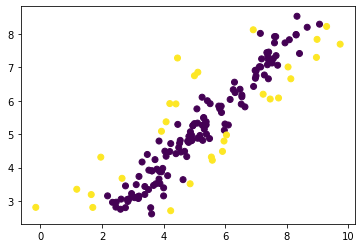

In [107]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.scatter(test_target, test_predict, c= np.abs(test_predict-test_target)>1)

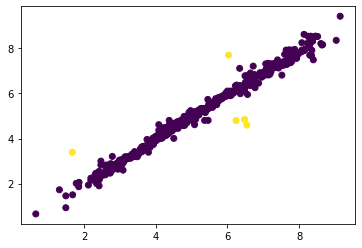

In [108]:
%matplotlib inline
import matplotlib.pyplot as plt
train_predict = target_scaler.inverse_transform(
    LS_model(train_tensor_scaled).numpy()
).flatten()
plt.scatter(train_target, train_predict, c= np.abs(train_predict-train_target)>1)

Observe learned Fweights in attention layers

In [121]:
learned_Fweights=[LS_model.layers[1].attention_layers[i].weights[0] for i in range(model_setup_params['n_attention'])]

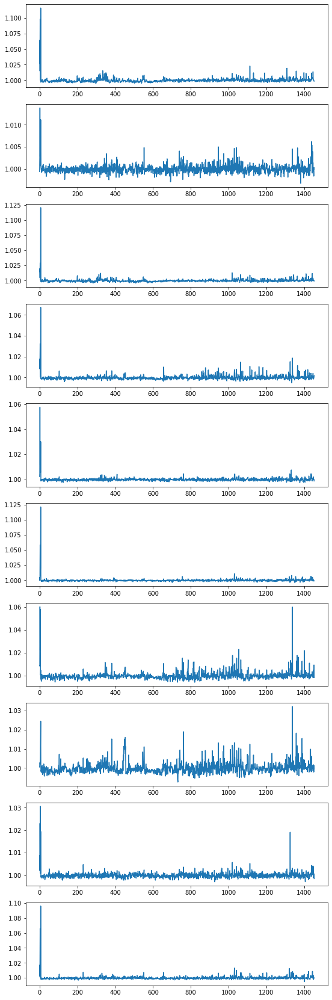

In [134]:
fig, axes = plt.subplots(10, figsize=(9,30))
for idx, ax in enumerate(axes):
    ax.plot(range(len(learned_Fweights[0].numpy()[0])), 
            learned_Fweights[idx].numpy()[0])


In [146]:
print(np.unique(np.concatenate([np.where(learned_Fweights[i].numpy()[0]>1.02)[0] for i in range(10)])))

[   0    1    2    3    4    5    6 1054 1113 1338 1401]


In [148]:
valid_features.columns[[0,1,2,3,4,5,6,1054,1113,1338,1401]]

Index(['A', 'B', 'C', 'D', 'F', 'H', 'N', 'E1e', 'ISH', 'nRSR', 'N-071'], dtype='object')

Seems like Species information are important
E1e:	1st component accessibility directional WHIM index / weighted by relative Sanderson electronegativities


Try: Scramble last layer weights and train again (bias unchanged)

In [184]:
LS_model.load_weights(checkpoint_path)

weights=LS_model.layers[-1].get_weights()
weights[0] = model_setup_params['kernel_initializer'](weights[0].shape)
weights[1] = model_setup_params['bias_initializer'](weights[1].shape)
LS_model.layers[-1].set_weights(weights)

LS_model.optimizer.learning_rate=0.1

In [185]:
LS_model.fit(train_tensor_scaled, 
             train_target_scaled,
             validation_data = (test_tensor_scaled, 
                                test_target_scaled),
             epochs = 200,
             callbacks=callbacks,
             verbose=2
            )        
# Evaluate model
LS_model.load_weights(checkpoint_path)
test_predict = target_scaler.inverse_transform(
    LS_model(test_tensor_scaled).numpy()
).flatten()

from sklearn.metrics import mean_squared_error, r2_score
rmse = mean_squared_error(test_target, test_predict, squared=False)

r2 = r2_score(test_target, test_predict, )
print(f"Split{idx}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

LS_model_results.append(["LS_model", idx, "RMSE", rmse])
LS_model_results.append(["LS_model", idx, "Rsquared", r2])

LS_model.save(os.path.join(checkpoint_path, "..", "saved_model"))

Epoch 1/200
21/21 - 3s - loss: 0.5365 - mae: 0.3217 - mse: 0.2071 - root_mean_squared_error: 0.4550 - val_loss: 0.4508 - val_mae: 0.2359 - val_mse: 0.1104 - val_root_mean_squared_error: 0.3323

Epoch 00001: val_root_mean_squared_error did not improve from 0.32464
Epoch 2/200
21/21 - 1s - loss: 0.2766 - mae: 0.0617 - mse: 0.0094 - root_mean_squared_error: 0.0970 - val_loss: 0.4422 - val_mae: 0.2273 - val_mse: 0.1121 - val_root_mean_squared_error: 0.3348

Epoch 00002: val_root_mean_squared_error did not improve from 0.32464
Epoch 3/200
21/21 - 1s - loss: 0.2674 - mae: 0.0526 - mse: 0.0074 - root_mean_squared_error: 0.0862 - val_loss: 0.4393 - val_mae: 0.2245 - val_mse: 0.1100 - val_root_mean_squared_error: 0.3317

Epoch 00003: val_root_mean_squared_error did not improve from 0.32464
Epoch 4/200
21/21 - 1s - loss: 0.2637 - mae: 0.0488 - mse: 0.0065 - root_mean_squared_error: 0.0804 - val_loss: 0.4317 - val_mae: 0.2168 - val_mse: 0.1082 - val_root_mean_squared_error: 0.3290

Epoch 00004: v


Epoch 00031: val_root_mean_squared_error did not improve from 0.32428
Epoch 32/200
21/21 - 1s - loss: 0.2482 - mae: 0.0335 - mse: 0.0042 - root_mean_squared_error: 0.0650 - val_loss: 0.4365 - val_mae: 0.2218 - val_mse: 0.1126 - val_root_mean_squared_error: 0.3355

Epoch 00032: val_root_mean_squared_error did not improve from 0.32428
Epoch 33/200
21/21 - 1s - loss: 0.2490 - mae: 0.0343 - mse: 0.0044 - root_mean_squared_error: 0.0661 - val_loss: 0.4340 - val_mae: 0.2193 - val_mse: 0.1112 - val_root_mean_squared_error: 0.3335

Epoch 00033: val_root_mean_squared_error did not improve from 0.32428
Epoch 34/200
21/21 - 1s - loss: 0.2493 - mae: 0.0346 - mse: 0.0048 - root_mean_squared_error: 0.0695 - val_loss: 0.4445 - val_mae: 0.2298 - val_mse: 0.1176 - val_root_mean_squared_error: 0.3429

Epoch 00034: val_root_mean_squared_error did not improve from 0.32428
Epoch 35/200
21/21 - 1s - loss: 0.2495 - mae: 0.0348 - mse: 0.0048 - root_mean_squared_error: 0.0690 - val_loss: 0.4369 - val_mae: 0.2


Epoch 00062: val_root_mean_squared_error did not improve from 0.32428
Epoch 63/200
21/21 - 1s - loss: 0.2464 - mae: 0.0319 - mse: 0.0045 - root_mean_squared_error: 0.0672 - val_loss: 0.4392 - val_mae: 0.2247 - val_mse: 0.1165 - val_root_mean_squared_error: 0.3414

Epoch 00063: val_root_mean_squared_error did not improve from 0.32428
Epoch 64/200
21/21 - 1s - loss: 0.2466 - mae: 0.0321 - mse: 0.0041 - root_mean_squared_error: 0.0643 - val_loss: 0.4448 - val_mae: 0.2303 - val_mse: 0.1185 - val_root_mean_squared_error: 0.3443

Epoch 00064: val_root_mean_squared_error did not improve from 0.32428
Epoch 65/200
21/21 - 1s - loss: 0.2463 - mae: 0.0318 - mse: 0.0043 - root_mean_squared_error: 0.0655 - val_loss: 0.4326 - val_mae: 0.2182 - val_mse: 0.1131 - val_root_mean_squared_error: 0.3362

Epoch 00065: val_root_mean_squared_error did not improve from 0.32428
Epoch 66/200
21/21 - 1s - loss: 0.2443 - mae: 0.0298 - mse: 0.0042 - root_mean_squared_error: 0.0651 - val_loss: 0.4354 - val_mae: 0.2


Epoch 00093: val_root_mean_squared_error did not improve from 0.32428
Epoch 94/200
21/21 - 3s - loss: 0.2430 - mae: 0.0287 - mse: 0.0039 - root_mean_squared_error: 0.0627 - val_loss: 0.4337 - val_mae: 0.2194 - val_mse: 0.1115 - val_root_mean_squared_error: 0.3340

Epoch 00094: val_root_mean_squared_error did not improve from 0.32428
Epoch 95/200
21/21 - 3s - loss: 0.2432 - mae: 0.0288 - mse: 0.0040 - root_mean_squared_error: 0.0632 - val_loss: 0.4388 - val_mae: 0.2245 - val_mse: 0.1185 - val_root_mean_squared_error: 0.3442

Epoch 00095: val_root_mean_squared_error did not improve from 0.32428
Epoch 96/200
21/21 - 3s - loss: 0.2425 - mae: 0.0282 - mse: 0.0037 - root_mean_squared_error: 0.0609 - val_loss: 0.4354 - val_mae: 0.2210 - val_mse: 0.1138 - val_root_mean_squared_error: 0.3374

Epoch 00096: val_root_mean_squared_error did not improve from 0.32428
Epoch 97/200
21/21 - 3s - loss: 0.2431 - mae: 0.0288 - mse: 0.0043 - root_mean_squared_error: 0.0652 - val_loss: 0.4338 - val_mae: 0.2

KeyboardInterrupt: 

In [29]:
plt.scatter(train_target, train_predict, c =res)

NameError: name 'res' is not defined

In [46]:
attentions=LS_model.layers[1](train_tensor_scaled).numpy()

In [27]:
attentions.shape

(769, 512)

In [47]:
res = np.abs(train_target-train_predict)

In [115]:
LS_model

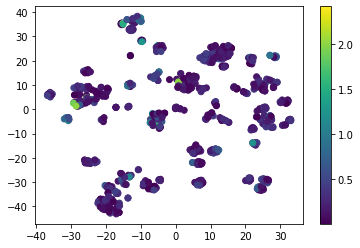

In [49]:
from sklearn.manifold import TSNE
dr = TSNE()
embedding=dr.fit_transform(attentions)
plt.scatter(embedding[:,0], embedding[:,1], c=res)
plt.colorbar()

In [ ]:
#Try Adam?

In [100]:
np.where(test_predict>9.5)

(array([ 52,  78,  81, 153], dtype=int64),)

In [101]:
test_predict[52]

9.9495

In [102]:
test_target[52]

2.38

In [51]:
# RobustScaler target scaler (instead of MinMax)

for root, dirs, files in os.walk("ExtendedDataset_PreliminaryModels"):
    break
# Get latest files
dirs = list(filter(lambda x: "LSwFW_RobustScaler_leaky_relu" in x, dirs))

from sklearn.preprocessing import StandardScaler, MinMaxScaler
#Convenience function for loading indices, Fweights and scaling
def load_splits(model_folder, 
                all_features=all_features,
                all_target=all_target,
                all_Fweights=Fweights,
               ):
    with open(os.path.join(model_folder, "input_info.ob"), 'rb') as f:
        to_load = pickle.load(f)
    final_selected_feat_ind = to_load['final_selected_feat_ind']
    train_ind, test_ind = to_load['train_ind'], to_load['test_ind']
    train_features = all_features.iloc[train_ind, final_selected_feat_ind].values
    test_features = all_features.iloc[test_ind, final_selected_feat_ind].values
    train_target = all_target.iloc[train_ind].values
    test_target = all_target.iloc[test_ind].values

#     train_Fweights = to_load['train_Fweights']
#     test_Fweights = to_load['test_Fweights']
    test_Fweights = Fweights[test_ind]

    # Scaling
    # Scaling
    feature_scaler = StandardScaler()
#     target_scaler = MinMaxScaler(feature_range=(0.05, 0.95))
    target_scaler = RobustScaler()
    
    _ = data_scaling(feature_scaler, 
                 target_scaler, 
                 train_features, 
                 test_features, 
                 train_target,
                 test_target)
    train_features_scaled, test_features_scaled, train_target_scaled, test_target_scaled, feature_scaler, target_scaler=_
        

#     train_tensor_scaled = np.hstack([train_features_scaled, train_Fweights])
    test_tensor_scaled = np.hstack([test_features_scaled, test_Fweights])
    
    return test_target, test_tensor_scaled, target_scaler


tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

from sklearn.metrics import mean_squared_error, r2_score
import pickle
load_model_results = []
for i, dir_ in enumerate(dirs):
    model_folder = os.path.join("ExtendedDataset_PreliminaryModels",
                                dir_
                                )
    checkpoint_path = os.path.join(model_folder,
                                   "model_checkpoint"
                                   )
    load_model = tf.keras.models.load_model(
        os.path.join(model_folder,
                     "saved_model"
                     )
    )

    test_target, test_tensor_scaled, target_scaler = load_splits(model_folder)
    
    # Evaluate model
    load_model.load_weights(checkpoint_path)
    test_predict = target_scaler.inverse_transform(
        load_model(test_tensor_scaled).numpy()
    ).flatten()

    rmse = mean_squared_error(test_target, test_predict, squared=False)

    r2 = r2_score(test_target, test_predict, )
    print(f"Model in {dir_}: RMSE = {rmse:.3f}; R^2 = {r2:.3f}.")

    load_model_results.append(["LSwFW_model", i, "RMSE", rmse])
    load_model_results.append(["LSwFW_model", i, "Rsquared", r2])
    
LSwFW_df = pd.DataFrame(load_model_results, 
                     columns = ["Model", "Split", "Metric", "score"]
                    )
LSwFW_r2_scores = LSwFW_df.query("Metric=='Rsquared'")['score']
print(f"LSwFW scores: {np.mean(LSwFW_r2_scores):.3f}+/-{np.std(LSwFW_r2_scores):.3f}")

Model in 210422_LSwFW_RobustScaler_leaky_relu_AChEi_split00: RMSE = 0.714; R^2 = 0.822.
Model in 210423_LSwFW_RobustScaler_leaky_relu_AChEi_split01: RMSE = 0.729; R^2 = 0.831.
Model in 210423_LSwFW_RobustScaler_leaky_relu_AChEi_split02: RMSE = 0.848; R^2 = 0.759.
Model in 210423_LSwFW_RobustScaler_leaky_relu_AChEi_split03: RMSE = 0.764; R^2 = 0.781.
Model in 210423_LSwFW_RobustScaler_leaky_relu_AChEi_split04: RMSE = 0.657; R^2 = 0.829.
Model in 210423_LSwFW_RobustScaler_leaky_relu_AChEi_split05: RMSE = 0.764; R^2 = 0.804.
Model in 210423_LSwFW_RobustScaler_leaky_relu_AChEi_split06: RMSE = 0.740; R^2 = 0.812.
Model in 210423_LSwFW_RobustScaler_leaky_relu_AChEi_split07: RMSE = 0.717; R^2 = 0.819.
Model in 210423_LSwFW_RobustScaler_leaky_relu_AChEi_split08: RMSE = 0.769; R^2 = 0.765.
Model in 210423_LSwFW_RobustScaler_leaky_relu_AChEi_split09: RMSE = 0.738; R^2 = 0.811.
Model in 210423_LSwFW_RobustScaler_leaky_relu_AChEi_split10: RMSE = 0.697; R^2 = 0.829.
Model in 210423_LSwFW_RobustScal

In [77]:
target_scaler.inverse_transform(
    load_model(test_tensor_scaled).numpy()
).flatten()

array([1.9389361, 4.530609 , 4.41186  , 8.1188545, 7.1732244, 2.52365  ,
       2.5266426, 5.643222 , 5.9278455, 6.2442327, 7.3376474, 7.6593804,
       4.524948 , 4.7260556, 3.8808644, 4.8061194, 5.107792 , 5.2729754,
       8.425752 , 8.042268 , 3.5504527, 2.9542212, 6.3502774, 5.890639 ,
       6.5165806, 6.5505877, 4.549848 , 4.2907834, 4.422671 , 8.357811 ,
       8.497502 , 1.8522005, 2.5703058, 3.116375 , 6.808351 , 4.7260866,
       7.1550293, 6.044953 , 5.022742 , 8.1760845, 8.338043 , 7.3836217,
       7.328752 , 7.753485 , 6.186719 , 6.186719 , 7.975631 , 7.975631 ,
       3.2960074, 3.5383046, 3.644127 , 9.208488 , 4.879979 , 5.0782604,
       5.1531644, 4.148884 , 7.6621494, 3.965707 , 5.3730364, 5.1119385,
       4.411091 , 4.339494 , 9.24346  , 6.429094 , 6.9735947, 7.8925533,
       7.8774004, 4.9592276, 3.3942254, 4.4701405, 2.7898433, 3.7636216,
       6.1487446, 7.007718 , 7.1192627, 5.973104 , 6.828064 , 3.4072018,
       5.3753552, 3.118637 , 5.152515 , 6.526247 , 

In [79]:
test_target

array([1.7 , 4.79, 4.49, 8.08, 8.3 , 2.46, 2.92, 5.38, 7.  , 6.91, 6.97,
       7.2 , 4.08, 3.52, 3.72, 5.18, 6.11, 5.67, 7.41, 7.62, 3.4 , 2.95,
       6.48, 6.38, 6.54, 5.11, 4.41, 4.78, 4.78, 8.11, 8.41, 2.58, 2.41,
       3.33, 7.4 , 6.18, 7.11, 5.52, 4.08, 8.28, 8.3 , 7.56, 7.13, 6.54,
       6.56, 7.28, 8.08, 7.84, 3.42, 3.85, 2.89, 8.66, 2.38, 6.08, 6.65,
       4.08, 5.54, 5.23, 6.09, 6.17, 4.26, 4.9 , 8.69, 7.12, 6.12, 7.56,
       8.03, 4.38, 2.68, 4.32, 3.41, 8.82, 5.08, 6.52, 7.82, 6.11, 5.88,
       2.72, 6.03, 3.11, 5.11, 6.26, 3.34, 4.86, 5.31, 5.96, 3.34, 7.61,
       5.15, 3.86, 4.03, 3.2 , 4.34, 4.08, 9.04, 8.64, 2.41, 4.15, 3.62,
       3.65, 3.79, 3.51, 3.93, 3.93, 2.18, 4.86, 4.91, 4.92, 3.18, 5.  ,
       4.76, 4.76, 3.88, 3.3 , 4.04, 3.47, 3.63, 2.78, 4.96, 5.08, 4.83,
       5.51, 5.9 , 3.76, 4.57, 3.44, 1.82, 6.06, 5.1 , 5.42, 3.47, 4.1 ,
       3.63, 3.78, 2.86, 4.18, 7.01, 2.41, 2.63, 4.4 , 4.46, 5.82, 5.01,
       3.98, 5.85, 6.78, 6.03, 5.88, 5.04, 5.53, 4.

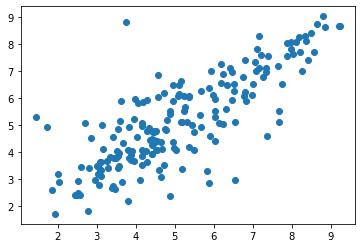

In [80]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.scatter(test_predict, test_target)

In [56]:
from scipy.stats import ttest_rel
print(ttest_rel(LSwFW_r2_scores, r2_scores))
print(ttest_rel(LSwFW_r2_scores, LS_r2_scores))
print(ttest_rel(r2_scores, LS_r2_scores))

Ttest_relResult(statistic=-7.751028379523153, pvalue=4.5987435302779364e-10)
Ttest_relResult(statistic=-3.825877806600723, pvalue=0.00036949803068020567)
Ttest_relResult(statistic=7.580297462233027, pvalue=8.417597476383679e-10)


# Draw some analytical diagrams

In [58]:
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1234)
for idx, (train_ind, test_ind) in enumerate(
    rkf.split(selected_features)):
    break


## Visualize fit

In [ ]:
LSwFW_model=tf.keras.models.load_model(os.path.join(
    "ExtendedDataset_PreliminaryModels", 
    "210422_LSwFW_RobustScaler_leaky_relu_AChEi_split00"
))

In [5]:
import tensorflow as tf
input_shape = (10,)
input_layer = tf.keras.layers.Input(shape=input_shape)
first_layer = tf.keras.layers.Dense(20)(input_layer)

In [6]:
tf.keras.Model(inputs=input_layer, 
               outputs=first_layer)